In [73]:
from sklearn.datasets import make_regression
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from scipy.stats import norm
from scipy import stats
import warnings
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.metrics import make_scorer
from sklearn.model_selection import KFold

from sklearn import linear_model
from sklearn.model_selection import train_test_split

warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import r2_score, mean_squared_error

from sklearn.preprocessing import LabelEncoder, OrdinalEncoder, RobustScaler
from scipy.special import boxcox1p

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OrdinalEncoder

In [74]:
import shap
import xgboost as xgb
from catboost import Pool
from sklearn.svm import SVR
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeRegressor
from mlxtend.regressor import StackingRegressor
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_squared_log_error

In [75]:
def load_dataset(path):
    dataset = pd.read_csv(path, header=0, delimiter=',')
    return dataset


In [76]:
train = load_dataset('house-prices-advanced-regression-techniques/train.csv')
test = load_dataset('house-prices-advanced-regression-techniques/test.csv')

# EDA

In [77]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

## SalePrice Analysis

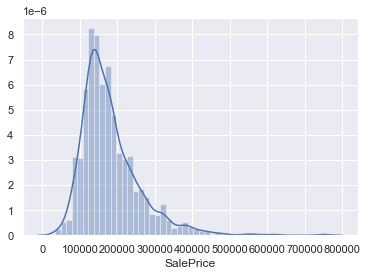

In [78]:
train['SalePrice'].describe()
sns.distplot(train['SalePrice'])
plt.show()

### Let's see the correlation between "SalePrice" and some important variables

As we can observe, our target shows a deviate from the
normal distribution, have appreciable positive skewness and
shows peakedness.

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


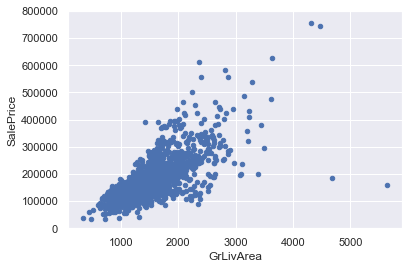

In [79]:
# scatter plot GrLivArea/saleprice
var = 'GrLivArea'
data = pd.concat([train['SalePrice'], train[var]], axis=1)
data.plot.scatter(x=var, y='SalePrice', ylim=(0, 800000));
plt.show()
plt.close()


GrLivArea: Above grade (ground) living area square fe-
et, seems to show a certain linear relationship and at the
same time we can observe the existence of outliers that will
be treated later

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


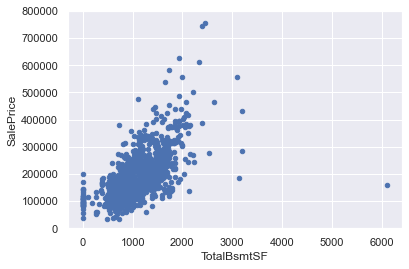

In [80]:
# scatter plot totalbsmtsf/saleprice
var = 'TotalBsmtSF'
data = pd.concat([train['SalePrice'], train[var]], axis=1)
data.plot.scatter(x=var, y='SalePrice', ylim=(0, 800000));
plt.show()
plt.close()

TotalBsmtSF: Total square feet of basement area, shows
strong relation with ”SalePrice”, almost exponential relation

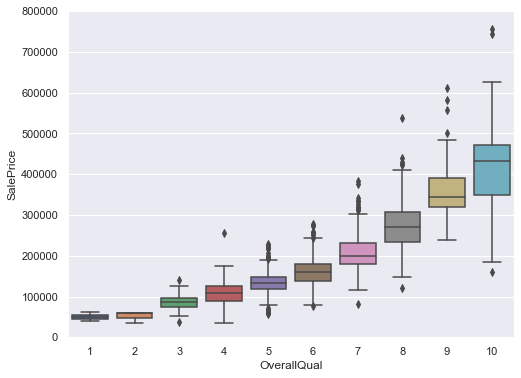

In [81]:
# Relationship with categorical features
# box plot overallqual/saleprice
var = 'OverallQual'
data = pd.concat([train['SalePrice'], train[var]], axis=1)
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x=var, y="SalePrice", data=data)
fig.axis(ymin=0, ymax=800000);
plt.show()

OverallQual: Rates the overall material and finish of the
house and shows also a linear relation with our target

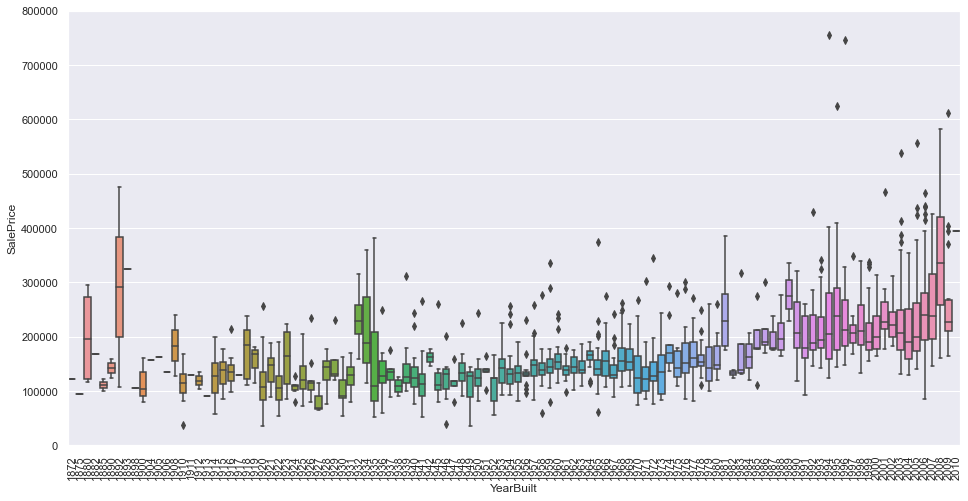

In [82]:
# box plot YearBuilt/saleprice
var = 'YearBuilt'
data = pd.concat([train['SalePrice'], train[var]], axis=1)
f, ax = plt.subplots(figsize=(16, 8))
fig = sns.boxplot(x=var, y="SalePrice", data=data)
fig.axis(ymin=0, ymax=800000);
plt.xticks(rotation=90);
plt.show()

YearBuilt: Original construction date, does not show a
strong relation, and also we should take on count that we
don’t know if ’SalePrice’ is in constant prices. Constant
prices try to remove the effect of inflation. If ’SalePrice’
is not in constant prices, it should be, so that prices are
comparable over the years.

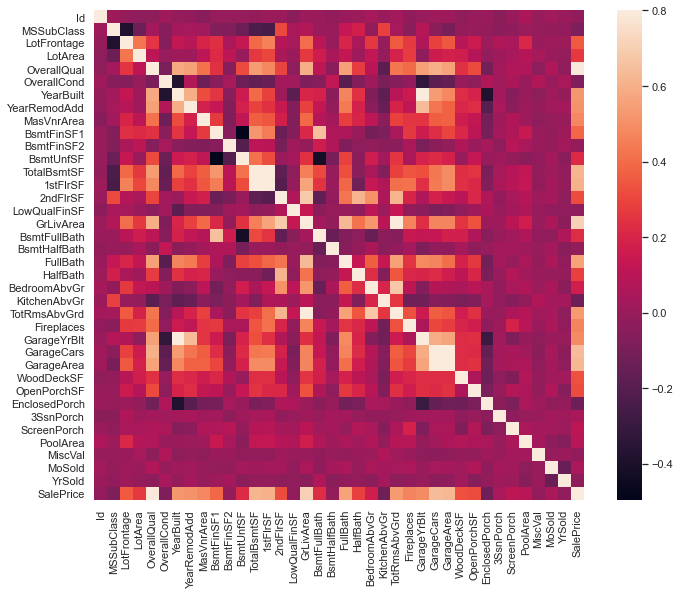

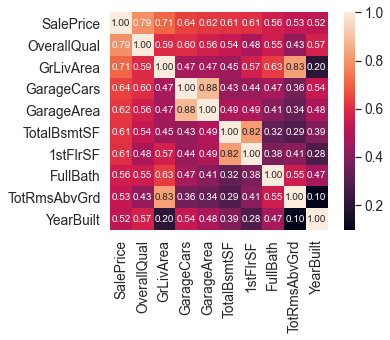

In [83]:
# Correlation Matrix

corrmat = train.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);
plt.show()
plt.close()
# due to the this heatmap is too big lets see ah reduced heatmap with just the 10 variables most correlated
# saleprice correlation matrix
k = 10  # number of variables for heatmap
cols = corrmat.nlargest(k, 'SalePrice')['SalePrice'].index
cm = np.corrcoef(train[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values,
                     xticklabels=cols.values)
plt.show()
# Once analysed this correlation, we can confirm that the next variables are the most important
# 'GarageCars' and 'GarageArea' are the same, so we take the most correlated
# with 'TotalBsmtSF'-'1stFloor' and 'TotRmsAbvGrd'-'GrLivArea', occurs the same

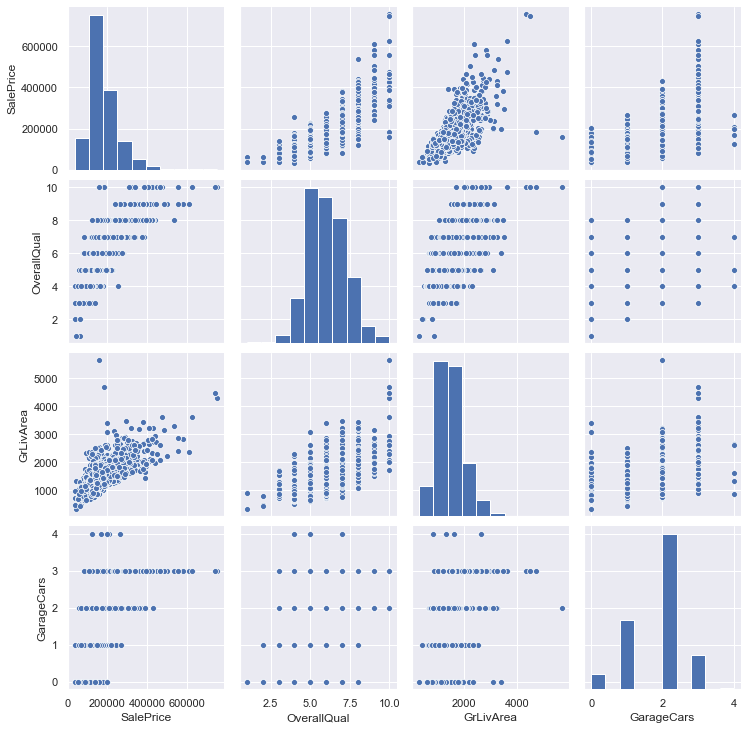

In [84]:
# Lets see a scatter plot of the most important variables
sns.set()
cols = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars']
sns.pairplot(train[cols], size=2.5)
plt.show()

In [85]:
#save columns of Id to the submission 
test_id_submissions = test["Id"]

In [86]:
#Deleteting irrelevant columns
test.drop(["Id"],axis=1, inplace=True)
train.drop(["Id"],axis=1, inplace=True)

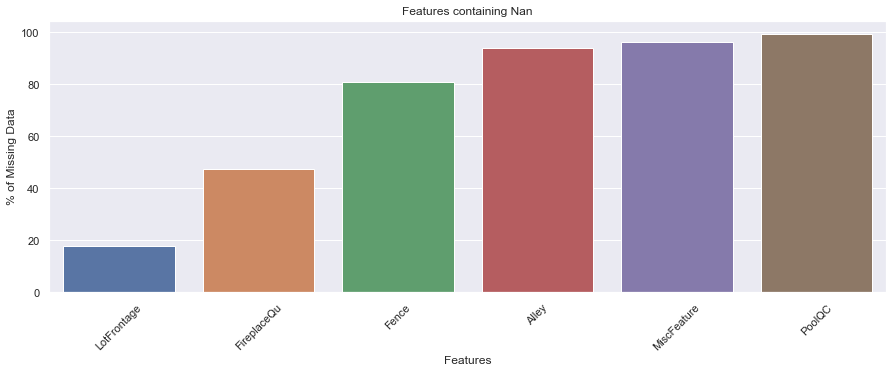

In [121]:
klk = nan[nan['Perc(%)'] > 10]
plt.figure(figsize = (15,5))
sns.barplot(x = klk['feat'], y = klk['Perc(%)'])
plt.xticks(rotation=45)
plt.title('Features containing Nan')
plt.xlabel('Features')
plt.ylabel('% of Missing Data')
plt.show()

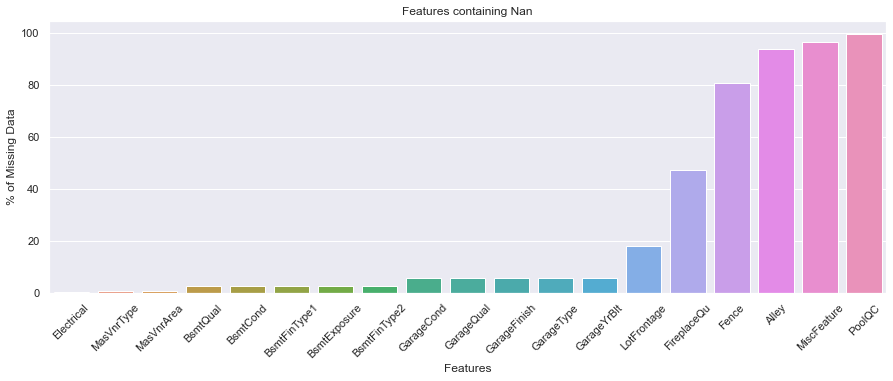

In [87]:
# Looking at NaN % within the data

nan = pd.DataFrame(train.isna().sum(), columns = ['NaN_sum'])
nan['feat'] = nan.index
nan['Perc(%)'] = (nan['NaN_sum']/1460)*100
nan = nan[nan['NaN_sum'] > 0]
nan = nan.sort_values(by = ['NaN_sum'])
nan['Usability'] = np.where(nan['Perc(%)'] > 20, 'Discard', 'Keep')
nan
# Plotting Nan

plt.figure(figsize = (15,5))
sns.barplot(x = nan['feat'], y = nan['Perc(%)'])
plt.xticks(rotation=45)
plt.title('Features containing Nan')
plt.xlabel('Features')
plt.ylabel('% of Missing Data')
plt.show()

### Remove Missing Values in Categorical Columns

### Imputation Transformer

I will use an imputation transformer for completing missing values. Specifically out-of-the-box imputation transformer from Scikit-Learn packages. 

In [88]:
numerical_cols_with_missing_values = ['FullBath', 'KitchenAbvGr', 'BsmtUnfSF', 'MoSold', 'BsmtFinSF2', 'MasVnrArea', 'OpenPorchSF', 'WoodDeckSF', '1stFlrSF', 'ScreenPorch', 'TotRmsAbvGrd', 'GarageCars', '2ndFlrSF', 'BsmtFullBath', 'TotalBsmtSF', 'BsmtHalfBath', 'EnclosedPorch', 'OverallQual', 'PoolArea', 'OverallCond', 'GrLivArea', 'LotArea', 'HalfBath', 'YearRemodAdd', 'GarageArea', 'YrSold', 'LotFrontage', '3SsnPorch', 'MiscVal', 'BedroomAbvGr', 'Fireplaces', 'YearBuilt', 'BsmtFinSF1', 'LowQualFinSF', 'GarageYrBlt', 'MSSubClass']

for column in numerical_cols_with_missing_values:
    simple_imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
    train[column] = simple_imputer.fit_transform(train[column].values.reshape(-1,1))[:,0]
    if column in test:
        test[column] = simple_imputer.transform(test[column].astype(train[column].dtypes).values.reshape(-1,1))[:,0]

In [89]:
string_cols_with_missing_values = ['Exterior2nd', 'Exterior1st', 'SaleType', 'HeatingQC', 'BsmtFinType1', 'BsmtQual', 'PoolQC', 'GarageCond', 'BsmtFinType2', 'Foundation', 'FireplaceQu', 'KitchenQual', 'LandSlope', 'MiscFeature', 'Alley', 'LotShape', 'SaleCondition', 'Electrical', 'Condition1', 'PavedDrive', 'LandContour', 'ExterCond', 'BsmtExposure', 'MSZoning', 'BsmtCond', 'GarageQual', 'BldgType', 'GarageFinish', 'Condition2', 'GarageType', 'Fence', 'RoofStyle', 'ExterQual', 'Heating', 'Street', 'Neighborhood', 'Utilities', 'LotConfig', 'CentralAir', 'HouseStyle', 'Functional', 'MasVnrType', 'RoofMatl']
for column in string_cols_with_missing_values:
    simple_imputer = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
    train[column] = simple_imputer.fit_transform(train[column].values.reshape(-1,1))[:,0]
    if column in test:
        test[column] = simple_imputer.transform(test[column].astype(train[column].dtypes).values.reshape(-1,1))[:,0]

### Encoding Ordinal Categorical Features

In [90]:
#Encoding Ordinal Categorical Features
categorical_col = ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']

OE = OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=-1)
train[categorical_col] = pd.DataFrame(OE.fit_transform(train[categorical_col]), columns=categorical_col)
test[categorical_col] = pd.DataFrame(OE.transform(test[categorical_col]), columns=categorical_col)

### Numeric to Scale 

In the given input dataset there are 37 columns with numeric values as follows where we can convert those values to scale through log1p

In [91]:
#  scale numeric values through log1p
numeric_cols_to_scale = ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']
for column in numeric_cols_to_scale:
    train[column] = np.log1p(train[column])
    if column in test:
        test[column] = np.log1p(test[column])

In [92]:
target = train['SalePrice']
train = train.drop(['SalePrice'],axis=1)

# MODELING

In [93]:

X_train,X_val,y_train,y_val = train_test_split(train,target,test_size = 0.1,random_state=42)
print(X_train.shape)
print(y_train.shape)

def cv_rmse(model):
    rmse = np.sqrt(-cross_val_score(model, train, target, scoring="neg_mean_squared_error", cv=kf))
    return (rmse)
def rmse(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

(1314, 79)
(1314,)


In [94]:
# 10 Fold Cross validation

kf = KFold(n_splits=10, random_state=42, shuffle=True)

cv_scores = []
cv_std = []

baseline_models = ['Linear_Reg.','Bayesian_Ridge_Reg.','LGBM_Reg.','SVR',
                   'Dec_Tree_Reg.','Random_Forest_Reg.', 'XGB_Reg.',
                   'Grad_Boost_Reg.','Cat_Boost_Reg.','Stacked_Reg.']

# Linear Regression

lreg = LinearRegression()
score_lreg = cv_rmse(lreg)
cv_scores.append(score_lreg.mean())
cv_std.append(score_lreg.std())

# Bayesian Ridge Regression

brr = BayesianRidge(compute_score=True)
score_brr = cv_rmse(brr)
cv_scores.append(score_brr.mean())
cv_std.append(score_brr.std())

# Light Gradient Boost Regressor

l_gbm = LGBMRegressor(objective='regression')
score_l_gbm = cv_rmse(l_gbm)
cv_scores.append(score_l_gbm.mean())
cv_std.append(score_l_gbm.std())

# Support Vector Regression

svr = SVR()
score_svr = cv_rmse(svr)
cv_scores.append(score_svr.mean())
cv_std.append(score_svr.std())

# Decision Tree Regressor

dtr = DecisionTreeRegressor()
score_dtr = cv_rmse(dtr)
cv_scores.append(score_dtr.mean())
cv_std.append(score_dtr.std())

# Random Forest Regressor

rfr = RandomForestRegressor()
score_rfr = cv_rmse(rfr)
cv_scores.append(score_rfr.mean())
cv_std.append(score_rfr.std())

# XGB Regressor

xgb = xgb.XGBRegressor()
score_xgb = cv_rmse(xgb)
cv_scores.append(score_xgb.mean())
cv_std.append(score_xgb.std())

# Gradient Boost Regressor

gbr = GradientBoostingRegressor()
score_gbr = cv_rmse(gbr)
cv_scores.append(score_gbr.mean())
cv_std.append(score_gbr.std())

# Cat Boost Regressor

catb = CatBoostRegressor()
score_catb = cv_rmse(catb)
cv_scores.append(score_catb.mean())
cv_std.append(score_catb.std())

# Stacked Regressor

stack_gen = StackingRegressor(regressors=(CatBoostRegressor(),
                                          LinearRegression(),
                                          BayesianRidge(),
                                          GradientBoostingRegressor()),
                              meta_regressor = CatBoostRegressor(),
                              use_features_in_secondary = True)

score_stack_gen = cv_rmse(stack_gen)
cv_scores.append(score_stack_gen.mean())
cv_std.append(score_stack_gen.std())

final_cv_score = pd.DataFrame(baseline_models, columns = ['Regressors'])
final_cv_score['RMSE_mean'] = cv_scores
final_cv_score['RMSE_std'] = cv_std

Learning rate set to 0.042748
0:	learn: 0.3830731	total: 11.1ms	remaining: 11.1s
1:	learn: 0.3729366	total: 14.7ms	remaining: 7.34s
2:	learn: 0.3639268	total: 18.3ms	remaining: 6.07s
3:	learn: 0.3538247	total: 21.8ms	remaining: 5.42s
4:	learn: 0.3449241	total: 25.2ms	remaining: 5.01s
5:	learn: 0.3357239	total: 28.8ms	remaining: 4.77s
6:	learn: 0.3270953	total: 32.4ms	remaining: 4.59s
7:	learn: 0.3191856	total: 36.2ms	remaining: 4.49s
8:	learn: 0.3117615	total: 40.7ms	remaining: 4.48s
9:	learn: 0.3038783	total: 45.3ms	remaining: 4.49s
10:	learn: 0.2964764	total: 48.6ms	remaining: 4.37s
11:	learn: 0.2898775	total: 52.4ms	remaining: 4.31s
12:	learn: 0.2832537	total: 55.8ms	remaining: 4.24s
13:	learn: 0.2768860	total: 59.3ms	remaining: 4.18s
14:	learn: 0.2710889	total: 62.7ms	remaining: 4.11s
15:	learn: 0.2656492	total: 66.2ms	remaining: 4.07s
16:	learn: 0.2600223	total: 69.7ms	remaining: 4.03s
17:	learn: 0.2550775	total: 73.8ms	remaining: 4.03s
18:	learn: 0.2502363	total: 77.3ms	remaining

189:	learn: 0.0951630	total: 683ms	remaining: 2.91s
190:	learn: 0.0949464	total: 689ms	remaining: 2.92s
191:	learn: 0.0948813	total: 695ms	remaining: 2.92s
192:	learn: 0.0946739	total: 698ms	remaining: 2.92s
193:	learn: 0.0944778	total: 702ms	remaining: 2.92s
194:	learn: 0.0943854	total: 715ms	remaining: 2.95s
195:	learn: 0.0940997	total: 718ms	remaining: 2.94s
196:	learn: 0.0939358	total: 721ms	remaining: 2.94s
197:	learn: 0.0937334	total: 725ms	remaining: 2.94s
198:	learn: 0.0935864	total: 728ms	remaining: 2.93s
199:	learn: 0.0934977	total: 732ms	remaining: 2.93s
200:	learn: 0.0932705	total: 735ms	remaining: 2.92s
201:	learn: 0.0931120	total: 739ms	remaining: 2.92s
202:	learn: 0.0929574	total: 742ms	remaining: 2.91s
203:	learn: 0.0928860	total: 745ms	remaining: 2.91s
204:	learn: 0.0926075	total: 749ms	remaining: 2.9s
205:	learn: 0.0923916	total: 752ms	remaining: 2.9s
206:	learn: 0.0922411	total: 755ms	remaining: 2.89s
207:	learn: 0.0920560	total: 758ms	remaining: 2.89s
208:	learn: 0.

384:	learn: 0.0705261	total: 1.36s	remaining: 2.17s
385:	learn: 0.0704183	total: 1.36s	remaining: 2.17s
386:	learn: 0.0702789	total: 1.37s	remaining: 2.17s
387:	learn: 0.0702496	total: 1.37s	remaining: 2.17s
388:	learn: 0.0702163	total: 1.38s	remaining: 2.16s
389:	learn: 0.0701630	total: 1.38s	remaining: 2.16s
390:	learn: 0.0700527	total: 1.38s	remaining: 2.15s
391:	learn: 0.0699752	total: 1.39s	remaining: 2.15s
392:	learn: 0.0698517	total: 1.39s	remaining: 2.15s
393:	learn: 0.0698171	total: 1.39s	remaining: 2.14s
394:	learn: 0.0698075	total: 1.4s	remaining: 2.14s
395:	learn: 0.0696746	total: 1.4s	remaining: 2.13s
396:	learn: 0.0695532	total: 1.4s	remaining: 2.13s
397:	learn: 0.0694720	total: 1.41s	remaining: 2.13s
398:	learn: 0.0693340	total: 1.41s	remaining: 2.12s
399:	learn: 0.0691953	total: 1.41s	remaining: 2.12s
400:	learn: 0.0690800	total: 1.42s	remaining: 2.11s
401:	learn: 0.0689721	total: 1.42s	remaining: 2.11s
402:	learn: 0.0688968	total: 1.42s	remaining: 2.11s
403:	learn: 0.0

569:	learn: 0.0560028	total: 2.03s	remaining: 1.53s
570:	learn: 0.0559955	total: 2.04s	remaining: 1.53s
571:	learn: 0.0558519	total: 2.04s	remaining: 1.53s
572:	learn: 0.0557690	total: 2.05s	remaining: 1.52s
573:	learn: 0.0556570	total: 2.05s	remaining: 1.52s
574:	learn: 0.0555561	total: 2.05s	remaining: 1.52s
575:	learn: 0.0555148	total: 2.06s	remaining: 1.51s
576:	learn: 0.0554413	total: 2.06s	remaining: 1.51s
577:	learn: 0.0554113	total: 2.07s	remaining: 1.51s
578:	learn: 0.0552795	total: 2.07s	remaining: 1.5s
579:	learn: 0.0552702	total: 2.07s	remaining: 1.5s
580:	learn: 0.0552471	total: 2.08s	remaining: 1.5s
581:	learn: 0.0551523	total: 2.08s	remaining: 1.49s
582:	learn: 0.0551025	total: 2.08s	remaining: 1.49s
583:	learn: 0.0549766	total: 2.09s	remaining: 1.49s
584:	learn: 0.0548966	total: 2.09s	remaining: 1.48s
585:	learn: 0.0548434	total: 2.09s	remaining: 1.48s
586:	learn: 0.0547643	total: 2.1s	remaining: 1.48s
587:	learn: 0.0546962	total: 2.1s	remaining: 1.47s
588:	learn: 0.054

754:	learn: 0.0449266	total: 2.71s	remaining: 879ms
755:	learn: 0.0448559	total: 2.71s	remaining: 876ms
756:	learn: 0.0447733	total: 2.72s	remaining: 873ms
757:	learn: 0.0447027	total: 2.72s	remaining: 869ms
758:	learn: 0.0446272	total: 2.73s	remaining: 866ms
759:	learn: 0.0445499	total: 2.73s	remaining: 862ms
760:	learn: 0.0445316	total: 2.73s	remaining: 858ms
761:	learn: 0.0444479	total: 2.74s	remaining: 855ms
762:	learn: 0.0443892	total: 2.74s	remaining: 851ms
763:	learn: 0.0443324	total: 2.74s	remaining: 847ms
764:	learn: 0.0442746	total: 2.75s	remaining: 844ms
765:	learn: 0.0442612	total: 2.75s	remaining: 840ms
766:	learn: 0.0442033	total: 2.75s	remaining: 836ms
767:	learn: 0.0441530	total: 2.76s	remaining: 833ms
768:	learn: 0.0441322	total: 2.76s	remaining: 829ms
769:	learn: 0.0440716	total: 2.76s	remaining: 825ms
770:	learn: 0.0440662	total: 2.77s	remaining: 822ms
771:	learn: 0.0440587	total: 2.77s	remaining: 818ms
772:	learn: 0.0440138	total: 2.77s	remaining: 814ms
773:	learn: 

928:	learn: 0.0369581	total: 3.38s	remaining: 259ms
929:	learn: 0.0369550	total: 3.39s	remaining: 255ms
930:	learn: 0.0369299	total: 3.39s	remaining: 252ms
931:	learn: 0.0368443	total: 3.4s	remaining: 248ms
932:	learn: 0.0367849	total: 3.4s	remaining: 244ms
933:	learn: 0.0367564	total: 3.4s	remaining: 240ms
934:	learn: 0.0367201	total: 3.41s	remaining: 237ms
935:	learn: 0.0366595	total: 3.41s	remaining: 233ms
936:	learn: 0.0366408	total: 3.41s	remaining: 230ms
937:	learn: 0.0365992	total: 3.42s	remaining: 226ms
938:	learn: 0.0365392	total: 3.42s	remaining: 222ms
939:	learn: 0.0365309	total: 3.42s	remaining: 218ms
940:	learn: 0.0365036	total: 3.43s	remaining: 215ms
941:	learn: 0.0364383	total: 3.43s	remaining: 211ms
942:	learn: 0.0363996	total: 3.43s	remaining: 208ms
943:	learn: 0.0363664	total: 3.44s	remaining: 204ms
944:	learn: 0.0363588	total: 3.44s	remaining: 200ms
945:	learn: 0.0363164	total: 3.44s	remaining: 197ms
946:	learn: 0.0363083	total: 3.45s	remaining: 193ms
947:	learn: 0.0

99:	learn: 0.1177415	total: 347ms	remaining: 3.13s
100:	learn: 0.1173320	total: 352ms	remaining: 3.13s
101:	learn: 0.1168307	total: 357ms	remaining: 3.14s
102:	learn: 0.1163900	total: 360ms	remaining: 3.14s
103:	learn: 0.1158363	total: 363ms	remaining: 3.13s
104:	learn: 0.1155491	total: 367ms	remaining: 3.12s
105:	learn: 0.1150420	total: 370ms	remaining: 3.12s
106:	learn: 0.1146450	total: 373ms	remaining: 3.11s
107:	learn: 0.1142429	total: 376ms	remaining: 3.11s
108:	learn: 0.1139333	total: 380ms	remaining: 3.1s
109:	learn: 0.1135408	total: 383ms	remaining: 3.1s
110:	learn: 0.1131551	total: 386ms	remaining: 3.09s
111:	learn: 0.1127200	total: 390ms	remaining: 3.09s
112:	learn: 0.1124512	total: 393ms	remaining: 3.09s
113:	learn: 0.1119512	total: 397ms	remaining: 3.08s
114:	learn: 0.1116666	total: 400ms	remaining: 3.08s
115:	learn: 0.1113368	total: 403ms	remaining: 3.07s
116:	learn: 0.1110256	total: 406ms	remaining: 3.06s
117:	learn: 0.1106654	total: 410ms	remaining: 3.06s
118:	learn: 0.1

272:	learn: 0.0809145	total: 1.02s	remaining: 2.72s
273:	learn: 0.0807222	total: 1.03s	remaining: 2.72s
274:	learn: 0.0806073	total: 1.03s	remaining: 2.72s
275:	learn: 0.0804891	total: 1.03s	remaining: 2.71s
276:	learn: 0.0803522	total: 1.04s	remaining: 2.71s
277:	learn: 0.0801335	total: 1.04s	remaining: 2.7s
278:	learn: 0.0799585	total: 1.04s	remaining: 2.7s
279:	learn: 0.0797382	total: 1.05s	remaining: 2.69s
280:	learn: 0.0795779	total: 1.05s	remaining: 2.69s
281:	learn: 0.0794036	total: 1.05s	remaining: 2.68s
282:	learn: 0.0792853	total: 1.06s	remaining: 2.68s
283:	learn: 0.0791680	total: 1.06s	remaining: 2.67s
284:	learn: 0.0790837	total: 1.06s	remaining: 2.67s
285:	learn: 0.0789578	total: 1.07s	remaining: 2.66s
286:	learn: 0.0787473	total: 1.07s	remaining: 2.66s
287:	learn: 0.0786130	total: 1.07s	remaining: 2.65s
288:	learn: 0.0785805	total: 1.08s	remaining: 2.65s
289:	learn: 0.0784768	total: 1.08s	remaining: 2.64s
290:	learn: 0.0783642	total: 1.08s	remaining: 2.64s
291:	learn: 0.

452:	learn: 0.0623705	total: 1.69s	remaining: 2.05s
453:	learn: 0.0623228	total: 1.7s	remaining: 2.04s
454:	learn: 0.0622398	total: 1.7s	remaining: 2.04s
455:	learn: 0.0621474	total: 1.71s	remaining: 2.04s
456:	learn: 0.0620662	total: 1.71s	remaining: 2.03s
457:	learn: 0.0620137	total: 1.71s	remaining: 2.03s
458:	learn: 0.0619230	total: 1.72s	remaining: 2.02s
459:	learn: 0.0618577	total: 1.72s	remaining: 2.02s
460:	learn: 0.0618022	total: 1.72s	remaining: 2.02s
461:	learn: 0.0617226	total: 1.73s	remaining: 2.01s
462:	learn: 0.0616385	total: 1.73s	remaining: 2.01s
463:	learn: 0.0615680	total: 1.74s	remaining: 2s
464:	learn: 0.0614932	total: 1.74s	remaining: 2s
465:	learn: 0.0614250	total: 1.75s	remaining: 2s
466:	learn: 0.0613487	total: 1.75s	remaining: 2s
467:	learn: 0.0612255	total: 1.75s	remaining: 1.99s
468:	learn: 0.0611421	total: 1.76s	remaining: 1.99s
469:	learn: 0.0610459	total: 1.76s	remaining: 1.99s
470:	learn: 0.0609684	total: 1.77s	remaining: 1.99s
471:	learn: 0.0608416	tota

640:	learn: 0.0504411	total: 2.37s	remaining: 1.33s
641:	learn: 0.0503852	total: 2.38s	remaining: 1.32s
642:	learn: 0.0503387	total: 2.38s	remaining: 1.32s
643:	learn: 0.0502761	total: 2.38s	remaining: 1.32s
644:	learn: 0.0501991	total: 2.39s	remaining: 1.31s
645:	learn: 0.0501558	total: 2.39s	remaining: 1.31s
646:	learn: 0.0501201	total: 2.4s	remaining: 1.31s
647:	learn: 0.0500733	total: 2.4s	remaining: 1.3s
648:	learn: 0.0500688	total: 2.4s	remaining: 1.3s
649:	learn: 0.0500115	total: 2.41s	remaining: 1.3s
650:	learn: 0.0499535	total: 2.41s	remaining: 1.29s
651:	learn: 0.0499268	total: 2.41s	remaining: 1.29s
652:	learn: 0.0498530	total: 2.42s	remaining: 1.28s
653:	learn: 0.0497643	total: 2.42s	remaining: 1.28s
654:	learn: 0.0497299	total: 2.42s	remaining: 1.28s
655:	learn: 0.0497102	total: 2.43s	remaining: 1.27s
656:	learn: 0.0496316	total: 2.43s	remaining: 1.27s
657:	learn: 0.0495552	total: 2.44s	remaining: 1.26s
658:	learn: 0.0494924	total: 2.44s	remaining: 1.26s
659:	learn: 0.0494

836:	learn: 0.0415814	total: 3.04s	remaining: 593ms
837:	learn: 0.0415488	total: 3.05s	remaining: 589ms
838:	learn: 0.0415220	total: 3.05s	remaining: 586ms
839:	learn: 0.0415091	total: 3.06s	remaining: 582ms
840:	learn: 0.0414630	total: 3.06s	remaining: 579ms
841:	learn: 0.0414412	total: 3.06s	remaining: 575ms
842:	learn: 0.0413711	total: 3.07s	remaining: 571ms
843:	learn: 0.0413601	total: 3.07s	remaining: 568ms
844:	learn: 0.0412955	total: 3.07s	remaining: 564ms
845:	learn: 0.0412542	total: 3.08s	remaining: 560ms
846:	learn: 0.0411725	total: 3.08s	remaining: 556ms
847:	learn: 0.0411302	total: 3.08s	remaining: 553ms
848:	learn: 0.0410967	total: 3.09s	remaining: 549ms
849:	learn: 0.0410429	total: 3.09s	remaining: 545ms
850:	learn: 0.0409809	total: 3.09s	remaining: 542ms
851:	learn: 0.0409156	total: 3.1s	remaining: 538ms
852:	learn: 0.0408882	total: 3.1s	remaining: 534ms
853:	learn: 0.0408482	total: 3.1s	remaining: 531ms
854:	learn: 0.0408173	total: 3.11s	remaining: 527ms
855:	learn: 0.0

13:	learn: 0.2833581	total: 75.8ms	remaining: 5.34s
14:	learn: 0.2772265	total: 82.9ms	remaining: 5.44s
15:	learn: 0.2715620	total: 88ms	remaining: 5.41s
16:	learn: 0.2659153	total: 92.4ms	remaining: 5.34s
17:	learn: 0.2610334	total: 96.9ms	remaining: 5.29s
18:	learn: 0.2557231	total: 101ms	remaining: 5.22s
19:	learn: 0.2502889	total: 106ms	remaining: 5.18s
20:	learn: 0.2451128	total: 110ms	remaining: 5.14s
21:	learn: 0.2402709	total: 115ms	remaining: 5.09s
22:	learn: 0.2357447	total: 119ms	remaining: 5.07s
23:	learn: 0.2314593	total: 124ms	remaining: 5.03s
24:	learn: 0.2274749	total: 128ms	remaining: 5s
25:	learn: 0.2234854	total: 133ms	remaining: 4.98s
26:	learn: 0.2197668	total: 138ms	remaining: 4.96s
27:	learn: 0.2160413	total: 142ms	remaining: 4.94s
28:	learn: 0.2127955	total: 147ms	remaining: 4.92s
29:	learn: 0.2092766	total: 152ms	remaining: 4.92s
30:	learn: 0.2059954	total: 158ms	remaining: 4.95s
31:	learn: 0.2028356	total: 163ms	remaining: 4.93s
32:	learn: 0.1997492	total: 168

199:	learn: 0.0941297	total: 747ms	remaining: 2.99s
200:	learn: 0.0939783	total: 751ms	remaining: 2.99s
201:	learn: 0.0937297	total: 756ms	remaining: 2.98s
202:	learn: 0.0935344	total: 759ms	remaining: 2.98s
203:	learn: 0.0933439	total: 762ms	remaining: 2.97s
204:	learn: 0.0932251	total: 766ms	remaining: 2.97s
205:	learn: 0.0930938	total: 770ms	remaining: 2.97s
206:	learn: 0.0929585	total: 773ms	remaining: 2.96s
207:	learn: 0.0928145	total: 776ms	remaining: 2.96s
208:	learn: 0.0925864	total: 780ms	remaining: 2.95s
209:	learn: 0.0924703	total: 783ms	remaining: 2.94s
210:	learn: 0.0922762	total: 786ms	remaining: 2.94s
211:	learn: 0.0922101	total: 789ms	remaining: 2.93s
212:	learn: 0.0919645	total: 792ms	remaining: 2.93s
213:	learn: 0.0918074	total: 796ms	remaining: 2.92s
214:	learn: 0.0917075	total: 799ms	remaining: 2.92s
215:	learn: 0.0914365	total: 802ms	remaining: 2.91s
216:	learn: 0.0912172	total: 805ms	remaining: 2.91s
217:	learn: 0.0909965	total: 809ms	remaining: 2.9s
218:	learn: 0

399:	learn: 0.0695182	total: 1.42s	remaining: 2.13s
400:	learn: 0.0694488	total: 1.43s	remaining: 2.13s
401:	learn: 0.0692732	total: 1.43s	remaining: 2.13s
402:	learn: 0.0691717	total: 1.43s	remaining: 2.13s
403:	learn: 0.0691147	total: 1.44s	remaining: 2.12s
404:	learn: 0.0689216	total: 1.44s	remaining: 2.12s
405:	learn: 0.0687941	total: 1.44s	remaining: 2.11s
406:	learn: 0.0686753	total: 1.45s	remaining: 2.11s
407:	learn: 0.0685893	total: 1.45s	remaining: 2.1s
408:	learn: 0.0685096	total: 1.45s	remaining: 2.1s
409:	learn: 0.0684789	total: 1.46s	remaining: 2.1s
410:	learn: 0.0684017	total: 1.46s	remaining: 2.09s
411:	learn: 0.0683869	total: 1.46s	remaining: 2.09s
412:	learn: 0.0683096	total: 1.47s	remaining: 2.09s
413:	learn: 0.0682276	total: 1.47s	remaining: 2.08s
414:	learn: 0.0681299	total: 1.47s	remaining: 2.08s
415:	learn: 0.0680024	total: 1.48s	remaining: 2.07s
416:	learn: 0.0678754	total: 1.48s	remaining: 2.07s
417:	learn: 0.0677900	total: 1.48s	remaining: 2.07s
418:	learn: 0.0

590:	learn: 0.0541768	total: 2.1s	remaining: 1.45s
591:	learn: 0.0540893	total: 2.1s	remaining: 1.45s
592:	learn: 0.0540229	total: 2.11s	remaining: 1.45s
593:	learn: 0.0539618	total: 2.12s	remaining: 1.45s
594:	learn: 0.0539030	total: 2.12s	remaining: 1.44s
595:	learn: 0.0538635	total: 2.12s	remaining: 1.44s
596:	learn: 0.0537824	total: 2.13s	remaining: 1.44s
597:	learn: 0.0537053	total: 2.13s	remaining: 1.43s
598:	learn: 0.0536436	total: 2.14s	remaining: 1.43s
599:	learn: 0.0536127	total: 2.14s	remaining: 1.43s
600:	learn: 0.0535170	total: 2.15s	remaining: 1.42s
601:	learn: 0.0534594	total: 2.15s	remaining: 1.42s
602:	learn: 0.0533869	total: 2.15s	remaining: 1.42s
603:	learn: 0.0533017	total: 2.16s	remaining: 1.42s
604:	learn: 0.0532537	total: 2.16s	remaining: 1.41s
605:	learn: 0.0531824	total: 2.17s	remaining: 1.41s
606:	learn: 0.0531375	total: 2.17s	remaining: 1.41s
607:	learn: 0.0530782	total: 2.18s	remaining: 1.4s
608:	learn: 0.0529988	total: 2.18s	remaining: 1.4s
609:	learn: 0.05

781:	learn: 0.0434341	total: 2.77s	remaining: 773ms
782:	learn: 0.0433970	total: 2.78s	remaining: 769ms
783:	learn: 0.0433240	total: 2.78s	remaining: 766ms
784:	learn: 0.0432692	total: 2.78s	remaining: 762ms
785:	learn: 0.0431984	total: 2.79s	remaining: 759ms
786:	learn: 0.0431386	total: 2.79s	remaining: 756ms
787:	learn: 0.0430916	total: 2.79s	remaining: 752ms
788:	learn: 0.0430408	total: 2.8s	remaining: 749ms
789:	learn: 0.0429690	total: 2.8s	remaining: 745ms
790:	learn: 0.0429044	total: 2.81s	remaining: 741ms
791:	learn: 0.0428538	total: 2.81s	remaining: 738ms
792:	learn: 0.0427993	total: 2.81s	remaining: 734ms
793:	learn: 0.0427570	total: 2.81s	remaining: 730ms
794:	learn: 0.0426897	total: 2.82s	remaining: 727ms
795:	learn: 0.0426259	total: 2.82s	remaining: 723ms
796:	learn: 0.0425625	total: 2.83s	remaining: 720ms
797:	learn: 0.0425024	total: 2.83s	remaining: 716ms
798:	learn: 0.0424953	total: 2.83s	remaining: 712ms
799:	learn: 0.0424597	total: 2.83s	remaining: 709ms
800:	learn: 0.

978:	learn: 0.0350510	total: 3.44s	remaining: 73.9ms
979:	learn: 0.0350231	total: 3.45s	remaining: 70.4ms
980:	learn: 0.0349758	total: 3.45s	remaining: 66.9ms
981:	learn: 0.0349408	total: 3.46s	remaining: 63.4ms
982:	learn: 0.0348999	total: 3.46s	remaining: 59.9ms
983:	learn: 0.0348755	total: 3.46s	remaining: 56.3ms
984:	learn: 0.0348502	total: 3.47s	remaining: 52.8ms
985:	learn: 0.0348329	total: 3.47s	remaining: 49.3ms
986:	learn: 0.0347743	total: 3.47s	remaining: 45.8ms
987:	learn: 0.0347148	total: 3.48s	remaining: 42.2ms
988:	learn: 0.0346833	total: 3.48s	remaining: 38.7ms
989:	learn: 0.0346543	total: 3.48s	remaining: 35.2ms
990:	learn: 0.0346017	total: 3.49s	remaining: 31.7ms
991:	learn: 0.0345493	total: 3.49s	remaining: 28.2ms
992:	learn: 0.0345281	total: 3.49s	remaining: 24.6ms
993:	learn: 0.0344971	total: 3.5s	remaining: 21.1ms
994:	learn: 0.0344436	total: 3.5s	remaining: 17.6ms
995:	learn: 0.0344210	total: 3.5s	remaining: 14.1ms
996:	learn: 0.0343765	total: 3.51s	remaining: 10.

147:	learn: 0.1024961	total: 566ms	remaining: 3.26s
148:	learn: 0.1022081	total: 572ms	remaining: 3.27s
149:	learn: 0.1020716	total: 577ms	remaining: 3.27s
150:	learn: 0.1019334	total: 582ms	remaining: 3.27s
151:	learn: 0.1016183	total: 586ms	remaining: 3.27s
152:	learn: 0.1012882	total: 590ms	remaining: 3.27s
153:	learn: 0.1010628	total: 595ms	remaining: 3.27s
154:	learn: 0.1008878	total: 600ms	remaining: 3.27s
155:	learn: 0.1006715	total: 604ms	remaining: 3.27s
156:	learn: 0.1005535	total: 608ms	remaining: 3.26s
157:	learn: 0.1003573	total: 611ms	remaining: 3.25s
158:	learn: 0.1001176	total: 614ms	remaining: 3.25s
159:	learn: 0.0999895	total: 617ms	remaining: 3.24s
160:	learn: 0.0997816	total: 621ms	remaining: 3.23s
161:	learn: 0.0995863	total: 624ms	remaining: 3.23s
162:	learn: 0.0994642	total: 627ms	remaining: 3.22s
163:	learn: 0.0992093	total: 630ms	remaining: 3.21s
164:	learn: 0.0989557	total: 633ms	remaining: 3.21s
165:	learn: 0.0987547	total: 637ms	remaining: 3.2s
166:	learn: 0

339:	learn: 0.0744470	total: 1.24s	remaining: 2.4s
340:	learn: 0.0744288	total: 1.24s	remaining: 2.39s
341:	learn: 0.0743474	total: 1.24s	remaining: 2.39s
342:	learn: 0.0743263	total: 1.25s	remaining: 2.39s
343:	learn: 0.0741798	total: 1.25s	remaining: 2.39s
344:	learn: 0.0741568	total: 1.26s	remaining: 2.39s
345:	learn: 0.0740315	total: 1.26s	remaining: 2.38s
346:	learn: 0.0739160	total: 1.26s	remaining: 2.38s
347:	learn: 0.0738115	total: 1.27s	remaining: 2.37s
348:	learn: 0.0737960	total: 1.27s	remaining: 2.37s
349:	learn: 0.0737323	total: 1.27s	remaining: 2.37s
350:	learn: 0.0737082	total: 1.28s	remaining: 2.36s
351:	learn: 0.0736383	total: 1.28s	remaining: 2.36s
352:	learn: 0.0734618	total: 1.28s	remaining: 2.35s
353:	learn: 0.0733232	total: 1.29s	remaining: 2.35s
354:	learn: 0.0731958	total: 1.29s	remaining: 2.34s
355:	learn: 0.0731285	total: 1.29s	remaining: 2.34s
356:	learn: 0.0730394	total: 1.3s	remaining: 2.33s
357:	learn: 0.0730115	total: 1.3s	remaining: 2.33s
358:	learn: 0.0

537:	learn: 0.0581835	total: 1.91s	remaining: 1.64s
538:	learn: 0.0581100	total: 1.91s	remaining: 1.64s
539:	learn: 0.0580465	total: 1.92s	remaining: 1.63s
540:	learn: 0.0579781	total: 1.92s	remaining: 1.63s
541:	learn: 0.0579385	total: 1.93s	remaining: 1.63s
542:	learn: 0.0578300	total: 1.93s	remaining: 1.62s
543:	learn: 0.0577438	total: 1.93s	remaining: 1.62s
544:	learn: 0.0576981	total: 1.94s	remaining: 1.62s
545:	learn: 0.0576487	total: 1.94s	remaining: 1.61s
546:	learn: 0.0575620	total: 1.94s	remaining: 1.61s
547:	learn: 0.0574977	total: 1.95s	remaining: 1.6s
548:	learn: 0.0574090	total: 1.95s	remaining: 1.6s
549:	learn: 0.0573308	total: 1.95s	remaining: 1.6s
550:	learn: 0.0572898	total: 1.96s	remaining: 1.59s
551:	learn: 0.0572007	total: 1.96s	remaining: 1.59s
552:	learn: 0.0571311	total: 1.96s	remaining: 1.59s
553:	learn: 0.0570124	total: 1.97s	remaining: 1.58s
554:	learn: 0.0569381	total: 1.97s	remaining: 1.58s
555:	learn: 0.0568897	total: 1.97s	remaining: 1.57s
556:	learn: 0.0

723:	learn: 0.0472611	total: 2.58s	remaining: 986ms
724:	learn: 0.0472081	total: 2.59s	remaining: 982ms
725:	learn: 0.0471721	total: 2.6s	remaining: 980ms
726:	learn: 0.0471549	total: 2.6s	remaining: 977ms
727:	learn: 0.0471196	total: 2.6s	remaining: 973ms
728:	learn: 0.0470723	total: 2.61s	remaining: 969ms
729:	learn: 0.0470212	total: 2.61s	remaining: 966ms
730:	learn: 0.0470155	total: 2.61s	remaining: 962ms
731:	learn: 0.0469427	total: 2.62s	remaining: 958ms
732:	learn: 0.0469080	total: 2.62s	remaining: 955ms
733:	learn: 0.0469050	total: 2.62s	remaining: 951ms
734:	learn: 0.0468207	total: 2.63s	remaining: 947ms
735:	learn: 0.0467441	total: 2.63s	remaining: 944ms
736:	learn: 0.0466545	total: 2.64s	remaining: 941ms
737:	learn: 0.0465976	total: 2.64s	remaining: 938ms
738:	learn: 0.0465259	total: 2.64s	remaining: 934ms
739:	learn: 0.0464428	total: 2.65s	remaining: 930ms
740:	learn: 0.0464178	total: 2.65s	remaining: 927ms
741:	learn: 0.0463798	total: 2.65s	remaining: 923ms
742:	learn: 0.0

920:	learn: 0.0389093	total: 3.27s	remaining: 280ms
921:	learn: 0.0388749	total: 3.27s	remaining: 277ms
922:	learn: 0.0388683	total: 3.28s	remaining: 273ms
923:	learn: 0.0388091	total: 3.28s	remaining: 270ms
924:	learn: 0.0387611	total: 3.28s	remaining: 266ms
925:	learn: 0.0387588	total: 3.29s	remaining: 263ms
926:	learn: 0.0387569	total: 3.29s	remaining: 259ms
927:	learn: 0.0386968	total: 3.3s	remaining: 256ms
928:	learn: 0.0386404	total: 3.3s	remaining: 252ms
929:	learn: 0.0385922	total: 3.3s	remaining: 249ms
930:	learn: 0.0385616	total: 3.31s	remaining: 245ms
931:	learn: 0.0385150	total: 3.31s	remaining: 242ms
932:	learn: 0.0385057	total: 3.32s	remaining: 238ms
933:	learn: 0.0384756	total: 3.32s	remaining: 235ms
934:	learn: 0.0384270	total: 3.33s	remaining: 231ms
935:	learn: 0.0383580	total: 3.33s	remaining: 228ms
936:	learn: 0.0383017	total: 3.33s	remaining: 224ms
937:	learn: 0.0382972	total: 3.33s	remaining: 220ms
938:	learn: 0.0382695	total: 3.34s	remaining: 217ms
939:	learn: 0.0

101:	learn: 0.1165286	total: 351ms	remaining: 3.09s
102:	learn: 0.1162162	total: 355ms	remaining: 3.1s
103:	learn: 0.1157981	total: 360ms	remaining: 3.1s
104:	learn: 0.1154642	total: 364ms	remaining: 3.1s
105:	learn: 0.1151549	total: 367ms	remaining: 3.09s
106:	learn: 0.1148077	total: 370ms	remaining: 3.09s
107:	learn: 0.1143737	total: 373ms	remaining: 3.08s
108:	learn: 0.1139214	total: 377ms	remaining: 3.08s
109:	learn: 0.1135554	total: 380ms	remaining: 3.07s
110:	learn: 0.1131316	total: 383ms	remaining: 3.07s
111:	learn: 0.1127745	total: 387ms	remaining: 3.06s
112:	learn: 0.1123914	total: 390ms	remaining: 3.06s
113:	learn: 0.1120936	total: 393ms	remaining: 3.06s
114:	learn: 0.1117307	total: 397ms	remaining: 3.05s
115:	learn: 0.1115098	total: 400ms	remaining: 3.05s
116:	learn: 0.1111940	total: 403ms	remaining: 3.04s
117:	learn: 0.1109292	total: 407ms	remaining: 3.04s
118:	learn: 0.1107536	total: 410ms	remaining: 3.03s
119:	learn: 0.1104221	total: 413ms	remaining: 3.03s
120:	learn: 0.1

289:	learn: 0.0801474	total: 1.03s	remaining: 2.51s
290:	learn: 0.0799881	total: 1.03s	remaining: 2.51s
291:	learn: 0.0798226	total: 1.03s	remaining: 2.51s
292:	learn: 0.0797336	total: 1.04s	remaining: 2.5s
293:	learn: 0.0795600	total: 1.04s	remaining: 2.5s
294:	learn: 0.0794341	total: 1.04s	remaining: 2.5s
295:	learn: 0.0792924	total: 1.05s	remaining: 2.49s
296:	learn: 0.0791226	total: 1.05s	remaining: 2.49s
297:	learn: 0.0789982	total: 1.05s	remaining: 2.48s
298:	learn: 0.0788694	total: 1.06s	remaining: 2.48s
299:	learn: 0.0786977	total: 1.06s	remaining: 2.48s
300:	learn: 0.0785806	total: 1.06s	remaining: 2.47s
301:	learn: 0.0784138	total: 1.07s	remaining: 2.47s
302:	learn: 0.0782943	total: 1.07s	remaining: 2.46s
303:	learn: 0.0782721	total: 1.07s	remaining: 2.46s
304:	learn: 0.0782494	total: 1.08s	remaining: 2.46s
305:	learn: 0.0780463	total: 1.08s	remaining: 2.45s
306:	learn: 0.0778870	total: 1.08s	remaining: 2.45s
307:	learn: 0.0777463	total: 1.09s	remaining: 2.44s
308:	learn: 0.0

482:	learn: 0.0615084	total: 1.7s	remaining: 1.82s
483:	learn: 0.0614483	total: 1.71s	remaining: 1.82s
484:	learn: 0.0614082	total: 1.71s	remaining: 1.81s
485:	learn: 0.0613418	total: 1.71s	remaining: 1.81s
486:	learn: 0.0612762	total: 1.72s	remaining: 1.81s
487:	learn: 0.0612196	total: 1.72s	remaining: 1.8s
488:	learn: 0.0612016	total: 1.72s	remaining: 1.8s
489:	learn: 0.0611080	total: 1.73s	remaining: 1.8s
490:	learn: 0.0610094	total: 1.73s	remaining: 1.79s
491:	learn: 0.0609908	total: 1.73s	remaining: 1.79s
492:	learn: 0.0609006	total: 1.74s	remaining: 1.79s
493:	learn: 0.0608885	total: 1.74s	remaining: 1.78s
494:	learn: 0.0608131	total: 1.75s	remaining: 1.78s
495:	learn: 0.0607130	total: 1.75s	remaining: 1.78s
496:	learn: 0.0606360	total: 1.75s	remaining: 1.77s
497:	learn: 0.0605314	total: 1.75s	remaining: 1.77s
498:	learn: 0.0604342	total: 1.76s	remaining: 1.76s
499:	learn: 0.0603459	total: 1.76s	remaining: 1.76s
500:	learn: 0.0602754	total: 1.76s	remaining: 1.76s
501:	learn: 0.06

679:	learn: 0.0484164	total: 2.38s	remaining: 1.12s
680:	learn: 0.0483749	total: 2.38s	remaining: 1.11s
681:	learn: 0.0483004	total: 2.38s	remaining: 1.11s
682:	learn: 0.0482765	total: 2.39s	remaining: 1.11s
683:	learn: 0.0482212	total: 2.39s	remaining: 1.1s
684:	learn: 0.0481509	total: 2.39s	remaining: 1.1s
685:	learn: 0.0480737	total: 2.4s	remaining: 1.1s
686:	learn: 0.0479970	total: 2.4s	remaining: 1.09s
687:	learn: 0.0479216	total: 2.4s	remaining: 1.09s
688:	learn: 0.0478560	total: 2.41s	remaining: 1.09s
689:	learn: 0.0477613	total: 2.41s	remaining: 1.08s
690:	learn: 0.0477442	total: 2.41s	remaining: 1.08s
691:	learn: 0.0477274	total: 2.42s	remaining: 1.07s
692:	learn: 0.0476627	total: 2.42s	remaining: 1.07s
693:	learn: 0.0476004	total: 2.42s	remaining: 1.07s
694:	learn: 0.0475305	total: 2.43s	remaining: 1.06s
695:	learn: 0.0474845	total: 2.43s	remaining: 1.06s
696:	learn: 0.0474450	total: 2.43s	remaining: 1.06s
697:	learn: 0.0473593	total: 2.44s	remaining: 1.05s
698:	learn: 0.0472

863:	learn: 0.0394515	total: 3.05s	remaining: 480ms
864:	learn: 0.0394253	total: 3.06s	remaining: 477ms
865:	learn: 0.0393824	total: 3.06s	remaining: 474ms
866:	learn: 0.0393304	total: 3.06s	remaining: 470ms
867:	learn: 0.0392857	total: 3.07s	remaining: 466ms
868:	learn: 0.0392616	total: 3.07s	remaining: 463ms
869:	learn: 0.0392256	total: 3.07s	remaining: 459ms
870:	learn: 0.0391955	total: 3.08s	remaining: 456ms
871:	learn: 0.0391852	total: 3.08s	remaining: 452ms
872:	learn: 0.0391484	total: 3.08s	remaining: 449ms
873:	learn: 0.0391224	total: 3.09s	remaining: 445ms
874:	learn: 0.0390743	total: 3.09s	remaining: 441ms
875:	learn: 0.0390527	total: 3.09s	remaining: 438ms
876:	learn: 0.0390109	total: 3.1s	remaining: 434ms
877:	learn: 0.0390081	total: 3.1s	remaining: 431ms
878:	learn: 0.0389549	total: 3.1s	remaining: 427ms
879:	learn: 0.0388994	total: 3.11s	remaining: 424ms
880:	learn: 0.0388650	total: 3.11s	remaining: 420ms
881:	learn: 0.0388555	total: 3.11s	remaining: 417ms
882:	learn: 0.0

48:	learn: 0.1603965	total: 173ms	remaining: 3.36s
49:	learn: 0.1588206	total: 178ms	remaining: 3.37s
50:	learn: 0.1570745	total: 182ms	remaining: 3.38s
51:	learn: 0.1556636	total: 185ms	remaining: 3.37s
52:	learn: 0.1542017	total: 188ms	remaining: 3.37s
53:	learn: 0.1529465	total: 192ms	remaining: 3.36s
54:	learn: 0.1517301	total: 195ms	remaining: 3.35s
55:	learn: 0.1503151	total: 199ms	remaining: 3.35s
56:	learn: 0.1488780	total: 202ms	remaining: 3.34s
57:	learn: 0.1477488	total: 205ms	remaining: 3.33s
58:	learn: 0.1467221	total: 208ms	remaining: 3.32s
59:	learn: 0.1454540	total: 212ms	remaining: 3.32s
60:	learn: 0.1443466	total: 215ms	remaining: 3.31s
61:	learn: 0.1432642	total: 218ms	remaining: 3.3s
62:	learn: 0.1421963	total: 221ms	remaining: 3.29s
63:	learn: 0.1410386	total: 225ms	remaining: 3.28s
64:	learn: 0.1400273	total: 228ms	remaining: 3.28s
65:	learn: 0.1390289	total: 231ms	remaining: 3.27s
66:	learn: 0.1381746	total: 235ms	remaining: 3.27s
67:	learn: 0.1371466	total: 238m

237:	learn: 0.0878139	total: 843ms	remaining: 2.7s
238:	learn: 0.0876377	total: 847ms	remaining: 2.7s
239:	learn: 0.0874330	total: 852ms	remaining: 2.7s
240:	learn: 0.0872962	total: 855ms	remaining: 2.69s
241:	learn: 0.0871858	total: 858ms	remaining: 2.69s
242:	learn: 0.0870807	total: 862ms	remaining: 2.69s
243:	learn: 0.0869782	total: 866ms	remaining: 2.68s
244:	learn: 0.0868568	total: 869ms	remaining: 2.68s
245:	learn: 0.0867413	total: 873ms	remaining: 2.67s
246:	learn: 0.0866972	total: 876ms	remaining: 2.67s
247:	learn: 0.0864808	total: 879ms	remaining: 2.67s
248:	learn: 0.0863662	total: 882ms	remaining: 2.66s
249:	learn: 0.0861905	total: 886ms	remaining: 2.66s
250:	learn: 0.0860347	total: 889ms	remaining: 2.65s
251:	learn: 0.0860036	total: 892ms	remaining: 2.65s
252:	learn: 0.0858699	total: 895ms	remaining: 2.64s
253:	learn: 0.0858213	total: 898ms	remaining: 2.64s
254:	learn: 0.0856473	total: 902ms	remaining: 2.63s
255:	learn: 0.0856008	total: 905ms	remaining: 2.63s
256:	learn: 0.0

426:	learn: 0.0688113	total: 1.52s	remaining: 2.04s
427:	learn: 0.0687925	total: 1.52s	remaining: 2.03s
428:	learn: 0.0686909	total: 1.53s	remaining: 2.03s
429:	learn: 0.0685461	total: 1.53s	remaining: 2.03s
430:	learn: 0.0684248	total: 1.54s	remaining: 2.03s
431:	learn: 0.0684165	total: 1.54s	remaining: 2.02s
432:	learn: 0.0682959	total: 1.54s	remaining: 2.02s
433:	learn: 0.0681641	total: 1.55s	remaining: 2.02s
434:	learn: 0.0681211	total: 1.55s	remaining: 2.02s
435:	learn: 0.0680674	total: 1.56s	remaining: 2.02s
436:	learn: 0.0679449	total: 1.56s	remaining: 2.01s
437:	learn: 0.0679293	total: 1.57s	remaining: 2.01s
438:	learn: 0.0678670	total: 1.57s	remaining: 2.01s
439:	learn: 0.0677274	total: 1.57s	remaining: 2s
440:	learn: 0.0676576	total: 1.58s	remaining: 2s
441:	learn: 0.0675651	total: 1.58s	remaining: 2s
442:	learn: 0.0674365	total: 1.59s	remaining: 1.99s
443:	learn: 0.0673236	total: 1.59s	remaining: 1.99s
444:	learn: 0.0672501	total: 1.59s	remaining: 1.99s
445:	learn: 0.0671692

619:	learn: 0.0546899	total: 2.19s	remaining: 1.34s
620:	learn: 0.0546145	total: 2.19s	remaining: 1.34s
621:	learn: 0.0545880	total: 2.2s	remaining: 1.34s
622:	learn: 0.0545121	total: 2.2s	remaining: 1.33s
623:	learn: 0.0544867	total: 2.21s	remaining: 1.33s
624:	learn: 0.0544799	total: 2.21s	remaining: 1.33s
625:	learn: 0.0543400	total: 2.22s	remaining: 1.32s
626:	learn: 0.0542648	total: 2.22s	remaining: 1.32s
627:	learn: 0.0542092	total: 2.22s	remaining: 1.32s
628:	learn: 0.0540988	total: 2.23s	remaining: 1.31s
629:	learn: 0.0540227	total: 2.23s	remaining: 1.31s
630:	learn: 0.0539662	total: 2.24s	remaining: 1.31s
631:	learn: 0.0539003	total: 2.24s	remaining: 1.3s
632:	learn: 0.0538888	total: 2.25s	remaining: 1.3s
633:	learn: 0.0538447	total: 2.25s	remaining: 1.3s
634:	learn: 0.0537350	total: 2.25s	remaining: 1.29s
635:	learn: 0.0536574	total: 2.26s	remaining: 1.29s
636:	learn: 0.0535870	total: 2.26s	remaining: 1.29s
637:	learn: 0.0535014	total: 2.27s	remaining: 1.29s
638:	learn: 0.053

785:	learn: 0.0448344	total: 2.87s	remaining: 781ms
786:	learn: 0.0447694	total: 2.87s	remaining: 778ms
787:	learn: 0.0447345	total: 2.88s	remaining: 775ms
788:	learn: 0.0446580	total: 2.88s	remaining: 771ms
789:	learn: 0.0445992	total: 2.89s	remaining: 768ms
790:	learn: 0.0445935	total: 2.89s	remaining: 764ms
791:	learn: 0.0445174	total: 2.9s	remaining: 760ms
792:	learn: 0.0444503	total: 2.9s	remaining: 757ms
793:	learn: 0.0444403	total: 2.9s	remaining: 753ms
794:	learn: 0.0443921	total: 2.91s	remaining: 749ms
795:	learn: 0.0443829	total: 2.91s	remaining: 746ms
796:	learn: 0.0443435	total: 2.91s	remaining: 742ms
797:	learn: 0.0442993	total: 2.92s	remaining: 738ms
798:	learn: 0.0442896	total: 2.92s	remaining: 734ms
799:	learn: 0.0442594	total: 2.92s	remaining: 731ms
800:	learn: 0.0442036	total: 2.93s	remaining: 727ms
801:	learn: 0.0441570	total: 2.93s	remaining: 723ms
802:	learn: 0.0440761	total: 2.93s	remaining: 720ms
803:	learn: 0.0440325	total: 2.94s	remaining: 716ms
804:	learn: 0.0

945:	learn: 0.0374766	total: 3.56s	remaining: 203ms
946:	learn: 0.0374443	total: 3.56s	remaining: 199ms
947:	learn: 0.0374105	total: 3.57s	remaining: 196ms
948:	learn: 0.0373585	total: 3.57s	remaining: 192ms
949:	learn: 0.0372974	total: 3.58s	remaining: 188ms
950:	learn: 0.0372636	total: 3.58s	remaining: 185ms
951:	learn: 0.0372231	total: 3.58s	remaining: 181ms
952:	learn: 0.0371854	total: 3.59s	remaining: 177ms
953:	learn: 0.0371309	total: 3.59s	remaining: 173ms
954:	learn: 0.0371042	total: 3.6s	remaining: 170ms
955:	learn: 0.0370515	total: 3.6s	remaining: 166ms
956:	learn: 0.0370492	total: 3.61s	remaining: 162ms
957:	learn: 0.0369824	total: 3.61s	remaining: 158ms
958:	learn: 0.0369371	total: 3.61s	remaining: 155ms
959:	learn: 0.0368892	total: 3.62s	remaining: 151ms
960:	learn: 0.0368550	total: 3.62s	remaining: 147ms
961:	learn: 0.0368058	total: 3.63s	remaining: 143ms
962:	learn: 0.0367478	total: 3.63s	remaining: 140ms
963:	learn: 0.0367272	total: 3.63s	remaining: 136ms
964:	learn: 0.

119:	learn: 0.1079884	total: 545ms	remaining: 4s
120:	learn: 0.1076464	total: 549ms	remaining: 3.99s
121:	learn: 0.1073448	total: 555ms	remaining: 3.99s
122:	learn: 0.1069421	total: 560ms	remaining: 3.99s
123:	learn: 0.1065681	total: 564ms	remaining: 3.98s
124:	learn: 0.1061615	total: 568ms	remaining: 3.98s
125:	learn: 0.1059121	total: 573ms	remaining: 3.97s
126:	learn: 0.1055224	total: 578ms	remaining: 3.97s
127:	learn: 0.1051917	total: 581ms	remaining: 3.96s
128:	learn: 0.1049087	total: 585ms	remaining: 3.95s
129:	learn: 0.1045801	total: 590ms	remaining: 3.95s
130:	learn: 0.1043693	total: 594ms	remaining: 3.94s
131:	learn: 0.1040224	total: 598ms	remaining: 3.93s
132:	learn: 0.1038827	total: 600ms	remaining: 3.91s
133:	learn: 0.1036523	total: 605ms	remaining: 3.91s
134:	learn: 0.1033077	total: 609ms	remaining: 3.9s
135:	learn: 0.1031622	total: 613ms	remaining: 3.89s
136:	learn: 0.1028944	total: 617ms	remaining: 3.88s
137:	learn: 0.1027606	total: 621ms	remaining: 3.88s
138:	learn: 0.10

314:	learn: 0.0753599	total: 1.39s	remaining: 3.02s
315:	learn: 0.0753062	total: 1.4s	remaining: 3.03s
316:	learn: 0.0751985	total: 1.41s	remaining: 3.03s
317:	learn: 0.0751103	total: 1.41s	remaining: 3.02s
318:	learn: 0.0750943	total: 1.42s	remaining: 3.02s
319:	learn: 0.0749426	total: 1.42s	remaining: 3.02s
320:	learn: 0.0747345	total: 1.43s	remaining: 3.02s
321:	learn: 0.0746426	total: 1.43s	remaining: 3.02s
322:	learn: 0.0745508	total: 1.44s	remaining: 3.02s
323:	learn: 0.0745293	total: 1.45s	remaining: 3.02s
324:	learn: 0.0743683	total: 1.45s	remaining: 3.02s
325:	learn: 0.0742100	total: 1.46s	remaining: 3.02s
326:	learn: 0.0741215	total: 1.47s	remaining: 3.02s
327:	learn: 0.0740751	total: 1.47s	remaining: 3.02s
328:	learn: 0.0739593	total: 1.48s	remaining: 3.02s
329:	learn: 0.0738857	total: 1.49s	remaining: 3.02s
330:	learn: 0.0738207	total: 1.5s	remaining: 3.02s
331:	learn: 0.0737079	total: 1.5s	remaining: 3.02s
332:	learn: 0.0736932	total: 1.51s	remaining: 3.02s
333:	learn: 0.0

482:	learn: 0.0608186	total: 2.24s	remaining: 2.4s
483:	learn: 0.0607135	total: 2.25s	remaining: 2.39s
484:	learn: 0.0606329	total: 2.25s	remaining: 2.39s
485:	learn: 0.0605752	total: 2.26s	remaining: 2.39s
486:	learn: 0.0604908	total: 2.26s	remaining: 2.38s
487:	learn: 0.0604666	total: 2.27s	remaining: 2.38s
488:	learn: 0.0603590	total: 2.27s	remaining: 2.37s
489:	learn: 0.0602513	total: 2.27s	remaining: 2.37s
490:	learn: 0.0601975	total: 2.28s	remaining: 2.36s
491:	learn: 0.0601229	total: 2.28s	remaining: 2.36s
492:	learn: 0.0600542	total: 2.29s	remaining: 2.35s
493:	learn: 0.0600031	total: 2.29s	remaining: 2.35s
494:	learn: 0.0599094	total: 2.29s	remaining: 2.34s
495:	learn: 0.0598107	total: 2.3s	remaining: 2.34s
496:	learn: 0.0596937	total: 2.3s	remaining: 2.33s
497:	learn: 0.0596654	total: 2.31s	remaining: 2.33s
498:	learn: 0.0596166	total: 2.31s	remaining: 2.32s
499:	learn: 0.0594902	total: 2.31s	remaining: 2.31s
500:	learn: 0.0593600	total: 2.32s	remaining: 2.31s
501:	learn: 0.0

662:	learn: 0.0486243	total: 3.09s	remaining: 1.57s
663:	learn: 0.0485546	total: 3.1s	remaining: 1.57s
664:	learn: 0.0484909	total: 3.1s	remaining: 1.56s
665:	learn: 0.0484342	total: 3.11s	remaining: 1.56s
666:	learn: 0.0483527	total: 3.11s	remaining: 1.55s
667:	learn: 0.0482769	total: 3.12s	remaining: 1.55s
668:	learn: 0.0482172	total: 3.12s	remaining: 1.54s
669:	learn: 0.0481523	total: 3.13s	remaining: 1.54s
670:	learn: 0.0480848	total: 3.13s	remaining: 1.53s
671:	learn: 0.0480484	total: 3.13s	remaining: 1.53s
672:	learn: 0.0479681	total: 3.14s	remaining: 1.52s
673:	learn: 0.0479296	total: 3.14s	remaining: 1.52s
674:	learn: 0.0478743	total: 3.15s	remaining: 1.52s
675:	learn: 0.0477896	total: 3.15s	remaining: 1.51s
676:	learn: 0.0477272	total: 3.16s	remaining: 1.5s
677:	learn: 0.0476791	total: 3.16s	remaining: 1.5s
678:	learn: 0.0476569	total: 3.16s	remaining: 1.5s
679:	learn: 0.0476513	total: 3.17s	remaining: 1.49s
680:	learn: 0.0476463	total: 3.17s	remaining: 1.49s
681:	learn: 0.047

845:	learn: 0.0395957	total: 3.93s	remaining: 715ms
846:	learn: 0.0395465	total: 3.93s	remaining: 711ms
847:	learn: 0.0395146	total: 3.94s	remaining: 706ms
848:	learn: 0.0394564	total: 3.94s	remaining: 701ms
849:	learn: 0.0394260	total: 3.95s	remaining: 697ms
850:	learn: 0.0393993	total: 3.95s	remaining: 692ms
851:	learn: 0.0393303	total: 3.96s	remaining: 687ms
852:	learn: 0.0393013	total: 3.96s	remaining: 682ms
853:	learn: 0.0392567	total: 3.96s	remaining: 678ms
854:	learn: 0.0392053	total: 3.97s	remaining: 673ms
855:	learn: 0.0391666	total: 3.97s	remaining: 668ms
856:	learn: 0.0391300	total: 3.97s	remaining: 663ms
857:	learn: 0.0391229	total: 3.98s	remaining: 658ms
858:	learn: 0.0390605	total: 3.98s	remaining: 653ms
859:	learn: 0.0389900	total: 3.98s	remaining: 649ms
860:	learn: 0.0389797	total: 3.99s	remaining: 644ms
861:	learn: 0.0389462	total: 3.99s	remaining: 639ms
862:	learn: 0.0389056	total: 4s	remaining: 634ms
863:	learn: 0.0388788	total: 4s	remaining: 630ms
864:	learn: 0.0388

8:	learn: 0.3176774	total: 33.5ms	remaining: 3.68s
9:	learn: 0.3099349	total: 37.8ms	remaining: 3.74s
10:	learn: 0.3025215	total: 42.9ms	remaining: 3.86s
11:	learn: 0.2958607	total: 46.5ms	remaining: 3.83s
12:	learn: 0.2889812	total: 50.5ms	remaining: 3.83s
13:	learn: 0.2825048	total: 53.9ms	remaining: 3.8s
14:	learn: 0.2762817	total: 57.5ms	remaining: 3.78s
15:	learn: 0.2709346	total: 60.9ms	remaining: 3.75s
16:	learn: 0.2649951	total: 65.3ms	remaining: 3.78s
17:	learn: 0.2596955	total: 69.8ms	remaining: 3.81s
18:	learn: 0.2540800	total: 73.2ms	remaining: 3.78s
19:	learn: 0.2490027	total: 76.8ms	remaining: 3.77s
20:	learn: 0.2435999	total: 81.6ms	remaining: 3.8s
21:	learn: 0.2389163	total: 85.1ms	remaining: 3.78s
22:	learn: 0.2343590	total: 88.6ms	remaining: 3.76s
23:	learn: 0.2302236	total: 92.3ms	remaining: 3.75s
24:	learn: 0.2261829	total: 96.5ms	remaining: 3.76s
25:	learn: 0.2220795	total: 100ms	remaining: 3.75s
26:	learn: 0.2182889	total: 104ms	remaining: 3.73s
27:	learn: 0.21455

192:	learn: 0.0956078	total: 702ms	remaining: 2.94s
193:	learn: 0.0952778	total: 707ms	remaining: 2.94s
194:	learn: 0.0950590	total: 711ms	remaining: 2.93s
195:	learn: 0.0947784	total: 715ms	remaining: 2.93s
196:	learn: 0.0945431	total: 719ms	remaining: 2.93s
197:	learn: 0.0944146	total: 723ms	remaining: 2.93s
198:	learn: 0.0943132	total: 727ms	remaining: 2.92s
199:	learn: 0.0940838	total: 731ms	remaining: 2.92s
200:	learn: 0.0938244	total: 737ms	remaining: 2.93s
201:	learn: 0.0937300	total: 742ms	remaining: 2.93s
202:	learn: 0.0935137	total: 746ms	remaining: 2.93s
203:	learn: 0.0933822	total: 750ms	remaining: 2.93s
204:	learn: 0.0931865	total: 755ms	remaining: 2.93s
205:	learn: 0.0930271	total: 759ms	remaining: 2.92s
206:	learn: 0.0927837	total: 763ms	remaining: 2.92s
207:	learn: 0.0926963	total: 767ms	remaining: 2.92s
208:	learn: 0.0925402	total: 772ms	remaining: 2.92s
209:	learn: 0.0924184	total: 776ms	remaining: 2.92s
210:	learn: 0.0921579	total: 781ms	remaining: 2.92s
211:	learn: 

376:	learn: 0.0715343	total: 1.38s	remaining: 2.27s
377:	learn: 0.0714597	total: 1.38s	remaining: 2.27s
378:	learn: 0.0713407	total: 1.39s	remaining: 2.27s
379:	learn: 0.0712582	total: 1.39s	remaining: 2.27s
380:	learn: 0.0712437	total: 1.39s	remaining: 2.26s
381:	learn: 0.0711685	total: 1.4s	remaining: 2.26s
382:	learn: 0.0710301	total: 1.4s	remaining: 2.25s
383:	learn: 0.0709591	total: 1.4s	remaining: 2.25s
384:	learn: 0.0708344	total: 1.41s	remaining: 2.25s
385:	learn: 0.0707937	total: 1.41s	remaining: 2.24s
386:	learn: 0.0706696	total: 1.41s	remaining: 2.24s
387:	learn: 0.0705786	total: 1.42s	remaining: 2.23s
388:	learn: 0.0704863	total: 1.42s	remaining: 2.23s
389:	learn: 0.0703547	total: 1.42s	remaining: 2.23s
390:	learn: 0.0703359	total: 1.43s	remaining: 2.22s
391:	learn: 0.0702134	total: 1.43s	remaining: 2.22s
392:	learn: 0.0701072	total: 1.43s	remaining: 2.21s
393:	learn: 0.0700419	total: 1.44s	remaining: 2.21s
394:	learn: 0.0699232	total: 1.44s	remaining: 2.21s
395:	learn: 0.0

569:	learn: 0.0570420	total: 2.05s	remaining: 1.55s
570:	learn: 0.0570374	total: 2.05s	remaining: 1.54s
571:	learn: 0.0570294	total: 2.06s	remaining: 1.54s
572:	learn: 0.0569282	total: 2.06s	remaining: 1.54s
573:	learn: 0.0569227	total: 2.06s	remaining: 1.53s
574:	learn: 0.0568300	total: 2.07s	remaining: 1.53s
575:	learn: 0.0567556	total: 2.07s	remaining: 1.53s
576:	learn: 0.0567394	total: 2.08s	remaining: 1.52s
577:	learn: 0.0566658	total: 2.08s	remaining: 1.52s
578:	learn: 0.0566076	total: 2.08s	remaining: 1.51s
579:	learn: 0.0565678	total: 2.08s	remaining: 1.51s
580:	learn: 0.0564864	total: 2.09s	remaining: 1.51s
581:	learn: 0.0564177	total: 2.09s	remaining: 1.5s
582:	learn: 0.0564106	total: 2.1s	remaining: 1.5s
583:	learn: 0.0563501	total: 2.1s	remaining: 1.5s
584:	learn: 0.0562344	total: 2.1s	remaining: 1.49s
585:	learn: 0.0561220	total: 2.1s	remaining: 1.49s
586:	learn: 0.0560685	total: 2.11s	remaining: 1.48s
587:	learn: 0.0559812	total: 2.11s	remaining: 1.48s
588:	learn: 0.05589

766:	learn: 0.0460928	total: 2.73s	remaining: 829ms
767:	learn: 0.0460163	total: 2.73s	remaining: 826ms
768:	learn: 0.0459753	total: 2.74s	remaining: 823ms
769:	learn: 0.0458918	total: 2.75s	remaining: 820ms
770:	learn: 0.0458477	total: 2.75s	remaining: 817ms
771:	learn: 0.0457817	total: 2.75s	remaining: 814ms
772:	learn: 0.0457580	total: 2.76s	remaining: 811ms
773:	learn: 0.0457088	total: 2.77s	remaining: 808ms
774:	learn: 0.0456302	total: 2.77s	remaining: 805ms
775:	learn: 0.0455962	total: 2.78s	remaining: 801ms
776:	learn: 0.0455362	total: 2.78s	remaining: 798ms
777:	learn: 0.0455098	total: 2.79s	remaining: 795ms
778:	learn: 0.0454959	total: 2.79s	remaining: 792ms
779:	learn: 0.0454080	total: 2.79s	remaining: 788ms
780:	learn: 0.0453366	total: 2.8s	remaining: 785ms
781:	learn: 0.0452533	total: 2.8s	remaining: 782ms
782:	learn: 0.0452194	total: 2.81s	remaining: 778ms
783:	learn: 0.0451911	total: 2.81s	remaining: 775ms
784:	learn: 0.0451437	total: 2.82s	remaining: 771ms
785:	learn: 0.

952:	learn: 0.0382320	total: 3.4s	remaining: 168ms
953:	learn: 0.0381859	total: 3.4s	remaining: 164ms
954:	learn: 0.0381496	total: 3.41s	remaining: 161ms
955:	learn: 0.0381344	total: 3.41s	remaining: 157ms
956:	learn: 0.0380974	total: 3.42s	remaining: 154ms
957:	learn: 0.0380629	total: 3.42s	remaining: 150ms
958:	learn: 0.0380045	total: 3.42s	remaining: 146ms
959:	learn: 0.0379465	total: 3.43s	remaining: 143ms
960:	learn: 0.0379221	total: 3.43s	remaining: 139ms
961:	learn: 0.0378944	total: 3.43s	remaining: 136ms
962:	learn: 0.0378626	total: 3.44s	remaining: 132ms
963:	learn: 0.0378155	total: 3.45s	remaining: 129ms
964:	learn: 0.0377705	total: 3.45s	remaining: 125ms
965:	learn: 0.0377569	total: 3.45s	remaining: 122ms
966:	learn: 0.0376993	total: 3.46s	remaining: 118ms
967:	learn: 0.0376570	total: 3.46s	remaining: 114ms
968:	learn: 0.0375986	total: 3.46s	remaining: 111ms
969:	learn: 0.0375684	total: 3.47s	remaining: 107ms
970:	learn: 0.0375082	total: 3.47s	remaining: 104ms
971:	learn: 0.

134:	learn: 0.1056281	total: 468ms	remaining: 3s
135:	learn: 0.1053550	total: 472ms	remaining: 3s
136:	learn: 0.1048820	total: 477ms	remaining: 3s
137:	learn: 0.1045842	total: 481ms	remaining: 3s
138:	learn: 0.1042790	total: 484ms	remaining: 3s
139:	learn: 0.1041051	total: 488ms	remaining: 3s
140:	learn: 0.1039509	total: 491ms	remaining: 2.99s
141:	learn: 0.1037987	total: 495ms	remaining: 2.99s
142:	learn: 0.1035346	total: 498ms	remaining: 2.98s
143:	learn: 0.1032609	total: 501ms	remaining: 2.98s
144:	learn: 0.1028708	total: 505ms	remaining: 2.98s
145:	learn: 0.1026616	total: 508ms	remaining: 2.97s
146:	learn: 0.1023783	total: 511ms	remaining: 2.97s
147:	learn: 0.1021033	total: 515ms	remaining: 2.96s
148:	learn: 0.1018741	total: 518ms	remaining: 2.96s
149:	learn: 0.1016320	total: 522ms	remaining: 2.96s
150:	learn: 0.1013600	total: 525ms	remaining: 2.95s
151:	learn: 0.1010221	total: 528ms	remaining: 2.95s
152:	learn: 0.1007745	total: 533ms	remaining: 2.95s
153:	learn: 0.1005163	total: 5

325:	learn: 0.0753780	total: 1.15s	remaining: 2.37s
326:	learn: 0.0752898	total: 1.15s	remaining: 2.38s
327:	learn: 0.0751886	total: 1.16s	remaining: 2.38s
328:	learn: 0.0751002	total: 1.16s	remaining: 2.37s
329:	learn: 0.0749048	total: 1.17s	remaining: 2.37s
330:	learn: 0.0748049	total: 1.17s	remaining: 2.37s
331:	learn: 0.0746954	total: 1.18s	remaining: 2.37s
332:	learn: 0.0745866	total: 1.18s	remaining: 2.37s
333:	learn: 0.0745670	total: 1.19s	remaining: 2.37s
334:	learn: 0.0744756	total: 1.19s	remaining: 2.36s
335:	learn: 0.0743589	total: 1.19s	remaining: 2.36s
336:	learn: 0.0742327	total: 1.2s	remaining: 2.36s
337:	learn: 0.0742059	total: 1.2s	remaining: 2.36s
338:	learn: 0.0740776	total: 1.21s	remaining: 2.35s
339:	learn: 0.0739797	total: 1.21s	remaining: 2.35s
340:	learn: 0.0737936	total: 1.22s	remaining: 2.35s
341:	learn: 0.0736650	total: 1.22s	remaining: 2.35s
342:	learn: 0.0734502	total: 1.23s	remaining: 2.35s
343:	learn: 0.0734348	total: 1.23s	remaining: 2.34s
344:	learn: 0.

516:	learn: 0.0587600	total: 1.82s	remaining: 1.7s
517:	learn: 0.0586770	total: 1.83s	remaining: 1.7s
518:	learn: 0.0585979	total: 1.83s	remaining: 1.7s
519:	learn: 0.0585020	total: 1.83s	remaining: 1.69s
520:	learn: 0.0584317	total: 1.84s	remaining: 1.69s
521:	learn: 0.0583846	total: 1.84s	remaining: 1.69s
522:	learn: 0.0582606	total: 1.84s	remaining: 1.68s
523:	learn: 0.0581864	total: 1.85s	remaining: 1.68s
524:	learn: 0.0581096	total: 1.85s	remaining: 1.67s
525:	learn: 0.0580266	total: 1.85s	remaining: 1.67s
526:	learn: 0.0579396	total: 1.86s	remaining: 1.67s
527:	learn: 0.0578559	total: 1.86s	remaining: 1.66s
528:	learn: 0.0577469	total: 1.86s	remaining: 1.66s
529:	learn: 0.0576915	total: 1.87s	remaining: 1.66s
530:	learn: 0.0576418	total: 1.87s	remaining: 1.65s
531:	learn: 0.0575260	total: 1.87s	remaining: 1.65s
532:	learn: 0.0574761	total: 1.88s	remaining: 1.65s
533:	learn: 0.0574086	total: 1.88s	remaining: 1.64s
534:	learn: 0.0573094	total: 1.88s	remaining: 1.64s
535:	learn: 0.0

711:	learn: 0.0460635	total: 2.5s	remaining: 1.01s
712:	learn: 0.0459984	total: 2.5s	remaining: 1.01s
713:	learn: 0.0459682	total: 2.5s	remaining: 1s
714:	learn: 0.0459170	total: 2.51s	remaining: 1s
715:	learn: 0.0459115	total: 2.51s	remaining: 997ms
716:	learn: 0.0458674	total: 2.52s	remaining: 993ms
717:	learn: 0.0458082	total: 2.52s	remaining: 990ms
718:	learn: 0.0457792	total: 2.52s	remaining: 986ms
719:	learn: 0.0456799	total: 2.53s	remaining: 982ms
720:	learn: 0.0456215	total: 2.53s	remaining: 979ms
721:	learn: 0.0455824	total: 2.53s	remaining: 976ms
722:	learn: 0.0455164	total: 2.54s	remaining: 972ms
723:	learn: 0.0454602	total: 2.54s	remaining: 968ms
724:	learn: 0.0453890	total: 2.54s	remaining: 965ms
725:	learn: 0.0452911	total: 2.55s	remaining: 962ms
726:	learn: 0.0451946	total: 2.55s	remaining: 959ms
727:	learn: 0.0451246	total: 2.56s	remaining: 955ms
728:	learn: 0.0450721	total: 2.56s	remaining: 952ms
729:	learn: 0.0449935	total: 2.56s	remaining: 948ms
730:	learn: 0.0449884

889:	learn: 0.0377023	total: 3.18s	remaining: 393ms
890:	learn: 0.0376611	total: 3.19s	remaining: 390ms
891:	learn: 0.0376116	total: 3.19s	remaining: 387ms
892:	learn: 0.0375790	total: 3.2s	remaining: 383ms
893:	learn: 0.0375274	total: 3.2s	remaining: 380ms
894:	learn: 0.0374753	total: 3.21s	remaining: 376ms
895:	learn: 0.0374096	total: 3.21s	remaining: 373ms
896:	learn: 0.0373834	total: 3.22s	remaining: 369ms
897:	learn: 0.0373804	total: 3.22s	remaining: 366ms
898:	learn: 0.0373513	total: 3.23s	remaining: 362ms
899:	learn: 0.0373288	total: 3.23s	remaining: 359ms
900:	learn: 0.0373248	total: 3.23s	remaining: 355ms
901:	learn: 0.0372732	total: 3.24s	remaining: 352ms
902:	learn: 0.0372255	total: 3.24s	remaining: 348ms
903:	learn: 0.0371669	total: 3.25s	remaining: 345ms
904:	learn: 0.0371634	total: 3.25s	remaining: 341ms
905:	learn: 0.0371411	total: 3.25s	remaining: 338ms
906:	learn: 0.0371211	total: 3.26s	remaining: 334ms
907:	learn: 0.0370800	total: 3.26s	remaining: 330ms
908:	learn: 0.

93:	learn: 0.1250520	total: 335ms	remaining: 3.23s
94:	learn: 0.1244920	total: 340ms	remaining: 3.23s
95:	learn: 0.1241153	total: 344ms	remaining: 3.24s
96:	learn: 0.1236729	total: 348ms	remaining: 3.24s
97:	learn: 0.1231767	total: 351ms	remaining: 3.23s
98:	learn: 0.1225708	total: 355ms	remaining: 3.23s
99:	learn: 0.1221160	total: 359ms	remaining: 3.23s
100:	learn: 0.1214961	total: 362ms	remaining: 3.22s
101:	learn: 0.1209755	total: 365ms	remaining: 3.21s
102:	learn: 0.1205690	total: 368ms	remaining: 3.21s
103:	learn: 0.1199948	total: 372ms	remaining: 3.21s
104:	learn: 0.1195739	total: 375ms	remaining: 3.2s
105:	learn: 0.1191187	total: 378ms	remaining: 3.19s
106:	learn: 0.1186890	total: 382ms	remaining: 3.19s
107:	learn: 0.1181789	total: 385ms	remaining: 3.18s
108:	learn: 0.1176988	total: 388ms	remaining: 3.17s
109:	learn: 0.1173999	total: 392ms	remaining: 3.17s
110:	learn: 0.1169586	total: 395ms	remaining: 3.16s
111:	learn: 0.1165925	total: 398ms	remaining: 3.15s
112:	learn: 0.116226

286:	learn: 0.0829966	total: 1.01s	remaining: 2.51s
287:	learn: 0.0829269	total: 1.01s	remaining: 2.5s
288:	learn: 0.0828909	total: 1.02s	remaining: 2.5s
289:	learn: 0.0827605	total: 1.02s	remaining: 2.5s
290:	learn: 0.0826393	total: 1.02s	remaining: 2.5s
291:	learn: 0.0824023	total: 1.03s	remaining: 2.5s
292:	learn: 0.0821748	total: 1.03s	remaining: 2.5s
293:	learn: 0.0819550	total: 1.04s	remaining: 2.49s
294:	learn: 0.0819123	total: 1.04s	remaining: 2.49s
295:	learn: 0.0817763	total: 1.04s	remaining: 2.48s
296:	learn: 0.0817180	total: 1.05s	remaining: 2.48s
297:	learn: 0.0816940	total: 1.05s	remaining: 2.48s
298:	learn: 0.0814863	total: 1.05s	remaining: 2.47s
299:	learn: 0.0814569	total: 1.06s	remaining: 2.47s
300:	learn: 0.0813433	total: 1.06s	remaining: 2.46s
301:	learn: 0.0811354	total: 1.06s	remaining: 2.46s
302:	learn: 0.0809932	total: 1.07s	remaining: 2.46s
303:	learn: 0.0809735	total: 1.07s	remaining: 2.46s
304:	learn: 0.0808881	total: 1.08s	remaining: 2.45s
305:	learn: 0.0807

464:	learn: 0.0656673	total: 1.68s	remaining: 1.94s
465:	learn: 0.0655230	total: 1.69s	remaining: 1.94s
466:	learn: 0.0653747	total: 1.69s	remaining: 1.93s
467:	learn: 0.0652299	total: 1.7s	remaining: 1.93s
468:	learn: 0.0651236	total: 1.7s	remaining: 1.93s
469:	learn: 0.0650511	total: 1.7s	remaining: 1.92s
470:	learn: 0.0649327	total: 1.71s	remaining: 1.92s
471:	learn: 0.0648357	total: 1.71s	remaining: 1.91s
472:	learn: 0.0647448	total: 1.71s	remaining: 1.91s
473:	learn: 0.0646663	total: 1.72s	remaining: 1.91s
474:	learn: 0.0645663	total: 1.72s	remaining: 1.9s
475:	learn: 0.0645158	total: 1.72s	remaining: 1.9s
476:	learn: 0.0643814	total: 1.73s	remaining: 1.89s
477:	learn: 0.0642697	total: 1.73s	remaining: 1.89s
478:	learn: 0.0641814	total: 1.74s	remaining: 1.89s
479:	learn: 0.0641159	total: 1.74s	remaining: 1.88s
480:	learn: 0.0639849	total: 1.74s	remaining: 1.88s
481:	learn: 0.0639179	total: 1.75s	remaining: 1.88s
482:	learn: 0.0638399	total: 1.75s	remaining: 1.87s
483:	learn: 0.063

637:	learn: 0.0537504	total: 2.37s	remaining: 1.34s
638:	learn: 0.0536851	total: 2.38s	remaining: 1.34s
639:	learn: 0.0536281	total: 2.38s	remaining: 1.34s
640:	learn: 0.0535717	total: 2.39s	remaining: 1.34s
641:	learn: 0.0534554	total: 2.4s	remaining: 1.34s
642:	learn: 0.0533761	total: 2.4s	remaining: 1.33s
643:	learn: 0.0532939	total: 2.41s	remaining: 1.33s
644:	learn: 0.0532059	total: 2.41s	remaining: 1.33s
645:	learn: 0.0531016	total: 2.41s	remaining: 1.32s
646:	learn: 0.0530838	total: 2.42s	remaining: 1.32s
647:	learn: 0.0530693	total: 2.42s	remaining: 1.32s
648:	learn: 0.0530102	total: 2.43s	remaining: 1.31s
649:	learn: 0.0529608	total: 2.43s	remaining: 1.31s
650:	learn: 0.0529566	total: 2.44s	remaining: 1.3s
651:	learn: 0.0528834	total: 2.44s	remaining: 1.3s
652:	learn: 0.0527969	total: 2.44s	remaining: 1.3s
653:	learn: 0.0527614	total: 2.44s	remaining: 1.29s
654:	learn: 0.0527064	total: 2.45s	remaining: 1.29s
655:	learn: 0.0526988	total: 2.45s	remaining: 1.29s
656:	learn: 0.052

828:	learn: 0.0434068	total: 3.21s	remaining: 663ms
829:	learn: 0.0433621	total: 3.22s	remaining: 659ms
830:	learn: 0.0433546	total: 3.22s	remaining: 655ms
831:	learn: 0.0433067	total: 3.23s	remaining: 652ms
832:	learn: 0.0432566	total: 3.23s	remaining: 648ms
833:	learn: 0.0432189	total: 3.23s	remaining: 644ms
834:	learn: 0.0431266	total: 3.24s	remaining: 640ms
835:	learn: 0.0430710	total: 3.24s	remaining: 636ms
836:	learn: 0.0429934	total: 3.24s	remaining: 632ms
837:	learn: 0.0429244	total: 3.25s	remaining: 628ms
838:	learn: 0.0428708	total: 3.25s	remaining: 624ms
839:	learn: 0.0428061	total: 3.25s	remaining: 620ms
840:	learn: 0.0427353	total: 3.26s	remaining: 616ms
841:	learn: 0.0426582	total: 3.26s	remaining: 612ms
842:	learn: 0.0425990	total: 3.26s	remaining: 608ms
843:	learn: 0.0425301	total: 3.27s	remaining: 604ms
844:	learn: 0.0424519	total: 3.27s	remaining: 600ms
845:	learn: 0.0424106	total: 3.27s	remaining: 596ms
846:	learn: 0.0423786	total: 3.28s	remaining: 592ms
847:	learn: 

5:	learn: 0.3357239	total: 33.5ms	remaining: 5.55s
6:	learn: 0.3270953	total: 38.5ms	remaining: 5.46s
7:	learn: 0.3191856	total: 43.6ms	remaining: 5.41s
8:	learn: 0.3117615	total: 49ms	remaining: 5.4s
9:	learn: 0.3038783	total: 52.6ms	remaining: 5.21s
10:	learn: 0.2964764	total: 56.4ms	remaining: 5.07s
11:	learn: 0.2898775	total: 59.9ms	remaining: 4.93s
12:	learn: 0.2832537	total: 64.8ms	remaining: 4.92s
13:	learn: 0.2768860	total: 67.9ms	remaining: 4.78s
14:	learn: 0.2710889	total: 71.1ms	remaining: 4.67s
15:	learn: 0.2656492	total: 74.5ms	remaining: 4.58s
16:	learn: 0.2600223	total: 79ms	remaining: 4.57s
17:	learn: 0.2550775	total: 82.3ms	remaining: 4.49s
18:	learn: 0.2502363	total: 85.5ms	remaining: 4.42s
19:	learn: 0.2450058	total: 90.4ms	remaining: 4.43s
20:	learn: 0.2397767	total: 94.8ms	remaining: 4.42s
21:	learn: 0.2352308	total: 98.4ms	remaining: 4.37s
22:	learn: 0.2308143	total: 102ms	remaining: 4.32s
23:	learn: 0.2267226	total: 106ms	remaining: 4.29s
24:	learn: 0.2227117	tot

182:	learn: 0.0965225	total: 710ms	remaining: 3.17s
183:	learn: 0.0964216	total: 714ms	remaining: 3.17s
184:	learn: 0.0962528	total: 718ms	remaining: 3.16s
185:	learn: 0.0959662	total: 723ms	remaining: 3.16s
186:	learn: 0.0957108	total: 727ms	remaining: 3.16s
187:	learn: 0.0954636	total: 730ms	remaining: 3.15s
188:	learn: 0.0952371	total: 733ms	remaining: 3.15s
189:	learn: 0.0951630	total: 737ms	remaining: 3.14s
190:	learn: 0.0949464	total: 740ms	remaining: 3.13s
191:	learn: 0.0948813	total: 743ms	remaining: 3.13s
192:	learn: 0.0946739	total: 747ms	remaining: 3.12s
193:	learn: 0.0944778	total: 750ms	remaining: 3.12s
194:	learn: 0.0943854	total: 753ms	remaining: 3.11s
195:	learn: 0.0940997	total: 757ms	remaining: 3.1s
196:	learn: 0.0939358	total: 760ms	remaining: 3.1s
197:	learn: 0.0937334	total: 763ms	remaining: 3.09s
198:	learn: 0.0935864	total: 767ms	remaining: 3.08s
199:	learn: 0.0934977	total: 770ms	remaining: 3.08s
200:	learn: 0.0932705	total: 773ms	remaining: 3.07s
201:	learn: 0.

367:	learn: 0.0720424	total: 1.39s	remaining: 2.38s
368:	learn: 0.0719775	total: 1.39s	remaining: 2.38s
369:	learn: 0.0718527	total: 1.4s	remaining: 2.38s
370:	learn: 0.0717224	total: 1.41s	remaining: 2.38s
371:	learn: 0.0716079	total: 1.41s	remaining: 2.38s
372:	learn: 0.0714715	total: 1.41s	remaining: 2.38s
373:	learn: 0.0713562	total: 1.42s	remaining: 2.38s
374:	learn: 0.0712490	total: 1.42s	remaining: 2.37s
375:	learn: 0.0711359	total: 1.43s	remaining: 2.37s
376:	learn: 0.0710656	total: 1.43s	remaining: 2.37s
377:	learn: 0.0710267	total: 1.44s	remaining: 2.36s
378:	learn: 0.0709893	total: 1.44s	remaining: 2.36s
379:	learn: 0.0708644	total: 1.45s	remaining: 2.36s
380:	learn: 0.0708537	total: 1.45s	remaining: 2.36s
381:	learn: 0.0707712	total: 1.45s	remaining: 2.35s
382:	learn: 0.0706853	total: 1.46s	remaining: 2.35s
383:	learn: 0.0706043	total: 1.46s	remaining: 2.35s
384:	learn: 0.0705261	total: 1.47s	remaining: 2.34s
385:	learn: 0.0704183	total: 1.47s	remaining: 2.34s
386:	learn: 0

558:	learn: 0.0566864	total: 2.06s	remaining: 1.63s
559:	learn: 0.0566440	total: 2.06s	remaining: 1.62s
560:	learn: 0.0565907	total: 2.07s	remaining: 1.62s
561:	learn: 0.0565811	total: 2.07s	remaining: 1.62s
562:	learn: 0.0565152	total: 2.08s	remaining: 1.61s
563:	learn: 0.0564383	total: 2.08s	remaining: 1.61s
564:	learn: 0.0563836	total: 2.08s	remaining: 1.6s
565:	learn: 0.0563186	total: 2.09s	remaining: 1.6s
566:	learn: 0.0562612	total: 2.09s	remaining: 1.6s
567:	learn: 0.0562095	total: 2.09s	remaining: 1.59s
568:	learn: 0.0561240	total: 2.1s	remaining: 1.59s
569:	learn: 0.0560028	total: 2.1s	remaining: 1.58s
570:	learn: 0.0559955	total: 2.1s	remaining: 1.58s
571:	learn: 0.0558519	total: 2.11s	remaining: 1.58s
572:	learn: 0.0557690	total: 2.11s	remaining: 1.57s
573:	learn: 0.0556570	total: 2.11s	remaining: 1.57s
574:	learn: 0.0555561	total: 2.12s	remaining: 1.56s
575:	learn: 0.0555148	total: 2.12s	remaining: 1.56s
576:	learn: 0.0554413	total: 2.12s	remaining: 1.56s
577:	learn: 0.0554

756:	learn: 0.0447733	total: 2.74s	remaining: 879ms
757:	learn: 0.0447027	total: 2.74s	remaining: 876ms
758:	learn: 0.0446272	total: 2.75s	remaining: 872ms
759:	learn: 0.0445499	total: 2.75s	remaining: 869ms
760:	learn: 0.0445316	total: 2.76s	remaining: 866ms
761:	learn: 0.0444479	total: 2.76s	remaining: 862ms
762:	learn: 0.0443892	total: 2.76s	remaining: 859ms
763:	learn: 0.0443324	total: 2.77s	remaining: 855ms
764:	learn: 0.0442746	total: 2.77s	remaining: 851ms
765:	learn: 0.0442612	total: 2.77s	remaining: 848ms
766:	learn: 0.0442033	total: 2.78s	remaining: 844ms
767:	learn: 0.0441530	total: 2.78s	remaining: 840ms
768:	learn: 0.0441322	total: 2.78s	remaining: 836ms
769:	learn: 0.0440716	total: 2.79s	remaining: 833ms
770:	learn: 0.0440662	total: 2.79s	remaining: 829ms
771:	learn: 0.0440587	total: 2.79s	remaining: 825ms
772:	learn: 0.0440138	total: 2.8s	remaining: 822ms
773:	learn: 0.0439894	total: 2.8s	remaining: 818ms
774:	learn: 0.0439395	total: 2.8s	remaining: 814ms
775:	learn: 0.0

941:	learn: 0.0364383	total: 3.42s	remaining: 210ms
942:	learn: 0.0363996	total: 3.42s	remaining: 207ms
943:	learn: 0.0363664	total: 3.43s	remaining: 203ms
944:	learn: 0.0363588	total: 3.43s	remaining: 200ms
945:	learn: 0.0363164	total: 3.44s	remaining: 196ms
946:	learn: 0.0363083	total: 3.44s	remaining: 193ms
947:	learn: 0.0362735	total: 3.45s	remaining: 189ms
948:	learn: 0.0362207	total: 3.45s	remaining: 185ms
949:	learn: 0.0361872	total: 3.45s	remaining: 182ms
950:	learn: 0.0361439	total: 3.46s	remaining: 178ms
951:	learn: 0.0361225	total: 3.46s	remaining: 174ms
952:	learn: 0.0360892	total: 3.46s	remaining: 171ms
953:	learn: 0.0360868	total: 3.46s	remaining: 167ms
954:	learn: 0.0360523	total: 3.47s	remaining: 163ms
955:	learn: 0.0360092	total: 3.47s	remaining: 160ms
956:	learn: 0.0359732	total: 3.48s	remaining: 156ms
957:	learn: 0.0359175	total: 3.48s	remaining: 153ms
958:	learn: 0.0358793	total: 3.48s	remaining: 149ms
959:	learn: 0.0358500	total: 3.48s	remaining: 145ms
960:	learn: 

112:	learn: 0.0583432	total: 521ms	remaining: 4.09s
113:	learn: 0.0581360	total: 531ms	remaining: 4.13s
114:	learn: 0.0578282	total: 538ms	remaining: 4.14s
115:	learn: 0.0576767	total: 545ms	remaining: 4.16s
116:	learn: 0.0574879	total: 553ms	remaining: 4.17s
117:	learn: 0.0572983	total: 562ms	remaining: 4.2s
118:	learn: 0.0571217	total: 570ms	remaining: 4.22s
119:	learn: 0.0570148	total: 580ms	remaining: 4.25s
120:	learn: 0.0568402	total: 588ms	remaining: 4.27s
121:	learn: 0.0567155	total: 599ms	remaining: 4.31s
122:	learn: 0.0565632	total: 613ms	remaining: 4.37s
123:	learn: 0.0564722	total: 625ms	remaining: 4.41s
124:	learn: 0.0563896	total: 633ms	remaining: 4.43s
125:	learn: 0.0562561	total: 640ms	remaining: 4.44s
126:	learn: 0.0560855	total: 644ms	remaining: 4.43s
127:	learn: 0.0560236	total: 649ms	remaining: 4.42s
128:	learn: 0.0558837	total: 654ms	remaining: 4.41s
129:	learn: 0.0557506	total: 658ms	remaining: 4.4s
130:	learn: 0.0555560	total: 662ms	remaining: 4.39s
131:	learn: 0.

309:	learn: 0.0354015	total: 1.55s	remaining: 3.46s
310:	learn: 0.0353198	total: 1.56s	remaining: 3.46s
311:	learn: 0.0352414	total: 1.57s	remaining: 3.46s
312:	learn: 0.0351703	total: 1.57s	remaining: 3.46s
313:	learn: 0.0351024	total: 1.58s	remaining: 3.46s
314:	learn: 0.0350255	total: 1.59s	remaining: 3.45s
315:	learn: 0.0349809	total: 1.59s	remaining: 3.45s
316:	learn: 0.0348985	total: 1.6s	remaining: 3.44s
317:	learn: 0.0347840	total: 1.6s	remaining: 3.44s
318:	learn: 0.0347149	total: 1.61s	remaining: 3.43s
319:	learn: 0.0346494	total: 1.61s	remaining: 3.43s
320:	learn: 0.0346099	total: 1.62s	remaining: 3.42s
321:	learn: 0.0344894	total: 1.62s	remaining: 3.42s
322:	learn: 0.0344146	total: 1.63s	remaining: 3.41s
323:	learn: 0.0343346	total: 1.63s	remaining: 3.41s
324:	learn: 0.0342606	total: 1.64s	remaining: 3.4s
325:	learn: 0.0341733	total: 1.64s	remaining: 3.4s
326:	learn: 0.0341441	total: 1.65s	remaining: 3.4s
327:	learn: 0.0340769	total: 1.66s	remaining: 3.4s
328:	learn: 0.0340

472:	learn: 0.0270611	total: 2.6s	remaining: 2.9s
473:	learn: 0.0270258	total: 2.61s	remaining: 2.9s
474:	learn: 0.0269836	total: 2.62s	remaining: 2.89s
475:	learn: 0.0269621	total: 2.63s	remaining: 2.89s
476:	learn: 0.0269247	total: 2.64s	remaining: 2.89s
477:	learn: 0.0268600	total: 2.65s	remaining: 2.89s
478:	learn: 0.0268348	total: 2.65s	remaining: 2.89s
479:	learn: 0.0268045	total: 2.66s	remaining: 2.88s
480:	learn: 0.0267419	total: 2.67s	remaining: 2.88s
481:	learn: 0.0267187	total: 2.68s	remaining: 2.88s
482:	learn: 0.0266941	total: 2.69s	remaining: 2.88s
483:	learn: 0.0266489	total: 2.69s	remaining: 2.87s
484:	learn: 0.0265972	total: 2.7s	remaining: 2.87s
485:	learn: 0.0265526	total: 2.71s	remaining: 2.86s
486:	learn: 0.0265270	total: 2.71s	remaining: 2.86s
487:	learn: 0.0264906	total: 2.72s	remaining: 2.85s
488:	learn: 0.0264696	total: 2.72s	remaining: 2.85s
489:	learn: 0.0264583	total: 2.73s	remaining: 2.84s
490:	learn: 0.0264042	total: 2.74s	remaining: 2.84s
491:	learn: 0.02

642:	learn: 0.0219213	total: 3.63s	remaining: 2.01s
643:	learn: 0.0219149	total: 3.63s	remaining: 2.01s
644:	learn: 0.0218785	total: 3.64s	remaining: 2s
645:	learn: 0.0218357	total: 3.65s	remaining: 2s
646:	learn: 0.0217949	total: 3.65s	remaining: 1.99s
647:	learn: 0.0217534	total: 3.66s	remaining: 1.99s
648:	learn: 0.0217405	total: 3.67s	remaining: 1.99s
649:	learn: 0.0217031	total: 3.68s	remaining: 1.98s
650:	learn: 0.0216834	total: 3.7s	remaining: 1.98s
651:	learn: 0.0216531	total: 3.7s	remaining: 1.98s
652:	learn: 0.0216216	total: 3.71s	remaining: 1.97s
653:	learn: 0.0215807	total: 3.72s	remaining: 1.97s
654:	learn: 0.0215393	total: 3.73s	remaining: 1.97s
655:	learn: 0.0215160	total: 3.74s	remaining: 1.96s
656:	learn: 0.0215127	total: 3.75s	remaining: 1.96s
657:	learn: 0.0214907	total: 3.75s	remaining: 1.95s
658:	learn: 0.0214696	total: 3.76s	remaining: 1.94s
659:	learn: 0.0214365	total: 3.78s	remaining: 1.95s
660:	learn: 0.0214313	total: 3.78s	remaining: 1.94s
661:	learn: 0.021407

822:	learn: 0.0179045	total: 4.47s	remaining: 963ms
823:	learn: 0.0178750	total: 4.48s	remaining: 957ms
824:	learn: 0.0178421	total: 4.48s	remaining: 951ms
825:	learn: 0.0178118	total: 4.49s	remaining: 946ms
826:	learn: 0.0177907	total: 4.49s	remaining: 940ms
827:	learn: 0.0177689	total: 4.5s	remaining: 935ms
828:	learn: 0.0177474	total: 4.5s	remaining: 929ms
829:	learn: 0.0177354	total: 4.51s	remaining: 923ms
830:	learn: 0.0177243	total: 4.51s	remaining: 918ms
831:	learn: 0.0176957	total: 4.52s	remaining: 913ms
832:	learn: 0.0176779	total: 4.53s	remaining: 907ms
833:	learn: 0.0176520	total: 4.54s	remaining: 903ms
834:	learn: 0.0176311	total: 4.54s	remaining: 898ms
835:	learn: 0.0176143	total: 4.55s	remaining: 893ms
836:	learn: 0.0176130	total: 4.56s	remaining: 888ms
837:	learn: 0.0175962	total: 4.57s	remaining: 883ms
838:	learn: 0.0175756	total: 4.57s	remaining: 877ms
839:	learn: 0.0175599	total: 4.58s	remaining: 872ms
840:	learn: 0.0175442	total: 4.58s	remaining: 867ms
841:	learn: 0.

987:	learn: 0.0147901	total: 5.34s	remaining: 64.8ms
988:	learn: 0.0147690	total: 5.34s	remaining: 59.4ms
989:	learn: 0.0147496	total: 5.35s	remaining: 54ms
990:	learn: 0.0147361	total: 5.35s	remaining: 48.6ms
991:	learn: 0.0147200	total: 5.36s	remaining: 43.2ms
992:	learn: 0.0147021	total: 5.36s	remaining: 37.8ms
993:	learn: 0.0146856	total: 5.37s	remaining: 32.4ms
994:	learn: 0.0146710	total: 5.38s	remaining: 27ms
995:	learn: 0.0146551	total: 5.38s	remaining: 21.6ms
996:	learn: 0.0146355	total: 5.39s	remaining: 16.2ms
997:	learn: 0.0146150	total: 5.39s	remaining: 10.8ms
998:	learn: 0.0146124	total: 5.4s	remaining: 5.4ms
999:	learn: 0.0145876	total: 5.41s	remaining: 0us
Learning rate set to 0.042748
0:	learn: 0.3852869	total: 9.82ms	remaining: 9.81s
1:	learn: 0.3749646	total: 13.9ms	remaining: 6.92s
2:	learn: 0.3657239	total: 19.9ms	remaining: 6.6s
3:	learn: 0.3562292	total: 26.8ms	remaining: 6.68s
4:	learn: 0.3469640	total: 30.8ms	remaining: 6.13s
5:	learn: 0.3383093	total: 40.2ms	re

188:	learn: 0.0944515	total: 707ms	remaining: 3.03s
189:	learn: 0.0943402	total: 710ms	remaining: 3.03s
190:	learn: 0.0942149	total: 714ms	remaining: 3.02s
191:	learn: 0.0941261	total: 717ms	remaining: 3.02s
192:	learn: 0.0938769	total: 721ms	remaining: 3.01s
193:	learn: 0.0935298	total: 724ms	remaining: 3.01s
194:	learn: 0.0933124	total: 727ms	remaining: 3s
195:	learn: 0.0930420	total: 731ms	remaining: 3s
196:	learn: 0.0929027	total: 734ms	remaining: 2.99s
197:	learn: 0.0927566	total: 738ms	remaining: 2.99s
198:	learn: 0.0925464	total: 741ms	remaining: 2.98s
199:	learn: 0.0924224	total: 744ms	remaining: 2.98s
200:	learn: 0.0923081	total: 748ms	remaining: 2.97s
201:	learn: 0.0921363	total: 751ms	remaining: 2.97s
202:	learn: 0.0920041	total: 755ms	remaining: 2.96s
203:	learn: 0.0918264	total: 758ms	remaining: 2.96s
204:	learn: 0.0917170	total: 761ms	remaining: 2.95s
205:	learn: 0.0913936	total: 764ms	remaining: 2.94s
206:	learn: 0.0912674	total: 767ms	remaining: 2.94s
207:	learn: 0.0909

374:	learn: 0.0687258	total: 1.59s	remaining: 2.66s
375:	learn: 0.0685904	total: 1.6s	remaining: 2.65s
376:	learn: 0.0685041	total: 1.6s	remaining: 2.65s
377:	learn: 0.0684018	total: 1.61s	remaining: 2.64s
378:	learn: 0.0683191	total: 1.61s	remaining: 2.64s
379:	learn: 0.0682033	total: 1.61s	remaining: 2.63s
380:	learn: 0.0681069	total: 1.62s	remaining: 2.63s
381:	learn: 0.0680320	total: 1.62s	remaining: 2.63s
382:	learn: 0.0679526	total: 1.63s	remaining: 2.62s
383:	learn: 0.0678618	total: 1.63s	remaining: 2.62s
384:	learn: 0.0676984	total: 1.64s	remaining: 2.61s
385:	learn: 0.0676509	total: 1.64s	remaining: 2.61s
386:	learn: 0.0675381	total: 1.64s	remaining: 2.6s
387:	learn: 0.0674472	total: 1.65s	remaining: 2.6s
388:	learn: 0.0673758	total: 1.65s	remaining: 2.59s
389:	learn: 0.0673008	total: 1.66s	remaining: 2.59s
390:	learn: 0.0672269	total: 1.66s	remaining: 2.59s
391:	learn: 0.0671497	total: 1.66s	remaining: 2.58s
392:	learn: 0.0670534	total: 1.67s	remaining: 2.58s
393:	learn: 0.06

560:	learn: 0.0549818	total: 2.45s	remaining: 1.91s
561:	learn: 0.0549220	total: 2.45s	remaining: 1.91s
562:	learn: 0.0548278	total: 2.45s	remaining: 1.9s
563:	learn: 0.0548064	total: 2.46s	remaining: 1.9s
564:	learn: 0.0547535	total: 2.46s	remaining: 1.89s
565:	learn: 0.0546753	total: 2.46s	remaining: 1.89s
566:	learn: 0.0546470	total: 2.47s	remaining: 1.88s
567:	learn: 0.0545993	total: 2.47s	remaining: 1.88s
568:	learn: 0.0544824	total: 2.48s	remaining: 1.88s
569:	learn: 0.0544108	total: 2.48s	remaining: 1.87s
570:	learn: 0.0543572	total: 2.48s	remaining: 1.87s
571:	learn: 0.0542895	total: 2.49s	remaining: 1.86s
572:	learn: 0.0542274	total: 2.49s	remaining: 1.86s
573:	learn: 0.0541467	total: 2.5s	remaining: 1.85s
574:	learn: 0.0540478	total: 2.5s	remaining: 1.85s
575:	learn: 0.0540402	total: 2.5s	remaining: 1.84s
576:	learn: 0.0539712	total: 2.51s	remaining: 1.84s
577:	learn: 0.0539297	total: 2.51s	remaining: 1.83s
578:	learn: 0.0538700	total: 2.51s	remaining: 1.83s
579:	learn: 0.053

724:	learn: 0.0463055	total: 3.67s	remaining: 1.39s
725:	learn: 0.0462397	total: 3.69s	remaining: 1.39s
726:	learn: 0.0462270	total: 3.7s	remaining: 1.39s
727:	learn: 0.0462047	total: 3.71s	remaining: 1.39s
728:	learn: 0.0461834	total: 3.71s	remaining: 1.38s
729:	learn: 0.0461560	total: 3.73s	remaining: 1.38s
730:	learn: 0.0461526	total: 3.73s	remaining: 1.37s
731:	learn: 0.0461022	total: 3.74s	remaining: 1.37s
732:	learn: 0.0460699	total: 3.75s	remaining: 1.36s
733:	learn: 0.0460667	total: 3.76s	remaining: 1.36s
734:	learn: 0.0460055	total: 3.76s	remaining: 1.36s
735:	learn: 0.0459343	total: 3.77s	remaining: 1.35s
736:	learn: 0.0458823	total: 3.78s	remaining: 1.35s
737:	learn: 0.0458798	total: 3.79s	remaining: 1.34s
738:	learn: 0.0458261	total: 3.8s	remaining: 1.34s
739:	learn: 0.0458214	total: 3.8s	remaining: 1.33s
740:	learn: 0.0458071	total: 3.81s	remaining: 1.33s
741:	learn: 0.0458025	total: 3.81s	remaining: 1.32s
742:	learn: 0.0457381	total: 3.81s	remaining: 1.32s
743:	learn: 0.0

897:	learn: 0.0389372	total: 4.65s	remaining: 529ms
898:	learn: 0.0389005	total: 4.66s	remaining: 523ms
899:	learn: 0.0388455	total: 4.66s	remaining: 518ms
900:	learn: 0.0388302	total: 4.67s	remaining: 513ms
901:	learn: 0.0387946	total: 4.67s	remaining: 507ms
902:	learn: 0.0387706	total: 4.67s	remaining: 502ms
903:	learn: 0.0387356	total: 4.67s	remaining: 497ms
904:	learn: 0.0386915	total: 4.68s	remaining: 491ms
905:	learn: 0.0386321	total: 4.68s	remaining: 486ms
906:	learn: 0.0386226	total: 4.68s	remaining: 480ms
907:	learn: 0.0385838	total: 4.69s	remaining: 475ms
908:	learn: 0.0385112	total: 4.69s	remaining: 470ms
909:	learn: 0.0384725	total: 4.7s	remaining: 464ms
910:	learn: 0.0384114	total: 4.7s	remaining: 459ms
911:	learn: 0.0383636	total: 4.7s	remaining: 454ms
912:	learn: 0.0383312	total: 4.71s	remaining: 449ms
913:	learn: 0.0382922	total: 4.71s	remaining: 444ms
914:	learn: 0.0382589	total: 4.72s	remaining: 438ms
915:	learn: 0.0382125	total: 4.72s	remaining: 433ms
916:	learn: 0.0

62:	learn: 0.0847390	total: 347ms	remaining: 5.16s
63:	learn: 0.0836136	total: 351ms	remaining: 5.13s
64:	learn: 0.0826058	total: 355ms	remaining: 5.11s
65:	learn: 0.0814936	total: 359ms	remaining: 5.08s
66:	learn: 0.0804445	total: 363ms	remaining: 5.05s
67:	learn: 0.0795293	total: 366ms	remaining: 5.02s
68:	learn: 0.0788528	total: 371ms	remaining: 5s
69:	learn: 0.0779897	total: 374ms	remaining: 4.97s
70:	learn: 0.0772077	total: 378ms	remaining: 4.95s
71:	learn: 0.0763330	total: 382ms	remaining: 4.92s
72:	learn: 0.0756367	total: 386ms	remaining: 4.9s
73:	learn: 0.0749791	total: 390ms	remaining: 4.88s
74:	learn: 0.0743304	total: 394ms	remaining: 4.86s
75:	learn: 0.0736459	total: 398ms	remaining: 4.84s
76:	learn: 0.0731116	total: 402ms	remaining: 4.82s
77:	learn: 0.0725486	total: 406ms	remaining: 4.8s
78:	learn: 0.0720522	total: 409ms	remaining: 4.77s
79:	learn: 0.0715905	total: 414ms	remaining: 4.76s
80:	learn: 0.0711440	total: 419ms	remaining: 4.75s
81:	learn: 0.0705201	total: 423ms	re

231:	learn: 0.0455796	total: 1.42s	remaining: 4.69s
232:	learn: 0.0455286	total: 1.42s	remaining: 4.68s
233:	learn: 0.0453210	total: 1.43s	remaining: 4.68s
234:	learn: 0.0452081	total: 1.44s	remaining: 4.68s
235:	learn: 0.0451038	total: 1.45s	remaining: 4.69s
236:	learn: 0.0449714	total: 1.46s	remaining: 4.69s
237:	learn: 0.0448507	total: 1.47s	remaining: 4.69s
238:	learn: 0.0447169	total: 1.47s	remaining: 4.69s
239:	learn: 0.0446048	total: 1.48s	remaining: 4.69s
240:	learn: 0.0444568	total: 1.49s	remaining: 4.69s
241:	learn: 0.0443142	total: 1.5s	remaining: 4.69s
242:	learn: 0.0442134	total: 1.5s	remaining: 4.69s
243:	learn: 0.0441233	total: 1.51s	remaining: 4.69s
244:	learn: 0.0439734	total: 1.52s	remaining: 4.69s
245:	learn: 0.0438007	total: 1.53s	remaining: 4.68s
246:	learn: 0.0436217	total: 1.53s	remaining: 4.67s
247:	learn: 0.0435190	total: 1.54s	remaining: 4.66s
248:	learn: 0.0434585	total: 1.54s	remaining: 4.65s
249:	learn: 0.0434032	total: 1.55s	remaining: 4.64s
250:	learn: 0.

396:	learn: 0.0322775	total: 2.28s	remaining: 3.46s
397:	learn: 0.0322113	total: 2.28s	remaining: 3.45s
398:	learn: 0.0321554	total: 2.29s	remaining: 3.44s
399:	learn: 0.0321178	total: 2.29s	remaining: 3.43s
400:	learn: 0.0320624	total: 2.29s	remaining: 3.42s
401:	learn: 0.0320350	total: 2.3s	remaining: 3.42s
402:	learn: 0.0319650	total: 2.3s	remaining: 3.41s
403:	learn: 0.0319138	total: 2.31s	remaining: 3.4s
404:	learn: 0.0318645	total: 2.31s	remaining: 3.4s
405:	learn: 0.0318112	total: 2.32s	remaining: 3.39s
406:	learn: 0.0317535	total: 2.32s	remaining: 3.38s
407:	learn: 0.0316919	total: 2.33s	remaining: 3.38s
408:	learn: 0.0316651	total: 2.33s	remaining: 3.37s
409:	learn: 0.0316187	total: 2.34s	remaining: 3.36s
410:	learn: 0.0315965	total: 2.34s	remaining: 3.36s
411:	learn: 0.0315752	total: 2.35s	remaining: 3.35s
412:	learn: 0.0315598	total: 2.35s	remaining: 3.35s
413:	learn: 0.0315160	total: 2.36s	remaining: 3.34s
414:	learn: 0.0314435	total: 2.37s	remaining: 3.34s
415:	learn: 0.03

578:	learn: 0.0253247	total: 3.3s	remaining: 2.4s
579:	learn: 0.0252940	total: 3.31s	remaining: 2.39s
580:	learn: 0.0252701	total: 3.31s	remaining: 2.39s
581:	learn: 0.0252596	total: 3.31s	remaining: 2.38s
582:	learn: 0.0252190	total: 3.32s	remaining: 2.37s
583:	learn: 0.0251813	total: 3.32s	remaining: 2.37s
584:	learn: 0.0251721	total: 3.33s	remaining: 2.36s
585:	learn: 0.0251481	total: 3.33s	remaining: 2.35s
586:	learn: 0.0251196	total: 3.33s	remaining: 2.35s
587:	learn: 0.0250914	total: 3.34s	remaining: 2.34s
588:	learn: 0.0250682	total: 3.34s	remaining: 2.33s
589:	learn: 0.0250422	total: 3.35s	remaining: 2.32s
590:	learn: 0.0250039	total: 3.35s	remaining: 2.32s
591:	learn: 0.0249649	total: 3.35s	remaining: 2.31s
592:	learn: 0.0249210	total: 3.36s	remaining: 2.3s
593:	learn: 0.0248858	total: 3.36s	remaining: 2.3s
594:	learn: 0.0248765	total: 3.37s	remaining: 2.29s
595:	learn: 0.0248450	total: 3.37s	remaining: 2.29s
596:	learn: 0.0247952	total: 3.38s	remaining: 2.28s
597:	learn: 0.02

751:	learn: 0.0207466	total: 4.17s	remaining: 1.37s
752:	learn: 0.0207304	total: 4.17s	remaining: 1.37s
753:	learn: 0.0206942	total: 4.19s	remaining: 1.37s
754:	learn: 0.0206778	total: 4.19s	remaining: 1.36s
755:	learn: 0.0206474	total: 4.2s	remaining: 1.36s
756:	learn: 0.0206256	total: 4.21s	remaining: 1.35s
757:	learn: 0.0205921	total: 4.22s	remaining: 1.35s
758:	learn: 0.0205674	total: 4.23s	remaining: 1.34s
759:	learn: 0.0205457	total: 4.24s	remaining: 1.34s
760:	learn: 0.0205332	total: 4.25s	remaining: 1.33s
761:	learn: 0.0205054	total: 4.26s	remaining: 1.33s
762:	learn: 0.0204711	total: 4.26s	remaining: 1.32s
763:	learn: 0.0204451	total: 4.27s	remaining: 1.32s
764:	learn: 0.0204232	total: 4.29s	remaining: 1.32s
765:	learn: 0.0204036	total: 4.3s	remaining: 1.31s
766:	learn: 0.0203762	total: 4.3s	remaining: 1.31s
767:	learn: 0.0203585	total: 4.32s	remaining: 1.3s
768:	learn: 0.0203407	total: 4.33s	remaining: 1.3s
769:	learn: 0.0203090	total: 4.33s	remaining: 1.29s
770:	learn: 0.020

940:	learn: 0.0169990	total: 5.19s	remaining: 326ms
941:	learn: 0.0169799	total: 5.2s	remaining: 320ms
942:	learn: 0.0169704	total: 5.2s	remaining: 314ms
943:	learn: 0.0169477	total: 5.2s	remaining: 309ms
944:	learn: 0.0169318	total: 5.21s	remaining: 303ms
945:	learn: 0.0169221	total: 5.21s	remaining: 298ms
946:	learn: 0.0169074	total: 5.21s	remaining: 292ms
947:	learn: 0.0168865	total: 5.22s	remaining: 286ms
948:	learn: 0.0168659	total: 5.22s	remaining: 281ms
949:	learn: 0.0168455	total: 5.23s	remaining: 275ms
950:	learn: 0.0168349	total: 5.23s	remaining: 270ms
951:	learn: 0.0168072	total: 5.24s	remaining: 264ms
952:	learn: 0.0167964	total: 5.24s	remaining: 258ms
953:	learn: 0.0167824	total: 5.24s	remaining: 253ms
954:	learn: 0.0167521	total: 5.25s	remaining: 247ms
955:	learn: 0.0167378	total: 5.25s	remaining: 242ms
956:	learn: 0.0167120	total: 5.26s	remaining: 236ms
957:	learn: 0.0167105	total: 5.26s	remaining: 231ms
958:	learn: 0.0166950	total: 5.26s	remaining: 225ms
959:	learn: 0.0

122:	learn: 0.1107769	total: 533ms	remaining: 3.8s
123:	learn: 0.1103414	total: 539ms	remaining: 3.81s
124:	learn: 0.1099827	total: 546ms	remaining: 3.82s
125:	learn: 0.1097929	total: 550ms	remaining: 3.81s
126:	learn: 0.1095357	total: 554ms	remaining: 3.81s
127:	learn: 0.1091787	total: 560ms	remaining: 3.81s
128:	learn: 0.1089211	total: 564ms	remaining: 3.81s
129:	learn: 0.1084896	total: 569ms	remaining: 3.81s
130:	learn: 0.1082371	total: 579ms	remaining: 3.84s
131:	learn: 0.1080132	total: 600ms	remaining: 3.95s
132:	learn: 0.1077405	total: 610ms	remaining: 3.98s
133:	learn: 0.1074111	total: 616ms	remaining: 3.98s
134:	learn: 0.1071543	total: 626ms	remaining: 4.01s
135:	learn: 0.1067869	total: 633ms	remaining: 4.02s
136:	learn: 0.1064702	total: 642ms	remaining: 4.04s
137:	learn: 0.1062114	total: 648ms	remaining: 4.05s
138:	learn: 0.1059548	total: 654ms	remaining: 4.05s
139:	learn: 0.1057532	total: 659ms	remaining: 4.05s
140:	learn: 0.1055212	total: 664ms	remaining: 4.04s
141:	learn: 0

288:	learn: 0.0811535	total: 1.73s	remaining: 4.26s
289:	learn: 0.0811252	total: 1.74s	remaining: 4.25s
290:	learn: 0.0810038	total: 1.74s	remaining: 4.24s
291:	learn: 0.0809014	total: 1.74s	remaining: 4.23s
292:	learn: 0.0807527	total: 1.75s	remaining: 4.21s
293:	learn: 0.0807091	total: 1.75s	remaining: 4.21s
294:	learn: 0.0805392	total: 1.75s	remaining: 4.19s
295:	learn: 0.0804705	total: 1.76s	remaining: 4.18s
296:	learn: 0.0804483	total: 1.76s	remaining: 4.17s
297:	learn: 0.0802993	total: 1.76s	remaining: 4.16s
298:	learn: 0.0801485	total: 1.77s	remaining: 4.14s
299:	learn: 0.0799687	total: 1.77s	remaining: 4.13s
300:	learn: 0.0799527	total: 1.77s	remaining: 4.12s
301:	learn: 0.0798402	total: 1.78s	remaining: 4.11s
302:	learn: 0.0798201	total: 1.78s	remaining: 4.1s
303:	learn: 0.0796686	total: 1.78s	remaining: 4.08s
304:	learn: 0.0795131	total: 1.79s	remaining: 4.07s
305:	learn: 0.0794163	total: 1.79s	remaining: 4.06s
306:	learn: 0.0792367	total: 1.8s	remaining: 4.06s
307:	learn: 0.

482:	learn: 0.0624239	total: 2.58s	remaining: 2.77s
483:	learn: 0.0623194	total: 2.59s	remaining: 2.76s
484:	learn: 0.0622462	total: 2.59s	remaining: 2.75s
485:	learn: 0.0621454	total: 2.6s	remaining: 2.74s
486:	learn: 0.0620605	total: 2.6s	remaining: 2.74s
487:	learn: 0.0619867	total: 2.6s	remaining: 2.73s
488:	learn: 0.0618995	total: 2.6s	remaining: 2.72s
489:	learn: 0.0617927	total: 2.61s	remaining: 2.71s
490:	learn: 0.0617087	total: 2.61s	remaining: 2.71s
491:	learn: 0.0616288	total: 2.62s	remaining: 2.7s
492:	learn: 0.0615650	total: 2.62s	remaining: 2.69s
493:	learn: 0.0614827	total: 2.62s	remaining: 2.69s
494:	learn: 0.0614737	total: 2.63s	remaining: 2.68s
495:	learn: 0.0613438	total: 2.63s	remaining: 2.67s
496:	learn: 0.0612669	total: 2.63s	remaining: 2.67s
497:	learn: 0.0612552	total: 2.64s	remaining: 2.66s
498:	learn: 0.0611902	total: 2.64s	remaining: 2.65s
499:	learn: 0.0611359	total: 2.64s	remaining: 2.64s
500:	learn: 0.0610338	total: 2.65s	remaining: 2.64s
501:	learn: 0.061

683:	learn: 0.0488523	total: 3.43s	remaining: 1.58s
684:	learn: 0.0488141	total: 3.43s	remaining: 1.58s
685:	learn: 0.0487484	total: 3.44s	remaining: 1.57s
686:	learn: 0.0486925	total: 3.44s	remaining: 1.57s
687:	learn: 0.0486324	total: 3.45s	remaining: 1.56s
688:	learn: 0.0485845	total: 3.45s	remaining: 1.56s
689:	learn: 0.0485379	total: 3.45s	remaining: 1.55s
690:	learn: 0.0484592	total: 3.46s	remaining: 1.55s
691:	learn: 0.0484191	total: 3.46s	remaining: 1.54s
692:	learn: 0.0483336	total: 3.47s	remaining: 1.53s
693:	learn: 0.0482925	total: 3.47s	remaining: 1.53s
694:	learn: 0.0482311	total: 3.48s	remaining: 1.52s
695:	learn: 0.0481456	total: 3.48s	remaining: 1.52s
696:	learn: 0.0481078	total: 3.48s	remaining: 1.51s
697:	learn: 0.0480579	total: 3.49s	remaining: 1.51s
698:	learn: 0.0479925	total: 3.49s	remaining: 1.5s
699:	learn: 0.0479159	total: 3.5s	remaining: 1.5s
700:	learn: 0.0478748	total: 3.5s	remaining: 1.49s
701:	learn: 0.0478066	total: 3.51s	remaining: 1.49s
702:	learn: 0.04

850:	learn: 0.0400761	total: 4.1s	remaining: 719ms
851:	learn: 0.0400528	total: 4.11s	remaining: 714ms
852:	learn: 0.0399915	total: 4.11s	remaining: 709ms
853:	learn: 0.0399572	total: 4.11s	remaining: 703ms
854:	learn: 0.0398917	total: 4.12s	remaining: 698ms
855:	learn: 0.0398527	total: 4.12s	remaining: 693ms
856:	learn: 0.0398335	total: 4.13s	remaining: 688ms
857:	learn: 0.0397954	total: 4.13s	remaining: 683ms
858:	learn: 0.0397463	total: 4.13s	remaining: 678ms
859:	learn: 0.0396503	total: 4.14s	remaining: 673ms
860:	learn: 0.0396289	total: 4.14s	remaining: 668ms
861:	learn: 0.0395808	total: 4.14s	remaining: 663ms
862:	learn: 0.0395773	total: 4.15s	remaining: 659ms
863:	learn: 0.0395492	total: 4.15s	remaining: 654ms
864:	learn: 0.0395306	total: 4.16s	remaining: 649ms
865:	learn: 0.0394959	total: 4.16s	remaining: 644ms
866:	learn: 0.0394924	total: 4.16s	remaining: 639ms
867:	learn: 0.0394608	total: 4.17s	remaining: 634ms
868:	learn: 0.0393787	total: 4.17s	remaining: 629ms
869:	learn: 0

37:	learn: 0.1338959	total: 177ms	remaining: 4.49s
38:	learn: 0.1307843	total: 181ms	remaining: 4.47s
39:	learn: 0.1276987	total: 185ms	remaining: 4.44s
40:	learn: 0.1243562	total: 189ms	remaining: 4.42s
41:	learn: 0.1219869	total: 193ms	remaining: 4.4s
42:	learn: 0.1194248	total: 197ms	remaining: 4.38s
43:	learn: 0.1169749	total: 201ms	remaining: 4.36s
44:	learn: 0.1145431	total: 205ms	remaining: 4.34s
45:	learn: 0.1119637	total: 209ms	remaining: 4.33s
46:	learn: 0.1095860	total: 213ms	remaining: 4.31s
47:	learn: 0.1072640	total: 217ms	remaining: 4.3s
48:	learn: 0.1053751	total: 221ms	remaining: 4.29s
49:	learn: 0.1034938	total: 225ms	remaining: 4.28s
50:	learn: 0.1013397	total: 229ms	remaining: 4.26s
51:	learn: 0.0996948	total: 233ms	remaining: 4.24s
52:	learn: 0.0980354	total: 239ms	remaining: 4.27s
53:	learn: 0.0963338	total: 242ms	remaining: 4.25s
54:	learn: 0.0949107	total: 246ms	remaining: 4.23s
55:	learn: 0.0934119	total: 250ms	remaining: 4.22s
56:	learn: 0.0917241	total: 255ms

215:	learn: 0.0462410	total: 1.25s	remaining: 4.54s
216:	learn: 0.0461675	total: 1.27s	remaining: 4.58s
217:	learn: 0.0460386	total: 1.28s	remaining: 4.59s
218:	learn: 0.0458825	total: 1.29s	remaining: 4.6s
219:	learn: 0.0457471	total: 1.3s	remaining: 4.59s
220:	learn: 0.0455959	total: 1.3s	remaining: 4.59s
221:	learn: 0.0455206	total: 1.31s	remaining: 4.58s
222:	learn: 0.0453707	total: 1.31s	remaining: 4.58s
223:	learn: 0.0452599	total: 1.33s	remaining: 4.61s
224:	learn: 0.0451686	total: 1.34s	remaining: 4.63s
225:	learn: 0.0450023	total: 1.36s	remaining: 4.64s
226:	learn: 0.0449405	total: 1.37s	remaining: 4.66s
227:	learn: 0.0447821	total: 1.38s	remaining: 4.66s
228:	learn: 0.0446435	total: 1.38s	remaining: 4.66s
229:	learn: 0.0444597	total: 1.39s	remaining: 4.65s
230:	learn: 0.0442935	total: 1.39s	remaining: 4.64s
231:	learn: 0.0441588	total: 1.4s	remaining: 4.65s
232:	learn: 0.0440579	total: 1.42s	remaining: 4.67s
233:	learn: 0.0439747	total: 1.43s	remaining: 4.67s
234:	learn: 0.04

378:	learn: 0.0324471	total: 2.71s	remaining: 4.43s
379:	learn: 0.0324022	total: 2.71s	remaining: 4.42s
380:	learn: 0.0323759	total: 2.72s	remaining: 4.42s
381:	learn: 0.0323514	total: 2.73s	remaining: 4.42s
382:	learn: 0.0322825	total: 2.75s	remaining: 4.42s
383:	learn: 0.0322189	total: 2.76s	remaining: 4.42s
384:	learn: 0.0321438	total: 2.77s	remaining: 4.42s
385:	learn: 0.0320816	total: 2.79s	remaining: 4.44s
386:	learn: 0.0320007	total: 2.81s	remaining: 4.45s
387:	learn: 0.0319197	total: 2.83s	remaining: 4.46s
388:	learn: 0.0318518	total: 2.83s	remaining: 4.45s
389:	learn: 0.0318194	total: 2.84s	remaining: 4.45s
390:	learn: 0.0317628	total: 2.85s	remaining: 4.44s
391:	learn: 0.0317239	total: 2.86s	remaining: 4.43s
392:	learn: 0.0316441	total: 2.86s	remaining: 4.42s
393:	learn: 0.0316011	total: 2.87s	remaining: 4.42s
394:	learn: 0.0315484	total: 2.89s	remaining: 4.42s
395:	learn: 0.0314926	total: 2.89s	remaining: 4.41s
396:	learn: 0.0314719	total: 2.91s	remaining: 4.42s
397:	learn: 

551:	learn: 0.0252313	total: 3.9s	remaining: 3.17s
552:	learn: 0.0251912	total: 3.91s	remaining: 3.16s
553:	learn: 0.0251673	total: 3.91s	remaining: 3.15s
554:	learn: 0.0251417	total: 3.92s	remaining: 3.14s
555:	learn: 0.0251218	total: 3.92s	remaining: 3.13s
556:	learn: 0.0250718	total: 3.93s	remaining: 3.12s
557:	learn: 0.0250366	total: 3.93s	remaining: 3.12s
558:	learn: 0.0250319	total: 3.94s	remaining: 3.11s
559:	learn: 0.0249922	total: 3.94s	remaining: 3.1s
560:	learn: 0.0249460	total: 3.95s	remaining: 3.09s
561:	learn: 0.0249209	total: 3.95s	remaining: 3.08s
562:	learn: 0.0248857	total: 3.96s	remaining: 3.07s
563:	learn: 0.0248514	total: 3.96s	remaining: 3.06s
564:	learn: 0.0248035	total: 3.97s	remaining: 3.06s
565:	learn: 0.0247654	total: 3.97s	remaining: 3.05s
566:	learn: 0.0247507	total: 3.98s	remaining: 3.04s
567:	learn: 0.0247324	total: 3.98s	remaining: 3.03s
568:	learn: 0.0246937	total: 3.99s	remaining: 3.02s
569:	learn: 0.0246458	total: 3.99s	remaining: 3.01s
570:	learn: 0.

733:	learn: 0.0201045	total: 4.94s	remaining: 1.79s
734:	learn: 0.0200933	total: 4.94s	remaining: 1.78s
735:	learn: 0.0200623	total: 4.95s	remaining: 1.77s
736:	learn: 0.0200341	total: 4.95s	remaining: 1.77s
737:	learn: 0.0200220	total: 4.96s	remaining: 1.76s
738:	learn: 0.0199956	total: 4.97s	remaining: 1.75s
739:	learn: 0.0199707	total: 4.97s	remaining: 1.75s
740:	learn: 0.0199426	total: 4.98s	remaining: 1.74s
741:	learn: 0.0199311	total: 4.98s	remaining: 1.73s
742:	learn: 0.0199138	total: 4.99s	remaining: 1.72s
743:	learn: 0.0198896	total: 4.99s	remaining: 1.72s
744:	learn: 0.0198538	total: 5s	remaining: 1.71s
745:	learn: 0.0198442	total: 5s	remaining: 1.7s
746:	learn: 0.0198034	total: 5.01s	remaining: 1.7s
747:	learn: 0.0197686	total: 5.01s	remaining: 1.69s
748:	learn: 0.0197479	total: 5.02s	remaining: 1.68s
749:	learn: 0.0197372	total: 5.02s	remaining: 1.67s
750:	learn: 0.0197225	total: 5.03s	remaining: 1.67s
751:	learn: 0.0196982	total: 5.03s	remaining: 1.66s
752:	learn: 0.019685

926:	learn: 0.0162826	total: 5.79s	remaining: 456ms
927:	learn: 0.0162632	total: 5.8s	remaining: 450ms
928:	learn: 0.0162350	total: 5.8s	remaining: 443ms
929:	learn: 0.0162170	total: 5.8s	remaining: 437ms
930:	learn: 0.0162017	total: 5.81s	remaining: 431ms
931:	learn: 0.0161797	total: 5.83s	remaining: 425ms
932:	learn: 0.0161753	total: 5.83s	remaining: 419ms
933:	learn: 0.0161628	total: 5.83s	remaining: 412ms
934:	learn: 0.0161546	total: 5.84s	remaining: 406ms
935:	learn: 0.0161328	total: 5.84s	remaining: 399ms
936:	learn: 0.0161208	total: 5.85s	remaining: 393ms
937:	learn: 0.0160958	total: 5.85s	remaining: 387ms
938:	learn: 0.0160787	total: 5.85s	remaining: 380ms
939:	learn: 0.0160580	total: 5.86s	remaining: 374ms
940:	learn: 0.0160375	total: 5.86s	remaining: 368ms
941:	learn: 0.0160174	total: 5.87s	remaining: 361ms
942:	learn: 0.0160062	total: 5.87s	remaining: 355ms
943:	learn: 0.0159947	total: 5.87s	remaining: 348ms
944:	learn: 0.0159867	total: 5.88s	remaining: 342ms
945:	learn: 0.0

95:	learn: 0.1196338	total: 332ms	remaining: 3.12s
96:	learn: 0.1192057	total: 337ms	remaining: 3.14s
97:	learn: 0.1187107	total: 343ms	remaining: 3.16s
98:	learn: 0.1181720	total: 349ms	remaining: 3.17s
99:	learn: 0.1176618	total: 354ms	remaining: 3.19s
100:	learn: 0.1171933	total: 360ms	remaining: 3.2s
101:	learn: 0.1167787	total: 366ms	remaining: 3.22s
102:	learn: 0.1163584	total: 371ms	remaining: 3.23s
103:	learn: 0.1159542	total: 376ms	remaining: 3.24s
104:	learn: 0.1155158	total: 382ms	remaining: 3.25s
105:	learn: 0.1149303	total: 387ms	remaining: 3.26s
106:	learn: 0.1144761	total: 392ms	remaining: 3.27s
107:	learn: 0.1141180	total: 396ms	remaining: 3.27s
108:	learn: 0.1137872	total: 400ms	remaining: 3.27s
109:	learn: 0.1134025	total: 403ms	remaining: 3.26s
110:	learn: 0.1130540	total: 408ms	remaining: 3.26s
111:	learn: 0.1127696	total: 411ms	remaining: 3.26s
112:	learn: 0.1122387	total: 414ms	remaining: 3.25s
113:	learn: 0.1118708	total: 417ms	remaining: 3.24s
114:	learn: 0.1115

273:	learn: 0.0819856	total: 1.01s	remaining: 2.67s
274:	learn: 0.0817771	total: 1.01s	remaining: 2.66s
275:	learn: 0.0816553	total: 1.01s	remaining: 2.66s
276:	learn: 0.0814757	total: 1.02s	remaining: 2.65s
277:	learn: 0.0813495	total: 1.02s	remaining: 2.65s
278:	learn: 0.0812279	total: 1.02s	remaining: 2.64s
279:	learn: 0.0811318	total: 1.03s	remaining: 2.64s
280:	learn: 0.0810071	total: 1.03s	remaining: 2.63s
281:	learn: 0.0808223	total: 1.03s	remaining: 2.63s
282:	learn: 0.0806556	total: 1.04s	remaining: 2.63s
283:	learn: 0.0805676	total: 1.04s	remaining: 2.62s
284:	learn: 0.0804740	total: 1.04s	remaining: 2.62s
285:	learn: 0.0803367	total: 1.05s	remaining: 2.61s
286:	learn: 0.0801178	total: 1.05s	remaining: 2.61s
287:	learn: 0.0800499	total: 1.05s	remaining: 2.6s
288:	learn: 0.0798896	total: 1.06s	remaining: 2.6s
289:	learn: 0.0797571	total: 1.06s	remaining: 2.59s
290:	learn: 0.0796975	total: 1.06s	remaining: 2.59s
291:	learn: 0.0795284	total: 1.07s	remaining: 2.58s
292:	learn: 0.

473:	learn: 0.0630761	total: 1.68s	remaining: 1.86s
474:	learn: 0.0630511	total: 1.68s	remaining: 1.86s
475:	learn: 0.0629478	total: 1.69s	remaining: 1.86s
476:	learn: 0.0628407	total: 1.69s	remaining: 1.85s
477:	learn: 0.0627798	total: 1.69s	remaining: 1.85s
478:	learn: 0.0626954	total: 1.7s	remaining: 1.85s
479:	learn: 0.0626803	total: 1.7s	remaining: 1.84s
480:	learn: 0.0626053	total: 1.7s	remaining: 1.84s
481:	learn: 0.0624547	total: 1.71s	remaining: 1.83s
482:	learn: 0.0623114	total: 1.71s	remaining: 1.83s
483:	learn: 0.0622702	total: 1.71s	remaining: 1.83s
484:	learn: 0.0622370	total: 1.72s	remaining: 1.82s
485:	learn: 0.0621691	total: 1.72s	remaining: 1.82s
486:	learn: 0.0620689	total: 1.72s	remaining: 1.82s
487:	learn: 0.0620094	total: 1.73s	remaining: 1.81s
488:	learn: 0.0619715	total: 1.73s	remaining: 1.81s
489:	learn: 0.0618834	total: 1.73s	remaining: 1.8s
490:	learn: 0.0617887	total: 1.74s	remaining: 1.8s
491:	learn: 0.0617064	total: 1.74s	remaining: 1.8s
492:	learn: 0.0616

673:	learn: 0.0499830	total: 2.35s	remaining: 1.14s
674:	learn: 0.0499230	total: 2.35s	remaining: 1.13s
675:	learn: 0.0498853	total: 2.36s	remaining: 1.13s
676:	learn: 0.0498072	total: 2.36s	remaining: 1.13s
677:	learn: 0.0497407	total: 2.37s	remaining: 1.12s
678:	learn: 0.0496970	total: 2.37s	remaining: 1.12s
679:	learn: 0.0496144	total: 2.37s	remaining: 1.12s
680:	learn: 0.0495334	total: 2.38s	remaining: 1.11s
681:	learn: 0.0495013	total: 2.38s	remaining: 1.11s
682:	learn: 0.0494950	total: 2.38s	remaining: 1.1s
683:	learn: 0.0494354	total: 2.4s	remaining: 1.11s
684:	learn: 0.0493864	total: 2.4s	remaining: 1.11s
685:	learn: 0.0493762	total: 2.41s	remaining: 1.1s
686:	learn: 0.0493038	total: 2.41s	remaining: 1.1s
687:	learn: 0.0492196	total: 2.42s	remaining: 1.09s
688:	learn: 0.0491368	total: 2.42s	remaining: 1.09s
689:	learn: 0.0490864	total: 2.42s	remaining: 1.09s
690:	learn: 0.0490345	total: 2.42s	remaining: 1.08s
691:	learn: 0.0489914	total: 2.43s	remaining: 1.08s
692:	learn: 0.048

854:	learn: 0.0412709	total: 3.03s	remaining: 514ms
855:	learn: 0.0412275	total: 3.03s	remaining: 510ms
856:	learn: 0.0411811	total: 3.04s	remaining: 507ms
857:	learn: 0.0411472	total: 3.04s	remaining: 503ms
858:	learn: 0.0410957	total: 3.04s	remaining: 500ms
859:	learn: 0.0410556	total: 3.05s	remaining: 496ms
860:	learn: 0.0410360	total: 3.05s	remaining: 492ms
861:	learn: 0.0410017	total: 3.05s	remaining: 489ms
862:	learn: 0.0409437	total: 3.06s	remaining: 485ms
863:	learn: 0.0409073	total: 3.06s	remaining: 482ms
864:	learn: 0.0408306	total: 3.06s	remaining: 478ms
865:	learn: 0.0408040	total: 3.07s	remaining: 475ms
866:	learn: 0.0407682	total: 3.07s	remaining: 471ms
867:	learn: 0.0407177	total: 3.07s	remaining: 467ms
868:	learn: 0.0407021	total: 3.08s	remaining: 464ms
869:	learn: 0.0406683	total: 3.08s	remaining: 460ms
870:	learn: 0.0406297	total: 3.08s	remaining: 457ms
871:	learn: 0.0405703	total: 3.09s	remaining: 453ms
872:	learn: 0.0405356	total: 3.09s	remaining: 450ms
873:	learn: 

41:	learn: 0.1223349	total: 173ms	remaining: 3.94s
42:	learn: 0.1194113	total: 177ms	remaining: 3.94s
43:	learn: 0.1171490	total: 181ms	remaining: 3.92s
44:	learn: 0.1148238	total: 184ms	remaining: 3.91s
45:	learn: 0.1123913	total: 188ms	remaining: 3.9s
46:	learn: 0.1105085	total: 192ms	remaining: 3.9s
47:	learn: 0.1082918	total: 196ms	remaining: 3.89s
48:	learn: 0.1063466	total: 200ms	remaining: 3.88s
49:	learn: 0.1042416	total: 204ms	remaining: 3.88s
50:	learn: 0.1024916	total: 208ms	remaining: 3.87s
51:	learn: 0.1008715	total: 212ms	remaining: 3.86s
52:	learn: 0.0993266	total: 216ms	remaining: 3.85s
53:	learn: 0.0976324	total: 220ms	remaining: 3.85s
54:	learn: 0.0964497	total: 224ms	remaining: 3.85s
55:	learn: 0.0950294	total: 228ms	remaining: 3.84s
56:	learn: 0.0934859	total: 231ms	remaining: 3.83s
57:	learn: 0.0920405	total: 237ms	remaining: 3.85s
58:	learn: 0.0906630	total: 241ms	remaining: 3.84s
59:	learn: 0.0893494	total: 244ms	remaining: 3.83s
60:	learn: 0.0882098	total: 249ms

227:	learn: 0.0455989	total: 1.01s	remaining: 3.44s
228:	learn: 0.0454911	total: 1.02s	remaining: 3.43s
229:	learn: 0.0453905	total: 1.02s	remaining: 3.43s
230:	learn: 0.0452590	total: 1.03s	remaining: 3.42s
231:	learn: 0.0451040	total: 1.03s	remaining: 3.41s
232:	learn: 0.0449675	total: 1.04s	remaining: 3.41s
233:	learn: 0.0448033	total: 1.04s	remaining: 3.41s
234:	learn: 0.0446572	total: 1.04s	remaining: 3.4s
235:	learn: 0.0445865	total: 1.05s	remaining: 3.39s
236:	learn: 0.0444859	total: 1.05s	remaining: 3.39s
237:	learn: 0.0444443	total: 1.06s	remaining: 3.38s
238:	learn: 0.0444070	total: 1.06s	remaining: 3.38s
239:	learn: 0.0442649	total: 1.06s	remaining: 3.38s
240:	learn: 0.0441616	total: 1.07s	remaining: 3.37s
241:	learn: 0.0441473	total: 1.07s	remaining: 3.37s
242:	learn: 0.0441004	total: 1.08s	remaining: 3.36s
243:	learn: 0.0439875	total: 1.08s	remaining: 3.35s
244:	learn: 0.0439482	total: 1.09s	remaining: 3.35s
245:	learn: 0.0437969	total: 1.09s	remaining: 3.34s
246:	learn: 0

396:	learn: 0.0326308	total: 1.7s	remaining: 2.58s
397:	learn: 0.0326006	total: 1.7s	remaining: 2.57s
398:	learn: 0.0325762	total: 1.7s	remaining: 2.57s
399:	learn: 0.0324894	total: 1.71s	remaining: 2.56s
400:	learn: 0.0324261	total: 1.71s	remaining: 2.56s
401:	learn: 0.0323943	total: 1.72s	remaining: 2.55s
402:	learn: 0.0323478	total: 1.72s	remaining: 2.55s
403:	learn: 0.0322818	total: 1.73s	remaining: 2.54s
404:	learn: 0.0322407	total: 1.73s	remaining: 2.54s
405:	learn: 0.0321809	total: 1.73s	remaining: 2.54s
406:	learn: 0.0321482	total: 1.74s	remaining: 2.53s
407:	learn: 0.0320939	total: 1.74s	remaining: 2.53s
408:	learn: 0.0320605	total: 1.74s	remaining: 2.52s
409:	learn: 0.0320244	total: 1.75s	remaining: 2.52s
410:	learn: 0.0319878	total: 1.75s	remaining: 2.51s
411:	learn: 0.0319293	total: 1.76s	remaining: 2.51s
412:	learn: 0.0318473	total: 1.76s	remaining: 2.5s
413:	learn: 0.0317749	total: 1.76s	remaining: 2.5s
414:	learn: 0.0317172	total: 1.77s	remaining: 2.49s
415:	learn: 0.031

559:	learn: 0.0259876	total: 2.38s	remaining: 1.87s
560:	learn: 0.0259457	total: 2.38s	remaining: 1.86s
561:	learn: 0.0259308	total: 2.39s	remaining: 1.86s
562:	learn: 0.0258886	total: 2.4s	remaining: 1.86s
563:	learn: 0.0258498	total: 2.4s	remaining: 1.85s
564:	learn: 0.0258111	total: 2.4s	remaining: 1.85s
565:	learn: 0.0257765	total: 2.41s	remaining: 1.85s
566:	learn: 0.0257439	total: 2.42s	remaining: 1.84s
567:	learn: 0.0257315	total: 2.42s	remaining: 1.84s
568:	learn: 0.0256973	total: 2.43s	remaining: 1.84s
569:	learn: 0.0256674	total: 2.43s	remaining: 1.83s
570:	learn: 0.0256489	total: 2.44s	remaining: 1.83s
571:	learn: 0.0256007	total: 2.44s	remaining: 1.83s
572:	learn: 0.0255743	total: 2.45s	remaining: 1.82s
573:	learn: 0.0255294	total: 2.45s	remaining: 1.82s
574:	learn: 0.0255001	total: 2.46s	remaining: 1.82s
575:	learn: 0.0254943	total: 2.46s	remaining: 1.81s
576:	learn: 0.0254586	total: 2.46s	remaining: 1.81s
577:	learn: 0.0254107	total: 2.47s	remaining: 1.8s
578:	learn: 0.02

723:	learn: 0.0213373	total: 3.06s	remaining: 1.17s
724:	learn: 0.0213074	total: 3.06s	remaining: 1.16s
725:	learn: 0.0212763	total: 3.07s	remaining: 1.16s
726:	learn: 0.0212511	total: 3.07s	remaining: 1.15s
727:	learn: 0.0212339	total: 3.08s	remaining: 1.15s
728:	learn: 0.0212167	total: 3.08s	remaining: 1.14s
729:	learn: 0.0211865	total: 3.08s	remaining: 1.14s
730:	learn: 0.0211542	total: 3.09s	remaining: 1.14s
731:	learn: 0.0211220	total: 3.09s	remaining: 1.13s
732:	learn: 0.0211092	total: 3.1s	remaining: 1.13s
733:	learn: 0.0210982	total: 3.1s	remaining: 1.12s
734:	learn: 0.0210748	total: 3.1s	remaining: 1.12s
735:	learn: 0.0210650	total: 3.11s	remaining: 1.11s
736:	learn: 0.0210342	total: 3.11s	remaining: 1.11s
737:	learn: 0.0210155	total: 3.11s	remaining: 1.1s
738:	learn: 0.0210005	total: 3.12s	remaining: 1.1s
739:	learn: 0.0209580	total: 3.12s	remaining: 1.1s
740:	learn: 0.0209331	total: 3.13s	remaining: 1.09s
741:	learn: 0.0209188	total: 3.13s	remaining: 1.09s
742:	learn: 0.0208

915:	learn: 0.0171876	total: 3.91s	remaining: 359ms
916:	learn: 0.0171720	total: 3.92s	remaining: 355ms
917:	learn: 0.0171484	total: 3.92s	remaining: 351ms
918:	learn: 0.0171325	total: 3.93s	remaining: 346ms
919:	learn: 0.0171016	total: 3.93s	remaining: 342ms
920:	learn: 0.0170913	total: 3.94s	remaining: 338ms
921:	learn: 0.0170786	total: 3.94s	remaining: 333ms
922:	learn: 0.0170552	total: 3.94s	remaining: 329ms
923:	learn: 0.0170332	total: 3.95s	remaining: 325ms
924:	learn: 0.0170152	total: 3.95s	remaining: 321ms
925:	learn: 0.0169869	total: 3.96s	remaining: 316ms
926:	learn: 0.0169622	total: 3.96s	remaining: 312ms
927:	learn: 0.0169422	total: 3.96s	remaining: 308ms
928:	learn: 0.0169327	total: 3.97s	remaining: 303ms
929:	learn: 0.0169108	total: 3.97s	remaining: 299ms
930:	learn: 0.0169095	total: 3.98s	remaining: 295ms
931:	learn: 0.0169076	total: 3.98s	remaining: 290ms
932:	learn: 0.0168950	total: 3.98s	remaining: 286ms
933:	learn: 0.0168788	total: 3.99s	remaining: 282ms
934:	learn: 

116:	learn: 0.1111940	total: 458ms	remaining: 3.46s
117:	learn: 0.1109292	total: 461ms	remaining: 3.45s
118:	learn: 0.1107536	total: 465ms	remaining: 3.44s
119:	learn: 0.1104221	total: 468ms	remaining: 3.43s
120:	learn: 0.1100886	total: 471ms	remaining: 3.42s
121:	learn: 0.1099802	total: 474ms	remaining: 3.41s
122:	learn: 0.1096351	total: 478ms	remaining: 3.41s
123:	learn: 0.1092470	total: 481ms	remaining: 3.4s
124:	learn: 0.1089472	total: 484ms	remaining: 3.39s
125:	learn: 0.1087100	total: 488ms	remaining: 3.38s
126:	learn: 0.1085048	total: 491ms	remaining: 3.37s
127:	learn: 0.1082381	total: 494ms	remaining: 3.37s
128:	learn: 0.1080149	total: 497ms	remaining: 3.36s
129:	learn: 0.1077419	total: 501ms	remaining: 3.35s
130:	learn: 0.1074359	total: 504ms	remaining: 3.34s
131:	learn: 0.1070816	total: 507ms	remaining: 3.34s
132:	learn: 0.1068113	total: 511ms	remaining: 3.33s
133:	learn: 0.1065403	total: 514ms	remaining: 3.32s
134:	learn: 0.1062698	total: 517ms	remaining: 3.31s
135:	learn: 0

319:	learn: 0.0764943	total: 1.13s	remaining: 2.41s
320:	learn: 0.0763827	total: 1.14s	remaining: 2.4s
321:	learn: 0.0762410	total: 1.14s	remaining: 2.4s
322:	learn: 0.0762252	total: 1.14s	remaining: 2.4s
323:	learn: 0.0761556	total: 1.15s	remaining: 2.39s
324:	learn: 0.0760588	total: 1.15s	remaining: 2.39s
325:	learn: 0.0759107	total: 1.15s	remaining: 2.38s
326:	learn: 0.0757775	total: 1.16s	remaining: 2.38s
327:	learn: 0.0756239	total: 1.16s	remaining: 2.38s
328:	learn: 0.0755194	total: 1.16s	remaining: 2.37s
329:	learn: 0.0753543	total: 1.17s	remaining: 2.37s
330:	learn: 0.0752223	total: 1.17s	remaining: 2.36s
331:	learn: 0.0752066	total: 1.17s	remaining: 2.36s
332:	learn: 0.0751173	total: 1.18s	remaining: 2.35s
333:	learn: 0.0750820	total: 1.18s	remaining: 2.35s
334:	learn: 0.0749159	total: 1.18s	remaining: 2.35s
335:	learn: 0.0747901	total: 1.19s	remaining: 2.34s
336:	learn: 0.0747762	total: 1.19s	remaining: 2.34s
337:	learn: 0.0746690	total: 1.19s	remaining: 2.34s
338:	learn: 0.0

505:	learn: 0.0599768	total: 1.81s	remaining: 1.76s
506:	learn: 0.0599507	total: 1.81s	remaining: 1.76s
507:	learn: 0.0599406	total: 1.82s	remaining: 1.76s
508:	learn: 0.0598384	total: 1.82s	remaining: 1.76s
509:	learn: 0.0597391	total: 1.83s	remaining: 1.75s
510:	learn: 0.0596869	total: 1.83s	remaining: 1.75s
511:	learn: 0.0595788	total: 1.84s	remaining: 1.75s
512:	learn: 0.0595111	total: 1.84s	remaining: 1.75s
513:	learn: 0.0593997	total: 1.84s	remaining: 1.74s
514:	learn: 0.0593163	total: 1.85s	remaining: 1.74s
515:	learn: 0.0591955	total: 1.85s	remaining: 1.74s
516:	learn: 0.0591825	total: 1.86s	remaining: 1.74s
517:	learn: 0.0591253	total: 1.86s	remaining: 1.73s
518:	learn: 0.0590223	total: 1.87s	remaining: 1.73s
519:	learn: 0.0589579	total: 1.87s	remaining: 1.73s
520:	learn: 0.0589144	total: 1.87s	remaining: 1.72s
521:	learn: 0.0588145	total: 1.88s	remaining: 1.72s
522:	learn: 0.0587204	total: 1.88s	remaining: 1.72s
523:	learn: 0.0586361	total: 1.89s	remaining: 1.71s
524:	learn: 

665:	learn: 0.0492014	total: 2.49s	remaining: 1.25s
666:	learn: 0.0491170	total: 2.49s	remaining: 1.24s
667:	learn: 0.0490518	total: 2.49s	remaining: 1.24s
668:	learn: 0.0490141	total: 2.5s	remaining: 1.24s
669:	learn: 0.0489299	total: 2.5s	remaining: 1.23s
670:	learn: 0.0488889	total: 2.5s	remaining: 1.23s
671:	learn: 0.0488161	total: 2.51s	remaining: 1.22s
672:	learn: 0.0488036	total: 2.51s	remaining: 1.22s
673:	learn: 0.0487251	total: 2.52s	remaining: 1.22s
674:	learn: 0.0486786	total: 2.52s	remaining: 1.21s
675:	learn: 0.0486633	total: 2.52s	remaining: 1.21s
676:	learn: 0.0485836	total: 2.52s	remaining: 1.21s
677:	learn: 0.0485200	total: 2.53s	remaining: 1.2s
678:	learn: 0.0484702	total: 2.53s	remaining: 1.2s
679:	learn: 0.0484164	total: 2.54s	remaining: 1.19s
680:	learn: 0.0483749	total: 2.54s	remaining: 1.19s
681:	learn: 0.0483004	total: 2.54s	remaining: 1.19s
682:	learn: 0.0482765	total: 2.55s	remaining: 1.18s
683:	learn: 0.0482212	total: 2.55s	remaining: 1.18s
684:	learn: 0.048

841:	learn: 0.0402954	total: 3.16s	remaining: 593ms
842:	learn: 0.0402250	total: 3.17s	remaining: 590ms
843:	learn: 0.0401822	total: 3.17s	remaining: 586ms
844:	learn: 0.0401492	total: 3.17s	remaining: 582ms
845:	learn: 0.0401445	total: 3.18s	remaining: 578ms
846:	learn: 0.0400933	total: 3.18s	remaining: 575ms
847:	learn: 0.0400519	total: 3.18s	remaining: 571ms
848:	learn: 0.0400311	total: 3.19s	remaining: 567ms
849:	learn: 0.0399910	total: 3.19s	remaining: 563ms
850:	learn: 0.0399674	total: 3.2s	remaining: 560ms
851:	learn: 0.0399249	total: 3.2s	remaining: 556ms
852:	learn: 0.0398872	total: 3.2s	remaining: 552ms
853:	learn: 0.0398227	total: 3.21s	remaining: 548ms
854:	learn: 0.0397818	total: 3.21s	remaining: 545ms
855:	learn: 0.0397702	total: 3.22s	remaining: 541ms
856:	learn: 0.0397283	total: 3.22s	remaining: 537ms
857:	learn: 0.0397015	total: 3.22s	remaining: 534ms
858:	learn: 0.0396613	total: 3.23s	remaining: 530ms
859:	learn: 0.0396300	total: 3.23s	remaining: 526ms
860:	learn: 0.0

Learning rate set to 0.042748
0:	learn: 0.3874811	total: 4.58ms	remaining: 4.57s
1:	learn: 0.3741674	total: 8.67ms	remaining: 4.33s
2:	learn: 0.3617201	total: 12.5ms	remaining: 4.16s
3:	learn: 0.3502788	total: 17.1ms	remaining: 4.27s
4:	learn: 0.3381743	total: 22.2ms	remaining: 4.42s
5:	learn: 0.3278127	total: 26.8ms	remaining: 4.44s
6:	learn: 0.3173509	total: 31.3ms	remaining: 4.44s
7:	learn: 0.3079403	total: 35.9ms	remaining: 4.46s
8:	learn: 0.2980996	total: 40.3ms	remaining: 4.43s
9:	learn: 0.2887614	total: 44.6ms	remaining: 4.42s
10:	learn: 0.2800920	total: 49.3ms	remaining: 4.43s
11:	learn: 0.2716486	total: 53.6ms	remaining: 4.42s
12:	learn: 0.2628309	total: 57.7ms	remaining: 4.38s
13:	learn: 0.2543534	total: 61.7ms	remaining: 4.34s
14:	learn: 0.2465413	total: 66.6ms	remaining: 4.37s
15:	learn: 0.2394024	total: 70.9ms	remaining: 4.36s
16:	learn: 0.2324688	total: 74.9ms	remaining: 4.33s
17:	learn: 0.2255464	total: 79.7ms	remaining: 4.35s
18:	learn: 0.2187174	total: 83.7ms	remaining

201:	learn: 0.0479412	total: 848ms	remaining: 3.35s
202:	learn: 0.0478511	total: 852ms	remaining: 3.35s
203:	learn: 0.0476346	total: 856ms	remaining: 3.34s
204:	learn: 0.0474945	total: 860ms	remaining: 3.33s
205:	learn: 0.0474151	total: 865ms	remaining: 3.33s
206:	learn: 0.0472649	total: 868ms	remaining: 3.33s
207:	learn: 0.0471989	total: 872ms	remaining: 3.32s
208:	learn: 0.0470674	total: 876ms	remaining: 3.31s
209:	learn: 0.0469317	total: 881ms	remaining: 3.31s
210:	learn: 0.0468017	total: 885ms	remaining: 3.31s
211:	learn: 0.0467062	total: 889ms	remaining: 3.3s
212:	learn: 0.0466217	total: 893ms	remaining: 3.3s
213:	learn: 0.0465208	total: 897ms	remaining: 3.29s
214:	learn: 0.0463689	total: 900ms	remaining: 3.29s
215:	learn: 0.0462497	total: 904ms	remaining: 3.28s
216:	learn: 0.0461455	total: 909ms	remaining: 3.28s
217:	learn: 0.0460031	total: 913ms	remaining: 3.27s
218:	learn: 0.0458876	total: 917ms	remaining: 3.27s
219:	learn: 0.0457872	total: 920ms	remaining: 3.26s
220:	learn: 0.

361:	learn: 0.0337268	total: 1.53s	remaining: 2.7s
362:	learn: 0.0336799	total: 1.53s	remaining: 2.69s
363:	learn: 0.0336208	total: 1.54s	remaining: 2.69s
364:	learn: 0.0335510	total: 1.55s	remaining: 2.69s
365:	learn: 0.0334875	total: 1.55s	remaining: 2.69s
366:	learn: 0.0334564	total: 1.56s	remaining: 2.69s
367:	learn: 0.0334097	total: 1.56s	remaining: 2.69s
368:	learn: 0.0333780	total: 1.57s	remaining: 2.68s
369:	learn: 0.0333545	total: 1.57s	remaining: 2.68s
370:	learn: 0.0333274	total: 1.58s	remaining: 2.68s
371:	learn: 0.0332756	total: 1.59s	remaining: 2.68s
372:	learn: 0.0332044	total: 1.59s	remaining: 2.68s
373:	learn: 0.0331454	total: 1.6s	remaining: 2.67s
374:	learn: 0.0331003	total: 1.6s	remaining: 2.67s
375:	learn: 0.0330313	total: 1.61s	remaining: 2.67s
376:	learn: 0.0329897	total: 1.61s	remaining: 2.67s
377:	learn: 0.0329302	total: 1.62s	remaining: 2.67s
378:	learn: 0.0328578	total: 1.63s	remaining: 2.66s
379:	learn: 0.0327932	total: 1.63s	remaining: 2.66s
380:	learn: 0.0

546:	learn: 0.0259522	total: 2.38s	remaining: 1.97s
547:	learn: 0.0259045	total: 2.39s	remaining: 1.97s
548:	learn: 0.0258775	total: 2.39s	remaining: 1.96s
549:	learn: 0.0258326	total: 2.39s	remaining: 1.96s
550:	learn: 0.0257854	total: 2.4s	remaining: 1.95s
551:	learn: 0.0257582	total: 2.4s	remaining: 1.95s
552:	learn: 0.0257178	total: 2.41s	remaining: 1.95s
553:	learn: 0.0256930	total: 2.41s	remaining: 1.94s
554:	learn: 0.0256550	total: 2.42s	remaining: 1.94s
555:	learn: 0.0256276	total: 2.42s	remaining: 1.93s
556:	learn: 0.0255917	total: 2.42s	remaining: 1.93s
557:	learn: 0.0255609	total: 2.43s	remaining: 1.92s
558:	learn: 0.0255183	total: 2.43s	remaining: 1.92s
559:	learn: 0.0254782	total: 2.44s	remaining: 1.91s
560:	learn: 0.0254383	total: 2.44s	remaining: 1.91s
561:	learn: 0.0254024	total: 2.44s	remaining: 1.91s
562:	learn: 0.0253665	total: 2.45s	remaining: 1.9s
563:	learn: 0.0253216	total: 2.45s	remaining: 1.9s
564:	learn: 0.0252902	total: 2.46s	remaining: 1.89s
565:	learn: 0.02

714:	learn: 0.0212797	total: 3.06s	remaining: 1.22s
715:	learn: 0.0212496	total: 3.07s	remaining: 1.22s
716:	learn: 0.0212097	total: 3.07s	remaining: 1.21s
717:	learn: 0.0212016	total: 3.07s	remaining: 1.21s
718:	learn: 0.0211872	total: 3.08s	remaining: 1.2s
719:	learn: 0.0211689	total: 3.08s	remaining: 1.2s
720:	learn: 0.0211425	total: 3.09s	remaining: 1.19s
721:	learn: 0.0211163	total: 3.09s	remaining: 1.19s
722:	learn: 0.0210922	total: 3.1s	remaining: 1.19s
723:	learn: 0.0210609	total: 3.1s	remaining: 1.18s
724:	learn: 0.0210304	total: 3.11s	remaining: 1.18s
725:	learn: 0.0210046	total: 3.11s	remaining: 1.17s
726:	learn: 0.0209978	total: 3.12s	remaining: 1.17s
727:	learn: 0.0209879	total: 3.12s	remaining: 1.17s
728:	learn: 0.0209543	total: 3.13s	remaining: 1.16s
729:	learn: 0.0209257	total: 3.13s	remaining: 1.16s
730:	learn: 0.0208909	total: 3.13s	remaining: 1.15s
731:	learn: 0.0208638	total: 3.14s	remaining: 1.15s
732:	learn: 0.0208352	total: 3.14s	remaining: 1.15s
733:	learn: 0.02

891:	learn: 0.0177341	total: 3.92s	remaining: 475ms
892:	learn: 0.0177081	total: 3.93s	remaining: 470ms
893:	learn: 0.0176746	total: 3.93s	remaining: 466ms
894:	learn: 0.0176659	total: 3.94s	remaining: 462ms
895:	learn: 0.0176537	total: 3.94s	remaining: 458ms
896:	learn: 0.0176362	total: 3.95s	remaining: 453ms
897:	learn: 0.0176221	total: 3.95s	remaining: 449ms
898:	learn: 0.0176069	total: 3.96s	remaining: 445ms
899:	learn: 0.0175842	total: 3.96s	remaining: 440ms
900:	learn: 0.0175832	total: 3.97s	remaining: 436ms
901:	learn: 0.0175675	total: 3.97s	remaining: 432ms
902:	learn: 0.0175589	total: 3.98s	remaining: 427ms
903:	learn: 0.0175314	total: 3.98s	remaining: 423ms
904:	learn: 0.0175101	total: 3.99s	remaining: 419ms
905:	learn: 0.0174991	total: 3.99s	remaining: 414ms
906:	learn: 0.0174705	total: 4s	remaining: 410ms
907:	learn: 0.0174474	total: 4s	remaining: 406ms
908:	learn: 0.0174275	total: 4.01s	remaining: 401ms
909:	learn: 0.0174255	total: 4.01s	remaining: 397ms
910:	learn: 0.0174

71:	learn: 0.1338940	total: 249ms	remaining: 3.21s
72:	learn: 0.1330657	total: 253ms	remaining: 3.21s
73:	learn: 0.1324421	total: 256ms	remaining: 3.2s
74:	learn: 0.1316599	total: 259ms	remaining: 3.19s
75:	learn: 0.1309991	total: 262ms	remaining: 3.19s
76:	learn: 0.1303344	total: 265ms	remaining: 3.18s
77:	learn: 0.1295847	total: 269ms	remaining: 3.18s
78:	learn: 0.1288812	total: 272ms	remaining: 3.17s
79:	learn: 0.1282571	total: 276ms	remaining: 3.17s
80:	learn: 0.1277539	total: 279ms	remaining: 3.17s
81:	learn: 0.1271451	total: 282ms	remaining: 3.16s
82:	learn: 0.1265914	total: 285ms	remaining: 3.15s
83:	learn: 0.1259110	total: 289ms	remaining: 3.15s
84:	learn: 0.1253111	total: 292ms	remaining: 3.14s
85:	learn: 0.1246672	total: 296ms	remaining: 3.14s
86:	learn: 0.1240975	total: 299ms	remaining: 3.13s
87:	learn: 0.1234909	total: 302ms	remaining: 3.13s
88:	learn: 0.1229445	total: 306ms	remaining: 3.13s
89:	learn: 0.1223432	total: 309ms	remaining: 3.13s
90:	learn: 0.1218820	total: 313m

266:	learn: 0.0841901	total: 923ms	remaining: 2.53s
267:	learn: 0.0840547	total: 927ms	remaining: 2.53s
268:	learn: 0.0838803	total: 930ms	remaining: 2.53s
269:	learn: 0.0837127	total: 933ms	remaining: 2.52s
270:	learn: 0.0836613	total: 937ms	remaining: 2.52s
271:	learn: 0.0835153	total: 940ms	remaining: 2.52s
272:	learn: 0.0833522	total: 943ms	remaining: 2.51s
273:	learn: 0.0833271	total: 946ms	remaining: 2.51s
274:	learn: 0.0832970	total: 956ms	remaining: 2.52s
275:	learn: 0.0831379	total: 960ms	remaining: 2.52s
276:	learn: 0.0830029	total: 963ms	remaining: 2.51s
277:	learn: 0.0828586	total: 967ms	remaining: 2.51s
278:	learn: 0.0827061	total: 971ms	remaining: 2.51s
279:	learn: 0.0826199	total: 974ms	remaining: 2.5s
280:	learn: 0.0825537	total: 978ms	remaining: 2.5s
281:	learn: 0.0823810	total: 985ms	remaining: 2.51s
282:	learn: 0.0822144	total: 989ms	remaining: 2.5s
283:	learn: 0.0821942	total: 993ms	remaining: 2.5s
284:	learn: 0.0820975	total: 1s	remaining: 2.51s
285:	learn: 0.08194

467:	learn: 0.0652796	total: 1.77s	remaining: 2.01s
468:	learn: 0.0652033	total: 1.77s	remaining: 2s
469:	learn: 0.0651291	total: 1.78s	remaining: 2s
470:	learn: 0.0650397	total: 1.78s	remaining: 2s
471:	learn: 0.0649432	total: 1.78s	remaining: 2s
472:	learn: 0.0649362	total: 1.79s	remaining: 1.99s
473:	learn: 0.0648546	total: 1.79s	remaining: 1.99s
474:	learn: 0.0647240	total: 1.79s	remaining: 1.98s
475:	learn: 0.0646459	total: 1.8s	remaining: 1.98s
476:	learn: 0.0646339	total: 1.8s	remaining: 1.97s
477:	learn: 0.0645888	total: 1.8s	remaining: 1.97s
478:	learn: 0.0645408	total: 1.81s	remaining: 1.97s
479:	learn: 0.0644349	total: 1.81s	remaining: 1.96s
480:	learn: 0.0644011	total: 1.81s	remaining: 1.96s
481:	learn: 0.0643450	total: 1.82s	remaining: 1.95s
482:	learn: 0.0642704	total: 1.82s	remaining: 1.95s
483:	learn: 0.0642175	total: 1.82s	remaining: 1.94s
484:	learn: 0.0642024	total: 1.83s	remaining: 1.94s
485:	learn: 0.0641043	total: 1.83s	remaining: 1.94s
486:	learn: 0.0639872	total

656:	learn: 0.0523413	total: 2.44s	remaining: 1.27s
657:	learn: 0.0523120	total: 2.44s	remaining: 1.27s
658:	learn: 0.0521857	total: 2.45s	remaining: 1.27s
659:	learn: 0.0521055	total: 2.45s	remaining: 1.26s
660:	learn: 0.0520261	total: 2.46s	remaining: 1.26s
661:	learn: 0.0519319	total: 2.46s	remaining: 1.26s
662:	learn: 0.0518477	total: 2.47s	remaining: 1.25s
663:	learn: 0.0517780	total: 2.47s	remaining: 1.25s
664:	learn: 0.0516910	total: 2.47s	remaining: 1.25s
665:	learn: 0.0516124	total: 2.48s	remaining: 1.24s
666:	learn: 0.0515060	total: 2.48s	remaining: 1.24s
667:	learn: 0.0514532	total: 2.48s	remaining: 1.23s
668:	learn: 0.0514471	total: 2.49s	remaining: 1.23s
669:	learn: 0.0513580	total: 2.49s	remaining: 1.23s
670:	learn: 0.0512645	total: 2.5s	remaining: 1.22s
671:	learn: 0.0512033	total: 2.5s	remaining: 1.22s
672:	learn: 0.0511291	total: 2.5s	remaining: 1.22s
673:	learn: 0.0510660	total: 2.51s	remaining: 1.21s
674:	learn: 0.0509893	total: 2.51s	remaining: 1.21s
675:	learn: 0.0

828:	learn: 0.0428227	total: 3.12s	remaining: 643ms
829:	learn: 0.0427485	total: 3.12s	remaining: 640ms
830:	learn: 0.0426750	total: 3.13s	remaining: 636ms
831:	learn: 0.0426182	total: 3.13s	remaining: 633ms
832:	learn: 0.0425836	total: 3.14s	remaining: 629ms
833:	learn: 0.0425267	total: 3.14s	remaining: 626ms
834:	learn: 0.0424752	total: 3.15s	remaining: 622ms
835:	learn: 0.0423759	total: 3.15s	remaining: 619ms
836:	learn: 0.0423322	total: 3.16s	remaining: 615ms
837:	learn: 0.0422833	total: 3.16s	remaining: 612ms
838:	learn: 0.0421938	total: 3.17s	remaining: 608ms
839:	learn: 0.0421432	total: 3.17s	remaining: 604ms
840:	learn: 0.0420909	total: 3.18s	remaining: 601ms
841:	learn: 0.0420299	total: 3.18s	remaining: 597ms
842:	learn: 0.0419670	total: 3.18s	remaining: 593ms
843:	learn: 0.0419003	total: 3.19s	remaining: 589ms
844:	learn: 0.0418476	total: 3.19s	remaining: 585ms
845:	learn: 0.0417991	total: 3.19s	remaining: 581ms
846:	learn: 0.0417648	total: 3.2s	remaining: 578ms
847:	learn: 0

Learning rate set to 0.042748
0:	learn: 0.3903718	total: 4.96ms	remaining: 4.95s
1:	learn: 0.3772763	total: 9.18ms	remaining: 4.58s
2:	learn: 0.3644909	total: 13.1ms	remaining: 4.36s
3:	learn: 0.3525832	total: 17.1ms	remaining: 4.25s
4:	learn: 0.3407788	total: 21ms	remaining: 4.17s
5:	learn: 0.3290356	total: 25.5ms	remaining: 4.22s
6:	learn: 0.3185847	total: 29.5ms	remaining: 4.18s
7:	learn: 0.3087439	total: 33.3ms	remaining: 4.13s
8:	learn: 0.2992491	total: 37ms	remaining: 4.08s
9:	learn: 0.2897465	total: 41.5ms	remaining: 4.11s
10:	learn: 0.2801334	total: 45.6ms	remaining: 4.1s
11:	learn: 0.2714398	total: 49.5ms	remaining: 4.07s
12:	learn: 0.2632276	total: 53.3ms	remaining: 4.05s
13:	learn: 0.2555116	total: 57.4ms	remaining: 4.04s
14:	learn: 0.2472394	total: 61.4ms	remaining: 4.03s
15:	learn: 0.2403110	total: 65.3ms	remaining: 4.02s
16:	learn: 0.2337199	total: 69.9ms	remaining: 4.04s
17:	learn: 0.2271503	total: 73.8ms	remaining: 4.03s
18:	learn: 0.2201791	total: 77.8ms	remaining: 4.0

180:	learn: 0.0512137	total: 853ms	remaining: 3.86s
181:	learn: 0.0510795	total: 857ms	remaining: 3.85s
182:	learn: 0.0508807	total: 861ms	remaining: 3.85s
183:	learn: 0.0507281	total: 865ms	remaining: 3.84s
184:	learn: 0.0505617	total: 869ms	remaining: 3.83s
185:	learn: 0.0504716	total: 873ms	remaining: 3.82s
186:	learn: 0.0503544	total: 877ms	remaining: 3.81s
187:	learn: 0.0502588	total: 881ms	remaining: 3.8s
188:	learn: 0.0501489	total: 885ms	remaining: 3.8s
189:	learn: 0.0500497	total: 889ms	remaining: 3.79s
190:	learn: 0.0499162	total: 892ms	remaining: 3.78s
191:	learn: 0.0498067	total: 896ms	remaining: 3.77s
192:	learn: 0.0497162	total: 900ms	remaining: 3.76s
193:	learn: 0.0495624	total: 906ms	remaining: 3.76s
194:	learn: 0.0494000	total: 909ms	remaining: 3.75s
195:	learn: 0.0492496	total: 913ms	remaining: 3.75s
196:	learn: 0.0490927	total: 917ms	remaining: 3.74s
197:	learn: 0.0489305	total: 921ms	remaining: 3.73s
198:	learn: 0.0487255	total: 925ms	remaining: 3.72s
199:	learn: 0.

376:	learn: 0.0329420	total: 1.7s	remaining: 2.82s
377:	learn: 0.0328992	total: 1.71s	remaining: 2.81s
378:	learn: 0.0328914	total: 1.72s	remaining: 2.81s
379:	learn: 0.0328469	total: 1.72s	remaining: 2.81s
380:	learn: 0.0328109	total: 1.72s	remaining: 2.8s
381:	learn: 0.0327691	total: 1.73s	remaining: 2.8s
382:	learn: 0.0326671	total: 1.73s	remaining: 2.79s
383:	learn: 0.0325839	total: 1.74s	remaining: 2.79s
384:	learn: 0.0325367	total: 1.74s	remaining: 2.78s
385:	learn: 0.0324769	total: 1.75s	remaining: 2.78s
386:	learn: 0.0324301	total: 1.75s	remaining: 2.77s
387:	learn: 0.0323397	total: 1.76s	remaining: 2.77s
388:	learn: 0.0322673	total: 1.76s	remaining: 2.77s
389:	learn: 0.0322107	total: 1.77s	remaining: 2.76s
390:	learn: 0.0321499	total: 1.77s	remaining: 2.76s
391:	learn: 0.0321298	total: 1.78s	remaining: 2.76s
392:	learn: 0.0320663	total: 1.78s	remaining: 2.75s
393:	learn: 0.0320224	total: 1.79s	remaining: 2.75s
394:	learn: 0.0319611	total: 1.79s	remaining: 2.75s
395:	learn: 0.0

558:	learn: 0.0254401	total: 2.56s	remaining: 2.02s
559:	learn: 0.0254047	total: 2.57s	remaining: 2.02s
560:	learn: 0.0253754	total: 2.58s	remaining: 2.02s
561:	learn: 0.0253613	total: 2.58s	remaining: 2.01s
562:	learn: 0.0253294	total: 2.59s	remaining: 2.01s
563:	learn: 0.0253055	total: 2.59s	remaining: 2s
564:	learn: 0.0252756	total: 2.6s	remaining: 2s
565:	learn: 0.0252550	total: 2.6s	remaining: 2s
566:	learn: 0.0252323	total: 2.61s	remaining: 1.99s
567:	learn: 0.0252017	total: 2.62s	remaining: 1.99s
568:	learn: 0.0251713	total: 2.62s	remaining: 1.99s
569:	learn: 0.0251461	total: 2.63s	remaining: 1.98s
570:	learn: 0.0250936	total: 2.63s	remaining: 1.98s
571:	learn: 0.0250639	total: 2.64s	remaining: 1.97s
572:	learn: 0.0250350	total: 2.64s	remaining: 1.97s
573:	learn: 0.0249990	total: 2.65s	remaining: 1.97s
574:	learn: 0.0249494	total: 2.66s	remaining: 1.96s
575:	learn: 0.0249207	total: 2.66s	remaining: 1.96s
576:	learn: 0.0248964	total: 2.67s	remaining: 1.96s
577:	learn: 0.0248483	t

724:	learn: 0.0208753	total: 3.42s	remaining: 1.3s
725:	learn: 0.0208482	total: 3.43s	remaining: 1.29s
726:	learn: 0.0208285	total: 3.44s	remaining: 1.29s
727:	learn: 0.0208157	total: 3.44s	remaining: 1.29s
728:	learn: 0.0208024	total: 3.45s	remaining: 1.28s
729:	learn: 0.0207868	total: 3.46s	remaining: 1.28s
730:	learn: 0.0207565	total: 3.46s	remaining: 1.27s
731:	learn: 0.0207356	total: 3.47s	remaining: 1.27s
732:	learn: 0.0207025	total: 3.47s	remaining: 1.26s
733:	learn: 0.0206885	total: 3.48s	remaining: 1.26s
734:	learn: 0.0206515	total: 3.48s	remaining: 1.25s
735:	learn: 0.0206416	total: 3.49s	remaining: 1.25s
736:	learn: 0.0206163	total: 3.49s	remaining: 1.25s
737:	learn: 0.0205996	total: 3.5s	remaining: 1.24s
738:	learn: 0.0205802	total: 3.5s	remaining: 1.24s
739:	learn: 0.0205566	total: 3.5s	remaining: 1.23s
740:	learn: 0.0205169	total: 3.51s	remaining: 1.23s
741:	learn: 0.0204989	total: 3.51s	remaining: 1.22s
742:	learn: 0.0204885	total: 3.52s	remaining: 1.22s
743:	learn: 0.02

896:	learn: 0.0172534	total: 4.28s	remaining: 491ms
897:	learn: 0.0172369	total: 4.28s	remaining: 486ms
898:	learn: 0.0172119	total: 4.28s	remaining: 481ms
899:	learn: 0.0171905	total: 4.29s	remaining: 476ms
900:	learn: 0.0171729	total: 4.29s	remaining: 472ms
901:	learn: 0.0171513	total: 4.29s	remaining: 467ms
902:	learn: 0.0171314	total: 4.3s	remaining: 462ms
903:	learn: 0.0171172	total: 4.3s	remaining: 457ms
904:	learn: 0.0171019	total: 4.31s	remaining: 452ms
905:	learn: 0.0170901	total: 4.31s	remaining: 448ms
906:	learn: 0.0170868	total: 4.32s	remaining: 443ms
907:	learn: 0.0170547	total: 4.32s	remaining: 438ms
908:	learn: 0.0170407	total: 4.33s	remaining: 433ms
909:	learn: 0.0170166	total: 4.33s	remaining: 429ms
910:	learn: 0.0169947	total: 4.34s	remaining: 424ms
911:	learn: 0.0169781	total: 4.34s	remaining: 419ms
912:	learn: 0.0169655	total: 4.35s	remaining: 414ms
913:	learn: 0.0169505	total: 4.35s	remaining: 410ms
914:	learn: 0.0169320	total: 4.36s	remaining: 405ms
915:	learn: 0.

96:	learn: 0.1168610	total: 332ms	remaining: 3.09s
97:	learn: 0.1163862	total: 335ms	remaining: 3.08s
98:	learn: 0.1158229	total: 338ms	remaining: 3.08s
99:	learn: 0.1154496	total: 342ms	remaining: 3.07s
100:	learn: 0.1149157	total: 345ms	remaining: 3.07s
101:	learn: 0.1144637	total: 348ms	remaining: 3.06s
102:	learn: 0.1141561	total: 352ms	remaining: 3.06s
103:	learn: 0.1137861	total: 355ms	remaining: 3.06s
104:	learn: 0.1133469	total: 358ms	remaining: 3.05s
105:	learn: 0.1129526	total: 361ms	remaining: 3.05s
106:	learn: 0.1125770	total: 365ms	remaining: 3.04s
107:	learn: 0.1122686	total: 368ms	remaining: 3.04s
108:	learn: 0.1118466	total: 371ms	remaining: 3.04s
109:	learn: 0.1115120	total: 375ms	remaining: 3.03s
110:	learn: 0.1110577	total: 378ms	remaining: 3.03s
111:	learn: 0.1106885	total: 381ms	remaining: 3.02s
112:	learn: 0.1103391	total: 384ms	remaining: 3.02s
113:	learn: 0.1098818	total: 388ms	remaining: 3.01s
114:	learn: 0.1095325	total: 391ms	remaining: 3.01s
115:	learn: 0.10

300:	learn: 0.0770680	total: 1.01s	remaining: 2.34s
301:	learn: 0.0769070	total: 1.01s	remaining: 2.33s
302:	learn: 0.0767492	total: 1.01s	remaining: 2.33s
303:	learn: 0.0766190	total: 1.02s	remaining: 2.33s
304:	learn: 0.0764802	total: 1.02s	remaining: 2.32s
305:	learn: 0.0763589	total: 1.02s	remaining: 2.32s
306:	learn: 0.0762421	total: 1.03s	remaining: 2.32s
307:	learn: 0.0761157	total: 1.03s	remaining: 2.31s
308:	learn: 0.0760170	total: 1.03s	remaining: 2.31s
309:	learn: 0.0759211	total: 1.04s	remaining: 2.31s
310:	learn: 0.0758542	total: 1.04s	remaining: 2.3s
311:	learn: 0.0757450	total: 1.04s	remaining: 2.3s
312:	learn: 0.0756668	total: 1.05s	remaining: 2.3s
313:	learn: 0.0754447	total: 1.05s	remaining: 2.29s
314:	learn: 0.0753599	total: 1.05s	remaining: 2.29s
315:	learn: 0.0753062	total: 1.06s	remaining: 2.29s
316:	learn: 0.0751985	total: 1.06s	remaining: 2.28s
317:	learn: 0.0751103	total: 1.06s	remaining: 2.28s
318:	learn: 0.0750943	total: 1.06s	remaining: 2.27s
319:	learn: 0.0

501:	learn: 0.0593166	total: 1.68s	remaining: 1.67s
502:	learn: 0.0592618	total: 1.69s	remaining: 1.67s
503:	learn: 0.0591853	total: 1.69s	remaining: 1.67s
504:	learn: 0.0590905	total: 1.7s	remaining: 1.66s
505:	learn: 0.0590095	total: 1.7s	remaining: 1.66s
506:	learn: 0.0589578	total: 1.71s	remaining: 1.66s
507:	learn: 0.0588611	total: 1.71s	remaining: 1.66s
508:	learn: 0.0587850	total: 1.72s	remaining: 1.65s
509:	learn: 0.0586407	total: 1.72s	remaining: 1.65s
510:	learn: 0.0585169	total: 1.72s	remaining: 1.65s
511:	learn: 0.0584501	total: 1.73s	remaining: 1.65s
512:	learn: 0.0583523	total: 1.73s	remaining: 1.64s
513:	learn: 0.0582814	total: 1.74s	remaining: 1.64s
514:	learn: 0.0581891	total: 1.74s	remaining: 1.64s
515:	learn: 0.0580735	total: 1.75s	remaining: 1.64s
516:	learn: 0.0580038	total: 1.75s	remaining: 1.64s
517:	learn: 0.0579272	total: 1.75s	remaining: 1.63s
518:	learn: 0.0578582	total: 1.76s	remaining: 1.63s
519:	learn: 0.0577770	total: 1.76s	remaining: 1.63s
520:	learn: 0.

669:	learn: 0.0481523	total: 2.36s	remaining: 1.16s
670:	learn: 0.0480848	total: 2.36s	remaining: 1.16s
671:	learn: 0.0480484	total: 2.36s	remaining: 1.15s
672:	learn: 0.0479681	total: 2.37s	remaining: 1.15s
673:	learn: 0.0479296	total: 2.37s	remaining: 1.15s
674:	learn: 0.0478743	total: 2.37s	remaining: 1.14s
675:	learn: 0.0477896	total: 2.38s	remaining: 1.14s
676:	learn: 0.0477272	total: 2.38s	remaining: 1.14s
677:	learn: 0.0476791	total: 2.38s	remaining: 1.13s
678:	learn: 0.0476569	total: 2.39s	remaining: 1.13s
679:	learn: 0.0476513	total: 2.39s	remaining: 1.13s
680:	learn: 0.0476463	total: 2.39s	remaining: 1.12s
681:	learn: 0.0475766	total: 2.4s	remaining: 1.12s
682:	learn: 0.0475307	total: 2.4s	remaining: 1.11s
683:	learn: 0.0474780	total: 2.4s	remaining: 1.11s
684:	learn: 0.0474371	total: 2.41s	remaining: 1.11s
685:	learn: 0.0473877	total: 2.41s	remaining: 1.1s
686:	learn: 0.0473196	total: 2.42s	remaining: 1.1s
687:	learn: 0.0472646	total: 2.42s	remaining: 1.1s
688:	learn: 0.0471

857:	learn: 0.0391229	total: 3.21s	remaining: 531ms
858:	learn: 0.0390605	total: 3.22s	remaining: 528ms
859:	learn: 0.0389900	total: 3.25s	remaining: 529ms
860:	learn: 0.0389797	total: 3.26s	remaining: 526ms
861:	learn: 0.0389462	total: 3.27s	remaining: 524ms
862:	learn: 0.0389056	total: 3.29s	remaining: 522ms
863:	learn: 0.0388788	total: 3.29s	remaining: 518ms
864:	learn: 0.0388765	total: 3.3s	remaining: 515ms
865:	learn: 0.0388314	total: 3.31s	remaining: 512ms
866:	learn: 0.0387876	total: 3.32s	remaining: 509ms
867:	learn: 0.0387593	total: 3.32s	remaining: 505ms
868:	learn: 0.0387318	total: 3.35s	remaining: 505ms
869:	learn: 0.0387285	total: 3.38s	remaining: 504ms
870:	learn: 0.0386705	total: 3.42s	remaining: 506ms
871:	learn: 0.0386262	total: 3.45s	remaining: 507ms
872:	learn: 0.0385570	total: 3.47s	remaining: 504ms
873:	learn: 0.0385227	total: 3.48s	remaining: 502ms
874:	learn: 0.0384823	total: 3.49s	remaining: 498ms
875:	learn: 0.0384199	total: 3.49s	remaining: 494ms
876:	learn: 0

24:	learn: 0.1827334	total: 185ms	remaining: 7.21s
25:	learn: 0.1777570	total: 192ms	remaining: 7.17s
26:	learn: 0.1728450	total: 197ms	remaining: 7.09s
27:	learn: 0.1684883	total: 203ms	remaining: 7.04s
28:	learn: 0.1640327	total: 213ms	remaining: 7.14s
29:	learn: 0.1603027	total: 234ms	remaining: 7.58s
30:	learn: 0.1559772	total: 241ms	remaining: 7.54s
31:	learn: 0.1521933	total: 245ms	remaining: 7.42s
32:	learn: 0.1481801	total: 252ms	remaining: 7.38s
33:	learn: 0.1445942	total: 256ms	remaining: 7.27s
34:	learn: 0.1405739	total: 260ms	remaining: 7.16s
35:	learn: 0.1371752	total: 264ms	remaining: 7.07s
36:	learn: 0.1337764	total: 268ms	remaining: 6.98s
37:	learn: 0.1310080	total: 273ms	remaining: 6.9s
38:	learn: 0.1283118	total: 277ms	remaining: 6.83s
39:	learn: 0.1253264	total: 284ms	remaining: 6.82s
40:	learn: 0.1224085	total: 289ms	remaining: 6.75s
41:	learn: 0.1200419	total: 295ms	remaining: 6.74s
42:	learn: 0.1172157	total: 300ms	remaining: 6.68s
43:	learn: 0.1148761	total: 305m

219:	learn: 0.0444515	total: 1.2s	remaining: 4.24s
220:	learn: 0.0442594	total: 1.2s	remaining: 4.23s
221:	learn: 0.0441658	total: 1.2s	remaining: 4.22s
222:	learn: 0.0439634	total: 1.21s	remaining: 4.21s
223:	learn: 0.0438634	total: 1.21s	remaining: 4.2s
224:	learn: 0.0437145	total: 1.22s	remaining: 4.19s
225:	learn: 0.0436119	total: 1.22s	remaining: 4.17s
226:	learn: 0.0435528	total: 1.22s	remaining: 4.17s
227:	learn: 0.0433724	total: 1.23s	remaining: 4.16s
228:	learn: 0.0433020	total: 1.23s	remaining: 4.15s
229:	learn: 0.0432079	total: 1.24s	remaining: 4.14s
230:	learn: 0.0430538	total: 1.24s	remaining: 4.13s
231:	learn: 0.0428698	total: 1.24s	remaining: 4.12s
232:	learn: 0.0427977	total: 1.25s	remaining: 4.11s
233:	learn: 0.0426501	total: 1.25s	remaining: 4.1s
234:	learn: 0.0425823	total: 1.25s	remaining: 4.09s
235:	learn: 0.0425114	total: 1.26s	remaining: 4.08s
236:	learn: 0.0423886	total: 1.26s	remaining: 4.07s
237:	learn: 0.0422780	total: 1.27s	remaining: 4.06s
238:	learn: 0.042

399:	learn: 0.0306540	total: 2.07s	remaining: 3.1s
400:	learn: 0.0306251	total: 2.08s	remaining: 3.1s
401:	learn: 0.0305981	total: 2.08s	remaining: 3.1s
402:	learn: 0.0305637	total: 2.09s	remaining: 3.09s
403:	learn: 0.0304783	total: 2.09s	remaining: 3.09s
404:	learn: 0.0304093	total: 2.1s	remaining: 3.08s
405:	learn: 0.0303659	total: 2.1s	remaining: 3.08s
406:	learn: 0.0303037	total: 2.11s	remaining: 3.08s
407:	learn: 0.0302339	total: 2.11s	remaining: 3.07s
408:	learn: 0.0302043	total: 2.12s	remaining: 3.06s
409:	learn: 0.0301371	total: 2.12s	remaining: 3.06s
410:	learn: 0.0300702	total: 2.13s	remaining: 3.05s
411:	learn: 0.0300134	total: 2.13s	remaining: 3.04s
412:	learn: 0.0299450	total: 2.14s	remaining: 3.04s
413:	learn: 0.0298950	total: 2.14s	remaining: 3.03s
414:	learn: 0.0298650	total: 2.15s	remaining: 3.03s
415:	learn: 0.0298177	total: 2.15s	remaining: 3.02s
416:	learn: 0.0297709	total: 2.15s	remaining: 3.01s
417:	learn: 0.0297365	total: 2.16s	remaining: 3s
418:	learn: 0.029696

584:	learn: 0.0238007	total: 2.9s	remaining: 2.06s
585:	learn: 0.0237660	total: 2.91s	remaining: 2.06s
586:	learn: 0.0237420	total: 2.92s	remaining: 2.05s
587:	learn: 0.0237325	total: 2.92s	remaining: 2.05s
588:	learn: 0.0236901	total: 2.93s	remaining: 2.04s
589:	learn: 0.0236445	total: 2.93s	remaining: 2.04s
590:	learn: 0.0236288	total: 2.94s	remaining: 2.04s
591:	learn: 0.0236095	total: 2.95s	remaining: 2.03s
592:	learn: 0.0235723	total: 2.95s	remaining: 2.03s
593:	learn: 0.0235454	total: 2.96s	remaining: 2.02s
594:	learn: 0.0235119	total: 2.96s	remaining: 2.02s
595:	learn: 0.0234922	total: 2.97s	remaining: 2.01s
596:	learn: 0.0234836	total: 2.97s	remaining: 2.01s
597:	learn: 0.0234444	total: 2.98s	remaining: 2s
598:	learn: 0.0234136	total: 2.98s	remaining: 2s
599:	learn: 0.0233831	total: 2.99s	remaining: 1.99s
600:	learn: 0.0233423	total: 2.99s	remaining: 1.99s
601:	learn: 0.0232999	total: 3s	remaining: 1.98s
602:	learn: 0.0232722	total: 3s	remaining: 1.98s
603:	learn: 0.0232367	tot

760:	learn: 0.0194222	total: 4.28s	remaining: 1.34s
761:	learn: 0.0193910	total: 4.29s	remaining: 1.34s
762:	learn: 0.0193862	total: 4.29s	remaining: 1.33s
763:	learn: 0.0193625	total: 4.29s	remaining: 1.33s
764:	learn: 0.0193394	total: 4.3s	remaining: 1.32s
765:	learn: 0.0193253	total: 4.3s	remaining: 1.31s
766:	learn: 0.0193114	total: 4.31s	remaining: 1.31s
767:	learn: 0.0192824	total: 4.31s	remaining: 1.3s
768:	learn: 0.0192607	total: 4.31s	remaining: 1.29s
769:	learn: 0.0192540	total: 4.32s	remaining: 1.29s
770:	learn: 0.0192210	total: 4.32s	remaining: 1.28s
771:	learn: 0.0191899	total: 4.33s	remaining: 1.28s
772:	learn: 0.0191762	total: 4.33s	remaining: 1.27s
773:	learn: 0.0191640	total: 4.33s	remaining: 1.26s
774:	learn: 0.0191436	total: 4.34s	remaining: 1.26s
775:	learn: 0.0191246	total: 4.34s	remaining: 1.25s
776:	learn: 0.0190975	total: 4.35s	remaining: 1.25s
777:	learn: 0.0190768	total: 4.35s	remaining: 1.24s
778:	learn: 0.0190617	total: 4.35s	remaining: 1.24s
779:	learn: 0.0

954:	learn: 0.0159112	total: 5.13s	remaining: 242ms
955:	learn: 0.0159011	total: 5.14s	remaining: 236ms
956:	learn: 0.0158874	total: 5.14s	remaining: 231ms
957:	learn: 0.0158754	total: 5.14s	remaining: 226ms
958:	learn: 0.0158547	total: 5.15s	remaining: 220ms
959:	learn: 0.0158521	total: 5.15s	remaining: 215ms
960:	learn: 0.0158359	total: 5.16s	remaining: 209ms
961:	learn: 0.0158187	total: 5.16s	remaining: 204ms
962:	learn: 0.0158007	total: 5.16s	remaining: 198ms
963:	learn: 0.0157826	total: 5.17s	remaining: 193ms
964:	learn: 0.0157638	total: 5.17s	remaining: 188ms
965:	learn: 0.0157478	total: 5.17s	remaining: 182ms
966:	learn: 0.0157370	total: 5.18s	remaining: 177ms
967:	learn: 0.0157145	total: 5.18s	remaining: 171ms
968:	learn: 0.0156838	total: 5.19s	remaining: 166ms
969:	learn: 0.0156653	total: 5.19s	remaining: 161ms
970:	learn: 0.0156483	total: 5.19s	remaining: 155ms
971:	learn: 0.0156347	total: 5.2s	remaining: 150ms
972:	learn: 0.0156166	total: 5.2s	remaining: 144ms
973:	learn: 0.

159:	learn: 0.1030119	total: 596ms	remaining: 3.13s
160:	learn: 0.1027377	total: 599ms	remaining: 3.12s
161:	learn: 0.1024675	total: 603ms	remaining: 3.12s
162:	learn: 0.1022789	total: 606ms	remaining: 3.11s
163:	learn: 0.1020410	total: 609ms	remaining: 3.1s
164:	learn: 0.1018234	total: 612ms	remaining: 3.1s
165:	learn: 0.1016200	total: 616ms	remaining: 3.09s
166:	learn: 0.1013891	total: 619ms	remaining: 3.09s
167:	learn: 0.1012046	total: 622ms	remaining: 3.08s
168:	learn: 0.1010786	total: 625ms	remaining: 3.07s
169:	learn: 0.1008666	total: 629ms	remaining: 3.07s
170:	learn: 0.1006561	total: 632ms	remaining: 3.06s
171:	learn: 0.1003620	total: 635ms	remaining: 3.06s
172:	learn: 0.1000534	total: 639ms	remaining: 3.05s
173:	learn: 0.0998890	total: 642ms	remaining: 3.05s
174:	learn: 0.0996956	total: 646ms	remaining: 3.04s
175:	learn: 0.0994159	total: 649ms	remaining: 3.04s
176:	learn: 0.0992065	total: 652ms	remaining: 3.03s
177:	learn: 0.0989365	total: 655ms	remaining: 3.02s
178:	learn: 0.

360:	learn: 0.0730538	total: 1.27s	remaining: 2.25s
361:	learn: 0.0730321	total: 1.27s	remaining: 2.25s
362:	learn: 0.0729326	total: 1.28s	remaining: 2.24s
363:	learn: 0.0728016	total: 1.28s	remaining: 2.24s
364:	learn: 0.0727039	total: 1.28s	remaining: 2.23s
365:	learn: 0.0725914	total: 1.29s	remaining: 2.23s
366:	learn: 0.0724832	total: 1.29s	remaining: 2.23s
367:	learn: 0.0724691	total: 1.29s	remaining: 2.23s
368:	learn: 0.0724474	total: 1.3s	remaining: 2.22s
369:	learn: 0.0722913	total: 1.3s	remaining: 2.22s
370:	learn: 0.0721460	total: 1.3s	remaining: 2.21s
371:	learn: 0.0720544	total: 1.31s	remaining: 2.21s
372:	learn: 0.0719442	total: 1.31s	remaining: 2.21s
373:	learn: 0.0718569	total: 1.31s	remaining: 2.2s
374:	learn: 0.0717753	total: 1.32s	remaining: 2.2s
375:	learn: 0.0716849	total: 1.32s	remaining: 2.19s
376:	learn: 0.0715343	total: 1.32s	remaining: 2.19s
377:	learn: 0.0714597	total: 1.33s	remaining: 2.19s
378:	learn: 0.0713407	total: 1.33s	remaining: 2.18s
379:	learn: 0.071

546:	learn: 0.0586522	total: 1.95s	remaining: 1.61s
547:	learn: 0.0585639	total: 1.95s	remaining: 1.61s
548:	learn: 0.0584846	total: 1.95s	remaining: 1.6s
549:	learn: 0.0583990	total: 1.96s	remaining: 1.6s
550:	learn: 0.0583826	total: 1.96s	remaining: 1.6s
551:	learn: 0.0582845	total: 1.96s	remaining: 1.59s
552:	learn: 0.0582354	total: 1.97s	remaining: 1.59s
553:	learn: 0.0581683	total: 1.97s	remaining: 1.58s
554:	learn: 0.0581038	total: 1.97s	remaining: 1.58s
555:	learn: 0.0580207	total: 1.98s	remaining: 1.58s
556:	learn: 0.0579384	total: 1.98s	remaining: 1.57s
557:	learn: 0.0578718	total: 1.98s	remaining: 1.57s
558:	learn: 0.0577593	total: 1.99s	remaining: 1.57s
559:	learn: 0.0576762	total: 1.99s	remaining: 1.56s
560:	learn: 0.0576004	total: 2s	remaining: 1.56s
561:	learn: 0.0575291	total: 2s	remaining: 1.56s
562:	learn: 0.0574616	total: 2s	remaining: 1.56s
563:	learn: 0.0573898	total: 2.01s	remaining: 1.55s
564:	learn: 0.0572815	total: 2.01s	remaining: 1.55s
565:	learn: 0.0572740	to

709:	learn: 0.0489461	total: 2.62s	remaining: 1.07s
710:	learn: 0.0488608	total: 2.62s	remaining: 1.07s
711:	learn: 0.0488561	total: 2.63s	remaining: 1.06s
712:	learn: 0.0487712	total: 2.63s	remaining: 1.06s
713:	learn: 0.0487242	total: 2.63s	remaining: 1.05s
714:	learn: 0.0487205	total: 2.64s	remaining: 1.05s
715:	learn: 0.0486279	total: 2.64s	remaining: 1.05s
716:	learn: 0.0485539	total: 2.65s	remaining: 1.04s
717:	learn: 0.0485487	total: 2.65s	remaining: 1.04s
718:	learn: 0.0484733	total: 2.65s	remaining: 1.04s
719:	learn: 0.0484160	total: 2.66s	remaining: 1.03s
720:	learn: 0.0483839	total: 2.66s	remaining: 1.03s
721:	learn: 0.0483345	total: 2.69s	remaining: 1.03s
722:	learn: 0.0482680	total: 2.69s	remaining: 1.03s
723:	learn: 0.0482052	total: 2.7s	remaining: 1.03s
724:	learn: 0.0481497	total: 2.7s	remaining: 1.02s
725:	learn: 0.0480538	total: 2.71s	remaining: 1.02s
726:	learn: 0.0479977	total: 2.71s	remaining: 1.02s
727:	learn: 0.0479282	total: 2.71s	remaining: 1.01s
728:	learn: 0.

874:	learn: 0.0413477	total: 3.3s	remaining: 472ms
875:	learn: 0.0413063	total: 3.31s	remaining: 468ms
876:	learn: 0.0413027	total: 3.31s	remaining: 464ms
877:	learn: 0.0412691	total: 3.31s	remaining: 460ms
878:	learn: 0.0412326	total: 3.32s	remaining: 457ms
879:	learn: 0.0411988	total: 3.32s	remaining: 453ms
880:	learn: 0.0411494	total: 3.33s	remaining: 449ms
881:	learn: 0.0411120	total: 3.33s	remaining: 446ms
882:	learn: 0.0410701	total: 3.33s	remaining: 442ms
883:	learn: 0.0410189	total: 3.34s	remaining: 438ms
884:	learn: 0.0409828	total: 3.34s	remaining: 434ms
885:	learn: 0.0409492	total: 3.35s	remaining: 431ms
886:	learn: 0.0408881	total: 3.35s	remaining: 427ms
887:	learn: 0.0408212	total: 3.35s	remaining: 423ms
888:	learn: 0.0407871	total: 3.36s	remaining: 419ms
889:	learn: 0.0407597	total: 3.36s	remaining: 416ms
890:	learn: 0.0406988	total: 3.37s	remaining: 412ms
891:	learn: 0.0406900	total: 3.37s	remaining: 408ms
892:	learn: 0.0406330	total: 3.38s	remaining: 405ms
893:	learn: 0

64:	learn: 0.0824755	total: 335ms	remaining: 4.82s
65:	learn: 0.0815175	total: 339ms	remaining: 4.8s
66:	learn: 0.0804424	total: 343ms	remaining: 4.78s
67:	learn: 0.0794352	total: 347ms	remaining: 4.75s
68:	learn: 0.0787042	total: 350ms	remaining: 4.73s
69:	learn: 0.0779556	total: 355ms	remaining: 4.71s
70:	learn: 0.0771373	total: 358ms	remaining: 4.69s
71:	learn: 0.0763232	total: 362ms	remaining: 4.67s
72:	learn: 0.0756301	total: 366ms	remaining: 4.65s
73:	learn: 0.0749097	total: 371ms	remaining: 4.65s
74:	learn: 0.0741656	total: 376ms	remaining: 4.63s
75:	learn: 0.0733837	total: 380ms	remaining: 4.62s
76:	learn: 0.0727685	total: 384ms	remaining: 4.6s
77:	learn: 0.0721521	total: 387ms	remaining: 4.58s
78:	learn: 0.0716513	total: 391ms	remaining: 4.56s
79:	learn: 0.0712157	total: 395ms	remaining: 4.54s
80:	learn: 0.0706543	total: 400ms	remaining: 4.54s
81:	learn: 0.0701958	total: 405ms	remaining: 4.53s
82:	learn: 0.0696909	total: 410ms	remaining: 4.52s
83:	learn: 0.0693104	total: 414ms

263:	learn: 0.0413020	total: 1.19s	remaining: 3.32s
264:	learn: 0.0411449	total: 1.19s	remaining: 3.31s
265:	learn: 0.0410271	total: 1.2s	remaining: 3.31s
266:	learn: 0.0409210	total: 1.2s	remaining: 3.3s
267:	learn: 0.0407928	total: 1.21s	remaining: 3.29s
268:	learn: 0.0406845	total: 1.21s	remaining: 3.29s
269:	learn: 0.0405724	total: 1.21s	remaining: 3.28s
270:	learn: 0.0404683	total: 1.22s	remaining: 3.28s
271:	learn: 0.0403598	total: 1.22s	remaining: 3.27s
272:	learn: 0.0402504	total: 1.23s	remaining: 3.26s
273:	learn: 0.0402111	total: 1.23s	remaining: 3.26s
274:	learn: 0.0401245	total: 1.23s	remaining: 3.25s
275:	learn: 0.0400579	total: 1.24s	remaining: 3.25s
276:	learn: 0.0399724	total: 1.24s	remaining: 3.24s
277:	learn: 0.0398450	total: 1.25s	remaining: 3.23s
278:	learn: 0.0397807	total: 1.25s	remaining: 3.23s
279:	learn: 0.0396840	total: 1.25s	remaining: 3.22s
280:	learn: 0.0395805	total: 1.26s	remaining: 3.22s
281:	learn: 0.0394890	total: 1.26s	remaining: 3.21s
282:	learn: 0.0

433:	learn: 0.0304622	total: 2.05s	remaining: 2.67s
434:	learn: 0.0304221	total: 2.05s	remaining: 2.67s
435:	learn: 0.0303884	total: 2.06s	remaining: 2.66s
436:	learn: 0.0303519	total: 2.06s	remaining: 2.66s
437:	learn: 0.0303133	total: 2.07s	remaining: 2.65s
438:	learn: 0.0302731	total: 2.08s	remaining: 2.65s
439:	learn: 0.0302220	total: 2.08s	remaining: 2.65s
440:	learn: 0.0301712	total: 2.09s	remaining: 2.65s
441:	learn: 0.0301283	total: 2.09s	remaining: 2.64s
442:	learn: 0.0301168	total: 2.1s	remaining: 2.64s
443:	learn: 0.0300641	total: 2.1s	remaining: 2.64s
444:	learn: 0.0300263	total: 2.11s	remaining: 2.63s
445:	learn: 0.0299530	total: 2.12s	remaining: 2.63s
446:	learn: 0.0298982	total: 2.12s	remaining: 2.63s
447:	learn: 0.0298550	total: 2.13s	remaining: 2.62s
448:	learn: 0.0298374	total: 2.13s	remaining: 2.62s
449:	learn: 0.0297888	total: 2.14s	remaining: 2.62s
450:	learn: 0.0297594	total: 2.15s	remaining: 2.61s
451:	learn: 0.0297055	total: 2.15s	remaining: 2.61s
452:	learn: 0.

593:	learn: 0.0248121	total: 2.9s	remaining: 1.98s
594:	learn: 0.0247657	total: 2.91s	remaining: 1.98s
595:	learn: 0.0247302	total: 2.91s	remaining: 1.98s
596:	learn: 0.0246972	total: 2.92s	remaining: 1.97s
597:	learn: 0.0246548	total: 2.92s	remaining: 1.97s
598:	learn: 0.0246305	total: 2.93s	remaining: 1.96s
599:	learn: 0.0245872	total: 2.94s	remaining: 1.96s
600:	learn: 0.0245655	total: 2.94s	remaining: 1.95s
601:	learn: 0.0245322	total: 2.95s	remaining: 1.95s
602:	learn: 0.0245282	total: 2.95s	remaining: 1.94s
603:	learn: 0.0245234	total: 2.96s	remaining: 1.94s
604:	learn: 0.0244840	total: 2.96s	remaining: 1.93s
605:	learn: 0.0244448	total: 2.97s	remaining: 1.93s
606:	learn: 0.0244106	total: 2.97s	remaining: 1.92s
607:	learn: 0.0244066	total: 2.98s	remaining: 1.92s
608:	learn: 0.0243807	total: 3s	remaining: 1.92s
609:	learn: 0.0243421	total: 3s	remaining: 1.92s
610:	learn: 0.0243260	total: 3.01s	remaining: 1.91s
611:	learn: 0.0242969	total: 3.01s	remaining: 1.91s
612:	learn: 0.02428

778:	learn: 0.0201157	total: 3.75s	remaining: 1.06s
779:	learn: 0.0200934	total: 3.76s	remaining: 1.06s
780:	learn: 0.0200620	total: 3.76s	remaining: 1.05s
781:	learn: 0.0200581	total: 3.77s	remaining: 1.05s
782:	learn: 0.0200342	total: 3.77s	remaining: 1.04s
783:	learn: 0.0200075	total: 3.77s	remaining: 1.04s
784:	learn: 0.0199977	total: 3.78s	remaining: 1.03s
785:	learn: 0.0199656	total: 3.78s	remaining: 1.03s
786:	learn: 0.0199433	total: 3.79s	remaining: 1.02s
787:	learn: 0.0199184	total: 3.79s	remaining: 1.02s
788:	learn: 0.0198903	total: 3.79s	remaining: 1.01s
789:	learn: 0.0198793	total: 3.8s	remaining: 1.01s
790:	learn: 0.0198777	total: 3.8s	remaining: 1s
791:	learn: 0.0198619	total: 3.81s	remaining: 999ms
792:	learn: 0.0198591	total: 3.81s	remaining: 994ms
793:	learn: 0.0198393	total: 3.81s	remaining: 989ms
794:	learn: 0.0198198	total: 3.82s	remaining: 984ms
795:	learn: 0.0197888	total: 3.82s	remaining: 980ms
796:	learn: 0.0197584	total: 3.83s	remaining: 975ms
797:	learn: 0.019

945:	learn: 0.0169991	total: 4.43s	remaining: 253ms
946:	learn: 0.0169651	total: 4.44s	remaining: 248ms
947:	learn: 0.0169494	total: 4.44s	remaining: 244ms
948:	learn: 0.0169337	total: 4.44s	remaining: 239ms
949:	learn: 0.0169185	total: 4.45s	remaining: 234ms
950:	learn: 0.0169043	total: 4.45s	remaining: 229ms
951:	learn: 0.0168918	total: 4.46s	remaining: 225ms
952:	learn: 0.0168791	total: 4.46s	remaining: 220ms
953:	learn: 0.0168559	total: 4.46s	remaining: 215ms
954:	learn: 0.0168337	total: 4.47s	remaining: 211ms
955:	learn: 0.0168160	total: 4.47s	remaining: 206ms
956:	learn: 0.0168021	total: 4.48s	remaining: 201ms
957:	learn: 0.0167835	total: 4.48s	remaining: 197ms
958:	learn: 0.0167669	total: 4.49s	remaining: 192ms
959:	learn: 0.0167568	total: 4.49s	remaining: 187ms
960:	learn: 0.0167506	total: 4.49s	remaining: 182ms
961:	learn: 0.0167278	total: 4.5s	remaining: 178ms
962:	learn: 0.0167117	total: 4.5s	remaining: 173ms
963:	learn: 0.0166901	total: 4.51s	remaining: 168ms
964:	learn: 0.

147:	learn: 0.1021033	total: 579ms	remaining: 3.33s
148:	learn: 0.1018741	total: 583ms	remaining: 3.33s
149:	learn: 0.1016320	total: 586ms	remaining: 3.32s
150:	learn: 0.1013600	total: 589ms	remaining: 3.31s
151:	learn: 0.1010221	total: 592ms	remaining: 3.3s
152:	learn: 0.1007745	total: 596ms	remaining: 3.3s
153:	learn: 0.1005163	total: 599ms	remaining: 3.29s
154:	learn: 0.1001375	total: 602ms	remaining: 3.28s
155:	learn: 0.0999015	total: 605ms	remaining: 3.27s
156:	learn: 0.0998236	total: 608ms	remaining: 3.27s
157:	learn: 0.0995253	total: 612ms	remaining: 3.26s
158:	learn: 0.0992623	total: 615ms	remaining: 3.25s
159:	learn: 0.0991229	total: 618ms	remaining: 3.25s
160:	learn: 0.0990401	total: 622ms	remaining: 3.24s
161:	learn: 0.0988684	total: 625ms	remaining: 3.23s
162:	learn: 0.0986769	total: 628ms	remaining: 3.23s
163:	learn: 0.0984154	total: 632ms	remaining: 3.22s
164:	learn: 0.0981020	total: 635ms	remaining: 3.21s
165:	learn: 0.0978082	total: 639ms	remaining: 3.21s
166:	learn: 0.

346:	learn: 0.0730785	total: 1.25s	remaining: 2.35s
347:	learn: 0.0730350	total: 1.25s	remaining: 2.35s
348:	learn: 0.0729376	total: 1.25s	remaining: 2.34s
349:	learn: 0.0727991	total: 1.26s	remaining: 2.34s
350:	learn: 0.0726465	total: 1.26s	remaining: 2.33s
351:	learn: 0.0725335	total: 1.27s	remaining: 2.33s
352:	learn: 0.0724336	total: 1.27s	remaining: 2.33s
353:	learn: 0.0724096	total: 1.27s	remaining: 2.32s
354:	learn: 0.0723151	total: 1.28s	remaining: 2.32s
355:	learn: 0.0722028	total: 1.28s	remaining: 2.32s
356:	learn: 0.0721338	total: 1.29s	remaining: 2.32s
357:	learn: 0.0721203	total: 1.29s	remaining: 2.31s
358:	learn: 0.0720935	total: 1.29s	remaining: 2.31s
359:	learn: 0.0719996	total: 1.3s	remaining: 2.3s
360:	learn: 0.0718673	total: 1.3s	remaining: 2.3s
361:	learn: 0.0717688	total: 1.3s	remaining: 2.3s
362:	learn: 0.0716989	total: 1.31s	remaining: 2.29s
363:	learn: 0.0716080	total: 1.31s	remaining: 2.29s
364:	learn: 0.0714807	total: 1.31s	remaining: 2.28s
365:	learn: 0.0714

546:	learn: 0.0564540	total: 1.92s	remaining: 1.59s
547:	learn: 0.0563754	total: 1.93s	remaining: 1.59s
548:	learn: 0.0562822	total: 1.93s	remaining: 1.59s
549:	learn: 0.0561809	total: 1.94s	remaining: 1.58s
550:	learn: 0.0561112	total: 1.94s	remaining: 1.58s
551:	learn: 0.0560490	total: 1.94s	remaining: 1.58s
552:	learn: 0.0559622	total: 1.95s	remaining: 1.57s
553:	learn: 0.0558761	total: 1.95s	remaining: 1.57s
554:	learn: 0.0558130	total: 1.95s	remaining: 1.56s
555:	learn: 0.0557052	total: 1.96s	remaining: 1.56s
556:	learn: 0.0556124	total: 1.96s	remaining: 1.56s
557:	learn: 0.0555784	total: 1.96s	remaining: 1.55s
558:	learn: 0.0555411	total: 1.97s	remaining: 1.55s
559:	learn: 0.0555345	total: 1.97s	remaining: 1.55s
560:	learn: 0.0554412	total: 1.97s	remaining: 1.54s
561:	learn: 0.0554024	total: 1.98s	remaining: 1.54s
562:	learn: 0.0553859	total: 1.98s	remaining: 1.53s
563:	learn: 0.0553171	total: 1.98s	remaining: 1.53s
564:	learn: 0.0552731	total: 1.99s	remaining: 1.53s
565:	learn: 

710:	learn: 0.0460958	total: 2.6s	remaining: 1.06s
711:	learn: 0.0460635	total: 2.61s	remaining: 1.05s
712:	learn: 0.0459984	total: 2.61s	remaining: 1.05s
713:	learn: 0.0459682	total: 2.62s	remaining: 1.05s
714:	learn: 0.0459170	total: 2.62s	remaining: 1.04s
715:	learn: 0.0459115	total: 2.62s	remaining: 1.04s
716:	learn: 0.0458674	total: 2.63s	remaining: 1.04s
717:	learn: 0.0458082	total: 2.63s	remaining: 1.03s
718:	learn: 0.0457792	total: 2.64s	remaining: 1.03s
719:	learn: 0.0456799	total: 2.64s	remaining: 1.03s
720:	learn: 0.0456215	total: 2.65s	remaining: 1.02s
721:	learn: 0.0455824	total: 2.65s	remaining: 1.02s
722:	learn: 0.0455164	total: 2.66s	remaining: 1.02s
723:	learn: 0.0454602	total: 2.66s	remaining: 1.01s
724:	learn: 0.0453890	total: 2.67s	remaining: 1.01s
725:	learn: 0.0452911	total: 2.67s	remaining: 1.01s
726:	learn: 0.0451946	total: 2.68s	remaining: 1s
727:	learn: 0.0451246	total: 2.68s	remaining: 1s
728:	learn: 0.0450721	total: 2.69s	remaining: 999ms
729:	learn: 0.04499

887:	learn: 0.0377928	total: 3.27s	remaining: 413ms
888:	learn: 0.0377466	total: 3.28s	remaining: 409ms
889:	learn: 0.0377023	total: 3.28s	remaining: 405ms
890:	learn: 0.0376611	total: 3.28s	remaining: 402ms
891:	learn: 0.0376116	total: 3.29s	remaining: 398ms
892:	learn: 0.0375790	total: 3.29s	remaining: 394ms
893:	learn: 0.0375274	total: 3.29s	remaining: 391ms
894:	learn: 0.0374753	total: 3.3s	remaining: 387ms
895:	learn: 0.0374096	total: 3.3s	remaining: 383ms
896:	learn: 0.0373834	total: 3.3s	remaining: 379ms
897:	learn: 0.0373804	total: 3.31s	remaining: 376ms
898:	learn: 0.0373513	total: 3.31s	remaining: 372ms
899:	learn: 0.0373288	total: 3.31s	remaining: 368ms
900:	learn: 0.0373248	total: 3.32s	remaining: 364ms
901:	learn: 0.0372732	total: 3.32s	remaining: 361ms
902:	learn: 0.0372255	total: 3.32s	remaining: 357ms
903:	learn: 0.0371669	total: 3.33s	remaining: 353ms
904:	learn: 0.0371634	total: 3.33s	remaining: 350ms
905:	learn: 0.0371411	total: 3.33s	remaining: 346ms
906:	learn: 0.0

51:	learn: 0.0973650	total: 350ms	remaining: 6.38s
52:	learn: 0.0954473	total: 355ms	remaining: 6.35s
53:	learn: 0.0937352	total: 361ms	remaining: 6.33s
54:	learn: 0.0921643	total: 368ms	remaining: 6.32s
55:	learn: 0.0908469	total: 374ms	remaining: 6.31s
56:	learn: 0.0893294	total: 382ms	remaining: 6.32s
57:	learn: 0.0878634	total: 388ms	remaining: 6.3s
58:	learn: 0.0862921	total: 396ms	remaining: 6.31s
59:	learn: 0.0849459	total: 401ms	remaining: 6.28s
60:	learn: 0.0837160	total: 406ms	remaining: 6.25s
61:	learn: 0.0823450	total: 429ms	remaining: 6.5s
62:	learn: 0.0813283	total: 437ms	remaining: 6.49s
63:	learn: 0.0802767	total: 444ms	remaining: 6.5s
64:	learn: 0.0792724	total: 450ms	remaining: 6.47s
65:	learn: 0.0783470	total: 463ms	remaining: 6.56s
66:	learn: 0.0773525	total: 468ms	remaining: 6.52s
67:	learn: 0.0762017	total: 474ms	remaining: 6.5s
68:	learn: 0.0753555	total: 480ms	remaining: 6.47s
69:	learn: 0.0744738	total: 485ms	remaining: 6.44s
70:	learn: 0.0736141	total: 492ms	r

215:	learn: 0.0432061	total: 1.56s	remaining: 5.67s
216:	learn: 0.0431099	total: 1.57s	remaining: 5.66s
217:	learn: 0.0430175	total: 1.57s	remaining: 5.65s
218:	learn: 0.0429396	total: 1.58s	remaining: 5.63s
219:	learn: 0.0428089	total: 1.58s	remaining: 5.62s
220:	learn: 0.0427088	total: 1.59s	remaining: 5.61s
221:	learn: 0.0426279	total: 1.6s	remaining: 5.59s
222:	learn: 0.0424609	total: 1.6s	remaining: 5.59s
223:	learn: 0.0423765	total: 1.61s	remaining: 5.57s
224:	learn: 0.0422881	total: 1.61s	remaining: 5.56s
225:	learn: 0.0421287	total: 1.62s	remaining: 5.54s
226:	learn: 0.0420114	total: 1.62s	remaining: 5.53s
227:	learn: 0.0419053	total: 1.63s	remaining: 5.51s
228:	learn: 0.0417549	total: 1.63s	remaining: 5.5s
229:	learn: 0.0415708	total: 1.64s	remaining: 5.49s
230:	learn: 0.0414695	total: 1.65s	remaining: 5.48s
231:	learn: 0.0414136	total: 1.65s	remaining: 5.47s
232:	learn: 0.0413082	total: 1.66s	remaining: 5.47s
233:	learn: 0.0412461	total: 1.67s	remaining: 5.46s
234:	learn: 0.0

396:	learn: 0.0300754	total: 2.41s	remaining: 3.66s
397:	learn: 0.0300409	total: 2.41s	remaining: 3.65s
398:	learn: 0.0299962	total: 2.42s	remaining: 3.64s
399:	learn: 0.0299317	total: 2.42s	remaining: 3.63s
400:	learn: 0.0298886	total: 2.43s	remaining: 3.62s
401:	learn: 0.0298493	total: 2.43s	remaining: 3.61s
402:	learn: 0.0298134	total: 2.43s	remaining: 3.6s
403:	learn: 0.0297723	total: 2.44s	remaining: 3.6s
404:	learn: 0.0297543	total: 2.44s	remaining: 3.59s
405:	learn: 0.0297213	total: 2.44s	remaining: 3.58s
406:	learn: 0.0296582	total: 2.45s	remaining: 3.57s
407:	learn: 0.0296178	total: 2.45s	remaining: 3.56s
408:	learn: 0.0295668	total: 2.46s	remaining: 3.56s
409:	learn: 0.0295335	total: 2.46s	remaining: 3.55s
410:	learn: 0.0294779	total: 2.47s	remaining: 3.54s
411:	learn: 0.0294264	total: 2.47s	remaining: 3.53s
412:	learn: 0.0293671	total: 2.48s	remaining: 3.52s
413:	learn: 0.0293037	total: 2.48s	remaining: 3.51s
414:	learn: 0.0292700	total: 2.48s	remaining: 3.5s
415:	learn: 0.0

587:	learn: 0.0233853	total: 3.27s	remaining: 2.29s
588:	learn: 0.0233636	total: 3.27s	remaining: 2.28s
589:	learn: 0.0233418	total: 3.28s	remaining: 2.28s
590:	learn: 0.0233218	total: 3.29s	remaining: 2.27s
591:	learn: 0.0232940	total: 3.3s	remaining: 2.27s
592:	learn: 0.0232816	total: 3.3s	remaining: 2.27s
593:	learn: 0.0232663	total: 3.31s	remaining: 2.27s
594:	learn: 0.0232637	total: 3.32s	remaining: 2.26s
595:	learn: 0.0232433	total: 3.33s	remaining: 2.25s
596:	learn: 0.0232237	total: 3.33s	remaining: 2.25s
597:	learn: 0.0231906	total: 3.34s	remaining: 2.25s
598:	learn: 0.0231573	total: 3.35s	remaining: 2.24s
599:	learn: 0.0231244	total: 3.36s	remaining: 2.24s
600:	learn: 0.0230953	total: 3.36s	remaining: 2.23s
601:	learn: 0.0230597	total: 3.37s	remaining: 2.23s
602:	learn: 0.0230197	total: 3.38s	remaining: 2.22s
603:	learn: 0.0229664	total: 3.39s	remaining: 2.22s
604:	learn: 0.0229639	total: 3.39s	remaining: 2.21s
605:	learn: 0.0229521	total: 3.4s	remaining: 2.21s
606:	learn: 0.0

751:	learn: 0.0194524	total: 4.12s	remaining: 1.36s
752:	learn: 0.0194377	total: 4.12s	remaining: 1.35s
753:	learn: 0.0194274	total: 4.13s	remaining: 1.35s
754:	learn: 0.0194001	total: 4.13s	remaining: 1.34s
755:	learn: 0.0193748	total: 4.14s	remaining: 1.34s
756:	learn: 0.0193575	total: 4.15s	remaining: 1.33s
757:	learn: 0.0193296	total: 4.15s	remaining: 1.32s
758:	learn: 0.0193116	total: 4.16s	remaining: 1.32s
759:	learn: 0.0192860	total: 4.16s	remaining: 1.31s
760:	learn: 0.0192725	total: 4.17s	remaining: 1.31s
761:	learn: 0.0192483	total: 4.17s	remaining: 1.3s
762:	learn: 0.0192353	total: 4.18s	remaining: 1.3s
763:	learn: 0.0192233	total: 4.18s	remaining: 1.29s
764:	learn: 0.0191964	total: 4.19s	remaining: 1.29s
765:	learn: 0.0191679	total: 4.2s	remaining: 1.28s
766:	learn: 0.0191455	total: 4.2s	remaining: 1.27s
767:	learn: 0.0191245	total: 4.2s	remaining: 1.27s
768:	learn: 0.0191230	total: 4.21s	remaining: 1.26s
769:	learn: 0.0190909	total: 4.21s	remaining: 1.26s
770:	learn: 0.019

939:	learn: 0.0158057	total: 4.97s	remaining: 317ms
940:	learn: 0.0157830	total: 4.98s	remaining: 312ms
941:	learn: 0.0157812	total: 4.98s	remaining: 307ms
942:	learn: 0.0157631	total: 4.99s	remaining: 301ms
943:	learn: 0.0157432	total: 4.99s	remaining: 296ms
944:	learn: 0.0157260	total: 5s	remaining: 291ms
945:	learn: 0.0157074	total: 5s	remaining: 285ms
946:	learn: 0.0156747	total: 5.01s	remaining: 280ms
947:	learn: 0.0156629	total: 5.01s	remaining: 275ms
948:	learn: 0.0156536	total: 5.02s	remaining: 270ms
949:	learn: 0.0156407	total: 5.02s	remaining: 264ms
950:	learn: 0.0156183	total: 5.03s	remaining: 259ms
951:	learn: 0.0156096	total: 5.03s	remaining: 254ms
952:	learn: 0.0155963	total: 5.04s	remaining: 248ms
953:	learn: 0.0155780	total: 5.04s	remaining: 243ms
954:	learn: 0.0155674	total: 5.05s	remaining: 238ms
955:	learn: 0.0155488	total: 5.05s	remaining: 233ms
956:	learn: 0.0155345	total: 5.06s	remaining: 227ms
957:	learn: 0.0155143	total: 5.06s	remaining: 222ms
958:	learn: 0.0155

117:	learn: 0.1145932	total: 530ms	remaining: 3.96s
118:	learn: 0.1143154	total: 534ms	remaining: 3.95s
119:	learn: 0.1140073	total: 538ms	remaining: 3.94s
120:	learn: 0.1136563	total: 543ms	remaining: 3.94s
121:	learn: 0.1133028	total: 547ms	remaining: 3.94s
122:	learn: 0.1127947	total: 551ms	remaining: 3.93s
123:	learn: 0.1125261	total: 556ms	remaining: 3.92s
124:	learn: 0.1121293	total: 563ms	remaining: 3.94s
125:	learn: 0.1118491	total: 567ms	remaining: 3.93s
126:	learn: 0.1115701	total: 574ms	remaining: 3.95s
127:	learn: 0.1112902	total: 579ms	remaining: 3.94s
128:	learn: 0.1110375	total: 584ms	remaining: 3.94s
129:	learn: 0.1106187	total: 588ms	remaining: 3.94s
130:	learn: 0.1103743	total: 592ms	remaining: 3.93s
131:	learn: 0.1101263	total: 597ms	remaining: 3.93s
132:	learn: 0.1098136	total: 602ms	remaining: 3.93s
133:	learn: 0.1095341	total: 608ms	remaining: 3.93s
134:	learn: 0.1091983	total: 612ms	remaining: 3.92s
135:	learn: 0.1087697	total: 617ms	remaining: 3.92s
136:	learn: 

299:	learn: 0.0814569	total: 1.19s	remaining: 2.77s
300:	learn: 0.0813433	total: 1.19s	remaining: 2.77s
301:	learn: 0.0811354	total: 1.2s	remaining: 2.76s
302:	learn: 0.0809932	total: 1.2s	remaining: 2.76s
303:	learn: 0.0809735	total: 1.2s	remaining: 2.75s
304:	learn: 0.0808881	total: 1.21s	remaining: 2.75s
305:	learn: 0.0807299	total: 1.21s	remaining: 2.75s
306:	learn: 0.0806473	total: 1.22s	remaining: 2.74s
307:	learn: 0.0805157	total: 1.22s	remaining: 2.74s
308:	learn: 0.0804973	total: 1.22s	remaining: 2.74s
309:	learn: 0.0804731	total: 1.23s	remaining: 2.73s
310:	learn: 0.0804514	total: 1.23s	remaining: 2.73s
311:	learn: 0.0803970	total: 1.24s	remaining: 2.73s
312:	learn: 0.0803256	total: 1.24s	remaining: 2.72s
313:	learn: 0.0801578	total: 1.24s	remaining: 2.72s
314:	learn: 0.0799712	total: 1.25s	remaining: 2.71s
315:	learn: 0.0798168	total: 1.25s	remaining: 2.71s
316:	learn: 0.0796961	total: 1.26s	remaining: 2.71s
317:	learn: 0.0795412	total: 1.26s	remaining: 2.7s
318:	learn: 0.07

480:	learn: 0.0639849	total: 1.86s	remaining: 2.01s
481:	learn: 0.0639179	total: 1.86s	remaining: 2s
482:	learn: 0.0638399	total: 1.87s	remaining: 2s
483:	learn: 0.0636875	total: 1.87s	remaining: 2s
484:	learn: 0.0636804	total: 1.88s	remaining: 2s
485:	learn: 0.0636112	total: 1.88s	remaining: 1.99s
486:	learn: 0.0635132	total: 1.89s	remaining: 1.99s
487:	learn: 0.0634315	total: 1.89s	remaining: 1.98s
488:	learn: 0.0633880	total: 1.89s	remaining: 1.98s
489:	learn: 0.0633182	total: 1.9s	remaining: 1.98s
490:	learn: 0.0632573	total: 1.9s	remaining: 1.97s
491:	learn: 0.0632497	total: 1.91s	remaining: 1.97s
492:	learn: 0.0631666	total: 1.91s	remaining: 1.97s
493:	learn: 0.0631216	total: 1.92s	remaining: 1.96s
494:	learn: 0.0630754	total: 1.92s	remaining: 1.96s
495:	learn: 0.0629919	total: 1.92s	remaining: 1.95s
496:	learn: 0.0628782	total: 1.93s	remaining: 1.95s
497:	learn: 0.0627787	total: 1.93s	remaining: 1.95s
498:	learn: 0.0626548	total: 1.93s	remaining: 1.94s
499:	learn: 0.0625527	tota

659:	learn: 0.0525118	total: 2.53s	remaining: 1.3s
660:	learn: 0.0524168	total: 2.54s	remaining: 1.3s
661:	learn: 0.0524112	total: 2.54s	remaining: 1.3s
662:	learn: 0.0523301	total: 2.54s	remaining: 1.29s
663:	learn: 0.0522170	total: 2.55s	remaining: 1.29s
664:	learn: 0.0521636	total: 2.55s	remaining: 1.28s
665:	learn: 0.0520666	total: 2.55s	remaining: 1.28s
666:	learn: 0.0520384	total: 2.56s	remaining: 1.28s
667:	learn: 0.0520104	total: 2.56s	remaining: 1.27s
668:	learn: 0.0519237	total: 2.56s	remaining: 1.27s
669:	learn: 0.0518607	total: 2.57s	remaining: 1.26s
670:	learn: 0.0517776	total: 2.57s	remaining: 1.26s
671:	learn: 0.0517055	total: 2.57s	remaining: 1.26s
672:	learn: 0.0516533	total: 2.58s	remaining: 1.25s
673:	learn: 0.0516203	total: 2.58s	remaining: 1.25s
674:	learn: 0.0515745	total: 2.58s	remaining: 1.24s
675:	learn: 0.0515210	total: 2.59s	remaining: 1.24s
676:	learn: 0.0514887	total: 2.59s	remaining: 1.24s
677:	learn: 0.0514058	total: 2.59s	remaining: 1.23s
678:	learn: 0.0

846:	learn: 0.0423786	total: 3.21s	remaining: 580ms
847:	learn: 0.0423382	total: 3.21s	remaining: 576ms
848:	learn: 0.0422788	total: 3.22s	remaining: 572ms
849:	learn: 0.0422740	total: 3.22s	remaining: 568ms
850:	learn: 0.0422154	total: 3.22s	remaining: 564ms
851:	learn: 0.0421645	total: 3.23s	remaining: 560ms
852:	learn: 0.0421316	total: 3.23s	remaining: 557ms
853:	learn: 0.0420509	total: 3.23s	remaining: 553ms
854:	learn: 0.0419994	total: 3.24s	remaining: 549ms
855:	learn: 0.0419154	total: 3.24s	remaining: 545ms
856:	learn: 0.0418653	total: 3.24s	remaining: 541ms
857:	learn: 0.0418066	total: 3.25s	remaining: 537ms
858:	learn: 0.0418034	total: 3.25s	remaining: 534ms
859:	learn: 0.0417690	total: 3.25s	remaining: 530ms
860:	learn: 0.0417084	total: 3.26s	remaining: 526ms
861:	learn: 0.0416482	total: 3.26s	remaining: 522ms
862:	learn: 0.0416070	total: 3.26s	remaining: 518ms
863:	learn: 0.0415791	total: 3.27s	remaining: 514ms
864:	learn: 0.0415320	total: 3.27s	remaining: 510ms
865:	learn: 

39:	learn: 0.1290019	total: 163ms	remaining: 3.91s
40:	learn: 0.1256051	total: 167ms	remaining: 3.9s
41:	learn: 0.1230948	total: 171ms	remaining: 3.9s
42:	learn: 0.1202100	total: 175ms	remaining: 3.89s
43:	learn: 0.1180972	total: 179ms	remaining: 3.88s
44:	learn: 0.1157732	total: 183ms	remaining: 3.88s
45:	learn: 0.1133654	total: 187ms	remaining: 3.87s
46:	learn: 0.1112723	total: 191ms	remaining: 3.86s
47:	learn: 0.1091131	total: 194ms	remaining: 3.85s
48:	learn: 0.1072368	total: 198ms	remaining: 3.85s
49:	learn: 0.1055203	total: 202ms	remaining: 3.84s
50:	learn: 0.1037283	total: 206ms	remaining: 3.83s
51:	learn: 0.1021043	total: 210ms	remaining: 3.83s
52:	learn: 0.1005151	total: 214ms	remaining: 3.82s
53:	learn: 0.0986846	total: 218ms	remaining: 3.81s
54:	learn: 0.0971343	total: 221ms	remaining: 3.8s
55:	learn: 0.0955340	total: 225ms	remaining: 3.8s
56:	learn: 0.0939225	total: 229ms	remaining: 3.79s
57:	learn: 0.0926841	total: 233ms	remaining: 3.78s
58:	learn: 0.0912227	total: 237ms	r

201:	learn: 0.0480472	total: 847ms	remaining: 3.35s
202:	learn: 0.0478529	total: 852ms	remaining: 3.35s
203:	learn: 0.0477516	total: 858ms	remaining: 3.35s
204:	learn: 0.0475951	total: 862ms	remaining: 3.34s
205:	learn: 0.0474979	total: 866ms	remaining: 3.34s
206:	learn: 0.0474274	total: 870ms	remaining: 3.33s
207:	learn: 0.0472941	total: 874ms	remaining: 3.33s
208:	learn: 0.0471029	total: 878ms	remaining: 3.32s
209:	learn: 0.0469044	total: 882ms	remaining: 3.32s
210:	learn: 0.0467623	total: 885ms	remaining: 3.31s
211:	learn: 0.0467128	total: 889ms	remaining: 3.31s
212:	learn: 0.0465422	total: 893ms	remaining: 3.3s
213:	learn: 0.0464023	total: 897ms	remaining: 3.29s
214:	learn: 0.0462108	total: 901ms	remaining: 3.29s
215:	learn: 0.0460723	total: 905ms	remaining: 3.28s
216:	learn: 0.0458674	total: 909ms	remaining: 3.28s
217:	learn: 0.0458032	total: 913ms	remaining: 3.27s
218:	learn: 0.0457021	total: 917ms	remaining: 3.27s
219:	learn: 0.0455832	total: 921ms	remaining: 3.26s
220:	learn: 0

369:	learn: 0.0331053	total: 1.52s	remaining: 2.6s
370:	learn: 0.0330738	total: 1.53s	remaining: 2.59s
371:	learn: 0.0330085	total: 1.53s	remaining: 2.59s
372:	learn: 0.0329521	total: 1.54s	remaining: 2.58s
373:	learn: 0.0328996	total: 1.54s	remaining: 2.58s
374:	learn: 0.0328728	total: 1.55s	remaining: 2.58s
375:	learn: 0.0328166	total: 1.55s	remaining: 2.57s
376:	learn: 0.0327242	total: 1.55s	remaining: 2.57s
377:	learn: 0.0326942	total: 1.56s	remaining: 2.57s
378:	learn: 0.0326474	total: 1.56s	remaining: 2.56s
379:	learn: 0.0325765	total: 1.57s	remaining: 2.56s
380:	learn: 0.0325247	total: 1.57s	remaining: 2.55s
381:	learn: 0.0324508	total: 1.57s	remaining: 2.55s
382:	learn: 0.0324003	total: 1.58s	remaining: 2.54s
383:	learn: 0.0323435	total: 1.58s	remaining: 2.54s
384:	learn: 0.0322722	total: 1.59s	remaining: 2.53s
385:	learn: 0.0322215	total: 1.59s	remaining: 2.53s
386:	learn: 0.0321770	total: 1.59s	remaining: 2.52s
387:	learn: 0.0320942	total: 1.6s	remaining: 2.53s
388:	learn: 0.

544:	learn: 0.0256457	total: 2.38s	remaining: 1.98s
545:	learn: 0.0256087	total: 2.38s	remaining: 1.98s
546:	learn: 0.0256050	total: 2.38s	remaining: 1.97s
547:	learn: 0.0255955	total: 2.39s	remaining: 1.97s
548:	learn: 0.0255442	total: 2.39s	remaining: 1.97s
549:	learn: 0.0254976	total: 2.4s	remaining: 1.96s
550:	learn: 0.0254949	total: 2.4s	remaining: 1.96s
551:	learn: 0.0254475	total: 2.4s	remaining: 1.95s
552:	learn: 0.0253951	total: 2.41s	remaining: 1.95s
553:	learn: 0.0253790	total: 2.41s	remaining: 1.94s
554:	learn: 0.0253284	total: 2.42s	remaining: 1.94s
555:	learn: 0.0252846	total: 2.42s	remaining: 1.93s
556:	learn: 0.0252512	total: 2.42s	remaining: 1.93s
557:	learn: 0.0252086	total: 2.43s	remaining: 1.92s
558:	learn: 0.0251661	total: 2.43s	remaining: 1.92s
559:	learn: 0.0251281	total: 2.44s	remaining: 1.91s
560:	learn: 0.0250871	total: 2.44s	remaining: 1.91s
561:	learn: 0.0250697	total: 2.44s	remaining: 1.9s
562:	learn: 0.0250180	total: 2.45s	remaining: 1.9s
563:	learn: 0.024

743:	learn: 0.0205675	total: 3.22s	remaining: 1.11s
744:	learn: 0.0205545	total: 3.23s	remaining: 1.1s
745:	learn: 0.0205303	total: 3.23s	remaining: 1.1s
746:	learn: 0.0204974	total: 3.24s	remaining: 1.1s
747:	learn: 0.0204614	total: 3.24s	remaining: 1.09s
748:	learn: 0.0204293	total: 3.25s	remaining: 1.09s
749:	learn: 0.0204131	total: 3.25s	remaining: 1.08s
750:	learn: 0.0203901	total: 3.26s	remaining: 1.08s
751:	learn: 0.0203542	total: 3.26s	remaining: 1.07s
752:	learn: 0.0203492	total: 3.27s	remaining: 1.07s
753:	learn: 0.0203254	total: 3.27s	remaining: 1.07s
754:	learn: 0.0203178	total: 3.27s	remaining: 1.06s
755:	learn: 0.0202736	total: 3.28s	remaining: 1.06s
756:	learn: 0.0202454	total: 3.28s	remaining: 1.05s
757:	learn: 0.0202170	total: 3.29s	remaining: 1.05s
758:	learn: 0.0201833	total: 3.29s	remaining: 1.04s
759:	learn: 0.0201644	total: 3.29s	remaining: 1.04s
760:	learn: 0.0201288	total: 3.3s	remaining: 1.03s
761:	learn: 0.0200964	total: 3.3s	remaining: 1.03s
762:	learn: 0.020

911:	learn: 0.0171345	total: 4.08s	remaining: 394ms
912:	learn: 0.0171225	total: 4.08s	remaining: 389ms
913:	learn: 0.0171066	total: 4.09s	remaining: 385ms
914:	learn: 0.0170915	total: 4.09s	remaining: 380ms
915:	learn: 0.0170617	total: 4.1s	remaining: 376ms
916:	learn: 0.0170407	total: 4.1s	remaining: 371ms
917:	learn: 0.0170224	total: 4.11s	remaining: 367ms
918:	learn: 0.0169987	total: 4.11s	remaining: 363ms
919:	learn: 0.0169750	total: 4.12s	remaining: 358ms
920:	learn: 0.0169388	total: 4.12s	remaining: 354ms
921:	learn: 0.0169223	total: 4.13s	remaining: 349ms
922:	learn: 0.0169101	total: 4.13s	remaining: 345ms
923:	learn: 0.0168945	total: 4.13s	remaining: 340ms
924:	learn: 0.0168732	total: 4.14s	remaining: 336ms
925:	learn: 0.0168528	total: 4.15s	remaining: 331ms
926:	learn: 0.0168390	total: 4.15s	remaining: 327ms
927:	learn: 0.0168379	total: 4.16s	remaining: 323ms
928:	learn: 0.0168141	total: 4.16s	remaining: 318ms
929:	learn: 0.0167937	total: 4.17s	remaining: 314ms
930:	learn: 0.

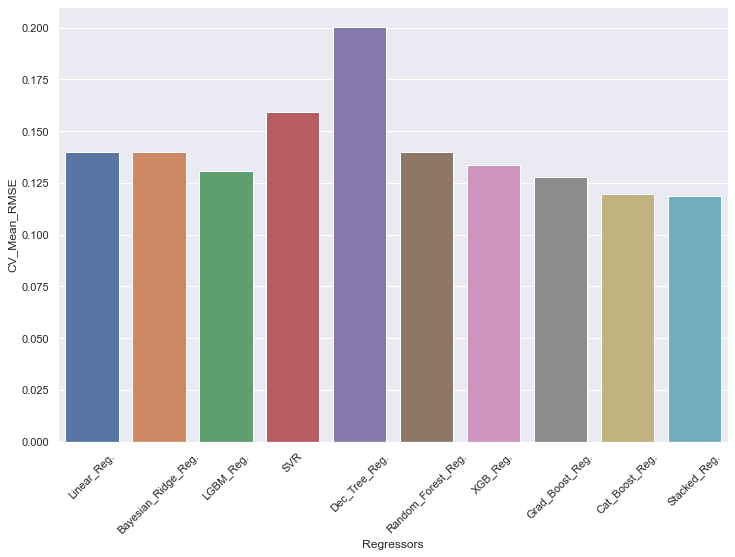

In [95]:
plt.figure(figsize = (12,8))
sns.barplot(final_cv_score['Regressors'],final_cv_score['RMSE_mean'])
plt.xlabel('Regressors', fontsize = 12)
plt.ylabel('CV_Mean_RMSE', fontsize = 12)
plt.xticks(rotation=45)
plt.show()

In [96]:
final_cv_score

,Regressors,RMSE_mean,RMSE_std
0,Linear_Reg.,0.139824,0.028168
1,Bayesian_Ridge_Reg.,0.140053,0.026086
2,LGBM_Reg.,0.130715,0.021136
3,SVR,0.159157,0.021096
4,Dec_Tree_Reg.,0.200140,0.021929
5,Random_Forest_Reg.,0.140032,0.024092
6,XGB_Reg.,0.133604,0.022497
7,Grad_Boost_Reg.,0.127876,0.021569
8,Cat_Boost_Reg.,0.119481,0.019851
9,Stacked_Reg.,0.118842,0.020076


As we can see, seems that Stacked regression is the model that predicts better the sale prices, but after testing different models with similar RMSE, Cat Boost Regressor is the one which really achieves the best score:

In [97]:
# Cat Boost Regressor

cat = CatBoostRegressor()
cat_model = cat.fit(X_train,y_train,
                     eval_set = (X_val,y_val),
                     plot=True,
                     verbose = 0)
cat_pred = cat_model.predict(X_val)
cat_score = rmse(y_val, cat_pred)
cat_score

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0.11751698178232406

let's look the 20 most important variable for our model, It will help to see further insight about the functioning of the algorithm and how and which data it uses most to arrive at the final prediction

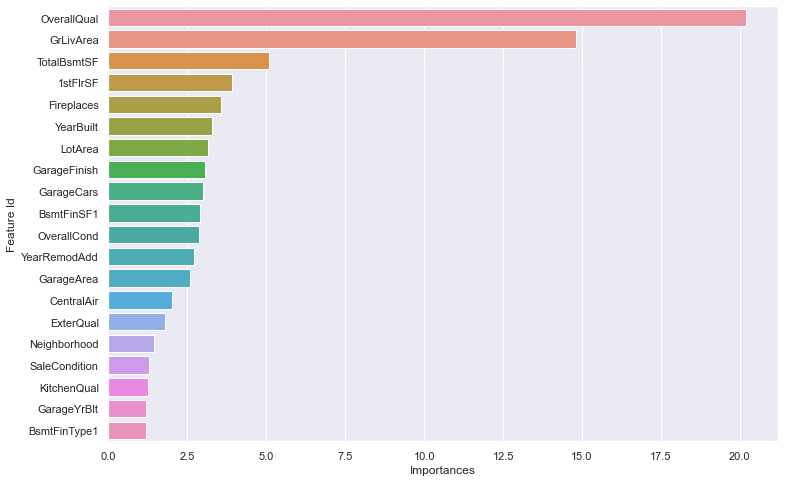

In [99]:
# Features' importance of our model
feat_imp = cat_model.get_feature_importance(prettified=True)
feat_imp
# Plotting top 20 features' importance

plt.figure(figsize = (12,8))
sns.barplot(feat_imp['Importances'][:20],feat_imp['Feature Id'][:20], orient = 'h')
plt.show()

In [100]:
# Features' Interactions

train_data = Pool(X_train)

interaction = cat_model.get_feature_importance(train_data, type="Interaction")
column_names = X_train.columns.values 
interaction = pd.DataFrame(interaction, columns=["feature1", "feature2", "importance"])
interaction.feature1 = interaction.feature1.apply(lambda l: column_names[int(l)])
interaction.feature2 = interaction.feature2.apply(lambda l: column_names[int(l)])
interaction.head(20)

,feature1,feature2,importance
0,OverallQual,GrLivArea,1.082183
1,LotArea,GrLivArea,0.903128
2,LotArea,OverallQual,0.792439
3,BsmtFinSF1,GrLivArea,0.672878
4,YearBuilt,GrLivArea,0.598729
5,OverallQual,BsmtFinSF1,0.581579
6,TotalBsmtSF,GrLivArea,0.573142
7,OverallCond,GrLivArea,0.558601
8,LotArea,YearRemodAdd,0.538857
9,LotArea,GarageYrBlt,0.534124


Which are the default parameters used by CaboostRegressor? This is our real baseline, now we need to optimize the hyperparameters trying to tune the model to obtain a better performance.

In [111]:
# Catboost default paramters

cat_model.get_all_params()

{'nan_mode': 'Min',
 'eval_metric': 'RMSE',
 'iterations': 1000,
 'sampling_frequency': 'PerTree',
 'leaf_estimation_method': 'Newton',
 'grow_policy': 'SymmetricTree',
 'penalties_coefficient': 1,
 'boosting_type': 'Plain',
 'model_shrink_mode': 'Constant',
 'feature_border_type': 'GreedyLogSum',
 'bayesian_matrix_reg': 0.10000000149011612,
 'force_unit_auto_pair_weights': False,
 'l2_leaf_reg': 3,
 'random_strength': 1,
 'rsm': 1,
 'boost_from_average': True,
 'model_size_reg': 0.5,
 'pool_metainfo_options': {'tags': {}},
 'subsample': 0.800000011920929,
 'use_best_model': True,
 'random_seed': 0,
 'depth': 6,
 'posterior_sampling': False,
 'border_count': 254,
 'classes_count': 0,
 'auto_class_weights': 'None',
 'sparse_features_conflict_fraction': 0,
 'leaf_estimation_backtracking': 'AnyImprovement',
 'best_model_min_trees': 1,
 'model_shrink_rate': 0,
 'min_data_in_leaf': 1,
 'loss_function': 'RMSE',
 'learning_rate': 0.053151000291109085,
 'score_function': 'Cosine',
 'task_type'

# Hyperparameter Optimization

In [123]:
# Catboost default paramters

cat_model.get_all_params()
# Preforming a Random Grid Search to find the best combination of parameters

grid = {'iterations': [1000,6000],
        'learning_rate': [0.05, 0.005, 0.0005],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [1, 3, 5, 9]}

final_model = CatBoostRegressor()
randomized_search_result = final_model.randomized_search(grid,
                                                   X = X_train,
                                                   y= y_train,
                                                   verbose = False,
                                                   plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 12.0307426	test: 12.0060706	best: 12.0060706 (0)	total: 4.28ms	remaining: 4.28s
1:	learn: 12.0247736	test: 12.0001186	best: 12.0001186 (1)	total: 6.71ms	remaining: 3.35s
2:	learn: 12.0188140	test: 11.9941860	best: 11.9941860 (2)	total: 8.38ms	remaining: 2.78s
3:	learn: 12.0128606	test: 11.9882329	best: 11.9882329 (3)	total: 9.79ms	remaining: 2.44s
4:	learn: 12.0069217	test: 11.9823411	best: 11.9823411 (4)	total: 11.2ms	remaining: 2.22s
5:	learn: 12.0009747	test: 11.9764107	best: 11.9764107 (5)	total: 12.6ms	remaining: 2.08s
6:	learn: 11.9950171	test: 11.9704733	best: 11.9704733 (6)	total: 14.2ms	remaining: 2.01s
7:	learn: 11.9890990	test: 11.9646118	best: 11.9646118 (7)	total: 16.8ms	remaining: 2.08s
8:	learn: 11.9831537	test: 11.9586595	best: 11.9586595 (8)	total: 18.2ms	remaining: 2s
9:	learn: 11.9772311	test: 11.9527391	best: 11.9527391 (9)	total: 19.7ms	remaining: 1.95s
10:	learn: 11.9712925	test: 11.9467897	best: 11.9467897 (10)	total: 21ms	remaining: 1.89s
11:	learn: 11

95:	learn: 11.4777453	test: 11.4543142	best: 11.4543142 (95)	total: 165ms	remaining: 1.55s
96:	learn: 11.4720915	test: 11.4486712	best: 11.4486712 (96)	total: 168ms	remaining: 1.56s
97:	learn: 11.4664010	test: 11.4430181	best: 11.4430181 (97)	total: 169ms	remaining: 1.56s
98:	learn: 11.4607290	test: 11.4373728	best: 11.4373728 (98)	total: 171ms	remaining: 1.55s
99:	learn: 11.4550484	test: 11.4317043	best: 11.4317043 (99)	total: 174ms	remaining: 1.56s
100:	learn: 11.4493611	test: 11.4260619	best: 11.4260619 (100)	total: 176ms	remaining: 1.56s
101:	learn: 11.4436880	test: 11.4204173	best: 11.4204173 (101)	total: 178ms	remaining: 1.56s
102:	learn: 11.4380351	test: 11.4148090	best: 11.4148090 (102)	total: 180ms	remaining: 1.57s
103:	learn: 11.4323723	test: 11.4091429	best: 11.4091429 (103)	total: 185ms	remaining: 1.59s
104:	learn: 11.4267124	test: 11.4034962	best: 11.4034962 (104)	total: 192ms	remaining: 1.64s
105:	learn: 11.4210113	test: 11.3977946	best: 11.3977946 (105)	total: 195ms	rema

218:	learn: 10.7988896	test: 10.7767370	best: 10.7767370 (218)	total: 513ms	remaining: 1.83s
219:	learn: 10.7935397	test: 10.7713862	best: 10.7713862 (219)	total: 515ms	remaining: 1.83s
220:	learn: 10.7881727	test: 10.7660223	best: 10.7660223 (220)	total: 517ms	remaining: 1.82s
221:	learn: 10.7828316	test: 10.7606783	best: 10.7606783 (221)	total: 518ms	remaining: 1.81s
222:	learn: 10.7774888	test: 10.7553217	best: 10.7553217 (222)	total: 520ms	remaining: 1.81s
223:	learn: 10.7721754	test: 10.7500309	best: 10.7500309 (223)	total: 521ms	remaining: 1.81s
224:	learn: 10.7668591	test: 10.7446977	best: 10.7446977 (224)	total: 523ms	remaining: 1.8s
225:	learn: 10.7615403	test: 10.7393743	best: 10.7393743 (225)	total: 525ms	remaining: 1.8s
226:	learn: 10.7562050	test: 10.7340449	best: 10.7340449 (226)	total: 529ms	remaining: 1.8s
227:	learn: 10.7508602	test: 10.7287231	best: 10.7287231 (227)	total: 532ms	remaining: 1.8s
228:	learn: 10.7455595	test: 10.7234248	best: 10.7234248 (228)	total: 536m

404:	learn: 9.8479100	test: 9.8274950	best: 9.8274950 (404)	total: 828ms	remaining: 1.22s
405:	learn: 9.8430317	test: 9.8226122	best: 9.8226122 (405)	total: 830ms	remaining: 1.21s
406:	learn: 9.8381697	test: 9.8177597	best: 9.8177597 (406)	total: 832ms	remaining: 1.21s
407:	learn: 9.8332962	test: 9.8128860	best: 9.8128860 (407)	total: 834ms	remaining: 1.21s
408:	learn: 9.8284249	test: 9.8080709	best: 9.8080709 (408)	total: 838ms	remaining: 1.21s
409:	learn: 9.8235479	test: 9.8032309	best: 9.8032309 (409)	total: 840ms	remaining: 1.21s
410:	learn: 9.8186773	test: 9.7983576	best: 9.7983576 (410)	total: 841ms	remaining: 1.21s
411:	learn: 9.8138053	test: 9.7935076	best: 9.7935076 (411)	total: 843ms	remaining: 1.2s
412:	learn: 9.8089173	test: 9.7886276	best: 9.7886276 (412)	total: 844ms	remaining: 1.2s
413:	learn: 9.8040576	test: 9.7837672	best: 9.7837672 (413)	total: 845ms	remaining: 1.2s
414:	learn: 9.7991942	test: 9.7789010	best: 9.7789010 (414)	total: 846ms	remaining: 1.19s
415:	learn: 9

506:	learn: 9.3624500	test: 9.3426830	best: 9.3426830 (506)	total: 984ms	remaining: 957ms
507:	learn: 9.3578050	test: 9.3380551	best: 9.3380551 (507)	total: 986ms	remaining: 955ms
508:	learn: 9.3531628	test: 9.3334422	best: 9.3334422 (508)	total: 987ms	remaining: 952ms
509:	learn: 9.3485530	test: 9.3288485	best: 9.3288485 (509)	total: 991ms	remaining: 952ms
510:	learn: 9.3439119	test: 9.3241966	best: 9.3241966 (510)	total: 992ms	remaining: 950ms
511:	learn: 9.3392928	test: 9.3195876	best: 9.3195876 (511)	total: 994ms	remaining: 947ms
512:	learn: 9.3346638	test: 9.3149542	best: 9.3149542 (512)	total: 995ms	remaining: 945ms
513:	learn: 9.3300274	test: 9.3103178	best: 9.3103178 (513)	total: 997ms	remaining: 942ms
514:	learn: 9.3254132	test: 9.3057042	best: 9.3057042 (514)	total: 998ms	remaining: 940ms
515:	learn: 9.3207963	test: 9.3011014	best: 9.3011014 (515)	total: 999ms	remaining: 937ms
516:	learn: 9.3161669	test: 9.2964911	best: 9.2964911 (516)	total: 1s	remaining: 935ms
517:	learn: 9

605:	learn: 8.9144803	test: 8.8956065	best: 8.8956065 (605)	total: 1.15s	remaining: 746ms
606:	learn: 8.9100829	test: 8.8912213	best: 8.8912213 (606)	total: 1.15s	remaining: 744ms
607:	learn: 8.9056705	test: 8.8868276	best: 8.8868276 (607)	total: 1.15s	remaining: 742ms
608:	learn: 8.9012555	test: 8.8824169	best: 8.8824169 (608)	total: 1.15s	remaining: 740ms
609:	learn: 8.8968492	test: 8.8780287	best: 8.8780287 (609)	total: 1.16s	remaining: 739ms
610:	learn: 8.8924296	test: 8.8736138	best: 8.8736138 (610)	total: 1.16s	remaining: 736ms
611:	learn: 8.8880425	test: 8.8692357	best: 8.8692357 (611)	total: 1.16s	remaining: 734ms
612:	learn: 8.8836507	test: 8.8648483	best: 8.8648483 (612)	total: 1.16s	remaining: 732ms
613:	learn: 8.8792569	test: 8.8604581	best: 8.8604581 (613)	total: 1.16s	remaining: 730ms
614:	learn: 8.8748472	test: 8.8560443	best: 8.8560443 (614)	total: 1.16s	remaining: 728ms
615:	learn: 8.8704219	test: 8.8516185	best: 8.8516185 (615)	total: 1.16s	remaining: 725ms
616:	learn

712:	learn: 8.4541156	test: 8.4359235	best: 8.4359235 (712)	total: 1.31s	remaining: 526ms
713:	learn: 8.4499358	test: 8.4317494	best: 8.4317494 (713)	total: 1.31s	remaining: 524ms
714:	learn: 8.4457723	test: 8.4275838	best: 8.4275838 (714)	total: 1.31s	remaining: 522ms
715:	learn: 8.4415874	test: 8.4234094	best: 8.4234094 (715)	total: 1.31s	remaining: 520ms
716:	learn: 8.4374308	test: 8.4192551	best: 8.4192551 (716)	total: 1.31s	remaining: 518ms
717:	learn: 8.4332508	test: 8.4150881	best: 8.4150881 (717)	total: 1.31s	remaining: 516ms
718:	learn: 8.4290702	test: 8.4109163	best: 8.4109163 (718)	total: 1.32s	remaining: 514ms
719:	learn: 8.4248712	test: 8.4067207	best: 8.4067207 (719)	total: 1.32s	remaining: 512ms
720:	learn: 8.4207012	test: 8.4025444	best: 8.4025444 (720)	total: 1.32s	remaining: 510ms
721:	learn: 8.4165225	test: 8.3983762	best: 8.3983762 (721)	total: 1.32s	remaining: 508ms
722:	learn: 8.4123611	test: 8.3942253	best: 8.3942253 (722)	total: 1.32s	remaining: 506ms
723:	learn

816:	learn: 8.0298635	test: 8.0128382	best: 8.0128382 (816)	total: 1.46s	remaining: 328ms
817:	learn: 8.0258878	test: 8.0088698	best: 8.0088698 (817)	total: 1.47s	remaining: 326ms
818:	learn: 8.0218932	test: 8.0048755	best: 8.0048755 (818)	total: 1.47s	remaining: 324ms
819:	learn: 8.0179175	test: 8.0009017	best: 8.0009017 (819)	total: 1.47s	remaining: 324ms
820:	learn: 8.0139381	test: 7.9969212	best: 7.9969212 (820)	total: 1.48s	remaining: 322ms
821:	learn: 8.0099683	test: 7.9929464	best: 7.9929464 (821)	total: 1.48s	remaining: 320ms
822:	learn: 8.0059884	test: 7.9889801	best: 7.9889801 (822)	total: 1.48s	remaining: 318ms
823:	learn: 8.0020362	test: 7.9850604	best: 7.9850604 (823)	total: 1.48s	remaining: 316ms
824:	learn: 7.9980824	test: 7.9810938	best: 7.9810938 (824)	total: 1.48s	remaining: 315ms
825:	learn: 7.9941189	test: 7.9771404	best: 7.9771404 (825)	total: 1.48s	remaining: 313ms
826:	learn: 7.9901782	test: 7.9731978	best: 7.9731978 (826)	total: 1.49s	remaining: 311ms
827:	learn

912:	learn: 7.6571209	test: 7.6410088	best: 7.6410088 (912)	total: 1.63s	remaining: 155ms
913:	learn: 7.6533216	test: 7.6372082	best: 7.6372082 (913)	total: 1.63s	remaining: 153ms
914:	learn: 7.6495402	test: 7.6334226	best: 7.6334226 (914)	total: 1.63s	remaining: 151ms
915:	learn: 7.6457648	test: 7.6296478	best: 7.6296478 (915)	total: 1.63s	remaining: 150ms
916:	learn: 7.6419908	test: 7.6258826	best: 7.6258826 (916)	total: 1.63s	remaining: 148ms
917:	learn: 7.6382164	test: 7.6221186	best: 7.6221186 (917)	total: 1.64s	remaining: 146ms
918:	learn: 7.6344507	test: 7.6183544	best: 7.6183544 (918)	total: 1.64s	remaining: 144ms
919:	learn: 7.6306597	test: 7.6145563	best: 7.6145563 (919)	total: 1.64s	remaining: 142ms
920:	learn: 7.6268910	test: 7.6108186	best: 7.6108186 (920)	total: 1.64s	remaining: 141ms
921:	learn: 7.6231211	test: 7.6070761	best: 7.6070761 (921)	total: 1.64s	remaining: 139ms
922:	learn: 7.6193395	test: 7.6032998	best: 7.6032998 (922)	total: 1.64s	remaining: 137ms
923:	learn

15:	learn: 11.9462936	test: 11.9219678	best: 11.9219678 (15)	total: 28.3ms	remaining: 10.6s
16:	learn: 11.9406601	test: 11.9163533	best: 11.9163533 (16)	total: 30.2ms	remaining: 10.6s
17:	learn: 11.9349537	test: 11.9106221	best: 11.9106221 (17)	total: 31.8ms	remaining: 10.6s
18:	learn: 11.9291999	test: 11.9048514	best: 11.9048514 (18)	total: 33.1ms	remaining: 10.4s
19:	learn: 11.9236740	test: 11.8992949	best: 11.8992949 (19)	total: 34.6ms	remaining: 10.3s
20:	learn: 11.9180065	test: 11.8935760	best: 11.8935760 (20)	total: 35.9ms	remaining: 10.2s
21:	learn: 11.9123531	test: 11.8879073	best: 11.8879073 (21)	total: 37.3ms	remaining: 10.1s
22:	learn: 11.9066774	test: 11.8821760	best: 11.8821760 (22)	total: 38.9ms	remaining: 10.1s
23:	learn: 11.9010771	test: 11.8766101	best: 11.8766101 (23)	total: 40.2ms	remaining: 10s
24:	learn: 11.8953306	test: 11.8708675	best: 11.8708675 (24)	total: 41.5ms	remaining: 9.92s
25:	learn: 11.8895842	test: 11.8651188	best: 11.8651188 (25)	total: 43.3ms	remaini

123:	learn: 11.3505861	test: 11.3276123	best: 11.3276123 (123)	total: 186ms	remaining: 8.84s
124:	learn: 11.3453344	test: 11.3223598	best: 11.3223598 (124)	total: 188ms	remaining: 8.85s
125:	learn: 11.3399280	test: 11.3169956	best: 11.3169956 (125)	total: 190ms	remaining: 8.85s
126:	learn: 11.3345347	test: 11.3116074	best: 11.3116074 (126)	total: 191ms	remaining: 8.85s
127:	learn: 11.3290870	test: 11.3062152	best: 11.3062152 (127)	total: 193ms	remaining: 8.84s
128:	learn: 11.3237133	test: 11.3008740	best: 11.3008740 (128)	total: 194ms	remaining: 8.83s
129:	learn: 11.3181063	test: 11.2952665	best: 11.2952665 (129)	total: 194ms	remaining: 8.78s
130:	learn: 11.3126905	test: 11.2898106	best: 11.2898106 (130)	total: 196ms	remaining: 8.77s
131:	learn: 11.3072897	test: 11.2843573	best: 11.2843573 (131)	total: 197ms	remaining: 8.76s
132:	learn: 11.3019611	test: 11.2790062	best: 11.2790062 (132)	total: 198ms	remaining: 8.76s
133:	learn: 11.2965891	test: 11.2736566	best: 11.2736566 (133)	total: 

217:	learn: 10.8550007	test: 10.8327996	best: 10.8327996 (217)	total: 339ms	remaining: 8.98s
218:	learn: 10.8498619	test: 10.8276563	best: 10.8276563 (218)	total: 341ms	remaining: 9.01s
219:	learn: 10.8447256	test: 10.8225062	best: 10.8225062 (219)	total: 343ms	remaining: 9s
220:	learn: 10.8394896	test: 10.8172753	best: 10.8172753 (220)	total: 344ms	remaining: 9s
221:	learn: 10.8343864	test: 10.8121519	best: 10.8121519 (221)	total: 346ms	remaining: 8.99s
222:	learn: 10.8292003	test: 10.8069336	best: 10.8069336 (222)	total: 349ms	remaining: 9.05s
223:	learn: 10.8242890	test: 10.8020813	best: 10.8020813 (223)	total: 351ms	remaining: 9.05s
224:	learn: 10.8192792	test: 10.7970252	best: 10.7970252 (224)	total: 352ms	remaining: 9.04s
225:	learn: 10.8142305	test: 10.7919377	best: 10.7919377 (225)	total: 354ms	remaining: 9.04s
226:	learn: 10.8091634	test: 10.7868814	best: 10.7868814 (226)	total: 355ms	remaining: 9.03s
227:	learn: 10.8039452	test: 10.7816908	best: 10.7816908 (227)	total: 356ms	

400:	learn: 9.9533874	test: 9.9332757	best: 9.9332757 (400)	total: 660ms	remaining: 9.22s
401:	learn: 9.9486317	test: 9.9285161	best: 9.9285161 (401)	total: 662ms	remaining: 9.22s
402:	learn: 9.9439867	test: 9.9239139	best: 9.9239139 (402)	total: 664ms	remaining: 9.22s
403:	learn: 9.9392464	test: 9.9191596	best: 9.9191596 (403)	total: 665ms	remaining: 9.21s
404:	learn: 9.9344419	test: 9.9143376	best: 9.9143376 (404)	total: 666ms	remaining: 9.2s
405:	learn: 9.9296344	test: 9.9095526	best: 9.9095526 (405)	total: 667ms	remaining: 9.19s
406:	learn: 9.9249349	test: 9.9048112	best: 9.9048112 (406)	total: 669ms	remaining: 9.19s
407:	learn: 9.9202427	test: 9.9001188	best: 9.9001188 (407)	total: 670ms	remaining: 9.18s
408:	learn: 9.9154437	test: 9.8953030	best: 9.8953030 (408)	total: 671ms	remaining: 9.17s
409:	learn: 9.9106213	test: 9.8904901	best: 9.8904901 (409)	total: 672ms	remaining: 9.16s
410:	learn: 9.9058888	test: 9.8858204	best: 9.8858204 (410)	total: 673ms	remaining: 9.15s
411:	learn:

514:	learn: 9.4282697	test: 9.4087639	best: 9.4087639 (514)	total: 821ms	remaining: 8.74s
515:	learn: 9.4238080	test: 9.4042968	best: 9.4042968 (515)	total: 824ms	remaining: 8.76s
516:	learn: 9.4192467	test: 9.3997527	best: 9.3997527 (516)	total: 825ms	remaining: 8.75s
517:	learn: 9.4147027	test: 9.3952416	best: 9.3952416 (517)	total: 826ms	remaining: 8.75s
518:	learn: 9.4102658	test: 9.3908046	best: 9.3908046 (518)	total: 828ms	remaining: 8.74s
519:	learn: 9.4058077	test: 9.3863501	best: 9.3863501 (519)	total: 829ms	remaining: 8.74s
520:	learn: 9.4013431	test: 9.3818640	best: 9.3818640 (520)	total: 831ms	remaining: 8.73s
521:	learn: 9.3969433	test: 9.3774889	best: 9.3774889 (521)	total: 832ms	remaining: 8.73s
522:	learn: 9.3924791	test: 9.3730516	best: 9.3730516 (522)	total: 833ms	remaining: 8.73s
523:	learn: 9.3880710	test: 9.3687138	best: 9.3687138 (523)	total: 835ms	remaining: 8.72s
524:	learn: 9.3835410	test: 9.3641906	best: 9.3641906 (524)	total: 836ms	remaining: 8.72s
525:	learn

623:	learn: 8.9531351	test: 8.9347008	best: 8.9347008 (623)	total: 982ms	remaining: 8.46s
624:	learn: 8.9488346	test: 8.9304128	best: 8.9304128 (624)	total: 983ms	remaining: 8.46s
625:	learn: 8.9445929	test: 8.9261723	best: 8.9261723 (625)	total: 985ms	remaining: 8.45s
626:	learn: 8.9403216	test: 8.9219164	best: 8.9219164 (626)	total: 986ms	remaining: 8.45s
627:	learn: 8.9359866	test: 8.9176140	best: 8.9176140 (627)	total: 988ms	remaining: 8.45s
628:	learn: 8.9318001	test: 8.9134232	best: 8.9134232 (628)	total: 989ms	remaining: 8.45s
629:	learn: 8.9276184	test: 8.9092277	best: 8.9092277 (629)	total: 990ms	remaining: 8.44s
630:	learn: 8.9233495	test: 8.9049836	best: 8.9049836 (630)	total: 992ms	remaining: 8.44s
631:	learn: 8.9191708	test: 8.9008326	best: 8.9008326 (631)	total: 994ms	remaining: 8.44s
632:	learn: 8.9150364	test: 8.8967249	best: 8.8967249 (632)	total: 995ms	remaining: 8.44s
633:	learn: 8.9108193	test: 8.8925413	best: 8.8925413 (633)	total: 997ms	remaining: 8.44s
634:	learn

727:	learn: 8.5223422	test: 8.5046941	best: 8.5046941 (727)	total: 1.14s	remaining: 8.27s
728:	learn: 8.5182866	test: 8.5006287	best: 8.5006287 (728)	total: 1.14s	remaining: 8.27s
729:	learn: 8.5141992	test: 8.4965578	best: 8.4965578 (729)	total: 1.14s	remaining: 8.26s
730:	learn: 8.5101107	test: 8.4924330	best: 8.4924330 (730)	total: 1.15s	remaining: 8.26s
731:	learn: 8.5059890	test: 8.4883200	best: 8.4883200 (731)	total: 1.15s	remaining: 8.26s
732:	learn: 8.5019061	test: 8.4842789	best: 8.4842789 (732)	total: 1.15s	remaining: 8.26s
733:	learn: 8.4977946	test: 8.4802074	best: 8.4802074 (733)	total: 1.15s	remaining: 8.26s
734:	learn: 8.4938085	test: 8.4761934	best: 8.4761934 (734)	total: 1.15s	remaining: 8.26s
735:	learn: 8.4897150	test: 8.4721256	best: 8.4721256 (735)	total: 1.15s	remaining: 8.26s
736:	learn: 8.4856247	test: 8.4680435	best: 8.4680435 (736)	total: 1.16s	remaining: 8.26s
737:	learn: 8.4816097	test: 8.4640444	best: 8.4640444 (737)	total: 1.16s	remaining: 8.26s
738:	learn

835:	learn: 8.0964674	test: 8.0797229	best: 8.0797229 (835)	total: 1.3s	remaining: 8.05s
836:	learn: 8.0926517	test: 8.0759321	best: 8.0759321 (836)	total: 1.3s	remaining: 8.05s
837:	learn: 8.0888258	test: 8.0721132	best: 8.0721132 (837)	total: 1.31s	remaining: 8.05s
838:	learn: 8.0849451	test: 8.0682472	best: 8.0682472 (838)	total: 1.31s	remaining: 8.04s
839:	learn: 8.0810783	test: 8.0643803	best: 8.0643803 (839)	total: 1.31s	remaining: 8.04s
840:	learn: 8.0772010	test: 8.0604943	best: 8.0604943 (840)	total: 1.31s	remaining: 8.04s
841:	learn: 8.0734666	test: 8.0567880	best: 8.0567880 (841)	total: 1.31s	remaining: 8.04s
842:	learn: 8.0697357	test: 8.0530892	best: 8.0530892 (842)	total: 1.31s	remaining: 8.04s
843:	learn: 8.0658591	test: 8.0492281	best: 8.0492281 (843)	total: 1.32s	remaining: 8.04s
844:	learn: 8.0621928	test: 8.0455622	best: 8.0455622 (844)	total: 1.32s	remaining: 8.04s
845:	learn: 8.0582872	test: 8.0416736	best: 8.0416736 (845)	total: 1.32s	remaining: 8.04s
846:	learn: 

935:	learn: 7.7220628	test: 7.7061968	best: 7.7061968 (935)	total: 1.46s	remaining: 7.92s
936:	learn: 7.7184721	test: 7.7026012	best: 7.7026012 (936)	total: 1.47s	remaining: 7.92s
937:	learn: 7.7148186	test: 7.6989308	best: 7.6989308 (937)	total: 1.47s	remaining: 7.92s
938:	learn: 7.7111928	test: 7.6953374	best: 7.6953374 (938)	total: 1.47s	remaining: 7.92s
939:	learn: 7.7075701	test: 7.6917253	best: 7.6917253 (939)	total: 1.47s	remaining: 7.91s
940:	learn: 7.7039022	test: 7.6880335	best: 7.6880335 (940)	total: 1.47s	remaining: 7.91s
941:	learn: 7.7001670	test: 7.6843067	best: 7.6843067 (941)	total: 1.47s	remaining: 7.91s
942:	learn: 7.6965164	test: 7.6806803	best: 7.6806803 (942)	total: 1.47s	remaining: 7.91s
943:	learn: 7.6928550	test: 7.6770011	best: 7.6770011 (943)	total: 1.48s	remaining: 7.9s
944:	learn: 7.6892525	test: 7.6734421	best: 7.6734421 (944)	total: 1.48s	remaining: 7.9s
945:	learn: 7.6857225	test: 7.6699260	best: 7.6699260 (945)	total: 1.48s	remaining: 7.9s
946:	learn: 7

1042:	learn: 7.3409919	test: 7.3263861	best: 7.3263861 (1042)	total: 1.62s	remaining: 7.71s
1043:	learn: 7.3375426	test: 7.3229433	best: 7.3229433 (1043)	total: 1.62s	remaining: 7.7s
1044:	learn: 7.3340561	test: 7.3194773	best: 7.3194773 (1044)	total: 1.62s	remaining: 7.7s
1045:	learn: 7.3305251	test: 7.3159636	best: 7.3159636 (1045)	total: 1.63s	remaining: 7.7s
1046:	learn: 7.3270745	test: 7.3124918	best: 7.3124918 (1046)	total: 1.63s	remaining: 7.7s
1047:	learn: 7.3235505	test: 7.3089663	best: 7.3089663 (1047)	total: 1.63s	remaining: 7.69s
1048:	learn: 7.3200329	test: 7.3054459	best: 7.3054459 (1048)	total: 1.63s	remaining: 7.69s
1049:	learn: 7.3165847	test: 7.3019957	best: 7.3019957 (1049)	total: 1.63s	remaining: 7.69s
1050:	learn: 7.3131155	test: 7.2985193	best: 7.2985193 (1050)	total: 1.63s	remaining: 7.69s
1051:	learn: 7.3096375	test: 7.2951089	best: 7.2951089 (1051)	total: 1.63s	remaining: 7.69s
1052:	learn: 7.3062781	test: 7.2917457	best: 7.2917457 (1052)	total: 1.64s	remaining

1142:	learn: 7.0014630	test: 6.9879697	best: 6.9879697 (1142)	total: 1.78s	remaining: 7.59s
1143:	learn: 6.9980398	test: 6.9845326	best: 6.9845326 (1143)	total: 1.79s	remaining: 7.58s
1144:	learn: 6.9946804	test: 6.9811897	best: 6.9811897 (1144)	total: 1.79s	remaining: 7.58s
1145:	learn: 6.9913082	test: 6.9778104	best: 6.9778104 (1145)	total: 1.79s	remaining: 7.58s
1146:	learn: 6.9880075	test: 6.9744870	best: 6.9744870 (1146)	total: 1.79s	remaining: 7.58s
1147:	learn: 6.9847508	test: 6.9712240	best: 6.9712240 (1147)	total: 1.79s	remaining: 7.58s
1148:	learn: 6.9814638	test: 6.9679406	best: 6.9679406 (1148)	total: 1.79s	remaining: 7.57s
1149:	learn: 6.9781493	test: 6.9646266	best: 6.9646266 (1149)	total: 1.79s	remaining: 7.57s
1150:	learn: 6.9748497	test: 6.9613710	best: 6.9613710 (1150)	total: 1.8s	remaining: 7.57s
1151:	learn: 6.9714653	test: 6.9579646	best: 6.9579646 (1151)	total: 1.8s	remaining: 7.57s
1152:	learn: 6.9681233	test: 6.9546097	best: 6.9546097 (1152)	total: 1.8s	remainin

1257:	learn: 6.6313013	test: 6.6187582	best: 6.6187582 (1257)	total: 1.95s	remaining: 7.34s
1258:	learn: 6.6280325	test: 6.6155003	best: 6.6155003 (1258)	total: 1.95s	remaining: 7.34s
1259:	learn: 6.6249280	test: 6.6124005	best: 6.6124005 (1259)	total: 1.95s	remaining: 7.34s
1260:	learn: 6.6217557	test: 6.6092498	best: 6.6092498 (1260)	total: 1.95s	remaining: 7.34s
1261:	learn: 6.6186665	test: 6.6061622	best: 6.6061622 (1261)	total: 1.95s	remaining: 7.33s
1262:	learn: 6.6155033	test: 6.6029783	best: 6.6029783 (1262)	total: 1.96s	remaining: 7.33s
1263:	learn: 6.6123275	test: 6.5998140	best: 6.5998140 (1263)	total: 1.96s	remaining: 7.33s
1264:	learn: 6.6091848	test: 6.5966897	best: 6.5966897 (1264)	total: 1.96s	remaining: 7.33s
1265:	learn: 6.6060242	test: 6.5935553	best: 6.5935553 (1265)	total: 1.96s	remaining: 7.33s
1266:	learn: 6.6028543	test: 6.5904349	best: 6.5904349 (1266)	total: 1.96s	remaining: 7.32s
1267:	learn: 6.5997546	test: 6.5873420	best: 6.5873420 (1267)	total: 1.96s	remai

1357:	learn: 6.3252371	test: 6.3137359	best: 6.3137359 (1357)	total: 2.11s	remaining: 7.21s
1358:	learn: 6.3222095	test: 6.3106935	best: 6.3106935 (1358)	total: 2.11s	remaining: 7.21s
1359:	learn: 6.3192624	test: 6.3077608	best: 6.3077608 (1359)	total: 2.11s	remaining: 7.21s
1360:	learn: 6.3162128	test: 6.3047121	best: 6.3047121 (1360)	total: 2.12s	remaining: 7.22s
1361:	learn: 6.3132486	test: 6.3017411	best: 6.3017411 (1361)	total: 2.12s	remaining: 7.24s
1362:	learn: 6.3103179	test: 6.2988093	best: 6.2988093 (1362)	total: 2.13s	remaining: 7.23s
1363:	learn: 6.3073599	test: 6.2958483	best: 6.2958483 (1363)	total: 2.13s	remaining: 7.23s
1364:	learn: 6.3043547	test: 6.2928824	best: 6.2928824 (1364)	total: 2.13s	remaining: 7.23s
1365:	learn: 6.3013924	test: 6.2899469	best: 6.2899469 (1365)	total: 2.13s	remaining: 7.23s
1366:	learn: 6.2984002	test: 6.2869640	best: 6.2869640 (1366)	total: 2.13s	remaining: 7.23s
1367:	learn: 6.2953970	test: 6.2839772	best: 6.2839772 (1367)	total: 2.13s	remai

1493:	learn: 5.9322713	test: 5.9217163	best: 5.9217163 (1493)	total: 2.44s	remaining: 7.37s
1494:	learn: 5.9295303	test: 5.9189644	best: 5.9189644 (1494)	total: 2.45s	remaining: 7.38s
1495:	learn: 5.9267513	test: 5.9161890	best: 5.9161890 (1495)	total: 2.45s	remaining: 7.38s
1496:	learn: 5.9239405	test: 5.9133673	best: 5.9133673 (1496)	total: 2.45s	remaining: 7.38s
1497:	learn: 5.9210790	test: 5.9104860	best: 5.9104860 (1497)	total: 2.46s	remaining: 7.39s
1498:	learn: 5.9182326	test: 5.9076322	best: 5.9076322 (1498)	total: 2.46s	remaining: 7.39s
1499:	learn: 5.9154139	test: 5.9048226	best: 5.9048226 (1499)	total: 2.46s	remaining: 7.39s
1500:	learn: 5.9125963	test: 5.9020251	best: 5.9020251 (1500)	total: 2.47s	remaining: 7.41s
1501:	learn: 5.9097122	test: 5.8991360	best: 5.8991360 (1501)	total: 2.47s	remaining: 7.41s
1502:	learn: 5.9068930	test: 5.8963391	best: 5.8963391 (1502)	total: 2.48s	remaining: 7.41s
1503:	learn: 5.9041284	test: 5.8935669	best: 5.8935669 (1503)	total: 2.48s	remai

1622:	learn: 5.5811341	test: 5.5712019	best: 5.5712019 (1622)	total: 2.75s	remaining: 7.43s
1623:	learn: 5.5785587	test: 5.5686294	best: 5.5686294 (1623)	total: 2.76s	remaining: 7.43s
1624:	learn: 5.5759583	test: 5.5660199	best: 5.5660199 (1624)	total: 2.76s	remaining: 7.43s
1625:	learn: 5.5733574	test: 5.5634226	best: 5.5634226 (1625)	total: 2.76s	remaining: 7.43s
1626:	learn: 5.5707018	test: 5.5607768	best: 5.5607768 (1626)	total: 2.76s	remaining: 7.42s
1627:	learn: 5.5681340	test: 5.5582376	best: 5.5582376 (1627)	total: 2.76s	remaining: 7.42s
1628:	learn: 5.5655209	test: 5.5556375	best: 5.5556375 (1628)	total: 2.77s	remaining: 7.42s
1629:	learn: 5.5628451	test: 5.5530007	best: 5.5530007 (1629)	total: 2.77s	remaining: 7.42s
1630:	learn: 5.5601903	test: 5.5503472	best: 5.5503472 (1630)	total: 2.77s	remaining: 7.42s
1631:	learn: 5.5575496	test: 5.5477080	best: 5.5477080 (1631)	total: 2.77s	remaining: 7.42s
1632:	learn: 5.5549155	test: 5.5450708	best: 5.5450708 (1632)	total: 2.77s	remai

1715:	learn: 5.3423490	test: 5.3330455	best: 5.3330455 (1715)	total: 2.91s	remaining: 7.27s
1716:	learn: 5.3399075	test: 5.3306201	best: 5.3306201 (1716)	total: 2.91s	remaining: 7.27s
1717:	learn: 5.3373729	test: 5.3281001	best: 5.3281001 (1717)	total: 2.92s	remaining: 7.26s
1718:	learn: 5.3348782	test: 5.3255936	best: 5.3255936 (1718)	total: 2.92s	remaining: 7.26s
1719:	learn: 5.3323148	test: 5.3230603	best: 5.3230603 (1719)	total: 2.92s	remaining: 7.26s
1720:	learn: 5.3298150	test: 5.3205564	best: 5.3205564 (1720)	total: 2.92s	remaining: 7.26s
1721:	learn: 5.3273194	test: 5.3180674	best: 5.3180674 (1721)	total: 2.92s	remaining: 7.25s
1722:	learn: 5.3247140	test: 5.3154616	best: 5.3154616 (1722)	total: 2.92s	remaining: 7.25s
1723:	learn: 5.3222142	test: 5.3129862	best: 5.3129862 (1723)	total: 2.92s	remaining: 7.25s
1724:	learn: 5.3196983	test: 5.3104665	best: 5.3104665 (1724)	total: 2.92s	remaining: 7.25s
1725:	learn: 5.3171989	test: 5.3079897	best: 5.3079897 (1725)	total: 2.93s	remai

1821:	learn: 5.0822443	test: 5.0737187	best: 5.0737187 (1821)	total: 3.07s	remaining: 7.05s
1822:	learn: 5.0797578	test: 5.0712289	best: 5.0712289 (1822)	total: 3.07s	remaining: 7.04s
1823:	learn: 5.0773659	test: 5.0688477	best: 5.0688477 (1823)	total: 3.08s	remaining: 7.04s
1824:	learn: 5.0750607	test: 5.0665370	best: 5.0665370 (1824)	total: 3.08s	remaining: 7.04s
1825:	learn: 5.0726346	test: 5.0641235	best: 5.0641235 (1825)	total: 3.08s	remaining: 7.04s
1826:	learn: 5.0701537	test: 5.0616446	best: 5.0616446 (1826)	total: 3.08s	remaining: 7.04s
1827:	learn: 5.0676735	test: 5.0591671	best: 5.0591671 (1827)	total: 3.08s	remaining: 7.04s
1828:	learn: 5.0653028	test: 5.0568047	best: 5.0568047 (1828)	total: 3.08s	remaining: 7.03s
1829:	learn: 5.0629007	test: 5.0544122	best: 5.0544122 (1829)	total: 3.09s	remaining: 7.03s
1830:	learn: 5.0605201	test: 5.0520320	best: 5.0520320 (1830)	total: 3.09s	remaining: 7.03s
1831:	learn: 5.0581164	test: 5.0496341	best: 5.0496341 (1831)	total: 3.09s	remai

1911:	learn: 4.8710505	test: 4.8631744	best: 4.8631744 (1911)	total: 3.24s	remaining: 6.93s
1912:	learn: 4.8687260	test: 4.8608506	best: 4.8608506 (1912)	total: 3.24s	remaining: 6.93s
1913:	learn: 4.8664587	test: 4.8586028	best: 4.8586028 (1913)	total: 3.24s	remaining: 6.92s
1914:	learn: 4.8641661	test: 4.8563063	best: 4.8563063 (1914)	total: 3.25s	remaining: 6.92s
1915:	learn: 4.8618524	test: 4.8540039	best: 4.8540039 (1915)	total: 3.25s	remaining: 6.92s
1916:	learn: 4.8595315	test: 4.8516845	best: 4.8516845 (1916)	total: 3.25s	remaining: 6.92s
1917:	learn: 4.8572359	test: 4.8493882	best: 4.8493882 (1917)	total: 3.25s	remaining: 6.92s
1918:	learn: 4.8549472	test: 4.8470886	best: 4.8470886 (1918)	total: 3.25s	remaining: 6.92s
1919:	learn: 4.8526554	test: 4.8448302	best: 4.8448302 (1919)	total: 3.25s	remaining: 6.91s
1920:	learn: 4.8503796	test: 4.8425467	best: 4.8425467 (1920)	total: 3.25s	remaining: 6.91s
1921:	learn: 4.8480792	test: 4.8402286	best: 4.8402286 (1921)	total: 3.26s	remai

2007:	learn: 4.6553405	test: 4.6481998	best: 4.6481998 (2007)	total: 3.39s	remaining: 6.74s
2008:	learn: 4.6532558	test: 4.6461295	best: 4.6461295 (2008)	total: 3.39s	remaining: 6.74s
2009:	learn: 4.6511095	test: 4.6440007	best: 4.6440007 (2009)	total: 3.4s	remaining: 6.74s
2010:	learn: 4.6490115	test: 4.6419142	best: 4.6419142 (2010)	total: 3.4s	remaining: 6.74s
2011:	learn: 4.6468572	test: 4.6397920	best: 4.6397920 (2011)	total: 3.4s	remaining: 6.74s
2012:	learn: 4.6446256	test: 4.6375602	best: 4.6375602 (2012)	total: 3.4s	remaining: 6.73s
2013:	learn: 4.6424875	test: 4.6354497	best: 4.6354497 (2013)	total: 3.4s	remaining: 6.73s
2014:	learn: 4.6402900	test: 4.6332782	best: 4.6332782 (2014)	total: 3.4s	remaining: 6.73s
2015:	learn: 4.6381383	test: 4.6311399	best: 4.6311399 (2015)	total: 3.4s	remaining: 6.73s
2016:	learn: 4.6359145	test: 4.6289100	best: 4.6289100 (2016)	total: 3.41s	remaining: 6.73s
2017:	learn: 4.6338004	test: 4.6267939	best: 4.6267939 (2017)	total: 3.41s	remaining: 6

2175:	learn: 4.3010908	test: 4.2946780	best: 4.2946780 (2175)	total: 3.71s	remaining: 6.53s
2176:	learn: 4.2990541	test: 4.2926433	best: 4.2926433 (2176)	total: 3.71s	remaining: 6.52s
2177:	learn: 4.2970208	test: 4.2906162	best: 4.2906162 (2177)	total: 3.72s	remaining: 6.52s
2178:	learn: 4.2949212	test: 4.2885185	best: 4.2885185 (2178)	total: 3.72s	remaining: 6.52s
2179:	learn: 4.2928500	test: 4.2864423	best: 4.2864423 (2179)	total: 3.72s	remaining: 6.52s
2180:	learn: 4.2907959	test: 4.2844198	best: 4.2844198 (2180)	total: 3.72s	remaining: 6.51s
2181:	learn: 4.2887874	test: 4.2823947	best: 4.2823947 (2181)	total: 3.72s	remaining: 6.51s
2182:	learn: 4.2867577	test: 4.2803672	best: 4.2803672 (2182)	total: 3.72s	remaining: 6.51s
2183:	learn: 4.2847943	test: 4.2784100	best: 4.2784100 (2183)	total: 3.72s	remaining: 6.51s
2184:	learn: 4.2827502	test: 4.2763779	best: 4.2763779 (2184)	total: 3.73s	remaining: 6.5s
2185:	learn: 4.2807083	test: 4.2743426	best: 4.2743426 (2185)	total: 3.73s	remain

2291:	learn: 4.0723939	test: 4.0666958	best: 4.0666958 (2291)	total: 3.87s	remaining: 6.27s
2292:	learn: 4.0704685	test: 4.0647793	best: 4.0647793 (2292)	total: 3.88s	remaining: 6.27s
2293:	learn: 4.0685468	test: 4.0628521	best: 4.0628521 (2293)	total: 3.88s	remaining: 6.26s
2294:	learn: 4.0665954	test: 4.0609285	best: 4.0609285 (2294)	total: 3.88s	remaining: 6.26s
2295:	learn: 4.0646958	test: 4.0590312	best: 4.0590312 (2295)	total: 3.88s	remaining: 6.26s
2296:	learn: 4.0628095	test: 4.0571473	best: 4.0571473 (2296)	total: 3.88s	remaining: 6.26s
2297:	learn: 4.0608916	test: 4.0552475	best: 4.0552475 (2297)	total: 3.88s	remaining: 6.26s
2298:	learn: 4.0589976	test: 4.0533496	best: 4.0533496 (2298)	total: 3.88s	remaining: 6.25s
2299:	learn: 4.0570565	test: 4.0514165	best: 4.0514165 (2299)	total: 3.89s	remaining: 6.25s
2300:	learn: 4.0551678	test: 4.0495498	best: 4.0495498 (2300)	total: 3.89s	remaining: 6.25s
2301:	learn: 4.0532559	test: 4.0476646	best: 4.0476646 (2301)	total: 3.89s	remai

2406:	learn: 3.8581730	test: 3.8531289	best: 3.8531289 (2406)	total: 4.04s	remaining: 6.03s
2407:	learn: 3.8564007	test: 3.8513582	best: 3.8513582 (2407)	total: 4.04s	remaining: 6.03s
2408:	learn: 3.8545665	test: 3.8495400	best: 3.8495400 (2408)	total: 4.04s	remaining: 6.02s
2409:	learn: 3.8527066	test: 3.8476891	best: 3.8476891 (2409)	total: 4.04s	remaining: 6.02s
2410:	learn: 3.8508551	test: 3.8458347	best: 3.8458347 (2410)	total: 4.04s	remaining: 6.02s
2411:	learn: 3.8490742	test: 3.8440371	best: 3.8440371 (2411)	total: 4.04s	remaining: 6.02s
2412:	learn: 3.8472216	test: 3.8421882	best: 3.8421882 (2412)	total: 4.05s	remaining: 6.01s
2413:	learn: 3.8454180	test: 3.8404048	best: 3.8404048 (2413)	total: 4.05s	remaining: 6.01s
2414:	learn: 3.8435749	test: 3.8385636	best: 3.8385636 (2414)	total: 4.05s	remaining: 6.01s
2415:	learn: 3.8417058	test: 3.8366947	best: 3.8366947 (2415)	total: 4.05s	remaining: 6.01s
2416:	learn: 3.8399320	test: 3.8349356	best: 3.8349356 (2416)	total: 4.05s	remai

2516:	learn: 3.6638098	test: 3.6593107	best: 3.6593107 (2516)	total: 4.2s	remaining: 5.81s
2517:	learn: 3.6621753	test: 3.6577037	best: 3.6577037 (2517)	total: 4.2s	remaining: 5.81s
2518:	learn: 3.6604526	test: 3.6559949	best: 3.6559949 (2518)	total: 4.2s	remaining: 5.8s
2519:	learn: 3.6587230	test: 3.6542649	best: 3.6542649 (2519)	total: 4.2s	remaining: 5.8s
2520:	learn: 3.6569935	test: 3.6525518	best: 3.6525518 (2520)	total: 4.2s	remaining: 5.8s
2521:	learn: 3.6552769	test: 3.6508520	best: 3.6508520 (2521)	total: 4.2s	remaining: 5.8s
2522:	learn: 3.6535377	test: 3.6491058	best: 3.6491058 (2522)	total: 4.21s	remaining: 5.79s
2523:	learn: 3.6518238	test: 3.6474027	best: 3.6474027 (2523)	total: 4.21s	remaining: 5.79s
2524:	learn: 3.6501222	test: 3.6456887	best: 3.6456887 (2524)	total: 4.21s	remaining: 5.79s
2525:	learn: 3.6484209	test: 3.6439974	best: 3.6439974 (2525)	total: 4.21s	remaining: 5.79s
2526:	learn: 3.6466868	test: 3.6422758	best: 3.6422758 (2526)	total: 4.21s	remaining: 5.79

2615:	learn: 3.4972603	test: 3.4933884	best: 3.4933884 (2615)	total: 4.36s	remaining: 5.64s
2616:	learn: 3.4956054	test: 3.4917469	best: 3.4917469 (2616)	total: 4.36s	remaining: 5.64s
2617:	learn: 3.4939545	test: 3.4900885	best: 3.4900885 (2617)	total: 4.37s	remaining: 5.64s
2618:	learn: 3.4923086	test: 3.4884301	best: 3.4884301 (2618)	total: 4.37s	remaining: 5.64s
2619:	learn: 3.4906730	test: 3.4868035	best: 3.4868035 (2619)	total: 4.37s	remaining: 5.64s
2620:	learn: 3.4891468	test: 3.4852793	best: 3.4852793 (2620)	total: 4.37s	remaining: 5.63s
2621:	learn: 3.4875307	test: 3.4836696	best: 3.4836696 (2621)	total: 4.37s	remaining: 5.63s
2622:	learn: 3.4859128	test: 3.4820515	best: 3.4820515 (2622)	total: 4.37s	remaining: 5.63s
2623:	learn: 3.4842600	test: 3.4803953	best: 3.4803953 (2623)	total: 4.38s	remaining: 5.63s
2624:	learn: 3.4826229	test: 3.4787899	best: 3.4787899 (2624)	total: 4.38s	remaining: 5.63s
2625:	learn: 3.4809749	test: 3.4771378	best: 3.4771378 (2625)	total: 4.38s	remai

2722:	learn: 3.3264669	test: 3.3232910	best: 3.3232910 (2722)	total: 4.52s	remaining: 5.44s
2723:	learn: 3.3249213	test: 3.3217557	best: 3.3217557 (2723)	total: 4.52s	remaining: 5.44s
2724:	learn: 3.3233753	test: 3.3202224	best: 3.3202224 (2724)	total: 4.52s	remaining: 5.44s
2725:	learn: 3.3218057	test: 3.3186599	best: 3.3186599 (2725)	total: 4.53s	remaining: 5.43s
2726:	learn: 3.3202468	test: 3.3170930	best: 3.3170930 (2726)	total: 4.53s	remaining: 5.43s
2727:	learn: 3.3187164	test: 3.3155695	best: 3.3155695 (2727)	total: 4.53s	remaining: 5.43s
2728:	learn: 3.3171739	test: 3.3140326	best: 3.3140326 (2728)	total: 4.53s	remaining: 5.43s
2729:	learn: 3.3156204	test: 3.3124893	best: 3.3124893 (2729)	total: 4.53s	remaining: 5.43s
2730:	learn: 3.3140507	test: 3.3109279	best: 3.3109279 (2730)	total: 4.53s	remaining: 5.42s
2731:	learn: 3.3124566	test: 3.3093374	best: 3.3093374 (2731)	total: 4.53s	remaining: 5.42s
2732:	learn: 3.3109083	test: 3.3077962	best: 3.3077962 (2732)	total: 4.54s	remai

2830:	learn: 3.1623969	test: 3.1597242	best: 3.1597242 (2830)	total: 4.68s	remaining: 5.24s
2831:	learn: 3.1609644	test: 3.1582875	best: 3.1582875 (2831)	total: 4.68s	remaining: 5.24s
2832:	learn: 3.1594534	test: 3.1567925	best: 3.1567925 (2832)	total: 4.68s	remaining: 5.24s
2833:	learn: 3.1579965	test: 3.1553375	best: 3.1553375 (2833)	total: 4.68s	remaining: 5.23s
2834:	learn: 3.1564890	test: 3.1538386	best: 3.1538386 (2834)	total: 4.69s	remaining: 5.23s
2835:	learn: 3.1550208	test: 3.1523736	best: 3.1523736 (2835)	total: 4.69s	remaining: 5.23s
2836:	learn: 3.1535812	test: 3.1509514	best: 3.1509514 (2836)	total: 4.69s	remaining: 5.23s
2837:	learn: 3.1520739	test: 3.1494536	best: 3.1494536 (2837)	total: 4.69s	remaining: 5.23s
2838:	learn: 3.1506110	test: 3.1479978	best: 3.1479978 (2838)	total: 4.69s	remaining: 5.22s
2839:	learn: 3.1491032	test: 3.1464806	best: 3.1464806 (2839)	total: 4.69s	remaining: 5.22s
2840:	learn: 3.1476746	test: 3.1450588	best: 3.1450588 (2840)	total: 4.7s	remain

2946:	learn: 2.9957139	test: 2.9937359	best: 2.9937359 (2946)	total: 4.84s	remaining: 5.02s
2947:	learn: 2.9943932	test: 2.9924134	best: 2.9924134 (2947)	total: 4.84s	remaining: 5.02s
2948:	learn: 2.9929800	test: 2.9910137	best: 2.9910137 (2948)	total: 4.85s	remaining: 5.01s
2949:	learn: 2.9915481	test: 2.9895772	best: 2.9895772 (2949)	total: 4.85s	remaining: 5.01s
2950:	learn: 2.9901381	test: 2.9881585	best: 2.9881585 (2950)	total: 4.85s	remaining: 5.01s
2951:	learn: 2.9887262	test: 2.9867476	best: 2.9867476 (2951)	total: 4.85s	remaining: 5.01s
2952:	learn: 2.9873181	test: 2.9853417	best: 2.9853417 (2952)	total: 4.85s	remaining: 5.01s
2953:	learn: 2.9859433	test: 2.9839697	best: 2.9839697 (2953)	total: 4.86s	remaining: 5.01s
2954:	learn: 2.9845564	test: 2.9825720	best: 2.9825720 (2954)	total: 4.86s	remaining: 5s
2955:	learn: 2.9831433	test: 2.9811536	best: 2.9811536 (2955)	total: 4.86s	remaining: 5s
2956:	learn: 2.9817627	test: 2.9797830	best: 2.9797830 (2956)	total: 4.86s	remaining: 

3053:	learn: 2.8494572	test: 2.8478320	best: 2.8478320 (3053)	total: 5.01s	remaining: 4.83s
3054:	learn: 2.8480785	test: 2.8464529	best: 2.8464529 (3054)	total: 5.01s	remaining: 4.83s
3055:	learn: 2.8467431	test: 2.8451371	best: 2.8451371 (3055)	total: 5.01s	remaining: 4.83s
3056:	learn: 2.8454246	test: 2.8438344	best: 2.8438344 (3056)	total: 5.01s	remaining: 4.82s
3057:	learn: 2.8441067	test: 2.8425229	best: 2.8425229 (3057)	total: 5.01s	remaining: 4.82s
3058:	learn: 2.8427731	test: 2.8411954	best: 2.8411954 (3058)	total: 5.01s	remaining: 4.82s
3059:	learn: 2.8414262	test: 2.8398437	best: 2.8398437 (3059)	total: 5.01s	remaining: 4.82s
3060:	learn: 2.8400943	test: 2.8385147	best: 2.8385147 (3060)	total: 5.02s	remaining: 4.82s
3061:	learn: 2.8387094	test: 2.8371289	best: 2.8371289 (3061)	total: 5.02s	remaining: 4.81s
3062:	learn: 2.8374080	test: 2.8358339	best: 2.8358339 (3062)	total: 5.02s	remaining: 4.81s
3063:	learn: 2.8360875	test: 2.8345220	best: 2.8345220 (3063)	total: 5.02s	remai

3156:	learn: 2.7160578	test: 2.7147877	best: 2.7147877 (3156)	total: 5.17s	remaining: 4.66s
3157:	learn: 2.7147666	test: 2.7134935	best: 2.7134935 (3157)	total: 5.17s	remaining: 4.65s
3158:	learn: 2.7135369	test: 2.7122874	best: 2.7122874 (3158)	total: 5.17s	remaining: 4.65s
3159:	learn: 2.7122685	test: 2.7110267	best: 2.7110267 (3159)	total: 5.17s	remaining: 4.65s
3160:	learn: 2.7109817	test: 2.7097425	best: 2.7097425 (3160)	total: 5.18s	remaining: 4.65s
3161:	learn: 2.7096947	test: 2.7084462	best: 2.7084462 (3161)	total: 5.18s	remaining: 4.65s
3162:	learn: 2.7084640	test: 2.7072326	best: 2.7072326 (3162)	total: 5.18s	remaining: 4.64s
3163:	learn: 2.7072132	test: 2.7059888	best: 2.7059888 (3163)	total: 5.18s	remaining: 4.64s
3164:	learn: 2.7059270	test: 2.7047078	best: 2.7047078 (3164)	total: 5.18s	remaining: 4.64s
3165:	learn: 2.7046900	test: 2.7034664	best: 2.7034664 (3165)	total: 5.18s	remaining: 4.64s
3166:	learn: 2.7034891	test: 2.7022768	best: 2.7022768 (3166)	total: 5.18s	remai

3269:	learn: 2.5769198	test: 2.5760331	best: 2.5760331 (3269)	total: 5.33s	remaining: 4.45s
3270:	learn: 2.5756985	test: 2.5748159	best: 2.5748159 (3270)	total: 5.33s	remaining: 4.45s
3271:	learn: 2.5744993	test: 2.5736162	best: 2.5736162 (3271)	total: 5.34s	remaining: 4.45s
3272:	learn: 2.5732770	test: 2.5723917	best: 2.5723917 (3272)	total: 5.34s	remaining: 4.45s
3273:	learn: 2.5720666	test: 2.5711862	best: 2.5711862 (3273)	total: 5.34s	remaining: 4.45s
3274:	learn: 2.5708823	test: 2.5700069	best: 2.5700069 (3274)	total: 5.34s	remaining: 4.44s
3275:	learn: 2.5696980	test: 2.5688308	best: 2.5688308 (3275)	total: 5.34s	remaining: 4.44s
3276:	learn: 2.5684854	test: 2.5676150	best: 2.5676150 (3276)	total: 5.34s	remaining: 4.44s
3277:	learn: 2.5672579	test: 2.5663850	best: 2.5663850 (3277)	total: 5.34s	remaining: 4.44s
3278:	learn: 2.5660724	test: 2.5652049	best: 2.5652049 (3278)	total: 5.35s	remaining: 4.44s
3279:	learn: 2.5648872	test: 2.5640145	best: 2.5640145 (3279)	total: 5.35s	remai

3386:	learn: 2.4407310	test: 2.4401627	best: 2.4401627 (3386)	total: 5.5s	remaining: 4.24s
3387:	learn: 2.4395970	test: 2.4390339	best: 2.4390339 (3387)	total: 5.5s	remaining: 4.24s
3388:	learn: 2.4384802	test: 2.4379183	best: 2.4379183 (3388)	total: 5.5s	remaining: 4.24s
3389:	learn: 2.4373063	test: 2.4367471	best: 2.4367471 (3389)	total: 5.5s	remaining: 4.24s
3390:	learn: 2.4361717	test: 2.4356091	best: 2.4356091 (3390)	total: 5.5s	remaining: 4.23s
3391:	learn: 2.4350325	test: 2.4344805	best: 2.4344805 (3391)	total: 5.5s	remaining: 4.23s
3392:	learn: 2.4339437	test: 2.4334046	best: 2.4334046 (3392)	total: 5.5s	remaining: 4.23s
3393:	learn: 2.4327900	test: 2.4322528	best: 2.4322528 (3393)	total: 5.51s	remaining: 4.23s
3394:	learn: 2.4316421	test: 2.4311081	best: 2.4311081 (3394)	total: 5.51s	remaining: 4.23s
3395:	learn: 2.4305110	test: 2.4299764	best: 2.4299764 (3395)	total: 5.51s	remaining: 4.22s
3396:	learn: 2.4294094	test: 2.4288940	best: 2.4288940 (3396)	total: 5.51s	remaining: 4

3497:	learn: 2.3188276	test: 2.3186707	best: 2.3186707 (3497)	total: 5.66s	remaining: 4.05s
3498:	learn: 2.3177281	test: 2.3175783	best: 2.3175783 (3498)	total: 5.66s	remaining: 4.05s
3499:	learn: 2.3166602	test: 2.3165002	best: 2.3165002 (3499)	total: 5.66s	remaining: 4.04s
3500:	learn: 2.3155489	test: 2.3153877	best: 2.3153877 (3500)	total: 5.66s	remaining: 4.04s
3501:	learn: 2.3144288	test: 2.3142665	best: 2.3142665 (3501)	total: 5.66s	remaining: 4.04s
3502:	learn: 2.3133373	test: 2.3131702	best: 2.3131702 (3502)	total: 5.66s	remaining: 4.04s
3503:	learn: 2.3122555	test: 2.3120925	best: 2.3120925 (3503)	total: 5.67s	remaining: 4.04s
3504:	learn: 2.3112137	test: 2.3110811	best: 2.3110811 (3504)	total: 5.67s	remaining: 4.03s
3505:	learn: 2.3101423	test: 2.3100150	best: 2.3100150 (3505)	total: 5.67s	remaining: 4.03s
3506:	learn: 2.3090788	test: 2.3089497	best: 2.3089497 (3506)	total: 5.67s	remaining: 4.03s
3507:	learn: 2.3079960	test: 2.3078713	best: 2.3078713 (3507)	total: 5.67s	remai

3614:	learn: 2.1969147	test: 2.1972602	best: 2.1972602 (3614)	total: 5.82s	remaining: 3.84s
3615:	learn: 2.1958982	test: 2.1962504	best: 2.1962504 (3615)	total: 5.82s	remaining: 3.84s
3616:	learn: 2.1948899	test: 2.1952436	best: 2.1952436 (3616)	total: 5.82s	remaining: 3.84s
3617:	learn: 2.1938760	test: 2.1942299	best: 2.1942299 (3617)	total: 5.83s	remaining: 3.83s
3618:	learn: 2.1928999	test: 2.1932706	best: 2.1932706 (3618)	total: 5.83s	remaining: 3.83s
3619:	learn: 2.1919559	test: 2.1923213	best: 2.1923213 (3619)	total: 5.83s	remaining: 3.83s
3620:	learn: 2.1909632	test: 2.1913329	best: 2.1913329 (3620)	total: 5.83s	remaining: 3.83s
3621:	learn: 2.1899222	test: 2.1902899	best: 2.1902899 (3621)	total: 5.83s	remaining: 3.83s
3622:	learn: 2.1889192	test: 2.1892865	best: 2.1892865 (3622)	total: 5.83s	remaining: 3.83s
3623:	learn: 2.1879389	test: 2.1883117	best: 2.1883117 (3623)	total: 5.83s	remaining: 3.83s
3624:	learn: 2.1869284	test: 2.1873073	best: 2.1873073 (3624)	total: 5.83s	remai

3730:	learn: 2.0827710	test: 2.0835271	best: 2.0835271 (3730)	total: 5.98s	remaining: 3.64s
3731:	learn: 2.0817951	test: 2.0825606	best: 2.0825606 (3731)	total: 5.99s	remaining: 3.64s
3732:	learn: 2.0808308	test: 2.0816000	best: 2.0816000 (3732)	total: 5.99s	remaining: 3.64s
3733:	learn: 2.0798991	test: 2.0806845	best: 2.0806845 (3733)	total: 5.99s	remaining: 3.64s
3734:	learn: 2.0789688	test: 2.0797608	best: 2.0797608 (3734)	total: 5.99s	remaining: 3.63s
3735:	learn: 2.0780141	test: 2.0788139	best: 2.0788139 (3735)	total: 6s	remaining: 3.63s
3736:	learn: 2.0770685	test: 2.0778707	best: 2.0778707 (3736)	total: 6s	remaining: 3.63s
3737:	learn: 2.0760695	test: 2.0768706	best: 2.0768706 (3737)	total: 6s	remaining: 3.63s
3738:	learn: 2.0751057	test: 2.0759047	best: 2.0759047 (3738)	total: 6s	remaining: 3.63s
3739:	learn: 2.0741305	test: 2.0749290	best: 2.0749290 (3739)	total: 6s	remaining: 3.63s
3740:	learn: 2.0731946	test: 2.0740005	best: 2.0740005 (3740)	total: 6s	remaining: 3.62s
3741:	

3885:	learn: 1.9399506	test: 1.9411618	best: 1.9411618 (3885)	total: 6.31s	remaining: 3.44s
3886:	learn: 1.9390948	test: 1.9403003	best: 1.9403003 (3886)	total: 6.32s	remaining: 3.43s
3887:	learn: 1.9382127	test: 1.9394152	best: 1.9394152 (3887)	total: 6.32s	remaining: 3.43s
3888:	learn: 1.9373455	test: 1.9385448	best: 1.9385448 (3888)	total: 6.32s	remaining: 3.43s
3889:	learn: 1.9364272	test: 1.9376246	best: 1.9376246 (3889)	total: 6.32s	remaining: 3.43s
3890:	learn: 1.9355584	test: 1.9367684	best: 1.9367684 (3890)	total: 6.32s	remaining: 3.43s
3891:	learn: 1.9347006	test: 1.9359099	best: 1.9359099 (3891)	total: 6.33s	remaining: 3.42s
3892:	learn: 1.9338175	test: 1.9350301	best: 1.9350301 (3892)	total: 6.33s	remaining: 3.42s
3893:	learn: 1.9329208	test: 1.9341253	best: 1.9341253 (3893)	total: 6.33s	remaining: 3.42s
3894:	learn: 1.9320461	test: 1.9332549	best: 1.9332549 (3894)	total: 6.33s	remaining: 3.42s
3895:	learn: 1.9311481	test: 1.9323619	best: 1.9323619 (3895)	total: 6.33s	remai

3977:	learn: 1.8601264	test: 1.8616159	best: 1.8616159 (3977)	total: 6.46s	remaining: 3.29s
3978:	learn: 1.8593065	test: 1.8608008	best: 1.8608008 (3978)	total: 6.46s	remaining: 3.28s
3979:	learn: 1.8584441	test: 1.8599459	best: 1.8599459 (3979)	total: 6.47s	remaining: 3.28s
3980:	learn: 1.8576039	test: 1.8591077	best: 1.8591077 (3980)	total: 6.47s	remaining: 3.28s
3981:	learn: 1.8567508	test: 1.8582527	best: 1.8582527 (3981)	total: 6.47s	remaining: 3.28s
3982:	learn: 1.8558927	test: 1.8574000	best: 1.8574000 (3982)	total: 6.47s	remaining: 3.28s
3983:	learn: 1.8550315	test: 1.8565412	best: 1.8565412 (3983)	total: 6.47s	remaining: 3.27s
3984:	learn: 1.8541970	test: 1.8557171	best: 1.8557171 (3984)	total: 6.47s	remaining: 3.27s
3985:	learn: 1.8533170	test: 1.8548345	best: 1.8548345 (3985)	total: 6.47s	remaining: 3.27s
3986:	learn: 1.8524904	test: 1.8540120	best: 1.8540120 (3986)	total: 6.48s	remaining: 3.27s
3987:	learn: 1.8516403	test: 1.8531588	best: 1.8531588 (3987)	total: 6.48s	remai

4076:	learn: 1.7783854	test: 1.7801424	best: 1.7801424 (4076)	total: 6.62s	remaining: 3.12s
4077:	learn: 1.7775553	test: 1.7793147	best: 1.7793147 (4077)	total: 6.62s	remaining: 3.12s
4078:	learn: 1.7767336	test: 1.7784929	best: 1.7784929 (4078)	total: 6.63s	remaining: 3.12s
4079:	learn: 1.7759323	test: 1.7776827	best: 1.7776827 (4079)	total: 6.63s	remaining: 3.12s
4080:	learn: 1.7751033	test: 1.7768705	best: 1.7768705 (4080)	total: 6.63s	remaining: 3.12s
4081:	learn: 1.7742874	test: 1.7760503	best: 1.7760503 (4081)	total: 6.63s	remaining: 3.12s
4082:	learn: 1.7734478	test: 1.7752103	best: 1.7752103 (4082)	total: 6.63s	remaining: 3.11s
4083:	learn: 1.7726549	test: 1.7744222	best: 1.7744222 (4083)	total: 6.63s	remaining: 3.11s
4084:	learn: 1.7718369	test: 1.7735987	best: 1.7735987 (4084)	total: 6.63s	remaining: 3.11s
4085:	learn: 1.7710037	test: 1.7727565	best: 1.7727565 (4085)	total: 6.63s	remaining: 3.11s
4086:	learn: 1.7701987	test: 1.7719504	best: 1.7719504 (4086)	total: 6.64s	remai

4181:	learn: 1.6955903	test: 1.6975919	best: 1.6975919 (4181)	total: 6.79s	remaining: 2.95s
4182:	learn: 1.6947968	test: 1.6968020	best: 1.6968020 (4182)	total: 6.79s	remaining: 2.95s
4183:	learn: 1.6940243	test: 1.6960333	best: 1.6960333 (4183)	total: 6.79s	remaining: 2.95s
4184:	learn: 1.6932653	test: 1.6952760	best: 1.6952760 (4184)	total: 6.79s	remaining: 2.94s
4185:	learn: 1.6924973	test: 1.6945049	best: 1.6945049 (4185)	total: 6.79s	remaining: 2.94s
4186:	learn: 1.6917071	test: 1.6937156	best: 1.6937156 (4186)	total: 6.79s	remaining: 2.94s
4187:	learn: 1.6909052	test: 1.6929124	best: 1.6929124 (4187)	total: 6.79s	remaining: 2.94s
4188:	learn: 1.6901430	test: 1.6921538	best: 1.6921538 (4188)	total: 6.79s	remaining: 2.94s
4189:	learn: 1.6893590	test: 1.6913670	best: 1.6913670 (4189)	total: 6.79s	remaining: 2.94s
4190:	learn: 1.6886021	test: 1.6906068	best: 1.6906068 (4190)	total: 6.8s	remaining: 2.93s
4191:	learn: 1.6878284	test: 1.6898327	best: 1.6898327 (4191)	total: 6.8s	remaini

4286:	learn: 1.6167051	test: 1.6189912	best: 1.6189912 (4286)	total: 6.95s	remaining: 2.77s
4287:	learn: 1.6159796	test: 1.6182669	best: 1.6182669 (4287)	total: 6.95s	remaining: 2.77s
4288:	learn: 1.6152883	test: 1.6175765	best: 1.6175765 (4288)	total: 6.95s	remaining: 2.77s
4289:	learn: 1.6145298	test: 1.6168215	best: 1.6168215 (4289)	total: 6.95s	remaining: 2.77s
4290:	learn: 1.6138050	test: 1.6160907	best: 1.6160907 (4290)	total: 6.95s	remaining: 2.77s
4291:	learn: 1.6130685	test: 1.6153571	best: 1.6153571 (4291)	total: 6.95s	remaining: 2.77s
4292:	learn: 1.6123383	test: 1.6146249	best: 1.6146249 (4292)	total: 6.96s	remaining: 2.77s
4293:	learn: 1.6115968	test: 1.6138739	best: 1.6138739 (4293)	total: 6.96s	remaining: 2.76s
4294:	learn: 1.6108671	test: 1.6131441	best: 1.6131441 (4294)	total: 6.96s	remaining: 2.76s
4295:	learn: 1.6101349	test: 1.6124118	best: 1.6124118 (4295)	total: 6.96s	remaining: 2.76s
4296:	learn: 1.6094062	test: 1.6116863	best: 1.6116863 (4296)	total: 6.96s	remai

4391:	learn: 1.5420986	test: 1.5446309	best: 1.5446309 (4391)	total: 7.1s	remaining: 2.6s
4392:	learn: 1.5414211	test: 1.5439631	best: 1.5439631 (4392)	total: 7.1s	remaining: 2.6s
4393:	learn: 1.5407479	test: 1.5433001	best: 1.5433001 (4393)	total: 7.11s	remaining: 2.6s
4394:	learn: 1.5400755	test: 1.5426255	best: 1.5426255 (4394)	total: 7.11s	remaining: 2.6s
4395:	learn: 1.5394016	test: 1.5419616	best: 1.5419616 (4395)	total: 7.11s	remaining: 2.59s
4396:	learn: 1.5387136	test: 1.5412794	best: 1.5412794 (4396)	total: 7.11s	remaining: 2.59s
4397:	learn: 1.5380114	test: 1.5405859	best: 1.5405859 (4397)	total: 7.11s	remaining: 2.59s
4398:	learn: 1.5373064	test: 1.5398807	best: 1.5398807 (4398)	total: 7.12s	remaining: 2.59s
4399:	learn: 1.5366240	test: 1.5391979	best: 1.5391979 (4399)	total: 7.12s	remaining: 2.59s
4400:	learn: 1.5359382	test: 1.5385139	best: 1.5385139 (4400)	total: 7.12s	remaining: 2.59s
4401:	learn: 1.5352357	test: 1.5378072	best: 1.5378072 (4401)	total: 7.12s	remaining: 

4496:	learn: 1.4712238	test: 1.4739150	best: 1.4739150 (4496)	total: 7.26s	remaining: 2.43s
4497:	learn: 1.4705713	test: 1.4732600	best: 1.4732600 (4497)	total: 7.27s	remaining: 2.43s
4498:	learn: 1.4699040	test: 1.4725888	best: 1.4725888 (4498)	total: 7.27s	remaining: 2.43s
4499:	learn: 1.4692615	test: 1.4719390	best: 1.4719390 (4499)	total: 7.27s	remaining: 2.42s
4500:	learn: 1.4686039	test: 1.4712819	best: 1.4712819 (4500)	total: 7.28s	remaining: 2.42s
4501:	learn: 1.4679690	test: 1.4706447	best: 1.4706447 (4501)	total: 7.28s	remaining: 2.42s
4502:	learn: 1.4673159	test: 1.4700046	best: 1.4700046 (4502)	total: 7.28s	remaining: 2.42s
4503:	learn: 1.4666787	test: 1.4693698	best: 1.4693698 (4503)	total: 7.29s	remaining: 2.42s
4504:	learn: 1.4659933	test: 1.4686830	best: 1.4686830 (4504)	total: 7.29s	remaining: 2.42s
4505:	learn: 1.4653213	test: 1.4680104	best: 1.4680104 (4505)	total: 7.29s	remaining: 2.42s
4506:	learn: 1.4646683	test: 1.4673575	best: 1.4673575 (4506)	total: 7.29s	remai

4655:	learn: 1.3707561	test: 1.3736591	best: 1.3736591 (4655)	total: 7.58s	remaining: 2.19s
4656:	learn: 1.3701716	test: 1.3730763	best: 1.3730763 (4656)	total: 7.58s	remaining: 2.19s
4657:	learn: 1.3695515	test: 1.3724603	best: 1.3724603 (4657)	total: 7.58s	remaining: 2.18s
4658:	learn: 1.3689342	test: 1.3718493	best: 1.3718493 (4658)	total: 7.58s	remaining: 2.18s
4659:	learn: 1.3683319	test: 1.3712468	best: 1.3712468 (4659)	total: 7.58s	remaining: 2.18s
4660:	learn: 1.3677298	test: 1.3706436	best: 1.3706436 (4660)	total: 7.59s	remaining: 2.18s
4661:	learn: 1.3671147	test: 1.3700288	best: 1.3700288 (4661)	total: 7.59s	remaining: 2.18s
4662:	learn: 1.3665156	test: 1.3694279	best: 1.3694279 (4662)	total: 7.59s	remaining: 2.18s
4663:	learn: 1.3658865	test: 1.3687978	best: 1.3687978 (4663)	total: 7.59s	remaining: 2.17s
4664:	learn: 1.3652781	test: 1.3681888	best: 1.3681888 (4664)	total: 7.59s	remaining: 2.17s
4665:	learn: 1.3646921	test: 1.3676060	best: 1.3676060 (4665)	total: 7.59s	remai

4751:	learn: 1.3137964	test: 1.3168644	best: 1.3168644 (4751)	total: 7.74s	remaining: 2.03s
4752:	learn: 1.3132222	test: 1.3162887	best: 1.3162887 (4752)	total: 7.74s	remaining: 2.03s
4753:	learn: 1.3126448	test: 1.3157079	best: 1.3157079 (4753)	total: 7.74s	remaining: 2.03s
4754:	learn: 1.3120816	test: 1.3151430	best: 1.3151430 (4754)	total: 7.74s	remaining: 2.03s
4755:	learn: 1.3114978	test: 1.3145581	best: 1.3145581 (4755)	total: 7.75s	remaining: 2.03s
4756:	learn: 1.3109205	test: 1.3139818	best: 1.3139818 (4756)	total: 7.75s	remaining: 2.02s
4757:	learn: 1.3103405	test: 1.3134001	best: 1.3134001 (4757)	total: 7.75s	remaining: 2.02s
4758:	learn: 1.3097906	test: 1.3128543	best: 1.3128543 (4758)	total: 7.75s	remaining: 2.02s
4759:	learn: 1.3092263	test: 1.3122953	best: 1.3122953 (4759)	total: 7.75s	remaining: 2.02s
4760:	learn: 1.3086592	test: 1.3117279	best: 1.3117279 (4760)	total: 7.75s	remaining: 2.02s
4761:	learn: 1.3080908	test: 1.3111577	best: 1.3111577 (4761)	total: 7.75s	remai

4925:	learn: 1.2175256	test: 1.2209202	best: 1.2209202 (4925)	total: 8.06s	remaining: 1.76s
4926:	learn: 1.2170107	test: 1.2204057	best: 1.2204057 (4926)	total: 8.06s	remaining: 1.76s
4927:	learn: 1.2164702	test: 1.2198677	best: 1.2198677 (4927)	total: 8.07s	remaining: 1.75s
4928:	learn: 1.2159347	test: 1.2193354	best: 1.2193354 (4928)	total: 8.07s	remaining: 1.75s
4929:	learn: 1.2153977	test: 1.2188002	best: 1.2188002 (4929)	total: 8.07s	remaining: 1.75s
4930:	learn: 1.2148631	test: 1.2182666	best: 1.2182666 (4930)	total: 8.08s	remaining: 1.75s
4931:	learn: 1.2143185	test: 1.2177227	best: 1.2177227 (4931)	total: 8.08s	remaining: 1.75s
4932:	learn: 1.2137822	test: 1.2171871	best: 1.2171871 (4932)	total: 8.1s	remaining: 1.75s
4933:	learn: 1.2132437	test: 1.2166582	best: 1.2166582 (4933)	total: 8.1s	remaining: 1.75s
4934:	learn: 1.2127180	test: 1.2161437	best: 1.2161437 (4934)	total: 8.1s	remaining: 1.75s
4935:	learn: 1.2122020	test: 1.2156343	best: 1.2156343 (4935)	total: 8.1s	remaining

5072:	learn: 1.1422111	test: 1.1458036	best: 1.1458036 (5072)	total: 8.38s	remaining: 1.53s
5073:	learn: 1.1417241	test: 1.1453158	best: 1.1453158 (5073)	total: 8.38s	remaining: 1.53s
5074:	learn: 1.1412338	test: 1.1448303	best: 1.1448303 (5074)	total: 8.38s	remaining: 1.53s
5075:	learn: 1.1407550	test: 1.1443513	best: 1.1443513 (5075)	total: 8.39s	remaining: 1.53s
5076:	learn: 1.1402546	test: 1.1438544	best: 1.1438544 (5076)	total: 8.39s	remaining: 1.52s
5077:	learn: 1.1397724	test: 1.1433719	best: 1.1433719 (5077)	total: 8.39s	remaining: 1.52s
5078:	learn: 1.1392895	test: 1.1428872	best: 1.1428872 (5078)	total: 8.39s	remaining: 1.52s
5079:	learn: 1.1388002	test: 1.1423962	best: 1.1423962 (5079)	total: 8.4s	remaining: 1.52s
5080:	learn: 1.1383134	test: 1.1419102	best: 1.1419102 (5080)	total: 8.4s	remaining: 1.52s
5081:	learn: 1.1378139	test: 1.1414124	best: 1.1414124 (5081)	total: 8.4s	remaining: 1.52s
5082:	learn: 1.1373264	test: 1.1409259	best: 1.1409259 (5082)	total: 8.41s	remainin

5166:	learn: 1.0970948	test: 1.1008621	best: 1.1008621 (5166)	total: 8.54s	remaining: 1.38s
5167:	learn: 1.0966235	test: 1.1003976	best: 1.1003976 (5167)	total: 8.54s	remaining: 1.38s
5168:	learn: 1.0961465	test: 1.0999256	best: 1.0999256 (5168)	total: 8.54s	remaining: 1.37s
5169:	learn: 1.0956602	test: 1.0994373	best: 1.0994373 (5169)	total: 8.54s	remaining: 1.37s
5170:	learn: 1.0951857	test: 1.0989759	best: 1.0989759 (5170)	total: 8.54s	remaining: 1.37s
5171:	learn: 1.0947137	test: 1.0985071	best: 1.0985071 (5171)	total: 8.55s	remaining: 1.37s
5172:	learn: 1.0942526	test: 1.0980431	best: 1.0980431 (5172)	total: 8.55s	remaining: 1.37s
5173:	learn: 1.0937880	test: 1.0975792	best: 1.0975792 (5173)	total: 8.55s	remaining: 1.36s
5174:	learn: 1.0933244	test: 1.0971142	best: 1.0971142 (5174)	total: 8.55s	remaining: 1.36s
5175:	learn: 1.0928433	test: 1.0966353	best: 1.0966353 (5175)	total: 8.55s	remaining: 1.36s
5176:	learn: 1.0923761	test: 1.0961649	best: 1.0961649 (5176)	total: 8.56s	remai

5272:	learn: 1.0486606	test: 1.0526264	best: 1.0526264 (5272)	total: 8.7s	remaining: 1.2s
5273:	learn: 1.0482236	test: 1.0521898	best: 1.0521898 (5273)	total: 8.7s	remaining: 1.2s
5274:	learn: 1.0477819	test: 1.0517501	best: 1.0517501 (5274)	total: 8.7s	remaining: 1.2s
5275:	learn: 1.0473400	test: 1.0513133	best: 1.0513133 (5275)	total: 8.71s	remaining: 1.19s
5276:	learn: 1.0469115	test: 1.0508875	best: 1.0508875 (5276)	total: 8.71s	remaining: 1.19s
5277:	learn: 1.0464670	test: 1.0504439	best: 1.0504439 (5277)	total: 8.71s	remaining: 1.19s
5278:	learn: 1.0460272	test: 1.0500048	best: 1.0500048 (5278)	total: 8.71s	remaining: 1.19s
5279:	learn: 1.0455851	test: 1.0495622	best: 1.0495622 (5279)	total: 8.71s	remaining: 1.19s
5280:	learn: 1.0451344	test: 1.0491239	best: 1.0491239 (5280)	total: 8.71s	remaining: 1.19s
5281:	learn: 1.0446946	test: 1.0486881	best: 1.0486881 (5281)	total: 8.72s	remaining: 1.19s
5282:	learn: 1.0442667	test: 1.0482579	best: 1.0482579 (5282)	total: 8.72s	remaining: 

5366:	learn: 1.0079210	test: 1.0121609	best: 1.0121609 (5366)	total: 8.86s	remaining: 1.04s
5367:	learn: 1.0074900	test: 1.0117329	best: 1.0117329 (5367)	total: 8.86s	remaining: 1.04s
5368:	learn: 1.0070661	test: 1.0113170	best: 1.0113170 (5368)	total: 8.86s	remaining: 1.04s
5369:	learn: 1.0066374	test: 1.0108961	best: 1.0108961 (5369)	total: 8.86s	remaining: 1.04s
5370:	learn: 1.0062223	test: 1.0104871	best: 1.0104871 (5370)	total: 8.86s	remaining: 1.04s
5371:	learn: 1.0057971	test: 1.0100650	best: 1.0100650 (5371)	total: 8.87s	remaining: 1.04s
5372:	learn: 1.0053942	test: 1.0096593	best: 1.0096593 (5372)	total: 8.87s	remaining: 1.03s
5373:	learn: 1.0049814	test: 1.0092489	best: 1.0092489 (5373)	total: 8.87s	remaining: 1.03s
5374:	learn: 1.0045540	test: 1.0088217	best: 1.0088217 (5374)	total: 8.87s	remaining: 1.03s
5375:	learn: 1.0041326	test: 1.0084063	best: 1.0084063 (5375)	total: 8.87s	remaining: 1.03s
5376:	learn: 1.0037179	test: 1.0079889	best: 1.0079889 (5376)	total: 8.87s	remai

5473:	learn: 0.9637831	test: 0.9682875	best: 0.9682875 (5473)	total: 9.02s	remaining: 867ms
5474:	learn: 0.9633871	test: 0.9678834	best: 0.9678834 (5474)	total: 9.02s	remaining: 865ms
5475:	learn: 0.9629894	test: 0.9674954	best: 0.9674954 (5475)	total: 9.02s	remaining: 863ms
5476:	learn: 0.9625860	test: 0.9670915	best: 0.9670915 (5476)	total: 9.02s	remaining: 862ms
5477:	learn: 0.9621894	test: 0.9666955	best: 0.9666955 (5477)	total: 9.02s	remaining: 860ms
5478:	learn: 0.9617752	test: 0.9662794	best: 0.9662794 (5478)	total: 9.03s	remaining: 858ms
5479:	learn: 0.9613747	test: 0.9658840	best: 0.9658840 (5479)	total: 9.03s	remaining: 857ms
5480:	learn: 0.9609897	test: 0.9655010	best: 0.9655010 (5480)	total: 9.03s	remaining: 855ms
5481:	learn: 0.9606010	test: 0.9651147	best: 0.9651147 (5481)	total: 9.03s	remaining: 853ms
5482:	learn: 0.9601875	test: 0.9647097	best: 0.9647097 (5482)	total: 9.03s	remaining: 852ms
5483:	learn: 0.9597839	test: 0.9643074	best: 0.9643074 (5483)	total: 9.03s	remai

5577:	learn: 0.9231423	test: 0.9278352	best: 0.9278352 (5577)	total: 9.18s	remaining: 694ms
5578:	learn: 0.9227668	test: 0.9274591	best: 0.9274591 (5578)	total: 9.18s	remaining: 693ms
5579:	learn: 0.9223887	test: 0.9270811	best: 0.9270811 (5579)	total: 9.18s	remaining: 691ms
5580:	learn: 0.9220137	test: 0.9267040	best: 0.9267040 (5580)	total: 9.18s	remaining: 689ms
5581:	learn: 0.9216274	test: 0.9263195	best: 0.9263195 (5581)	total: 9.19s	remaining: 688ms
5582:	learn: 0.9212465	test: 0.9259390	best: 0.9259390 (5582)	total: 9.19s	remaining: 686ms
5583:	learn: 0.9208811	test: 0.9255751	best: 0.9255751 (5583)	total: 9.19s	remaining: 684ms
5584:	learn: 0.9204992	test: 0.9251928	best: 0.9251928 (5584)	total: 9.19s	remaining: 683ms
5585:	learn: 0.9201287	test: 0.9248151	best: 0.9248151 (5585)	total: 9.19s	remaining: 681ms
5586:	learn: 0.9197525	test: 0.9244412	best: 0.9244412 (5586)	total: 9.19s	remaining: 680ms
5587:	learn: 0.9193717	test: 0.9240599	best: 0.9240599 (5587)	total: 9.19s	remai

5680:	learn: 0.8850247	test: 0.8898271	best: 0.8898271 (5680)	total: 9.34s	remaining: 524ms
5681:	learn: 0.8846558	test: 0.8894583	best: 0.8894583 (5681)	total: 9.34s	remaining: 523ms
5682:	learn: 0.8843031	test: 0.8891041	best: 0.8891041 (5682)	total: 9.34s	remaining: 521ms
5683:	learn: 0.8839545	test: 0.8887596	best: 0.8887596 (5683)	total: 9.34s	remaining: 519ms
5684:	learn: 0.8835949	test: 0.8883970	best: 0.8883970 (5684)	total: 9.34s	remaining: 518ms
5685:	learn: 0.8832351	test: 0.8880366	best: 0.8880366 (5685)	total: 9.35s	remaining: 516ms
5686:	learn: 0.8828797	test: 0.8876873	best: 0.8876873 (5686)	total: 9.35s	remaining: 514ms
5687:	learn: 0.8825299	test: 0.8873372	best: 0.8873372 (5687)	total: 9.35s	remaining: 513ms
5688:	learn: 0.8821713	test: 0.8869759	best: 0.8869759 (5688)	total: 9.35s	remaining: 511ms
5689:	learn: 0.8818170	test: 0.8866240	best: 0.8866240 (5689)	total: 9.35s	remaining: 509ms
5690:	learn: 0.8814621	test: 0.8862779	best: 0.8862779 (5690)	total: 9.35s	remai

5844:	learn: 0.8282919	test: 0.8333790	best: 0.8333790 (5844)	total: 9.65s	remaining: 256ms
5845:	learn: 0.8279666	test: 0.8330486	best: 0.8330486 (5845)	total: 9.65s	remaining: 254ms
5846:	learn: 0.8276354	test: 0.8327180	best: 0.8327180 (5846)	total: 9.65s	remaining: 253ms
5847:	learn: 0.8273051	test: 0.8323873	best: 0.8323873 (5847)	total: 9.66s	remaining: 251ms
5848:	learn: 0.8269702	test: 0.8320545	best: 0.8320545 (5848)	total: 9.66s	remaining: 249ms
5849:	learn: 0.8266375	test: 0.8317206	best: 0.8317206 (5849)	total: 9.66s	remaining: 248ms
5850:	learn: 0.8263214	test: 0.8314039	best: 0.8314039 (5850)	total: 9.66s	remaining: 246ms
5851:	learn: 0.8260046	test: 0.8310852	best: 0.8310852 (5851)	total: 9.66s	remaining: 244ms
5852:	learn: 0.8256787	test: 0.8307540	best: 0.8307540 (5852)	total: 9.67s	remaining: 243ms
5853:	learn: 0.8253490	test: 0.8304211	best: 0.8304211 (5853)	total: 9.67s	remaining: 241ms
5854:	learn: 0.8250253	test: 0.8301085	best: 0.8301085 (5854)	total: 9.67s	remai

5940:	learn: 0.7972930	test: 0.8026021	best: 0.8026021 (5940)	total: 9.8s	remaining: 97.3ms
5941:	learn: 0.7969885	test: 0.8022999	best: 0.8022999 (5941)	total: 9.8s	remaining: 95.7ms
5942:	learn: 0.7966871	test: 0.8019948	best: 0.8019948 (5942)	total: 9.8s	remaining: 94ms
5943:	learn: 0.7963732	test: 0.8016810	best: 0.8016810 (5943)	total: 9.8s	remaining: 92.4ms
5944:	learn: 0.7960579	test: 0.8013710	best: 0.8013710 (5944)	total: 9.81s	remaining: 90.7ms
5945:	learn: 0.7957259	test: 0.8010360	best: 0.8010360 (5945)	total: 9.81s	remaining: 89.1ms
5946:	learn: 0.7954019	test: 0.8007136	best: 0.8007136 (5946)	total: 9.81s	remaining: 87.4ms
5947:	learn: 0.7950912	test: 0.8004052	best: 0.8004052 (5947)	total: 9.81s	remaining: 85.8ms
5948:	learn: 0.7947761	test: 0.8000913	best: 0.8000913 (5948)	total: 9.81s	remaining: 84.1ms
5949:	learn: 0.7944557	test: 0.7997734	best: 0.7997734 (5949)	total: 9.81s	remaining: 82.5ms
5950:	learn: 0.7941419	test: 0.7994550	best: 0.7994550 (5950)	total: 9.82s	r

38:	learn: 11.8082053	test: 11.7845819	best: 11.7845819 (38)	total: 227ms	remaining: 34.8s
39:	learn: 11.8023515	test: 11.7787757	best: 11.7787757 (39)	total: 232ms	remaining: 34.5s
40:	learn: 11.7965574	test: 11.7729864	best: 11.7729864 (40)	total: 236ms	remaining: 34.3s
41:	learn: 11.7907606	test: 11.7672021	best: 11.7672021 (41)	total: 240ms	remaining: 34s
42:	learn: 11.7849747	test: 11.7614414	best: 11.7614414 (42)	total: 245ms	remaining: 34s
43:	learn: 11.7792188	test: 11.7557383	best: 11.7557383 (43)	total: 251ms	remaining: 33.9s
44:	learn: 11.7734243	test: 11.7499762	best: 11.7499762 (44)	total: 257ms	remaining: 34s
45:	learn: 11.7675859	test: 11.7441428	best: 11.7441428 (45)	total: 261ms	remaining: 33.7s
46:	learn: 11.7617984	test: 11.7383513	best: 11.7383513 (46)	total: 264ms	remaining: 33.5s
47:	learn: 11.7560298	test: 11.7325904	best: 11.7325904 (47)	total: 268ms	remaining: 33.2s
48:	learn: 11.7503179	test: 11.7269421	best: 11.7269421 (48)	total: 272ms	remaining: 33s
49:	lea

162:	learn: 11.1106978	test: 11.0911187	best: 11.0911187 (162)	total: 734ms	remaining: 26.3s
163:	learn: 11.1051936	test: 11.0856195	best: 11.0856195 (163)	total: 741ms	remaining: 26.4s
164:	learn: 11.0997627	test: 11.0802141	best: 11.0802141 (164)	total: 747ms	remaining: 26.4s
165:	learn: 11.0942938	test: 11.0747795	best: 11.0747795 (165)	total: 753ms	remaining: 26.5s
166:	learn: 11.0889015	test: 11.0695094	best: 11.0695094 (166)	total: 758ms	remaining: 26.5s
167:	learn: 11.0834796	test: 11.0641512	best: 11.0641512 (167)	total: 762ms	remaining: 26.5s
168:	learn: 11.0780493	test: 11.0587531	best: 11.0587531 (168)	total: 769ms	remaining: 26.5s
169:	learn: 11.0726513	test: 11.0534408	best: 11.0534408 (169)	total: 776ms	remaining: 26.6s
170:	learn: 11.0672043	test: 11.0480831	best: 11.0480831 (170)	total: 782ms	remaining: 26.6s
171:	learn: 11.0617811	test: 11.0427034	best: 11.0427034 (171)	total: 787ms	remaining: 26.7s
172:	learn: 11.0563784	test: 11.0373527	best: 11.0373527 (172)	total: 

269:	learn: 10.5426139	test: 10.5261890	best: 10.5261890 (269)	total: 1.24s	remaining: 26.3s
270:	learn: 10.5374230	test: 10.5210433	best: 10.5210433 (270)	total: 1.25s	remaining: 26.4s
271:	learn: 10.5322390	test: 10.5158519	best: 10.5158519 (271)	total: 1.25s	remaining: 26.3s
272:	learn: 10.5270479	test: 10.5106701	best: 10.5106701 (272)	total: 1.25s	remaining: 26.3s
273:	learn: 10.5218585	test: 10.5054896	best: 10.5054896 (273)	total: 1.26s	remaining: 26.3s
274:	learn: 10.5166914	test: 10.5003452	best: 10.5003452 (274)	total: 1.27s	remaining: 26.4s
275:	learn: 10.5115275	test: 10.4951750	best: 10.4951750 (275)	total: 1.27s	remaining: 26.4s
276:	learn: 10.5063313	test: 10.4900297	best: 10.4900297 (276)	total: 1.28s	remaining: 26.4s
277:	learn: 10.5011702	test: 10.4849003	best: 10.4849003 (277)	total: 1.28s	remaining: 26.4s
278:	learn: 10.4959745	test: 10.4797266	best: 10.4797266 (278)	total: 1.29s	remaining: 26.4s
279:	learn: 10.4908373	test: 10.4746229	best: 10.4746229 (279)	total: 

382:	learn: 9.9730600	test: 9.9594339	best: 9.9594339 (382)	total: 1.77s	remaining: 26s
383:	learn: 9.9680853	test: 9.9544588	best: 9.9544588 (383)	total: 1.77s	remaining: 25.9s
384:	learn: 9.9631785	test: 9.9495487	best: 9.9495487 (384)	total: 1.78s	remaining: 25.9s
385:	learn: 9.9582767	test: 9.9446887	best: 9.9446887 (385)	total: 1.78s	remaining: 25.9s
386:	learn: 9.9534041	test: 9.9398228	best: 9.9398228 (386)	total: 1.79s	remaining: 25.9s
387:	learn: 9.9485049	test: 9.9349624	best: 9.9349624 (387)	total: 1.79s	remaining: 25.9s
388:	learn: 9.9436474	test: 9.9300917	best: 9.9300917 (388)	total: 1.8s	remaining: 25.9s
389:	learn: 9.9387894	test: 9.9252505	best: 9.9252505 (389)	total: 1.8s	remaining: 25.9s
390:	learn: 9.9339083	test: 9.9204014	best: 9.9204014 (390)	total: 1.81s	remaining: 25.9s
391:	learn: 9.9290693	test: 9.9156516	best: 9.9156516 (391)	total: 1.81s	remaining: 25.9s
392:	learn: 9.9242172	test: 9.9108425	best: 9.9108425 (392)	total: 1.81s	remaining: 25.9s
393:	learn: 9.

474:	learn: 9.5324394	test: 9.5210504	best: 9.5210504 (474)	total: 2.29s	remaining: 26.6s
475:	learn: 9.5277734	test: 9.5164635	best: 9.5164635 (475)	total: 2.29s	remaining: 26.6s
476:	learn: 9.5231002	test: 9.5118248	best: 9.5118248 (476)	total: 2.29s	remaining: 26.6s
477:	learn: 9.5183965	test: 9.5071683	best: 9.5071683 (477)	total: 2.3s	remaining: 26.6s
478:	learn: 9.5137391	test: 9.5025994	best: 9.5025994 (478)	total: 2.31s	remaining: 26.6s
479:	learn: 9.5090616	test: 9.4979295	best: 9.4979295 (479)	total: 2.31s	remaining: 26.6s
480:	learn: 9.5044194	test: 9.4932858	best: 9.4932858 (480)	total: 2.31s	remaining: 26.5s
481:	learn: 9.4997409	test: 9.4885970	best: 9.4885970 (481)	total: 2.31s	remaining: 26.5s
482:	learn: 9.4951126	test: 9.4839511	best: 9.4839511 (482)	total: 2.32s	remaining: 26.5s
483:	learn: 9.4904210	test: 9.4792944	best: 9.4792944 (483)	total: 2.33s	remaining: 26.5s
484:	learn: 9.4857877	test: 9.4746862	best: 9.4746862 (484)	total: 2.33s	remaining: 26.5s
485:	learn:

604:	learn: 8.9423391	test: 8.9338748	best: 8.9338748 (604)	total: 2.79s	remaining: 24.9s
605:	learn: 8.9379943	test: 8.9295567	best: 8.9295567 (605)	total: 2.8s	remaining: 24.9s
606:	learn: 8.9336153	test: 8.9252022	best: 8.9252022 (606)	total: 2.8s	remaining: 24.9s
607:	learn: 8.9293134	test: 8.9210173	best: 8.9210173 (607)	total: 2.81s	remaining: 24.9s
608:	learn: 8.9250180	test: 8.9167428	best: 8.9167428 (608)	total: 2.81s	remaining: 24.9s
609:	learn: 8.9206279	test: 8.9123723	best: 8.9123723 (609)	total: 2.81s	remaining: 24.9s
610:	learn: 8.9162550	test: 8.9080374	best: 8.9080374 (610)	total: 2.82s	remaining: 24.9s
611:	learn: 8.9118906	test: 8.9037235	best: 8.9037235 (611)	total: 2.82s	remaining: 24.8s
612:	learn: 8.9075159	test: 8.8993830	best: 8.8993830 (612)	total: 2.83s	remaining: 24.8s
613:	learn: 8.9031656	test: 8.8950772	best: 8.8950772 (613)	total: 2.83s	remaining: 24.8s
614:	learn: 8.8988320	test: 8.8907872	best: 8.8907872 (614)	total: 2.83s	remaining: 24.8s
615:	learn: 

703:	learn: 8.5181775	test: 8.5119175	best: 8.5119175 (703)	total: 3.14s	remaining: 23.6s
704:	learn: 8.5139894	test: 8.5077602	best: 8.5077602 (704)	total: 3.14s	remaining: 23.6s
705:	learn: 8.5098576	test: 8.5036858	best: 8.5036858 (705)	total: 3.15s	remaining: 23.6s
706:	learn: 8.5056969	test: 8.4995590	best: 8.4995590 (706)	total: 3.15s	remaining: 23.6s
707:	learn: 8.5015656	test: 8.4954649	best: 8.4954649 (707)	total: 3.15s	remaining: 23.6s
708:	learn: 8.4973865	test: 8.4912842	best: 8.4912842 (708)	total: 3.15s	remaining: 23.5s
709:	learn: 8.4931934	test: 8.4870935	best: 8.4870935 (709)	total: 3.16s	remaining: 23.5s
710:	learn: 8.4890214	test: 8.4829292	best: 8.4829292 (710)	total: 3.16s	remaining: 23.5s
711:	learn: 8.4848804	test: 8.4788790	best: 8.4788790 (711)	total: 3.17s	remaining: 23.5s
712:	learn: 8.4807168	test: 8.4747282	best: 8.4747282 (712)	total: 3.17s	remaining: 23.5s
713:	learn: 8.4765835	test: 8.4705921	best: 8.4705921 (713)	total: 3.17s	remaining: 23.5s
714:	learn

805:	learn: 8.1021358	test: 8.0977430	best: 8.0977430 (805)	total: 3.48s	remaining: 22.4s
806:	learn: 8.0981374	test: 8.0937383	best: 8.0937383 (806)	total: 3.48s	remaining: 22.4s
807:	learn: 8.0941351	test: 8.0897552	best: 8.0897552 (807)	total: 3.49s	remaining: 22.4s
808:	learn: 8.0901512	test: 8.0857823	best: 8.0857823 (808)	total: 3.49s	remaining: 22.4s
809:	learn: 8.0861607	test: 8.0818165	best: 8.0818165 (809)	total: 3.5s	remaining: 22.4s
810:	learn: 8.0821878	test: 8.0778606	best: 8.0778606 (810)	total: 3.5s	remaining: 22.4s
811:	learn: 8.0782170	test: 8.0739186	best: 8.0739186 (811)	total: 3.5s	remaining: 22.4s
812:	learn: 8.0742478	test: 8.0699518	best: 8.0699518 (812)	total: 3.5s	remaining: 22.4s
813:	learn: 8.0702821	test: 8.0660267	best: 8.0660267 (813)	total: 3.51s	remaining: 22.4s
814:	learn: 8.0663281	test: 8.0621161	best: 8.0621161 (814)	total: 3.51s	remaining: 22.3s
815:	learn: 8.0623242	test: 8.0581201	best: 8.0581201 (815)	total: 3.51s	remaining: 22.3s
816:	learn: 8.

910:	learn: 7.6945993	test: 7.6921983	best: 7.6921983 (910)	total: 3.83s	remaining: 21.4s
911:	learn: 7.6908061	test: 7.6884578	best: 7.6884578 (911)	total: 3.84s	remaining: 21.4s
912:	learn: 7.6869978	test: 7.6846538	best: 7.6846538 (912)	total: 3.84s	remaining: 21.4s
913:	learn: 7.6832458	test: 7.6809262	best: 7.6809262 (913)	total: 3.84s	remaining: 21.4s
914:	learn: 7.6794661	test: 7.6771819	best: 7.6771819 (914)	total: 3.85s	remaining: 21.4s
915:	learn: 7.6756941	test: 7.6734365	best: 7.6734365 (915)	total: 3.85s	remaining: 21.4s
916:	learn: 7.6719933	test: 7.6697829	best: 7.6697829 (916)	total: 3.85s	remaining: 21.4s
917:	learn: 7.6682042	test: 7.6659893	best: 7.6659893 (917)	total: 3.86s	remaining: 21.4s
918:	learn: 7.6644874	test: 7.6622747	best: 7.6622747 (918)	total: 3.86s	remaining: 21.3s
919:	learn: 7.6607250	test: 7.6585603	best: 7.6585603 (919)	total: 3.86s	remaining: 21.3s
920:	learn: 7.6569554	test: 7.6548021	best: 7.6548021 (920)	total: 3.87s	remaining: 21.3s
921:	learn

1040:	learn: 7.2187195	test: 7.2185404	best: 7.2185404 (1040)	total: 4.35s	remaining: 20.7s
1041:	learn: 7.2151662	test: 7.2150454	best: 7.2150454 (1041)	total: 4.35s	remaining: 20.7s
1042:	learn: 7.2116032	test: 7.2115053	best: 7.2115053 (1042)	total: 4.36s	remaining: 20.7s
1043:	learn: 7.2080695	test: 7.2080256	best: 7.2080256 (1043)	total: 4.36s	remaining: 20.7s
1044:	learn: 7.2045510	test: 7.2045655	best: 7.2045655 (1044)	total: 4.36s	remaining: 20.7s
1045:	learn: 7.2009805	test: 7.2010076	best: 7.2010076 (1045)	total: 4.37s	remaining: 20.7s
1046:	learn: 7.1973996	test: 7.1974257	best: 7.1974257 (1046)	total: 4.37s	remaining: 20.7s
1047:	learn: 7.1938570	test: 7.1938910	best: 7.1938910 (1047)	total: 4.37s	remaining: 20.6s
1048:	learn: 7.1902719	test: 7.1903054	best: 7.1903054 (1048)	total: 4.37s	remaining: 20.6s
1049:	learn: 7.1867085	test: 7.1867382	best: 7.1867382 (1049)	total: 4.37s	remaining: 20.6s
1050:	learn: 7.1831711	test: 7.1831895	best: 7.1831895 (1050)	total: 4.38s	remai

1149:	learn: 6.8424066	test: 6.8439711	best: 6.8439711 (1149)	total: 4.69s	remaining: 19.8s
1150:	learn: 6.8390345	test: 6.8406234	best: 6.8406234 (1150)	total: 4.7s	remaining: 19.8s
1151:	learn: 6.8356865	test: 6.8372790	best: 6.8372790 (1151)	total: 4.7s	remaining: 19.8s
1152:	learn: 6.8323195	test: 6.8339149	best: 6.8339149 (1152)	total: 4.7s	remaining: 19.8s
1153:	learn: 6.8289754	test: 6.8305787	best: 6.8305787 (1153)	total: 4.71s	remaining: 19.8s
1154:	learn: 6.8256170	test: 6.8272230	best: 6.8272230 (1154)	total: 4.71s	remaining: 19.8s
1155:	learn: 6.8222655	test: 6.8238877	best: 6.8238877 (1155)	total: 4.71s	remaining: 19.8s
1156:	learn: 6.8189095	test: 6.8205723	best: 6.8205723 (1156)	total: 4.72s	remaining: 19.7s
1157:	learn: 6.8155485	test: 6.8172102	best: 6.8172102 (1157)	total: 4.72s	remaining: 19.7s
1158:	learn: 6.8121781	test: 6.8138509	best: 6.8138509 (1158)	total: 4.72s	remaining: 19.7s
1159:	learn: 6.8087946	test: 6.8104666	best: 6.8104666 (1159)	total: 4.72s	remainin

1251:	learn: 6.5083986	test: 6.5114865	best: 6.5114865 (1251)	total: 5.04s	remaining: 19.1s
1252:	learn: 6.5051720	test: 6.5082591	best: 6.5082591 (1252)	total: 5.04s	remaining: 19.1s
1253:	learn: 6.5019974	test: 6.5051200	best: 6.5051200 (1253)	total: 5.04s	remaining: 19.1s
1254:	learn: 6.4988062	test: 6.5019157	best: 6.5019157 (1254)	total: 5.04s	remaining: 19.1s
1255:	learn: 6.4956144	test: 6.4987209	best: 6.4987209 (1255)	total: 5.05s	remaining: 19.1s
1256:	learn: 6.4924387	test: 6.4955791	best: 6.4955791 (1256)	total: 5.05s	remaining: 19.1s
1257:	learn: 6.4892561	test: 6.4924199	best: 6.4924199 (1257)	total: 5.06s	remaining: 19.1s
1258:	learn: 6.4860629	test: 6.4892200	best: 6.4892200 (1258)	total: 5.06s	remaining: 19.1s
1259:	learn: 6.4828597	test: 6.4860347	best: 6.4860347 (1259)	total: 5.06s	remaining: 19.1s
1260:	learn: 6.4796851	test: 6.4828678	best: 6.4828678 (1260)	total: 5.07s	remaining: 19s
1261:	learn: 6.4764904	test: 6.4797092	best: 6.4797092 (1261)	total: 5.07s	remaini

1353:	learn: 6.1907775	test: 6.1954721	best: 6.1954721 (1353)	total: 5.38s	remaining: 18.4s
1354:	learn: 6.1877645	test: 6.1924936	best: 6.1924936 (1354)	total: 5.38s	remaining: 18.4s
1355:	learn: 6.1847289	test: 6.1894767	best: 6.1894767 (1355)	total: 5.38s	remaining: 18.4s
1356:	learn: 6.1817017	test: 6.1864886	best: 6.1864886 (1356)	total: 5.39s	remaining: 18.4s
1357:	learn: 6.1786452	test: 6.1834385	best: 6.1834385 (1357)	total: 5.39s	remaining: 18.4s
1358:	learn: 6.1756485	test: 6.1804889	best: 6.1804889 (1358)	total: 5.39s	remaining: 18.4s
1359:	learn: 6.1726246	test: 6.1774897	best: 6.1774897 (1359)	total: 5.4s	remaining: 18.4s
1360:	learn: 6.1696376	test: 6.1745269	best: 6.1745269 (1360)	total: 5.4s	remaining: 18.4s
1361:	learn: 6.1665669	test: 6.1714549	best: 6.1714549 (1361)	total: 5.4s	remaining: 18.4s
1362:	learn: 6.1635359	test: 6.1684559	best: 6.1684559 (1362)	total: 5.41s	remaining: 18.4s
1363:	learn: 6.1605372	test: 6.1654835	best: 6.1654835 (1363)	total: 5.41s	remainin

1460:	learn: 5.8743396	test: 5.8811200	best: 5.8811200 (1460)	total: 5.72s	remaining: 17.8s
1461:	learn: 5.8714643	test: 5.8782787	best: 5.8782787 (1461)	total: 5.72s	remaining: 17.8s
1462:	learn: 5.8686146	test: 5.8754447	best: 5.8754447 (1462)	total: 5.73s	remaining: 17.8s
1463:	learn: 5.8657521	test: 5.8725759	best: 5.8725759 (1463)	total: 5.73s	remaining: 17.8s
1464:	learn: 5.8628765	test: 5.8697015	best: 5.8697015 (1464)	total: 5.74s	remaining: 17.8s
1465:	learn: 5.8599901	test: 5.8668258	best: 5.8668258 (1465)	total: 5.74s	remaining: 17.7s
1466:	learn: 5.8571030	test: 5.8639942	best: 5.8639942 (1466)	total: 5.74s	remaining: 17.7s
1467:	learn: 5.8542504	test: 5.8611420	best: 5.8611420 (1467)	total: 5.75s	remaining: 17.7s
1468:	learn: 5.8513688	test: 5.8582698	best: 5.8582698 (1468)	total: 5.75s	remaining: 17.7s
1469:	learn: 5.8485301	test: 5.8554396	best: 5.8554396 (1469)	total: 5.75s	remaining: 17.7s
1470:	learn: 5.8456848	test: 5.8526363	best: 5.8526363 (1470)	total: 5.76s	remai

1562:	learn: 5.5878590	test: 5.5964694	best: 5.5964694 (1562)	total: 6.06s	remaining: 17.2s
1563:	learn: 5.5850975	test: 5.5937035	best: 5.5937035 (1563)	total: 6.07s	remaining: 17.2s
1564:	learn: 5.5823543	test: 5.5909699	best: 5.5909699 (1564)	total: 6.07s	remaining: 17.2s
1565:	learn: 5.5796002	test: 5.5882743	best: 5.5882743 (1565)	total: 6.07s	remaining: 17.2s
1566:	learn: 5.5768780	test: 5.5855798	best: 5.5855798 (1566)	total: 6.08s	remaining: 17.2s
1567:	learn: 5.5741584	test: 5.5828534	best: 5.5828534 (1567)	total: 6.08s	remaining: 17.2s
1568:	learn: 5.5714131	test: 5.5801107	best: 5.5801107 (1568)	total: 6.08s	remaining: 17.2s
1569:	learn: 5.5686500	test: 5.5773440	best: 5.5773440 (1569)	total: 6.08s	remaining: 17.2s
1570:	learn: 5.5659355	test: 5.5746432	best: 5.5746432 (1570)	total: 6.09s	remaining: 17.2s
1571:	learn: 5.5631843	test: 5.5719350	best: 5.5719350 (1571)	total: 6.09s	remaining: 17.2s
1572:	learn: 5.5604325	test: 5.5691794	best: 5.5691794 (1572)	total: 6.1s	remain

1653:	learn: 5.3441510	test: 5.3542896	best: 5.3542896 (1653)	total: 6.4s	remaining: 16.8s
1654:	learn: 5.3415086	test: 5.3516605	best: 5.3516605 (1654)	total: 6.41s	remaining: 16.8s
1655:	learn: 5.3389075	test: 5.3490627	best: 5.3490627 (1655)	total: 6.41s	remaining: 16.8s
1656:	learn: 5.3362995	test: 5.3464891	best: 5.3464891 (1656)	total: 6.41s	remaining: 16.8s
1657:	learn: 5.3336905	test: 5.3438824	best: 5.3438824 (1657)	total: 6.42s	remaining: 16.8s
1658:	learn: 5.3310728	test: 5.3412775	best: 5.3412775 (1658)	total: 6.42s	remaining: 16.8s
1659:	learn: 5.3285122	test: 5.3387789	best: 5.3387789 (1659)	total: 6.42s	remaining: 16.8s
1660:	learn: 5.3259310	test: 5.3362011	best: 5.3362011 (1660)	total: 6.43s	remaining: 16.8s
1661:	learn: 5.3232943	test: 5.3335605	best: 5.3335605 (1661)	total: 6.43s	remaining: 16.8s
1662:	learn: 5.3206959	test: 5.3309697	best: 5.3309697 (1662)	total: 6.43s	remaining: 16.8s
1663:	learn: 5.3180917	test: 5.3283735	best: 5.3283735 (1663)	total: 6.44s	remain

1754:	learn: 5.0860503	test: 5.0976675	best: 5.0976675 (1754)	total: 6.75s	remaining: 16.3s
1755:	learn: 5.0835626	test: 5.0952107	best: 5.0952107 (1755)	total: 6.75s	remaining: 16.3s
1756:	learn: 5.0810919	test: 5.0927563	best: 5.0927563 (1756)	total: 6.76s	remaining: 16.3s
1757:	learn: 5.0785982	test: 5.0902695	best: 5.0902695 (1757)	total: 6.76s	remaining: 16.3s
1758:	learn: 5.0761101	test: 5.0878086	best: 5.0878086 (1758)	total: 6.76s	remaining: 16.3s
1759:	learn: 5.0736289	test: 5.0853509	best: 5.0853509 (1759)	total: 6.77s	remaining: 16.3s
1760:	learn: 5.0711112	test: 5.0828329	best: 5.0828329 (1760)	total: 6.77s	remaining: 16.3s
1761:	learn: 5.0686167	test: 5.0803955	best: 5.0803955 (1761)	total: 6.77s	remaining: 16.3s
1762:	learn: 5.0661210	test: 5.0778957	best: 5.0778957 (1762)	total: 6.78s	remaining: 16.3s
1763:	learn: 5.0636485	test: 5.0754526	best: 5.0754526 (1763)	total: 6.78s	remaining: 16.3s
1764:	learn: 5.0611795	test: 5.0730116	best: 5.0730116 (1764)	total: 6.78s	remai

1858:	learn: 4.8332790	test: 4.8463585	best: 4.8463585 (1858)	total: 7.09s	remaining: 15.8s
1859:	learn: 4.8309142	test: 4.8439910	best: 4.8439910 (1859)	total: 7.09s	remaining: 15.8s
1860:	learn: 4.8285432	test: 4.8416191	best: 4.8416191 (1860)	total: 7.1s	remaining: 15.8s
1861:	learn: 4.8262144	test: 4.8393044	best: 4.8393044 (1861)	total: 7.1s	remaining: 15.8s
1862:	learn: 4.8238497	test: 4.8369631	best: 4.8369631 (1862)	total: 7.11s	remaining: 15.8s
1863:	learn: 4.8214704	test: 4.8346063	best: 4.8346063 (1863)	total: 7.11s	remaining: 15.8s
1864:	learn: 4.8191301	test: 4.8322790	best: 4.8322790 (1864)	total: 7.11s	remaining: 15.8s
1865:	learn: 4.8167668	test: 4.8299227	best: 4.8299227 (1865)	total: 7.12s	remaining: 15.8s
1866:	learn: 4.8144073	test: 4.8275663	best: 4.8275663 (1866)	total: 7.12s	remaining: 15.8s
1867:	learn: 4.8120235	test: 4.8251827	best: 4.8251827 (1867)	total: 7.12s	remaining: 15.8s
1868:	learn: 4.8096584	test: 4.8228340	best: 4.8228340 (1868)	total: 7.12s	remaini

1964:	learn: 4.5885180	test: 4.6030580	best: 4.6030580 (1964)	total: 7.43s	remaining: 15.3s
1965:	learn: 4.5862529	test: 4.6008221	best: 4.6008221 (1965)	total: 7.44s	remaining: 15.3s
1966:	learn: 4.5839996	test: 4.5985787	best: 4.5985787 (1966)	total: 7.44s	remaining: 15.3s
1967:	learn: 4.5817429	test: 4.5963376	best: 4.5963376 (1967)	total: 7.44s	remaining: 15.3s
1968:	learn: 4.5795171	test: 4.5941538	best: 4.5941538 (1968)	total: 7.45s	remaining: 15.2s
1969:	learn: 4.5772797	test: 4.5919304	best: 4.5919304 (1969)	total: 7.45s	remaining: 15.2s
1970:	learn: 4.5750566	test: 4.5897504	best: 4.5897504 (1970)	total: 7.46s	remaining: 15.2s
1971:	learn: 4.5728213	test: 4.5875304	best: 4.5875304 (1971)	total: 7.46s	remaining: 15.2s
1972:	learn: 4.5705875	test: 4.5853120	best: 4.5853120 (1972)	total: 7.46s	remaining: 15.2s
1973:	learn: 4.5683460	test: 4.5830718	best: 4.5830718 (1973)	total: 7.46s	remaining: 15.2s
1974:	learn: 4.5660858	test: 4.5808114	best: 4.5808114 (1974)	total: 7.47s	remai

2069:	learn: 4.3586700	test: 4.3749778	best: 4.3749778 (2069)	total: 7.79s	remaining: 14.8s
2070:	learn: 4.3565177	test: 4.3728345	best: 4.3728345 (2070)	total: 7.79s	remaining: 14.8s
2071:	learn: 4.3543944	test: 4.3707106	best: 4.3707106 (2071)	total: 7.79s	remaining: 14.8s
2072:	learn: 4.3522906	test: 4.3685967	best: 4.3685967 (2072)	total: 7.8s	remaining: 14.8s
2073:	learn: 4.3501757	test: 4.3664922	best: 4.3664922 (2073)	total: 7.8s	remaining: 14.8s
2074:	learn: 4.3480474	test: 4.3643967	best: 4.3643967 (2074)	total: 7.81s	remaining: 14.8s
2075:	learn: 4.3459169	test: 4.3622799	best: 4.3622799 (2075)	total: 7.81s	remaining: 14.8s
2076:	learn: 4.3437798	test: 4.3601431	best: 4.3601431 (2076)	total: 7.81s	remaining: 14.8s
2077:	learn: 4.3416262	test: 4.3579887	best: 4.3579887 (2077)	total: 7.81s	remaining: 14.7s
2078:	learn: 4.3394984	test: 4.3558891	best: 4.3558891 (2078)	total: 7.82s	remaining: 14.7s
2079:	learn: 4.3373862	test: 4.3538032	best: 4.3538032 (2079)	total: 7.82s	remaini

2166:	learn: 4.1565995	test: 4.1742557	best: 4.1742557 (2166)	total: 8.12s	remaining: 14.4s
2167:	learn: 4.1545520	test: 4.1722098	best: 4.1722098 (2167)	total: 8.13s	remaining: 14.4s
2168:	learn: 4.1525462	test: 4.1702235	best: 4.1702235 (2168)	total: 8.13s	remaining: 14.4s
2169:	learn: 4.1505107	test: 4.1682026	best: 4.1682026 (2169)	total: 8.13s	remaining: 14.4s
2170:	learn: 4.1484774	test: 4.1661691	best: 4.1661691 (2170)	total: 8.14s	remaining: 14.4s
2171:	learn: 4.1464591	test: 4.1641507	best: 4.1641507 (2171)	total: 8.14s	remaining: 14.4s
2172:	learn: 4.1444188	test: 4.1621076	best: 4.1621076 (2172)	total: 8.15s	remaining: 14.4s
2173:	learn: 4.1423837	test: 4.1600841	best: 4.1600841 (2173)	total: 8.15s	remaining: 14.3s
2174:	learn: 4.1403407	test: 4.1580496	best: 4.1580496 (2174)	total: 8.16s	remaining: 14.3s
2175:	learn: 4.1383318	test: 4.1560618	best: 4.1560618 (2175)	total: 8.16s	remaining: 14.3s
2176:	learn: 4.1363050	test: 4.1540441	best: 4.1540441 (2176)	total: 8.17s	remai

2293:	learn: 3.9061666	test: 3.9253198	best: 3.9253198 (2293)	total: 8.64s	remaining: 14s
2294:	learn: 3.9042423	test: 3.9233943	best: 3.9233943 (2294)	total: 8.64s	remaining: 13.9s
2295:	learn: 3.9023311	test: 3.9215095	best: 3.9215095 (2295)	total: 8.64s	remaining: 13.9s
2296:	learn: 3.9004223	test: 3.9196071	best: 3.9196071 (2296)	total: 8.65s	remaining: 13.9s
2297:	learn: 3.8985142	test: 3.9177081	best: 3.9177081 (2297)	total: 8.65s	remaining: 13.9s
2298:	learn: 3.8966160	test: 3.9158229	best: 3.9158229 (2298)	total: 8.65s	remaining: 13.9s
2299:	learn: 3.8947029	test: 3.9139234	best: 3.9139234 (2299)	total: 8.66s	remaining: 13.9s
2300:	learn: 3.8927934	test: 3.9120214	best: 3.9120214 (2300)	total: 8.66s	remaining: 13.9s
2301:	learn: 3.8908826	test: 3.9101117	best: 3.9101117 (2301)	total: 8.66s	remaining: 13.9s
2302:	learn: 3.8889866	test: 3.9082203	best: 3.9082203 (2302)	total: 8.67s	remaining: 13.9s
2303:	learn: 3.8870923	test: 3.9063400	best: 3.9063400 (2303)	total: 8.67s	remaini

2395:	learn: 3.7158961	test: 3.7364340	best: 3.7364340 (2395)	total: 8.98s	remaining: 13.5s
2396:	learn: 3.7140673	test: 3.7346099	best: 3.7346099 (2396)	total: 8.98s	remaining: 13.5s
2397:	learn: 3.7122822	test: 3.7328759	best: 3.7328759 (2397)	total: 8.99s	remaining: 13.5s
2398:	learn: 3.7104711	test: 3.7310774	best: 3.7310774 (2398)	total: 8.99s	remaining: 13.5s
2399:	learn: 3.7086653	test: 3.7292627	best: 3.7292627 (2399)	total: 8.99s	remaining: 13.5s
2400:	learn: 3.7068772	test: 3.7274820	best: 3.7274820 (2400)	total: 9s	remaining: 13.5s
2401:	learn: 3.7050612	test: 3.7256881	best: 3.7256881 (2401)	total: 9s	remaining: 13.5s
2402:	learn: 3.7032529	test: 3.7238882	best: 3.7238882 (2402)	total: 9s	remaining: 13.5s
2403:	learn: 3.7014360	test: 3.7220754	best: 3.7220754 (2403)	total: 9.01s	remaining: 13.5s
2404:	learn: 3.6996086	test: 3.7202454	best: 3.7202454 (2404)	total: 9.01s	remaining: 13.5s
2405:	learn: 3.6978299	test: 3.7184863	best: 3.7184863 (2405)	total: 9.01s	remaining: 13.

2497:	learn: 3.5351766	test: 3.5567599	best: 3.5567599 (2497)	total: 9.32s	remaining: 13.1s
2498:	learn: 3.5334502	test: 3.5550385	best: 3.5550385 (2498)	total: 9.33s	remaining: 13.1s
2499:	learn: 3.5317221	test: 3.5533281	best: 3.5533281 (2499)	total: 9.33s	remaining: 13.1s
2500:	learn: 3.5299895	test: 3.5515914	best: 3.5515914 (2500)	total: 9.34s	remaining: 13.1s
2501:	learn: 3.5282568	test: 3.5498560	best: 3.5498560 (2501)	total: 9.34s	remaining: 13.1s
2502:	learn: 3.5265507	test: 3.5481741	best: 3.5481741 (2502)	total: 9.34s	remaining: 13.1s
2503:	learn: 3.5248469	test: 3.5465218	best: 3.5465218 (2503)	total: 9.35s	remaining: 13s
2504:	learn: 3.5231338	test: 3.5448129	best: 3.5448129 (2504)	total: 9.35s	remaining: 13s
2505:	learn: 3.5213994	test: 3.5430859	best: 3.5430859 (2505)	total: 9.35s	remaining: 13s
2506:	learn: 3.5196788	test: 3.5413724	best: 3.5413724 (2506)	total: 9.36s	remaining: 13s
2507:	learn: 3.5179577	test: 3.5396639	best: 3.5396639 (2507)	total: 9.36s	remaining: 13

2598:	learn: 3.3649019	test: 3.3877541	best: 3.3877541 (2598)	total: 9.66s	remaining: 12.6s
2599:	learn: 3.3632473	test: 3.3861140	best: 3.3861140 (2599)	total: 9.67s	remaining: 12.6s
2600:	learn: 3.3615928	test: 3.3844593	best: 3.3844593 (2600)	total: 9.67s	remaining: 12.6s
2601:	learn: 3.3599419	test: 3.3828216	best: 3.3828216 (2601)	total: 9.67s	remaining: 12.6s
2602:	learn: 3.3582910	test: 3.3811723	best: 3.3811723 (2602)	total: 9.68s	remaining: 12.6s
2603:	learn: 3.3566545	test: 3.3795488	best: 3.3795488 (2603)	total: 9.68s	remaining: 12.6s
2604:	learn: 3.3549909	test: 3.3778853	best: 3.3778853 (2604)	total: 9.68s	remaining: 12.6s
2605:	learn: 3.3533531	test: 3.3762526	best: 3.3762526 (2605)	total: 9.68s	remaining: 12.6s
2606:	learn: 3.3517138	test: 3.3746250	best: 3.3746250 (2606)	total: 9.69s	remaining: 12.6s
2607:	learn: 3.3500634	test: 3.3729699	best: 3.3729699 (2607)	total: 9.69s	remaining: 12.6s
2608:	learn: 3.3484229	test: 3.3713412	best: 3.3713412 (2608)	total: 9.7s	remain

2699:	learn: 3.2029748	test: 3.2268627	best: 3.2268627 (2699)	total: 10s	remaining: 12.2s
2700:	learn: 3.2014033	test: 3.2252983	best: 3.2252983 (2700)	total: 10s	remaining: 12.2s
2701:	learn: 3.1998375	test: 3.2237510	best: 3.2237510 (2701)	total: 10s	remaining: 12.2s
2702:	learn: 3.1982833	test: 3.2222106	best: 3.2222106 (2702)	total: 10s	remaining: 12.2s
2703:	learn: 3.1967177	test: 3.2206517	best: 3.2206517 (2703)	total: 10s	remaining: 12.2s
2704:	learn: 3.1951680	test: 3.2191109	best: 3.2191109 (2704)	total: 10s	remaining: 12.2s
2705:	learn: 3.1936028	test: 3.2175637	best: 3.2175637 (2705)	total: 10s	remaining: 12.2s
2706:	learn: 3.1920437	test: 3.2160069	best: 3.2160069 (2706)	total: 10s	remaining: 12.2s
2707:	learn: 3.1904938	test: 3.2144775	best: 3.2144775 (2707)	total: 10s	remaining: 12.2s
2708:	learn: 3.1889385	test: 3.2129559	best: 3.2129559 (2708)	total: 10s	remaining: 12.2s
2709:	learn: 3.1873773	test: 3.2114249	best: 3.2114249 (2709)	total: 10s	remaining: 12.2s
2710:	lear

2793:	learn: 3.0592643	test: 3.0841076	best: 3.0841076 (2793)	total: 10.3s	remaining: 11.9s
2794:	learn: 3.0577654	test: 3.0826254	best: 3.0826254 (2794)	total: 10.4s	remaining: 11.9s
2795:	learn: 3.0562529	test: 3.0811123	best: 3.0811123 (2795)	total: 10.4s	remaining: 11.9s
2796:	learn: 3.0547736	test: 3.0796348	best: 3.0796348 (2796)	total: 10.4s	remaining: 11.9s
2797:	learn: 3.0532766	test: 3.0781360	best: 3.0781360 (2797)	total: 10.4s	remaining: 11.9s
2798:	learn: 3.0517849	test: 3.0766573	best: 3.0766573 (2798)	total: 10.4s	remaining: 11.9s
2799:	learn: 3.0502844	test: 3.0751611	best: 3.0751611 (2799)	total: 10.4s	remaining: 11.8s
2800:	learn: 3.0487982	test: 3.0736819	best: 3.0736819 (2800)	total: 10.4s	remaining: 11.8s
2801:	learn: 3.0473081	test: 3.0722052	best: 3.0722052 (2801)	total: 10.4s	remaining: 11.8s
2802:	learn: 3.0458125	test: 3.0707038	best: 3.0707038 (2802)	total: 10.4s	remaining: 11.8s
2803:	learn: 3.0443367	test: 3.0692622	best: 3.0692622 (2803)	total: 10.4s	remai

2899:	learn: 2.9051445	test: 2.9309859	best: 2.9309859 (2899)	total: 10.7s	remaining: 11.4s
2900:	learn: 2.9037368	test: 2.9295959	best: 2.9295959 (2900)	total: 10.7s	remaining: 11.4s
2901:	learn: 2.9023242	test: 2.9281908	best: 2.9281908 (2901)	total: 10.7s	remaining: 11.4s
2902:	learn: 2.9008890	test: 2.9267609	best: 2.9267609 (2902)	total: 10.7s	remaining: 11.4s
2903:	learn: 2.8994832	test: 2.9253745	best: 2.9253745 (2903)	total: 10.7s	remaining: 11.4s
2904:	learn: 2.8980762	test: 2.9239765	best: 2.9239765 (2904)	total: 10.7s	remaining: 11.4s
2905:	learn: 2.8966673	test: 2.9226128	best: 2.9226128 (2905)	total: 10.7s	remaining: 11.4s
2906:	learn: 2.8952615	test: 2.9212335	best: 2.9212335 (2906)	total: 10.7s	remaining: 11.4s
2907:	learn: 2.8938463	test: 2.9198226	best: 2.9198226 (2907)	total: 10.7s	remaining: 11.4s
2908:	learn: 2.8924286	test: 2.9184040	best: 2.9184040 (2908)	total: 10.7s	remaining: 11.4s
2909:	learn: 2.8910265	test: 2.9170098	best: 2.9170098 (2909)	total: 10.7s	remai

2990:	learn: 2.7789142	test: 2.8057633	best: 2.8057633 (2990)	total: 11s	remaining: 11.1s
2991:	learn: 2.7775578	test: 2.8044108	best: 2.8044108 (2991)	total: 11s	remaining: 11.1s
2992:	learn: 2.7761933	test: 2.8030460	best: 2.8030460 (2992)	total: 11.1s	remaining: 11.1s
2993:	learn: 2.7748378	test: 2.8017053	best: 2.8017053 (2993)	total: 11.1s	remaining: 11.1s
2994:	learn: 2.7734784	test: 2.8003464	best: 2.8003464 (2994)	total: 11.1s	remaining: 11.1s
2995:	learn: 2.7721266	test: 2.7990148	best: 2.7990148 (2995)	total: 11.1s	remaining: 11.1s
2996:	learn: 2.7707662	test: 2.7976543	best: 2.7976543 (2996)	total: 11.1s	remaining: 11.1s
2997:	learn: 2.7694316	test: 2.7963382	best: 2.7963382 (2997)	total: 11.1s	remaining: 11.1s
2998:	learn: 2.7680767	test: 2.7949950	best: 2.7949950 (2998)	total: 11.1s	remaining: 11.1s
2999:	learn: 2.7667202	test: 2.7936440	best: 2.7936440 (2999)	total: 11.1s	remaining: 11.1s
3000:	learn: 2.7653762	test: 2.7923073	best: 2.7923073 (3000)	total: 11.1s	remaining

3085:	learn: 2.6532280	test: 2.6809567	best: 2.6809567 (3085)	total: 11.4s	remaining: 10.7s
3086:	learn: 2.6519286	test: 2.6796652	best: 2.6796652 (3086)	total: 11.4s	remaining: 10.7s
3087:	learn: 2.6506406	test: 2.6783775	best: 2.6783775 (3087)	total: 11.4s	remaining: 10.7s
3088:	learn: 2.6493506	test: 2.6771070	best: 2.6771070 (3088)	total: 11.4s	remaining: 10.7s
3089:	learn: 2.6480748	test: 2.6758397	best: 2.6758397 (3089)	total: 11.4s	remaining: 10.7s
3090:	learn: 2.6467858	test: 2.6745550	best: 2.6745550 (3090)	total: 11.4s	remaining: 10.7s
3091:	learn: 2.6455031	test: 2.6732928	best: 2.6732928 (3091)	total: 11.4s	remaining: 10.7s
3092:	learn: 2.6442220	test: 2.6720219	best: 2.6720219 (3092)	total: 11.4s	remaining: 10.7s
3093:	learn: 2.6429178	test: 2.6707176	best: 2.6707176 (3093)	total: 11.4s	remaining: 10.7s
3094:	learn: 2.6416296	test: 2.6694476	best: 2.6694476 (3094)	total: 11.4s	remaining: 10.7s
3095:	learn: 2.6403410	test: 2.6681700	best: 2.6681700 (3095)	total: 11.4s	remai

3183:	learn: 2.5297361	test: 2.5584347	best: 2.5584347 (3183)	total: 11.7s	remaining: 10.4s
3184:	learn: 2.5285031	test: 2.5572052	best: 2.5572052 (3184)	total: 11.7s	remaining: 10.4s
3185:	learn: 2.5272724	test: 2.5559852	best: 2.5559852 (3185)	total: 11.7s	remaining: 10.4s
3186:	learn: 2.5260420	test: 2.5547766	best: 2.5547766 (3186)	total: 11.7s	remaining: 10.4s
3187:	learn: 2.5248141	test: 2.5535510	best: 2.5535510 (3187)	total: 11.7s	remaining: 10.3s
3188:	learn: 2.5235826	test: 2.5523252	best: 2.5523252 (3188)	total: 11.7s	remaining: 10.3s
3189:	learn: 2.5223404	test: 2.5510871	best: 2.5510871 (3189)	total: 11.7s	remaining: 10.3s
3190:	learn: 2.5211094	test: 2.5498734	best: 2.5498734 (3190)	total: 11.7s	remaining: 10.3s
3191:	learn: 2.5198908	test: 2.5486553	best: 2.5486553 (3191)	total: 11.7s	remaining: 10.3s
3192:	learn: 2.5186719	test: 2.5474418	best: 2.5474418 (3192)	total: 11.7s	remaining: 10.3s
3193:	learn: 2.5174454	test: 2.5462153	best: 2.5462153 (3193)	total: 11.8s	remai

3284:	learn: 2.4084420	test: 2.4380632	best: 2.4380632 (3284)	total: 12.1s	remaining: 9.97s
3285:	learn: 2.4072743	test: 2.4369010	best: 2.4369010 (3285)	total: 12.1s	remaining: 9.96s
3286:	learn: 2.4061023	test: 2.4357428	best: 2.4357428 (3286)	total: 12.1s	remaining: 9.96s
3287:	learn: 2.4049344	test: 2.4345851	best: 2.4345851 (3287)	total: 12.1s	remaining: 9.96s
3288:	learn: 2.4037657	test: 2.4334180	best: 2.4334180 (3288)	total: 12.1s	remaining: 9.95s
3289:	learn: 2.4025991	test: 2.4322613	best: 2.4322613 (3289)	total: 12.1s	remaining: 9.95s
3290:	learn: 2.4014237	test: 2.4311014	best: 2.4311014 (3290)	total: 12.1s	remaining: 9.95s
3291:	learn: 2.4002800	test: 2.4299724	best: 2.4299724 (3291)	total: 12.1s	remaining: 9.94s
3292:	learn: 2.3991215	test: 2.4288226	best: 2.4288226 (3292)	total: 12.1s	remaining: 9.94s
3293:	learn: 2.3979614	test: 2.4276990	best: 2.4276990 (3293)	total: 12.1s	remaining: 9.93s
3294:	learn: 2.3967981	test: 2.4265545	best: 2.4265545 (3294)	total: 12.1s	remai

3376:	learn: 2.3032681	test: 2.3337766	best: 2.3337766 (3376)	total: 12.4s	remaining: 9.63s
3377:	learn: 2.3021516	test: 2.3326660	best: 2.3326660 (3377)	total: 12.4s	remaining: 9.63s
3378:	learn: 2.3010251	test: 2.3315729	best: 2.3315729 (3378)	total: 12.4s	remaining: 9.63s
3379:	learn: 2.2999002	test: 2.3304492	best: 2.3304492 (3379)	total: 12.4s	remaining: 9.62s
3380:	learn: 2.2987911	test: 2.3293483	best: 2.3293483 (3380)	total: 12.4s	remaining: 9.62s
3381:	learn: 2.2976772	test: 2.3282499	best: 2.3282499 (3381)	total: 12.4s	remaining: 9.61s
3382:	learn: 2.2965692	test: 2.3271487	best: 2.3271487 (3382)	total: 12.4s	remaining: 9.61s
3383:	learn: 2.2954571	test: 2.3260391	best: 2.3260391 (3383)	total: 12.4s	remaining: 9.61s
3384:	learn: 2.2943417	test: 2.3249247	best: 2.3249247 (3384)	total: 12.4s	remaining: 9.6s
3385:	learn: 2.2932265	test: 2.3238081	best: 2.3238081 (3385)	total: 12.4s	remaining: 9.6s
3386:	learn: 2.2921166	test: 2.3227187	best: 2.3227187 (3386)	total: 12.4s	remaini

3477:	learn: 2.1931791	test: 2.2246900	best: 2.2246900 (3477)	total: 12.7s	remaining: 9.24s
3478:	learn: 2.1921157	test: 2.2236282	best: 2.2236282 (3478)	total: 12.7s	remaining: 9.24s
3479:	learn: 2.1910503	test: 2.2225689	best: 2.2225689 (3479)	total: 12.8s	remaining: 9.23s
3480:	learn: 2.1899939	test: 2.2215229	best: 2.2215229 (3480)	total: 12.8s	remaining: 9.23s
3481:	learn: 2.1889204	test: 2.2204512	best: 2.2204512 (3481)	total: 12.8s	remaining: 9.22s
3482:	learn: 2.1878525	test: 2.2193927	best: 2.2193927 (3482)	total: 12.8s	remaining: 9.22s
3483:	learn: 2.1867872	test: 2.2183368	best: 2.2183368 (3483)	total: 12.8s	remaining: 9.22s
3484:	learn: 2.1857300	test: 2.2172832	best: 2.2172832 (3484)	total: 12.8s	remaining: 9.21s
3485:	learn: 2.1846707	test: 2.2162221	best: 2.2162221 (3485)	total: 12.8s	remaining: 9.21s
3486:	learn: 2.1836132	test: 2.2151721	best: 2.2151721 (3486)	total: 12.8s	remaining: 9.21s
3487:	learn: 2.1825523	test: 2.2141060	best: 2.2141060 (3487)	total: 12.8s	remai

3579:	learn: 2.0874249	test: 2.1198575	best: 2.1198575 (3579)	total: 13.1s	remaining: 8.85s
3580:	learn: 2.0864134	test: 2.1188707	best: 2.1188707 (3580)	total: 13.1s	remaining: 8.84s
3581:	learn: 2.0853989	test: 2.1178649	best: 2.1178649 (3581)	total: 13.1s	remaining: 8.84s
3582:	learn: 2.0843867	test: 2.1168543	best: 2.1168543 (3582)	total: 13.1s	remaining: 8.84s
3583:	learn: 2.0833835	test: 2.1158721	best: 2.1158721 (3583)	total: 13.1s	remaining: 8.83s
3584:	learn: 2.0823666	test: 2.1148573	best: 2.1148573 (3584)	total: 13.1s	remaining: 8.83s
3585:	learn: 2.0813729	test: 2.1138683	best: 2.1138683 (3585)	total: 13.1s	remaining: 8.82s
3586:	learn: 2.0803647	test: 2.1128620	best: 2.1128620 (3586)	total: 13.1s	remaining: 8.82s
3587:	learn: 2.0793485	test: 2.1118493	best: 2.1118493 (3587)	total: 13.1s	remaining: 8.81s
3588:	learn: 2.0783417	test: 2.1108519	best: 2.1108519 (3588)	total: 13.1s	remaining: 8.81s
3589:	learn: 2.0773233	test: 2.1098362	best: 2.1098362 (3589)	total: 13.1s	remai

3692:	learn: 1.9762130	test: 2.0096695	best: 2.0096695 (3692)	total: 13.6s	remaining: 8.5s
3693:	learn: 1.9752599	test: 2.0087213	best: 2.0087213 (3693)	total: 13.6s	remaining: 8.49s
3694:	learn: 1.9742987	test: 2.0077613	best: 2.0077613 (3694)	total: 13.6s	remaining: 8.49s
3695:	learn: 1.9733387	test: 2.0068031	best: 2.0068031 (3695)	total: 13.6s	remaining: 8.49s
3696:	learn: 1.9723836	test: 2.0058863	best: 2.0058863 (3696)	total: 13.6s	remaining: 8.48s
3697:	learn: 1.9714321	test: 2.0049620	best: 2.0049620 (3697)	total: 13.6s	remaining: 8.48s
3698:	learn: 1.9704804	test: 2.0040192	best: 2.0040192 (3698)	total: 13.6s	remaining: 8.48s
3699:	learn: 1.9695272	test: 2.0030715	best: 2.0030715 (3699)	total: 13.6s	remaining: 8.48s
3700:	learn: 1.9685786	test: 2.0021303	best: 2.0021303 (3700)	total: 13.6s	remaining: 8.48s
3701:	learn: 1.9676203	test: 2.0011786	best: 2.0011786 (3701)	total: 13.7s	remaining: 8.47s
3702:	learn: 1.9666666	test: 2.0002270	best: 2.0002270 (3702)	total: 13.7s	remain

3795:	learn: 1.8801125	test: 1.9144455	best: 1.9144455 (3795)	total: 14.2s	remaining: 8.22s
3796:	learn: 1.8792089	test: 1.9135384	best: 1.9135384 (3796)	total: 14.2s	remaining: 8.23s
3797:	learn: 1.8782951	test: 1.9126243	best: 1.9126243 (3797)	total: 14.2s	remaining: 8.23s
3798:	learn: 1.8773804	test: 1.9117171	best: 1.9117171 (3798)	total: 14.2s	remaining: 8.24s
3799:	learn: 1.8764701	test: 1.9108136	best: 1.9108136 (3799)	total: 14.2s	remaining: 8.24s
3800:	learn: 1.8755559	test: 1.9098991	best: 1.9098991 (3800)	total: 14.2s	remaining: 8.23s
3801:	learn: 1.8746535	test: 1.9090061	best: 1.9090061 (3801)	total: 14.2s	remaining: 8.23s
3802:	learn: 1.8737518	test: 1.9081192	best: 1.9081192 (3802)	total: 14.3s	remaining: 8.24s
3803:	learn: 1.8728415	test: 1.9072189	best: 1.9072189 (3803)	total: 14.3s	remaining: 8.24s
3804:	learn: 1.8719368	test: 1.9063215	best: 1.9063215 (3804)	total: 14.3s	remaining: 8.25s
3805:	learn: 1.8710301	test: 1.9054318	best: 1.9054318 (3805)	total: 14.4s	remai

3931:	learn: 1.7607987	test: 1.7963327	best: 1.7963327 (3931)	total: 15s	remaining: 7.89s
3932:	learn: 1.7599425	test: 1.7954825	best: 1.7954825 (3932)	total: 15s	remaining: 7.88s
3933:	learn: 1.7591129	test: 1.7946619	best: 1.7946619 (3933)	total: 15s	remaining: 7.88s
3934:	learn: 1.7582685	test: 1.7938247	best: 1.7938247 (3934)	total: 15s	remaining: 7.88s
3935:	learn: 1.7574190	test: 1.7929748	best: 1.7929748 (3935)	total: 15s	remaining: 7.87s
3936:	learn: 1.7565721	test: 1.7921368	best: 1.7921368 (3936)	total: 15s	remaining: 7.87s
3937:	learn: 1.7557258	test: 1.7912948	best: 1.7912948 (3937)	total: 15s	remaining: 7.86s
3938:	learn: 1.7548736	test: 1.7904531	best: 1.7904531 (3938)	total: 15s	remaining: 7.86s
3939:	learn: 1.7540290	test: 1.7896163	best: 1.7896163 (3939)	total: 15s	remaining: 7.86s
3940:	learn: 1.7531801	test: 1.7887776	best: 1.7887776 (3940)	total: 15s	remaining: 7.85s
3941:	learn: 1.7523362	test: 1.7879527	best: 1.7879527 (3941)	total: 15s	remaining: 7.85s
3942:	lear

4031:	learn: 1.6780172	test: 1.7145978	best: 1.7145978 (4031)	total: 15.3s	remaining: 7.49s
4032:	learn: 1.6772132	test: 1.7138115	best: 1.7138115 (4032)	total: 15.3s	remaining: 7.48s
4033:	learn: 1.6764041	test: 1.7130142	best: 1.7130142 (4033)	total: 15.3s	remaining: 7.48s
4034:	learn: 1.6755950	test: 1.7122052	best: 1.7122052 (4034)	total: 15.3s	remaining: 7.47s
4035:	learn: 1.6747886	test: 1.7114061	best: 1.7114061 (4035)	total: 15.4s	remaining: 7.47s
4036:	learn: 1.6739808	test: 1.7106101	best: 1.7106101 (4036)	total: 15.4s	remaining: 7.47s
4037:	learn: 1.6731776	test: 1.7098193	best: 1.7098193 (4037)	total: 15.4s	remaining: 7.46s
4038:	learn: 1.6723969	test: 1.7090425	best: 1.7090425 (4038)	total: 15.4s	remaining: 7.46s
4039:	learn: 1.6715882	test: 1.7082477	best: 1.7082477 (4039)	total: 15.4s	remaining: 7.46s
4040:	learn: 1.6707874	test: 1.7074596	best: 1.7074596 (4040)	total: 15.4s	remaining: 7.45s
4041:	learn: 1.6699802	test: 1.7066565	best: 1.7066565 (4041)	total: 15.4s	remai

4129:	learn: 1.6007815	test: 1.6381311	best: 1.6381311 (4129)	total: 15.7s	remaining: 7.1s
4130:	learn: 1.6000094	test: 1.6373690	best: 1.6373690 (4130)	total: 15.7s	remaining: 7.1s
4131:	learn: 1.5992332	test: 1.6365940	best: 1.6365940 (4131)	total: 15.7s	remaining: 7.09s
4132:	learn: 1.5984675	test: 1.6358345	best: 1.6358345 (4132)	total: 15.7s	remaining: 7.09s
4133:	learn: 1.5976959	test: 1.6350689	best: 1.6350689 (4133)	total: 15.7s	remaining: 7.08s
4134:	learn: 1.5969347	test: 1.6343119	best: 1.6343119 (4134)	total: 15.7s	remaining: 7.08s
4135:	learn: 1.5961709	test: 1.6335577	best: 1.6335577 (4135)	total: 15.7s	remaining: 7.08s
4136:	learn: 1.5954081	test: 1.6328033	best: 1.6328033 (4136)	total: 15.7s	remaining: 7.07s
4137:	learn: 1.5946469	test: 1.6320621	best: 1.6320621 (4137)	total: 15.7s	remaining: 7.07s
4138:	learn: 1.5938776	test: 1.6313011	best: 1.6313011 (4138)	total: 15.7s	remaining: 7.07s
4139:	learn: 1.5931003	test: 1.6305307	best: 1.6305307 (4139)	total: 15.7s	remaini

4262:	learn: 1.5017945	test: 1.5403467	best: 1.5403467 (4262)	total: 16.2s	remaining: 6.59s
4263:	learn: 1.5010710	test: 1.5396306	best: 1.5396306 (4263)	total: 16.2s	remaining: 6.59s
4264:	learn: 1.5003533	test: 1.5389252	best: 1.5389252 (4264)	total: 16.2s	remaining: 6.59s
4265:	learn: 1.4996332	test: 1.5382227	best: 1.5382227 (4265)	total: 16.2s	remaining: 6.58s
4266:	learn: 1.4989093	test: 1.5375041	best: 1.5375041 (4266)	total: 16.2s	remaining: 6.58s
4267:	learn: 1.4981895	test: 1.5367964	best: 1.5367964 (4267)	total: 16.2s	remaining: 6.58s
4268:	learn: 1.4974621	test: 1.5360702	best: 1.5360702 (4268)	total: 16.2s	remaining: 6.57s
4269:	learn: 1.4967393	test: 1.5353604	best: 1.5353604 (4269)	total: 16.2s	remaining: 6.57s
4270:	learn: 1.4960138	test: 1.5346364	best: 1.5346364 (4270)	total: 16.2s	remaining: 6.56s
4271:	learn: 1.4952917	test: 1.5339218	best: 1.5339218 (4271)	total: 16.2s	remaining: 6.56s
4272:	learn: 1.4945759	test: 1.5332130	best: 1.5332130 (4272)	total: 16.2s	remai

4360:	learn: 1.4328519	test: 1.4722553	best: 1.4722553 (4360)	total: 16.5s	remaining: 6.21s
4361:	learn: 1.4321644	test: 1.4715667	best: 1.4715667 (4361)	total: 16.5s	remaining: 6.21s
4362:	learn: 1.4314814	test: 1.4708840	best: 1.4708840 (4362)	total: 16.5s	remaining: 6.21s
4363:	learn: 1.4307937	test: 1.4702077	best: 1.4702077 (4363)	total: 16.5s	remaining: 6.2s
4364:	learn: 1.4301199	test: 1.4695413	best: 1.4695413 (4364)	total: 16.5s	remaining: 6.2s
4365:	learn: 1.4294311	test: 1.4688609	best: 1.4688609 (4365)	total: 16.6s	remaining: 6.2s
4366:	learn: 1.4287521	test: 1.4681925	best: 1.4681925 (4366)	total: 16.6s	remaining: 6.19s
4367:	learn: 1.4280620	test: 1.4675080	best: 1.4675080 (4367)	total: 16.6s	remaining: 6.19s
4368:	learn: 1.4273771	test: 1.4668287	best: 1.4668287 (4368)	total: 16.6s	remaining: 6.18s
4369:	learn: 1.4266935	test: 1.4661449	best: 1.4661449 (4369)	total: 16.6s	remaining: 6.18s
4370:	learn: 1.4260050	test: 1.4654591	best: 1.4654591 (4370)	total: 16.6s	remainin

4451:	learn: 1.3719724	test: 1.4120890	best: 1.4120890 (4451)	total: 16.9s	remaining: 5.87s
4452:	learn: 1.3713143	test: 1.4114431	best: 1.4114431 (4452)	total: 16.9s	remaining: 5.86s
4453:	learn: 1.3706556	test: 1.4107885	best: 1.4107885 (4453)	total: 16.9s	remaining: 5.86s
4454:	learn: 1.3700060	test: 1.4101463	best: 1.4101463 (4454)	total: 16.9s	remaining: 5.85s
4455:	learn: 1.3693512	test: 1.4094981	best: 1.4094981 (4455)	total: 16.9s	remaining: 5.85s
4456:	learn: 1.3686992	test: 1.4088477	best: 1.4088477 (4456)	total: 16.9s	remaining: 5.85s
4457:	learn: 1.3680469	test: 1.4081999	best: 1.4081999 (4457)	total: 16.9s	remaining: 5.84s
4458:	learn: 1.3673955	test: 1.4075583	best: 1.4075583 (4458)	total: 16.9s	remaining: 5.84s
4459:	learn: 1.3667454	test: 1.4069168	best: 1.4069168 (4459)	total: 16.9s	remaining: 5.83s
4460:	learn: 1.3661034	test: 1.4062775	best: 1.4062775 (4460)	total: 16.9s	remaining: 5.83s
4461:	learn: 1.3654608	test: 1.4056514	best: 1.4056514 (4461)	total: 16.9s	remai

4542:	learn: 1.3138151	test: 1.3546562	best: 1.3546562 (4542)	total: 17.2s	remaining: 5.52s
4543:	learn: 1.3131856	test: 1.3540230	best: 1.3540230 (4543)	total: 17.2s	remaining: 5.52s
4544:	learn: 1.3125686	test: 1.3534136	best: 1.3534136 (4544)	total: 17.2s	remaining: 5.51s
4545:	learn: 1.3119487	test: 1.3528028	best: 1.3528028 (4545)	total: 17.2s	remaining: 5.51s
4546:	learn: 1.3113232	test: 1.3521881	best: 1.3521881 (4546)	total: 17.2s	remaining: 5.51s
4547:	learn: 1.3106979	test: 1.3515700	best: 1.3515700 (4547)	total: 17.2s	remaining: 5.5s
4548:	learn: 1.3100767	test: 1.3509684	best: 1.3509684 (4548)	total: 17.2s	remaining: 5.5s
4549:	learn: 1.3094555	test: 1.3503567	best: 1.3503567 (4549)	total: 17.2s	remaining: 5.5s
4550:	learn: 1.3088308	test: 1.3497363	best: 1.3497363 (4550)	total: 17.2s	remaining: 5.49s
4551:	learn: 1.3082083	test: 1.3491185	best: 1.3491185 (4551)	total: 17.3s	remaining: 5.49s
4552:	learn: 1.3075901	test: 1.3485071	best: 1.3485071 (4552)	total: 17.3s	remainin

4673:	learn: 1.2345488	test: 1.2764199	best: 1.2764199 (4673)	total: 17.7s	remaining: 5.03s
4674:	learn: 1.2339606	test: 1.2758440	best: 1.2758440 (4674)	total: 17.7s	remaining: 5.02s
4675:	learn: 1.2333713	test: 1.2752590	best: 1.2752590 (4675)	total: 17.7s	remaining: 5.02s
4676:	learn: 1.2327842	test: 1.2746869	best: 1.2746869 (4676)	total: 17.7s	remaining: 5.02s
4677:	learn: 1.2321990	test: 1.2741092	best: 1.2741092 (4677)	total: 17.7s	remaining: 5.01s
4678:	learn: 1.2316109	test: 1.2735231	best: 1.2735231 (4678)	total: 17.7s	remaining: 5.01s
4679:	learn: 1.2310214	test: 1.2729447	best: 1.2729447 (4679)	total: 17.7s	remaining: 5s
4680:	learn: 1.2304392	test: 1.2723842	best: 1.2723842 (4680)	total: 17.7s	remaining: 5s
4681:	learn: 1.2298504	test: 1.2717971	best: 1.2717971 (4681)	total: 17.7s	remaining: 5s
4682:	learn: 1.2292679	test: 1.2712205	best: 1.2712205 (4682)	total: 17.8s	remaining: 4.99s
4683:	learn: 1.2286864	test: 1.2706449	best: 1.2706449 (4683)	total: 17.8s	remaining: 4.9

4775:	learn: 1.1762918	test: 1.2190264	best: 1.2190264 (4775)	total: 18.1s	remaining: 4.63s
4776:	learn: 1.1757317	test: 1.2184688	best: 1.2184688 (4776)	total: 18.1s	remaining: 4.62s
4777:	learn: 1.1751785	test: 1.2179233	best: 1.2179233 (4777)	total: 18.1s	remaining: 4.62s
4778:	learn: 1.1746206	test: 1.2173668	best: 1.2173668 (4778)	total: 18.1s	remaining: 4.62s
4779:	learn: 1.1740661	test: 1.2168229	best: 1.2168229 (4779)	total: 18.1s	remaining: 4.61s
4780:	learn: 1.1735057	test: 1.2162646	best: 1.2162646 (4780)	total: 18.1s	remaining: 4.61s
4781:	learn: 1.1729643	test: 1.2157279	best: 1.2157279 (4781)	total: 18.1s	remaining: 4.6s
4782:	learn: 1.1724018	test: 1.2151677	best: 1.2151677 (4782)	total: 18.1s	remaining: 4.6s
4783:	learn: 1.1718505	test: 1.2146313	best: 1.2146313 (4783)	total: 18.1s	remaining: 4.6s
4784:	learn: 1.1712938	test: 1.2140764	best: 1.2140764 (4784)	total: 18.1s	remaining: 4.59s
4785:	learn: 1.1707383	test: 1.2135309	best: 1.2135309 (4785)	total: 18.1s	remainin

4877:	learn: 1.1209878	test: 1.1645911	best: 1.1645911 (4877)	total: 18.4s	remaining: 4.23s
4878:	learn: 1.1204678	test: 1.1640774	best: 1.1640774 (4878)	total: 18.4s	remaining: 4.23s
4879:	learn: 1.1199404	test: 1.1635549	best: 1.1635549 (4879)	total: 18.4s	remaining: 4.23s
4880:	learn: 1.1194138	test: 1.1630337	best: 1.1630337 (4880)	total: 18.4s	remaining: 4.22s
4881:	learn: 1.1188840	test: 1.1625127	best: 1.1625127 (4881)	total: 18.4s	remaining: 4.22s
4882:	learn: 1.1183592	test: 1.1619955	best: 1.1619955 (4882)	total: 18.4s	remaining: 4.21s
4883:	learn: 1.1178403	test: 1.1614904	best: 1.1614904 (4883)	total: 18.4s	remaining: 4.21s
4884:	learn: 1.1173123	test: 1.1609675	best: 1.1609675 (4884)	total: 18.4s	remaining: 4.21s
4885:	learn: 1.1167869	test: 1.1604502	best: 1.1604502 (4885)	total: 18.4s	remaining: 4.2s
4886:	learn: 1.1162603	test: 1.1599249	best: 1.1599249 (4886)	total: 18.4s	remaining: 4.2s
4887:	learn: 1.1157320	test: 1.1594052	best: 1.1594052 (4887)	total: 18.4s	remaini

5016:	learn: 1.0500865	test: 1.0949344	best: 1.0949344 (5016)	total: 18.9s	remaining: 3.71s
5017:	learn: 1.0495960	test: 1.0944576	best: 1.0944576 (5017)	total: 18.9s	remaining: 3.7s
5018:	learn: 1.0491061	test: 1.0939713	best: 1.0939713 (5018)	total: 18.9s	remaining: 3.7s
5019:	learn: 1.0486163	test: 1.0934882	best: 1.0934882 (5019)	total: 18.9s	remaining: 3.69s
5020:	learn: 1.0481220	test: 1.0930013	best: 1.0930013 (5020)	total: 18.9s	remaining: 3.69s
5021:	learn: 1.0476365	test: 1.0925234	best: 1.0925234 (5021)	total: 18.9s	remaining: 3.69s
5022:	learn: 1.0471449	test: 1.0920393	best: 1.0920393 (5022)	total: 18.9s	remaining: 3.68s
5023:	learn: 1.0466583	test: 1.0915595	best: 1.0915595 (5023)	total: 18.9s	remaining: 3.68s
5024:	learn: 1.0461689	test: 1.0910839	best: 1.0910839 (5024)	total: 18.9s	remaining: 3.68s
5025:	learn: 1.0456852	test: 1.0906055	best: 1.0906055 (5025)	total: 19s	remaining: 3.67s
5026:	learn: 1.0452003	test: 1.0901228	best: 1.0901228 (5026)	total: 19s	remaining: 

5116:	learn: 1.0021171	test: 1.0477822	best: 1.0477822 (5116)	total: 19.3s	remaining: 3.32s
5117:	learn: 1.0016483	test: 1.0473196	best: 1.0473196 (5117)	total: 19.3s	remaining: 3.32s
5118:	learn: 1.0011800	test: 1.0468582	best: 1.0468582 (5118)	total: 19.3s	remaining: 3.32s
5119:	learn: 1.0007126	test: 1.0463972	best: 1.0463972 (5119)	total: 19.3s	remaining: 3.31s
5120:	learn: 1.0002424	test: 1.0459372	best: 1.0459372 (5120)	total: 19.3s	remaining: 3.31s
5121:	learn: 0.9997740	test: 1.0454722	best: 1.0454722 (5121)	total: 19.3s	remaining: 3.3s
5122:	learn: 0.9993086	test: 1.0450100	best: 1.0450100 (5122)	total: 19.3s	remaining: 3.3s
5123:	learn: 0.9988398	test: 1.0445446	best: 1.0445446 (5123)	total: 19.3s	remaining: 3.3s
5124:	learn: 0.9983715	test: 1.0440879	best: 1.0440879 (5124)	total: 19.3s	remaining: 3.29s
5125:	learn: 0.9979062	test: 1.0436312	best: 1.0436312 (5125)	total: 19.3s	remaining: 3.29s
5126:	learn: 0.9974446	test: 1.0431770	best: 1.0431770 (5126)	total: 19.3s	remainin

5219:	learn: 0.9550979	test: 1.0016861	best: 1.0016861 (5219)	total: 19.6s	remaining: 2.93s
5220:	learn: 0.9546533	test: 1.0012516	best: 1.0012516 (5220)	total: 19.6s	remaining: 2.92s
5221:	learn: 0.9542070	test: 1.0008118	best: 1.0008118 (5221)	total: 19.6s	remaining: 2.92s
5222:	learn: 0.9537643	test: 1.0003737	best: 1.0003737 (5222)	total: 19.6s	remaining: 2.92s
5223:	learn: 0.9533226	test: 0.9999409	best: 0.9999409 (5223)	total: 19.6s	remaining: 2.91s
5224:	learn: 0.9528815	test: 0.9995070	best: 0.9995070 (5224)	total: 19.6s	remaining: 2.91s
5225:	learn: 0.9524378	test: 0.9990697	best: 0.9990697 (5225)	total: 19.6s	remaining: 2.91s
5226:	learn: 0.9519961	test: 0.9986299	best: 0.9986299 (5226)	total: 19.6s	remaining: 2.9s
5227:	learn: 0.9515545	test: 0.9981937	best: 0.9981937 (5227)	total: 19.6s	remaining: 2.9s
5228:	learn: 0.9511132	test: 0.9977626	best: 0.9977626 (5228)	total: 19.6s	remaining: 2.9s
5229:	learn: 0.9506716	test: 0.9973319	best: 0.9973319 (5229)	total: 19.6s	remainin

5320:	learn: 0.9113955	test: 0.9588212	best: 0.9588212 (5320)	total: 19.9s	remaining: 2.54s
5321:	learn: 0.9109737	test: 0.9584039	best: 0.9584039 (5321)	total: 20s	remaining: 2.54s
5322:	learn: 0.9105538	test: 0.9579931	best: 0.9579931 (5322)	total: 20s	remaining: 2.54s
5323:	learn: 0.9101366	test: 0.9575845	best: 0.9575845 (5323)	total: 20s	remaining: 2.53s
5324:	learn: 0.9097211	test: 0.9571776	best: 0.9571776 (5324)	total: 20s	remaining: 2.53s
5325:	learn: 0.9092980	test: 0.9567643	best: 0.9567643 (5325)	total: 20s	remaining: 2.53s
5326:	learn: 0.9088795	test: 0.9563568	best: 0.9563568 (5326)	total: 20s	remaining: 2.52s
5327:	learn: 0.9084633	test: 0.9559468	best: 0.9559468 (5327)	total: 20s	remaining: 2.52s
5328:	learn: 0.9080467	test: 0.9555388	best: 0.9555388 (5328)	total: 20s	remaining: 2.52s
5329:	learn: 0.9076259	test: 0.9551346	best: 0.9551346 (5329)	total: 20s	remaining: 2.51s
5330:	learn: 0.9072079	test: 0.9547337	best: 0.9547337 (5330)	total: 20s	remaining: 2.51s
5331:	le

5459:	learn: 0.8547476	test: 0.9033454	best: 0.9033454 (5459)	total: 20.5s	remaining: 2.02s
5460:	learn: 0.8543595	test: 0.9029699	best: 0.9029699 (5460)	total: 20.5s	remaining: 2.02s
5461:	learn: 0.8539679	test: 0.9025899	best: 0.9025899 (5461)	total: 20.5s	remaining: 2.02s
5462:	learn: 0.8535774	test: 0.9022066	best: 0.9022066 (5462)	total: 20.5s	remaining: 2.01s
5463:	learn: 0.8531868	test: 0.9018222	best: 0.9018222 (5463)	total: 20.5s	remaining: 2.01s
5464:	learn: 0.8527986	test: 0.9014434	best: 0.9014434 (5464)	total: 20.5s	remaining: 2s
5465:	learn: 0.8524071	test: 0.9010600	best: 0.9010600 (5465)	total: 20.5s	remaining: 2s
5466:	learn: 0.8520173	test: 0.9006727	best: 0.9006727 (5466)	total: 20.5s	remaining: 2s
5467:	learn: 0.8516254	test: 0.9002959	best: 0.9002959 (5467)	total: 20.5s	remaining: 1.99s
5468:	learn: 0.8512368	test: 0.8999167	best: 0.8999167 (5468)	total: 20.5s	remaining: 1.99s
5469:	learn: 0.8508493	test: 0.8995396	best: 0.8995396 (5469)	total: 20.5s	remaining: 1.9

5572:	learn: 0.8116105	test: 0.8611796	best: 0.8611796 (5572)	total: 21s	remaining: 1.61s
5573:	learn: 0.8112396	test: 0.8608165	best: 0.8608165 (5573)	total: 21s	remaining: 1.6s
5574:	learn: 0.8108612	test: 0.8604463	best: 0.8604463 (5574)	total: 21s	remaining: 1.6s
5575:	learn: 0.8104920	test: 0.8600852	best: 0.8600852 (5575)	total: 21s	remaining: 1.6s
5576:	learn: 0.8101219	test: 0.8597243	best: 0.8597243 (5576)	total: 21s	remaining: 1.59s
5577:	learn: 0.8097536	test: 0.8593584	best: 0.8593584 (5577)	total: 21s	remaining: 1.59s
5578:	learn: 0.8093808	test: 0.8589888	best: 0.8589888 (5578)	total: 21s	remaining: 1.58s
5579:	learn: 0.8090139	test: 0.8586414	best: 0.8586414 (5579)	total: 21s	remaining: 1.58s
5580:	learn: 0.8086450	test: 0.8582763	best: 0.8582763 (5580)	total: 21s	remaining: 1.58s
5581:	learn: 0.8082691	test: 0.8579119	best: 0.8579119 (5581)	total: 21s	remaining: 1.57s
5582:	learn: 0.8078996	test: 0.8575556	best: 0.8575556 (5582)	total: 21s	remaining: 1.57s
5583:	learn: 

5691:	learn: 0.7687625	test: 0.8193421	best: 0.8193421 (5691)	total: 21.5s	remaining: 1.16s
5692:	learn: 0.7684166	test: 0.8190019	best: 0.8190019 (5692)	total: 21.5s	remaining: 1.16s
5693:	learn: 0.7680666	test: 0.8186597	best: 0.8186597 (5693)	total: 21.5s	remaining: 1.15s
5694:	learn: 0.7677194	test: 0.8183214	best: 0.8183214 (5694)	total: 21.5s	remaining: 1.15s
5695:	learn: 0.7673704	test: 0.8179774	best: 0.8179774 (5695)	total: 21.5s	remaining: 1.15s
5696:	learn: 0.7670241	test: 0.8176369	best: 0.8176369 (5696)	total: 21.5s	remaining: 1.14s
5697:	learn: 0.7666744	test: 0.8172932	best: 0.8172932 (5697)	total: 21.5s	remaining: 1.14s
5698:	learn: 0.7663240	test: 0.8169464	best: 0.8169464 (5698)	total: 21.5s	remaining: 1.14s
5699:	learn: 0.7659775	test: 0.8166058	best: 0.8166058 (5699)	total: 21.5s	remaining: 1.13s
5700:	learn: 0.7656278	test: 0.8162627	best: 0.8162627 (5700)	total: 21.5s	remaining: 1.13s
5701:	learn: 0.7652818	test: 0.8159223	best: 0.8159223 (5701)	total: 21.5s	remai

5783:	learn: 0.7374405	test: 0.7887775	best: 0.7887775 (5783)	total: 21.8s	remaining: 815ms
5784:	learn: 0.7371120	test: 0.7884553	best: 0.7884553 (5784)	total: 21.8s	remaining: 811ms
5785:	learn: 0.7367782	test: 0.7881278	best: 0.7881278 (5785)	total: 21.8s	remaining: 807ms
5786:	learn: 0.7364450	test: 0.7878089	best: 0.7878089 (5786)	total: 21.8s	remaining: 803ms
5787:	learn: 0.7361123	test: 0.7874848	best: 0.7874848 (5787)	total: 21.8s	remaining: 800ms
5788:	learn: 0.7357793	test: 0.7871577	best: 0.7871577 (5788)	total: 21.8s	remaining: 796ms
5789:	learn: 0.7354478	test: 0.7868381	best: 0.7868381 (5789)	total: 21.8s	remaining: 792ms
5790:	learn: 0.7351191	test: 0.7865154	best: 0.7865154 (5790)	total: 21.8s	remaining: 788ms
5791:	learn: 0.7347878	test: 0.7861932	best: 0.7861932 (5791)	total: 21.8s	remaining: 784ms
5792:	learn: 0.7344573	test: 0.7858691	best: 0.7858691 (5792)	total: 21.8s	remaining: 781ms
5793:	learn: 0.7341314	test: 0.7855560	best: 0.7855560 (5793)	total: 21.9s	remai

5907:	learn: 0.6974892	test: 0.7498655	best: 0.7498655 (5907)	total: 22.3s	remaining: 348ms
5908:	learn: 0.6971741	test: 0.7495664	best: 0.7495664 (5908)	total: 22.3s	remaining: 344ms
5909:	learn: 0.6968609	test: 0.7492595	best: 0.7492595 (5909)	total: 22.3s	remaining: 340ms
5910:	learn: 0.6965489	test: 0.7489653	best: 0.7489653 (5910)	total: 22.3s	remaining: 336ms
5911:	learn: 0.6962346	test: 0.7486661	best: 0.7486661 (5911)	total: 22.4s	remaining: 333ms
5912:	learn: 0.6959231	test: 0.7483616	best: 0.7483616 (5912)	total: 22.4s	remaining: 329ms
5913:	learn: 0.6956099	test: 0.7480538	best: 0.7480538 (5913)	total: 22.4s	remaining: 325ms
5914:	learn: 0.6952991	test: 0.7477589	best: 0.7477589 (5914)	total: 22.4s	remaining: 321ms
5915:	learn: 0.6949894	test: 0.7474561	best: 0.7474561 (5915)	total: 22.4s	remaining: 318ms
5916:	learn: 0.6946720	test: 0.7471475	best: 0.7471475 (5916)	total: 22.4s	remaining: 314ms
5917:	learn: 0.6943624	test: 0.7468467	best: 0.7468467 (5917)	total: 22.4s	remai

3:	learn: 9.8912949	test: 9.8775072	best: 9.8775072 (3)	total: 17.8ms	remaining: 26.7s
4:	learn: 9.4441487	test: 9.4319308	best: 9.4319308 (4)	total: 21.8ms	remaining: 26.1s
5:	learn: 8.9956932	test: 8.9900346	best: 8.9900346 (5)	total: 25.6ms	remaining: 25.6s
6:	learn: 8.5957111	test: 8.5936550	best: 8.5936550 (6)	total: 29.6ms	remaining: 25.3s
7:	learn: 8.1913860	test: 8.1914238	best: 8.1914238 (7)	total: 33.5ms	remaining: 25.1s
8:	learn: 7.7847608	test: 7.7847292	best: 7.7847292 (8)	total: 34.1ms	remaining: 22.7s
9:	learn: 7.4136934	test: 7.4189405	best: 7.4189405 (9)	total: 37.6ms	remaining: 22.5s
10:	learn: 7.0563798	test: 7.0599333	best: 7.0599333 (10)	total: 42.2ms	remaining: 22.9s
11:	learn: 6.7408806	test: 6.7477610	best: 6.7477610 (11)	total: 46.4ms	remaining: 23.1s
12:	learn: 6.4088374	test: 6.4153121	best: 6.4153121 (12)	total: 47.4ms	remaining: 21.8s
13:	learn: 6.1115463	test: 6.1175728	best: 6.1175728 (13)	total: 51.2ms	remaining: 21.9s
14:	learn: 5.8365750	test: 5.848049

136:	learn: 0.2545902	test: 0.3550851	best: 0.3550851 (136)	total: 533ms	remaining: 22.8s
137:	learn: 0.2528435	test: 0.3535239	best: 0.3535239 (137)	total: 542ms	remaining: 23s
138:	learn: 0.2513467	test: 0.3527488	best: 0.3527488 (138)	total: 552ms	remaining: 23.3s
139:	learn: 0.2499221	test: 0.3515033	best: 0.3515033 (139)	total: 567ms	remaining: 23.7s
140:	learn: 0.2483356	test: 0.3501059	best: 0.3501059 (140)	total: 571ms	remaining: 23.7s
141:	learn: 0.2468185	test: 0.3490811	best: 0.3490811 (141)	total: 576ms	remaining: 23.8s
142:	learn: 0.2454761	test: 0.3483105	best: 0.3483105 (142)	total: 580ms	remaining: 23.7s
143:	learn: 0.2442561	test: 0.3475999	best: 0.3475999 (143)	total: 583ms	remaining: 23.7s
144:	learn: 0.2427276	test: 0.3463458	best: 0.3463458 (144)	total: 587ms	remaining: 23.7s
145:	learn: 0.2411783	test: 0.3453908	best: 0.3453908 (145)	total: 592ms	remaining: 23.7s
146:	learn: 0.2400352	test: 0.3448951	best: 0.3448951 (146)	total: 597ms	remaining: 23.8s
147:	learn: 

246:	learn: 0.1587722	test: 0.2926729	best: 0.2926729 (246)	total: 1.02s	remaining: 23.9s
247:	learn: 0.1581544	test: 0.2925203	best: 0.2925203 (247)	total: 1.03s	remaining: 23.9s
248:	learn: 0.1575495	test: 0.2922962	best: 0.2922962 (248)	total: 1.03s	remaining: 23.9s
249:	learn: 0.1569435	test: 0.2916871	best: 0.2916871 (249)	total: 1.04s	remaining: 23.9s
250:	learn: 0.1567023	test: 0.2915059	best: 0.2915059 (250)	total: 1.04s	remaining: 23.8s
251:	learn: 0.1561664	test: 0.2912736	best: 0.2912736 (251)	total: 1.04s	remaining: 23.8s
252:	learn: 0.1558874	test: 0.2909586	best: 0.2909586 (252)	total: 1.05s	remaining: 23.9s
253:	learn: 0.1556656	test: 0.2909185	best: 0.2909185 (253)	total: 1.05s	remaining: 23.9s
254:	learn: 0.1549531	test: 0.2908737	best: 0.2908737 (254)	total: 1.06s	remaining: 23.9s
255:	learn: 0.1544305	test: 0.2905062	best: 0.2905062 (255)	total: 1.07s	remaining: 24s
256:	learn: 0.1539553	test: 0.2903135	best: 0.2903135 (256)	total: 1.07s	remaining: 24s
257:	learn: 0.

369:	learn: 0.1175921	test: 0.2720542	best: 0.2720542 (369)	total: 1.53s	remaining: 23.3s
370:	learn: 0.1173049	test: 0.2719294	best: 0.2719294 (370)	total: 1.54s	remaining: 23.3s
371:	learn: 0.1169691	test: 0.2718414	best: 0.2718414 (371)	total: 1.54s	remaining: 23.3s
372:	learn: 0.1167500	test: 0.2716918	best: 0.2716918 (372)	total: 1.55s	remaining: 23.3s
373:	learn: 0.1166913	test: 0.2716304	best: 0.2716304 (373)	total: 1.55s	remaining: 23.4s
374:	learn: 0.1164474	test: 0.2715831	best: 0.2715831 (374)	total: 1.55s	remaining: 23.3s
375:	learn: 0.1163469	test: 0.2714889	best: 0.2714889 (375)	total: 1.56s	remaining: 23.3s
376:	learn: 0.1159643	test: 0.2712480	best: 0.2712480 (376)	total: 1.56s	remaining: 23.3s
377:	learn: 0.1157730	test: 0.2710016	best: 0.2710016 (377)	total: 1.57s	remaining: 23.3s
378:	learn: 0.1155593	test: 0.2709520	best: 0.2709520 (378)	total: 1.57s	remaining: 23.3s
379:	learn: 0.1153562	test: 0.2707742	best: 0.2707742 (379)	total: 1.57s	remaining: 23.3s
380:	learn

500:	learn: 0.0928708	test: 0.2630327	best: 0.2630327 (500)	total: 2.05s	remaining: 22.5s
501:	learn: 0.0927160	test: 0.2630481	best: 0.2630327 (500)	total: 2.05s	remaining: 22.5s
502:	learn: 0.0925974	test: 0.2631178	best: 0.2630327 (500)	total: 2.06s	remaining: 22.5s
503:	learn: 0.0925742	test: 0.2630164	best: 0.2630164 (503)	total: 2.06s	remaining: 22.5s
504:	learn: 0.0925407	test: 0.2629806	best: 0.2629806 (504)	total: 2.06s	remaining: 22.5s
505:	learn: 0.0923729	test: 0.2628606	best: 0.2628606 (505)	total: 2.07s	remaining: 22.5s
506:	learn: 0.0921541	test: 0.2627645	best: 0.2627645 (506)	total: 2.07s	remaining: 22.4s
507:	learn: 0.0919711	test: 0.2626990	best: 0.2626990 (507)	total: 2.08s	remaining: 22.4s
508:	learn: 0.0917669	test: 0.2627047	best: 0.2626990 (507)	total: 2.08s	remaining: 22.4s
509:	learn: 0.0916303	test: 0.2626541	best: 0.2626541 (509)	total: 2.08s	remaining: 22.4s
510:	learn: 0.0915124	test: 0.2627239	best: 0.2626541 (509)	total: 2.09s	remaining: 22.4s
511:	learn

595:	learn: 0.0801340	test: 0.2583676	best: 0.2583676 (595)	total: 2.39s	remaining: 21.7s
596:	learn: 0.0799175	test: 0.2583271	best: 0.2583271 (596)	total: 2.39s	remaining: 21.7s
597:	learn: 0.0797954	test: 0.2582573	best: 0.2582573 (597)	total: 2.4s	remaining: 21.7s
598:	learn: 0.0797805	test: 0.2582598	best: 0.2582573 (597)	total: 2.41s	remaining: 21.7s
599:	learn: 0.0796293	test: 0.2581942	best: 0.2581942 (599)	total: 2.41s	remaining: 21.7s
600:	learn: 0.0795192	test: 0.2581663	best: 0.2581663 (600)	total: 2.41s	remaining: 21.7s
601:	learn: 0.0794159	test: 0.2581401	best: 0.2581401 (601)	total: 2.42s	remaining: 21.7s
602:	learn: 0.0792673	test: 0.2581208	best: 0.2581208 (602)	total: 2.42s	remaining: 21.7s
603:	learn: 0.0792548	test: 0.2581171	best: 0.2581171 (603)	total: 2.42s	remaining: 21.7s
604:	learn: 0.0790934	test: 0.2581416	best: 0.2581171 (603)	total: 2.43s	remaining: 21.7s
605:	learn: 0.0789253	test: 0.2581807	best: 0.2581171 (603)	total: 2.43s	remaining: 21.6s
606:	learn:

720:	learn: 0.0671445	test: 0.2540099	best: 0.2539413 (715)	total: 2.9s	remaining: 21.2s
721:	learn: 0.0670445	test: 0.2539275	best: 0.2539275 (721)	total: 2.9s	remaining: 21.2s
722:	learn: 0.0669682	test: 0.2539020	best: 0.2539020 (722)	total: 2.9s	remaining: 21.2s
723:	learn: 0.0668533	test: 0.2538767	best: 0.2538767 (723)	total: 2.91s	remaining: 21.2s
724:	learn: 0.0668444	test: 0.2538752	best: 0.2538752 (724)	total: 2.91s	remaining: 21.2s
725:	learn: 0.0667048	test: 0.2538797	best: 0.2538752 (724)	total: 2.92s	remaining: 21.2s
726:	learn: 0.0665726	test: 0.2538745	best: 0.2538745 (726)	total: 2.92s	remaining: 21.2s
727:	learn: 0.0664907	test: 0.2538514	best: 0.2538514 (727)	total: 2.93s	remaining: 21.2s
728:	learn: 0.0664826	test: 0.2538498	best: 0.2538498 (728)	total: 2.93s	remaining: 21.2s
729:	learn: 0.0663914	test: 0.2538071	best: 0.2538071 (729)	total: 2.94s	remaining: 21.2s
730:	learn: 0.0663711	test: 0.2537795	best: 0.2537795 (730)	total: 2.94s	remaining: 21.2s
731:	learn: 0

846:	learn: 0.0575387	test: 0.2516280	best: 0.2516280 (846)	total: 3.41s	remaining: 20.7s
847:	learn: 0.0574662	test: 0.2516397	best: 0.2516280 (846)	total: 3.41s	remaining: 20.7s
848:	learn: 0.0574060	test: 0.2515985	best: 0.2515985 (848)	total: 3.42s	remaining: 20.7s
849:	learn: 0.0573230	test: 0.2515952	best: 0.2515952 (849)	total: 3.42s	remaining: 20.7s
850:	learn: 0.0572066	test: 0.2515381	best: 0.2515381 (850)	total: 3.43s	remaining: 20.7s
851:	learn: 0.0571471	test: 0.2515122	best: 0.2515122 (851)	total: 3.43s	remaining: 20.7s
852:	learn: 0.0570482	test: 0.2514854	best: 0.2514854 (852)	total: 3.44s	remaining: 20.7s
853:	learn: 0.0569855	test: 0.2515129	best: 0.2514854 (852)	total: 3.44s	remaining: 20.7s
854:	learn: 0.0569223	test: 0.2514741	best: 0.2514741 (854)	total: 3.44s	remaining: 20.7s
855:	learn: 0.0568667	test: 0.2514743	best: 0.2514741 (854)	total: 3.45s	remaining: 20.7s
856:	learn: 0.0568624	test: 0.2514784	best: 0.2514741 (854)	total: 3.45s	remaining: 20.7s
857:	learn

972:	learn: 0.0490619	test: 0.2505704	best: 0.2505036 (966)	total: 3.92s	remaining: 20.3s
973:	learn: 0.0489404	test: 0.2505783	best: 0.2505036 (966)	total: 3.93s	remaining: 20.3s
974:	learn: 0.0488208	test: 0.2505954	best: 0.2505036 (966)	total: 3.93s	remaining: 20.3s
975:	learn: 0.0487673	test: 0.2505599	best: 0.2505036 (966)	total: 3.94s	remaining: 20.3s
976:	learn: 0.0486532	test: 0.2505789	best: 0.2505036 (966)	total: 3.94s	remaining: 20.3s
977:	learn: 0.0485694	test: 0.2505871	best: 0.2505036 (966)	total: 3.94s	remaining: 20.3s
978:	learn: 0.0485650	test: 0.2505827	best: 0.2505036 (966)	total: 3.95s	remaining: 20.3s
979:	learn: 0.0485610	test: 0.2505845	best: 0.2505036 (966)	total: 3.95s	remaining: 20.2s
980:	learn: 0.0484960	test: 0.2505951	best: 0.2505036 (966)	total: 3.96s	remaining: 20.2s
981:	learn: 0.0484173	test: 0.2505937	best: 0.2505036 (966)	total: 3.96s	remaining: 20.2s
982:	learn: 0.0483556	test: 0.2505937	best: 0.2505036 (966)	total: 3.96s	remaining: 20.2s
983:	learn

1065:	learn: 0.0439329	test: 0.2499808	best: 0.2499808 (1065)	total: 4.26s	remaining: 19.7s
1066:	learn: 0.0438696	test: 0.2499683	best: 0.2499683 (1066)	total: 4.27s	remaining: 19.7s
1067:	learn: 0.0438666	test: 0.2499667	best: 0.2499667 (1067)	total: 4.27s	remaining: 19.7s
1068:	learn: 0.0438213	test: 0.2499572	best: 0.2499572 (1068)	total: 4.28s	remaining: 19.7s
1069:	learn: 0.0438185	test: 0.2499546	best: 0.2499546 (1069)	total: 4.28s	remaining: 19.7s
1070:	learn: 0.0438047	test: 0.2499564	best: 0.2499546 (1069)	total: 4.28s	remaining: 19.7s
1071:	learn: 0.0437491	test: 0.2499797	best: 0.2499546 (1069)	total: 4.29s	remaining: 19.7s
1072:	learn: 0.0436495	test: 0.2500252	best: 0.2499546 (1069)	total: 4.29s	remaining: 19.7s
1073:	learn: 0.0435891	test: 0.2499834	best: 0.2499546 (1069)	total: 4.29s	remaining: 19.7s
1074:	learn: 0.0435234	test: 0.2499860	best: 0.2499546 (1069)	total: 4.3s	remaining: 19.7s
1075:	learn: 0.0434586	test: 0.2499572	best: 0.2499546 (1069)	total: 4.3s	remaini

1161:	learn: 0.0393773	test: 0.2498528	best: 0.2497616 (1116)	total: 4.61s	remaining: 19.2s
1162:	learn: 0.0393391	test: 0.2498401	best: 0.2497616 (1116)	total: 4.61s	remaining: 19.2s
1163:	learn: 0.0393234	test: 0.2498490	best: 0.2497616 (1116)	total: 4.61s	remaining: 19.2s
1164:	learn: 0.0392651	test: 0.2498668	best: 0.2497616 (1116)	total: 4.62s	remaining: 19.2s
1165:	learn: 0.0392520	test: 0.2498669	best: 0.2497616 (1116)	total: 4.62s	remaining: 19.2s
1166:	learn: 0.0392491	test: 0.2498656	best: 0.2497616 (1116)	total: 4.63s	remaining: 19.2s
1167:	learn: 0.0391791	test: 0.2498819	best: 0.2497616 (1116)	total: 4.63s	remaining: 19.2s
1168:	learn: 0.0391258	test: 0.2498819	best: 0.2497616 (1116)	total: 4.63s	remaining: 19.1s
1169:	learn: 0.0391239	test: 0.2498853	best: 0.2497616 (1116)	total: 4.64s	remaining: 19.1s
1170:	learn: 0.0391042	test: 0.2498966	best: 0.2497616 (1116)	total: 4.64s	remaining: 19.1s
1171:	learn: 0.0390480	test: 0.2499078	best: 0.2497616 (1116)	total: 4.64s	remai

1254:	learn: 0.0358244	test: 0.2497053	best: 0.2496860 (1253)	total: 4.94s	remaining: 18.7s
1255:	learn: 0.0358119	test: 0.2496985	best: 0.2496860 (1253)	total: 4.95s	remaining: 18.7s
1256:	learn: 0.0357634	test: 0.2496969	best: 0.2496860 (1253)	total: 4.95s	remaining: 18.7s
1257:	learn: 0.0357188	test: 0.2496910	best: 0.2496860 (1253)	total: 4.96s	remaining: 18.7s
1258:	learn: 0.0357173	test: 0.2496940	best: 0.2496860 (1253)	total: 4.96s	remaining: 18.7s
1259:	learn: 0.0356894	test: 0.2496848	best: 0.2496848 (1259)	total: 4.96s	remaining: 18.7s
1260:	learn: 0.0356401	test: 0.2496887	best: 0.2496848 (1259)	total: 4.97s	remaining: 18.7s
1261:	learn: 0.0356043	test: 0.2496856	best: 0.2496848 (1259)	total: 4.97s	remaining: 18.7s
1262:	learn: 0.0355839	test: 0.2496687	best: 0.2496687 (1262)	total: 4.97s	remaining: 18.7s
1263:	learn: 0.0355380	test: 0.2496596	best: 0.2496596 (1263)	total: 4.98s	remaining: 18.7s
1264:	learn: 0.0355049	test: 0.2496600	best: 0.2496596 (1263)	total: 4.98s	remai

1344:	learn: 0.0325429	test: 0.2494446	best: 0.2494331 (1343)	total: 5.28s	remaining: 18.3s
1345:	learn: 0.0325162	test: 0.2494189	best: 0.2494189 (1345)	total: 5.29s	remaining: 18.3s
1346:	learn: 0.0324794	test: 0.2494040	best: 0.2494040 (1346)	total: 5.29s	remaining: 18.3s
1347:	learn: 0.0324659	test: 0.2494016	best: 0.2494016 (1347)	total: 5.29s	remaining: 18.3s
1348:	learn: 0.0324084	test: 0.2493997	best: 0.2493997 (1348)	total: 5.3s	remaining: 18.3s
1349:	learn: 0.0323600	test: 0.2493880	best: 0.2493880 (1349)	total: 5.31s	remaining: 18.3s
1350:	learn: 0.0323389	test: 0.2493963	best: 0.2493880 (1349)	total: 5.31s	remaining: 18.3s
1351:	learn: 0.0322863	test: 0.2494112	best: 0.2493880 (1349)	total: 5.31s	remaining: 18.3s
1352:	learn: 0.0322274	test: 0.2494560	best: 0.2493880 (1349)	total: 5.32s	remaining: 18.3s
1353:	learn: 0.0321982	test: 0.2494712	best: 0.2493880 (1349)	total: 5.32s	remaining: 18.3s
1354:	learn: 0.0321961	test: 0.2494678	best: 0.2493880 (1349)	total: 5.33s	remain

1462:	learn: 0.0290791	test: 0.2496107	best: 0.2493880 (1349)	total: 5.8s	remaining: 18s
1463:	learn: 0.0290735	test: 0.2495950	best: 0.2493880 (1349)	total: 5.81s	remaining: 18s
1464:	learn: 0.0290176	test: 0.2495798	best: 0.2493880 (1349)	total: 5.81s	remaining: 18s
1465:	learn: 0.0289974	test: 0.2495777	best: 0.2493880 (1349)	total: 5.82s	remaining: 18s
1466:	learn: 0.0289659	test: 0.2495642	best: 0.2493880 (1349)	total: 5.82s	remaining: 18s
1467:	learn: 0.0289513	test: 0.2495679	best: 0.2493880 (1349)	total: 5.83s	remaining: 18s
1468:	learn: 0.0289499	test: 0.2495622	best: 0.2493880 (1349)	total: 5.83s	remaining: 18s
1469:	learn: 0.0289263	test: 0.2495691	best: 0.2493880 (1349)	total: 5.84s	remaining: 18s
1470:	learn: 0.0288973	test: 0.2495733	best: 0.2493880 (1349)	total: 5.84s	remaining: 18s
1471:	learn: 0.0288537	test: 0.2495603	best: 0.2493880 (1349)	total: 5.85s	remaining: 18s
1472:	learn: 0.0288426	test: 0.2495554	best: 0.2493880 (1349)	total: 5.85s	remaining: 18s
1473:	learn

1589:	learn: 0.0258527	test: 0.2491873	best: 0.2491508 (1587)	total: 6.3s	remaining: 17.5s
1590:	learn: 0.0258437	test: 0.2491868	best: 0.2491508 (1587)	total: 6.31s	remaining: 17.5s
1591:	learn: 0.0258311	test: 0.2491869	best: 0.2491508 (1587)	total: 6.31s	remaining: 17.5s
1592:	learn: 0.0258207	test: 0.2491851	best: 0.2491508 (1587)	total: 6.31s	remaining: 17.5s
1593:	learn: 0.0258199	test: 0.2491845	best: 0.2491508 (1587)	total: 6.32s	remaining: 17.5s
1594:	learn: 0.0257931	test: 0.2491804	best: 0.2491508 (1587)	total: 6.32s	remaining: 17.5s
1595:	learn: 0.0257547	test: 0.2491891	best: 0.2491508 (1587)	total: 6.33s	remaining: 17.5s
1596:	learn: 0.0257124	test: 0.2491927	best: 0.2491508 (1587)	total: 6.33s	remaining: 17.5s
1597:	learn: 0.0256676	test: 0.2491985	best: 0.2491508 (1587)	total: 6.33s	remaining: 17.5s
1598:	learn: 0.0256412	test: 0.2492011	best: 0.2491508 (1587)	total: 6.34s	remaining: 17.4s
1599:	learn: 0.0256117	test: 0.2491970	best: 0.2491508 (1587)	total: 6.34s	remain

1683:	learn: 0.0235765	test: 0.2490939	best: 0.2490268 (1673)	total: 6.64s	remaining: 17s
1684:	learn: 0.0235336	test: 0.2490967	best: 0.2490268 (1673)	total: 6.65s	remaining: 17s
1685:	learn: 0.0235132	test: 0.2490960	best: 0.2490268 (1673)	total: 6.65s	remaining: 17s
1686:	learn: 0.0234951	test: 0.2490939	best: 0.2490268 (1673)	total: 6.66s	remaining: 17s
1687:	learn: 0.0234771	test: 0.2490894	best: 0.2490268 (1673)	total: 6.67s	remaining: 17s
1688:	learn: 0.0234694	test: 0.2490935	best: 0.2490268 (1673)	total: 6.67s	remaining: 17s
1689:	learn: 0.0234606	test: 0.2491012	best: 0.2490268 (1673)	total: 6.67s	remaining: 17s
1690:	learn: 0.0234118	test: 0.2491041	best: 0.2490268 (1673)	total: 6.68s	remaining: 17s
1691:	learn: 0.0233967	test: 0.2491047	best: 0.2490268 (1673)	total: 6.68s	remaining: 17s
1692:	learn: 0.0233536	test: 0.2490930	best: 0.2490268 (1673)	total: 6.68s	remaining: 17s
1693:	learn: 0.0233428	test: 0.2490958	best: 0.2490268 (1673)	total: 6.69s	remaining: 17s
1694:	lear

1808:	learn: 0.0212077	test: 0.2491058	best: 0.2490243 (1705)	total: 7.15s	remaining: 16.6s
1809:	learn: 0.0211752	test: 0.2491072	best: 0.2490243 (1705)	total: 7.16s	remaining: 16.6s
1810:	learn: 0.0211405	test: 0.2490856	best: 0.2490243 (1705)	total: 7.16s	remaining: 16.6s
1811:	learn: 0.0211068	test: 0.2490790	best: 0.2490243 (1705)	total: 7.16s	remaining: 16.6s
1812:	learn: 0.0210976	test: 0.2490768	best: 0.2490243 (1705)	total: 7.17s	remaining: 16.6s
1813:	learn: 0.0210692	test: 0.2490890	best: 0.2490243 (1705)	total: 7.17s	remaining: 16.5s
1814:	learn: 0.0210580	test: 0.2490879	best: 0.2490243 (1705)	total: 7.17s	remaining: 16.5s
1815:	learn: 0.0210422	test: 0.2490822	best: 0.2490243 (1705)	total: 7.18s	remaining: 16.5s
1816:	learn: 0.0210413	test: 0.2490836	best: 0.2490243 (1705)	total: 7.18s	remaining: 16.5s
1817:	learn: 0.0210187	test: 0.2490806	best: 0.2490243 (1705)	total: 7.18s	remaining: 16.5s
1818:	learn: 0.0210094	test: 0.2490813	best: 0.2490243 (1705)	total: 7.19s	remai

1937:	learn: 0.0187021	test: 0.2491048	best: 0.2490243 (1705)	total: 7.66s	remaining: 16.1s
1938:	learn: 0.0186928	test: 0.2490992	best: 0.2490243 (1705)	total: 7.67s	remaining: 16.1s
1939:	learn: 0.0186691	test: 0.2490912	best: 0.2490243 (1705)	total: 7.67s	remaining: 16.1s
1940:	learn: 0.0186466	test: 0.2490942	best: 0.2490243 (1705)	total: 7.67s	remaining: 16s
1941:	learn: 0.0186355	test: 0.2490941	best: 0.2490243 (1705)	total: 7.68s	remaining: 16s
1942:	learn: 0.0186318	test: 0.2490967	best: 0.2490243 (1705)	total: 7.68s	remaining: 16s
1943:	learn: 0.0186146	test: 0.2491031	best: 0.2490243 (1705)	total: 7.69s	remaining: 16s
1944:	learn: 0.0185911	test: 0.2490996	best: 0.2490243 (1705)	total: 7.69s	remaining: 16s
1945:	learn: 0.0185753	test: 0.2491160	best: 0.2490243 (1705)	total: 7.7s	remaining: 16s
1946:	learn: 0.0185517	test: 0.2491143	best: 0.2490243 (1705)	total: 7.7s	remaining: 16s
1947:	learn: 0.0185262	test: 0.2491178	best: 0.2490243 (1705)	total: 7.71s	remaining: 16s
1948:	

2067:	learn: 0.0166758	test: 0.2491428	best: 0.2490243 (1705)	total: 8.18s	remaining: 15.5s
2068:	learn: 0.0166720	test: 0.2491409	best: 0.2490243 (1705)	total: 8.18s	remaining: 15.5s
2069:	learn: 0.0166631	test: 0.2491400	best: 0.2490243 (1705)	total: 8.18s	remaining: 15.5s
2070:	learn: 0.0166513	test: 0.2491475	best: 0.2490243 (1705)	total: 8.19s	remaining: 15.5s
2071:	learn: 0.0166390	test: 0.2491428	best: 0.2490243 (1705)	total: 8.19s	remaining: 15.5s
2072:	learn: 0.0166364	test: 0.2491462	best: 0.2490243 (1705)	total: 8.19s	remaining: 15.5s
2073:	learn: 0.0166164	test: 0.2491469	best: 0.2490243 (1705)	total: 8.2s	remaining: 15.5s
2074:	learn: 0.0166130	test: 0.2491450	best: 0.2490243 (1705)	total: 8.2s	remaining: 15.5s
2075:	learn: 0.0165894	test: 0.2491594	best: 0.2490243 (1705)	total: 8.21s	remaining: 15.5s
2076:	learn: 0.0165661	test: 0.2491547	best: 0.2490243 (1705)	total: 8.21s	remaining: 15.5s
2077:	learn: 0.0165548	test: 0.2491566	best: 0.2490243 (1705)	total: 8.21s	remaini

2162:	learn: 0.0153919	test: 0.2491598	best: 0.2490243 (1705)	total: 8.52s	remaining: 15.1s
2163:	learn: 0.0153759	test: 0.2491733	best: 0.2490243 (1705)	total: 8.53s	remaining: 15.1s
2164:	learn: 0.0153467	test: 0.2491730	best: 0.2490243 (1705)	total: 8.53s	remaining: 15.1s
2165:	learn: 0.0153237	test: 0.2491750	best: 0.2490243 (1705)	total: 8.53s	remaining: 15.1s
2166:	learn: 0.0153045	test: 0.2491792	best: 0.2490243 (1705)	total: 8.54s	remaining: 15.1s
2167:	learn: 0.0152944	test: 0.2491838	best: 0.2490243 (1705)	total: 8.54s	remaining: 15.1s
2168:	learn: 0.0152785	test: 0.2491819	best: 0.2490243 (1705)	total: 8.54s	remaining: 15.1s
2169:	learn: 0.0152558	test: 0.2491942	best: 0.2490243 (1705)	total: 8.55s	remaining: 15.1s
2170:	learn: 0.0152446	test: 0.2492063	best: 0.2490243 (1705)	total: 8.55s	remaining: 15.1s
2171:	learn: 0.0152329	test: 0.2492048	best: 0.2490243 (1705)	total: 8.55s	remaining: 15.1s
2172:	learn: 0.0152294	test: 0.2492045	best: 0.2490243 (1705)	total: 8.56s	remai

2278:	learn: 0.0138998	test: 0.2492390	best: 0.2490243 (1705)	total: 9.04s	remaining: 14.8s
2279:	learn: 0.0138935	test: 0.2492413	best: 0.2490243 (1705)	total: 9.04s	remaining: 14.7s
2280:	learn: 0.0138744	test: 0.2492478	best: 0.2490243 (1705)	total: 9.04s	remaining: 14.7s
2281:	learn: 0.0138639	test: 0.2492445	best: 0.2490243 (1705)	total: 9.05s	remaining: 14.7s
2282:	learn: 0.0138479	test: 0.2492445	best: 0.2490243 (1705)	total: 9.05s	remaining: 14.7s
2283:	learn: 0.0138474	test: 0.2492436	best: 0.2490243 (1705)	total: 9.05s	remaining: 14.7s
2284:	learn: 0.0138467	test: 0.2492417	best: 0.2490243 (1705)	total: 9.06s	remaining: 14.7s
2285:	learn: 0.0138247	test: 0.2492343	best: 0.2490243 (1705)	total: 9.06s	remaining: 14.7s
2286:	learn: 0.0138243	test: 0.2492340	best: 0.2490243 (1705)	total: 9.07s	remaining: 14.7s
2287:	learn: 0.0138193	test: 0.2492344	best: 0.2490243 (1705)	total: 9.07s	remaining: 14.7s
2288:	learn: 0.0138187	test: 0.2492329	best: 0.2490243 (1705)	total: 9.07s	remai

2410:	learn: 0.0124088	test: 0.2492395	best: 0.2490243 (1705)	total: 9.55s	remaining: 14.2s
2411:	learn: 0.0124050	test: 0.2492361	best: 0.2490243 (1705)	total: 9.55s	remaining: 14.2s
2412:	learn: 0.0123880	test: 0.2492296	best: 0.2490243 (1705)	total: 9.56s	remaining: 14.2s
2413:	learn: 0.0123874	test: 0.2492274	best: 0.2490243 (1705)	total: 9.56s	remaining: 14.2s
2414:	learn: 0.0123819	test: 0.2492261	best: 0.2490243 (1705)	total: 9.56s	remaining: 14.2s
2415:	learn: 0.0123653	test: 0.2492361	best: 0.2490243 (1705)	total: 9.57s	remaining: 14.2s
2416:	learn: 0.0123529	test: 0.2492411	best: 0.2490243 (1705)	total: 9.57s	remaining: 14.2s
2417:	learn: 0.0123402	test: 0.2492452	best: 0.2490243 (1705)	total: 9.58s	remaining: 14.2s
2418:	learn: 0.0123362	test: 0.2492439	best: 0.2490243 (1705)	total: 9.58s	remaining: 14.2s
2419:	learn: 0.0123287	test: 0.2492479	best: 0.2490243 (1705)	total: 9.58s	remaining: 14.2s
2420:	learn: 0.0123236	test: 0.2492528	best: 0.2490243 (1705)	total: 9.59s	remai

2542:	learn: 0.0111429	test: 0.2492559	best: 0.2490243 (1705)	total: 10.1s	remaining: 13.7s
2543:	learn: 0.0111303	test: 0.2492594	best: 0.2490243 (1705)	total: 10.1s	remaining: 13.7s
2544:	learn: 0.0111166	test: 0.2492604	best: 0.2490243 (1705)	total: 10.1s	remaining: 13.7s
2545:	learn: 0.0111086	test: 0.2492609	best: 0.2490243 (1705)	total: 10.1s	remaining: 13.7s
2546:	learn: 0.0111008	test: 0.2492621	best: 0.2490243 (1705)	total: 10.1s	remaining: 13.7s
2547:	learn: 0.0110979	test: 0.2492642	best: 0.2490243 (1705)	total: 10.1s	remaining: 13.7s
2548:	learn: 0.0110860	test: 0.2492610	best: 0.2490243 (1705)	total: 10.1s	remaining: 13.7s
2549:	learn: 0.0110714	test: 0.2492670	best: 0.2490243 (1705)	total: 10.1s	remaining: 13.7s
2550:	learn: 0.0110676	test: 0.2492628	best: 0.2490243 (1705)	total: 10.1s	remaining: 13.6s
2551:	learn: 0.0110562	test: 0.2492547	best: 0.2490243 (1705)	total: 10.1s	remaining: 13.6s
2552:	learn: 0.0110501	test: 0.2492556	best: 0.2490243 (1705)	total: 10.1s	remai

2637:	learn: 0.0102454	test: 0.2492435	best: 0.2490243 (1705)	total: 10.4s	remaining: 13.3s
2638:	learn: 0.0102324	test: 0.2492448	best: 0.2490243 (1705)	total: 10.4s	remaining: 13.3s
2639:	learn: 0.0102123	test: 0.2492416	best: 0.2490243 (1705)	total: 10.4s	remaining: 13.3s
2640:	learn: 0.0102116	test: 0.2492417	best: 0.2490243 (1705)	total: 10.4s	remaining: 13.3s
2641:	learn: 0.0102102	test: 0.2492421	best: 0.2490243 (1705)	total: 10.4s	remaining: 13.2s
2642:	learn: 0.0102024	test: 0.2492433	best: 0.2490243 (1705)	total: 10.4s	remaining: 13.2s
2643:	learn: 0.0101886	test: 0.2492393	best: 0.2490243 (1705)	total: 10.4s	remaining: 13.2s
2644:	learn: 0.0101700	test: 0.2492423	best: 0.2490243 (1705)	total: 10.4s	remaining: 13.2s
2645:	learn: 0.0101631	test: 0.2492397	best: 0.2490243 (1705)	total: 10.4s	remaining: 13.2s
2646:	learn: 0.0101592	test: 0.2492416	best: 0.2490243 (1705)	total: 10.4s	remaining: 13.2s
2647:	learn: 0.0101435	test: 0.2492417	best: 0.2490243 (1705)	total: 10.4s	remai

2728:	learn: 0.0094510	test: 0.2492103	best: 0.2490243 (1705)	total: 10.7s	remaining: 12.9s
2729:	learn: 0.0094454	test: 0.2492075	best: 0.2490243 (1705)	total: 10.7s	remaining: 12.9s
2730:	learn: 0.0094429	test: 0.2492111	best: 0.2490243 (1705)	total: 10.8s	remaining: 12.9s
2731:	learn: 0.0094371	test: 0.2492123	best: 0.2490243 (1705)	total: 10.8s	remaining: 12.9s
2732:	learn: 0.0094303	test: 0.2492102	best: 0.2490243 (1705)	total: 10.8s	remaining: 12.9s
2733:	learn: 0.0094299	test: 0.2492103	best: 0.2490243 (1705)	total: 10.8s	remaining: 12.9s
2734:	learn: 0.0094253	test: 0.2492066	best: 0.2490243 (1705)	total: 10.8s	remaining: 12.9s
2735:	learn: 0.0094082	test: 0.2492012	best: 0.2490243 (1705)	total: 10.8s	remaining: 12.8s
2736:	learn: 0.0093956	test: 0.2492051	best: 0.2490243 (1705)	total: 10.8s	remaining: 12.8s
2737:	learn: 0.0093920	test: 0.2492028	best: 0.2490243 (1705)	total: 10.8s	remaining: 12.8s
2738:	learn: 0.0093764	test: 0.2492013	best: 0.2490243 (1705)	total: 10.8s	remai

2819:	learn: 0.0086747	test: 0.2491758	best: 0.2490243 (1705)	total: 11.1s	remaining: 12.5s
2820:	learn: 0.0086651	test: 0.2491776	best: 0.2490243 (1705)	total: 11.1s	remaining: 12.5s
2821:	learn: 0.0086609	test: 0.2491785	best: 0.2490243 (1705)	total: 11.1s	remaining: 12.5s
2822:	learn: 0.0086606	test: 0.2491773	best: 0.2490243 (1705)	total: 11.1s	remaining: 12.5s
2823:	learn: 0.0086574	test: 0.2491748	best: 0.2490243 (1705)	total: 11.1s	remaining: 12.5s
2824:	learn: 0.0086534	test: 0.2491757	best: 0.2490243 (1705)	total: 11.1s	remaining: 12.5s
2825:	learn: 0.0086446	test: 0.2491753	best: 0.2490243 (1705)	total: 11.1s	remaining: 12.5s
2826:	learn: 0.0086430	test: 0.2491773	best: 0.2490243 (1705)	total: 11.1s	remaining: 12.5s
2827:	learn: 0.0086335	test: 0.2491781	best: 0.2490243 (1705)	total: 11.1s	remaining: 12.5s
2828:	learn: 0.0086218	test: 0.2491789	best: 0.2490243 (1705)	total: 11.1s	remaining: 12.5s
2829:	learn: 0.0086151	test: 0.2491788	best: 0.2490243 (1705)	total: 11.1s	remai

2912:	learn: 0.0081164	test: 0.2491776	best: 0.2490243 (1705)	total: 11.4s	remaining: 12.1s
2913:	learn: 0.0081111	test: 0.2491783	best: 0.2490243 (1705)	total: 11.4s	remaining: 12.1s
2914:	learn: 0.0081008	test: 0.2491814	best: 0.2490243 (1705)	total: 11.4s	remaining: 12.1s
2915:	learn: 0.0080886	test: 0.2491783	best: 0.2490243 (1705)	total: 11.4s	remaining: 12.1s
2916:	learn: 0.0080851	test: 0.2491791	best: 0.2490243 (1705)	total: 11.4s	remaining: 12.1s
2917:	learn: 0.0080789	test: 0.2491749	best: 0.2490243 (1705)	total: 11.4s	remaining: 12.1s
2918:	learn: 0.0080749	test: 0.2491746	best: 0.2490243 (1705)	total: 11.4s	remaining: 12.1s
2919:	learn: 0.0080609	test: 0.2491788	best: 0.2490243 (1705)	total: 11.5s	remaining: 12.1s
2920:	learn: 0.0080509	test: 0.2491753	best: 0.2490243 (1705)	total: 11.5s	remaining: 12.1s
2921:	learn: 0.0080441	test: 0.2491770	best: 0.2490243 (1705)	total: 11.5s	remaining: 12.1s
2922:	learn: 0.0080381	test: 0.2491733	best: 0.2490243 (1705)	total: 11.5s	remai

3040:	learn: 0.0072344	test: 0.2492139	best: 0.2490243 (1705)	total: 12s	remaining: 11.6s
3041:	learn: 0.0072272	test: 0.2492149	best: 0.2490243 (1705)	total: 12s	remaining: 11.6s
3042:	learn: 0.0072221	test: 0.2492170	best: 0.2490243 (1705)	total: 12s	remaining: 11.6s
3043:	learn: 0.0072165	test: 0.2492172	best: 0.2490243 (1705)	total: 12s	remaining: 11.6s
3044:	learn: 0.0072110	test: 0.2492172	best: 0.2490243 (1705)	total: 12s	remaining: 11.6s
3045:	learn: 0.0072018	test: 0.2492166	best: 0.2490243 (1705)	total: 12s	remaining: 11.6s
3046:	learn: 0.0071897	test: 0.2492146	best: 0.2490243 (1705)	total: 12s	remaining: 11.6s
3047:	learn: 0.0071866	test: 0.2492137	best: 0.2490243 (1705)	total: 12s	remaining: 11.6s
3048:	learn: 0.0071823	test: 0.2492123	best: 0.2490243 (1705)	total: 12s	remaining: 11.6s
3049:	learn: 0.0071786	test: 0.2492121	best: 0.2490243 (1705)	total: 12s	remaining: 11.6s
3050:	learn: 0.0071767	test: 0.2492156	best: 0.2490243 (1705)	total: 12s	remaining: 11.6s
3051:	lear

3148:	learn: 0.0066416	test: 0.2492134	best: 0.2490243 (1705)	total: 12.4s	remaining: 11.3s
3149:	learn: 0.0066306	test: 0.2492149	best: 0.2490243 (1705)	total: 12.4s	remaining: 11.3s
3150:	learn: 0.0066159	test: 0.2492209	best: 0.2490243 (1705)	total: 12.4s	remaining: 11.2s
3151:	learn: 0.0066102	test: 0.2492228	best: 0.2490243 (1705)	total: 12.5s	remaining: 11.3s
3152:	learn: 0.0066035	test: 0.2492206	best: 0.2490243 (1705)	total: 12.5s	remaining: 11.2s
3153:	learn: 0.0065974	test: 0.2492158	best: 0.2490243 (1705)	total: 12.5s	remaining: 11.2s
3154:	learn: 0.0065918	test: 0.2492118	best: 0.2490243 (1705)	total: 12.5s	remaining: 11.2s
3155:	learn: 0.0065880	test: 0.2492120	best: 0.2490243 (1705)	total: 12.5s	remaining: 11.2s
3156:	learn: 0.0065865	test: 0.2492140	best: 0.2490243 (1705)	total: 12.5s	remaining: 11.2s
3157:	learn: 0.0065730	test: 0.2492179	best: 0.2490243 (1705)	total: 12.5s	remaining: 11.2s
3158:	learn: 0.0065693	test: 0.2492174	best: 0.2490243 (1705)	total: 12.5s	remai

3282:	learn: 0.0059732	test: 0.2492198	best: 0.2490243 (1705)	total: 12.9s	remaining: 10.7s
3283:	learn: 0.0059672	test: 0.2492219	best: 0.2490243 (1705)	total: 13s	remaining: 10.7s
3284:	learn: 0.0059651	test: 0.2492214	best: 0.2490243 (1705)	total: 13s	remaining: 10.7s
3285:	learn: 0.0059610	test: 0.2492212	best: 0.2490243 (1705)	total: 13s	remaining: 10.7s
3286:	learn: 0.0059570	test: 0.2492186	best: 0.2490243 (1705)	total: 13s	remaining: 10.7s
3287:	learn: 0.0059531	test: 0.2492173	best: 0.2490243 (1705)	total: 13s	remaining: 10.7s
3288:	learn: 0.0059467	test: 0.2492164	best: 0.2490243 (1705)	total: 13s	remaining: 10.7s
3289:	learn: 0.0059413	test: 0.2492170	best: 0.2490243 (1705)	total: 13s	remaining: 10.7s
3290:	learn: 0.0059388	test: 0.2492173	best: 0.2490243 (1705)	total: 13s	remaining: 10.7s
3291:	learn: 0.0059321	test: 0.2492154	best: 0.2490243 (1705)	total: 13s	remaining: 10.7s
3292:	learn: 0.0059228	test: 0.2492181	best: 0.2490243 (1705)	total: 13s	remaining: 10.7s
3293:	le

3375:	learn: 0.0055785	test: 0.2492341	best: 0.2490243 (1705)	total: 13.3s	remaining: 10.3s
3376:	learn: 0.0055720	test: 0.2492353	best: 0.2490243 (1705)	total: 13.3s	remaining: 10.3s
3377:	learn: 0.0055676	test: 0.2492382	best: 0.2490243 (1705)	total: 13.3s	remaining: 10.3s
3378:	learn: 0.0055607	test: 0.2492412	best: 0.2490243 (1705)	total: 13.3s	remaining: 10.3s
3379:	learn: 0.0055544	test: 0.2492406	best: 0.2490243 (1705)	total: 13.3s	remaining: 10.3s
3380:	learn: 0.0055520	test: 0.2492406	best: 0.2490243 (1705)	total: 13.3s	remaining: 10.3s
3381:	learn: 0.0055446	test: 0.2492398	best: 0.2490243 (1705)	total: 13.3s	remaining: 10.3s
3382:	learn: 0.0055413	test: 0.2492398	best: 0.2490243 (1705)	total: 13.3s	remaining: 10.3s
3383:	learn: 0.0055384	test: 0.2492406	best: 0.2490243 (1705)	total: 13.3s	remaining: 10.3s
3384:	learn: 0.0055344	test: 0.2492384	best: 0.2490243 (1705)	total: 13.3s	remaining: 10.3s
3385:	learn: 0.0055306	test: 0.2492396	best: 0.2490243 (1705)	total: 13.3s	remai

3468:	learn: 0.0052084	test: 0.2492748	best: 0.2490243 (1705)	total: 13.6s	remaining: 9.95s
3469:	learn: 0.0052072	test: 0.2492751	best: 0.2490243 (1705)	total: 13.6s	remaining: 9.94s
3470:	learn: 0.0052011	test: 0.2492764	best: 0.2490243 (1705)	total: 13.6s	remaining: 9.94s
3471:	learn: 0.0051967	test: 0.2492757	best: 0.2490243 (1705)	total: 13.7s	remaining: 9.95s
3472:	learn: 0.0051943	test: 0.2492756	best: 0.2490243 (1705)	total: 13.7s	remaining: 9.95s
3473:	learn: 0.0051861	test: 0.2492765	best: 0.2490243 (1705)	total: 13.7s	remaining: 9.94s
3474:	learn: 0.0051859	test: 0.2492765	best: 0.2490243 (1705)	total: 13.7s	remaining: 9.94s
3475:	learn: 0.0051828	test: 0.2492772	best: 0.2490243 (1705)	total: 13.7s	remaining: 9.94s
3476:	learn: 0.0051793	test: 0.2492767	best: 0.2490243 (1705)	total: 13.7s	remaining: 9.94s
3477:	learn: 0.0051731	test: 0.2492778	best: 0.2490243 (1705)	total: 13.7s	remaining: 9.93s
3478:	learn: 0.0051692	test: 0.2492754	best: 0.2490243 (1705)	total: 13.7s	remai

3589:	learn: 0.0047768	test: 0.2492771	best: 0.2490243 (1705)	total: 14.2s	remaining: 9.5s
3590:	learn: 0.0047743	test: 0.2492778	best: 0.2490243 (1705)	total: 14.2s	remaining: 9.5s
3591:	learn: 0.0047672	test: 0.2492783	best: 0.2490243 (1705)	total: 14.2s	remaining: 9.49s
3592:	learn: 0.0047671	test: 0.2492782	best: 0.2490243 (1705)	total: 14.2s	remaining: 9.49s
3593:	learn: 0.0047665	test: 0.2492779	best: 0.2490243 (1705)	total: 14.2s	remaining: 9.49s
3594:	learn: 0.0047659	test: 0.2492785	best: 0.2490243 (1705)	total: 14.2s	remaining: 9.48s
3595:	learn: 0.0047657	test: 0.2492779	best: 0.2490243 (1705)	total: 14.2s	remaining: 9.48s
3596:	learn: 0.0047591	test: 0.2492752	best: 0.2490243 (1705)	total: 14.2s	remaining: 9.47s
3597:	learn: 0.0047560	test: 0.2492750	best: 0.2490243 (1705)	total: 14.2s	remaining: 9.47s
3598:	learn: 0.0047531	test: 0.2492718	best: 0.2490243 (1705)	total: 14.2s	remaining: 9.47s
3599:	learn: 0.0047514	test: 0.2492782	best: 0.2490243 (1705)	total: 14.2s	remaini

3686:	learn: 0.0045103	test: 0.2492918	best: 0.2490243 (1705)	total: 14.5s	remaining: 9.09s
3687:	learn: 0.0045084	test: 0.2492920	best: 0.2490243 (1705)	total: 14.5s	remaining: 9.09s
3688:	learn: 0.0045058	test: 0.2492925	best: 0.2490243 (1705)	total: 14.5s	remaining: 9.09s
3689:	learn: 0.0045016	test: 0.2492923	best: 0.2490243 (1705)	total: 14.5s	remaining: 9.08s
3690:	learn: 0.0044982	test: 0.2492944	best: 0.2490243 (1705)	total: 14.5s	remaining: 9.08s
3691:	learn: 0.0044914	test: 0.2492965	best: 0.2490243 (1705)	total: 14.5s	remaining: 9.08s
3692:	learn: 0.0044868	test: 0.2492948	best: 0.2490243 (1705)	total: 14.5s	remaining: 9.07s
3693:	learn: 0.0044866	test: 0.2492946	best: 0.2490243 (1705)	total: 14.5s	remaining: 9.07s
3694:	learn: 0.0044854	test: 0.2492946	best: 0.2490243 (1705)	total: 14.5s	remaining: 9.06s
3695:	learn: 0.0044844	test: 0.2492945	best: 0.2490243 (1705)	total: 14.5s	remaining: 9.06s
3696:	learn: 0.0044832	test: 0.2492938	best: 0.2490243 (1705)	total: 14.5s	remai

3811:	learn: 0.0041405	test: 0.2492937	best: 0.2490243 (1705)	total: 15s	remaining: 8.61s
3812:	learn: 0.0041352	test: 0.2492928	best: 0.2490243 (1705)	total: 15s	remaining: 8.61s
3813:	learn: 0.0041303	test: 0.2492917	best: 0.2490243 (1705)	total: 15s	remaining: 8.61s
3814:	learn: 0.0041295	test: 0.2492908	best: 0.2490243 (1705)	total: 15s	remaining: 8.6s
3815:	learn: 0.0041293	test: 0.2492908	best: 0.2490243 (1705)	total: 15s	remaining: 8.6s
3816:	learn: 0.0041280	test: 0.2492910	best: 0.2490243 (1705)	total: 15s	remaining: 8.59s
3817:	learn: 0.0041244	test: 0.2492895	best: 0.2490243 (1705)	total: 15s	remaining: 8.59s
3818:	learn: 0.0041240	test: 0.2492896	best: 0.2490243 (1705)	total: 15s	remaining: 8.59s
3819:	learn: 0.0041209	test: 0.2492893	best: 0.2490243 (1705)	total: 15s	remaining: 8.58s
3820:	learn: 0.0041184	test: 0.2492882	best: 0.2490243 (1705)	total: 15s	remaining: 8.58s
3821:	learn: 0.0041152	test: 0.2492896	best: 0.2490243 (1705)	total: 15s	remaining: 8.57s
3822:	learn:

3919:	learn: 0.0038183	test: 0.2493066	best: 0.2490243 (1705)	total: 15.5s	remaining: 8.24s
3920:	learn: 0.0038164	test: 0.2493067	best: 0.2490243 (1705)	total: 15.5s	remaining: 8.23s
3921:	learn: 0.0038135	test: 0.2493059	best: 0.2490243 (1705)	total: 15.5s	remaining: 8.23s
3922:	learn: 0.0038087	test: 0.2493061	best: 0.2490243 (1705)	total: 15.5s	remaining: 8.23s
3923:	learn: 0.0038038	test: 0.2493038	best: 0.2490243 (1705)	total: 15.5s	remaining: 8.22s
3924:	learn: 0.0038000	test: 0.2493032	best: 0.2490243 (1705)	total: 15.5s	remaining: 8.22s
3925:	learn: 0.0037938	test: 0.2493040	best: 0.2490243 (1705)	total: 15.5s	remaining: 8.21s
3926:	learn: 0.0037925	test: 0.2493044	best: 0.2490243 (1705)	total: 15.6s	remaining: 8.21s
3927:	learn: 0.0037915	test: 0.2493041	best: 0.2490243 (1705)	total: 15.6s	remaining: 8.2s
3928:	learn: 0.0037887	test: 0.2493080	best: 0.2490243 (1705)	total: 15.6s	remaining: 8.2s
3929:	learn: 0.0037869	test: 0.2493087	best: 0.2490243 (1705)	total: 15.6s	remaini

4044:	learn: 0.0034925	test: 0.2493053	best: 0.2490243 (1705)	total: 16s	remaining: 7.75s
4045:	learn: 0.0034912	test: 0.2493054	best: 0.2490243 (1705)	total: 16s	remaining: 7.74s
4046:	learn: 0.0034863	test: 0.2493088	best: 0.2490243 (1705)	total: 16s	remaining: 7.74s
4047:	learn: 0.0034861	test: 0.2493086	best: 0.2490243 (1705)	total: 16s	remaining: 7.74s
4048:	learn: 0.0034852	test: 0.2493080	best: 0.2490243 (1705)	total: 16.1s	remaining: 7.73s
4049:	learn: 0.0034852	test: 0.2493076	best: 0.2490243 (1705)	total: 16.1s	remaining: 7.73s
4050:	learn: 0.0034848	test: 0.2493076	best: 0.2490243 (1705)	total: 16.1s	remaining: 7.73s
4051:	learn: 0.0034795	test: 0.2493077	best: 0.2490243 (1705)	total: 16.1s	remaining: 7.72s
4052:	learn: 0.0034767	test: 0.2493073	best: 0.2490243 (1705)	total: 16.1s	remaining: 7.72s
4053:	learn: 0.0034748	test: 0.2493091	best: 0.2490243 (1705)	total: 16.1s	remaining: 7.71s
4054:	learn: 0.0034731	test: 0.2493112	best: 0.2490243 (1705)	total: 16.1s	remaining: 7.

4141:	learn: 0.0032793	test: 0.2493165	best: 0.2490243 (1705)	total: 16.4s	remaining: 7.35s
4142:	learn: 0.0032776	test: 0.2493167	best: 0.2490243 (1705)	total: 16.4s	remaining: 7.34s
4143:	learn: 0.0032773	test: 0.2493167	best: 0.2490243 (1705)	total: 16.4s	remaining: 7.34s
4144:	learn: 0.0032738	test: 0.2493168	best: 0.2490243 (1705)	total: 16.4s	remaining: 7.33s
4145:	learn: 0.0032728	test: 0.2493170	best: 0.2490243 (1705)	total: 16.4s	remaining: 7.33s
4146:	learn: 0.0032709	test: 0.2493185	best: 0.2490243 (1705)	total: 16.4s	remaining: 7.33s
4147:	learn: 0.0032697	test: 0.2493185	best: 0.2490243 (1705)	total: 16.4s	remaining: 7.32s
4148:	learn: 0.0032668	test: 0.2493188	best: 0.2490243 (1705)	total: 16.4s	remaining: 7.32s
4149:	learn: 0.0032663	test: 0.2493191	best: 0.2490243 (1705)	total: 16.4s	remaining: 7.32s
4150:	learn: 0.0032659	test: 0.2493192	best: 0.2490243 (1705)	total: 16.4s	remaining: 7.31s
4151:	learn: 0.0032653	test: 0.2493201	best: 0.2490243 (1705)	total: 16.4s	remai

4262:	learn: 0.0030100	test: 0.2493275	best: 0.2490243 (1705)	total: 16.9s	remaining: 6.88s
4263:	learn: 0.0030078	test: 0.2493282	best: 0.2490243 (1705)	total: 16.9s	remaining: 6.88s
4264:	learn: 0.0030063	test: 0.2493277	best: 0.2490243 (1705)	total: 16.9s	remaining: 6.88s
4265:	learn: 0.0030031	test: 0.2493285	best: 0.2490243 (1705)	total: 16.9s	remaining: 6.87s
4266:	learn: 0.0030030	test: 0.2493280	best: 0.2490243 (1705)	total: 16.9s	remaining: 6.87s
4267:	learn: 0.0030002	test: 0.2493263	best: 0.2490243 (1705)	total: 16.9s	remaining: 6.86s
4268:	learn: 0.0029977	test: 0.2493277	best: 0.2490243 (1705)	total: 16.9s	remaining: 6.86s
4269:	learn: 0.0029946	test: 0.2493279	best: 0.2490243 (1705)	total: 16.9s	remaining: 6.86s
4270:	learn: 0.0029944	test: 0.2493281	best: 0.2490243 (1705)	total: 16.9s	remaining: 6.85s
4271:	learn: 0.0029913	test: 0.2493302	best: 0.2490243 (1705)	total: 16.9s	remaining: 6.85s
4272:	learn: 0.0029884	test: 0.2493300	best: 0.2490243 (1705)	total: 16.9s	remai

4384:	learn: 0.0027564	test: 0.2493208	best: 0.2490243 (1705)	total: 17.4s	remaining: 6.41s
4385:	learn: 0.0027521	test: 0.2493234	best: 0.2490243 (1705)	total: 17.4s	remaining: 6.41s
4386:	learn: 0.0027478	test: 0.2493234	best: 0.2490243 (1705)	total: 17.4s	remaining: 6.4s
4387:	learn: 0.0027468	test: 0.2493228	best: 0.2490243 (1705)	total: 17.4s	remaining: 6.4s
4388:	learn: 0.0027409	test: 0.2493224	best: 0.2490243 (1705)	total: 17.4s	remaining: 6.39s
4389:	learn: 0.0027378	test: 0.2493226	best: 0.2490243 (1705)	total: 17.4s	remaining: 6.39s
4390:	learn: 0.0027353	test: 0.2493217	best: 0.2490243 (1705)	total: 17.4s	remaining: 6.39s
4391:	learn: 0.0027307	test: 0.2493219	best: 0.2490243 (1705)	total: 17.4s	remaining: 6.38s
4392:	learn: 0.0027282	test: 0.2493223	best: 0.2490243 (1705)	total: 17.4s	remaining: 6.38s
4393:	learn: 0.0027263	test: 0.2493215	best: 0.2490243 (1705)	total: 17.4s	remaining: 6.37s
4394:	learn: 0.0027248	test: 0.2493211	best: 0.2490243 (1705)	total: 17.4s	remaini

4475:	learn: 0.0025615	test: 0.2493226	best: 0.2490243 (1705)	total: 17.9s	remaining: 6.11s
4476:	learn: 0.0025614	test: 0.2493224	best: 0.2490243 (1705)	total: 17.9s	remaining: 6.1s
4477:	learn: 0.0025592	test: 0.2493221	best: 0.2490243 (1705)	total: 17.9s	remaining: 6.1s
4478:	learn: 0.0025568	test: 0.2493228	best: 0.2490243 (1705)	total: 17.9s	remaining: 6.09s
4479:	learn: 0.0025546	test: 0.2493225	best: 0.2490243 (1705)	total: 18s	remaining: 6.09s
4480:	learn: 0.0025539	test: 0.2493224	best: 0.2490243 (1705)	total: 18s	remaining: 6.09s
4481:	learn: 0.0025520	test: 0.2493226	best: 0.2490243 (1705)	total: 18s	remaining: 6.08s
4482:	learn: 0.0025514	test: 0.2493221	best: 0.2490243 (1705)	total: 18s	remaining: 6.08s
4483:	learn: 0.0025507	test: 0.2493209	best: 0.2490243 (1705)	total: 18s	remaining: 6.07s
4484:	learn: 0.0025489	test: 0.2493195	best: 0.2490243 (1705)	total: 18s	remaining: 6.07s
4485:	learn: 0.0025476	test: 0.2493190	best: 0.2490243 (1705)	total: 18s	remaining: 6.07s
4486

4597:	learn: 0.0023479	test: 0.2493192	best: 0.2490243 (1705)	total: 18.4s	remaining: 5.62s
4598:	learn: 0.0023469	test: 0.2493195	best: 0.2490243 (1705)	total: 18.4s	remaining: 5.62s
4599:	learn: 0.0023448	test: 0.2493194	best: 0.2490243 (1705)	total: 18.4s	remaining: 5.61s
4600:	learn: 0.0023443	test: 0.2493197	best: 0.2490243 (1705)	total: 18.5s	remaining: 5.61s
4601:	learn: 0.0023432	test: 0.2493192	best: 0.2490243 (1705)	total: 18.5s	remaining: 5.61s
4602:	learn: 0.0023419	test: 0.2493195	best: 0.2490243 (1705)	total: 18.5s	remaining: 5.61s
4603:	learn: 0.0023385	test: 0.2493191	best: 0.2490243 (1705)	total: 18.5s	remaining: 5.6s
4604:	learn: 0.0023378	test: 0.2493186	best: 0.2490243 (1705)	total: 18.5s	remaining: 5.6s
4605:	learn: 0.0023346	test: 0.2493179	best: 0.2490243 (1705)	total: 18.5s	remaining: 5.59s
4606:	learn: 0.0023327	test: 0.2493167	best: 0.2490243 (1705)	total: 18.5s	remaining: 5.59s
4607:	learn: 0.0023314	test: 0.2493175	best: 0.2490243 (1705)	total: 18.5s	remaini

4693:	learn: 0.0021984	test: 0.2493069	best: 0.2490243 (1705)	total: 19s	remaining: 5.28s
4694:	learn: 0.0021966	test: 0.2493084	best: 0.2490243 (1705)	total: 19s	remaining: 5.28s
4695:	learn: 0.0021955	test: 0.2493093	best: 0.2490243 (1705)	total: 19s	remaining: 5.28s
4696:	learn: 0.0021945	test: 0.2493099	best: 0.2490243 (1705)	total: 19.1s	remaining: 5.29s
4697:	learn: 0.0021936	test: 0.2493097	best: 0.2490243 (1705)	total: 19.1s	remaining: 5.29s
4698:	learn: 0.0021907	test: 0.2493100	best: 0.2490243 (1705)	total: 19.1s	remaining: 5.29s
4699:	learn: 0.0021890	test: 0.2493104	best: 0.2490243 (1705)	total: 19.1s	remaining: 5.29s
4700:	learn: 0.0021871	test: 0.2493109	best: 0.2490243 (1705)	total: 19.1s	remaining: 5.29s
4701:	learn: 0.0021868	test: 0.2493108	best: 0.2490243 (1705)	total: 19.1s	remaining: 5.28s
4702:	learn: 0.0021855	test: 0.2493112	best: 0.2490243 (1705)	total: 19.2s	remaining: 5.29s
4703:	learn: 0.0021854	test: 0.2493109	best: 0.2490243 (1705)	total: 19.2s	remaining: 

4787:	learn: 0.0020603	test: 0.2493075	best: 0.2490243 (1705)	total: 19.7s	remaining: 4.98s
4788:	learn: 0.0020588	test: 0.2493076	best: 0.2490243 (1705)	total: 19.7s	remaining: 4.97s
4789:	learn: 0.0020559	test: 0.2493071	best: 0.2490243 (1705)	total: 19.7s	remaining: 4.97s
4790:	learn: 0.0020542	test: 0.2493070	best: 0.2490243 (1705)	total: 19.7s	remaining: 4.96s
4791:	learn: 0.0020526	test: 0.2493069	best: 0.2490243 (1705)	total: 19.7s	remaining: 4.96s
4792:	learn: 0.0020522	test: 0.2493069	best: 0.2490243 (1705)	total: 19.7s	remaining: 4.96s
4793:	learn: 0.0020503	test: 0.2493056	best: 0.2490243 (1705)	total: 19.7s	remaining: 4.95s
4794:	learn: 0.0020497	test: 0.2493053	best: 0.2490243 (1705)	total: 19.7s	remaining: 4.95s
4795:	learn: 0.0020474	test: 0.2493053	best: 0.2490243 (1705)	total: 19.7s	remaining: 4.94s
4796:	learn: 0.0020455	test: 0.2493061	best: 0.2490243 (1705)	total: 19.7s	remaining: 4.94s
4797:	learn: 0.0020442	test: 0.2493064	best: 0.2490243 (1705)	total: 19.7s	remai

4911:	learn: 0.0019030	test: 0.2492984	best: 0.2490243 (1705)	total: 20.2s	remaining: 4.47s
4912:	learn: 0.0019024	test: 0.2492990	best: 0.2490243 (1705)	total: 20.2s	remaining: 4.46s
4913:	learn: 0.0019019	test: 0.2492989	best: 0.2490243 (1705)	total: 20.2s	remaining: 4.46s
4914:	learn: 0.0018977	test: 0.2492988	best: 0.2490243 (1705)	total: 20.2s	remaining: 4.45s
4915:	learn: 0.0018965	test: 0.2492984	best: 0.2490243 (1705)	total: 20.2s	remaining: 4.45s
4916:	learn: 0.0018937	test: 0.2492976	best: 0.2490243 (1705)	total: 20.2s	remaining: 4.45s
4917:	learn: 0.0018937	test: 0.2492975	best: 0.2490243 (1705)	total: 20.2s	remaining: 4.44s
4918:	learn: 0.0018925	test: 0.2492975	best: 0.2490243 (1705)	total: 20.2s	remaining: 4.44s
4919:	learn: 0.0018911	test: 0.2492973	best: 0.2490243 (1705)	total: 20.2s	remaining: 4.43s
4920:	learn: 0.0018910	test: 0.2492972	best: 0.2490243 (1705)	total: 20.2s	remaining: 4.43s
4921:	learn: 0.0018895	test: 0.2492970	best: 0.2490243 (1705)	total: 20.2s	remai

5024:	learn: 0.0017707	test: 0.2492974	best: 0.2490243 (1705)	total: 20.7s	remaining: 4.01s
5025:	learn: 0.0017693	test: 0.2492970	best: 0.2490243 (1705)	total: 20.7s	remaining: 4.01s
5026:	learn: 0.0017665	test: 0.2492962	best: 0.2490243 (1705)	total: 20.7s	remaining: 4s
5027:	learn: 0.0017664	test: 0.2492968	best: 0.2490243 (1705)	total: 20.7s	remaining: 4s
5028:	learn: 0.0017653	test: 0.2492963	best: 0.2490243 (1705)	total: 20.7s	remaining: 4s
5029:	learn: 0.0017638	test: 0.2492965	best: 0.2490243 (1705)	total: 20.7s	remaining: 3.99s
5030:	learn: 0.0017628	test: 0.2492965	best: 0.2490243 (1705)	total: 20.7s	remaining: 3.99s
5031:	learn: 0.0017622	test: 0.2492957	best: 0.2490243 (1705)	total: 20.7s	remaining: 3.98s
5032:	learn: 0.0017610	test: 0.2492959	best: 0.2490243 (1705)	total: 20.7s	remaining: 3.98s
5033:	learn: 0.0017589	test: 0.2492963	best: 0.2490243 (1705)	total: 20.7s	remaining: 3.98s
5034:	learn: 0.0017587	test: 0.2492967	best: 0.2490243 (1705)	total: 20.7s	remaining: 3.9

5156:	learn: 0.0016097	test: 0.2492960	best: 0.2490243 (1705)	total: 21.2s	remaining: 3.46s
5157:	learn: 0.0016095	test: 0.2492959	best: 0.2490243 (1705)	total: 21.2s	remaining: 3.46s
5158:	learn: 0.0016092	test: 0.2492957	best: 0.2490243 (1705)	total: 21.2s	remaining: 3.46s
5159:	learn: 0.0016080	test: 0.2492958	best: 0.2490243 (1705)	total: 21.2s	remaining: 3.45s
5160:	learn: 0.0016079	test: 0.2492958	best: 0.2490243 (1705)	total: 21.2s	remaining: 3.45s
5161:	learn: 0.0016069	test: 0.2492956	best: 0.2490243 (1705)	total: 21.2s	remaining: 3.44s
5162:	learn: 0.0016064	test: 0.2492956	best: 0.2490243 (1705)	total: 21.2s	remaining: 3.44s
5163:	learn: 0.0016049	test: 0.2492956	best: 0.2490243 (1705)	total: 21.2s	remaining: 3.44s
5164:	learn: 0.0016041	test: 0.2492954	best: 0.2490243 (1705)	total: 21.2s	remaining: 3.43s
5165:	learn: 0.0016040	test: 0.2492954	best: 0.2490243 (1705)	total: 21.2s	remaining: 3.43s
5166:	learn: 0.0016032	test: 0.2492961	best: 0.2490243 (1705)	total: 21.2s	remai

5276:	learn: 0.0014774	test: 0.2492872	best: 0.2490243 (1705)	total: 21.7s	remaining: 2.97s
5277:	learn: 0.0014765	test: 0.2492876	best: 0.2490243 (1705)	total: 21.7s	remaining: 2.97s
5278:	learn: 0.0014764	test: 0.2492876	best: 0.2490243 (1705)	total: 21.7s	remaining: 2.96s
5279:	learn: 0.0014755	test: 0.2492867	best: 0.2490243 (1705)	total: 21.7s	remaining: 2.96s
5280:	learn: 0.0014744	test: 0.2492867	best: 0.2490243 (1705)	total: 21.7s	remaining: 2.96s
5281:	learn: 0.0014733	test: 0.2492867	best: 0.2490243 (1705)	total: 21.7s	remaining: 2.95s
5282:	learn: 0.0014724	test: 0.2492869	best: 0.2490243 (1705)	total: 21.7s	remaining: 2.95s
5283:	learn: 0.0014710	test: 0.2492865	best: 0.2490243 (1705)	total: 21.7s	remaining: 2.94s
5284:	learn: 0.0014701	test: 0.2492869	best: 0.2490243 (1705)	total: 21.7s	remaining: 2.94s
5285:	learn: 0.0014688	test: 0.2492860	best: 0.2490243 (1705)	total: 21.7s	remaining: 2.94s
5286:	learn: 0.0014682	test: 0.2492863	best: 0.2490243 (1705)	total: 21.7s	remai

5398:	learn: 0.0013710	test: 0.2492931	best: 0.2490243 (1705)	total: 22.2s	remaining: 2.47s
5399:	learn: 0.0013701	test: 0.2492928	best: 0.2490243 (1705)	total: 22.2s	remaining: 2.47s
5400:	learn: 0.0013699	test: 0.2492926	best: 0.2490243 (1705)	total: 22.2s	remaining: 2.46s
5401:	learn: 0.0013691	test: 0.2492928	best: 0.2490243 (1705)	total: 22.2s	remaining: 2.46s
5402:	learn: 0.0013684	test: 0.2492926	best: 0.2490243 (1705)	total: 22.2s	remaining: 2.46s
5403:	learn: 0.0013682	test: 0.2492927	best: 0.2490243 (1705)	total: 22.2s	remaining: 2.45s
5404:	learn: 0.0013670	test: 0.2492928	best: 0.2490243 (1705)	total: 22.2s	remaining: 2.45s
5405:	learn: 0.0013664	test: 0.2492930	best: 0.2490243 (1705)	total: 22.3s	remaining: 2.44s
5406:	learn: 0.0013645	test: 0.2492920	best: 0.2490243 (1705)	total: 22.3s	remaining: 2.44s
5407:	learn: 0.0013645	test: 0.2492919	best: 0.2490243 (1705)	total: 22.3s	remaining: 2.44s
5408:	learn: 0.0013636	test: 0.2492915	best: 0.2490243 (1705)	total: 22.3s	remai

5523:	learn: 0.0012641	test: 0.2492848	best: 0.2490243 (1705)	total: 22.7s	remaining: 1.96s
5524:	learn: 0.0012627	test: 0.2492841	best: 0.2490243 (1705)	total: 22.7s	remaining: 1.96s
5525:	learn: 0.0012614	test: 0.2492841	best: 0.2490243 (1705)	total: 22.7s	remaining: 1.95s
5526:	learn: 0.0012605	test: 0.2492844	best: 0.2490243 (1705)	total: 22.8s	remaining: 1.95s
5527:	learn: 0.0012595	test: 0.2492840	best: 0.2490243 (1705)	total: 22.8s	remaining: 1.94s
5528:	learn: 0.0012585	test: 0.2492835	best: 0.2490243 (1705)	total: 22.8s	remaining: 1.94s
5529:	learn: 0.0012585	test: 0.2492835	best: 0.2490243 (1705)	total: 22.8s	remaining: 1.93s
5530:	learn: 0.0012565	test: 0.2492832	best: 0.2490243 (1705)	total: 22.8s	remaining: 1.93s
5531:	learn: 0.0012565	test: 0.2492832	best: 0.2490243 (1705)	total: 22.8s	remaining: 1.93s
5532:	learn: 0.0012556	test: 0.2492827	best: 0.2490243 (1705)	total: 22.8s	remaining: 1.92s
5533:	learn: 0.0012550	test: 0.2492826	best: 0.2490243 (1705)	total: 22.8s	remai

5645:	learn: 0.0011641	test: 0.2492857	best: 0.2490243 (1705)	total: 23.3s	remaining: 1.46s
5646:	learn: 0.0011637	test: 0.2492855	best: 0.2490243 (1705)	total: 23.3s	remaining: 1.45s
5647:	learn: 0.0011633	test: 0.2492856	best: 0.2490243 (1705)	total: 23.3s	remaining: 1.45s
5648:	learn: 0.0011629	test: 0.2492858	best: 0.2490243 (1705)	total: 23.3s	remaining: 1.45s
5649:	learn: 0.0011618	test: 0.2492859	best: 0.2490243 (1705)	total: 23.3s	remaining: 1.44s
5650:	learn: 0.0011600	test: 0.2492854	best: 0.2490243 (1705)	total: 23.3s	remaining: 1.44s
5651:	learn: 0.0011578	test: 0.2492856	best: 0.2490243 (1705)	total: 23.3s	remaining: 1.43s
5652:	learn: 0.0011561	test: 0.2492856	best: 0.2490243 (1705)	total: 23.3s	remaining: 1.43s
5653:	learn: 0.0011551	test: 0.2492854	best: 0.2490243 (1705)	total: 23.3s	remaining: 1.43s
5654:	learn: 0.0011542	test: 0.2492851	best: 0.2490243 (1705)	total: 23.3s	remaining: 1.42s
5655:	learn: 0.0011534	test: 0.2492854	best: 0.2490243 (1705)	total: 23.3s	remai

5740:	learn: 0.0011004	test: 0.2492833	best: 0.2490243 (1705)	total: 23.6s	remaining: 1.06s
5741:	learn: 0.0010999	test: 0.2492833	best: 0.2490243 (1705)	total: 23.6s	remaining: 1.06s
5742:	learn: 0.0010987	test: 0.2492835	best: 0.2490243 (1705)	total: 23.6s	remaining: 1.06s
5743:	learn: 0.0010986	test: 0.2492835	best: 0.2490243 (1705)	total: 23.6s	remaining: 1.05s
5744:	learn: 0.0010979	test: 0.2492835	best: 0.2490243 (1705)	total: 23.6s	remaining: 1.05s
5745:	learn: 0.0010974	test: 0.2492838	best: 0.2490243 (1705)	total: 23.7s	remaining: 1.04s
5746:	learn: 0.0010972	test: 0.2492839	best: 0.2490243 (1705)	total: 23.7s	remaining: 1.04s
5747:	learn: 0.0010967	test: 0.2492841	best: 0.2490243 (1705)	total: 23.7s	remaining: 1.04s
5748:	learn: 0.0010955	test: 0.2492839	best: 0.2490243 (1705)	total: 23.7s	remaining: 1.03s
5749:	learn: 0.0010946	test: 0.2492835	best: 0.2490243 (1705)	total: 23.7s	remaining: 1.03s
5750:	learn: 0.0010938	test: 0.2492832	best: 0.2490243 (1705)	total: 23.7s	remai

5869:	learn: 0.0010089	test: 0.2492751	best: 0.2490243 (1705)	total: 24.1s	remaining: 535ms
5870:	learn: 0.0010086	test: 0.2492749	best: 0.2490243 (1705)	total: 24.1s	remaining: 531ms
5871:	learn: 0.0010077	test: 0.2492749	best: 0.2490243 (1705)	total: 24.2s	remaining: 527ms
5872:	learn: 0.0010070	test: 0.2492754	best: 0.2490243 (1705)	total: 24.2s	remaining: 522ms
5873:	learn: 0.0010062	test: 0.2492755	best: 0.2490243 (1705)	total: 24.2s	remaining: 518ms
5874:	learn: 0.0010052	test: 0.2492758	best: 0.2490243 (1705)	total: 24.2s	remaining: 514ms
5875:	learn: 0.0010024	test: 0.2492762	best: 0.2490243 (1705)	total: 24.2s	remaining: 510ms
5876:	learn: 0.0010018	test: 0.2492763	best: 0.2490243 (1705)	total: 24.2s	remaining: 506ms
5877:	learn: 0.0010010	test: 0.2492762	best: 0.2490243 (1705)	total: 24.2s	remaining: 502ms
5878:	learn: 0.0009997	test: 0.2492759	best: 0.2490243 (1705)	total: 24.2s	remaining: 498ms
5879:	learn: 0.0009996	test: 0.2492758	best: 0.2490243 (1705)	total: 24.2s	remai

5960:	learn: 0.0009483	test: 0.2492763	best: 0.2490243 (1705)	total: 24.5s	remaining: 160ms
5961:	learn: 0.0009478	test: 0.2492764	best: 0.2490243 (1705)	total: 24.5s	remaining: 156ms
5962:	learn: 0.0009474	test: 0.2492763	best: 0.2490243 (1705)	total: 24.5s	remaining: 152ms
5963:	learn: 0.0009469	test: 0.2492763	best: 0.2490243 (1705)	total: 24.5s	remaining: 148ms
5964:	learn: 0.0009460	test: 0.2492762	best: 0.2490243 (1705)	total: 24.5s	remaining: 144ms
5965:	learn: 0.0009451	test: 0.2492766	best: 0.2490243 (1705)	total: 24.5s	remaining: 140ms
5966:	learn: 0.0009440	test: 0.2492764	best: 0.2490243 (1705)	total: 24.5s	remaining: 136ms
5967:	learn: 0.0009431	test: 0.2492763	best: 0.2490243 (1705)	total: 24.5s	remaining: 131ms
5968:	learn: 0.0009425	test: 0.2492761	best: 0.2490243 (1705)	total: 24.5s	remaining: 127ms
5969:	learn: 0.0009417	test: 0.2492756	best: 0.2490243 (1705)	total: 24.5s	remaining: 123ms
5970:	learn: 0.0009409	test: 0.2492757	best: 0.2490243 (1705)	total: 24.5s	remai

53:	learn: 1.0945167	test: 1.1346666	best: 1.1346666 (53)	total: 216ms	remaining: 23.8s
54:	learn: 1.0595269	test: 1.1012277	best: 1.1012277 (54)	total: 220ms	remaining: 23.8s
55:	learn: 1.0206110	test: 1.0626063	best: 1.0626063 (55)	total: 222ms	remaining: 23.6s
56:	learn: 0.9872469	test: 1.0288737	best: 1.0288737 (56)	total: 229ms	remaining: 23.9s
57:	learn: 0.9528650	test: 0.9943314	best: 0.9943314 (57)	total: 233ms	remaining: 23.8s
58:	learn: 0.9224782	test: 0.9634538	best: 0.9634538 (58)	total: 237ms	remaining: 23.8s
59:	learn: 0.8908567	test: 0.9317237	best: 0.9317237 (59)	total: 241ms	remaining: 23.9s
60:	learn: 0.8616618	test: 0.9027009	best: 0.9027009 (60)	total: 242ms	remaining: 23.6s
61:	learn: 0.8354779	test: 0.8771260	best: 0.8771260 (61)	total: 245ms	remaining: 23.5s
62:	learn: 0.8106037	test: 0.8523522	best: 0.8523522 (62)	total: 249ms	remaining: 23.5s
63:	learn: 0.7870743	test: 0.8294024	best: 0.8294024 (63)	total: 252ms	remaining: 23.4s
64:	learn: 0.7647219	test: 0.806

161:	learn: 0.2890867	test: 0.3766872	best: 0.3766872 (161)	total: 728ms	remaining: 26.2s
162:	learn: 0.2875586	test: 0.3753217	best: 0.3753217 (162)	total: 733ms	remaining: 26.2s
163:	learn: 0.2867160	test: 0.3742957	best: 0.3742957 (163)	total: 737ms	remaining: 26.2s
164:	learn: 0.2850922	test: 0.3730436	best: 0.3730436 (164)	total: 741ms	remaining: 26.2s
165:	learn: 0.2836471	test: 0.3715048	best: 0.3715048 (165)	total: 746ms	remaining: 26.2s
166:	learn: 0.2824066	test: 0.3708148	best: 0.3708148 (166)	total: 751ms	remaining: 26.2s
167:	learn: 0.2809053	test: 0.3695580	best: 0.3695580 (167)	total: 759ms	remaining: 26.4s
168:	learn: 0.2797047	test: 0.3685320	best: 0.3685320 (168)	total: 764ms	remaining: 26.3s
169:	learn: 0.2783323	test: 0.3674851	best: 0.3674851 (169)	total: 772ms	remaining: 26.5s
170:	learn: 0.2773746	test: 0.3666338	best: 0.3666338 (170)	total: 778ms	remaining: 26.5s
171:	learn: 0.2758167	test: 0.3652653	best: 0.3652653 (171)	total: 781ms	remaining: 26.5s
172:	learn

258:	learn: 0.1983336	test: 0.3160375	best: 0.3160375 (258)	total: 1.46s	remaining: 32.4s
259:	learn: 0.1978462	test: 0.3158563	best: 0.3158563 (259)	total: 1.47s	remaining: 32.5s
260:	learn: 0.1973967	test: 0.3150056	best: 0.3150056 (260)	total: 1.48s	remaining: 32.5s
261:	learn: 0.1965832	test: 0.3144144	best: 0.3144144 (261)	total: 1.49s	remaining: 32.6s
262:	learn: 0.1959059	test: 0.3140812	best: 0.3140812 (262)	total: 1.49s	remaining: 32.6s
263:	learn: 0.1951758	test: 0.3140947	best: 0.3140812 (262)	total: 1.5s	remaining: 32.6s
264:	learn: 0.1948761	test: 0.3139967	best: 0.3139967 (264)	total: 1.5s	remaining: 32.6s
265:	learn: 0.1943707	test: 0.3134588	best: 0.3134588 (265)	total: 1.51s	remaining: 32.7s
266:	learn: 0.1938551	test: 0.3130056	best: 0.3130056 (266)	total: 1.52s	remaining: 32.7s
267:	learn: 0.1935894	test: 0.3128179	best: 0.3128179 (267)	total: 1.53s	remaining: 32.6s
268:	learn: 0.1929171	test: 0.3127440	best: 0.3127440 (268)	total: 1.53s	remaining: 32.7s
269:	learn: 

371:	learn: 0.1516706	test: 0.2898890	best: 0.2898890 (371)	total: 2.14s	remaining: 32.4s
372:	learn: 0.1515506	test: 0.2897943	best: 0.2897943 (372)	total: 2.15s	remaining: 32.5s
373:	learn: 0.1511424	test: 0.2897480	best: 0.2897480 (373)	total: 2.16s	remaining: 32.5s
374:	learn: 0.1508423	test: 0.2896105	best: 0.2896105 (374)	total: 2.16s	remaining: 32.5s
375:	learn: 0.1506572	test: 0.2895818	best: 0.2895818 (375)	total: 2.17s	remaining: 32.5s
376:	learn: 0.1505240	test: 0.2893846	best: 0.2893846 (376)	total: 2.17s	remaining: 32.4s
377:	learn: 0.1501433	test: 0.2892444	best: 0.2892444 (377)	total: 2.18s	remaining: 32.4s
378:	learn: 0.1500032	test: 0.2891445	best: 0.2891445 (378)	total: 2.19s	remaining: 32.4s
379:	learn: 0.1498214	test: 0.2888998	best: 0.2888998 (379)	total: 2.19s	remaining: 32.4s
380:	learn: 0.1496915	test: 0.2887917	best: 0.2887917 (380)	total: 2.2s	remaining: 32.4s
381:	learn: 0.1493151	test: 0.2885115	best: 0.2885115 (381)	total: 2.2s	remaining: 32.4s
382:	learn: 

487:	learn: 0.1253933	test: 0.2777423	best: 0.2777423 (487)	total: 2.66s	remaining: 30s
488:	learn: 0.1252725	test: 0.2775873	best: 0.2775873 (488)	total: 2.66s	remaining: 30s
489:	learn: 0.1250118	test: 0.2774535	best: 0.2774535 (489)	total: 2.67s	remaining: 30s
490:	learn: 0.1246698	test: 0.2774172	best: 0.2774172 (490)	total: 2.67s	remaining: 30s
491:	learn: 0.1244329	test: 0.2772107	best: 0.2772107 (491)	total: 2.68s	remaining: 30s
492:	learn: 0.1243148	test: 0.2771776	best: 0.2771776 (492)	total: 2.68s	remaining: 30s
493:	learn: 0.1240569	test: 0.2771065	best: 0.2771065 (493)	total: 2.69s	remaining: 29.9s
494:	learn: 0.1239877	test: 0.2770394	best: 0.2770394 (494)	total: 2.69s	remaining: 29.9s
495:	learn: 0.1238434	test: 0.2769865	best: 0.2769865 (495)	total: 2.69s	remaining: 29.9s
496:	learn: 0.1235394	test: 0.2768807	best: 0.2768807 (496)	total: 2.69s	remaining: 29.9s
497:	learn: 0.1234102	test: 0.2767714	best: 0.2767714 (497)	total: 2.7s	remaining: 29.8s
498:	learn: 0.1232956	t

584:	learn: 0.1102064	test: 0.2715194	best: 0.2715194 (584)	total: 3s	remaining: 27.8s
585:	learn: 0.1101498	test: 0.2714841	best: 0.2714841 (585)	total: 3s	remaining: 27.8s
586:	learn: 0.1098943	test: 0.2715188	best: 0.2714841 (585)	total: 3.01s	remaining: 27.7s
587:	learn: 0.1095507	test: 0.2714845	best: 0.2714841 (585)	total: 3.01s	remaining: 27.7s
588:	learn: 0.1093191	test: 0.2713545	best: 0.2713545 (588)	total: 3.02s	remaining: 27.7s
589:	learn: 0.1092838	test: 0.2713493	best: 0.2713493 (589)	total: 3.02s	remaining: 27.7s
590:	learn: 0.1091720	test: 0.2712755	best: 0.2712755 (590)	total: 3.02s	remaining: 27.7s
591:	learn: 0.1089867	test: 0.2712356	best: 0.2712356 (591)	total: 3.03s	remaining: 27.7s
592:	learn: 0.1088172	test: 0.2712016	best: 0.2712016 (592)	total: 3.03s	remaining: 27.6s
593:	learn: 0.1087084	test: 0.2711405	best: 0.2711405 (593)	total: 3.03s	remaining: 27.6s
594:	learn: 0.1086724	test: 0.2711375	best: 0.2711375 (594)	total: 3.04s	remaining: 27.6s
595:	learn: 0.10

682:	learn: 0.0982526	test: 0.2665665	best: 0.2665665 (682)	total: 3.34s	remaining: 26s
683:	learn: 0.0981558	test: 0.2665337	best: 0.2665337 (683)	total: 3.35s	remaining: 26s
684:	learn: 0.0979689	test: 0.2665004	best: 0.2665004 (684)	total: 3.35s	remaining: 26s
685:	learn: 0.0978048	test: 0.2664444	best: 0.2664444 (685)	total: 3.36s	remaining: 26s
686:	learn: 0.0975784	test: 0.2663666	best: 0.2663666 (686)	total: 3.37s	remaining: 26s
687:	learn: 0.0975176	test: 0.2663299	best: 0.2663299 (687)	total: 3.37s	remaining: 26s
688:	learn: 0.0972986	test: 0.2663268	best: 0.2663268 (688)	total: 3.38s	remaining: 26s
689:	learn: 0.0971300	test: 0.2662704	best: 0.2662704 (689)	total: 3.38s	remaining: 26s
690:	learn: 0.0971024	test: 0.2662769	best: 0.2662704 (689)	total: 3.38s	remaining: 26s
691:	learn: 0.0969055	test: 0.2662191	best: 0.2662191 (691)	total: 3.39s	remaining: 26s
692:	learn: 0.0967582	test: 0.2662153	best: 0.2662153 (692)	total: 3.39s	remaining: 26s
693:	learn: 0.0965716	test: 0.26

818:	learn: 0.0836222	test: 0.2623901	best: 0.2623901 (818)	total: 3.86s	remaining: 24.4s
819:	learn: 0.0835850	test: 0.2623542	best: 0.2623542 (819)	total: 3.86s	remaining: 24.4s
820:	learn: 0.0834461	test: 0.2623322	best: 0.2623322 (820)	total: 3.87s	remaining: 24.4s
821:	learn: 0.0834266	test: 0.2623137	best: 0.2623137 (821)	total: 3.87s	remaining: 24.4s
822:	learn: 0.0833607	test: 0.2622820	best: 0.2622820 (822)	total: 3.87s	remaining: 24.4s
823:	learn: 0.0831768	test: 0.2622061	best: 0.2622061 (823)	total: 3.88s	remaining: 24.4s
824:	learn: 0.0831606	test: 0.2621916	best: 0.2621916 (824)	total: 3.88s	remaining: 24.4s
825:	learn: 0.0831016	test: 0.2621858	best: 0.2621858 (825)	total: 3.88s	remaining: 24.3s
826:	learn: 0.0830929	test: 0.2621876	best: 0.2621858 (825)	total: 3.89s	remaining: 24.3s
827:	learn: 0.0830027	test: 0.2621667	best: 0.2621667 (827)	total: 3.89s	remaining: 24.3s
828:	learn: 0.0829257	test: 0.2620998	best: 0.2620998 (828)	total: 3.9s	remaining: 24.3s
829:	learn:

943:	learn: 0.0746597	test: 0.2604196	best: 0.2604194 (942)	total: 4.38s	remaining: 23.4s
944:	learn: 0.0746543	test: 0.2604207	best: 0.2604194 (942)	total: 4.38s	remaining: 23.4s
945:	learn: 0.0746425	test: 0.2604096	best: 0.2604096 (945)	total: 4.38s	remaining: 23.4s
946:	learn: 0.0746118	test: 0.2603965	best: 0.2603965 (946)	total: 4.39s	remaining: 23.4s
947:	learn: 0.0744206	test: 0.2604245	best: 0.2603965 (946)	total: 4.39s	remaining: 23.4s
948:	learn: 0.0743630	test: 0.2604521	best: 0.2603965 (946)	total: 4.4s	remaining: 23.4s
949:	learn: 0.0742723	test: 0.2605414	best: 0.2603965 (946)	total: 4.41s	remaining: 23.4s
950:	learn: 0.0742609	test: 0.2605431	best: 0.2603965 (946)	total: 4.41s	remaining: 23.4s
951:	learn: 0.0742178	test: 0.2605098	best: 0.2603965 (946)	total: 4.42s	remaining: 23.4s
952:	learn: 0.0742124	test: 0.2605169	best: 0.2603965 (946)	total: 4.42s	remaining: 23.4s
953:	learn: 0.0741635	test: 0.2604928	best: 0.2603965 (946)	total: 4.42s	remaining: 23.4s
954:	learn:

1082:	learn: 0.0651462	test: 0.2585748	best: 0.2585504 (1081)	total: 4.89s	remaining: 22.2s
1083:	learn: 0.0651397	test: 0.2585765	best: 0.2585504 (1081)	total: 4.89s	remaining: 22.2s
1084:	learn: 0.0650496	test: 0.2585806	best: 0.2585504 (1081)	total: 4.92s	remaining: 22.3s
1085:	learn: 0.0649400	test: 0.2585304	best: 0.2585304 (1085)	total: 4.92s	remaining: 22.3s
1086:	learn: 0.0649300	test: 0.2584888	best: 0.2584888 (1086)	total: 4.93s	remaining: 22.3s
1087:	learn: 0.0648718	test: 0.2584841	best: 0.2584841 (1087)	total: 4.93s	remaining: 22.3s
1088:	learn: 0.0647553	test: 0.2584091	best: 0.2584091 (1088)	total: 4.93s	remaining: 22.3s
1089:	learn: 0.0647391	test: 0.2583974	best: 0.2583974 (1089)	total: 4.94s	remaining: 22.2s
1090:	learn: 0.0646483	test: 0.2583752	best: 0.2583752 (1090)	total: 4.94s	remaining: 22.2s
1091:	learn: 0.0646429	test: 0.2583776	best: 0.2583752 (1090)	total: 4.95s	remaining: 22.2s
1092:	learn: 0.0646280	test: 0.2583637	best: 0.2583637 (1092)	total: 4.95s	remai

1182:	learn: 0.0596084	test: 0.2576323	best: 0.2576191 (1179)	total: 5.41s	remaining: 22s
1183:	learn: 0.0595922	test: 0.2576107	best: 0.2576107 (1183)	total: 5.42s	remaining: 22s
1184:	learn: 0.0595548	test: 0.2576140	best: 0.2576107 (1183)	total: 5.43s	remaining: 22.1s
1185:	learn: 0.0595496	test: 0.2576096	best: 0.2576096 (1185)	total: 5.44s	remaining: 22.1s
1186:	learn: 0.0595449	test: 0.2576094	best: 0.2576094 (1186)	total: 5.46s	remaining: 22.1s
1187:	learn: 0.0595136	test: 0.2575837	best: 0.2575837 (1187)	total: 5.46s	remaining: 22.1s
1188:	learn: 0.0594845	test: 0.2575645	best: 0.2575645 (1188)	total: 5.47s	remaining: 22.1s
1189:	learn: 0.0594781	test: 0.2575492	best: 0.2575492 (1189)	total: 5.47s	remaining: 22.1s
1190:	learn: 0.0593772	test: 0.2575632	best: 0.2575492 (1189)	total: 5.49s	remaining: 22.2s
1191:	learn: 0.0593357	test: 0.2575313	best: 0.2575313 (1191)	total: 5.51s	remaining: 22.2s
1192:	learn: 0.0592868	test: 0.2575000	best: 0.2575000 (1192)	total: 5.52s	remaining

1275:	learn: 0.0548977	test: 0.2564492	best: 0.2564492 (1275)	total: 5.92s	remaining: 21.9s
1276:	learn: 0.0548865	test: 0.2564474	best: 0.2564474 (1276)	total: 5.93s	remaining: 21.9s
1277:	learn: 0.0548592	test: 0.2564570	best: 0.2564474 (1276)	total: 5.94s	remaining: 21.9s
1278:	learn: 0.0548393	test: 0.2564758	best: 0.2564474 (1276)	total: 5.94s	remaining: 21.9s
1279:	learn: 0.0547610	test: 0.2564867	best: 0.2564474 (1276)	total: 5.95s	remaining: 21.9s
1280:	learn: 0.0546603	test: 0.2565449	best: 0.2564474 (1276)	total: 5.95s	remaining: 21.9s
1281:	learn: 0.0546504	test: 0.2565372	best: 0.2564474 (1276)	total: 5.96s	remaining: 21.9s
1282:	learn: 0.0546064	test: 0.2565880	best: 0.2564474 (1276)	total: 5.96s	remaining: 21.9s
1283:	learn: 0.0545347	test: 0.2565898	best: 0.2564474 (1276)	total: 5.96s	remaining: 21.9s
1284:	learn: 0.0544907	test: 0.2566017	best: 0.2564474 (1276)	total: 5.97s	remaining: 21.9s
1285:	learn: 0.0544642	test: 0.2565975	best: 0.2564474 (1276)	total: 5.97s	remai

1394:	learn: 0.0496642	test: 0.2555847	best: 0.2555686 (1393)	total: 6.44s	remaining: 21.3s
1395:	learn: 0.0496561	test: 0.2555821	best: 0.2555686 (1393)	total: 6.44s	remaining: 21.3s
1396:	learn: 0.0495861	test: 0.2555734	best: 0.2555686 (1393)	total: 6.45s	remaining: 21.3s
1397:	learn: 0.0495346	test: 0.2555411	best: 0.2555411 (1397)	total: 6.46s	remaining: 21.2s
1398:	learn: 0.0494849	test: 0.2555204	best: 0.2555204 (1398)	total: 6.46s	remaining: 21.3s
1399:	learn: 0.0494107	test: 0.2554401	best: 0.2554401 (1399)	total: 6.47s	remaining: 21.3s
1400:	learn: 0.0493701	test: 0.2554257	best: 0.2554257 (1400)	total: 6.47s	remaining: 21.2s
1401:	learn: 0.0492914	test: 0.2554508	best: 0.2554257 (1400)	total: 6.48s	remaining: 21.2s
1402:	learn: 0.0492729	test: 0.2554354	best: 0.2554257 (1400)	total: 6.48s	remaining: 21.2s
1403:	learn: 0.0492676	test: 0.2554307	best: 0.2554257 (1400)	total: 6.49s	remaining: 21.2s
1404:	learn: 0.0492264	test: 0.2554358	best: 0.2554257 (1400)	total: 6.49s	remai

1485:	learn: 0.0462795	test: 0.2550567	best: 0.2550539 (1484)	total: 6.78s	remaining: 20.6s
1486:	learn: 0.0462194	test: 0.2550427	best: 0.2550427 (1486)	total: 6.79s	remaining: 20.6s
1487:	learn: 0.0462166	test: 0.2550379	best: 0.2550379 (1487)	total: 6.79s	remaining: 20.6s
1488:	learn: 0.0462147	test: 0.2550371	best: 0.2550371 (1488)	total: 6.8s	remaining: 20.6s
1489:	learn: 0.0462071	test: 0.2550251	best: 0.2550251 (1489)	total: 6.8s	remaining: 20.6s
1490:	learn: 0.0461883	test: 0.2550059	best: 0.2550059 (1490)	total: 6.81s	remaining: 20.6s
1491:	learn: 0.0461419	test: 0.2549683	best: 0.2549683 (1491)	total: 6.81s	remaining: 20.6s
1492:	learn: 0.0460999	test: 0.2549850	best: 0.2549683 (1491)	total: 6.82s	remaining: 20.6s
1493:	learn: 0.0460974	test: 0.2549785	best: 0.2549683 (1491)	total: 6.82s	remaining: 20.6s
1494:	learn: 0.0460444	test: 0.2549835	best: 0.2549683 (1491)	total: 6.83s	remaining: 20.6s
1495:	learn: 0.0459857	test: 0.2549858	best: 0.2549683 (1491)	total: 6.83s	remaini

1576:	learn: 0.0430120	test: 0.2545428	best: 0.2545221 (1574)	total: 7.12s	remaining: 20s
1577:	learn: 0.0429330	test: 0.2544992	best: 0.2544992 (1577)	total: 7.13s	remaining: 20s
1578:	learn: 0.0429008	test: 0.2545040	best: 0.2544992 (1577)	total: 7.13s	remaining: 20s
1579:	learn: 0.0428332	test: 0.2545261	best: 0.2544992 (1577)	total: 7.14s	remaining: 20s
1580:	learn: 0.0428174	test: 0.2545188	best: 0.2544992 (1577)	total: 7.14s	remaining: 20s
1581:	learn: 0.0428159	test: 0.2545205	best: 0.2544992 (1577)	total: 7.15s	remaining: 20s
1582:	learn: 0.0427777	test: 0.2545345	best: 0.2544992 (1577)	total: 7.15s	remaining: 20s
1583:	learn: 0.0427403	test: 0.2545142	best: 0.2544992 (1577)	total: 7.15s	remaining: 19.9s
1584:	learn: 0.0427371	test: 0.2545115	best: 0.2544992 (1577)	total: 7.16s	remaining: 19.9s
1585:	learn: 0.0426663	test: 0.2545261	best: 0.2544992 (1577)	total: 7.16s	remaining: 19.9s
1586:	learn: 0.0426536	test: 0.2545179	best: 0.2544992 (1577)	total: 7.16s	remaining: 19.9s
15

1668:	learn: 0.0399704	test: 0.2540483	best: 0.2540253 (1661)	total: 7.47s	remaining: 19.4s
1669:	learn: 0.0399156	test: 0.2540766	best: 0.2540253 (1661)	total: 7.48s	remaining: 19.4s
1670:	learn: 0.0398540	test: 0.2540852	best: 0.2540253 (1661)	total: 7.48s	remaining: 19.4s
1671:	learn: 0.0398303	test: 0.2540829	best: 0.2540253 (1661)	total: 7.49s	remaining: 19.4s
1672:	learn: 0.0397634	test: 0.2540959	best: 0.2540253 (1661)	total: 7.5s	remaining: 19.4s
1673:	learn: 0.0397133	test: 0.2540727	best: 0.2540253 (1661)	total: 7.51s	remaining: 19.4s
1674:	learn: 0.0396742	test: 0.2540631	best: 0.2540253 (1661)	total: 7.51s	remaining: 19.4s
1675:	learn: 0.0396362	test: 0.2540489	best: 0.2540253 (1661)	total: 7.52s	remaining: 19.4s
1676:	learn: 0.0395968	test: 0.2540582	best: 0.2540253 (1661)	total: 7.52s	remaining: 19.4s
1677:	learn: 0.0395724	test: 0.2540710	best: 0.2540253 (1661)	total: 7.53s	remaining: 19.4s
1678:	learn: 0.0395647	test: 0.2540738	best: 0.2540253 (1661)	total: 7.53s	remain

1772:	learn: 0.0368490	test: 0.2539465	best: 0.2539048 (1769)	total: 7.99s	remaining: 19s
1773:	learn: 0.0367839	test: 0.2539155	best: 0.2539048 (1769)	total: 7.99s	remaining: 19s
1774:	learn: 0.0367675	test: 0.2539227	best: 0.2539048 (1769)	total: 8s	remaining: 19s
1775:	learn: 0.0367249	test: 0.2539405	best: 0.2539048 (1769)	total: 8s	remaining: 19s
1776:	learn: 0.0367088	test: 0.2539410	best: 0.2539048 (1769)	total: 8.01s	remaining: 19s
1777:	learn: 0.0366588	test: 0.2539552	best: 0.2539048 (1769)	total: 8.01s	remaining: 19s
1778:	learn: 0.0366180	test: 0.2539581	best: 0.2539048 (1769)	total: 8.02s	remaining: 19s
1779:	learn: 0.0365763	test: 0.2539694	best: 0.2539048 (1769)	total: 8.02s	remaining: 19s
1780:	learn: 0.0365748	test: 0.2539713	best: 0.2539048 (1769)	total: 8.03s	remaining: 19s
1781:	learn: 0.0365722	test: 0.2539763	best: 0.2539048 (1769)	total: 8.03s	remaining: 19s
1782:	learn: 0.0365601	test: 0.2539844	best: 0.2539048 (1769)	total: 8.03s	remaining: 19s
1783:	learn: 0.0

1903:	learn: 0.0336015	test: 0.2537125	best: 0.2536894 (1897)	total: 8.5s	remaining: 18.3s
1904:	learn: 0.0335532	test: 0.2537417	best: 0.2536894 (1897)	total: 8.51s	remaining: 18.3s
1905:	learn: 0.0335525	test: 0.2537411	best: 0.2536894 (1897)	total: 8.51s	remaining: 18.3s
1906:	learn: 0.0334920	test: 0.2537314	best: 0.2536894 (1897)	total: 8.52s	remaining: 18.3s
1907:	learn: 0.0334738	test: 0.2537316	best: 0.2536894 (1897)	total: 8.52s	remaining: 18.3s
1908:	learn: 0.0334235	test: 0.2537040	best: 0.2536894 (1897)	total: 8.53s	remaining: 18.3s
1909:	learn: 0.0334141	test: 0.2537010	best: 0.2536894 (1897)	total: 8.53s	remaining: 18.3s
1910:	learn: 0.0334041	test: 0.2536983	best: 0.2536894 (1897)	total: 8.53s	remaining: 18.3s
1911:	learn: 0.0333901	test: 0.2536934	best: 0.2536894 (1897)	total: 8.54s	remaining: 18.3s
1912:	learn: 0.0333396	test: 0.2536692	best: 0.2536692 (1912)	total: 8.54s	remaining: 18.2s
1913:	learn: 0.0333169	test: 0.2536650	best: 0.2536650 (1913)	total: 8.54s	remain

2015:	learn: 0.0309018	test: 0.2534948	best: 0.2534739 (2009)	total: 9.02s	remaining: 17.8s
2016:	learn: 0.0308804	test: 0.2534883	best: 0.2534739 (2009)	total: 9.03s	remaining: 17.8s
2017:	learn: 0.0308786	test: 0.2534891	best: 0.2534739 (2009)	total: 9.03s	remaining: 17.8s
2018:	learn: 0.0308475	test: 0.2534955	best: 0.2534739 (2009)	total: 9.04s	remaining: 17.8s
2019:	learn: 0.0308251	test: 0.2534890	best: 0.2534739 (2009)	total: 9.04s	remaining: 17.8s
2020:	learn: 0.0307972	test: 0.2535009	best: 0.2534739 (2009)	total: 9.04s	remaining: 17.8s
2021:	learn: 0.0307963	test: 0.2534984	best: 0.2534739 (2009)	total: 9.05s	remaining: 17.8s
2022:	learn: 0.0307662	test: 0.2534852	best: 0.2534739 (2009)	total: 9.05s	remaining: 17.8s
2023:	learn: 0.0307591	test: 0.2534859	best: 0.2534739 (2009)	total: 9.06s	remaining: 17.8s
2024:	learn: 0.0307220	test: 0.2534501	best: 0.2534501 (2024)	total: 9.07s	remaining: 17.8s
2025:	learn: 0.0306877	test: 0.2534584	best: 0.2534501 (2024)	total: 9.07s	remai

2145:	learn: 0.0281667	test: 0.2532826	best: 0.2532458 (2133)	total: 9.54s	remaining: 17.1s
2146:	learn: 0.0281531	test: 0.2532909	best: 0.2532458 (2133)	total: 9.54s	remaining: 17.1s
2147:	learn: 0.0281523	test: 0.2532947	best: 0.2532458 (2133)	total: 9.55s	remaining: 17.1s
2148:	learn: 0.0281219	test: 0.2532881	best: 0.2532458 (2133)	total: 9.55s	remaining: 17.1s
2149:	learn: 0.0280719	test: 0.2532968	best: 0.2532458 (2133)	total: 9.56s	remaining: 17.1s
2150:	learn: 0.0280627	test: 0.2533017	best: 0.2532458 (2133)	total: 9.57s	remaining: 17.1s
2151:	learn: 0.0280335	test: 0.2533020	best: 0.2532458 (2133)	total: 9.57s	remaining: 17.1s
2152:	learn: 0.0280269	test: 0.2532988	best: 0.2532458 (2133)	total: 9.58s	remaining: 17.1s
2153:	learn: 0.0279891	test: 0.2532896	best: 0.2532458 (2133)	total: 9.58s	remaining: 17.1s
2154:	learn: 0.0279483	test: 0.2533004	best: 0.2532458 (2133)	total: 9.59s	remaining: 17.1s
2155:	learn: 0.0279257	test: 0.2532827	best: 0.2532458 (2133)	total: 9.6s	remain

2255:	learn: 0.0260634	test: 0.2531608	best: 0.2531427 (2253)	total: 10.1s	remaining: 16.7s
2256:	learn: 0.0260361	test: 0.2531669	best: 0.2531427 (2253)	total: 10.1s	remaining: 16.7s
2257:	learn: 0.0260350	test: 0.2531664	best: 0.2531427 (2253)	total: 10.1s	remaining: 16.7s
2258:	learn: 0.0260199	test: 0.2531572	best: 0.2531427 (2253)	total: 10.1s	remaining: 16.7s
2259:	learn: 0.0260191	test: 0.2531595	best: 0.2531427 (2253)	total: 10.1s	remaining: 16.7s
2260:	learn: 0.0259896	test: 0.2531456	best: 0.2531427 (2253)	total: 10.1s	remaining: 16.7s
2261:	learn: 0.0259888	test: 0.2531472	best: 0.2531427 (2253)	total: 10.1s	remaining: 16.7s
2262:	learn: 0.0259749	test: 0.2531488	best: 0.2531427 (2253)	total: 10.1s	remaining: 16.7s
2263:	learn: 0.0259558	test: 0.2531499	best: 0.2531427 (2253)	total: 10.1s	remaining: 16.6s
2264:	learn: 0.0259535	test: 0.2531444	best: 0.2531427 (2253)	total: 10.1s	remaining: 16.6s
2265:	learn: 0.0259196	test: 0.2531253	best: 0.2531253 (2265)	total: 10.1s	remai

2389:	learn: 0.0237828	test: 0.2529774	best: 0.2529774 (2389)	total: 10.6s	remaining: 16s
2390:	learn: 0.0237825	test: 0.2529791	best: 0.2529774 (2389)	total: 10.6s	remaining: 16s
2391:	learn: 0.0237495	test: 0.2529717	best: 0.2529717 (2391)	total: 10.6s	remaining: 16s
2392:	learn: 0.0237371	test: 0.2529716	best: 0.2529716 (2392)	total: 10.6s	remaining: 15.9s
2393:	learn: 0.0237152	test: 0.2529832	best: 0.2529716 (2392)	total: 10.6s	remaining: 15.9s
2394:	learn: 0.0237130	test: 0.2529802	best: 0.2529716 (2392)	total: 10.6s	remaining: 15.9s
2395:	learn: 0.0237027	test: 0.2529808	best: 0.2529716 (2392)	total: 10.6s	remaining: 15.9s
2396:	learn: 0.0236689	test: 0.2529806	best: 0.2529716 (2392)	total: 10.6s	remaining: 15.9s
2397:	learn: 0.0236338	test: 0.2529989	best: 0.2529716 (2392)	total: 10.6s	remaining: 15.9s
2398:	learn: 0.0236180	test: 0.2529945	best: 0.2529716 (2392)	total: 10.6s	remaining: 15.9s
2399:	learn: 0.0236136	test: 0.2529924	best: 0.2529716 (2392)	total: 10.6s	remaining: 

2523:	learn: 0.0216390	test: 0.2528222	best: 0.2528170 (2509)	total: 11.1s	remaining: 15.3s
2524:	learn: 0.0216203	test: 0.2528097	best: 0.2528097 (2524)	total: 11.1s	remaining: 15.3s
2525:	learn: 0.0216146	test: 0.2528141	best: 0.2528097 (2524)	total: 11.1s	remaining: 15.3s
2526:	learn: 0.0216140	test: 0.2528159	best: 0.2528097 (2524)	total: 11.1s	remaining: 15.3s
2527:	learn: 0.0216001	test: 0.2528123	best: 0.2528097 (2524)	total: 11.1s	remaining: 15.3s
2528:	learn: 0.0215772	test: 0.2528078	best: 0.2528078 (2528)	total: 11.1s	remaining: 15.2s
2529:	learn: 0.0215366	test: 0.2528042	best: 0.2528042 (2529)	total: 11.1s	remaining: 15.2s
2530:	learn: 0.0215088	test: 0.2528006	best: 0.2528006 (2530)	total: 11.1s	remaining: 15.2s
2531:	learn: 0.0214858	test: 0.2528073	best: 0.2528006 (2530)	total: 11.1s	remaining: 15.2s
2532:	learn: 0.0214745	test: 0.2528046	best: 0.2528006 (2530)	total: 11.1s	remaining: 15.2s
2533:	learn: 0.0214740	test: 0.2528043	best: 0.2528006 (2530)	total: 11.1s	remai

2655:	learn: 0.0197147	test: 0.2527496	best: 0.2527032 (2606)	total: 11.6s	remaining: 14.6s
2656:	learn: 0.0197055	test: 0.2527483	best: 0.2527032 (2606)	total: 11.6s	remaining: 14.6s
2657:	learn: 0.0196819	test: 0.2527516	best: 0.2527032 (2606)	total: 11.6s	remaining: 14.6s
2658:	learn: 0.0196639	test: 0.2527524	best: 0.2527032 (2606)	total: 11.6s	remaining: 14.6s
2659:	learn: 0.0196615	test: 0.2527475	best: 0.2527032 (2606)	total: 11.6s	remaining: 14.6s
2660:	learn: 0.0196577	test: 0.2527484	best: 0.2527032 (2606)	total: 11.6s	remaining: 14.6s
2661:	learn: 0.0196443	test: 0.2527464	best: 0.2527032 (2606)	total: 11.6s	remaining: 14.6s
2662:	learn: 0.0196376	test: 0.2527450	best: 0.2527032 (2606)	total: 11.6s	remaining: 14.6s
2663:	learn: 0.0196365	test: 0.2527457	best: 0.2527032 (2606)	total: 11.6s	remaining: 14.6s
2664:	learn: 0.0196273	test: 0.2527480	best: 0.2527032 (2606)	total: 11.6s	remaining: 14.6s
2665:	learn: 0.0195982	test: 0.2527429	best: 0.2527032 (2606)	total: 11.7s	remai

2788:	learn: 0.0180115	test: 0.2525911	best: 0.2525661 (2776)	total: 12.1s	remaining: 13.9s
2789:	learn: 0.0180093	test: 0.2525916	best: 0.2525661 (2776)	total: 12.1s	remaining: 13.9s
2790:	learn: 0.0180081	test: 0.2525902	best: 0.2525661 (2776)	total: 12.1s	remaining: 13.9s
2791:	learn: 0.0179779	test: 0.2525843	best: 0.2525661 (2776)	total: 12.1s	remaining: 13.9s
2792:	learn: 0.0179632	test: 0.2525968	best: 0.2525661 (2776)	total: 12.1s	remaining: 13.9s
2793:	learn: 0.0179510	test: 0.2526118	best: 0.2525661 (2776)	total: 12.1s	remaining: 13.9s
2794:	learn: 0.0179250	test: 0.2526166	best: 0.2525661 (2776)	total: 12.1s	remaining: 13.9s
2795:	learn: 0.0178987	test: 0.2526221	best: 0.2525661 (2776)	total: 12.1s	remaining: 13.9s
2796:	learn: 0.0178844	test: 0.2526283	best: 0.2525661 (2776)	total: 12.1s	remaining: 13.9s
2797:	learn: 0.0178612	test: 0.2526361	best: 0.2525661 (2776)	total: 12.2s	remaining: 13.9s
2798:	learn: 0.0178403	test: 0.2526358	best: 0.2525661 (2776)	total: 12.2s	remai

2924:	learn: 0.0164606	test: 0.2525226	best: 0.2525163 (2920)	total: 12.6s	remaining: 13.3s
2925:	learn: 0.0164408	test: 0.2525205	best: 0.2525163 (2920)	total: 12.6s	remaining: 13.3s
2926:	learn: 0.0164319	test: 0.2525157	best: 0.2525157 (2926)	total: 12.6s	remaining: 13.3s
2927:	learn: 0.0164280	test: 0.2525112	best: 0.2525112 (2927)	total: 12.6s	remaining: 13.3s
2928:	learn: 0.0164011	test: 0.2525047	best: 0.2525047 (2928)	total: 12.6s	remaining: 13.3s
2929:	learn: 0.0163771	test: 0.2525030	best: 0.2525030 (2929)	total: 12.6s	remaining: 13.3s
2930:	learn: 0.0163597	test: 0.2525136	best: 0.2525030 (2929)	total: 12.7s	remaining: 13.2s
2931:	learn: 0.0163483	test: 0.2525154	best: 0.2525030 (2929)	total: 12.7s	remaining: 13.2s
2932:	learn: 0.0163265	test: 0.2525058	best: 0.2525030 (2929)	total: 12.7s	remaining: 13.2s
2933:	learn: 0.0163214	test: 0.2525094	best: 0.2525030 (2929)	total: 12.7s	remaining: 13.2s
2934:	learn: 0.0163118	test: 0.2525129	best: 0.2525030 (2929)	total: 12.7s	remai

3015:	learn: 0.0153999	test: 0.2525068	best: 0.2524741 (2954)	total: 13s	remaining: 12.8s
3016:	learn: 0.0153875	test: 0.2524975	best: 0.2524741 (2954)	total: 13s	remaining: 12.8s
3017:	learn: 0.0153791	test: 0.2524959	best: 0.2524741 (2954)	total: 13s	remaining: 12.8s
3018:	learn: 0.0153535	test: 0.2524968	best: 0.2524741 (2954)	total: 13s	remaining: 12.8s
3019:	learn: 0.0153366	test: 0.2524961	best: 0.2524741 (2954)	total: 13s	remaining: 12.8s
3020:	learn: 0.0153347	test: 0.2524946	best: 0.2524741 (2954)	total: 13s	remaining: 12.8s
3021:	learn: 0.0153046	test: 0.2525080	best: 0.2524741 (2954)	total: 13s	remaining: 12.8s
3022:	learn: 0.0153010	test: 0.2525018	best: 0.2524741 (2954)	total: 13s	remaining: 12.8s
3023:	learn: 0.0152923	test: 0.2525028	best: 0.2524741 (2954)	total: 13s	remaining: 12.8s
3024:	learn: 0.0152727	test: 0.2525002	best: 0.2524741 (2954)	total: 13s	remaining: 12.8s
3025:	learn: 0.0152650	test: 0.2525045	best: 0.2524741 (2954)	total: 13s	remaining: 12.8s
3026:	lear

3109:	learn: 0.0143992	test: 0.2524828	best: 0.2524663 (3098)	total: 13.3s	remaining: 12.4s
3110:	learn: 0.0143839	test: 0.2524851	best: 0.2524663 (3098)	total: 13.3s	remaining: 12.4s
3111:	learn: 0.0143818	test: 0.2524845	best: 0.2524663 (3098)	total: 13.3s	remaining: 12.4s
3112:	learn: 0.0143800	test: 0.2524815	best: 0.2524663 (3098)	total: 13.3s	remaining: 12.4s
3113:	learn: 0.0143736	test: 0.2524767	best: 0.2524663 (3098)	total: 13.3s	remaining: 12.4s
3114:	learn: 0.0143704	test: 0.2524749	best: 0.2524663 (3098)	total: 13.3s	remaining: 12.3s
3115:	learn: 0.0143702	test: 0.2524748	best: 0.2524663 (3098)	total: 13.3s	remaining: 12.3s
3116:	learn: 0.0143489	test: 0.2524720	best: 0.2524663 (3098)	total: 13.3s	remaining: 12.3s
3117:	learn: 0.0143330	test: 0.2524801	best: 0.2524663 (3098)	total: 13.3s	remaining: 12.3s
3118:	learn: 0.0143231	test: 0.2524847	best: 0.2524663 (3098)	total: 13.3s	remaining: 12.3s
3119:	learn: 0.0142960	test: 0.2524863	best: 0.2524663 (3098)	total: 13.4s	remai

3199:	learn: 0.0134259	test: 0.2524345	best: 0.2524345 (3199)	total: 13.7s	remaining: 11.9s
3200:	learn: 0.0134256	test: 0.2524337	best: 0.2524337 (3200)	total: 13.7s	remaining: 11.9s
3201:	learn: 0.0134121	test: 0.2524384	best: 0.2524337 (3200)	total: 13.7s	remaining: 11.9s
3202:	learn: 0.0133975	test: 0.2524251	best: 0.2524251 (3202)	total: 13.7s	remaining: 11.9s
3203:	learn: 0.0133953	test: 0.2524253	best: 0.2524251 (3202)	total: 13.7s	remaining: 11.9s
3204:	learn: 0.0133882	test: 0.2524242	best: 0.2524242 (3204)	total: 13.7s	remaining: 11.9s
3205:	learn: 0.0133700	test: 0.2524203	best: 0.2524203 (3205)	total: 13.7s	remaining: 11.9s
3206:	learn: 0.0133529	test: 0.2524113	best: 0.2524113 (3206)	total: 13.7s	remaining: 11.9s
3207:	learn: 0.0133510	test: 0.2524101	best: 0.2524101 (3207)	total: 13.7s	remaining: 11.9s
3208:	learn: 0.0133491	test: 0.2524090	best: 0.2524090 (3208)	total: 13.7s	remaining: 11.9s
3209:	learn: 0.0133326	test: 0.2524014	best: 0.2524014 (3209)	total: 13.7s	remai

3334:	learn: 0.0122293	test: 0.2523757	best: 0.2523696 (3294)	total: 14.2s	remaining: 11.3s
3335:	learn: 0.0122291	test: 0.2523746	best: 0.2523696 (3294)	total: 14.2s	remaining: 11.3s
3336:	learn: 0.0122149	test: 0.2523824	best: 0.2523696 (3294)	total: 14.2s	remaining: 11.3s
3337:	learn: 0.0122122	test: 0.2523811	best: 0.2523696 (3294)	total: 14.2s	remaining: 11.3s
3338:	learn: 0.0122114	test: 0.2523800	best: 0.2523696 (3294)	total: 14.2s	remaining: 11.3s
3339:	learn: 0.0122101	test: 0.2523802	best: 0.2523696 (3294)	total: 14.2s	remaining: 11.3s
3340:	learn: 0.0122097	test: 0.2523812	best: 0.2523696 (3294)	total: 14.2s	remaining: 11.3s
3341:	learn: 0.0121951	test: 0.2523877	best: 0.2523696 (3294)	total: 14.2s	remaining: 11.3s
3342:	learn: 0.0121917	test: 0.2523885	best: 0.2523696 (3294)	total: 14.2s	remaining: 11.3s
3343:	learn: 0.0121707	test: 0.2523850	best: 0.2523696 (3294)	total: 14.2s	remaining: 11.3s
3344:	learn: 0.0121637	test: 0.2523843	best: 0.2523696 (3294)	total: 14.2s	remai

3426:	learn: 0.0114410	test: 0.2523414	best: 0.2523414 (3418)	total: 14.5s	remaining: 10.9s
3427:	learn: 0.0114295	test: 0.2523356	best: 0.2523356 (3427)	total: 14.5s	remaining: 10.9s
3428:	learn: 0.0114259	test: 0.2523360	best: 0.2523356 (3427)	total: 14.5s	remaining: 10.9s
3429:	learn: 0.0114251	test: 0.2523359	best: 0.2523356 (3427)	total: 14.5s	remaining: 10.9s
3430:	learn: 0.0114229	test: 0.2523392	best: 0.2523356 (3427)	total: 14.5s	remaining: 10.9s
3431:	learn: 0.0114205	test: 0.2523427	best: 0.2523356 (3427)	total: 14.5s	remaining: 10.9s
3432:	learn: 0.0114180	test: 0.2523416	best: 0.2523356 (3427)	total: 14.5s	remaining: 10.9s
3433:	learn: 0.0114116	test: 0.2523412	best: 0.2523356 (3427)	total: 14.5s	remaining: 10.9s
3434:	learn: 0.0114048	test: 0.2523426	best: 0.2523356 (3427)	total: 14.6s	remaining: 10.9s
3435:	learn: 0.0114009	test: 0.2523436	best: 0.2523356 (3427)	total: 14.6s	remaining: 10.9s
3436:	learn: 0.0113992	test: 0.2523436	best: 0.2523356 (3427)	total: 14.6s	remai

3521:	learn: 0.0108366	test: 0.2522974	best: 0.2522857 (3493)	total: 14.9s	remaining: 10.5s
3522:	learn: 0.0108257	test: 0.2523000	best: 0.2522857 (3493)	total: 14.9s	remaining: 10.4s
3523:	learn: 0.0108207	test: 0.2522981	best: 0.2522857 (3493)	total: 14.9s	remaining: 10.4s
3524:	learn: 0.0108094	test: 0.2522932	best: 0.2522857 (3493)	total: 14.9s	remaining: 10.4s
3525:	learn: 0.0108084	test: 0.2522917	best: 0.2522857 (3493)	total: 14.9s	remaining: 10.4s
3526:	learn: 0.0108047	test: 0.2522899	best: 0.2522857 (3493)	total: 14.9s	remaining: 10.4s
3527:	learn: 0.0107915	test: 0.2522920	best: 0.2522857 (3493)	total: 14.9s	remaining: 10.4s
3528:	learn: 0.0107872	test: 0.2522891	best: 0.2522857 (3493)	total: 14.9s	remaining: 10.4s
3529:	learn: 0.0107806	test: 0.2522897	best: 0.2522857 (3493)	total: 14.9s	remaining: 10.4s
3530:	learn: 0.0107729	test: 0.2522874	best: 0.2522857 (3493)	total: 14.9s	remaining: 10.4s
3531:	learn: 0.0107697	test: 0.2522842	best: 0.2522842 (3531)	total: 14.9s	remai

3651:	learn: 0.0100257	test: 0.2522844	best: 0.2522704 (3564)	total: 15.4s	remaining: 9.87s
3652:	learn: 0.0100218	test: 0.2522853	best: 0.2522704 (3564)	total: 15.4s	remaining: 9.87s
3653:	learn: 0.0100189	test: 0.2522843	best: 0.2522704 (3564)	total: 15.4s	remaining: 9.86s
3654:	learn: 0.0100144	test: 0.2522821	best: 0.2522704 (3564)	total: 15.4s	remaining: 9.86s
3655:	learn: 0.0100046	test: 0.2522798	best: 0.2522704 (3564)	total: 15.4s	remaining: 9.86s
3656:	learn: 0.0099954	test: 0.2522834	best: 0.2522704 (3564)	total: 15.4s	remaining: 9.85s
3657:	learn: 0.0099876	test: 0.2522855	best: 0.2522704 (3564)	total: 15.4s	remaining: 9.85s
3658:	learn: 0.0099836	test: 0.2522842	best: 0.2522704 (3564)	total: 15.4s	remaining: 9.84s
3659:	learn: 0.0099818	test: 0.2522844	best: 0.2522704 (3564)	total: 15.4s	remaining: 9.84s
3660:	learn: 0.0099813	test: 0.2522843	best: 0.2522704 (3564)	total: 15.4s	remaining: 9.83s
3661:	learn: 0.0099789	test: 0.2522809	best: 0.2522704 (3564)	total: 15.4s	remai

3783:	learn: 0.0092900	test: 0.2522223	best: 0.2522184 (3781)	total: 15.9s	remaining: 9.29s
3784:	learn: 0.0092893	test: 0.2522214	best: 0.2522184 (3781)	total: 15.9s	remaining: 9.29s
3785:	learn: 0.0092872	test: 0.2522221	best: 0.2522184 (3781)	total: 15.9s	remaining: 9.29s
3786:	learn: 0.0092759	test: 0.2522194	best: 0.2522184 (3781)	total: 15.9s	remaining: 9.28s
3787:	learn: 0.0092742	test: 0.2522175	best: 0.2522175 (3787)	total: 15.9s	remaining: 9.28s
3788:	learn: 0.0092688	test: 0.2522211	best: 0.2522175 (3787)	total: 15.9s	remaining: 9.28s
3789:	learn: 0.0092655	test: 0.2522208	best: 0.2522175 (3787)	total: 15.9s	remaining: 9.27s
3790:	learn: 0.0092576	test: 0.2522199	best: 0.2522175 (3787)	total: 15.9s	remaining: 9.27s
3791:	learn: 0.0092543	test: 0.2522173	best: 0.2522173 (3791)	total: 15.9s	remaining: 9.26s
3792:	learn: 0.0092480	test: 0.2522146	best: 0.2522146 (3792)	total: 15.9s	remaining: 9.26s
3793:	learn: 0.0092380	test: 0.2522161	best: 0.2522146 (3792)	total: 15.9s	remai

3878:	learn: 0.0088561	test: 0.2522095	best: 0.2522057 (3872)	total: 16.2s	remaining: 8.87s
3879:	learn: 0.0088557	test: 0.2522078	best: 0.2522057 (3872)	total: 16.2s	remaining: 8.86s
3880:	learn: 0.0088485	test: 0.2522084	best: 0.2522057 (3872)	total: 16.2s	remaining: 8.86s
3881:	learn: 0.0088475	test: 0.2522081	best: 0.2522057 (3872)	total: 16.2s	remaining: 8.86s
3882:	learn: 0.0088313	test: 0.2522092	best: 0.2522057 (3872)	total: 16.2s	remaining: 8.85s
3883:	learn: 0.0088295	test: 0.2522086	best: 0.2522057 (3872)	total: 16.2s	remaining: 8.85s
3884:	learn: 0.0088223	test: 0.2522091	best: 0.2522057 (3872)	total: 16.2s	remaining: 8.84s
3885:	learn: 0.0088163	test: 0.2522135	best: 0.2522057 (3872)	total: 16.2s	remaining: 8.84s
3886:	learn: 0.0088131	test: 0.2522169	best: 0.2522057 (3872)	total: 16.2s	remaining: 8.83s
3887:	learn: 0.0088056	test: 0.2522123	best: 0.2522057 (3872)	total: 16.3s	remaining: 8.83s
3888:	learn: 0.0088009	test: 0.2522115	best: 0.2522057 (3872)	total: 16.3s	remai

3973:	learn: 0.0083954	test: 0.2521827	best: 0.2521820 (3972)	total: 16.6s	remaining: 8.44s
3974:	learn: 0.0083902	test: 0.2521830	best: 0.2521820 (3972)	total: 16.6s	remaining: 8.44s
3975:	learn: 0.0083877	test: 0.2521828	best: 0.2521820 (3972)	total: 16.6s	remaining: 8.43s
3976:	learn: 0.0083863	test: 0.2521824	best: 0.2521820 (3972)	total: 16.6s	remaining: 8.43s
3977:	learn: 0.0083854	test: 0.2521809	best: 0.2521809 (3977)	total: 16.6s	remaining: 8.43s
3978:	learn: 0.0083775	test: 0.2521831	best: 0.2521809 (3977)	total: 16.6s	remaining: 8.42s
3979:	learn: 0.0083691	test: 0.2521785	best: 0.2521785 (3979)	total: 16.6s	remaining: 8.42s
3980:	learn: 0.0083666	test: 0.2521832	best: 0.2521785 (3979)	total: 16.6s	remaining: 8.41s
3981:	learn: 0.0083630	test: 0.2521810	best: 0.2521785 (3979)	total: 16.6s	remaining: 8.41s
3982:	learn: 0.0083628	test: 0.2521812	best: 0.2521785 (3979)	total: 16.6s	remaining: 8.4s
3983:	learn: 0.0083537	test: 0.2521822	best: 0.2521785 (3979)	total: 16.6s	remain

4069:	learn: 0.0079583	test: 0.2521688	best: 0.2521677 (4064)	total: 16.9s	remaining: 8.02s
4070:	learn: 0.0079549	test: 0.2521698	best: 0.2521677 (4064)	total: 16.9s	remaining: 8.01s
4071:	learn: 0.0079452	test: 0.2521627	best: 0.2521627 (4071)	total: 16.9s	remaining: 8.01s
4072:	learn: 0.0079376	test: 0.2521662	best: 0.2521627 (4071)	total: 16.9s	remaining: 8.01s
4073:	learn: 0.0079331	test: 0.2521651	best: 0.2521627 (4071)	total: 16.9s	remaining: 8s
4074:	learn: 0.0079228	test: 0.2521631	best: 0.2521627 (4071)	total: 16.9s	remaining: 8s
4075:	learn: 0.0079200	test: 0.2521626	best: 0.2521626 (4075)	total: 16.9s	remaining: 7.99s
4076:	learn: 0.0079164	test: 0.2521646	best: 0.2521626 (4075)	total: 16.9s	remaining: 7.99s
4077:	learn: 0.0079153	test: 0.2521643	best: 0.2521626 (4075)	total: 16.9s	remaining: 7.98s
4078:	learn: 0.0079138	test: 0.2521644	best: 0.2521626 (4075)	total: 16.9s	remaining: 7.98s
4079:	learn: 0.0079088	test: 0.2521635	best: 0.2521626 (4075)	total: 16.9s	remaining: 

4162:	learn: 0.0075543	test: 0.2521321	best: 0.2521291 (4147)	total: 17.2s	remaining: 7.61s
4163:	learn: 0.0075521	test: 0.2521314	best: 0.2521291 (4147)	total: 17.3s	remaining: 7.61s
4164:	learn: 0.0075464	test: 0.2521273	best: 0.2521273 (4164)	total: 17.3s	remaining: 7.6s
4165:	learn: 0.0075430	test: 0.2521264	best: 0.2521264 (4165)	total: 17.3s	remaining: 7.6s
4166:	learn: 0.0075323	test: 0.2521252	best: 0.2521252 (4166)	total: 17.3s	remaining: 7.59s
4167:	learn: 0.0075294	test: 0.2521238	best: 0.2521238 (4167)	total: 17.3s	remaining: 7.59s
4168:	learn: 0.0075265	test: 0.2521251	best: 0.2521238 (4167)	total: 17.3s	remaining: 7.59s
4169:	learn: 0.0075204	test: 0.2521244	best: 0.2521238 (4167)	total: 17.3s	remaining: 7.58s
4170:	learn: 0.0075180	test: 0.2521245	best: 0.2521238 (4167)	total: 17.3s	remaining: 7.58s
4171:	learn: 0.0075126	test: 0.2521285	best: 0.2521238 (4167)	total: 17.3s	remaining: 7.57s
4172:	learn: 0.0075115	test: 0.2521281	best: 0.2521238 (4167)	total: 17.3s	remaini

4256:	learn: 0.0071322	test: 0.2521310	best: 0.2521227 (4182)	total: 17.6s	remaining: 7.2s
4257:	learn: 0.0071297	test: 0.2521319	best: 0.2521227 (4182)	total: 17.6s	remaining: 7.2s
4258:	learn: 0.0071279	test: 0.2521325	best: 0.2521227 (4182)	total: 17.6s	remaining: 7.19s
4259:	learn: 0.0071187	test: 0.2521336	best: 0.2521227 (4182)	total: 17.6s	remaining: 7.19s
4260:	learn: 0.0071176	test: 0.2521346	best: 0.2521227 (4182)	total: 17.6s	remaining: 7.19s
4261:	learn: 0.0071120	test: 0.2521357	best: 0.2521227 (4182)	total: 17.6s	remaining: 7.18s
4262:	learn: 0.0071111	test: 0.2521364	best: 0.2521227 (4182)	total: 17.6s	remaining: 7.18s
4263:	learn: 0.0071064	test: 0.2521377	best: 0.2521227 (4182)	total: 17.6s	remaining: 7.17s
4264:	learn: 0.0070964	test: 0.2521421	best: 0.2521227 (4182)	total: 17.6s	remaining: 7.17s
4265:	learn: 0.0070962	test: 0.2521413	best: 0.2521227 (4182)	total: 17.6s	remaining: 7.17s
4266:	learn: 0.0070951	test: 0.2521410	best: 0.2521227 (4182)	total: 17.6s	remaini

4386:	learn: 0.0066569	test: 0.2520985	best: 0.2520983 (4385)	total: 18.1s	remaining: 6.66s
4387:	learn: 0.0066564	test: 0.2520987	best: 0.2520983 (4385)	total: 18.1s	remaining: 6.65s
4388:	learn: 0.0066551	test: 0.2520991	best: 0.2520983 (4385)	total: 18.1s	remaining: 6.65s
4389:	learn: 0.0066539	test: 0.2520989	best: 0.2520983 (4385)	total: 18.1s	remaining: 6.64s
4390:	learn: 0.0066498	test: 0.2520982	best: 0.2520982 (4390)	total: 18.1s	remaining: 6.64s
4391:	learn: 0.0066478	test: 0.2520994	best: 0.2520982 (4390)	total: 18.1s	remaining: 6.64s
4392:	learn: 0.0066461	test: 0.2521008	best: 0.2520982 (4390)	total: 18.1s	remaining: 6.63s
4393:	learn: 0.0066460	test: 0.2521008	best: 0.2520982 (4390)	total: 18.1s	remaining: 6.63s
4394:	learn: 0.0066450	test: 0.2521006	best: 0.2520982 (4390)	total: 18.1s	remaining: 6.62s
4395:	learn: 0.0066390	test: 0.2521008	best: 0.2520982 (4390)	total: 18.1s	remaining: 6.62s
4396:	learn: 0.0066383	test: 0.2520997	best: 0.2520982 (4390)	total: 18.1s	remai

4481:	learn: 0.0063163	test: 0.2520917	best: 0.2520897 (4480)	total: 18.5s	remaining: 6.25s
4482:	learn: 0.0063153	test: 0.2520912	best: 0.2520897 (4480)	total: 18.5s	remaining: 6.24s
4483:	learn: 0.0063145	test: 0.2520921	best: 0.2520897 (4480)	total: 18.5s	remaining: 6.24s
4484:	learn: 0.0063086	test: 0.2520908	best: 0.2520897 (4480)	total: 18.5s	remaining: 6.24s
4485:	learn: 0.0063011	test: 0.2520916	best: 0.2520897 (4480)	total: 18.5s	remaining: 6.23s
4486:	learn: 0.0063005	test: 0.2520915	best: 0.2520897 (4480)	total: 18.5s	remaining: 6.23s
4487:	learn: 0.0063004	test: 0.2520914	best: 0.2520897 (4480)	total: 18.5s	remaining: 6.22s
4488:	learn: 0.0062999	test: 0.2520908	best: 0.2520897 (4480)	total: 18.5s	remaining: 6.22s
4489:	learn: 0.0062907	test: 0.2520892	best: 0.2520892 (4489)	total: 18.5s	remaining: 6.21s
4490:	learn: 0.0062873	test: 0.2520898	best: 0.2520892 (4489)	total: 18.5s	remaining: 6.21s
4491:	learn: 0.0062872	test: 0.2520897	best: 0.2520892 (4489)	total: 18.5s	remai

4572:	learn: 0.0059737	test: 0.2520671	best: 0.2520649 (4566)	total: 18.8s	remaining: 5.86s
4573:	learn: 0.0059663	test: 0.2520644	best: 0.2520644 (4573)	total: 18.8s	remaining: 5.86s
4574:	learn: 0.0059662	test: 0.2520639	best: 0.2520639 (4574)	total: 18.8s	remaining: 5.86s
4575:	learn: 0.0059659	test: 0.2520639	best: 0.2520639 (4575)	total: 18.8s	remaining: 5.85s
4576:	learn: 0.0059656	test: 0.2520629	best: 0.2520629 (4576)	total: 18.8s	remaining: 5.85s
4577:	learn: 0.0059619	test: 0.2520646	best: 0.2520629 (4576)	total: 18.8s	remaining: 5.84s
4578:	learn: 0.0059585	test: 0.2520655	best: 0.2520629 (4576)	total: 18.8s	remaining: 5.84s
4579:	learn: 0.0059571	test: 0.2520658	best: 0.2520629 (4576)	total: 18.8s	remaining: 5.84s
4580:	learn: 0.0059523	test: 0.2520659	best: 0.2520629 (4576)	total: 18.8s	remaining: 5.83s
4581:	learn: 0.0059476	test: 0.2520636	best: 0.2520629 (4576)	total: 18.8s	remaining: 5.83s
4582:	learn: 0.0059428	test: 0.2520617	best: 0.2520617 (4582)	total: 18.8s	remai

4694:	learn: 0.0055875	test: 0.2520424	best: 0.2520380 (4666)	total: 19.3s	remaining: 5.37s
4695:	learn: 0.0055873	test: 0.2520422	best: 0.2520380 (4666)	total: 19.3s	remaining: 5.36s
4696:	learn: 0.0055803	test: 0.2520387	best: 0.2520380 (4666)	total: 19.3s	remaining: 5.36s
4697:	learn: 0.0055773	test: 0.2520389	best: 0.2520380 (4666)	total: 19.3s	remaining: 5.35s
4698:	learn: 0.0055767	test: 0.2520391	best: 0.2520380 (4666)	total: 19.3s	remaining: 5.35s
4699:	learn: 0.0055728	test: 0.2520348	best: 0.2520348 (4699)	total: 19.3s	remaining: 5.34s
4700:	learn: 0.0055680	test: 0.2520350	best: 0.2520348 (4699)	total: 19.3s	remaining: 5.34s
4701:	learn: 0.0055677	test: 0.2520346	best: 0.2520346 (4701)	total: 19.3s	remaining: 5.34s
4702:	learn: 0.0055623	test: 0.2520333	best: 0.2520333 (4702)	total: 19.3s	remaining: 5.33s
4703:	learn: 0.0055613	test: 0.2520337	best: 0.2520333 (4702)	total: 19.3s	remaining: 5.33s
4704:	learn: 0.0055548	test: 0.2520346	best: 0.2520333 (4702)	total: 19.3s	remai

4813:	learn: 0.0052144	test: 0.2520569	best: 0.2520333 (4702)	total: 19.8s	remaining: 4.88s
4814:	learn: 0.0052111	test: 0.2520580	best: 0.2520333 (4702)	total: 19.8s	remaining: 4.88s
4815:	learn: 0.0052044	test: 0.2520563	best: 0.2520333 (4702)	total: 19.8s	remaining: 4.88s
4816:	learn: 0.0052038	test: 0.2520562	best: 0.2520333 (4702)	total: 19.8s	remaining: 4.87s
4817:	learn: 0.0051997	test: 0.2520560	best: 0.2520333 (4702)	total: 19.8s	remaining: 4.87s
4818:	learn: 0.0051980	test: 0.2520560	best: 0.2520333 (4702)	total: 19.9s	remaining: 4.86s
4819:	learn: 0.0051941	test: 0.2520567	best: 0.2520333 (4702)	total: 19.9s	remaining: 4.86s
4820:	learn: 0.0051939	test: 0.2520565	best: 0.2520333 (4702)	total: 19.9s	remaining: 4.86s
4821:	learn: 0.0051924	test: 0.2520573	best: 0.2520333 (4702)	total: 19.9s	remaining: 4.85s
4822:	learn: 0.0051903	test: 0.2520541	best: 0.2520333 (4702)	total: 19.9s	remaining: 4.85s
4823:	learn: 0.0051879	test: 0.2520530	best: 0.2520333 (4702)	total: 19.9s	remai

4944:	learn: 0.0048908	test: 0.2520229	best: 0.2520221 (4940)	total: 20.3s	remaining: 4.34s
4945:	learn: 0.0048903	test: 0.2520225	best: 0.2520221 (4940)	total: 20.3s	remaining: 4.33s
4946:	learn: 0.0048895	test: 0.2520218	best: 0.2520218 (4946)	total: 20.3s	remaining: 4.33s
4947:	learn: 0.0048888	test: 0.2520217	best: 0.2520217 (4947)	total: 20.3s	remaining: 4.33s
4948:	learn: 0.0048887	test: 0.2520213	best: 0.2520213 (4948)	total: 20.3s	remaining: 4.32s
4949:	learn: 0.0048844	test: 0.2520200	best: 0.2520200 (4949)	total: 20.4s	remaining: 4.32s
4950:	learn: 0.0048799	test: 0.2520219	best: 0.2520200 (4949)	total: 20.4s	remaining: 4.31s
4951:	learn: 0.0048790	test: 0.2520220	best: 0.2520200 (4949)	total: 20.4s	remaining: 4.31s
4952:	learn: 0.0048783	test: 0.2520214	best: 0.2520200 (4949)	total: 20.4s	remaining: 4.3s
4953:	learn: 0.0048720	test: 0.2520212	best: 0.2520200 (4949)	total: 20.4s	remaining: 4.3s
4954:	learn: 0.0048670	test: 0.2520217	best: 0.2520200 (4949)	total: 20.4s	remaini

5037:	learn: 0.0046577	test: 0.2520151	best: 0.2520138 (5015)	total: 20.7s	remaining: 3.95s
5038:	learn: 0.0046575	test: 0.2520150	best: 0.2520138 (5015)	total: 20.7s	remaining: 3.94s
5039:	learn: 0.0046558	test: 0.2520143	best: 0.2520138 (5015)	total: 20.7s	remaining: 3.94s
5040:	learn: 0.0046541	test: 0.2520158	best: 0.2520138 (5015)	total: 20.7s	remaining: 3.94s
5041:	learn: 0.0046499	test: 0.2520149	best: 0.2520138 (5015)	total: 20.7s	remaining: 3.93s
5042:	learn: 0.0046479	test: 0.2520160	best: 0.2520138 (5015)	total: 20.7s	remaining: 3.93s
5043:	learn: 0.0046458	test: 0.2520182	best: 0.2520138 (5015)	total: 20.7s	remaining: 3.92s
5044:	learn: 0.0046457	test: 0.2520184	best: 0.2520138 (5015)	total: 20.7s	remaining: 3.92s
5045:	learn: 0.0046405	test: 0.2520205	best: 0.2520138 (5015)	total: 20.7s	remaining: 3.92s
5046:	learn: 0.0046391	test: 0.2520203	best: 0.2520138 (5015)	total: 20.7s	remaining: 3.91s
5047:	learn: 0.0046358	test: 0.2520210	best: 0.2520138 (5015)	total: 20.7s	remai

5154:	learn: 0.0043664	test: 0.2520070	best: 0.2520024 (5107)	total: 21.2s	remaining: 3.47s
5155:	learn: 0.0043657	test: 0.2520069	best: 0.2520024 (5107)	total: 21.2s	remaining: 3.47s
5156:	learn: 0.0043595	test: 0.2520066	best: 0.2520024 (5107)	total: 21.2s	remaining: 3.46s
5157:	learn: 0.0043595	test: 0.2520068	best: 0.2520024 (5107)	total: 21.2s	remaining: 3.46s
5158:	learn: 0.0043595	test: 0.2520068	best: 0.2520024 (5107)	total: 21.2s	remaining: 3.46s
5159:	learn: 0.0043548	test: 0.2520056	best: 0.2520024 (5107)	total: 21.2s	remaining: 3.46s
5160:	learn: 0.0043528	test: 0.2520049	best: 0.2520024 (5107)	total: 21.2s	remaining: 3.45s
5161:	learn: 0.0043515	test: 0.2520040	best: 0.2520024 (5107)	total: 21.2s	remaining: 3.45s
5162:	learn: 0.0043498	test: 0.2520027	best: 0.2520024 (5107)	total: 21.3s	remaining: 3.44s
5163:	learn: 0.0043476	test: 0.2520012	best: 0.2520012 (5163)	total: 21.3s	remaining: 3.44s
5164:	learn: 0.0043462	test: 0.2520020	best: 0.2520012 (5163)	total: 21.3s	remai

5263:	learn: 0.0041618	test: 0.2520200	best: 0.2520012 (5163)	total: 22s	remaining: 3.08s
5264:	learn: 0.0041611	test: 0.2520196	best: 0.2520012 (5163)	total: 22s	remaining: 3.08s
5265:	learn: 0.0041567	test: 0.2520192	best: 0.2520012 (5163)	total: 22s	remaining: 3.07s
5266:	learn: 0.0041523	test: 0.2520194	best: 0.2520012 (5163)	total: 22s	remaining: 3.07s
5267:	learn: 0.0041495	test: 0.2520204	best: 0.2520012 (5163)	total: 22s	remaining: 3.06s
5268:	learn: 0.0041495	test: 0.2520201	best: 0.2520012 (5163)	total: 22.1s	remaining: 3.06s
5269:	learn: 0.0041494	test: 0.2520200	best: 0.2520012 (5163)	total: 22.1s	remaining: 3.06s
5270:	learn: 0.0041493	test: 0.2520197	best: 0.2520012 (5163)	total: 22.1s	remaining: 3.05s
5271:	learn: 0.0041468	test: 0.2520194	best: 0.2520012 (5163)	total: 22.1s	remaining: 3.05s
5272:	learn: 0.0041462	test: 0.2520192	best: 0.2520012 (5163)	total: 22.1s	remaining: 3.04s
5273:	learn: 0.0041453	test: 0.2520190	best: 0.2520012 (5163)	total: 22.1s	remaining: 3.04

5387:	learn: 0.0039006	test: 0.2520019	best: 0.2519970 (5376)	total: 22.5s	remaining: 2.56s
5388:	learn: 0.0039004	test: 0.2520017	best: 0.2519970 (5376)	total: 22.5s	remaining: 2.56s
5389:	learn: 0.0038938	test: 0.2520005	best: 0.2519970 (5376)	total: 22.6s	remaining: 2.55s
5390:	learn: 0.0038920	test: 0.2520010	best: 0.2519970 (5376)	total: 22.6s	remaining: 2.55s
5391:	learn: 0.0038918	test: 0.2520008	best: 0.2519970 (5376)	total: 22.6s	remaining: 2.54s
5392:	learn: 0.0038916	test: 0.2520007	best: 0.2519970 (5376)	total: 22.6s	remaining: 2.54s
5393:	learn: 0.0038866	test: 0.2520007	best: 0.2519970 (5376)	total: 22.6s	remaining: 2.54s
5394:	learn: 0.0038803	test: 0.2519974	best: 0.2519970 (5376)	total: 22.6s	remaining: 2.53s
5395:	learn: 0.0038768	test: 0.2519964	best: 0.2519964 (5395)	total: 22.6s	remaining: 2.53s
5396:	learn: 0.0038710	test: 0.2519974	best: 0.2519964 (5395)	total: 22.6s	remaining: 2.52s
5397:	learn: 0.0038699	test: 0.2519971	best: 0.2519964 (5395)	total: 22.6s	remai

5510:	learn: 0.0036546	test: 0.2519886	best: 0.2519886 (5510)	total: 23.1s	remaining: 2.04s
5511:	learn: 0.0036535	test: 0.2519878	best: 0.2519878 (5511)	total: 23.1s	remaining: 2.04s
5512:	learn: 0.0036509	test: 0.2519889	best: 0.2519878 (5511)	total: 23.1s	remaining: 2.04s
5513:	learn: 0.0036507	test: 0.2519885	best: 0.2519878 (5511)	total: 23.1s	remaining: 2.03s
5514:	learn: 0.0036504	test: 0.2519882	best: 0.2519878 (5511)	total: 23.1s	remaining: 2.03s
5515:	learn: 0.0036482	test: 0.2519858	best: 0.2519858 (5515)	total: 23.1s	remaining: 2.02s
5516:	learn: 0.0036452	test: 0.2519865	best: 0.2519858 (5515)	total: 23.1s	remaining: 2.02s
5517:	learn: 0.0036436	test: 0.2519857	best: 0.2519857 (5517)	total: 23.1s	remaining: 2.02s
5518:	learn: 0.0036421	test: 0.2519861	best: 0.2519857 (5517)	total: 23.1s	remaining: 2.01s
5519:	learn: 0.0036418	test: 0.2519858	best: 0.2519857 (5517)	total: 23.1s	remaining: 2.01s
5520:	learn: 0.0036389	test: 0.2519857	best: 0.2519857 (5517)	total: 23.1s	remai

5608:	learn: 0.0034612	test: 0.2519807	best: 0.2519807 (5608)	total: 23.4s	remaining: 1.63s
5609:	learn: 0.0034602	test: 0.2519824	best: 0.2519807 (5608)	total: 23.4s	remaining: 1.63s
5610:	learn: 0.0034589	test: 0.2519820	best: 0.2519807 (5608)	total: 23.4s	remaining: 1.62s
5611:	learn: 0.0034570	test: 0.2519822	best: 0.2519807 (5608)	total: 23.4s	remaining: 1.62s
5612:	learn: 0.0034564	test: 0.2519814	best: 0.2519807 (5608)	total: 23.4s	remaining: 1.61s
5613:	learn: 0.0034546	test: 0.2519824	best: 0.2519807 (5608)	total: 23.4s	remaining: 1.61s
5614:	learn: 0.0034527	test: 0.2519835	best: 0.2519807 (5608)	total: 23.4s	remaining: 1.61s
5615:	learn: 0.0034496	test: 0.2519800	best: 0.2519800 (5615)	total: 23.4s	remaining: 1.6s
5616:	learn: 0.0034473	test: 0.2519789	best: 0.2519789 (5616)	total: 23.4s	remaining: 1.6s
5617:	learn: 0.0034463	test: 0.2519797	best: 0.2519789 (5616)	total: 23.4s	remaining: 1.59s
5618:	learn: 0.0034457	test: 0.2519797	best: 0.2519789 (5616)	total: 23.4s	remaini

5734:	learn: 0.0032534	test: 0.2519809	best: 0.2519789 (5616)	total: 23.9s	remaining: 1.1s
5735:	learn: 0.0032527	test: 0.2519808	best: 0.2519789 (5616)	total: 23.9s	remaining: 1.1s
5736:	learn: 0.0032514	test: 0.2519805	best: 0.2519789 (5616)	total: 23.9s	remaining: 1.1s
5737:	learn: 0.0032503	test: 0.2519807	best: 0.2519789 (5616)	total: 23.9s	remaining: 1.09s
5738:	learn: 0.0032499	test: 0.2519806	best: 0.2519789 (5616)	total: 23.9s	remaining: 1.09s
5739:	learn: 0.0032494	test: 0.2519812	best: 0.2519789 (5616)	total: 23.9s	remaining: 1.08s
5740:	learn: 0.0032464	test: 0.2519804	best: 0.2519789 (5616)	total: 23.9s	remaining: 1.08s
5741:	learn: 0.0032442	test: 0.2519803	best: 0.2519789 (5616)	total: 24s	remaining: 1.08s
5742:	learn: 0.0032441	test: 0.2519804	best: 0.2519789 (5616)	total: 24s	remaining: 1.07s
5743:	learn: 0.0032411	test: 0.2519802	best: 0.2519789 (5616)	total: 24s	remaining: 1.07s
5744:	learn: 0.0032408	test: 0.2519800	best: 0.2519789 (5616)	total: 24s	remaining: 1.06s

5853:	learn: 0.0030694	test: 0.2519800	best: 0.2519787 (5775)	total: 24.4s	remaining: 609ms
5854:	learn: 0.0030663	test: 0.2519811	best: 0.2519787 (5775)	total: 24.4s	remaining: 605ms
5855:	learn: 0.0030662	test: 0.2519811	best: 0.2519787 (5775)	total: 24.4s	remaining: 601ms
5856:	learn: 0.0030661	test: 0.2519812	best: 0.2519787 (5775)	total: 24.4s	remaining: 597ms
5857:	learn: 0.0030645	test: 0.2519805	best: 0.2519787 (5775)	total: 24.4s	remaining: 592ms
5858:	learn: 0.0030624	test: 0.2519809	best: 0.2519787 (5775)	total: 24.4s	remaining: 588ms
5859:	learn: 0.0030599	test: 0.2519802	best: 0.2519787 (5775)	total: 24.4s	remaining: 584ms
5860:	learn: 0.0030576	test: 0.2519786	best: 0.2519786 (5860)	total: 24.4s	remaining: 580ms
5861:	learn: 0.0030573	test: 0.2519786	best: 0.2519786 (5861)	total: 24.5s	remaining: 576ms
5862:	learn: 0.0030554	test: 0.2519780	best: 0.2519780 (5862)	total: 24.5s	remaining: 572ms
5863:	learn: 0.0030541	test: 0.2519780	best: 0.2519780 (5863)	total: 24.5s	remai

5950:	learn: 0.0029193	test: 0.2519745	best: 0.2519737 (5929)	total: 24.8s	remaining: 204ms
5951:	learn: 0.0029185	test: 0.2519739	best: 0.2519737 (5929)	total: 24.8s	remaining: 200ms
5952:	learn: 0.0029167	test: 0.2519746	best: 0.2519737 (5929)	total: 24.8s	remaining: 196ms
5953:	learn: 0.0029155	test: 0.2519748	best: 0.2519737 (5929)	total: 24.8s	remaining: 191ms
5954:	learn: 0.0029118	test: 0.2519745	best: 0.2519737 (5929)	total: 24.8s	remaining: 187ms
5955:	learn: 0.0029117	test: 0.2519745	best: 0.2519737 (5929)	total: 24.8s	remaining: 183ms
5956:	learn: 0.0029105	test: 0.2519742	best: 0.2519737 (5929)	total: 24.8s	remaining: 179ms
5957:	learn: 0.0029096	test: 0.2519739	best: 0.2519737 (5929)	total: 24.8s	remaining: 175ms
5958:	learn: 0.0029077	test: 0.2519735	best: 0.2519735 (5958)	total: 24.8s	remaining: 171ms
5959:	learn: 0.0029076	test: 0.2519734	best: 0.2519734 (5959)	total: 24.8s	remaining: 166ms
5960:	learn: 0.0029042	test: 0.2519744	best: 0.2519734 (5959)	total: 24.8s	remai

41:	learn: 11.8073646	test: 11.7861724	best: 11.7861724 (41)	total: 2.06s	remaining: 47s
42:	learn: 11.8018056	test: 11.7806476	best: 11.7806476 (42)	total: 2.11s	remaining: 47s
43:	learn: 11.7964567	test: 11.7753508	best: 11.7753508 (43)	total: 2.17s	remaining: 47.1s
44:	learn: 11.7908660	test: 11.7697750	best: 11.7697750 (44)	total: 2.24s	remaining: 47.5s
45:	learn: 11.7852172	test: 11.7641363	best: 11.7641363 (45)	total: 2.24s	remaining: 46.5s
46:	learn: 11.7798046	test: 11.7586964	best: 11.7586964 (46)	total: 2.31s	remaining: 46.7s
47:	learn: 11.7741558	test: 11.7530828	best: 11.7530828 (47)	total: 2.33s	remaining: 46.2s
48:	learn: 11.7689112	test: 11.7480275	best: 11.7480275 (48)	total: 2.38s	remaining: 46.2s
49:	learn: 11.7635921	test: 11.7427791	best: 11.7427791 (49)	total: 2.41s	remaining: 45.8s
50:	learn: 11.7580019	test: 11.7372228	best: 11.7372228 (50)	total: 2.42s	remaining: 45.1s
51:	learn: 11.7525522	test: 11.7318723	best: 11.7318723 (51)	total: 2.5s	remaining: 45.5s
52:	

131:	learn: 11.3293920	test: 11.3149518	best: 11.3149518 (131)	total: 6.97s	remaining: 45.9s
132:	learn: 11.3237943	test: 11.3093654	best: 11.3093654 (132)	total: 6.98s	remaining: 45.5s
133:	learn: 11.3186762	test: 11.3043130	best: 11.3043130 (133)	total: 7.06s	remaining: 45.6s
134:	learn: 11.3139527	test: 11.2996929	best: 11.2996929 (134)	total: 7.14s	remaining: 45.7s
135:	learn: 11.3088674	test: 11.2946630	best: 11.2946630 (135)	total: 7.21s	remaining: 45.8s
136:	learn: 11.3040370	test: 11.2900044	best: 11.2900044 (136)	total: 7.27s	remaining: 45.8s
137:	learn: 11.2990163	test: 11.2851922	best: 11.2851922 (137)	total: 7.37s	remaining: 46s
138:	learn: 11.2939039	test: 11.2802977	best: 11.2802977 (138)	total: 7.45s	remaining: 46.1s
139:	learn: 11.2887224	test: 11.2750802	best: 11.2750802 (139)	total: 7.49s	remaining: 46s
140:	learn: 11.2836892	test: 11.2701033	best: 11.2701033 (140)	total: 7.59s	remaining: 46.2s
141:	learn: 11.2786542	test: 11.2651904	best: 11.2651904 (141)	total: 7.7s

223:	learn: 10.8665239	test: 10.8604778	best: 10.8604778 (223)	total: 12.8s	remaining: 44.4s
224:	learn: 10.8614609	test: 10.8554577	best: 10.8554577 (224)	total: 12.9s	remaining: 44.5s
225:	learn: 10.8561226	test: 10.8501350	best: 10.8501350 (225)	total: 12.9s	remaining: 44.2s
226:	learn: 10.8510066	test: 10.8450712	best: 10.8450712 (226)	total: 12.9s	remaining: 44.1s
227:	learn: 10.8461363	test: 10.8402792	best: 10.8402792 (227)	total: 13s	remaining: 44.1s
228:	learn: 10.8410936	test: 10.8352852	best: 10.8352852 (228)	total: 13.3s	remaining: 44.9s
229:	learn: 10.8364420	test: 10.8309326	best: 10.8309326 (229)	total: 13.4s	remaining: 44.9s
230:	learn: 10.8314246	test: 10.8259983	best: 10.8259983 (230)	total: 13.5s	remaining: 44.8s
231:	learn: 10.8263674	test: 10.8209576	best: 10.8209576 (231)	total: 13.5s	remaining: 44.8s
232:	learn: 10.8212798	test: 10.8159469	best: 10.8159469 (232)	total: 13.6s	remaining: 44.7s
233:	learn: 10.8162759	test: 10.8110902	best: 10.8110902 (233)	total: 13

312:	learn: 10.4319177	test: 10.4322349	best: 10.4322349 (312)	total: 17.6s	remaining: 38.6s
313:	learn: 10.4271630	test: 10.4275018	best: 10.4275018 (313)	total: 17.7s	remaining: 38.6s
314:	learn: 10.4223479	test: 10.4227318	best: 10.4227318 (314)	total: 17.7s	remaining: 38.5s
315:	learn: 10.4173309	test: 10.4177252	best: 10.4177252 (315)	total: 17.7s	remaining: 38.4s
316:	learn: 10.4133364	test: 10.4139485	best: 10.4139485 (316)	total: 17.8s	remaining: 38.3s
317:	learn: 10.4086005	test: 10.4093177	best: 10.4093177 (317)	total: 17.8s	remaining: 38.2s
318:	learn: 10.4038525	test: 10.4045570	best: 10.4045570 (318)	total: 17.9s	remaining: 38.1s
319:	learn: 10.3990817	test: 10.3998557	best: 10.3998557 (319)	total: 17.9s	remaining: 38.1s
320:	learn: 10.3942520	test: 10.3950271	best: 10.3950271 (320)	total: 18s	remaining: 38.1s
321:	learn: 10.3897862	test: 10.3906444	best: 10.3906444 (321)	total: 18.1s	remaining: 38.1s
322:	learn: 10.3854085	test: 10.3863757	best: 10.3863757 (322)	total: 18

402:	learn: 10.0127188	test: 10.0184784	best: 10.0184784 (402)	total: 22.2s	remaining: 32.9s
403:	learn: 10.0081252	test: 10.0140280	best: 10.0140280 (403)	total: 22.3s	remaining: 32.9s
404:	learn: 10.0036106	test: 10.0095193	best: 10.0095193 (404)	total: 22.4s	remaining: 32.8s
405:	learn: 9.9988919	test: 10.0048421	best: 10.0048421 (405)	total: 22.4s	remaining: 32.8s
406:	learn: 9.9941505	test: 10.0000987	best: 10.0000987 (406)	total: 22.4s	remaining: 32.7s
407:	learn: 9.9892144	test: 9.9951657	best: 9.9951657 (407)	total: 22.4s	remaining: 32.5s
408:	learn: 9.9846745	test: 9.9907236	best: 9.9907236 (408)	total: 22.5s	remaining: 32.5s
409:	learn: 9.9800585	test: 9.9860542	best: 9.9860542 (409)	total: 22.5s	remaining: 32.4s
410:	learn: 9.9757643	test: 9.9818198	best: 9.9818198 (410)	total: 22.6s	remaining: 32.3s
411:	learn: 9.9712516	test: 9.9773893	best: 9.9773893 (411)	total: 22.6s	remaining: 32.3s
412:	learn: 9.9666584	test: 9.9728469	best: 9.9728469 (412)	total: 22.7s	remaining: 32.

498:	learn: 9.5825257	test: 9.5958247	best: 9.5958247 (498)	total: 26.8s	remaining: 26.9s
499:	learn: 9.5778236	test: 9.5911727	best: 9.5911727 (499)	total: 26.8s	remaining: 26.8s
500:	learn: 9.5734545	test: 9.5869224	best: 9.5869224 (500)	total: 26.9s	remaining: 26.8s
501:	learn: 9.5695504	test: 9.5831705	best: 9.5831705 (501)	total: 27s	remaining: 26.8s
502:	learn: 9.5649639	test: 9.5786107	best: 9.5786107 (502)	total: 27.1s	remaining: 26.7s
503:	learn: 9.5609063	test: 9.5746223	best: 9.5746223 (503)	total: 27.1s	remaining: 26.7s
504:	learn: 9.5564140	test: 9.5701147	best: 9.5701147 (504)	total: 27.2s	remaining: 26.6s
505:	learn: 9.5521312	test: 9.5658588	best: 9.5658588 (505)	total: 27.2s	remaining: 26.6s
506:	learn: 9.5475992	test: 9.5613731	best: 9.5613731 (506)	total: 27.2s	remaining: 26.5s
507:	learn: 9.5431917	test: 9.5571024	best: 9.5571024 (507)	total: 27.3s	remaining: 26.4s
508:	learn: 9.5390714	test: 9.5530237	best: 9.5530237 (508)	total: 27.4s	remaining: 26.4s
509:	learn: 

592:	learn: 9.1816656	test: 9.2009813	best: 9.2009813 (592)	total: 31.2s	remaining: 21.4s
593:	learn: 9.1775096	test: 9.1968593	best: 9.1968593 (593)	total: 31.2s	remaining: 21.3s
594:	learn: 9.1732133	test: 9.1926131	best: 9.1926131 (594)	total: 31.3s	remaining: 21.3s
595:	learn: 9.1689393	test: 9.1883555	best: 9.1883555 (595)	total: 31.3s	remaining: 21.2s
596:	learn: 9.1646081	test: 9.1840978	best: 9.1840978 (596)	total: 31.4s	remaining: 21.2s
597:	learn: 9.1605166	test: 9.1800367	best: 9.1800367 (597)	total: 31.4s	remaining: 21.1s
598:	learn: 9.1562649	test: 9.1758157	best: 9.1758157 (598)	total: 31.5s	remaining: 21.1s
599:	learn: 9.1522034	test: 9.1719121	best: 9.1719121 (599)	total: 31.5s	remaining: 21s
600:	learn: 9.1480048	test: 9.1676882	best: 9.1676882 (600)	total: 31.6s	remaining: 21s
601:	learn: 9.1437407	test: 9.1634849	best: 9.1634849 (601)	total: 31.7s	remaining: 20.9s
602:	learn: 9.1394854	test: 9.1593543	best: 9.1593543 (602)	total: 31.7s	remaining: 20.9s
603:	learn: 9.

686:	learn: 8.7955290	test: 8.8212446	best: 8.8212446 (686)	total: 35.7s	remaining: 16.3s
687:	learn: 8.7911883	test: 8.8169083	best: 8.8169083 (687)	total: 35.7s	remaining: 16.2s
688:	learn: 8.7873395	test: 8.8132041	best: 8.8132041 (688)	total: 35.8s	remaining: 16.1s
689:	learn: 8.7834923	test: 8.8093896	best: 8.8093896 (689)	total: 35.8s	remaining: 16.1s
690:	learn: 8.7795519	test: 8.8055288	best: 8.8055288 (690)	total: 35.8s	remaining: 16s
691:	learn: 8.7757073	test: 8.8017601	best: 8.8017601 (691)	total: 35.9s	remaining: 16s
692:	learn: 8.7718864	test: 8.7979495	best: 8.7979495 (692)	total: 35.9s	remaining: 15.9s
693:	learn: 8.7677296	test: 8.7938707	best: 8.7938707 (693)	total: 35.9s	remaining: 15.8s
694:	learn: 8.7639122	test: 8.7901587	best: 8.7901587 (694)	total: 36s	remaining: 15.8s
695:	learn: 8.7601667	test: 8.7864951	best: 8.7864951 (695)	total: 36.1s	remaining: 15.7s
696:	learn: 8.7559624	test: 8.7823341	best: 8.7823341 (696)	total: 36.1s	remaining: 15.7s
697:	learn: 8.75

780:	learn: 8.4284450	test: 8.4604232	best: 8.4604232 (780)	total: 40.3s	remaining: 11.3s
781:	learn: 8.4244528	test: 8.4565746	best: 8.4565746 (781)	total: 40.3s	remaining: 11.2s
782:	learn: 8.4205975	test: 8.4528167	best: 8.4528167 (782)	total: 40.3s	remaining: 11.2s
783:	learn: 8.4168076	test: 8.4491555	best: 8.4491555 (783)	total: 40.4s	remaining: 11.1s
784:	learn: 8.4131083	test: 8.4454685	best: 8.4454685 (784)	total: 40.4s	remaining: 11.1s
785:	learn: 8.4092972	test: 8.4416848	best: 8.4416848 (785)	total: 40.5s	remaining: 11s
786:	learn: 8.4054949	test: 8.4380176	best: 8.4380176 (786)	total: 40.5s	remaining: 11s
787:	learn: 8.4016645	test: 8.4343101	best: 8.4343101 (787)	total: 40.6s	remaining: 10.9s
788:	learn: 8.3980517	test: 8.4307645	best: 8.4307645 (788)	total: 40.7s	remaining: 10.9s
789:	learn: 8.3938738	test: 8.4265866	best: 8.4265866 (789)	total: 40.7s	remaining: 10.8s
790:	learn: 8.3903211	test: 8.4232060	best: 8.4232060 (790)	total: 40.7s	remaining: 10.8s
791:	learn: 8.

875:	learn: 8.0719329	test: 8.1104272	best: 8.1104272 (875)	total: 44.7s	remaining: 6.33s
876:	learn: 8.0683284	test: 8.1069594	best: 8.1069594 (876)	total: 44.8s	remaining: 6.28s
877:	learn: 8.0645994	test: 8.1032538	best: 8.1032538 (877)	total: 44.9s	remaining: 6.23s
878:	learn: 8.0609673	test: 8.0996703	best: 8.0996703 (878)	total: 44.9s	remaining: 6.18s
879:	learn: 8.0575013	test: 8.0963009	best: 8.0963009 (879)	total: 45s	remaining: 6.13s
880:	learn: 8.0537380	test: 8.0926214	best: 8.0926214 (880)	total: 45s	remaining: 6.08s
881:	learn: 8.0500985	test: 8.0889939	best: 8.0889939 (881)	total: 45.1s	remaining: 6.03s
882:	learn: 8.0461059	test: 8.0850014	best: 8.0850014 (882)	total: 45.1s	remaining: 5.97s
883:	learn: 8.0423850	test: 8.0813686	best: 8.0813686 (883)	total: 45.1s	remaining: 5.92s
884:	learn: 8.0385102	test: 8.0775033	best: 8.0775033 (884)	total: 45.1s	remaining: 5.86s
885:	learn: 8.0347853	test: 8.0738828	best: 8.0738828 (885)	total: 45.2s	remaining: 5.81s
886:	learn: 8.

970:	learn: 7.7334327	test: 7.7782056	best: 7.7782056 (970)	total: 49.3s	remaining: 1.47s
971:	learn: 7.7301330	test: 7.7750099	best: 7.7750099 (971)	total: 49.4s	remaining: 1.42s
972:	learn: 7.7265093	test: 7.7714480	best: 7.7714480 (972)	total: 49.4s	remaining: 1.37s
973:	learn: 7.7232247	test: 7.7682441	best: 7.7682441 (973)	total: 49.5s	remaining: 1.32s
974:	learn: 7.7197184	test: 7.7647627	best: 7.7647627 (974)	total: 49.5s	remaining: 1.27s
975:	learn: 7.7163648	test: 7.7615760	best: 7.7615760 (975)	total: 49.6s	remaining: 1.22s
976:	learn: 7.7128136	test: 7.7580962	best: 7.7580962 (976)	total: 49.7s	remaining: 1.17s
977:	learn: 7.7092932	test: 7.7546266	best: 7.7546266 (977)	total: 49.8s	remaining: 1.12s
978:	learn: 7.7056900	test: 7.7510348	best: 7.7510348 (978)	total: 49.8s	remaining: 1.07s
979:	learn: 7.7023517	test: 7.7477729	best: 7.7477729 (979)	total: 49.8s	remaining: 1.02s
980:	learn: 7.6991858	test: 7.7447483	best: 7.7447483 (980)	total: 49.9s	remaining: 966ms
981:	learn

62:	learn: 8.9041175	test: 8.9460802	best: 8.9460802 (62)	total: 2.98s	remaining: 4m 40s
63:	learn: 8.8615286	test: 8.9046291	best: 8.9046291 (63)	total: 3.03s	remaining: 4m 41s
64:	learn: 8.8193795	test: 8.8642045	best: 8.8642045 (64)	total: 3.09s	remaining: 4m 42s
65:	learn: 8.7765486	test: 8.8218500	best: 8.8218500 (65)	total: 3.18s	remaining: 4m 45s
66:	learn: 8.7340540	test: 8.7799780	best: 8.7799780 (66)	total: 3.24s	remaining: 4m 46s
67:	learn: 8.6928060	test: 8.7390552	best: 8.7390552 (67)	total: 3.31s	remaining: 4m 49s
68:	learn: 8.6507085	test: 8.6974049	best: 8.6974049 (68)	total: 3.39s	remaining: 4m 51s
69:	learn: 8.6081852	test: 8.6550747	best: 8.6550747 (69)	total: 3.39s	remaining: 4m 47s
70:	learn: 8.5673163	test: 8.6157081	best: 8.6157081 (70)	total: 3.46s	remaining: 4m 48s
71:	learn: 8.5268531	test: 8.5765488	best: 8.5765488 (71)	total: 3.52s	remaining: 4m 49s
72:	learn: 8.4869849	test: 8.5382776	best: 8.5382776 (72)	total: 3.58s	remaining: 4m 50s
73:	learn: 8.4457717	

156:	learn: 5.6800713	test: 5.7937116	best: 5.7937116 (156)	total: 8.31s	remaining: 5m 9s
157:	learn: 5.6531301	test: 5.7673087	best: 5.7673087 (157)	total: 8.37s	remaining: 5m 9s
158:	learn: 5.6273257	test: 5.7420520	best: 5.7420520 (158)	total: 8.42s	remaining: 5m 9s
159:	learn: 5.6000123	test: 5.7152533	best: 5.7152533 (159)	total: 8.48s	remaining: 5m 9s
160:	learn: 5.5735626	test: 5.6902747	best: 5.6902747 (160)	total: 8.53s	remaining: 5m 9s
161:	learn: 5.5470770	test: 5.6640190	best: 5.6640190 (161)	total: 8.58s	remaining: 5m 9s
162:	learn: 5.5206500	test: 5.6386598	best: 5.6386598 (162)	total: 8.63s	remaining: 5m 9s
163:	learn: 5.4935083	test: 5.6116757	best: 5.6116757 (163)	total: 8.65s	remaining: 5m 7s
164:	learn: 5.4676047	test: 5.5865174	best: 5.5865174 (164)	total: 8.71s	remaining: 5m 7s
165:	learn: 5.4413808	test: 5.5610393	best: 5.5610393 (165)	total: 8.76s	remaining: 5m 7s
166:	learn: 5.4158654	test: 5.5366955	best: 5.5366955 (166)	total: 8.81s	remaining: 5m 7s
167:	learn

251:	learn: 3.6145973	test: 3.7810400	best: 3.7810400 (251)	total: 13s	remaining: 4m 57s
252:	learn: 3.5974651	test: 3.7640881	best: 3.7640881 (252)	total: 13.1s	remaining: 4m 57s
253:	learn: 3.5804142	test: 3.7473956	best: 3.7473956 (253)	total: 13.2s	remaining: 4m 57s
254:	learn: 3.5636080	test: 3.7310750	best: 3.7310750 (254)	total: 13.2s	remaining: 4m 57s
255:	learn: 3.5465323	test: 3.7147945	best: 3.7147945 (255)	total: 13.3s	remaining: 4m 57s
256:	learn: 3.5290733	test: 3.6974565	best: 3.6974565 (256)	total: 13.3s	remaining: 4m 56s
257:	learn: 3.5119542	test: 3.6804170	best: 3.6804170 (257)	total: 13.3s	remaining: 4m 55s
258:	learn: 3.4948722	test: 3.6633775	best: 3.6633775 (258)	total: 13.3s	remaining: 4m 55s
259:	learn: 3.4783624	test: 3.6473407	best: 3.6473407 (259)	total: 13.4s	remaining: 4m 55s
260:	learn: 3.4618228	test: 3.6311634	best: 3.6311634 (260)	total: 13.4s	remaining: 4m 55s
261:	learn: 3.4462535	test: 3.6172306	best: 3.6172306 (261)	total: 13.5s	remaining: 4m 55s
2

344:	learn: 2.3259838	test: 2.5319186	best: 2.5319186 (344)	total: 17.2s	remaining: 4m 42s
345:	learn: 2.3149425	test: 2.5213084	best: 2.5213084 (345)	total: 17.3s	remaining: 4m 42s
346:	learn: 2.3047272	test: 2.5121952	best: 2.5121952 (346)	total: 17.3s	remaining: 4m 42s
347:	learn: 2.2943680	test: 2.5022865	best: 2.5022865 (347)	total: 17.4s	remaining: 4m 42s
348:	learn: 2.2834702	test: 2.4918476	best: 2.4918476 (348)	total: 17.4s	remaining: 4m 42s
349:	learn: 2.2727570	test: 2.4817728	best: 2.4817728 (349)	total: 17.5s	remaining: 4m 42s
350:	learn: 2.2622298	test: 2.4716628	best: 2.4716628 (350)	total: 17.5s	remaining: 4m 42s
351:	learn: 2.2516936	test: 2.4617295	best: 2.4617295 (351)	total: 17.6s	remaining: 4m 42s
352:	learn: 2.2409689	test: 2.4513295	best: 2.4513295 (352)	total: 17.7s	remaining: 4m 42s
353:	learn: 2.2300164	test: 2.4405153	best: 2.4405153 (353)	total: 17.7s	remaining: 4m 41s
354:	learn: 2.2193934	test: 2.4300851	best: 2.4300851 (354)	total: 17.7s	remaining: 4m 41s

439:	learn: 1.4973685	test: 1.7432284	best: 1.7432284 (439)	total: 21.8s	remaining: 4m 34s
440:	learn: 1.4905185	test: 1.7366646	best: 1.7366646 (440)	total: 21.8s	remaining: 4m 35s
441:	learn: 1.4834598	test: 1.7298236	best: 1.7298236 (441)	total: 21.8s	remaining: 4m 34s
442:	learn: 1.4763827	test: 1.7229182	best: 1.7229182 (442)	total: 21.8s	remaining: 4m 34s
443:	learn: 1.4694217	test: 1.7161433	best: 1.7161433 (443)	total: 21.8s	remaining: 4m 33s
444:	learn: 1.4624170	test: 1.7093540	best: 1.7093540 (444)	total: 21.9s	remaining: 4m 32s
445:	learn: 1.4554604	test: 1.7025755	best: 1.7025755 (445)	total: 21.9s	remaining: 4m 32s
446:	learn: 1.4487255	test: 1.6962648	best: 1.6962648 (446)	total: 21.9s	remaining: 4m 32s
447:	learn: 1.4422994	test: 1.6906114	best: 1.6906114 (447)	total: 22s	remaining: 4m 32s
448:	learn: 1.4362558	test: 1.6852536	best: 1.6852536 (448)	total: 22.1s	remaining: 4m 32s
449:	learn: 1.4299210	test: 1.6796326	best: 1.6796326 (449)	total: 22.1s	remaining: 4m 32s
4

530:	learn: 0.9970750	test: 1.2833003	best: 1.2833003 (530)	total: 26.2s	remaining: 4m 29s
531:	learn: 0.9928100	test: 1.2794501	best: 1.2794501 (531)	total: 26.3s	remaining: 4m 29s
532:	learn: 0.9883627	test: 1.2753879	best: 1.2753879 (532)	total: 26.3s	remaining: 4m 29s
533:	learn: 0.9841218	test: 1.2716186	best: 1.2716186 (533)	total: 26.4s	remaining: 4m 29s
534:	learn: 0.9798461	test: 1.2678310	best: 1.2678310 (534)	total: 26.4s	remaining: 4m 29s
535:	learn: 0.9755578	test: 1.2638898	best: 1.2638898 (535)	total: 26.5s	remaining: 4m 29s
536:	learn: 0.9714706	test: 1.2602816	best: 1.2602816 (536)	total: 26.5s	remaining: 4m 29s
537:	learn: 0.9673233	test: 1.2566296	best: 1.2566296 (537)	total: 26.6s	remaining: 4m 29s
538:	learn: 0.9631837	test: 1.2528990	best: 1.2528990 (538)	total: 26.7s	remaining: 4m 30s
539:	learn: 0.9588317	test: 1.2487881	best: 1.2487881 (539)	total: 26.7s	remaining: 4m 29s
540:	learn: 0.9549347	test: 1.2456941	best: 1.2456941 (540)	total: 26.7s	remaining: 4m 29s

621:	learn: 0.6794360	test: 1.0047612	best: 1.0047612 (621)	total: 30.7s	remaining: 4m 25s
622:	learn: 0.6766167	test: 1.0022794	best: 1.0022794 (622)	total: 30.8s	remaining: 4m 25s
623:	learn: 0.6738989	test: 0.9999535	best: 0.9999535 (623)	total: 30.8s	remaining: 4m 25s
624:	learn: 0.6712190	test: 0.9975702	best: 0.9975702 (624)	total: 30.9s	remaining: 4m 25s
625:	learn: 0.6685127	test: 0.9952893	best: 0.9952893 (625)	total: 31s	remaining: 4m 25s
626:	learn: 0.6659078	test: 0.9930963	best: 0.9930963 (626)	total: 31s	remaining: 4m 25s
627:	learn: 0.6631841	test: 0.9907334	best: 0.9907334 (627)	total: 31.1s	remaining: 4m 25s
628:	learn: 0.6605617	test: 0.9886387	best: 0.9886387 (628)	total: 31.1s	remaining: 4m 25s
629:	learn: 0.6579985	test: 0.9864774	best: 0.9864774 (629)	total: 31.2s	remaining: 4m 25s
630:	learn: 0.6553650	test: 0.9842061	best: 0.9842061 (630)	total: 31.2s	remaining: 4m 25s
631:	learn: 0.6527363	test: 0.9819830	best: 0.9819830 (631)	total: 31.3s	remaining: 4m 25s
632

714:	learn: 0.4764754	test: 0.8327352	best: 0.8327352 (714)	total: 35.1s	remaining: 4m 19s
715:	learn: 0.4747773	test: 0.8314152	best: 0.8314152 (715)	total: 35.2s	remaining: 4m 19s
716:	learn: 0.4730152	test: 0.8299271	best: 0.8299271 (716)	total: 35.2s	remaining: 4m 19s
717:	learn: 0.4713486	test: 0.8286527	best: 0.8286527 (717)	total: 35.3s	remaining: 4m 19s
718:	learn: 0.4696489	test: 0.8272016	best: 0.8272016 (718)	total: 35.4s	remaining: 4m 19s
719:	learn: 0.4680840	test: 0.8260095	best: 0.8260095 (719)	total: 35.4s	remaining: 4m 19s
720:	learn: 0.4664013	test: 0.8246264	best: 0.8246264 (720)	total: 35.5s	remaining: 4m 19s
721:	learn: 0.4647980	test: 0.8234031	best: 0.8234031 (721)	total: 35.5s	remaining: 4m 19s
722:	learn: 0.4631674	test: 0.8221014	best: 0.8221014 (722)	total: 35.6s	remaining: 4m 19s
723:	learn: 0.4615842	test: 0.8208636	best: 0.8208636 (723)	total: 35.6s	remaining: 4m 19s
724:	learn: 0.4600134	test: 0.8196178	best: 0.8196178 (724)	total: 35.7s	remaining: 4m 19s

806:	learn: 0.3531222	test: 0.7349390	best: 0.7349390 (806)	total: 40s	remaining: 4m 17s
807:	learn: 0.3520544	test: 0.7339727	best: 0.7339727 (807)	total: 40s	remaining: 4m 16s
808:	learn: 0.3510424	test: 0.7331668	best: 0.7331668 (808)	total: 40s	remaining: 4m 16s
809:	learn: 0.3500138	test: 0.7323538	best: 0.7323538 (809)	total: 40.1s	remaining: 4m 16s
810:	learn: 0.3489877	test: 0.7315428	best: 0.7315428 (810)	total: 40.1s	remaining: 4m 16s
811:	learn: 0.3479977	test: 0.7307349	best: 0.7307349 (811)	total: 40.1s	remaining: 4m 16s
812:	learn: 0.3469604	test: 0.7298778	best: 0.7298778 (812)	total: 40.2s	remaining: 4m 16s
813:	learn: 0.3460257	test: 0.7290278	best: 0.7290278 (813)	total: 40.2s	remaining: 4m 16s
814:	learn: 0.3449861	test: 0.7282479	best: 0.7282479 (814)	total: 40.2s	remaining: 4m 16s
815:	learn: 0.3439600	test: 0.7274399	best: 0.7274399 (815)	total: 40.3s	remaining: 4m 15s
816:	learn: 0.3429545	test: 0.7265597	best: 0.7265597 (816)	total: 40.4s	remaining: 4m 16s
817:	

900:	learn: 0.2751565	test: 0.6759617	best: 0.6759617 (900)	total: 44.8s	remaining: 4m 13s
901:	learn: 0.2744938	test: 0.6754042	best: 0.6754042 (901)	total: 44.8s	remaining: 4m 13s
902:	learn: 0.2738407	test: 0.6748686	best: 0.6748686 (902)	total: 44.9s	remaining: 4m 13s
903:	learn: 0.2731418	test: 0.6742826	best: 0.6742826 (903)	total: 44.9s	remaining: 4m 13s
904:	learn: 0.2724707	test: 0.6737458	best: 0.6737458 (904)	total: 45s	remaining: 4m 13s
905:	learn: 0.2718418	test: 0.6733216	best: 0.6733216 (905)	total: 45.1s	remaining: 4m 13s
906:	learn: 0.2712167	test: 0.6728956	best: 0.6728956 (906)	total: 45.1s	remaining: 4m 13s
907:	learn: 0.2705704	test: 0.6724108	best: 0.6724108 (907)	total: 45.2s	remaining: 4m 13s
908:	learn: 0.2699477	test: 0.6719220	best: 0.6719220 (908)	total: 45.3s	remaining: 4m 13s
909:	learn: 0.2693198	test: 0.6714563	best: 0.6714563 (909)	total: 45.3s	remaining: 4m 13s
910:	learn: 0.2687022	test: 0.6710936	best: 0.6710936 (910)	total: 45.4s	remaining: 4m 13s
9

991:	learn: 0.2264172	test: 0.6393613	best: 0.6393613 (991)	total: 49.9s	remaining: 4m 11s
992:	learn: 0.2259641	test: 0.6390192	best: 0.6390192 (992)	total: 49.9s	remaining: 4m 11s
993:	learn: 0.2255541	test: 0.6386948	best: 0.6386948 (993)	total: 50s	remaining: 4m 11s
994:	learn: 0.2251301	test: 0.6383298	best: 0.6383298 (994)	total: 50.1s	remaining: 4m 11s
995:	learn: 0.2247064	test: 0.6379113	best: 0.6379113 (995)	total: 50.1s	remaining: 4m 11s
996:	learn: 0.2243102	test: 0.6375585	best: 0.6375585 (996)	total: 50.1s	remaining: 4m 11s
997:	learn: 0.2238756	test: 0.6373348	best: 0.6373348 (997)	total: 50.2s	remaining: 4m 11s
998:	learn: 0.2234501	test: 0.6370199	best: 0.6370199 (998)	total: 50.2s	remaining: 4m 11s
999:	learn: 0.2230420	test: 0.6366561	best: 0.6366561 (999)	total: 50.3s	remaining: 4m 11s
1000:	learn: 0.2226343	test: 0.6363919	best: 0.6363919 (1000)	total: 50.3s	remaining: 4m 11s
1001:	learn: 0.2222002	test: 0.6360340	best: 0.6360340 (1001)	total: 50.4s	remaining: 4m 1

1082:	learn: 0.1938368	test: 0.6148241	best: 0.6148241 (1082)	total: 54.6s	remaining: 4m 7s
1083:	learn: 0.1935471	test: 0.6145678	best: 0.6145678 (1083)	total: 54.7s	remaining: 4m 7s
1084:	learn: 0.1933160	test: 0.6143386	best: 0.6143386 (1084)	total: 54.7s	remaining: 4m 7s
1085:	learn: 0.1930208	test: 0.6141070	best: 0.6141070 (1085)	total: 54.7s	remaining: 4m 7s
1086:	learn: 0.1927373	test: 0.6139200	best: 0.6139200 (1086)	total: 54.8s	remaining: 4m 7s
1087:	learn: 0.1924256	test: 0.6137805	best: 0.6137805 (1087)	total: 54.8s	remaining: 4m 7s
1088:	learn: 0.1921454	test: 0.6135135	best: 0.6135135 (1088)	total: 54.9s	remaining: 4m 7s
1089:	learn: 0.1918317	test: 0.6133349	best: 0.6133349 (1089)	total: 54.9s	remaining: 4m 7s
1090:	learn: 0.1915296	test: 0.6131618	best: 0.6131618 (1090)	total: 55s	remaining: 4m 7s
1091:	learn: 0.1912329	test: 0.6129756	best: 0.6129756 (1091)	total: 55s	remaining: 4m 7s
1092:	learn: 0.1909410	test: 0.6128062	best: 0.6128062 (1092)	total: 55.1s	remaining

1172:	learn: 0.1703264	test: 0.5977167	best: 0.5977167 (1172)	total: 59.5s	remaining: 4m 4s
1173:	learn: 0.1702189	test: 0.5975675	best: 0.5975675 (1173)	total: 59.5s	remaining: 4m 4s
1174:	learn: 0.1700171	test: 0.5974116	best: 0.5974116 (1174)	total: 59.6s	remaining: 4m 4s
1175:	learn: 0.1697755	test: 0.5972531	best: 0.5972531 (1175)	total: 59.6s	remaining: 4m 4s
1176:	learn: 0.1695543	test: 0.5971192	best: 0.5971192 (1176)	total: 59.7s	remaining: 4m 4s
1177:	learn: 0.1693221	test: 0.5969536	best: 0.5969536 (1177)	total: 59.7s	remaining: 4m 4s
1178:	learn: 0.1690780	test: 0.5968430	best: 0.5968430 (1178)	total: 59.8s	remaining: 4m 4s
1179:	learn: 0.1688576	test: 0.5966813	best: 0.5966813 (1179)	total: 59.8s	remaining: 4m 4s
1180:	learn: 0.1686092	test: 0.5965140	best: 0.5965140 (1180)	total: 59.9s	remaining: 4m 4s
1181:	learn: 0.1684020	test: 0.5963640	best: 0.5963640 (1181)	total: 60s	remaining: 4m 4s
1182:	learn: 0.1681775	test: 0.5961846	best: 0.5961846 (1182)	total: 1m	remaining:

1265:	learn: 0.1521796	test: 0.5848887	best: 0.5848887 (1265)	total: 1m 5s	remaining: 4m 5s
1266:	learn: 0.1520095	test: 0.5847349	best: 0.5847349 (1266)	total: 1m 5s	remaining: 4m 5s
1267:	learn: 0.1518261	test: 0.5846250	best: 0.5846250 (1267)	total: 1m 5s	remaining: 4m 4s
1268:	learn: 0.1516634	test: 0.5844670	best: 0.5844670 (1268)	total: 1m 5s	remaining: 4m 4s
1269:	learn: 0.1514883	test: 0.5843728	best: 0.5843728 (1269)	total: 1m 5s	remaining: 4m 4s
1270:	learn: 0.1512941	test: 0.5842392	best: 0.5842392 (1270)	total: 1m 5s	remaining: 4m 4s
1271:	learn: 0.1511125	test: 0.5841380	best: 0.5841380 (1271)	total: 1m 5s	remaining: 4m 4s
1272:	learn: 0.1509642	test: 0.5839904	best: 0.5839904 (1272)	total: 1m 5s	remaining: 4m 4s
1273:	learn: 0.1508224	test: 0.5838678	best: 0.5838678 (1273)	total: 1m 5s	remaining: 4m 4s
1274:	learn: 0.1506581	test: 0.5837959	best: 0.5837959 (1274)	total: 1m 6s	remaining: 4m 4s
1275:	learn: 0.1504875	test: 0.5836522	best: 0.5836522 (1275)	total: 1m 6s	remai

1355:	learn: 0.1383806	test: 0.5755875	best: 0.5755875 (1355)	total: 1m 10s	remaining: 4m 2s
1356:	learn: 0.1382612	test: 0.5754640	best: 0.5754640 (1356)	total: 1m 10s	remaining: 4m 2s
1357:	learn: 0.1381396	test: 0.5753964	best: 0.5753964 (1357)	total: 1m 10s	remaining: 4m 1s
1358:	learn: 0.1379720	test: 0.5753288	best: 0.5753288 (1358)	total: 1m 10s	remaining: 4m 1s
1359:	learn: 0.1378221	test: 0.5752564	best: 0.5752564 (1359)	total: 1m 10s	remaining: 4m 1s
1360:	learn: 0.1376810	test: 0.5751559	best: 0.5751559 (1360)	total: 1m 10s	remaining: 4m 1s
1361:	learn: 0.1375547	test: 0.5750716	best: 0.5750716 (1361)	total: 1m 11s	remaining: 4m 1s
1362:	learn: 0.1374013	test: 0.5749801	best: 0.5749801 (1362)	total: 1m 11s	remaining: 4m 1s
1363:	learn: 0.1373196	test: 0.5748930	best: 0.5748930 (1363)	total: 1m 11s	remaining: 4m 1s
1364:	learn: 0.1371776	test: 0.5748060	best: 0.5748060 (1364)	total: 1m 11s	remaining: 4m 1s
1365:	learn: 0.1370469	test: 0.5747556	best: 0.5747556 (1365)	total: 1

1444:	learn: 0.1269849	test: 0.5680681	best: 0.5680681 (1444)	total: 1m 15s	remaining: 3m 58s
1445:	learn: 0.1268675	test: 0.5679948	best: 0.5679948 (1445)	total: 1m 15s	remaining: 3m 58s
1446:	learn: 0.1267553	test: 0.5679270	best: 0.5679270 (1446)	total: 1m 15s	remaining: 3m 58s
1447:	learn: 0.1266559	test: 0.5678333	best: 0.5678333 (1447)	total: 1m 15s	remaining: 3m 58s
1448:	learn: 0.1265414	test: 0.5677723	best: 0.5677723 (1448)	total: 1m 15s	remaining: 3m 58s
1449:	learn: 0.1264326	test: 0.5677145	best: 0.5677145 (1449)	total: 1m 16s	remaining: 3m 58s
1450:	learn: 0.1263158	test: 0.5675956	best: 0.5675956 (1450)	total: 1m 16s	remaining: 3m 58s
1451:	learn: 0.1262064	test: 0.5675397	best: 0.5675397 (1451)	total: 1m 16s	remaining: 3m 58s
1452:	learn: 0.1261002	test: 0.5674792	best: 0.5674792 (1452)	total: 1m 16s	remaining: 3m 58s
1453:	learn: 0.1259655	test: 0.5673743	best: 0.5673743 (1453)	total: 1m 16s	remaining: 3m 58s
1454:	learn: 0.1258629	test: 0.5673314	best: 0.5673314 (1454

1532:	learn: 0.1173712	test: 0.5624877	best: 0.5624877 (1532)	total: 1m 20s	remaining: 3m 55s
1533:	learn: 0.1172736	test: 0.5624459	best: 0.5624459 (1533)	total: 1m 20s	remaining: 3m 55s
1534:	learn: 0.1171680	test: 0.5623925	best: 0.5623925 (1534)	total: 1m 20s	remaining: 3m 55s
1535:	learn: 0.1170610	test: 0.5623358	best: 0.5623358 (1535)	total: 1m 20s	remaining: 3m 55s
1536:	learn: 0.1169440	test: 0.5623066	best: 0.5623066 (1536)	total: 1m 20s	remaining: 3m 54s
1537:	learn: 0.1168539	test: 0.5622740	best: 0.5622740 (1537)	total: 1m 20s	remaining: 3m 54s
1538:	learn: 0.1167461	test: 0.5622095	best: 0.5622095 (1538)	total: 1m 21s	remaining: 3m 54s
1539:	learn: 0.1166220	test: 0.5621722	best: 0.5621722 (1539)	total: 1m 21s	remaining: 3m 54s
1540:	learn: 0.1164783	test: 0.5621187	best: 0.5621187 (1540)	total: 1m 21s	remaining: 3m 54s
1541:	learn: 0.1163908	test: 0.5620596	best: 0.5620596 (1541)	total: 1m 21s	remaining: 3m 54s
1542:	learn: 0.1162944	test: 0.5620139	best: 0.5620139 (1542

1620:	learn: 0.1088360	test: 0.5576347	best: 0.5576347 (1620)	total: 1m 25s	remaining: 3m 51s
1621:	learn: 0.1087372	test: 0.5576025	best: 0.5576025 (1621)	total: 1m 25s	remaining: 3m 51s
1622:	learn: 0.1086435	test: 0.5575308	best: 0.5575308 (1622)	total: 1m 25s	remaining: 3m 50s
1623:	learn: 0.1085698	test: 0.5574714	best: 0.5574714 (1623)	total: 1m 25s	remaining: 3m 50s
1624:	learn: 0.1084781	test: 0.5573979	best: 0.5573979 (1624)	total: 1m 25s	remaining: 3m 50s
1625:	learn: 0.1084009	test: 0.5573489	best: 0.5573489 (1625)	total: 1m 25s	remaining: 3m 50s
1626:	learn: 0.1082997	test: 0.5572915	best: 0.5572915 (1626)	total: 1m 25s	remaining: 3m 50s
1627:	learn: 0.1082004	test: 0.5572538	best: 0.5572538 (1627)	total: 1m 25s	remaining: 3m 50s
1628:	learn: 0.1081145	test: 0.5572217	best: 0.5572217 (1628)	total: 1m 25s	remaining: 3m 50s
1629:	learn: 0.1080311	test: 0.5571652	best: 0.5571652 (1629)	total: 1m 26s	remaining: 3m 50s
1630:	learn: 0.1079548	test: 0.5571040	best: 0.5571040 (1630

1708:	learn: 0.1014719	test: 0.5533863	best: 0.5533863 (1708)	total: 1m 30s	remaining: 3m 47s
1709:	learn: 0.1014057	test: 0.5533400	best: 0.5533400 (1709)	total: 1m 30s	remaining: 3m 46s
1710:	learn: 0.1013206	test: 0.5533124	best: 0.5533124 (1710)	total: 1m 30s	remaining: 3m 46s
1711:	learn: 0.1012599	test: 0.5532896	best: 0.5532896 (1711)	total: 1m 30s	remaining: 3m 46s
1712:	learn: 0.1011945	test: 0.5532510	best: 0.5532510 (1712)	total: 1m 30s	remaining: 3m 46s
1713:	learn: 0.1011010	test: 0.5532085	best: 0.5532085 (1713)	total: 1m 30s	remaining: 3m 46s
1714:	learn: 0.1010123	test: 0.5531534	best: 0.5531534 (1714)	total: 1m 30s	remaining: 3m 46s
1715:	learn: 0.1009366	test: 0.5531154	best: 0.5531154 (1715)	total: 1m 30s	remaining: 3m 46s
1716:	learn: 0.1008604	test: 0.5530769	best: 0.5530769 (1716)	total: 1m 30s	remaining: 3m 46s
1717:	learn: 0.1007763	test: 0.5530253	best: 0.5530253 (1717)	total: 1m 30s	remaining: 3m 46s
1718:	learn: 0.1007078	test: 0.5529816	best: 0.5529816 (1718

1798:	learn: 0.0945086	test: 0.5502160	best: 0.5502160 (1798)	total: 1m 35s	remaining: 3m 43s
1799:	learn: 0.0944317	test: 0.5501937	best: 0.5501937 (1799)	total: 1m 35s	remaining: 3m 43s
1800:	learn: 0.0943681	test: 0.5501506	best: 0.5501506 (1800)	total: 1m 36s	remaining: 3m 43s
1801:	learn: 0.0942888	test: 0.5501370	best: 0.5501370 (1801)	total: 1m 36s	remaining: 3m 43s
1802:	learn: 0.0942336	test: 0.5501053	best: 0.5501053 (1802)	total: 1m 36s	remaining: 3m 43s
1803:	learn: 0.0941695	test: 0.5500577	best: 0.5500577 (1803)	total: 1m 36s	remaining: 3m 43s
1804:	learn: 0.0941063	test: 0.5500303	best: 0.5500303 (1804)	total: 1m 36s	remaining: 3m 43s
1805:	learn: 0.0940333	test: 0.5499856	best: 0.5499856 (1805)	total: 1m 36s	remaining: 3m 43s
1806:	learn: 0.0939706	test: 0.5499505	best: 0.5499505 (1806)	total: 1m 36s	remaining: 3m 43s
1807:	learn: 0.0939019	test: 0.5499424	best: 0.5499424 (1807)	total: 1m 36s	remaining: 3m 43s
1808:	learn: 0.0938381	test: 0.5499026	best: 0.5499026 (1808

1886:	learn: 0.0884740	test: 0.5477836	best: 0.5477836 (1886)	total: 1m 41s	remaining: 3m 41s
1887:	learn: 0.0883910	test: 0.5477672	best: 0.5477672 (1887)	total: 1m 41s	remaining: 3m 41s
1888:	learn: 0.0883257	test: 0.5477435	best: 0.5477435 (1888)	total: 1m 41s	remaining: 3m 41s
1889:	learn: 0.0882637	test: 0.5477224	best: 0.5477224 (1889)	total: 1m 41s	remaining: 3m 41s
1890:	learn: 0.0882071	test: 0.5476789	best: 0.5476789 (1890)	total: 1m 41s	remaining: 3m 41s
1891:	learn: 0.0881536	test: 0.5476415	best: 0.5476415 (1891)	total: 1m 41s	remaining: 3m 41s
1892:	learn: 0.0880977	test: 0.5476038	best: 0.5476038 (1892)	total: 1m 41s	remaining: 3m 41s
1893:	learn: 0.0880260	test: 0.5475859	best: 0.5475859 (1893)	total: 1m 41s	remaining: 3m 41s
1894:	learn: 0.0879456	test: 0.5475746	best: 0.5475746 (1894)	total: 1m 42s	remaining: 3m 41s
1895:	learn: 0.0878757	test: 0.5475644	best: 0.5475644 (1895)	total: 1m 42s	remaining: 3m 40s
1896:	learn: 0.0877974	test: 0.5475594	best: 0.5475594 (1896

1974:	learn: 0.0828633	test: 0.5458611	best: 0.5458611 (1974)	total: 1m 46s	remaining: 3m 37s
1975:	learn: 0.0828088	test: 0.5458557	best: 0.5458557 (1975)	total: 1m 47s	remaining: 3m 37s
1976:	learn: 0.0827547	test: 0.5458312	best: 0.5458312 (1976)	total: 1m 47s	remaining: 3m 37s
1977:	learn: 0.0826969	test: 0.5457963	best: 0.5457963 (1977)	total: 1m 47s	remaining: 3m 37s
1978:	learn: 0.0826291	test: 0.5457838	best: 0.5457838 (1978)	total: 1m 47s	remaining: 3m 37s
1979:	learn: 0.0825614	test: 0.5457663	best: 0.5457663 (1979)	total: 1m 47s	remaining: 3m 37s
1980:	learn: 0.0825055	test: 0.5457515	best: 0.5457515 (1980)	total: 1m 47s	remaining: 3m 37s
1981:	learn: 0.0824457	test: 0.5457483	best: 0.5457483 (1981)	total: 1m 47s	remaining: 3m 37s
1982:	learn: 0.0823843	test: 0.5457486	best: 0.5457483 (1981)	total: 1m 47s	remaining: 3m 37s
1983:	learn: 0.0823259	test: 0.5457242	best: 0.5457242 (1983)	total: 1m 47s	remaining: 3m 37s
1984:	learn: 0.0822546	test: 0.5457022	best: 0.5457022 (1984

2062:	learn: 0.0778126	test: 0.5441703	best: 0.5441703 (2062)	total: 1m 52s	remaining: 3m 34s
2063:	learn: 0.0777644	test: 0.5441567	best: 0.5441567 (2063)	total: 1m 52s	remaining: 3m 34s
2064:	learn: 0.0777149	test: 0.5441240	best: 0.5441240 (2064)	total: 1m 52s	remaining: 3m 34s
2065:	learn: 0.0776686	test: 0.5441260	best: 0.5441240 (2064)	total: 1m 52s	remaining: 3m 34s
2066:	learn: 0.0776111	test: 0.5441059	best: 0.5441059 (2066)	total: 1m 52s	remaining: 3m 34s
2067:	learn: 0.0775743	test: 0.5440743	best: 0.5440743 (2067)	total: 1m 52s	remaining: 3m 34s
2068:	learn: 0.0775361	test: 0.5440564	best: 0.5440564 (2068)	total: 1m 52s	remaining: 3m 34s
2069:	learn: 0.0774971	test: 0.5440189	best: 0.5440189 (2069)	total: 1m 52s	remaining: 3m 34s
2070:	learn: 0.0774546	test: 0.5440018	best: 0.5440018 (2070)	total: 1m 52s	remaining: 3m 34s
2071:	learn: 0.0774113	test: 0.5439981	best: 0.5439981 (2071)	total: 1m 52s	remaining: 3m 34s
2072:	learn: 0.0773680	test: 0.5439739	best: 0.5439739 (2072

2150:	learn: 0.0732924	test: 0.5427621	best: 0.5427621 (2150)	total: 1m 57s	remaining: 3m 30s
2151:	learn: 0.0732405	test: 0.5427425	best: 0.5427425 (2151)	total: 1m 57s	remaining: 3m 30s
2152:	learn: 0.0731891	test: 0.5427331	best: 0.5427331 (2152)	total: 1m 58s	remaining: 3m 30s
2153:	learn: 0.0731227	test: 0.5427340	best: 0.5427331 (2152)	total: 1m 58s	remaining: 3m 30s
2154:	learn: 0.0730718	test: 0.5427130	best: 0.5427130 (2154)	total: 1m 58s	remaining: 3m 30s
2155:	learn: 0.0730291	test: 0.5427059	best: 0.5427059 (2155)	total: 1m 58s	remaining: 3m 30s
2156:	learn: 0.0729778	test: 0.5426882	best: 0.5426882 (2156)	total: 1m 58s	remaining: 3m 30s
2157:	learn: 0.0729355	test: 0.5426776	best: 0.5426776 (2157)	total: 1m 58s	remaining: 3m 30s
2158:	learn: 0.0728922	test: 0.5426719	best: 0.5426719 (2158)	total: 1m 58s	remaining: 3m 30s
2159:	learn: 0.0728413	test: 0.5426589	best: 0.5426589 (2159)	total: 1m 58s	remaining: 3m 30s
2160:	learn: 0.0728029	test: 0.5426403	best: 0.5426403 (2160

2240:	learn: 0.0690124	test: 0.5416426	best: 0.5416426 (2240)	total: 2m 3s	remaining: 3m 27s
2241:	learn: 0.0689680	test: 0.5416453	best: 0.5416426 (2240)	total: 2m 3s	remaining: 3m 27s
2242:	learn: 0.0689357	test: 0.5416444	best: 0.5416426 (2240)	total: 2m 3s	remaining: 3m 27s
2243:	learn: 0.0688994	test: 0.5416320	best: 0.5416320 (2243)	total: 2m 4s	remaining: 3m 27s
2244:	learn: 0.0688463	test: 0.5416306	best: 0.5416306 (2244)	total: 2m 4s	remaining: 3m 27s
2245:	learn: 0.0687926	test: 0.5416272	best: 0.5416272 (2245)	total: 2m 4s	remaining: 3m 27s
2246:	learn: 0.0687507	test: 0.5416160	best: 0.5416160 (2246)	total: 2m 4s	remaining: 3m 27s
2247:	learn: 0.0687194	test: 0.5415862	best: 0.5415862 (2247)	total: 2m 4s	remaining: 3m 27s
2248:	learn: 0.0686717	test: 0.5415783	best: 0.5415783 (2248)	total: 2m 4s	remaining: 3m 27s
2249:	learn: 0.0686280	test: 0.5415685	best: 0.5415685 (2249)	total: 2m 4s	remaining: 3m 27s
2250:	learn: 0.0685879	test: 0.5415480	best: 0.5415480 (2250)	total: 2

2329:	learn: 0.0651849	test: 0.5407881	best: 0.5407803 (2328)	total: 2m 9s	remaining: 3m 24s
2330:	learn: 0.0651478	test: 0.5407739	best: 0.5407739 (2330)	total: 2m 9s	remaining: 3m 24s
2331:	learn: 0.0650972	test: 0.5407566	best: 0.5407566 (2331)	total: 2m 9s	remaining: 3m 24s
2332:	learn: 0.0650459	test: 0.5407465	best: 0.5407465 (2332)	total: 2m 9s	remaining: 3m 24s
2333:	learn: 0.0650018	test: 0.5407417	best: 0.5407417 (2333)	total: 2m 10s	remaining: 3m 24s
2334:	learn: 0.0649675	test: 0.5407169	best: 0.5407169 (2334)	total: 2m 10s	remaining: 3m 24s
2335:	learn: 0.0649261	test: 0.5406999	best: 0.5406999 (2335)	total: 2m 10s	remaining: 3m 24s
2336:	learn: 0.0648961	test: 0.5406855	best: 0.5406855 (2336)	total: 2m 10s	remaining: 3m 24s
2337:	learn: 0.0648510	test: 0.5406764	best: 0.5406764 (2337)	total: 2m 10s	remaining: 3m 24s
2338:	learn: 0.0647996	test: 0.5406697	best: 0.5406697 (2338)	total: 2m 10s	remaining: 3m 23s
2339:	learn: 0.0647637	test: 0.5406695	best: 0.5406695 (2339)	to

2420:	learn: 0.0614807	test: 0.5399142	best: 0.5399142 (2420)	total: 2m 15s	remaining: 3m 19s
2421:	learn: 0.0614418	test: 0.5399147	best: 0.5399142 (2420)	total: 2m 15s	remaining: 3m 19s
2422:	learn: 0.0614031	test: 0.5399056	best: 0.5399056 (2422)	total: 2m 15s	remaining: 3m 19s
2423:	learn: 0.0613751	test: 0.5398964	best: 0.5398964 (2423)	total: 2m 15s	remaining: 3m 19s
2424:	learn: 0.0613319	test: 0.5399002	best: 0.5398964 (2423)	total: 2m 15s	remaining: 3m 19s
2425:	learn: 0.0612887	test: 0.5398953	best: 0.5398953 (2425)	total: 2m 15s	remaining: 3m 19s
2426:	learn: 0.0612533	test: 0.5398847	best: 0.5398847 (2426)	total: 2m 15s	remaining: 3m 19s
2427:	learn: 0.0611939	test: 0.5398783	best: 0.5398783 (2427)	total: 2m 15s	remaining: 3m 19s
2428:	learn: 0.0611556	test: 0.5398672	best: 0.5398672 (2428)	total: 2m 15s	remaining: 3m 19s
2429:	learn: 0.0611268	test: 0.5398592	best: 0.5398592 (2429)	total: 2m 15s	remaining: 3m 19s
2430:	learn: 0.0610752	test: 0.5398416	best: 0.5398416 (2430

2509:	learn: 0.0580862	test: 0.5392675	best: 0.5392675 (2509)	total: 2m 20s	remaining: 3m 14s
2510:	learn: 0.0580486	test: 0.5392672	best: 0.5392672 (2510)	total: 2m 20s	remaining: 3m 14s
2511:	learn: 0.0580017	test: 0.5392602	best: 0.5392602 (2511)	total: 2m 20s	remaining: 3m 14s
2512:	learn: 0.0579682	test: 0.5392518	best: 0.5392518 (2512)	total: 2m 20s	remaining: 3m 14s
2513:	learn: 0.0579334	test: 0.5392538	best: 0.5392518 (2512)	total: 2m 20s	remaining: 3m 14s
2514:	learn: 0.0578952	test: 0.5392334	best: 0.5392334 (2514)	total: 2m 20s	remaining: 3m 14s
2515:	learn: 0.0578521	test: 0.5392359	best: 0.5392334 (2514)	total: 2m 20s	remaining: 3m 14s
2516:	learn: 0.0578265	test: 0.5392340	best: 0.5392334 (2514)	total: 2m 20s	remaining: 3m 14s
2517:	learn: 0.0577943	test: 0.5392296	best: 0.5392296 (2517)	total: 2m 20s	remaining: 3m 14s
2518:	learn: 0.0577526	test: 0.5392172	best: 0.5392172 (2518)	total: 2m 20s	remaining: 3m 14s
2519:	learn: 0.0577308	test: 0.5392119	best: 0.5392119 (2519

2599:	learn: 0.0550036	test: 0.5387653	best: 0.5387639 (2598)	total: 2m 25s	remaining: 3m 10s
2600:	learn: 0.0549648	test: 0.5387599	best: 0.5387599 (2600)	total: 2m 25s	remaining: 3m 10s
2601:	learn: 0.0549246	test: 0.5387581	best: 0.5387581 (2601)	total: 2m 25s	remaining: 3m 9s
2602:	learn: 0.0549018	test: 0.5387514	best: 0.5387514 (2602)	total: 2m 25s	remaining: 3m 9s
2603:	learn: 0.0548567	test: 0.5387471	best: 0.5387471 (2603)	total: 2m 25s	remaining: 3m 9s
2604:	learn: 0.0548205	test: 0.5387470	best: 0.5387470 (2604)	total: 2m 25s	remaining: 3m 9s
2605:	learn: 0.0547966	test: 0.5387420	best: 0.5387420 (2605)	total: 2m 25s	remaining: 3m 9s
2606:	learn: 0.0547643	test: 0.5387205	best: 0.5387205 (2606)	total: 2m 25s	remaining: 3m 9s
2607:	learn: 0.0547361	test: 0.5387120	best: 0.5387120 (2607)	total: 2m 25s	remaining: 3m 9s
2608:	learn: 0.0546930	test: 0.5387149	best: 0.5387120 (2607)	total: 2m 25s	remaining: 3m 9s
2609:	learn: 0.0546586	test: 0.5387140	best: 0.5387120 (2607)	total:

2689:	learn: 0.0521057	test: 0.5383487	best: 0.5383487 (2689)	total: 2m 30s	remaining: 3m 5s
2690:	learn: 0.0520830	test: 0.5383414	best: 0.5383414 (2690)	total: 2m 30s	remaining: 3m 5s
2691:	learn: 0.0520552	test: 0.5383264	best: 0.5383264 (2691)	total: 2m 30s	remaining: 3m 5s
2692:	learn: 0.0520292	test: 0.5383294	best: 0.5383264 (2691)	total: 2m 30s	remaining: 3m 5s
2693:	learn: 0.0520014	test: 0.5383257	best: 0.5383257 (2693)	total: 2m 30s	remaining: 3m 5s
2694:	learn: 0.0519714	test: 0.5383064	best: 0.5383064 (2694)	total: 2m 30s	remaining: 3m 4s
2695:	learn: 0.0519285	test: 0.5383158	best: 0.5383064 (2694)	total: 2m 30s	remaining: 3m 4s
2696:	learn: 0.0518965	test: 0.5383039	best: 0.5383039 (2696)	total: 2m 30s	remaining: 3m 4s
2697:	learn: 0.0518750	test: 0.5382979	best: 0.5382979 (2697)	total: 2m 30s	remaining: 3m 4s
2698:	learn: 0.0518334	test: 0.5382920	best: 0.5382920 (2698)	total: 2m 31s	remaining: 3m 4s
2699:	learn: 0.0518057	test: 0.5382821	best: 0.5382821 (2699)	total: 2

2779:	learn: 0.0493754	test: 0.5379140	best: 0.5379140 (2779)	total: 2m 35s	remaining: 3m
2780:	learn: 0.0493523	test: 0.5379056	best: 0.5379056 (2780)	total: 2m 35s	remaining: 3m
2781:	learn: 0.0493172	test: 0.5379049	best: 0.5379049 (2781)	total: 2m 35s	remaining: 3m
2782:	learn: 0.0492910	test: 0.5378980	best: 0.5378980 (2782)	total: 2m 35s	remaining: 3m
2783:	learn: 0.0492566	test: 0.5378917	best: 0.5378917 (2783)	total: 2m 35s	remaining: 3m
2784:	learn: 0.0492344	test: 0.5378928	best: 0.5378917 (2783)	total: 2m 35s	remaining: 3m
2785:	learn: 0.0492153	test: 0.5378884	best: 0.5378884 (2785)	total: 2m 36s	remaining: 2m 59s
2786:	learn: 0.0491867	test: 0.5378873	best: 0.5378873 (2786)	total: 2m 36s	remaining: 2m 59s
2787:	learn: 0.0491626	test: 0.5378793	best: 0.5378793 (2787)	total: 2m 36s	remaining: 2m 59s
2788:	learn: 0.0491353	test: 0.5378777	best: 0.5378777 (2788)	total: 2m 36s	remaining: 2m 59s
2789:	learn: 0.0491044	test: 0.5378687	best: 0.5378687 (2789)	total: 2m 36s	remainin

2868:	learn: 0.0470459	test: 0.5375416	best: 0.5375416 (2868)	total: 2m 40s	remaining: 2m 55s
2869:	learn: 0.0470286	test: 0.5375281	best: 0.5375281 (2869)	total: 2m 40s	remaining: 2m 55s
2870:	learn: 0.0470004	test: 0.5375208	best: 0.5375208 (2870)	total: 2m 40s	remaining: 2m 55s
2871:	learn: 0.0469745	test: 0.5375189	best: 0.5375189 (2871)	total: 2m 40s	remaining: 2m 55s
2872:	learn: 0.0469201	test: 0.5375190	best: 0.5375189 (2871)	total: 2m 40s	remaining: 2m 55s
2873:	learn: 0.0468914	test: 0.5375177	best: 0.5375177 (2873)	total: 2m 41s	remaining: 2m 55s
2874:	learn: 0.0468537	test: 0.5375202	best: 0.5375177 (2873)	total: 2m 41s	remaining: 2m 55s
2875:	learn: 0.0468191	test: 0.5375153	best: 0.5375153 (2875)	total: 2m 41s	remaining: 2m 55s
2876:	learn: 0.0467787	test: 0.5375151	best: 0.5375151 (2876)	total: 2m 41s	remaining: 2m 55s
2877:	learn: 0.0467648	test: 0.5375108	best: 0.5375108 (2877)	total: 2m 41s	remaining: 2m 54s
2878:	learn: 0.0467431	test: 0.5375132	best: 0.5375108 (2877

2956:	learn: 0.0447029	test: 0.5372928	best: 0.5372875 (2952)	total: 2m 45s	remaining: 2m 50s
2957:	learn: 0.0446785	test: 0.5372973	best: 0.5372875 (2952)	total: 2m 45s	remaining: 2m 50s
2958:	learn: 0.0446604	test: 0.5372885	best: 0.5372875 (2952)	total: 2m 45s	remaining: 2m 50s
2959:	learn: 0.0446407	test: 0.5372841	best: 0.5372841 (2959)	total: 2m 45s	remaining: 2m 50s
2960:	learn: 0.0446121	test: 0.5372825	best: 0.5372825 (2960)	total: 2m 46s	remaining: 2m 50s
2961:	learn: 0.0445902	test: 0.5372800	best: 0.5372800 (2961)	total: 2m 46s	remaining: 2m 50s
2962:	learn: 0.0445661	test: 0.5372790	best: 0.5372790 (2962)	total: 2m 46s	remaining: 2m 50s
2963:	learn: 0.0445537	test: 0.5372706	best: 0.5372706 (2963)	total: 2m 46s	remaining: 2m 50s
2964:	learn: 0.0445409	test: 0.5372650	best: 0.5372650 (2964)	total: 2m 46s	remaining: 2m 50s
2965:	learn: 0.0445206	test: 0.5372545	best: 0.5372545 (2965)	total: 2m 46s	remaining: 2m 50s
2966:	learn: 0.0444940	test: 0.5372564	best: 0.5372545 (2965

3045:	learn: 0.0425403	test: 0.5370186	best: 0.5370186 (3045)	total: 2m 50s	remaining: 2m 45s
3046:	learn: 0.0425115	test: 0.5370128	best: 0.5370128 (3046)	total: 2m 50s	remaining: 2m 45s
3047:	learn: 0.0424815	test: 0.5370167	best: 0.5370128 (3046)	total: 2m 50s	remaining: 2m 45s
3048:	learn: 0.0424537	test: 0.5370149	best: 0.5370128 (3046)	total: 2m 50s	remaining: 2m 45s
3049:	learn: 0.0424400	test: 0.5370088	best: 0.5370088 (3049)	total: 2m 50s	remaining: 2m 45s
3050:	learn: 0.0424155	test: 0.5370044	best: 0.5370044 (3050)	total: 2m 50s	remaining: 2m 45s
3051:	learn: 0.0423969	test: 0.5369982	best: 0.5369982 (3051)	total: 2m 51s	remaining: 2m 45s
3052:	learn: 0.0423721	test: 0.5369952	best: 0.5369952 (3052)	total: 2m 51s	remaining: 2m 45s
3053:	learn: 0.0423512	test: 0.5369908	best: 0.5369908 (3053)	total: 2m 51s	remaining: 2m 45s
3054:	learn: 0.0423092	test: 0.5369973	best: 0.5369908 (3053)	total: 2m 51s	remaining: 2m 45s
3055:	learn: 0.0422721	test: 0.5369966	best: 0.5369908 (3053

3135:	learn: 0.0405542	test: 0.5367503	best: 0.5367503 (3135)	total: 2m 56s	remaining: 2m 40s
3136:	learn: 0.0405315	test: 0.5367535	best: 0.5367503 (3135)	total: 2m 56s	remaining: 2m 40s
3137:	learn: 0.0405108	test: 0.5367559	best: 0.5367503 (3135)	total: 2m 56s	remaining: 2m 40s
3138:	learn: 0.0404984	test: 0.5367546	best: 0.5367503 (3135)	total: 2m 56s	remaining: 2m 40s
3139:	learn: 0.0404786	test: 0.5367547	best: 0.5367503 (3135)	total: 2m 56s	remaining: 2m 40s
3140:	learn: 0.0404425	test: 0.5367530	best: 0.5367503 (3135)	total: 2m 56s	remaining: 2m 40s
3141:	learn: 0.0404249	test: 0.5367476	best: 0.5367476 (3141)	total: 2m 56s	remaining: 2m 40s
3142:	learn: 0.0404026	test: 0.5367564	best: 0.5367476 (3141)	total: 2m 56s	remaining: 2m 40s
3143:	learn: 0.0403799	test: 0.5367531	best: 0.5367476 (3141)	total: 2m 56s	remaining: 2m 40s
3144:	learn: 0.0403608	test: 0.5367521	best: 0.5367476 (3141)	total: 2m 56s	remaining: 2m 40s
3145:	learn: 0.0403502	test: 0.5367409	best: 0.5367409 (3145

3225:	learn: 0.0385849	test: 0.5365780	best: 0.5365780 (3225)	total: 3m 1s	remaining: 2m 35s
3226:	learn: 0.0385707	test: 0.5365742	best: 0.5365742 (3226)	total: 3m 1s	remaining: 2m 35s
3227:	learn: 0.0385579	test: 0.5365736	best: 0.5365736 (3227)	total: 3m 1s	remaining: 2m 35s
3228:	learn: 0.0385368	test: 0.5365698	best: 0.5365698 (3228)	total: 3m 1s	remaining: 2m 35s
3229:	learn: 0.0385026	test: 0.5365733	best: 0.5365698 (3228)	total: 3m 1s	remaining: 2m 35s
3230:	learn: 0.0384772	test: 0.5365632	best: 0.5365632 (3230)	total: 3m 1s	remaining: 2m 35s
3231:	learn: 0.0384579	test: 0.5365655	best: 0.5365632 (3230)	total: 3m 1s	remaining: 2m 35s
3232:	learn: 0.0384362	test: 0.5365664	best: 0.5365632 (3230)	total: 3m 1s	remaining: 2m 35s
3233:	learn: 0.0384083	test: 0.5365617	best: 0.5365617 (3233)	total: 3m 1s	remaining: 2m 35s
3234:	learn: 0.0383765	test: 0.5365625	best: 0.5365617 (3233)	total: 3m 1s	remaining: 2m 35s
3235:	learn: 0.0383673	test: 0.5365588	best: 0.5365588 (3235)	total: 3

3314:	learn: 0.0367096	test: 0.5364004	best: 0.5364004 (3314)	total: 3m 7s	remaining: 2m 31s
3315:	learn: 0.0366941	test: 0.5363947	best: 0.5363947 (3315)	total: 3m 7s	remaining: 2m 31s
3316:	learn: 0.0366738	test: 0.5363890	best: 0.5363890 (3316)	total: 3m 7s	remaining: 2m 31s
3317:	learn: 0.0366575	test: 0.5363894	best: 0.5363890 (3316)	total: 3m 7s	remaining: 2m 31s
3318:	learn: 0.0366332	test: 0.5363900	best: 0.5363890 (3316)	total: 3m 7s	remaining: 2m 31s
3319:	learn: 0.0366106	test: 0.5363906	best: 0.5363890 (3316)	total: 3m 7s	remaining: 2m 31s
3320:	learn: 0.0365997	test: 0.5363856	best: 0.5363856 (3320)	total: 3m 7s	remaining: 2m 31s
3321:	learn: 0.0365792	test: 0.5363828	best: 0.5363828 (3321)	total: 3m 7s	remaining: 2m 31s
3322:	learn: 0.0365507	test: 0.5363851	best: 0.5363828 (3321)	total: 3m 7s	remaining: 2m 31s
3323:	learn: 0.0365154	test: 0.5363859	best: 0.5363828 (3321)	total: 3m 7s	remaining: 2m 31s
3324:	learn: 0.0364887	test: 0.5363873	best: 0.5363828 (3321)	total: 3

3402:	learn: 0.0350207	test: 0.5362863	best: 0.5362764 (3392)	total: 3m 12s	remaining: 2m 26s
3403:	learn: 0.0350017	test: 0.5362800	best: 0.5362764 (3392)	total: 3m 12s	remaining: 2m 26s
3404:	learn: 0.0349768	test: 0.5362744	best: 0.5362744 (3404)	total: 3m 12s	remaining: 2m 26s
3405:	learn: 0.0349554	test: 0.5362738	best: 0.5362738 (3405)	total: 3m 12s	remaining: 2m 26s
3406:	learn: 0.0349190	test: 0.5362755	best: 0.5362738 (3405)	total: 3m 12s	remaining: 2m 26s
3407:	learn: 0.0349112	test: 0.5362703	best: 0.5362703 (3407)	total: 3m 12s	remaining: 2m 26s
3408:	learn: 0.0348947	test: 0.5362672	best: 0.5362672 (3408)	total: 3m 12s	remaining: 2m 26s
3409:	learn: 0.0348733	test: 0.5362654	best: 0.5362654 (3409)	total: 3m 12s	remaining: 2m 26s
3410:	learn: 0.0348640	test: 0.5362617	best: 0.5362617 (3410)	total: 3m 12s	remaining: 2m 26s
3411:	learn: 0.0348496	test: 0.5362582	best: 0.5362582 (3411)	total: 3m 12s	remaining: 2m 26s
3412:	learn: 0.0348214	test: 0.5362600	best: 0.5362582 (3411

3491:	learn: 0.0334738	test: 0.5361419	best: 0.5361419 (3491)	total: 3m 17s	remaining: 2m 22s
3492:	learn: 0.0334601	test: 0.5361409	best: 0.5361409 (3492)	total: 3m 17s	remaining: 2m 22s
3493:	learn: 0.0334416	test: 0.5361380	best: 0.5361380 (3493)	total: 3m 17s	remaining: 2m 21s
3494:	learn: 0.0334281	test: 0.5361323	best: 0.5361323 (3494)	total: 3m 17s	remaining: 2m 21s
3495:	learn: 0.0334172	test: 0.5361351	best: 0.5361323 (3494)	total: 3m 18s	remaining: 2m 21s
3496:	learn: 0.0334086	test: 0.5361299	best: 0.5361299 (3496)	total: 3m 18s	remaining: 2m 21s
3497:	learn: 0.0333849	test: 0.5361245	best: 0.5361245 (3497)	total: 3m 18s	remaining: 2m 21s
3498:	learn: 0.0333796	test: 0.5361235	best: 0.5361235 (3498)	total: 3m 18s	remaining: 2m 21s
3499:	learn: 0.0333676	test: 0.5361221	best: 0.5361221 (3499)	total: 3m 18s	remaining: 2m 21s
3500:	learn: 0.0333596	test: 0.5361181	best: 0.5361181 (3500)	total: 3m 18s	remaining: 2m 21s
3501:	learn: 0.0333438	test: 0.5361151	best: 0.5361151 (3501

3581:	learn: 0.0318922	test: 0.5360349	best: 0.5360326 (3580)	total: 3m 23s	remaining: 2m 17s
3582:	learn: 0.0318697	test: 0.5360409	best: 0.5360326 (3580)	total: 3m 23s	remaining: 2m 17s
3583:	learn: 0.0318583	test: 0.5360363	best: 0.5360326 (3580)	total: 3m 23s	remaining: 2m 17s
3584:	learn: 0.0318400	test: 0.5360422	best: 0.5360326 (3580)	total: 3m 23s	remaining: 2m 17s
3585:	learn: 0.0318281	test: 0.5360427	best: 0.5360326 (3580)	total: 3m 23s	remaining: 2m 16s
3586:	learn: 0.0318030	test: 0.5360407	best: 0.5360326 (3580)	total: 3m 23s	remaining: 2m 16s
3587:	learn: 0.0317902	test: 0.5360377	best: 0.5360326 (3580)	total: 3m 23s	remaining: 2m 16s
3588:	learn: 0.0317837	test: 0.5360374	best: 0.5360326 (3580)	total: 3m 23s	remaining: 2m 16s
3589:	learn: 0.0317547	test: 0.5360358	best: 0.5360326 (3580)	total: 3m 23s	remaining: 2m 16s
3590:	learn: 0.0317269	test: 0.5360354	best: 0.5360326 (3580)	total: 3m 23s	remaining: 2m 16s
3591:	learn: 0.0317010	test: 0.5360362	best: 0.5360326 (3580

3669:	learn: 0.0304483	test: 0.5359250	best: 0.5359222 (3668)	total: 3m 28s	remaining: 2m 12s
3670:	learn: 0.0304405	test: 0.5359255	best: 0.5359222 (3668)	total: 3m 28s	remaining: 2m 12s
3671:	learn: 0.0304227	test: 0.5359269	best: 0.5359222 (3668)	total: 3m 28s	remaining: 2m 12s
3672:	learn: 0.0304068	test: 0.5359250	best: 0.5359222 (3668)	total: 3m 28s	remaining: 2m 12s
3673:	learn: 0.0303971	test: 0.5359174	best: 0.5359174 (3673)	total: 3m 28s	remaining: 2m 12s
3674:	learn: 0.0303850	test: 0.5359154	best: 0.5359154 (3674)	total: 3m 28s	remaining: 2m 12s
3675:	learn: 0.0303730	test: 0.5359138	best: 0.5359138 (3675)	total: 3m 28s	remaining: 2m 12s
3676:	learn: 0.0303583	test: 0.5359110	best: 0.5359110 (3676)	total: 3m 28s	remaining: 2m 11s
3677:	learn: 0.0303515	test: 0.5359098	best: 0.5359098 (3677)	total: 3m 28s	remaining: 2m 11s
3678:	learn: 0.0303360	test: 0.5359092	best: 0.5359092 (3678)	total: 3m 28s	remaining: 2m 11s
3679:	learn: 0.0303108	test: 0.5359065	best: 0.5359065 (3679

3757:	learn: 0.0290881	test: 0.5358314	best: 0.5358314 (3757)	total: 3m 33s	remaining: 2m 7s
3758:	learn: 0.0290797	test: 0.5358276	best: 0.5358276 (3758)	total: 3m 33s	remaining: 2m 7s
3759:	learn: 0.0290750	test: 0.5358238	best: 0.5358238 (3759)	total: 3m 33s	remaining: 2m 7s
3760:	learn: 0.0290566	test: 0.5358194	best: 0.5358194 (3760)	total: 3m 33s	remaining: 2m 7s
3761:	learn: 0.0290349	test: 0.5358239	best: 0.5358194 (3760)	total: 3m 33s	remaining: 2m 7s
3762:	learn: 0.0290120	test: 0.5358244	best: 0.5358194 (3760)	total: 3m 33s	remaining: 2m 7s
3763:	learn: 0.0289953	test: 0.5358231	best: 0.5358194 (3760)	total: 3m 33s	remaining: 2m 7s
3764:	learn: 0.0289713	test: 0.5358203	best: 0.5358194 (3760)	total: 3m 34s	remaining: 2m 7s
3765:	learn: 0.0289512	test: 0.5358191	best: 0.5358191 (3765)	total: 3m 34s	remaining: 2m 7s
3766:	learn: 0.0289344	test: 0.5358191	best: 0.5358191 (3765)	total: 3m 34s	remaining: 2m 6s
3767:	learn: 0.0289120	test: 0.5358161	best: 0.5358161 (3767)	total: 3

3849:	learn: 0.0276882	test: 0.5357337	best: 0.5357330 (3848)	total: 3m 39s	remaining: 2m 2s
3850:	learn: 0.0276687	test: 0.5357359	best: 0.5357330 (3848)	total: 3m 39s	remaining: 2m 2s
3851:	learn: 0.0276532	test: 0.5357358	best: 0.5357330 (3848)	total: 3m 39s	remaining: 2m 2s
3852:	learn: 0.0276275	test: 0.5357383	best: 0.5357330 (3848)	total: 3m 39s	remaining: 2m 2s
3853:	learn: 0.0276120	test: 0.5357384	best: 0.5357330 (3848)	total: 3m 39s	remaining: 2m 2s
3854:	learn: 0.0275963	test: 0.5357471	best: 0.5357330 (3848)	total: 3m 39s	remaining: 2m 2s
3855:	learn: 0.0275678	test: 0.5357510	best: 0.5357330 (3848)	total: 3m 39s	remaining: 2m 2s
3856:	learn: 0.0275599	test: 0.5357506	best: 0.5357330 (3848)	total: 3m 39s	remaining: 2m 2s
3857:	learn: 0.0275418	test: 0.5357477	best: 0.5357330 (3848)	total: 3m 39s	remaining: 2m 1s
3858:	learn: 0.0275368	test: 0.5357485	best: 0.5357330 (3848)	total: 3m 39s	remaining: 2m 1s
3859:	learn: 0.0275218	test: 0.5357490	best: 0.5357330 (3848)	total: 3

3941:	learn: 0.0264596	test: 0.5356289	best: 0.5356278 (3931)	total: 3m 44s	remaining: 1m 57s
3942:	learn: 0.0264491	test: 0.5356286	best: 0.5356278 (3931)	total: 3m 44s	remaining: 1m 57s
3943:	learn: 0.0264379	test: 0.5356224	best: 0.5356224 (3943)	total: 3m 44s	remaining: 1m 57s
3944:	learn: 0.0264275	test: 0.5356217	best: 0.5356217 (3944)	total: 3m 44s	remaining: 1m 57s
3945:	learn: 0.0264126	test: 0.5356170	best: 0.5356170 (3945)	total: 3m 44s	remaining: 1m 56s
3946:	learn: 0.0263971	test: 0.5356222	best: 0.5356170 (3945)	total: 3m 44s	remaining: 1m 56s
3947:	learn: 0.0263831	test: 0.5356208	best: 0.5356170 (3945)	total: 3m 44s	remaining: 1m 56s
3948:	learn: 0.0263731	test: 0.5356164	best: 0.5356164 (3948)	total: 3m 44s	remaining: 1m 56s
3949:	learn: 0.0263474	test: 0.5356168	best: 0.5356164 (3948)	total: 3m 44s	remaining: 1m 56s
3950:	learn: 0.0263363	test: 0.5356190	best: 0.5356164 (3948)	total: 3m 45s	remaining: 1m 56s
3951:	learn: 0.0263162	test: 0.5356204	best: 0.5356164 (3948

4030:	learn: 0.0253052	test: 0.5355200	best: 0.5355165 (4019)	total: 3m 49s	remaining: 1m 52s
4031:	learn: 0.0252931	test: 0.5355200	best: 0.5355165 (4019)	total: 3m 49s	remaining: 1m 52s
4032:	learn: 0.0252798	test: 0.5355166	best: 0.5355165 (4019)	total: 3m 49s	remaining: 1m 52s
4033:	learn: 0.0252612	test: 0.5355184	best: 0.5355165 (4019)	total: 3m 49s	remaining: 1m 52s
4034:	learn: 0.0252487	test: 0.5355189	best: 0.5355165 (4019)	total: 3m 49s	remaining: 1m 51s
4035:	learn: 0.0252394	test: 0.5355180	best: 0.5355165 (4019)	total: 3m 49s	remaining: 1m 51s
4036:	learn: 0.0252263	test: 0.5355137	best: 0.5355137 (4036)	total: 3m 50s	remaining: 1m 51s
4037:	learn: 0.0252191	test: 0.5355100	best: 0.5355100 (4037)	total: 3m 50s	remaining: 1m 51s
4038:	learn: 0.0252054	test: 0.5355096	best: 0.5355096 (4038)	total: 3m 50s	remaining: 1m 51s
4039:	learn: 0.0251961	test: 0.5355099	best: 0.5355096 (4038)	total: 3m 50s	remaining: 1m 51s
4040:	learn: 0.0251733	test: 0.5355075	best: 0.5355075 (4040

4120:	learn: 0.0241720	test: 0.5354535	best: 0.5354535 (4120)	total: 3m 55s	remaining: 1m 47s
4121:	learn: 0.0241625	test: 0.5354519	best: 0.5354519 (4121)	total: 3m 55s	remaining: 1m 47s
4122:	learn: 0.0241435	test: 0.5354533	best: 0.5354519 (4121)	total: 3m 55s	remaining: 1m 47s
4123:	learn: 0.0241338	test: 0.5354537	best: 0.5354519 (4121)	total: 3m 55s	remaining: 1m 47s
4124:	learn: 0.0241175	test: 0.5354534	best: 0.5354519 (4121)	total: 3m 55s	remaining: 1m 46s
4125:	learn: 0.0241018	test: 0.5354522	best: 0.5354519 (4121)	total: 3m 55s	remaining: 1m 46s
4126:	learn: 0.0240841	test: 0.5354518	best: 0.5354518 (4126)	total: 3m 55s	remaining: 1m 46s
4127:	learn: 0.0240702	test: 0.5354512	best: 0.5354512 (4127)	total: 3m 55s	remaining: 1m 46s
4128:	learn: 0.0240496	test: 0.5354516	best: 0.5354512 (4127)	total: 3m 55s	remaining: 1m 46s
4129:	learn: 0.0240431	test: 0.5354511	best: 0.5354511 (4129)	total: 3m 55s	remaining: 1m 46s
4130:	learn: 0.0240331	test: 0.5354460	best: 0.5354460 (4130

4210:	learn: 0.0230520	test: 0.5354118	best: 0.5353948 (4180)	total: 4m	remaining: 1m 42s
4211:	learn: 0.0230446	test: 0.5354115	best: 0.5353948 (4180)	total: 4m	remaining: 1m 42s
4212:	learn: 0.0230233	test: 0.5354131	best: 0.5353948 (4180)	total: 4m	remaining: 1m 42s
4213:	learn: 0.0230064	test: 0.5354154	best: 0.5353948 (4180)	total: 4m	remaining: 1m 42s
4214:	learn: 0.0229954	test: 0.5354148	best: 0.5353948 (4180)	total: 4m	remaining: 1m 42s
4215:	learn: 0.0229849	test: 0.5354130	best: 0.5353948 (4180)	total: 4m 1s	remaining: 1m 42s
4216:	learn: 0.0229671	test: 0.5354136	best: 0.5353948 (4180)	total: 4m 1s	remaining: 1m 41s
4217:	learn: 0.0229570	test: 0.5354123	best: 0.5353948 (4180)	total: 4m 1s	remaining: 1m 41s
4218:	learn: 0.0229436	test: 0.5354114	best: 0.5353948 (4180)	total: 4m 1s	remaining: 1m 41s
4219:	learn: 0.0229298	test: 0.5354061	best: 0.5353948 (4180)	total: 4m 1s	remaining: 1m 41s
4220:	learn: 0.0229080	test: 0.5354026	best: 0.5353948 (4180)	total: 4m 1s	remaining:

4300:	learn: 0.0220213	test: 0.5353602	best: 0.5353572 (4290)	total: 4m 8s	remaining: 1m 37s
4301:	learn: 0.0220164	test: 0.5353581	best: 0.5353572 (4290)	total: 4m 8s	remaining: 1m 37s
4302:	learn: 0.0220082	test: 0.5353589	best: 0.5353572 (4290)	total: 4m 8s	remaining: 1m 37s
4303:	learn: 0.0220005	test: 0.5353564	best: 0.5353564 (4303)	total: 4m 8s	remaining: 1m 37s
4304:	learn: 0.0219873	test: 0.5353570	best: 0.5353564 (4303)	total: 4m 8s	remaining: 1m 37s
4305:	learn: 0.0219848	test: 0.5353535	best: 0.5353535 (4305)	total: 4m 8s	remaining: 1m 37s
4306:	learn: 0.0219759	test: 0.5353502	best: 0.5353502 (4306)	total: 4m 8s	remaining: 1m 37s
4307:	learn: 0.0219710	test: 0.5353496	best: 0.5353496 (4307)	total: 4m 8s	remaining: 1m 37s
4308:	learn: 0.0219579	test: 0.5353531	best: 0.5353496 (4307)	total: 4m 8s	remaining: 1m 37s
4309:	learn: 0.0219402	test: 0.5353523	best: 0.5353496 (4307)	total: 4m 8s	remaining: 1m 37s
4310:	learn: 0.0219238	test: 0.5353527	best: 0.5353496 (4307)	total: 4

4392:	learn: 0.0209761	test: 0.5353278	best: 0.5353256 (4390)	total: 4m 13s	remaining: 1m 32s
4393:	learn: 0.0209541	test: 0.5353263	best: 0.5353256 (4390)	total: 4m 13s	remaining: 1m 32s
4394:	learn: 0.0209408	test: 0.5353253	best: 0.5353253 (4394)	total: 4m 13s	remaining: 1m 32s
4395:	learn: 0.0209312	test: 0.5353291	best: 0.5353253 (4394)	total: 4m 13s	remaining: 1m 32s
4396:	learn: 0.0209228	test: 0.5353293	best: 0.5353253 (4394)	total: 4m 13s	remaining: 1m 32s
4397:	learn: 0.0209064	test: 0.5353264	best: 0.5353253 (4394)	total: 4m 13s	remaining: 1m 32s
4398:	learn: 0.0208994	test: 0.5353289	best: 0.5353253 (4394)	total: 4m 13s	remaining: 1m 32s
4399:	learn: 0.0208907	test: 0.5353265	best: 0.5353253 (4394)	total: 4m 13s	remaining: 1m 32s
4400:	learn: 0.0208883	test: 0.5353262	best: 0.5353253 (4394)	total: 4m 13s	remaining: 1m 32s
4401:	learn: 0.0208803	test: 0.5353239	best: 0.5353239 (4401)	total: 4m 14s	remaining: 1m 32s
4402:	learn: 0.0208721	test: 0.5353256	best: 0.5353239 (4401

4481:	learn: 0.0201061	test: 0.5352789	best: 0.5352750 (4473)	total: 4m 18s	remaining: 1m 27s
4482:	learn: 0.0200966	test: 0.5352743	best: 0.5352743 (4482)	total: 4m 18s	remaining: 1m 27s
4483:	learn: 0.0200892	test: 0.5352712	best: 0.5352712 (4483)	total: 4m 18s	remaining: 1m 27s
4484:	learn: 0.0200796	test: 0.5352716	best: 0.5352712 (4483)	total: 4m 18s	remaining: 1m 27s
4485:	learn: 0.0200710	test: 0.5352725	best: 0.5352712 (4483)	total: 4m 18s	remaining: 1m 27s
4486:	learn: 0.0200560	test: 0.5352733	best: 0.5352712 (4483)	total: 4m 18s	remaining: 1m 27s
4487:	learn: 0.0200437	test: 0.5352750	best: 0.5352712 (4483)	total: 4m 18s	remaining: 1m 27s
4488:	learn: 0.0200332	test: 0.5352762	best: 0.5352712 (4483)	total: 4m 18s	remaining: 1m 27s
4489:	learn: 0.0200283	test: 0.5352746	best: 0.5352712 (4483)	total: 4m 18s	remaining: 1m 27s
4490:	learn: 0.0200252	test: 0.5352736	best: 0.5352712 (4483)	total: 4m 18s	remaining: 1m 27s
4491:	learn: 0.0200056	test: 0.5352753	best: 0.5352712 (4483

4569:	learn: 0.0192152	test: 0.5352524	best: 0.5352468 (4568)	total: 4m 24s	remaining: 1m 22s
4570:	learn: 0.0192042	test: 0.5352508	best: 0.5352468 (4568)	total: 4m 24s	remaining: 1m 22s
4571:	learn: 0.0191940	test: 0.5352513	best: 0.5352468 (4568)	total: 4m 24s	remaining: 1m 22s
4572:	learn: 0.0191840	test: 0.5352509	best: 0.5352468 (4568)	total: 4m 24s	remaining: 1m 22s
4573:	learn: 0.0191760	test: 0.5352509	best: 0.5352468 (4568)	total: 4m 24s	remaining: 1m 22s
4574:	learn: 0.0191661	test: 0.5352514	best: 0.5352468 (4568)	total: 4m 24s	remaining: 1m 22s
4575:	learn: 0.0191559	test: 0.5352486	best: 0.5352468 (4568)	total: 4m 24s	remaining: 1m 22s
4576:	learn: 0.0191424	test: 0.5352475	best: 0.5352468 (4568)	total: 4m 24s	remaining: 1m 22s
4577:	learn: 0.0191338	test: 0.5352480	best: 0.5352468 (4568)	total: 4m 24s	remaining: 1m 22s
4578:	learn: 0.0191286	test: 0.5352489	best: 0.5352468 (4568)	total: 4m 24s	remaining: 1m 22s
4579:	learn: 0.0191148	test: 0.5352485	best: 0.5352468 (4568

4657:	learn: 0.0184134	test: 0.5352148	best: 0.5352027 (4648)	total: 4m 30s	remaining: 1m 17s
4658:	learn: 0.0183994	test: 0.5352145	best: 0.5352027 (4648)	total: 4m 30s	remaining: 1m 17s
4659:	learn: 0.0183887	test: 0.5352105	best: 0.5352027 (4648)	total: 4m 30s	remaining: 1m 17s
4660:	learn: 0.0183829	test: 0.5352092	best: 0.5352027 (4648)	total: 4m 30s	remaining: 1m 17s
4661:	learn: 0.0183732	test: 0.5352095	best: 0.5352027 (4648)	total: 4m 30s	remaining: 1m 17s
4662:	learn: 0.0183637	test: 0.5352100	best: 0.5352027 (4648)	total: 4m 30s	remaining: 1m 17s
4663:	learn: 0.0183555	test: 0.5352111	best: 0.5352027 (4648)	total: 4m 30s	remaining: 1m 17s
4664:	learn: 0.0183470	test: 0.5352103	best: 0.5352027 (4648)	total: 4m 30s	remaining: 1m 17s
4665:	learn: 0.0183370	test: 0.5352109	best: 0.5352027 (4648)	total: 4m 30s	remaining: 1m 17s
4666:	learn: 0.0183292	test: 0.5352122	best: 0.5352027 (4648)	total: 4m 30s	remaining: 1m 17s
4667:	learn: 0.0183065	test: 0.5352130	best: 0.5352027 (4648

4747:	learn: 0.0176299	test: 0.5351867	best: 0.5351833 (4745)	total: 4m 35s	remaining: 1m 12s
4748:	learn: 0.0176249	test: 0.5351860	best: 0.5351833 (4745)	total: 4m 35s	remaining: 1m 12s
4749:	learn: 0.0176193	test: 0.5351858	best: 0.5351833 (4745)	total: 4m 36s	remaining: 1m 12s
4750:	learn: 0.0176147	test: 0.5351865	best: 0.5351833 (4745)	total: 4m 36s	remaining: 1m 12s
4751:	learn: 0.0176089	test: 0.5351850	best: 0.5351833 (4745)	total: 4m 36s	remaining: 1m 12s
4752:	learn: 0.0176012	test: 0.5351837	best: 0.5351833 (4745)	total: 4m 36s	remaining: 1m 12s
4753:	learn: 0.0175882	test: 0.5351843	best: 0.5351833 (4745)	total: 4m 36s	remaining: 1m 12s
4754:	learn: 0.0175846	test: 0.5351810	best: 0.5351810 (4754)	total: 4m 36s	remaining: 1m 12s
4755:	learn: 0.0175786	test: 0.5351784	best: 0.5351784 (4755)	total: 4m 36s	remaining: 1m 12s
4756:	learn: 0.0175672	test: 0.5351782	best: 0.5351782 (4756)	total: 4m 36s	remaining: 1m 12s
4757:	learn: 0.0175630	test: 0.5351781	best: 0.5351781 (4757

4837:	learn: 0.0168488	test: 0.5351520	best: 0.5351471 (4819)	total: 4m 42s	remaining: 1m 7s
4838:	learn: 0.0168421	test: 0.5351512	best: 0.5351471 (4819)	total: 4m 42s	remaining: 1m 7s
4839:	learn: 0.0168335	test: 0.5351510	best: 0.5351471 (4819)	total: 4m 42s	remaining: 1m 7s
4840:	learn: 0.0168244	test: 0.5351498	best: 0.5351471 (4819)	total: 4m 42s	remaining: 1m 7s
4841:	learn: 0.0168121	test: 0.5351491	best: 0.5351471 (4819)	total: 4m 42s	remaining: 1m 7s
4842:	learn: 0.0168081	test: 0.5351470	best: 0.5351470 (4842)	total: 4m 43s	remaining: 1m 7s
4843:	learn: 0.0168065	test: 0.5351450	best: 0.5351450 (4843)	total: 4m 43s	remaining: 1m 7s
4844:	learn: 0.0168026	test: 0.5351426	best: 0.5351426 (4844)	total: 4m 43s	remaining: 1m 7s
4845:	learn: 0.0167951	test: 0.5351426	best: 0.5351426 (4844)	total: 4m 43s	remaining: 1m 7s
4846:	learn: 0.0167894	test: 0.5351422	best: 0.5351422 (4846)	total: 4m 43s	remaining: 1m 7s
4847:	learn: 0.0167824	test: 0.5351440	best: 0.5351422 (4846)	total: 4

4929:	learn: 0.0161112	test: 0.5351279	best: 0.5351273 (4928)	total: 4m 48s	remaining: 1m 2s
4930:	learn: 0.0161049	test: 0.5351280	best: 0.5351273 (4928)	total: 4m 48s	remaining: 1m 2s
4931:	learn: 0.0160966	test: 0.5351269	best: 0.5351269 (4931)	total: 4m 48s	remaining: 1m 2s
4932:	learn: 0.0160846	test: 0.5351249	best: 0.5351249 (4932)	total: 4m 48s	remaining: 1m 2s
4933:	learn: 0.0160749	test: 0.5351221	best: 0.5351221 (4933)	total: 4m 48s	remaining: 1m 2s
4934:	learn: 0.0160686	test: 0.5351228	best: 0.5351221 (4933)	total: 4m 48s	remaining: 1m 2s
4935:	learn: 0.0160598	test: 0.5351240	best: 0.5351221 (4933)	total: 4m 48s	remaining: 1m 2s
4936:	learn: 0.0160528	test: 0.5351212	best: 0.5351212 (4936)	total: 4m 48s	remaining: 1m 2s
4937:	learn: 0.0160459	test: 0.5351192	best: 0.5351192 (4937)	total: 4m 48s	remaining: 1m 2s
4938:	learn: 0.0160385	test: 0.5351190	best: 0.5351190 (4938)	total: 4m 48s	remaining: 1m 2s
4939:	learn: 0.0160272	test: 0.5351178	best: 0.5351178 (4939)	total: 4

5021:	learn: 0.0154320	test: 0.5350974	best: 0.5350919 (5002)	total: 4m 53s	remaining: 57.1s
5022:	learn: 0.0154290	test: 0.5350954	best: 0.5350919 (5002)	total: 4m 53s	remaining: 57.1s
5023:	learn: 0.0154192	test: 0.5350964	best: 0.5350919 (5002)	total: 4m 53s	remaining: 57s
5024:	learn: 0.0154111	test: 0.5350974	best: 0.5350919 (5002)	total: 4m 53s	remaining: 57s
5025:	learn: 0.0153931	test: 0.5350983	best: 0.5350919 (5002)	total: 4m 53s	remaining: 56.9s
5026:	learn: 0.0153847	test: 0.5350994	best: 0.5350919 (5002)	total: 4m 53s	remaining: 56.8s
5027:	learn: 0.0153738	test: 0.5350978	best: 0.5350919 (5002)	total: 4m 53s	remaining: 56.8s
5028:	learn: 0.0153629	test: 0.5350996	best: 0.5350919 (5002)	total: 4m 53s	remaining: 56.7s
5029:	learn: 0.0153604	test: 0.5350978	best: 0.5350919 (5002)	total: 4m 53s	remaining: 56.7s
5030:	learn: 0.0153527	test: 0.5350979	best: 0.5350919 (5002)	total: 4m 53s	remaining: 56.6s
5031:	learn: 0.0153406	test: 0.5350966	best: 0.5350919 (5002)	total: 4m 53

5113:	learn: 0.0147204	test: 0.5350605	best: 0.5350605 (5113)	total: 4m 58s	remaining: 51.7s
5114:	learn: 0.0147143	test: 0.5350601	best: 0.5350601 (5114)	total: 4m 58s	remaining: 51.6s
5115:	learn: 0.0147076	test: 0.5350586	best: 0.5350586 (5115)	total: 4m 58s	remaining: 51.6s
5116:	learn: 0.0146990	test: 0.5350567	best: 0.5350567 (5116)	total: 4m 58s	remaining: 51.5s
5117:	learn: 0.0146910	test: 0.5350573	best: 0.5350567 (5116)	total: 4m 58s	remaining: 51.5s
5118:	learn: 0.0146865	test: 0.5350579	best: 0.5350567 (5116)	total: 4m 58s	remaining: 51.4s
5119:	learn: 0.0146843	test: 0.5350581	best: 0.5350567 (5116)	total: 4m 58s	remaining: 51.4s
5120:	learn: 0.0146777	test: 0.5350568	best: 0.5350567 (5116)	total: 4m 58s	remaining: 51.3s
5121:	learn: 0.0146717	test: 0.5350561	best: 0.5350561 (5121)	total: 4m 58s	remaining: 51.2s
5122:	learn: 0.0146627	test: 0.5350549	best: 0.5350549 (5122)	total: 4m 58s	remaining: 51.2s
5123:	learn: 0.0146578	test: 0.5350540	best: 0.5350540 (5123)	total: 4

5205:	learn: 0.0140962	test: 0.5350458	best: 0.5350378 (5171)	total: 5m 4s	remaining: 46.4s
5206:	learn: 0.0140933	test: 0.5350456	best: 0.5350378 (5171)	total: 5m 4s	remaining: 46.3s
5207:	learn: 0.0140866	test: 0.5350464	best: 0.5350378 (5171)	total: 5m 4s	remaining: 46.3s
5208:	learn: 0.0140780	test: 0.5350452	best: 0.5350378 (5171)	total: 5m 4s	remaining: 46.2s
5209:	learn: 0.0140677	test: 0.5350459	best: 0.5350378 (5171)	total: 5m 4s	remaining: 46.2s
5210:	learn: 0.0140574	test: 0.5350446	best: 0.5350378 (5171)	total: 5m 4s	remaining: 46.1s
5211:	learn: 0.0140498	test: 0.5350453	best: 0.5350378 (5171)	total: 5m 4s	remaining: 46s
5212:	learn: 0.0140426	test: 0.5350449	best: 0.5350378 (5171)	total: 5m 4s	remaining: 46s
5213:	learn: 0.0140386	test: 0.5350444	best: 0.5350378 (5171)	total: 5m 4s	remaining: 45.9s
5214:	learn: 0.0140328	test: 0.5350448	best: 0.5350378 (5171)	total: 5m 4s	remaining: 45.9s
5215:	learn: 0.0140281	test: 0.5350436	best: 0.5350378 (5171)	total: 5m 4s	remaining

5296:	learn: 0.0134896	test: 0.5350282	best: 0.5350282 (5296)	total: 5m 9s	remaining: 41.1s
5297:	learn: 0.0134887	test: 0.5350272	best: 0.5350272 (5297)	total: 5m 9s	remaining: 41s
5298:	learn: 0.0134859	test: 0.5350265	best: 0.5350265 (5298)	total: 5m 9s	remaining: 41s
5299:	learn: 0.0134755	test: 0.5350246	best: 0.5350246 (5299)	total: 5m 9s	remaining: 40.9s
5300:	learn: 0.0134689	test: 0.5350272	best: 0.5350246 (5299)	total: 5m 9s	remaining: 40.9s
5301:	learn: 0.0134556	test: 0.5350240	best: 0.5350240 (5301)	total: 5m 9s	remaining: 40.8s
5302:	learn: 0.0134514	test: 0.5350229	best: 0.5350229 (5302)	total: 5m 10s	remaining: 40.7s
5303:	learn: 0.0134432	test: 0.5350235	best: 0.5350229 (5302)	total: 5m 10s	remaining: 40.7s
5304:	learn: 0.0134376	test: 0.5350244	best: 0.5350229 (5302)	total: 5m 10s	remaining: 40.6s
5305:	learn: 0.0134275	test: 0.5350240	best: 0.5350229 (5302)	total: 5m 10s	remaining: 40.6s
5306:	learn: 0.0134236	test: 0.5350235	best: 0.5350229 (5302)	total: 5m 10s	rema

5386:	learn: 0.0129325	test: 0.5349904	best: 0.5349904 (5386)	total: 5m 15s	remaining: 35.9s
5387:	learn: 0.0129236	test: 0.5349905	best: 0.5349904 (5386)	total: 5m 15s	remaining: 35.8s
5388:	learn: 0.0129193	test: 0.5349896	best: 0.5349896 (5388)	total: 5m 15s	remaining: 35.7s
5389:	learn: 0.0129116	test: 0.5349906	best: 0.5349896 (5388)	total: 5m 15s	remaining: 35.7s
5390:	learn: 0.0129085	test: 0.5349880	best: 0.5349880 (5390)	total: 5m 15s	remaining: 35.6s
5391:	learn: 0.0129042	test: 0.5349878	best: 0.5349878 (5391)	total: 5m 15s	remaining: 35.6s
5392:	learn: 0.0128937	test: 0.5349894	best: 0.5349878 (5391)	total: 5m 15s	remaining: 35.5s
5393:	learn: 0.0128929	test: 0.5349890	best: 0.5349878 (5391)	total: 5m 15s	remaining: 35.4s
5394:	learn: 0.0128796	test: 0.5349891	best: 0.5349878 (5391)	total: 5m 15s	remaining: 35.4s
5395:	learn: 0.0128714	test: 0.5349887	best: 0.5349878 (5391)	total: 5m 15s	remaining: 35.3s
5396:	learn: 0.0128589	test: 0.5349897	best: 0.5349878 (5391)	total: 5

5476:	learn: 0.0124059	test: 0.5349469	best: 0.5349469 (5476)	total: 5m 20s	remaining: 30.6s
5477:	learn: 0.0124031	test: 0.5349447	best: 0.5349447 (5477)	total: 5m 20s	remaining: 30.5s
5478:	learn: 0.0123927	test: 0.5349439	best: 0.5349439 (5478)	total: 5m 20s	remaining: 30.4s
5479:	learn: 0.0123827	test: 0.5349423	best: 0.5349423 (5479)	total: 5m 20s	remaining: 30.4s
5480:	learn: 0.0123779	test: 0.5349442	best: 0.5349423 (5479)	total: 5m 20s	remaining: 30.3s
5481:	learn: 0.0123673	test: 0.5349473	best: 0.5349423 (5479)	total: 5m 20s	remaining: 30.3s
5482:	learn: 0.0123616	test: 0.5349456	best: 0.5349423 (5479)	total: 5m 20s	remaining: 30.2s
5483:	learn: 0.0123567	test: 0.5349432	best: 0.5349423 (5479)	total: 5m 20s	remaining: 30.2s
5484:	learn: 0.0123543	test: 0.5349431	best: 0.5349423 (5479)	total: 5m 20s	remaining: 30.1s
5485:	learn: 0.0123469	test: 0.5349421	best: 0.5349421 (5485)	total: 5m 20s	remaining: 30s
5486:	learn: 0.0123383	test: 0.5349405	best: 0.5349405 (5486)	total: 5m 

5565:	learn: 0.0119313	test: 0.5349107	best: 0.5349107 (5565)	total: 5m 26s	remaining: 25.4s
5566:	learn: 0.0119265	test: 0.5349100	best: 0.5349100 (5566)	total: 5m 26s	remaining: 25.4s
5567:	learn: 0.0119255	test: 0.5349080	best: 0.5349080 (5567)	total: 5m 26s	remaining: 25.3s
5568:	learn: 0.0119220	test: 0.5349070	best: 0.5349070 (5568)	total: 5m 26s	remaining: 25.3s
5569:	learn: 0.0119212	test: 0.5349064	best: 0.5349064 (5569)	total: 5m 26s	remaining: 25.2s
5570:	learn: 0.0119172	test: 0.5349048	best: 0.5349048 (5570)	total: 5m 26s	remaining: 25.1s
5571:	learn: 0.0119077	test: 0.5349040	best: 0.5349040 (5571)	total: 5m 26s	remaining: 25.1s
5572:	learn: 0.0119009	test: 0.5349051	best: 0.5349040 (5571)	total: 5m 26s	remaining: 25s
5573:	learn: 0.0118976	test: 0.5349052	best: 0.5349040 (5571)	total: 5m 26s	remaining: 25s
5574:	learn: 0.0118952	test: 0.5349063	best: 0.5349040 (5571)	total: 5m 26s	remaining: 24.9s
5575:	learn: 0.0118881	test: 0.5349066	best: 0.5349040 (5571)	total: 5m 26

5655:	learn: 0.0114838	test: 0.5348959	best: 0.5348959 (5655)	total: 5m 31s	remaining: 20.2s
5656:	learn: 0.0114789	test: 0.5348938	best: 0.5348938 (5656)	total: 5m 32s	remaining: 20.1s
5657:	learn: 0.0114745	test: 0.5348940	best: 0.5348938 (5656)	total: 5m 32s	remaining: 20.1s
5658:	learn: 0.0114736	test: 0.5348941	best: 0.5348938 (5656)	total: 5m 32s	remaining: 20s
5659:	learn: 0.0114673	test: 0.5348933	best: 0.5348933 (5659)	total: 5m 32s	remaining: 20s
5660:	learn: 0.0114647	test: 0.5348920	best: 0.5348920 (5660)	total: 5m 32s	remaining: 19.9s
5661:	learn: 0.0114608	test: 0.5348927	best: 0.5348920 (5660)	total: 5m 32s	remaining: 19.8s
5662:	learn: 0.0114542	test: 0.5348937	best: 0.5348920 (5660)	total: 5m 32s	remaining: 19.8s
5663:	learn: 0.0114480	test: 0.5348943	best: 0.5348920 (5660)	total: 5m 32s	remaining: 19.7s
5664:	learn: 0.0114398	test: 0.5348944	best: 0.5348920 (5660)	total: 5m 32s	remaining: 19.7s
5665:	learn: 0.0114331	test: 0.5348927	best: 0.5348920 (5660)	total: 5m 32

5746:	learn: 0.0110469	test: 0.5348677	best: 0.5348677 (5746)	total: 5m 38s	remaining: 14.9s
5747:	learn: 0.0110408	test: 0.5348669	best: 0.5348669 (5747)	total: 5m 38s	remaining: 14.8s
5748:	learn: 0.0110347	test: 0.5348660	best: 0.5348660 (5748)	total: 5m 38s	remaining: 14.8s
5749:	learn: 0.0110314	test: 0.5348670	best: 0.5348660 (5748)	total: 5m 38s	remaining: 14.7s
5750:	learn: 0.0110248	test: 0.5348670	best: 0.5348660 (5748)	total: 5m 38s	remaining: 14.6s
5751:	learn: 0.0110239	test: 0.5348658	best: 0.5348658 (5751)	total: 5m 38s	remaining: 14.6s
5752:	learn: 0.0110137	test: 0.5348653	best: 0.5348653 (5752)	total: 5m 38s	remaining: 14.5s
5753:	learn: 0.0110087	test: 0.5348647	best: 0.5348647 (5753)	total: 5m 38s	remaining: 14.5s
5754:	learn: 0.0110000	test: 0.5348643	best: 0.5348643 (5754)	total: 5m 38s	remaining: 14.4s
5755:	learn: 0.0109905	test: 0.5348642	best: 0.5348642 (5755)	total: 5m 38s	remaining: 14.4s
5756:	learn: 0.0109899	test: 0.5348622	best: 0.5348622 (5756)	total: 5

5836:	learn: 0.0106024	test: 0.5348480	best: 0.5348480 (5836)	total: 5m 44s	remaining: 9.61s
5837:	learn: 0.0105988	test: 0.5348478	best: 0.5348478 (5837)	total: 5m 44s	remaining: 9.55s
5838:	learn: 0.0105964	test: 0.5348473	best: 0.5348473 (5838)	total: 5m 44s	remaining: 9.49s
5839:	learn: 0.0105923	test: 0.5348470	best: 0.5348470 (5839)	total: 5m 44s	remaining: 9.43s
5840:	learn: 0.0105871	test: 0.5348462	best: 0.5348462 (5840)	total: 5m 44s	remaining: 9.38s
5841:	learn: 0.0105845	test: 0.5348459	best: 0.5348459 (5841)	total: 5m 44s	remaining: 9.32s
5842:	learn: 0.0105775	test: 0.5348461	best: 0.5348459 (5841)	total: 5m 44s	remaining: 9.26s
5843:	learn: 0.0105723	test: 0.5348462	best: 0.5348459 (5841)	total: 5m 44s	remaining: 9.2s
5844:	learn: 0.0105698	test: 0.5348451	best: 0.5348451 (5844)	total: 5m 44s	remaining: 9.14s
5845:	learn: 0.0105670	test: 0.5348454	best: 0.5348451 (5844)	total: 5m 44s	remaining: 9.08s
5846:	learn: 0.0105627	test: 0.5348440	best: 0.5348440 (5846)	total: 5m

5925:	learn: 0.0101913	test: 0.5348280	best: 0.5348275 (5924)	total: 5m 49s	remaining: 4.37s
5926:	learn: 0.0101887	test: 0.5348276	best: 0.5348275 (5924)	total: 5m 49s	remaining: 4.31s
5927:	learn: 0.0101819	test: 0.5348292	best: 0.5348275 (5924)	total: 5m 49s	remaining: 4.25s
5928:	learn: 0.0101778	test: 0.5348293	best: 0.5348275 (5924)	total: 5m 49s	remaining: 4.19s
5929:	learn: 0.0101766	test: 0.5348292	best: 0.5348275 (5924)	total: 5m 50s	remaining: 4.13s
5930:	learn: 0.0101760	test: 0.5348285	best: 0.5348275 (5924)	total: 5m 50s	remaining: 4.07s
5931:	learn: 0.0101690	test: 0.5348278	best: 0.5348275 (5924)	total: 5m 50s	remaining: 4.01s
5932:	learn: 0.0101632	test: 0.5348276	best: 0.5348275 (5924)	total: 5m 50s	remaining: 3.96s
5933:	learn: 0.0101592	test: 0.5348281	best: 0.5348275 (5924)	total: 5m 50s	remaining: 3.9s
5934:	learn: 0.0101544	test: 0.5348302	best: 0.5348275 (5924)	total: 5m 50s	remaining: 3.84s
5935:	learn: 0.0101459	test: 0.5348297	best: 0.5348275 (5924)	total: 5m

16:	learn: 11.1225773	test: 11.1125360	best: 11.1125360 (16)	total: 653ms	remaining: 3m 49s
17:	learn: 11.0671901	test: 11.0571445	best: 11.0571445 (17)	total: 653ms	remaining: 3m 37s
18:	learn: 11.0155924	test: 11.0061971	best: 11.0061971 (18)	total: 722ms	remaining: 3m 47s
19:	learn: 10.9686046	test: 10.9598367	best: 10.9598367 (19)	total: 802ms	remaining: 3m 59s
20:	learn: 10.9225000	test: 10.9150906	best: 10.9150906 (20)	total: 864ms	remaining: 4m 6s
21:	learn: 10.8716979	test: 10.8654406	best: 10.8654406 (21)	total: 922ms	remaining: 4m 10s
22:	learn: 10.8214754	test: 10.8161955	best: 10.8161955 (22)	total: 1s	remaining: 4m 20s
23:	learn: 10.7696581	test: 10.7651217	best: 10.7651217 (23)	total: 1.07s	remaining: 4m 26s
24:	learn: 10.7186084	test: 10.7143979	best: 10.7143979 (24)	total: 1.13s	remaining: 4m 29s
25:	learn: 10.6736238	test: 10.6716623	best: 10.6716623 (25)	total: 1.24s	remaining: 4m 43s
26:	learn: 10.6257903	test: 10.6242692	best: 10.6242692 (26)	total: 1.3s	remaining: 

108:	learn: 7.3041101	test: 7.3556718	best: 7.3556718 (108)	total: 5.34s	remaining: 4m 48s
109:	learn: 7.2715013	test: 7.3242032	best: 7.3242032 (109)	total: 5.4s	remaining: 4m 49s
110:	learn: 7.2369340	test: 7.2904959	best: 7.2904959 (110)	total: 5.45s	remaining: 4m 49s
111:	learn: 7.2061861	test: 7.2606651	best: 7.2606651 (111)	total: 5.5s	remaining: 4m 49s
112:	learn: 7.1734062	test: 7.2282976	best: 7.2282976 (112)	total: 5.56s	remaining: 4m 49s
113:	learn: 7.1404044	test: 7.1957208	best: 7.1957208 (113)	total: 5.62s	remaining: 4m 50s
114:	learn: 7.1089007	test: 7.1654058	best: 7.1654058 (114)	total: 5.67s	remaining: 4m 50s
115:	learn: 7.0775117	test: 7.1342341	best: 7.1342341 (115)	total: 5.68s	remaining: 4m 48s
116:	learn: 7.0453687	test: 7.1026953	best: 7.1026953 (116)	total: 5.74s	remaining: 4m 48s
117:	learn: 7.0124603	test: 7.0698499	best: 7.0698499 (117)	total: 5.79s	remaining: 4m 48s
118:	learn: 6.9833102	test: 7.0426326	best: 7.0426326 (118)	total: 5.85s	remaining: 4m 48s
1

199:	learn: 4.8433056	test: 4.9437499	best: 4.9437499 (199)	total: 10.5s	remaining: 5m 4s
200:	learn: 4.8228616	test: 4.9238784	best: 4.9238784 (200)	total: 10.6s	remaining: 5m 4s
201:	learn: 4.8013738	test: 4.9027574	best: 4.9027574 (201)	total: 10.6s	remaining: 5m 4s
202:	learn: 4.7787874	test: 4.8802523	best: 4.8802523 (202)	total: 10.6s	remaining: 5m 3s
203:	learn: 4.7571935	test: 4.8589429	best: 4.8589429 (203)	total: 10.7s	remaining: 5m 3s
204:	learn: 4.7363113	test: 4.8387723	best: 4.8387723 (204)	total: 10.8s	remaining: 5m 4s
205:	learn: 4.7153257	test: 4.8180398	best: 4.8180398 (205)	total: 10.8s	remaining: 5m 4s
206:	learn: 4.6952369	test: 4.7987354	best: 4.7987354 (206)	total: 10.9s	remaining: 5m 4s
207:	learn: 4.6742839	test: 4.7783067	best: 4.7783067 (207)	total: 10.9s	remaining: 5m 4s
208:	learn: 4.6561260	test: 4.7613055	best: 4.7613055 (208)	total: 11s	remaining: 5m 4s
209:	learn: 4.6341151	test: 4.7392455	best: 4.7392455 (209)	total: 11s	remaining: 5m 3s
210:	learn: 4.

291:	learn: 3.2279147	test: 3.3704682	best: 3.3704682 (291)	total: 15.2s	remaining: 4m 56s
292:	learn: 3.2134352	test: 3.3562665	best: 3.3562665 (292)	total: 15.2s	remaining: 4m 56s
293:	learn: 3.1986208	test: 3.3418802	best: 3.3418802 (293)	total: 15.3s	remaining: 4m 56s
294:	learn: 3.1843778	test: 3.3277668	best: 3.3277668 (294)	total: 15.3s	remaining: 4m 56s
295:	learn: 3.1702807	test: 3.3136421	best: 3.3136421 (295)	total: 15.4s	remaining: 4m 56s
296:	learn: 3.1554833	test: 3.2991263	best: 3.2991263 (296)	total: 15.4s	remaining: 4m 55s
297:	learn: 3.1417635	test: 3.2858589	best: 3.2858589 (297)	total: 15.4s	remaining: 4m 55s
298:	learn: 3.1284807	test: 3.2731464	best: 3.2731464 (298)	total: 15.5s	remaining: 4m 55s
299:	learn: 3.1133513	test: 3.2581362	best: 3.2581362 (299)	total: 15.5s	remaining: 4m 54s
300:	learn: 3.0986876	test: 3.2435213	best: 3.2435213 (300)	total: 15.5s	remaining: 4m 53s
301:	learn: 3.0855229	test: 3.2311183	best: 3.2311183 (301)	total: 15.6s	remaining: 4m 53s

385:	learn: 2.1399272	test: 2.3146669	best: 2.3146669 (385)	total: 19.3s	remaining: 4m 40s
386:	learn: 2.1311210	test: 2.3063341	best: 2.3063341 (386)	total: 19.3s	remaining: 4m 40s
387:	learn: 2.1226404	test: 2.2986522	best: 2.2986522 (387)	total: 19.4s	remaining: 4m 40s
388:	learn: 2.1148022	test: 2.2913773	best: 2.2913773 (388)	total: 19.5s	remaining: 4m 40s
389:	learn: 2.1061712	test: 2.2832779	best: 2.2832779 (389)	total: 19.5s	remaining: 4m 40s
390:	learn: 2.0972707	test: 2.2747072	best: 2.2747072 (390)	total: 19.6s	remaining: 4m 41s
391:	learn: 2.0887960	test: 2.2666142	best: 2.2666142 (391)	total: 19.6s	remaining: 4m 41s
392:	learn: 2.0803112	test: 2.2584573	best: 2.2584573 (392)	total: 19.7s	remaining: 4m 41s
393:	learn: 2.0720531	test: 2.2505536	best: 2.2505536 (393)	total: 19.8s	remaining: 4m 41s
394:	learn: 2.0633212	test: 2.2424102	best: 2.2424102 (394)	total: 19.8s	remaining: 4m 41s
395:	learn: 2.0549550	test: 2.2344697	best: 2.2344697 (395)	total: 19.9s	remaining: 4m 41s

476:	learn: 1.4744007	test: 1.6814929	best: 1.6814929 (476)	total: 23.7s	remaining: 4m 34s
477:	learn: 1.4681199	test: 1.6755074	best: 1.6755074 (477)	total: 23.7s	remaining: 4m 33s
478:	learn: 1.4619197	test: 1.6694949	best: 1.6694949 (478)	total: 23.7s	remaining: 4m 33s
479:	learn: 1.4560972	test: 1.6643166	best: 1.6643166 (479)	total: 23.8s	remaining: 4m 33s
480:	learn: 1.4499208	test: 1.6583077	best: 1.6583077 (480)	total: 23.8s	remaining: 4m 33s
481:	learn: 1.4442509	test: 1.6528782	best: 1.6528782 (481)	total: 23.9s	remaining: 4m 33s
482:	learn: 1.4390631	test: 1.6479726	best: 1.6479726 (482)	total: 24s	remaining: 4m 34s
483:	learn: 1.4328095	test: 1.6418915	best: 1.6418915 (483)	total: 24s	remaining: 4m 33s
484:	learn: 1.4273725	test: 1.6368092	best: 1.6368092 (484)	total: 24.1s	remaining: 4m 33s
485:	learn: 1.4214729	test: 1.6310549	best: 1.6310549 (485)	total: 24.1s	remaining: 4m 33s
486:	learn: 1.4160004	test: 1.6257628	best: 1.6257628 (486)	total: 24.2s	remaining: 4m 33s
487

567:	learn: 1.0520067	test: 1.2894724	best: 1.2894724 (567)	total: 28.6s	remaining: 4m 33s
568:	learn: 1.0481861	test: 1.2860992	best: 1.2860992 (568)	total: 28.6s	remaining: 4m 33s
569:	learn: 1.0445610	test: 1.2829031	best: 1.2829031 (569)	total: 28.7s	remaining: 4m 33s
570:	learn: 1.0413985	test: 1.2803402	best: 1.2803402 (570)	total: 28.7s	remaining: 4m 33s
571:	learn: 1.0374063	test: 1.2764467	best: 1.2764467 (571)	total: 28.7s	remaining: 4m 32s
572:	learn: 1.0337287	test: 1.2731222	best: 1.2731222 (572)	total: 28.8s	remaining: 4m 32s
573:	learn: 1.0303380	test: 1.2702283	best: 1.2702283 (573)	total: 28.9s	remaining: 4m 32s
574:	learn: 1.0266975	test: 1.2669729	best: 1.2669729 (574)	total: 28.9s	remaining: 4m 32s
575:	learn: 1.0231034	test: 1.2636616	best: 1.2636616 (575)	total: 29s	remaining: 4m 32s
576:	learn: 1.0195645	test: 1.2604872	best: 1.2604872 (576)	total: 29s	remaining: 4m 32s
577:	learn: 1.0163197	test: 1.2578280	best: 1.2578280 (577)	total: 29.1s	remaining: 4m 32s
578

660:	learn: 0.7814047	test: 1.0478221	best: 1.0478221 (660)	total: 34s	remaining: 4m 34s
661:	learn: 0.7791363	test: 1.0456573	best: 1.0456573 (661)	total: 34s	remaining: 4m 34s
662:	learn: 0.7767184	test: 1.0434284	best: 1.0434284 (662)	total: 34.1s	remaining: 4m 34s
663:	learn: 0.7742594	test: 1.0410895	best: 1.0410895 (663)	total: 34.1s	remaining: 4m 33s
664:	learn: 0.7719783	test: 1.0391138	best: 1.0391138 (664)	total: 34.1s	remaining: 4m 33s
665:	learn: 0.7695126	test: 1.0368808	best: 1.0368808 (665)	total: 34.1s	remaining: 4m 32s
666:	learn: 0.7672928	test: 1.0348139	best: 1.0348139 (666)	total: 34.1s	remaining: 4m 32s
667:	learn: 0.7651208	test: 1.0330051	best: 1.0330051 (667)	total: 34.2s	remaining: 4m 32s
668:	learn: 0.7633658	test: 1.0317910	best: 1.0317910 (668)	total: 34.2s	remaining: 4m 32s
669:	learn: 0.7610741	test: 1.0296705	best: 1.0296705 (669)	total: 34.3s	remaining: 4m 32s
670:	learn: 0.7589221	test: 1.0278150	best: 1.0278150 (670)	total: 34.3s	remaining: 4m 32s
671

751:	learn: 0.6164400	test: 0.9057733	best: 0.9057733 (751)	total: 38.5s	remaining: 4m 28s
752:	learn: 0.6150395	test: 0.9045282	best: 0.9045282 (752)	total: 38.5s	remaining: 4m 28s
753:	learn: 0.6135813	test: 0.9032327	best: 0.9032327 (753)	total: 38.6s	remaining: 4m 28s
754:	learn: 0.6121796	test: 0.9019618	best: 0.9019618 (754)	total: 38.6s	remaining: 4m 28s
755:	learn: 0.6108103	test: 0.9008112	best: 0.9008112 (755)	total: 38.7s	remaining: 4m 28s
756:	learn: 0.6094561	test: 0.8996923	best: 0.8996923 (756)	total: 38.7s	remaining: 4m 28s
757:	learn: 0.6081570	test: 0.8986221	best: 0.8986221 (757)	total: 38.8s	remaining: 4m 28s
758:	learn: 0.6068073	test: 0.8975695	best: 0.8975695 (758)	total: 38.8s	remaining: 4m 28s
759:	learn: 0.6054646	test: 0.8964488	best: 0.8964488 (759)	total: 38.9s	remaining: 4m 28s
760:	learn: 0.6040485	test: 0.8953097	best: 0.8953097 (760)	total: 38.9s	remaining: 4m 28s
761:	learn: 0.6027091	test: 0.8942323	best: 0.8942323 (761)	total: 39s	remaining: 4m 28s
7

846:	learn: 0.5071999	test: 0.8157117	best: 0.8157117 (846)	total: 43.6s	remaining: 4m 25s
847:	learn: 0.5062513	test: 0.8149371	best: 0.8149371 (847)	total: 43.6s	remaining: 4m 25s
848:	learn: 0.5053353	test: 0.8141565	best: 0.8141565 (848)	total: 43.7s	remaining: 4m 24s
849:	learn: 0.5044395	test: 0.8135082	best: 0.8135082 (849)	total: 43.8s	remaining: 4m 25s
850:	learn: 0.5034611	test: 0.8126341	best: 0.8126341 (850)	total: 43.8s	remaining: 4m 24s
851:	learn: 0.5025554	test: 0.8118419	best: 0.8118419 (851)	total: 43.8s	remaining: 4m 24s
852:	learn: 0.5016514	test: 0.8109580	best: 0.8109580 (852)	total: 43.9s	remaining: 4m 24s
853:	learn: 0.5007569	test: 0.8102375	best: 0.8102375 (853)	total: 43.9s	remaining: 4m 24s
854:	learn: 0.4998988	test: 0.8095743	best: 0.8095743 (854)	total: 44s	remaining: 4m 24s
855:	learn: 0.4988859	test: 0.8085294	best: 0.8085294 (855)	total: 44s	remaining: 4m 24s
856:	learn: 0.4979671	test: 0.8077354	best: 0.8077354 (856)	total: 44.1s	remaining: 4m 24s
857

937:	learn: 0.4379549	test: 0.7602765	best: 0.7602765 (937)	total: 48.7s	remaining: 4m 22s
938:	learn: 0.4372865	test: 0.7596730	best: 0.7596730 (938)	total: 48.7s	remaining: 4m 22s
939:	learn: 0.4366829	test: 0.7591937	best: 0.7591937 (939)	total: 48.8s	remaining: 4m 22s
940:	learn: 0.4361061	test: 0.7587297	best: 0.7587297 (940)	total: 48.8s	remaining: 4m 22s
941:	learn: 0.4355714	test: 0.7583496	best: 0.7583496 (941)	total: 48.9s	remaining: 4m 22s
942:	learn: 0.4349201	test: 0.7578513	best: 0.7578513 (942)	total: 49s	remaining: 4m 22s
943:	learn: 0.4343361	test: 0.7574182	best: 0.7574182 (943)	total: 49s	remaining: 4m 22s
944:	learn: 0.4337670	test: 0.7570058	best: 0.7570058 (944)	total: 49.1s	remaining: 4m 22s
945:	learn: 0.4330747	test: 0.7564764	best: 0.7564764 (945)	total: 49.2s	remaining: 4m 22s
946:	learn: 0.4324240	test: 0.7557795	best: 0.7557795 (946)	total: 49.2s	remaining: 4m 22s
947:	learn: 0.4317926	test: 0.7551798	best: 0.7551798 (947)	total: 49.2s	remaining: 4m 22s
948

1029:	learn: 0.3873147	test: 0.7218660	best: 0.7218660 (1029)	total: 53.9s	remaining: 4m 20s
1030:	learn: 0.3868251	test: 0.7215247	best: 0.7215247 (1030)	total: 54s	remaining: 4m 20s
1031:	learn: 0.3863347	test: 0.7211111	best: 0.7211111 (1031)	total: 54s	remaining: 4m 20s
1032:	learn: 0.3858224	test: 0.7207319	best: 0.7207319 (1032)	total: 54.1s	remaining: 4m 19s
1033:	learn: 0.3854024	test: 0.7204450	best: 0.7204450 (1033)	total: 54.1s	remaining: 4m 19s
1034:	learn: 0.3849315	test: 0.7199486	best: 0.7199486 (1034)	total: 54.1s	remaining: 4m 19s
1035:	learn: 0.3844533	test: 0.7195430	best: 0.7195430 (1035)	total: 54.2s	remaining: 4m 19s
1036:	learn: 0.3839844	test: 0.7191996	best: 0.7191996 (1036)	total: 54.2s	remaining: 4m 19s
1037:	learn: 0.3835142	test: 0.7188434	best: 0.7188434 (1037)	total: 54.3s	remaining: 4m 19s
1038:	learn: 0.3830910	test: 0.7186913	best: 0.7186913 (1038)	total: 54.4s	remaining: 4m 19s
1039:	learn: 0.3826547	test: 0.7184839	best: 0.7184839 (1039)	total: 54.4s

1121:	learn: 0.3483555	test: 0.6945505	best: 0.6945505 (1121)	total: 59.1s	remaining: 4m 17s
1122:	learn: 0.3479661	test: 0.6942374	best: 0.6942374 (1122)	total: 59.2s	remaining: 4m 17s
1123:	learn: 0.3476175	test: 0.6939796	best: 0.6939796 (1123)	total: 59.3s	remaining: 4m 17s
1124:	learn: 0.3472286	test: 0.6937331	best: 0.6937331 (1124)	total: 59.3s	remaining: 4m 17s
1125:	learn: 0.3468833	test: 0.6935092	best: 0.6935092 (1125)	total: 59.4s	remaining: 4m 17s
1126:	learn: 0.3464731	test: 0.6931736	best: 0.6931736 (1126)	total: 59.5s	remaining: 4m 17s
1127:	learn: 0.3460969	test: 0.6929701	best: 0.6929701 (1127)	total: 59.5s	remaining: 4m 17s
1128:	learn: 0.3456927	test: 0.6926963	best: 0.6926963 (1128)	total: 59.6s	remaining: 4m 16s
1129:	learn: 0.3453196	test: 0.6924277	best: 0.6924277 (1129)	total: 59.6s	remaining: 4m 16s
1130:	learn: 0.3449506	test: 0.6921584	best: 0.6921584 (1130)	total: 59.7s	remaining: 4m 16s
1131:	learn: 0.3445906	test: 0.6919719	best: 0.6919719 (1131)	total: 5

1213:	learn: 0.3164157	test: 0.6734284	best: 0.6734284 (1213)	total: 1m 4s	remaining: 4m 15s
1214:	learn: 0.3161171	test: 0.6732149	best: 0.6732149 (1214)	total: 1m 4s	remaining: 4m 15s
1215:	learn: 0.3158031	test: 0.6730298	best: 0.6730298 (1215)	total: 1m 4s	remaining: 4m 15s
1216:	learn: 0.3155231	test: 0.6728764	best: 0.6728764 (1216)	total: 1m 4s	remaining: 4m 15s
1217:	learn: 0.3152271	test: 0.6726425	best: 0.6726425 (1217)	total: 1m 4s	remaining: 4m 15s
1218:	learn: 0.3149331	test: 0.6724828	best: 0.6724828 (1218)	total: 1m 5s	remaining: 4m 15s
1219:	learn: 0.3146159	test: 0.6722564	best: 0.6722564 (1219)	total: 1m 5s	remaining: 4m 15s
1220:	learn: 0.3143011	test: 0.6719699	best: 0.6719699 (1220)	total: 1m 5s	remaining: 4m 15s
1221:	learn: 0.3139747	test: 0.6717125	best: 0.6717125 (1221)	total: 1m 5s	remaining: 4m 15s
1222:	learn: 0.3136805	test: 0.6715680	best: 0.6715680 (1222)	total: 1m 5s	remaining: 4m 15s
1223:	learn: 0.3134264	test: 0.6714859	best: 0.6714859 (1223)	total: 1

1303:	learn: 0.2901400	test: 0.6569961	best: 0.6569961 (1303)	total: 1m 11s	remaining: 4m 16s
1304:	learn: 0.2898803	test: 0.6568733	best: 0.6568733 (1304)	total: 1m 11s	remaining: 4m 16s
1305:	learn: 0.2896361	test: 0.6567421	best: 0.6567421 (1305)	total: 1m 11s	remaining: 4m 16s
1306:	learn: 0.2893388	test: 0.6564961	best: 0.6564961 (1306)	total: 1m 11s	remaining: 4m 16s
1307:	learn: 0.2890739	test: 0.6562957	best: 0.6562957 (1307)	total: 1m 11s	remaining: 4m 16s
1308:	learn: 0.2888063	test: 0.6562023	best: 0.6562023 (1308)	total: 1m 11s	remaining: 4m 16s
1309:	learn: 0.2885604	test: 0.6560083	best: 0.6560083 (1309)	total: 1m 11s	remaining: 4m 16s
1310:	learn: 0.2882831	test: 0.6559099	best: 0.6559099 (1310)	total: 1m 11s	remaining: 4m 16s
1311:	learn: 0.2879924	test: 0.6556643	best: 0.6556643 (1311)	total: 1m 11s	remaining: 4m 16s
1312:	learn: 0.2877038	test: 0.6554542	best: 0.6554542 (1312)	total: 1m 11s	remaining: 4m 16s
1313:	learn: 0.2873904	test: 0.6552171	best: 0.6552171 (1313

1392:	learn: 0.2675575	test: 0.6427083	best: 0.6427083 (1392)	total: 1m 16s	remaining: 4m 13s
1393:	learn: 0.2673197	test: 0.6425497	best: 0.6425497 (1393)	total: 1m 16s	remaining: 4m 13s
1394:	learn: 0.2671056	test: 0.6424246	best: 0.6424246 (1394)	total: 1m 16s	remaining: 4m 13s
1395:	learn: 0.2668841	test: 0.6423174	best: 0.6423174 (1395)	total: 1m 16s	remaining: 4m 13s
1396:	learn: 0.2666688	test: 0.6422291	best: 0.6422291 (1396)	total: 1m 16s	remaining: 4m 13s
1397:	learn: 0.2664536	test: 0.6421571	best: 0.6421571 (1397)	total: 1m 16s	remaining: 4m 13s
1398:	learn: 0.2661912	test: 0.6419471	best: 0.6419471 (1398)	total: 1m 16s	remaining: 4m 13s
1399:	learn: 0.2659637	test: 0.6418415	best: 0.6418415 (1399)	total: 1m 17s	remaining: 4m 13s
1400:	learn: 0.2656979	test: 0.6416588	best: 0.6416588 (1400)	total: 1m 17s	remaining: 4m 13s
1401:	learn: 0.2654490	test: 0.6415450	best: 0.6415450 (1401)	total: 1m 17s	remaining: 4m 13s
1402:	learn: 0.2652098	test: 0.6413769	best: 0.6413769 (1402

1480:	learn: 0.2471330	test: 0.6305019	best: 0.6305019 (1480)	total: 1m 22s	remaining: 4m 12s
1481:	learn: 0.2469203	test: 0.6303593	best: 0.6303593 (1481)	total: 1m 22s	remaining: 4m 12s
1482:	learn: 0.2466872	test: 0.6301675	best: 0.6301675 (1482)	total: 1m 22s	remaining: 4m 12s
1483:	learn: 0.2464418	test: 0.6299710	best: 0.6299710 (1483)	total: 1m 22s	remaining: 4m 12s
1484:	learn: 0.2462116	test: 0.6298032	best: 0.6298032 (1484)	total: 1m 22s	remaining: 4m 12s
1485:	learn: 0.2459907	test: 0.6296856	best: 0.6296856 (1485)	total: 1m 22s	remaining: 4m 12s
1486:	learn: 0.2457559	test: 0.6295264	best: 0.6295264 (1486)	total: 1m 23s	remaining: 4m 12s
1487:	learn: 0.2455576	test: 0.6293991	best: 0.6293991 (1487)	total: 1m 23s	remaining: 4m 12s
1488:	learn: 0.2453364	test: 0.6292451	best: 0.6292451 (1488)	total: 1m 23s	remaining: 4m 12s
1489:	learn: 0.2451113	test: 0.6291251	best: 0.6291251 (1489)	total: 1m 23s	remaining: 4m 11s
1490:	learn: 0.2449214	test: 0.6289788	best: 0.6289788 (1490

1570:	learn: 0.2286230	test: 0.6194588	best: 0.6194588 (1570)	total: 1m 28s	remaining: 4m 10s
1571:	learn: 0.2284129	test: 0.6193327	best: 0.6193327 (1571)	total: 1m 28s	remaining: 4m 10s
1572:	learn: 0.2282160	test: 0.6191904	best: 0.6191904 (1572)	total: 1m 28s	remaining: 4m 10s
1573:	learn: 0.2280270	test: 0.6190812	best: 0.6190812 (1573)	total: 1m 28s	remaining: 4m 10s
1574:	learn: 0.2278170	test: 0.6189377	best: 0.6189377 (1574)	total: 1m 29s	remaining: 4m 10s
1575:	learn: 0.2276350	test: 0.6188560	best: 0.6188560 (1575)	total: 1m 29s	remaining: 4m 10s
1576:	learn: 0.2274296	test: 0.6187263	best: 0.6187263 (1576)	total: 1m 29s	remaining: 4m 10s
1577:	learn: 0.2272526	test: 0.6186341	best: 0.6186341 (1577)	total: 1m 29s	remaining: 4m 10s
1578:	learn: 0.2270710	test: 0.6184753	best: 0.6184753 (1578)	total: 1m 29s	remaining: 4m 9s
1579:	learn: 0.2269132	test: 0.6183902	best: 0.6183902 (1579)	total: 1m 29s	remaining: 4m 9s
1580:	learn: 0.2267249	test: 0.6182814	best: 0.6182814 (1580)	

1660:	learn: 0.2117861	test: 0.6096518	best: 0.6096518 (1660)	total: 1m 34s	remaining: 4m 7s
1661:	learn: 0.2116132	test: 0.6095828	best: 0.6095828 (1661)	total: 1m 34s	remaining: 4m 7s
1662:	learn: 0.2114327	test: 0.6094374	best: 0.6094374 (1662)	total: 1m 34s	remaining: 4m 7s
1663:	learn: 0.2112535	test: 0.6093111	best: 0.6093111 (1663)	total: 1m 34s	remaining: 4m 7s
1664:	learn: 0.2110732	test: 0.6092292	best: 0.6092292 (1664)	total: 1m 35s	remaining: 4m 7s
1665:	learn: 0.2108988	test: 0.6091049	best: 0.6091049 (1665)	total: 1m 35s	remaining: 4m 7s
1666:	learn: 0.2107128	test: 0.6089723	best: 0.6089723 (1666)	total: 1m 35s	remaining: 4m 7s
1667:	learn: 0.2105258	test: 0.6088098	best: 0.6088098 (1667)	total: 1m 35s	remaining: 4m 7s
1668:	learn: 0.2103547	test: 0.6087682	best: 0.6087682 (1668)	total: 1m 35s	remaining: 4m 7s
1669:	learn: 0.2101881	test: 0.6087339	best: 0.6087339 (1669)	total: 1m 35s	remaining: 4m 7s
1670:	learn: 0.2100065	test: 0.6086370	best: 0.6086370 (1670)	total: 1

1751:	learn: 0.1963592	test: 0.6013618	best: 0.6013618 (1751)	total: 1m 40s	remaining: 4m 3s
1752:	learn: 0.1962074	test: 0.6012583	best: 0.6012583 (1752)	total: 1m 40s	remaining: 4m 3s
1753:	learn: 0.1960210	test: 0.6010942	best: 0.6010942 (1753)	total: 1m 40s	remaining: 4m 3s
1754:	learn: 0.1958713	test: 0.6010346	best: 0.6010346 (1754)	total: 1m 40s	remaining: 4m 3s
1755:	learn: 0.1957380	test: 0.6009319	best: 0.6009319 (1755)	total: 1m 40s	remaining: 4m 3s
1756:	learn: 0.1955669	test: 0.6008812	best: 0.6008812 (1756)	total: 1m 40s	remaining: 4m 3s
1757:	learn: 0.1954169	test: 0.6008140	best: 0.6008140 (1757)	total: 1m 40s	remaining: 4m 3s
1758:	learn: 0.1952772	test: 0.6007584	best: 0.6007584 (1758)	total: 1m 40s	remaining: 4m 2s
1759:	learn: 0.1951246	test: 0.6007287	best: 0.6007287 (1759)	total: 1m 40s	remaining: 4m 2s
1760:	learn: 0.1949589	test: 0.6006641	best: 0.6006641 (1760)	total: 1m 40s	remaining: 4m 2s
1761:	learn: 0.1947948	test: 0.6005887	best: 0.6005887 (1761)	total: 1

1842:	learn: 0.1828425	test: 0.5938708	best: 0.5938708 (1842)	total: 1m 45s	remaining: 3m 58s
1843:	learn: 0.1827106	test: 0.5937939	best: 0.5937939 (1843)	total: 1m 45s	remaining: 3m 58s
1844:	learn: 0.1825903	test: 0.5937337	best: 0.5937337 (1844)	total: 1m 45s	remaining: 3m 58s
1845:	learn: 0.1824722	test: 0.5936229	best: 0.5936229 (1845)	total: 1m 45s	remaining: 3m 57s
1846:	learn: 0.1823315	test: 0.5935281	best: 0.5935281 (1846)	total: 1m 45s	remaining: 3m 57s
1847:	learn: 0.1821982	test: 0.5934450	best: 0.5934450 (1847)	total: 1m 45s	remaining: 3m 57s
1848:	learn: 0.1820610	test: 0.5933443	best: 0.5933443 (1848)	total: 1m 45s	remaining: 3m 57s
1849:	learn: 0.1819281	test: 0.5932562	best: 0.5932562 (1849)	total: 1m 46s	remaining: 3m 57s
1850:	learn: 0.1818055	test: 0.5931775	best: 0.5931775 (1850)	total: 1m 46s	remaining: 3m 57s
1851:	learn: 0.1816611	test: 0.5930657	best: 0.5930657 (1851)	total: 1m 46s	remaining: 3m 57s
1852:	learn: 0.1815156	test: 0.5929941	best: 0.5929941 (1852

1931:	learn: 0.1712068	test: 0.5876906	best: 0.5876906 (1931)	total: 1m 51s	remaining: 3m 54s
1932:	learn: 0.1710917	test: 0.5876209	best: 0.5876209 (1932)	total: 1m 51s	remaining: 3m 54s
1933:	learn: 0.1709692	test: 0.5875475	best: 0.5875475 (1933)	total: 1m 51s	remaining: 3m 54s
1934:	learn: 0.1708681	test: 0.5875126	best: 0.5875126 (1934)	total: 1m 51s	remaining: 3m 53s
1935:	learn: 0.1707503	test: 0.5873973	best: 0.5873973 (1935)	total: 1m 51s	remaining: 3m 53s
1936:	learn: 0.1706410	test: 0.5873392	best: 0.5873392 (1936)	total: 1m 51s	remaining: 3m 53s
1937:	learn: 0.1705164	test: 0.5873002	best: 0.5873002 (1937)	total: 1m 51s	remaining: 3m 53s
1938:	learn: 0.1703928	test: 0.5872651	best: 0.5872651 (1938)	total: 1m 51s	remaining: 3m 53s
1939:	learn: 0.1702558	test: 0.5872296	best: 0.5872296 (1939)	total: 1m 51s	remaining: 3m 53s
1940:	learn: 0.1701379	test: 0.5871604	best: 0.5871604 (1940)	total: 1m 51s	remaining: 3m 53s
1941:	learn: 0.1700152	test: 0.5870714	best: 0.5870714 (1941

2020:	learn: 0.1608094	test: 0.5822539	best: 0.5822539 (2020)	total: 1m 57s	remaining: 3m 50s
2021:	learn: 0.1606819	test: 0.5822153	best: 0.5822153 (2021)	total: 1m 57s	remaining: 3m 50s
2022:	learn: 0.1605727	test: 0.5821629	best: 0.5821629 (2022)	total: 1m 57s	remaining: 3m 50s
2023:	learn: 0.1604606	test: 0.5820946	best: 0.5820946 (2023)	total: 1m 57s	remaining: 3m 50s
2024:	learn: 0.1603622	test: 0.5820791	best: 0.5820791 (2024)	total: 1m 57s	remaining: 3m 50s
2025:	learn: 0.1602661	test: 0.5820390	best: 0.5820390 (2025)	total: 1m 57s	remaining: 3m 50s
2026:	learn: 0.1601741	test: 0.5819548	best: 0.5819548 (2026)	total: 1m 57s	remaining: 3m 50s
2027:	learn: 0.1600661	test: 0.5819010	best: 0.5819010 (2027)	total: 1m 57s	remaining: 3m 50s
2028:	learn: 0.1599491	test: 0.5818482	best: 0.5818482 (2028)	total: 1m 57s	remaining: 3m 50s
2029:	learn: 0.1598316	test: 0.5818182	best: 0.5818182 (2029)	total: 1m 57s	remaining: 3m 50s
2030:	learn: 0.1597344	test: 0.5817778	best: 0.5817778 (2030

2110:	learn: 0.1512585	test: 0.5777665	best: 0.5777665 (2110)	total: 2m 2s	remaining: 3m 46s
2111:	learn: 0.1511580	test: 0.5777450	best: 0.5777450 (2111)	total: 2m 2s	remaining: 3m 46s
2112:	learn: 0.1510701	test: 0.5776920	best: 0.5776920 (2112)	total: 2m 2s	remaining: 3m 46s
2113:	learn: 0.1509794	test: 0.5776500	best: 0.5776500 (2113)	total: 2m 3s	remaining: 3m 46s
2114:	learn: 0.1508948	test: 0.5776001	best: 0.5776001 (2114)	total: 2m 3s	remaining: 3m 46s
2115:	learn: 0.1508034	test: 0.5775119	best: 0.5775119 (2115)	total: 2m 3s	remaining: 3m 46s
2116:	learn: 0.1507120	test: 0.5774349	best: 0.5774349 (2116)	total: 2m 3s	remaining: 3m 46s
2117:	learn: 0.1506044	test: 0.5774034	best: 0.5774034 (2117)	total: 2m 3s	remaining: 3m 46s
2118:	learn: 0.1504862	test: 0.5774083	best: 0.5774034 (2117)	total: 2m 3s	remaining: 3m 46s
2119:	learn: 0.1503918	test: 0.5773559	best: 0.5773559 (2119)	total: 2m 3s	remaining: 3m 45s
2120:	learn: 0.1502820	test: 0.5773009	best: 0.5773009 (2120)	total: 2

2200:	learn: 0.1426237	test: 0.5737415	best: 0.5737415 (2200)	total: 2m 9s	remaining: 3m 44s
2201:	learn: 0.1425091	test: 0.5737182	best: 0.5737182 (2201)	total: 2m 10s	remaining: 3m 44s
2202:	learn: 0.1424185	test: 0.5736477	best: 0.5736477 (2202)	total: 2m 10s	remaining: 3m 44s
2203:	learn: 0.1423276	test: 0.5736173	best: 0.5736173 (2203)	total: 2m 10s	remaining: 3m 44s
2204:	learn: 0.1422332	test: 0.5735972	best: 0.5735972 (2204)	total: 2m 10s	remaining: 3m 44s
2205:	learn: 0.1421382	test: 0.5735643	best: 0.5735643 (2205)	total: 2m 10s	remaining: 3m 44s
2206:	learn: 0.1420592	test: 0.5734699	best: 0.5734699 (2206)	total: 2m 10s	remaining: 3m 44s
2207:	learn: 0.1419481	test: 0.5734411	best: 0.5734411 (2207)	total: 2m 10s	remaining: 3m 44s
2208:	learn: 0.1418554	test: 0.5733962	best: 0.5733962 (2208)	total: 2m 10s	remaining: 3m 44s
2209:	learn: 0.1417550	test: 0.5733598	best: 0.5733598 (2209)	total: 2m 10s	remaining: 3m 44s
2210:	learn: 0.1416749	test: 0.5733374	best: 0.5733374 (2210)

2290:	learn: 0.1344831	test: 0.5709475	best: 0.5709475 (2290)	total: 2m 16s	remaining: 3m 41s
2291:	learn: 0.1343990	test: 0.5709404	best: 0.5709404 (2291)	total: 2m 16s	remaining: 3m 41s
2292:	learn: 0.1343118	test: 0.5709463	best: 0.5709404 (2291)	total: 2m 16s	remaining: 3m 41s
2293:	learn: 0.1342328	test: 0.5708929	best: 0.5708929 (2293)	total: 2m 16s	remaining: 3m 41s
2294:	learn: 0.1341420	test: 0.5708727	best: 0.5708727 (2294)	total: 2m 16s	remaining: 3m 40s
2295:	learn: 0.1340478	test: 0.5708613	best: 0.5708613 (2295)	total: 2m 16s	remaining: 3m 40s
2296:	learn: 0.1339731	test: 0.5708105	best: 0.5708105 (2296)	total: 2m 16s	remaining: 3m 40s
2297:	learn: 0.1338911	test: 0.5707822	best: 0.5707822 (2297)	total: 2m 17s	remaining: 3m 40s
2298:	learn: 0.1337945	test: 0.5707492	best: 0.5707492 (2298)	total: 2m 17s	remaining: 3m 40s
2299:	learn: 0.1337064	test: 0.5707309	best: 0.5707309 (2299)	total: 2m 17s	remaining: 3m 40s
2300:	learn: 0.1336023	test: 0.5707142	best: 0.5707142 (2300

2380:	learn: 0.1272422	test: 0.5684412	best: 0.5684412 (2380)	total: 2m 22s	remaining: 3m 36s
2381:	learn: 0.1271695	test: 0.5684353	best: 0.5684353 (2381)	total: 2m 22s	remaining: 3m 36s
2382:	learn: 0.1270950	test: 0.5684123	best: 0.5684123 (2382)	total: 2m 22s	remaining: 3m 36s
2383:	learn: 0.1270282	test: 0.5684002	best: 0.5684002 (2383)	total: 2m 22s	remaining: 3m 36s
2384:	learn: 0.1269559	test: 0.5683463	best: 0.5683463 (2384)	total: 2m 22s	remaining: 3m 36s
2385:	learn: 0.1268825	test: 0.5683186	best: 0.5683186 (2385)	total: 2m 22s	remaining: 3m 36s
2386:	learn: 0.1268116	test: 0.5682947	best: 0.5682947 (2386)	total: 2m 22s	remaining: 3m 35s
2387:	learn: 0.1267460	test: 0.5682610	best: 0.5682610 (2387)	total: 2m 22s	remaining: 3m 35s
2388:	learn: 0.1266714	test: 0.5682385	best: 0.5682385 (2388)	total: 2m 22s	remaining: 3m 35s
2389:	learn: 0.1266119	test: 0.5682032	best: 0.5682032 (2389)	total: 2m 22s	remaining: 3m 35s
2390:	learn: 0.1265463	test: 0.5681682	best: 0.5681682 (2390

2469:	learn: 0.1205503	test: 0.5662879	best: 0.5662879 (2469)	total: 2m 28s	remaining: 3m 32s
2470:	learn: 0.1204871	test: 0.5662471	best: 0.5662471 (2470)	total: 2m 28s	remaining: 3m 32s
2471:	learn: 0.1204237	test: 0.5662164	best: 0.5662164 (2471)	total: 2m 28s	remaining: 3m 32s
2472:	learn: 0.1203697	test: 0.5661982	best: 0.5661982 (2472)	total: 2m 28s	remaining: 3m 32s
2473:	learn: 0.1203022	test: 0.5661774	best: 0.5661774 (2473)	total: 2m 28s	remaining: 3m 32s
2474:	learn: 0.1201950	test: 0.5661533	best: 0.5661533 (2474)	total: 2m 28s	remaining: 3m 32s
2475:	learn: 0.1201230	test: 0.5661389	best: 0.5661389 (2475)	total: 2m 29s	remaining: 3m 32s
2476:	learn: 0.1200549	test: 0.5661134	best: 0.5661134 (2476)	total: 2m 29s	remaining: 3m 32s
2477:	learn: 0.1199715	test: 0.5660963	best: 0.5660963 (2477)	total: 2m 29s	remaining: 3m 32s
2478:	learn: 0.1198958	test: 0.5660744	best: 0.5660744 (2478)	total: 2m 29s	remaining: 3m 32s
2479:	learn: 0.1198361	test: 0.5660349	best: 0.5660349 (2479

2561:	learn: 0.1139934	test: 0.5644854	best: 0.5644854 (2561)	total: 2m 34s	remaining: 3m 27s
2562:	learn: 0.1139333	test: 0.5644490	best: 0.5644490 (2562)	total: 2m 34s	remaining: 3m 27s
2563:	learn: 0.1138681	test: 0.5644345	best: 0.5644345 (2563)	total: 2m 34s	remaining: 3m 27s
2564:	learn: 0.1137985	test: 0.5644191	best: 0.5644191 (2564)	total: 2m 34s	remaining: 3m 27s
2565:	learn: 0.1137365	test: 0.5643945	best: 0.5643945 (2565)	total: 2m 34s	remaining: 3m 27s
2566:	learn: 0.1136770	test: 0.5643665	best: 0.5643665 (2566)	total: 2m 34s	remaining: 3m 27s
2567:	learn: 0.1136145	test: 0.5643696	best: 0.5643665 (2566)	total: 2m 35s	remaining: 3m 27s
2568:	learn: 0.1135407	test: 0.5643579	best: 0.5643579 (2568)	total: 2m 35s	remaining: 3m 27s
2569:	learn: 0.1134660	test: 0.5643399	best: 0.5643399 (2569)	total: 2m 35s	remaining: 3m 27s
2570:	learn: 0.1133922	test: 0.5643417	best: 0.5643399 (2569)	total: 2m 35s	remaining: 3m 27s
2571:	learn: 0.1133264	test: 0.5643333	best: 0.5643333 (2571

2651:	learn: 0.1083113	test: 0.5628630	best: 0.5628630 (2651)	total: 2m 40s	remaining: 3m 22s
2652:	learn: 0.1082426	test: 0.5628501	best: 0.5628501 (2652)	total: 2m 40s	remaining: 3m 22s
2653:	learn: 0.1081849	test: 0.5628393	best: 0.5628393 (2653)	total: 2m 40s	remaining: 3m 22s
2654:	learn: 0.1081233	test: 0.5628085	best: 0.5628085 (2654)	total: 2m 40s	remaining: 3m 22s
2655:	learn: 0.1080505	test: 0.5628007	best: 0.5628007 (2655)	total: 2m 40s	remaining: 3m 22s
2656:	learn: 0.1080032	test: 0.5627705	best: 0.5627705 (2656)	total: 2m 40s	remaining: 3m 22s
2657:	learn: 0.1079559	test: 0.5627407	best: 0.5627407 (2657)	total: 2m 40s	remaining: 3m 22s
2658:	learn: 0.1078825	test: 0.5627402	best: 0.5627402 (2658)	total: 2m 40s	remaining: 3m 22s
2659:	learn: 0.1078414	test: 0.5627073	best: 0.5627073 (2659)	total: 2m 40s	remaining: 3m 22s
2660:	learn: 0.1077839	test: 0.5627066	best: 0.5627066 (2660)	total: 2m 41s	remaining: 3m 22s
2661:	learn: 0.1077246	test: 0.5626991	best: 0.5626991 (2661

2741:	learn: 0.1029936	test: 0.5613547	best: 0.5613547 (2741)	total: 2m 46s	remaining: 3m 17s
2742:	learn: 0.1029416	test: 0.5613290	best: 0.5613290 (2742)	total: 2m 46s	remaining: 3m 17s
2743:	learn: 0.1028813	test: 0.5613251	best: 0.5613251 (2743)	total: 2m 46s	remaining: 3m 17s
2744:	learn: 0.1028294	test: 0.5612991	best: 0.5612991 (2744)	total: 2m 46s	remaining: 3m 17s
2745:	learn: 0.1027882	test: 0.5612864	best: 0.5612864 (2745)	total: 2m 46s	remaining: 3m 17s
2746:	learn: 0.1027325	test: 0.5612741	best: 0.5612741 (2746)	total: 2m 46s	remaining: 3m 17s
2747:	learn: 0.1026755	test: 0.5612501	best: 0.5612501 (2747)	total: 2m 46s	remaining: 3m 17s
2748:	learn: 0.1026169	test: 0.5612451	best: 0.5612451 (2748)	total: 2m 46s	remaining: 3m 17s
2749:	learn: 0.1025691	test: 0.5612295	best: 0.5612295 (2749)	total: 2m 46s	remaining: 3m 17s
2750:	learn: 0.1025073	test: 0.5612167	best: 0.5612167 (2750)	total: 2m 46s	remaining: 3m 16s
2751:	learn: 0.1024511	test: 0.5612182	best: 0.5612167 (2750

2829:	learn: 0.0981851	test: 0.5600094	best: 0.5600094 (2829)	total: 2m 51s	remaining: 3m 12s
2830:	learn: 0.0981224	test: 0.5600112	best: 0.5600094 (2829)	total: 2m 51s	remaining: 3m 12s
2831:	learn: 0.0980760	test: 0.5599980	best: 0.5599980 (2831)	total: 2m 51s	remaining: 3m 12s
2832:	learn: 0.0980426	test: 0.5599716	best: 0.5599716 (2832)	total: 2m 51s	remaining: 3m 12s
2833:	learn: 0.0979816	test: 0.5599671	best: 0.5599671 (2833)	total: 2m 51s	remaining: 3m 12s
2834:	learn: 0.0979078	test: 0.5599580	best: 0.5599580 (2834)	total: 2m 51s	remaining: 3m 11s
2835:	learn: 0.0978766	test: 0.5599362	best: 0.5599362 (2835)	total: 2m 52s	remaining: 3m 11s
2836:	learn: 0.0978276	test: 0.5599206	best: 0.5599206 (2836)	total: 2m 52s	remaining: 3m 11s
2837:	learn: 0.0977785	test: 0.5598875	best: 0.5598875 (2837)	total: 2m 52s	remaining: 3m 11s
2838:	learn: 0.0977227	test: 0.5598804	best: 0.5598804 (2838)	total: 2m 52s	remaining: 3m 11s
2839:	learn: 0.0976532	test: 0.5598595	best: 0.5598595 (2839

2917:	learn: 0.0936383	test: 0.5588345	best: 0.5588345 (2917)	total: 2m 56s	remaining: 3m 6s
2918:	learn: 0.0936073	test: 0.5588190	best: 0.5588190 (2918)	total: 2m 56s	remaining: 3m 6s
2919:	learn: 0.0935501	test: 0.5588276	best: 0.5588190 (2918)	total: 2m 57s	remaining: 3m 6s
2920:	learn: 0.0934812	test: 0.5588229	best: 0.5588190 (2918)	total: 2m 57s	remaining: 3m 6s
2921:	learn: 0.0934351	test: 0.5588126	best: 0.5588126 (2921)	total: 2m 57s	remaining: 3m 6s
2922:	learn: 0.0933862	test: 0.5588134	best: 0.5588126 (2921)	total: 2m 57s	remaining: 3m 6s
2923:	learn: 0.0933560	test: 0.5587961	best: 0.5587961 (2923)	total: 2m 57s	remaining: 3m 6s
2924:	learn: 0.0933069	test: 0.5587752	best: 0.5587752 (2924)	total: 2m 57s	remaining: 3m 6s
2925:	learn: 0.0932523	test: 0.5587657	best: 0.5587657 (2925)	total: 2m 57s	remaining: 3m 6s
2926:	learn: 0.0932077	test: 0.5587439	best: 0.5587439 (2926)	total: 2m 57s	remaining: 3m 6s
2927:	learn: 0.0931548	test: 0.5587346	best: 0.5587346 (2927)	total: 2

3009:	learn: 0.0892275	test: 0.5576603	best: 0.5576603 (3009)	total: 3m 2s	remaining: 3m 1s
3010:	learn: 0.0891698	test: 0.5576673	best: 0.5576603 (3009)	total: 3m 2s	remaining: 3m 1s
3011:	learn: 0.0891436	test: 0.5576379	best: 0.5576379 (3011)	total: 3m 2s	remaining: 3m
3012:	learn: 0.0891075	test: 0.5576186	best: 0.5576186 (3012)	total: 3m 2s	remaining: 3m
3013:	learn: 0.0890545	test: 0.5575999	best: 0.5575999 (3013)	total: 3m 2s	remaining: 3m
3014:	learn: 0.0890131	test: 0.5576050	best: 0.5575999 (3013)	total: 3m 2s	remaining: 3m
3015:	learn: 0.0889687	test: 0.5575948	best: 0.5575948 (3015)	total: 3m 2s	remaining: 3m
3016:	learn: 0.0889192	test: 0.5575982	best: 0.5575948 (3015)	total: 3m 2s	remaining: 3m
3017:	learn: 0.0888770	test: 0.5575794	best: 0.5575794 (3017)	total: 3m 2s	remaining: 3m
3018:	learn: 0.0888320	test: 0.5575744	best: 0.5575744 (3018)	total: 3m 2s	remaining: 3m
3019:	learn: 0.0887815	test: 0.5575583	best: 0.5575583 (3019)	total: 3m 2s	remaining: 3m
3020:	learn: 0.

3098:	learn: 0.0852923	test: 0.5567389	best: 0.5567389 (3098)	total: 3m 8s	remaining: 2m 56s
3099:	learn: 0.0852532	test: 0.5567327	best: 0.5567327 (3099)	total: 3m 8s	remaining: 2m 56s
3100:	learn: 0.0852214	test: 0.5567112	best: 0.5567112 (3100)	total: 3m 8s	remaining: 2m 56s
3101:	learn: 0.0851815	test: 0.5567002	best: 0.5567002 (3101)	total: 3m 8s	remaining: 2m 56s
3102:	learn: 0.0851259	test: 0.5567128	best: 0.5567002 (3101)	total: 3m 8s	remaining: 2m 56s
3103:	learn: 0.0850859	test: 0.5566794	best: 0.5566794 (3103)	total: 3m 8s	remaining: 2m 56s
3104:	learn: 0.0850431	test: 0.5566712	best: 0.5566712 (3104)	total: 3m 8s	remaining: 2m 56s
3105:	learn: 0.0849882	test: 0.5566680	best: 0.5566680 (3105)	total: 3m 8s	remaining: 2m 56s
3106:	learn: 0.0849538	test: 0.5566642	best: 0.5566642 (3106)	total: 3m 8s	remaining: 2m 55s
3107:	learn: 0.0848956	test: 0.5566663	best: 0.5566642 (3106)	total: 3m 9s	remaining: 2m 55s
3108:	learn: 0.0848646	test: 0.5566264	best: 0.5566264 (3108)	total: 3

3187:	learn: 0.0816646	test: 0.5558417	best: 0.5558354 (3186)	total: 3m 14s	remaining: 2m 51s
3188:	learn: 0.0816156	test: 0.5558255	best: 0.5558255 (3188)	total: 3m 14s	remaining: 2m 51s
3189:	learn: 0.0815715	test: 0.5558258	best: 0.5558255 (3188)	total: 3m 14s	remaining: 2m 51s
3190:	learn: 0.0815256	test: 0.5558186	best: 0.5558186 (3190)	total: 3m 14s	remaining: 2m 51s
3191:	learn: 0.0814842	test: 0.5558104	best: 0.5558104 (3191)	total: 3m 14s	remaining: 2m 51s
3192:	learn: 0.0814316	test: 0.5557981	best: 0.5557981 (3192)	total: 3m 14s	remaining: 2m 50s
3193:	learn: 0.0813909	test: 0.5557908	best: 0.5557908 (3193)	total: 3m 14s	remaining: 2m 50s
3194:	learn: 0.0813499	test: 0.5557908	best: 0.5557908 (3193)	total: 3m 14s	remaining: 2m 50s
3195:	learn: 0.0813292	test: 0.5557826	best: 0.5557826 (3195)	total: 3m 14s	remaining: 2m 50s
3196:	learn: 0.0812978	test: 0.5557682	best: 0.5557682 (3196)	total: 3m 14s	remaining: 2m 50s
3197:	learn: 0.0812565	test: 0.5557523	best: 0.5557523 (3197

3277:	learn: 0.0781479	test: 0.5550723	best: 0.5550723 (3277)	total: 3m 20s	remaining: 2m 46s
3278:	learn: 0.0781042	test: 0.5550668	best: 0.5550668 (3278)	total: 3m 20s	remaining: 2m 46s
3279:	learn: 0.0780565	test: 0.5550696	best: 0.5550668 (3278)	total: 3m 20s	remaining: 2m 46s
3280:	learn: 0.0780365	test: 0.5550542	best: 0.5550542 (3280)	total: 3m 20s	remaining: 2m 46s
3281:	learn: 0.0779959	test: 0.5550562	best: 0.5550542 (3280)	total: 3m 20s	remaining: 2m 46s
3282:	learn: 0.0779352	test: 0.5550453	best: 0.5550453 (3282)	total: 3m 20s	remaining: 2m 46s
3283:	learn: 0.0779046	test: 0.5550426	best: 0.5550426 (3283)	total: 3m 20s	remaining: 2m 46s
3284:	learn: 0.0778687	test: 0.5550336	best: 0.5550336 (3284)	total: 3m 20s	remaining: 2m 45s
3285:	learn: 0.0778334	test: 0.5550251	best: 0.5550251 (3285)	total: 3m 20s	remaining: 2m 45s
3286:	learn: 0.0777854	test: 0.5550199	best: 0.5550199 (3286)	total: 3m 20s	remaining: 2m 45s
3287:	learn: 0.0777404	test: 0.5550082	best: 0.5550082 (3287

3366:	learn: 0.0747032	test: 0.5543106	best: 0.5543106 (3366)	total: 3m 26s	remaining: 2m 41s
3367:	learn: 0.0746723	test: 0.5543082	best: 0.5543082 (3367)	total: 3m 26s	remaining: 2m 41s
3368:	learn: 0.0746356	test: 0.5543042	best: 0.5543042 (3368)	total: 3m 26s	remaining: 2m 41s
3369:	learn: 0.0745985	test: 0.5542931	best: 0.5542931 (3369)	total: 3m 27s	remaining: 2m 41s
3370:	learn: 0.0745621	test: 0.5542868	best: 0.5542868 (3370)	total: 3m 27s	remaining: 2m 41s
3371:	learn: 0.0745243	test: 0.5542814	best: 0.5542814 (3371)	total: 3m 27s	remaining: 2m 41s
3372:	learn: 0.0744836	test: 0.5542828	best: 0.5542814 (3371)	total: 3m 27s	remaining: 2m 41s
3373:	learn: 0.0744476	test: 0.5542719	best: 0.5542719 (3373)	total: 3m 27s	remaining: 2m 41s
3374:	learn: 0.0744207	test: 0.5542542	best: 0.5542542 (3374)	total: 3m 27s	remaining: 2m 41s
3375:	learn: 0.0743991	test: 0.5542351	best: 0.5542351 (3375)	total: 3m 27s	remaining: 2m 41s
3376:	learn: 0.0743476	test: 0.5542318	best: 0.5542318 (3376

3456:	learn: 0.0717566	test: 0.5534943	best: 0.5534943 (3456)	total: 3m 32s	remaining: 2m 36s
3457:	learn: 0.0717261	test: 0.5534954	best: 0.5534943 (3456)	total: 3m 32s	remaining: 2m 36s
3458:	learn: 0.0716817	test: 0.5534941	best: 0.5534941 (3458)	total: 3m 32s	remaining: 2m 36s
3459:	learn: 0.0716545	test: 0.5534842	best: 0.5534842 (3459)	total: 3m 33s	remaining: 2m 36s
3460:	learn: 0.0716191	test: 0.5534752	best: 0.5534752 (3460)	total: 3m 33s	remaining: 2m 36s
3461:	learn: 0.0716024	test: 0.5534442	best: 0.5534442 (3461)	total: 3m 33s	remaining: 2m 36s
3462:	learn: 0.0715711	test: 0.5534319	best: 0.5534319 (3462)	total: 3m 33s	remaining: 2m 36s
3463:	learn: 0.0715576	test: 0.5534172	best: 0.5534172 (3463)	total: 3m 33s	remaining: 2m 36s
3464:	learn: 0.0715266	test: 0.5534162	best: 0.5534162 (3464)	total: 3m 33s	remaining: 2m 36s
3465:	learn: 0.0715037	test: 0.5534054	best: 0.5534054 (3465)	total: 3m 33s	remaining: 2m 36s
3466:	learn: 0.0714774	test: 0.5534063	best: 0.5534054 (3465

3546:	learn: 0.0691216	test: 0.5528233	best: 0.5528233 (3546)	total: 3m 38s	remaining: 2m 31s
3547:	learn: 0.0690916	test: 0.5528130	best: 0.5528130 (3547)	total: 3m 38s	remaining: 2m 31s
3548:	learn: 0.0690647	test: 0.5528100	best: 0.5528100 (3548)	total: 3m 38s	remaining: 2m 31s
3549:	learn: 0.0690536	test: 0.5528018	best: 0.5528018 (3549)	total: 3m 38s	remaining: 2m 31s
3550:	learn: 0.0690247	test: 0.5528014	best: 0.5528014 (3550)	total: 3m 39s	remaining: 2m 31s
3551:	learn: 0.0689950	test: 0.5527959	best: 0.5527959 (3551)	total: 3m 39s	remaining: 2m 30s
3552:	learn: 0.0689541	test: 0.5527896	best: 0.5527896 (3552)	total: 3m 39s	remaining: 2m 30s
3553:	learn: 0.0689185	test: 0.5527811	best: 0.5527811 (3553)	total: 3m 39s	remaining: 2m 30s
3554:	learn: 0.0689016	test: 0.5527709	best: 0.5527709 (3554)	total: 3m 39s	remaining: 2m 30s
3555:	learn: 0.0688747	test: 0.5527651	best: 0.5527651 (3555)	total: 3m 39s	remaining: 2m 30s
3556:	learn: 0.0688358	test: 0.5527556	best: 0.5527556 (3556

3635:	learn: 0.0664570	test: 0.5522075	best: 0.5522075 (3635)	total: 3m 45s	remaining: 2m 26s
3636:	learn: 0.0664394	test: 0.5522016	best: 0.5522016 (3636)	total: 3m 45s	remaining: 2m 26s
3637:	learn: 0.0664050	test: 0.5521937	best: 0.5521937 (3637)	total: 3m 45s	remaining: 2m 26s
3638:	learn: 0.0663759	test: 0.5521955	best: 0.5521937 (3637)	total: 3m 45s	remaining: 2m 26s
3639:	learn: 0.0663550	test: 0.5521853	best: 0.5521853 (3639)	total: 3m 45s	remaining: 2m 26s
3640:	learn: 0.0663345	test: 0.5521856	best: 0.5521853 (3639)	total: 3m 45s	remaining: 2m 26s
3641:	learn: 0.0663197	test: 0.5521713	best: 0.5521713 (3641)	total: 3m 45s	remaining: 2m 26s
3642:	learn: 0.0662820	test: 0.5521688	best: 0.5521688 (3642)	total: 3m 45s	remaining: 2m 26s
3643:	learn: 0.0662633	test: 0.5521565	best: 0.5521565 (3643)	total: 3m 45s	remaining: 2m 26s
3644:	learn: 0.0662436	test: 0.5521436	best: 0.5521436 (3644)	total: 3m 46s	remaining: 2m 26s
3645:	learn: 0.0662101	test: 0.5521429	best: 0.5521429 (3645

3724:	learn: 0.0638612	test: 0.5517451	best: 0.5517451 (3724)	total: 3m 51s	remaining: 2m 21s
3725:	learn: 0.0638500	test: 0.5517364	best: 0.5517364 (3725)	total: 3m 51s	remaining: 2m 21s
3726:	learn: 0.0638191	test: 0.5517382	best: 0.5517364 (3725)	total: 3m 51s	remaining: 2m 21s
3727:	learn: 0.0637821	test: 0.5517390	best: 0.5517364 (3725)	total: 3m 51s	remaining: 2m 21s
3728:	learn: 0.0637518	test: 0.5517319	best: 0.5517319 (3728)	total: 3m 51s	remaining: 2m 21s
3729:	learn: 0.0637423	test: 0.5517166	best: 0.5517166 (3729)	total: 3m 51s	remaining: 2m 21s
3730:	learn: 0.0637085	test: 0.5517231	best: 0.5517166 (3729)	total: 3m 51s	remaining: 2m 21s
3731:	learn: 0.0636707	test: 0.5517308	best: 0.5517166 (3729)	total: 3m 51s	remaining: 2m 20s
3732:	learn: 0.0636515	test: 0.5517196	best: 0.5517166 (3729)	total: 3m 52s	remaining: 2m 20s
3733:	learn: 0.0636435	test: 0.5517134	best: 0.5517134 (3733)	total: 3m 52s	remaining: 2m 20s
3734:	learn: 0.0636142	test: 0.5517013	best: 0.5517013 (3734

3814:	learn: 0.0614661	test: 0.5513584	best: 0.5513582 (3813)	total: 3m 57s	remaining: 2m 15s
3815:	learn: 0.0614538	test: 0.5513607	best: 0.5513582 (3813)	total: 3m 57s	remaining: 2m 15s
3816:	learn: 0.0614277	test: 0.5513650	best: 0.5513582 (3813)	total: 3m 57s	remaining: 2m 15s
3817:	learn: 0.0614053	test: 0.5513651	best: 0.5513582 (3813)	total: 3m 57s	remaining: 2m 15s
3818:	learn: 0.0613798	test: 0.5513561	best: 0.5513561 (3818)	total: 3m 57s	remaining: 2m 15s
3819:	learn: 0.0613594	test: 0.5513438	best: 0.5513438 (3819)	total: 3m 57s	remaining: 2m 15s
3820:	learn: 0.0613200	test: 0.5513427	best: 0.5513427 (3820)	total: 3m 57s	remaining: 2m 15s
3821:	learn: 0.0613037	test: 0.5513327	best: 0.5513327 (3821)	total: 3m 57s	remaining: 2m 15s
3822:	learn: 0.0612769	test: 0.5513360	best: 0.5513327 (3821)	total: 3m 57s	remaining: 2m 15s
3823:	learn: 0.0612615	test: 0.5513248	best: 0.5513248 (3823)	total: 3m 57s	remaining: 2m 15s
3824:	learn: 0.0612524	test: 0.5513173	best: 0.5513173 (3824

3904:	learn: 0.0591324	test: 0.5509193	best: 0.5509144 (3900)	total: 4m 2s	remaining: 2m 10s
3905:	learn: 0.0591242	test: 0.5509138	best: 0.5509138 (3905)	total: 4m 3s	remaining: 2m 10s
3906:	learn: 0.0591072	test: 0.5509073	best: 0.5509073 (3906)	total: 4m 3s	remaining: 2m 10s
3907:	learn: 0.0590656	test: 0.5509116	best: 0.5509073 (3906)	total: 4m 3s	remaining: 2m 10s
3908:	learn: 0.0590395	test: 0.5509061	best: 0.5509061 (3908)	total: 4m 3s	remaining: 2m 10s
3909:	learn: 0.0590177	test: 0.5509035	best: 0.5509035 (3909)	total: 4m 3s	remaining: 2m 10s
3910:	learn: 0.0589932	test: 0.5509041	best: 0.5509035 (3909)	total: 4m 3s	remaining: 2m 10s
3911:	learn: 0.0589576	test: 0.5508974	best: 0.5508974 (3911)	total: 4m 3s	remaining: 2m 10s
3912:	learn: 0.0589322	test: 0.5508986	best: 0.5508974 (3911)	total: 4m 3s	remaining: 2m 9s
3913:	learn: 0.0589199	test: 0.5508862	best: 0.5508862 (3913)	total: 4m 3s	remaining: 2m 9s
3914:	learn: 0.0588893	test: 0.5508779	best: 0.5508779 (3914)	total: 4m 

3994:	learn: 0.0568842	test: 0.5505378	best: 0.5505378 (3994)	total: 4m 9s	remaining: 2m 5s
3995:	learn: 0.0568685	test: 0.5505359	best: 0.5505359 (3995)	total: 4m 9s	remaining: 2m 5s
3996:	learn: 0.0568431	test: 0.5505368	best: 0.5505359 (3995)	total: 4m 9s	remaining: 2m 5s
3997:	learn: 0.0568080	test: 0.5505274	best: 0.5505274 (3997)	total: 4m 9s	remaining: 2m 5s
3998:	learn: 0.0567784	test: 0.5505307	best: 0.5505274 (3997)	total: 4m 10s	remaining: 2m 5s
3999:	learn: 0.0567429	test: 0.5505317	best: 0.5505274 (3997)	total: 4m 10s	remaining: 2m 5s
4000:	learn: 0.0567285	test: 0.5505276	best: 0.5505274 (3997)	total: 4m 10s	remaining: 2m 4s
4001:	learn: 0.0567225	test: 0.5505254	best: 0.5505254 (4001)	total: 4m 10s	remaining: 2m 4s
4002:	learn: 0.0567028	test: 0.5505280	best: 0.5505254 (4001)	total: 4m 10s	remaining: 2m 4s
4003:	learn: 0.0566711	test: 0.5505281	best: 0.5505254 (4001)	total: 4m 10s	remaining: 2m 4s
4004:	learn: 0.0566447	test: 0.5505243	best: 0.5505243 (4004)	total: 4m 10

4083:	learn: 0.0549664	test: 0.5501207	best: 0.5501207 (4083)	total: 4m 15s	remaining: 1m 59s
4084:	learn: 0.0549344	test: 0.5501234	best: 0.5501207 (4083)	total: 4m 15s	remaining: 1m 59s
4085:	learn: 0.0548939	test: 0.5501319	best: 0.5501207 (4083)	total: 4m 15s	remaining: 1m 59s
4086:	learn: 0.0548661	test: 0.5501264	best: 0.5501207 (4083)	total: 4m 15s	remaining: 1m 59s
4087:	learn: 0.0548370	test: 0.5501188	best: 0.5501188 (4087)	total: 4m 15s	remaining: 1m 59s
4088:	learn: 0.0548031	test: 0.5501085	best: 0.5501085 (4088)	total: 4m 15s	remaining: 1m 59s
4089:	learn: 0.0547734	test: 0.5501052	best: 0.5501052 (4089)	total: 4m 16s	remaining: 1m 59s
4090:	learn: 0.0547440	test: 0.5501111	best: 0.5501052 (4089)	total: 4m 16s	remaining: 1m 59s
4091:	learn: 0.0547204	test: 0.5501092	best: 0.5501052 (4089)	total: 4m 16s	remaining: 1m 59s
4092:	learn: 0.0546923	test: 0.5501068	best: 0.5501052 (4089)	total: 4m 16s	remaining: 1m 59s
4093:	learn: 0.0546705	test: 0.5501067	best: 0.5501052 (4089

4172:	learn: 0.0528617	test: 0.5498411	best: 0.5498411 (4172)	total: 4m 21s	remaining: 1m 54s
4173:	learn: 0.0528342	test: 0.5498427	best: 0.5498411 (4172)	total: 4m 21s	remaining: 1m 54s
4174:	learn: 0.0528287	test: 0.5498344	best: 0.5498344 (4174)	total: 4m 21s	remaining: 1m 54s
4175:	learn: 0.0527951	test: 0.5498386	best: 0.5498344 (4174)	total: 4m 21s	remaining: 1m 54s
4176:	learn: 0.0527852	test: 0.5498352	best: 0.5498344 (4174)	total: 4m 21s	remaining: 1m 54s
4177:	learn: 0.0527610	test: 0.5498279	best: 0.5498279 (4177)	total: 4m 21s	remaining: 1m 54s
4178:	learn: 0.0527430	test: 0.5498182	best: 0.5498182 (4178)	total: 4m 21s	remaining: 1m 54s
4179:	learn: 0.0527292	test: 0.5498024	best: 0.5498024 (4179)	total: 4m 21s	remaining: 1m 53s
4180:	learn: 0.0527141	test: 0.5498026	best: 0.5498024 (4179)	total: 4m 21s	remaining: 1m 53s
4181:	learn: 0.0526927	test: 0.5497974	best: 0.5497974 (4181)	total: 4m 21s	remaining: 1m 53s
4182:	learn: 0.0526570	test: 0.5498054	best: 0.5497974 (4181

4262:	learn: 0.0509623	test: 0.5494937	best: 0.5494906 (4261)	total: 4m 27s	remaining: 1m 48s
4263:	learn: 0.0509453	test: 0.5494909	best: 0.5494906 (4261)	total: 4m 27s	remaining: 1m 48s
4264:	learn: 0.0509177	test: 0.5494903	best: 0.5494903 (4264)	total: 4m 27s	remaining: 1m 48s
4265:	learn: 0.0508874	test: 0.5494874	best: 0.5494874 (4265)	total: 4m 27s	remaining: 1m 48s
4266:	learn: 0.0508638	test: 0.5494898	best: 0.5494874 (4265)	total: 4m 27s	remaining: 1m 48s
4267:	learn: 0.0508334	test: 0.5494873	best: 0.5494873 (4267)	total: 4m 27s	remaining: 1m 48s
4268:	learn: 0.0508113	test: 0.5494815	best: 0.5494815 (4268)	total: 4m 27s	remaining: 1m 48s
4269:	learn: 0.0507952	test: 0.5494799	best: 0.5494799 (4269)	total: 4m 27s	remaining: 1m 48s
4270:	learn: 0.0507750	test: 0.5494815	best: 0.5494799 (4269)	total: 4m 28s	remaining: 1m 48s
4271:	learn: 0.0507690	test: 0.5494668	best: 0.5494668 (4271)	total: 4m 28s	remaining: 1m 48s
4272:	learn: 0.0507418	test: 0.5494646	best: 0.5494646 (4272

4350:	learn: 0.0491113	test: 0.5491806	best: 0.5491692 (4344)	total: 4m 32s	remaining: 1m 43s
4351:	learn: 0.0491065	test: 0.5491789	best: 0.5491692 (4344)	total: 4m 33s	remaining: 1m 43s
4352:	learn: 0.0490836	test: 0.5491736	best: 0.5491692 (4344)	total: 4m 33s	remaining: 1m 43s
4353:	learn: 0.0490623	test: 0.5491746	best: 0.5491692 (4344)	total: 4m 33s	remaining: 1m 43s
4354:	learn: 0.0490372	test: 0.5491730	best: 0.5491692 (4344)	total: 4m 33s	remaining: 1m 43s
4355:	learn: 0.0490322	test: 0.5491675	best: 0.5491675 (4355)	total: 4m 33s	remaining: 1m 43s
4356:	learn: 0.0490107	test: 0.5491617	best: 0.5491617 (4356)	total: 4m 33s	remaining: 1m 43s
4357:	learn: 0.0489847	test: 0.5491594	best: 0.5491594 (4357)	total: 4m 33s	remaining: 1m 43s
4358:	learn: 0.0489647	test: 0.5491646	best: 0.5491594 (4357)	total: 4m 33s	remaining: 1m 42s
4359:	learn: 0.0489441	test: 0.5491575	best: 0.5491575 (4359)	total: 4m 33s	remaining: 1m 42s
4360:	learn: 0.0489225	test: 0.5491543	best: 0.5491543 (4360

4440:	learn: 0.0473692	test: 0.5489111	best: 0.5489111 (4440)	total: 4m 38s	remaining: 1m 37s
4441:	learn: 0.0473401	test: 0.5489170	best: 0.5489111 (4440)	total: 4m 38s	remaining: 1m 37s
4442:	learn: 0.0473112	test: 0.5489176	best: 0.5489111 (4440)	total: 4m 38s	remaining: 1m 37s
4443:	learn: 0.0473032	test: 0.5489048	best: 0.5489048 (4443)	total: 4m 38s	remaining: 1m 37s
4444:	learn: 0.0472814	test: 0.5489061	best: 0.5489048 (4443)	total: 4m 39s	remaining: 1m 37s
4445:	learn: 0.0472566	test: 0.5489115	best: 0.5489048 (4443)	total: 4m 39s	remaining: 1m 37s
4446:	learn: 0.0472470	test: 0.5489102	best: 0.5489048 (4443)	total: 4m 39s	remaining: 1m 37s
4447:	learn: 0.0472241	test: 0.5489033	best: 0.5489033 (4447)	total: 4m 39s	remaining: 1m 37s
4448:	learn: 0.0472102	test: 0.5489028	best: 0.5489028 (4448)	total: 4m 39s	remaining: 1m 37s
4449:	learn: 0.0471843	test: 0.5488923	best: 0.5488923 (4449)	total: 4m 39s	remaining: 1m 37s
4450:	learn: 0.0471675	test: 0.5488939	best: 0.5488923 (4449

4531:	learn: 0.0454275	test: 0.5486926	best: 0.5486926 (4531)	total: 4m 44s	remaining: 1m 32s
4532:	learn: 0.0454198	test: 0.5486869	best: 0.5486869 (4532)	total: 4m 44s	remaining: 1m 32s
4533:	learn: 0.0453939	test: 0.5486869	best: 0.5486869 (4533)	total: 4m 44s	remaining: 1m 32s
4534:	learn: 0.0453746	test: 0.5486838	best: 0.5486838 (4534)	total: 4m 44s	remaining: 1m 32s
4535:	learn: 0.0453699	test: 0.5486797	best: 0.5486797 (4535)	total: 4m 45s	remaining: 1m 32s
4536:	learn: 0.0453578	test: 0.5486730	best: 0.5486730 (4536)	total: 4m 45s	remaining: 1m 31s
4537:	learn: 0.0453369	test: 0.5486710	best: 0.5486710 (4537)	total: 4m 45s	remaining: 1m 31s
4538:	learn: 0.0453200	test: 0.5486651	best: 0.5486651 (4538)	total: 4m 45s	remaining: 1m 31s
4539:	learn: 0.0453095	test: 0.5486447	best: 0.5486447 (4539)	total: 4m 45s	remaining: 1m 31s
4540:	learn: 0.0452927	test: 0.5486416	best: 0.5486416 (4540)	total: 4m 45s	remaining: 1m 31s
4541:	learn: 0.0452701	test: 0.5486406	best: 0.5486406 (4541

4620:	learn: 0.0438301	test: 0.5484892	best: 0.5484887 (4616)	total: 4m 50s	remaining: 1m 26s
4621:	learn: 0.0438200	test: 0.5484884	best: 0.5484884 (4621)	total: 4m 50s	remaining: 1m 26s
4622:	learn: 0.0438002	test: 0.5484863	best: 0.5484863 (4622)	total: 4m 50s	remaining: 1m 26s
4623:	learn: 0.0437797	test: 0.5484903	best: 0.5484863 (4622)	total: 4m 50s	remaining: 1m 26s
4624:	learn: 0.0437495	test: 0.5484913	best: 0.5484863 (4622)	total: 4m 50s	remaining: 1m 26s
4625:	learn: 0.0437356	test: 0.5484869	best: 0.5484863 (4622)	total: 4m 50s	remaining: 1m 26s
4626:	learn: 0.0437148	test: 0.5484933	best: 0.5484863 (4622)	total: 4m 50s	remaining: 1m 26s
4627:	learn: 0.0436962	test: 0.5484960	best: 0.5484863 (4622)	total: 4m 50s	remaining: 1m 26s
4628:	learn: 0.0436921	test: 0.5484922	best: 0.5484863 (4622)	total: 4m 50s	remaining: 1m 26s
4629:	learn: 0.0436644	test: 0.5484903	best: 0.5484863 (4622)	total: 4m 50s	remaining: 1m 26s
4630:	learn: 0.0436603	test: 0.5484868	best: 0.5484863 (4622

4708:	learn: 0.0422623	test: 0.5483544	best: 0.5483535 (4707)	total: 4m 55s	remaining: 1m 21s
4709:	learn: 0.0422456	test: 0.5483574	best: 0.5483535 (4707)	total: 4m 55s	remaining: 1m 21s
4710:	learn: 0.0422173	test: 0.5483498	best: 0.5483498 (4710)	total: 4m 55s	remaining: 1m 20s
4711:	learn: 0.0422007	test: 0.5483482	best: 0.5483482 (4711)	total: 4m 56s	remaining: 1m 20s
4712:	learn: 0.0421842	test: 0.5483452	best: 0.5483452 (4712)	total: 4m 56s	remaining: 1m 20s
4713:	learn: 0.0421658	test: 0.5483453	best: 0.5483452 (4712)	total: 4m 56s	remaining: 1m 20s
4714:	learn: 0.0421422	test: 0.5483413	best: 0.5483413 (4714)	total: 4m 56s	remaining: 1m 20s
4715:	learn: 0.0421287	test: 0.5483334	best: 0.5483334 (4715)	total: 4m 56s	remaining: 1m 20s
4716:	learn: 0.0421247	test: 0.5483247	best: 0.5483247 (4716)	total: 4m 56s	remaining: 1m 20s
4717:	learn: 0.0421031	test: 0.5483203	best: 0.5483203 (4717)	total: 4m 56s	remaining: 1m 20s
4718:	learn: 0.0421005	test: 0.5483175	best: 0.5483175 (4718

4798:	learn: 0.0406766	test: 0.5481856	best: 0.5481856 (4798)	total: 5m 1s	remaining: 1m 15s
4799:	learn: 0.0406660	test: 0.5481838	best: 0.5481838 (4799)	total: 5m 1s	remaining: 1m 15s
4800:	learn: 0.0406459	test: 0.5481784	best: 0.5481784 (4800)	total: 5m 1s	remaining: 1m 15s
4801:	learn: 0.0406310	test: 0.5481808	best: 0.5481784 (4800)	total: 5m 1s	remaining: 1m 15s
4802:	learn: 0.0406200	test: 0.5481737	best: 0.5481737 (4802)	total: 5m 1s	remaining: 1m 15s
4803:	learn: 0.0406086	test: 0.5481646	best: 0.5481646 (4803)	total: 5m 1s	remaining: 1m 15s
4804:	learn: 0.0405812	test: 0.5481699	best: 0.5481646 (4803)	total: 5m 1s	remaining: 1m 15s
4805:	learn: 0.0405720	test: 0.5481676	best: 0.5481646 (4803)	total: 5m 1s	remaining: 1m 14s
4806:	learn: 0.0405491	test: 0.5481705	best: 0.5481646 (4803)	total: 5m 1s	remaining: 1m 14s
4807:	learn: 0.0405310	test: 0.5481699	best: 0.5481646 (4803)	total: 5m 1s	remaining: 1m 14s
4808:	learn: 0.0405040	test: 0.5481712	best: 0.5481646 (4803)	total: 5

4887:	learn: 0.0392604	test: 0.5480315	best: 0.5480267 (4884)	total: 5m 7s	remaining: 1m 9s
4888:	learn: 0.0392328	test: 0.5480331	best: 0.5480267 (4884)	total: 5m 7s	remaining: 1m 9s
4889:	learn: 0.0392222	test: 0.5480320	best: 0.5480267 (4884)	total: 5m 7s	remaining: 1m 9s
4890:	learn: 0.0392191	test: 0.5480313	best: 0.5480267 (4884)	total: 5m 7s	remaining: 1m 9s
4891:	learn: 0.0392075	test: 0.5480282	best: 0.5480267 (4884)	total: 5m 7s	remaining: 1m 9s
4892:	learn: 0.0391855	test: 0.5480334	best: 0.5480267 (4884)	total: 5m 7s	remaining: 1m 9s
4893:	learn: 0.0391768	test: 0.5480313	best: 0.5480267 (4884)	total: 5m 7s	remaining: 1m 9s
4894:	learn: 0.0391602	test: 0.5480303	best: 0.5480267 (4884)	total: 5m 7s	remaining: 1m 9s
4895:	learn: 0.0391466	test: 0.5480283	best: 0.5480267 (4884)	total: 5m 8s	remaining: 1m 9s
4896:	learn: 0.0391270	test: 0.5480278	best: 0.5480267 (4884)	total: 5m 8s	remaining: 1m 9s
4897:	learn: 0.0391093	test: 0.5480218	best: 0.5480218 (4897)	total: 5m 8s	remai

4978:	learn: 0.0379237	test: 0.5478535	best: 0.5478529 (4977)	total: 5m 13s	remaining: 1m 4s
4979:	learn: 0.0379067	test: 0.5478550	best: 0.5478529 (4977)	total: 5m 13s	remaining: 1m 4s
4980:	learn: 0.0378802	test: 0.5478497	best: 0.5478497 (4980)	total: 5m 13s	remaining: 1m 4s
4981:	learn: 0.0378689	test: 0.5478455	best: 0.5478455 (4981)	total: 5m 13s	remaining: 1m 4s
4982:	learn: 0.0378451	test: 0.5478428	best: 0.5478428 (4982)	total: 5m 13s	remaining: 1m 3s
4983:	learn: 0.0378299	test: 0.5478391	best: 0.5478391 (4983)	total: 5m 13s	remaining: 1m 3s
4984:	learn: 0.0378158	test: 0.5478382	best: 0.5478382 (4984)	total: 5m 13s	remaining: 1m 3s
4985:	learn: 0.0377993	test: 0.5478395	best: 0.5478382 (4984)	total: 5m 13s	remaining: 1m 3s
4986:	learn: 0.0377808	test: 0.5478416	best: 0.5478382 (4984)	total: 5m 13s	remaining: 1m 3s
4987:	learn: 0.0377709	test: 0.5478411	best: 0.5478382 (4984)	total: 5m 13s	remaining: 1m 3s
4988:	learn: 0.0377602	test: 0.5478407	best: 0.5478382 (4984)	total: 5

5068:	learn: 0.0365576	test: 0.5477414	best: 0.5477410 (5067)	total: 5m 18s	remaining: 58.6s
5069:	learn: 0.0365408	test: 0.5477410	best: 0.5477410 (5069)	total: 5m 19s	remaining: 58.5s
5070:	learn: 0.0365338	test: 0.5477373	best: 0.5477373 (5070)	total: 5m 19s	remaining: 58.5s
5071:	learn: 0.0365231	test: 0.5477308	best: 0.5477308 (5071)	total: 5m 19s	remaining: 58.4s
5072:	learn: 0.0365154	test: 0.5477230	best: 0.5477230 (5072)	total: 5m 19s	remaining: 58.3s
5073:	learn: 0.0364923	test: 0.5477233	best: 0.5477230 (5072)	total: 5m 19s	remaining: 58.3s
5074:	learn: 0.0364766	test: 0.5477238	best: 0.5477230 (5072)	total: 5m 19s	remaining: 58.2s
5075:	learn: 0.0364607	test: 0.5477228	best: 0.5477228 (5075)	total: 5m 19s	remaining: 58.1s
5076:	learn: 0.0364483	test: 0.5477267	best: 0.5477228 (5075)	total: 5m 19s	remaining: 58.1s
5077:	learn: 0.0364316	test: 0.5477321	best: 0.5477228 (5075)	total: 5m 19s	remaining: 58s
5078:	learn: 0.0364150	test: 0.5477298	best: 0.5477228 (5075)	total: 5m 

5157:	learn: 0.0353687	test: 0.5476022	best: 0.5475988 (5156)	total: 5m 24s	remaining: 53s
5158:	learn: 0.0353637	test: 0.5475935	best: 0.5475935 (5158)	total: 5m 24s	remaining: 52.9s
5159:	learn: 0.0353411	test: 0.5475934	best: 0.5475934 (5159)	total: 5m 24s	remaining: 52.9s
5160:	learn: 0.0353235	test: 0.5475897	best: 0.5475897 (5160)	total: 5m 24s	remaining: 52.8s
5161:	learn: 0.0353086	test: 0.5475892	best: 0.5475892 (5161)	total: 5m 24s	remaining: 52.7s
5162:	learn: 0.0352922	test: 0.5475870	best: 0.5475870 (5162)	total: 5m 24s	remaining: 52.7s
5163:	learn: 0.0352756	test: 0.5475865	best: 0.5475865 (5163)	total: 5m 24s	remaining: 52.6s
5164:	learn: 0.0352624	test: 0.5475880	best: 0.5475865 (5163)	total: 5m 24s	remaining: 52.5s
5165:	learn: 0.0352415	test: 0.5475879	best: 0.5475865 (5163)	total: 5m 25s	remaining: 52.5s
5166:	learn: 0.0352197	test: 0.5475904	best: 0.5475865 (5163)	total: 5m 25s	remaining: 52.4s
5167:	learn: 0.0352058	test: 0.5475841	best: 0.5475841 (5167)	total: 5m 

5247:	learn: 0.0341750	test: 0.5474566	best: 0.5474566 (5247)	total: 5m 30s	remaining: 47.3s
5248:	learn: 0.0341617	test: 0.5474512	best: 0.5474512 (5248)	total: 5m 30s	remaining: 47.3s
5249:	learn: 0.0341453	test: 0.5474501	best: 0.5474501 (5249)	total: 5m 30s	remaining: 47.2s
5250:	learn: 0.0341323	test: 0.5474478	best: 0.5474478 (5250)	total: 5m 30s	remaining: 47.1s
5251:	learn: 0.0341181	test: 0.5474475	best: 0.5474475 (5251)	total: 5m 30s	remaining: 47.1s
5252:	learn: 0.0341129	test: 0.5474436	best: 0.5474436 (5252)	total: 5m 30s	remaining: 47s
5253:	learn: 0.0341026	test: 0.5474452	best: 0.5474436 (5252)	total: 5m 30s	remaining: 46.9s
5254:	learn: 0.0340803	test: 0.5474468	best: 0.5474436 (5252)	total: 5m 30s	remaining: 46.9s
5255:	learn: 0.0340685	test: 0.5474479	best: 0.5474436 (5252)	total: 5m 30s	remaining: 46.8s
5256:	learn: 0.0340501	test: 0.5474457	best: 0.5474436 (5252)	total: 5m 30s	remaining: 46.8s
5257:	learn: 0.0340276	test: 0.5474480	best: 0.5474436 (5252)	total: 5m 

5338:	learn: 0.0330179	test: 0.5473448	best: 0.5473417 (5337)	total: 5m 36s	remaining: 41.6s
5339:	learn: 0.0330081	test: 0.5473386	best: 0.5473386 (5339)	total: 5m 36s	remaining: 41.6s
5340:	learn: 0.0329959	test: 0.5473359	best: 0.5473359 (5340)	total: 5m 36s	remaining: 41.5s
5341:	learn: 0.0329815	test: 0.5473443	best: 0.5473359 (5340)	total: 5m 36s	remaining: 41.4s
5342:	learn: 0.0329688	test: 0.5473391	best: 0.5473359 (5340)	total: 5m 36s	remaining: 41.4s
5343:	learn: 0.0329527	test: 0.5473417	best: 0.5473359 (5340)	total: 5m 36s	remaining: 41.3s
5344:	learn: 0.0329395	test: 0.5473408	best: 0.5473359 (5340)	total: 5m 36s	remaining: 41.2s
5345:	learn: 0.0329265	test: 0.5473431	best: 0.5473359 (5340)	total: 5m 36s	remaining: 41.2s
5346:	learn: 0.0329127	test: 0.5473400	best: 0.5473359 (5340)	total: 5m 36s	remaining: 41.1s
5347:	learn: 0.0328977	test: 0.5473406	best: 0.5473359 (5340)	total: 5m 36s	remaining: 41.1s
5348:	learn: 0.0328870	test: 0.5473371	best: 0.5473359 (5340)	total: 5

5428:	learn: 0.0319781	test: 0.5471981	best: 0.5471950 (5427)	total: 5m 42s	remaining: 36s
5429:	learn: 0.0319610	test: 0.5471958	best: 0.5471950 (5427)	total: 5m 42s	remaining: 36s
5430:	learn: 0.0319474	test: 0.5471908	best: 0.5471908 (5430)	total: 5m 42s	remaining: 35.9s
5431:	learn: 0.0319363	test: 0.5471916	best: 0.5471908 (5430)	total: 5m 42s	remaining: 35.8s
5432:	learn: 0.0319191	test: 0.5471946	best: 0.5471908 (5430)	total: 5m 42s	remaining: 35.8s
5433:	learn: 0.0318989	test: 0.5471982	best: 0.5471908 (5430)	total: 5m 42s	remaining: 35.7s
5434:	learn: 0.0318840	test: 0.5471952	best: 0.5471908 (5430)	total: 5m 42s	remaining: 35.7s
5435:	learn: 0.0318798	test: 0.5471865	best: 0.5471865 (5435)	total: 5m 43s	remaining: 35.6s
5436:	learn: 0.0318773	test: 0.5471844	best: 0.5471844 (5436)	total: 5m 43s	remaining: 35.5s
5437:	learn: 0.0318615	test: 0.5471782	best: 0.5471782 (5437)	total: 5m 43s	remaining: 35.5s
5438:	learn: 0.0318563	test: 0.5471741	best: 0.5471741 (5438)	total: 5m 43

5520:	learn: 0.0309696	test: 0.5470524	best: 0.5470504 (5519)	total: 5m 48s	remaining: 30.2s
5521:	learn: 0.0309516	test: 0.5470523	best: 0.5470504 (5519)	total: 5m 48s	remaining: 30.2s
5522:	learn: 0.0309389	test: 0.5470506	best: 0.5470504 (5519)	total: 5m 48s	remaining: 30.1s
5523:	learn: 0.0309370	test: 0.5470480	best: 0.5470480 (5523)	total: 5m 48s	remaining: 30s
5524:	learn: 0.0309247	test: 0.5470467	best: 0.5470467 (5524)	total: 5m 48s	remaining: 30s
5525:	learn: 0.0309156	test: 0.5470447	best: 0.5470447 (5525)	total: 5m 48s	remaining: 29.9s
5526:	learn: 0.0308963	test: 0.5470409	best: 0.5470409 (5526)	total: 5m 48s	remaining: 29.8s
5527:	learn: 0.0308809	test: 0.5470397	best: 0.5470397 (5527)	total: 5m 48s	remaining: 29.8s
5528:	learn: 0.0308705	test: 0.5470417	best: 0.5470397 (5527)	total: 5m 48s	remaining: 29.7s
5529:	learn: 0.0308573	test: 0.5470381	best: 0.5470381 (5529)	total: 5m 48s	remaining: 29.7s
5530:	learn: 0.0308416	test: 0.5470387	best: 0.5470381 (5529)	total: 5m 48

5610:	learn: 0.0299035	test: 0.5469305	best: 0.5469299 (5607)	total: 5m 54s	remaining: 24.6s
5611:	learn: 0.0299020	test: 0.5469283	best: 0.5469283 (5611)	total: 5m 54s	remaining: 24.5s
5612:	learn: 0.0298845	test: 0.5469243	best: 0.5469243 (5612)	total: 5m 54s	remaining: 24.5s
5613:	learn: 0.0298755	test: 0.5469260	best: 0.5469243 (5612)	total: 5m 54s	remaining: 24.4s
5614:	learn: 0.0298585	test: 0.5469275	best: 0.5469243 (5612)	total: 5m 54s	remaining: 24.3s
5615:	learn: 0.0298431	test: 0.5469240	best: 0.5469240 (5615)	total: 5m 55s	remaining: 24.3s
5616:	learn: 0.0298295	test: 0.5469176	best: 0.5469176 (5616)	total: 5m 55s	remaining: 24.2s
5617:	learn: 0.0298136	test: 0.5469164	best: 0.5469164 (5617)	total: 5m 55s	remaining: 24.2s
5618:	learn: 0.0298050	test: 0.5469175	best: 0.5469164 (5617)	total: 5m 55s	remaining: 24.1s
5619:	learn: 0.0297923	test: 0.5469161	best: 0.5469161 (5619)	total: 5m 55s	remaining: 24s
5620:	learn: 0.0297853	test: 0.5469155	best: 0.5469155 (5620)	total: 5m 

5700:	learn: 0.0288607	test: 0.5468595	best: 0.5468585 (5695)	total: 6m	remaining: 18.9s
5701:	learn: 0.0288577	test: 0.5468582	best: 0.5468582 (5701)	total: 6m	remaining: 18.8s
5702:	learn: 0.0288391	test: 0.5468567	best: 0.5468567 (5702)	total: 6m	remaining: 18.8s
5703:	learn: 0.0288281	test: 0.5468575	best: 0.5468567 (5702)	total: 6m	remaining: 18.7s
5704:	learn: 0.0288145	test: 0.5468573	best: 0.5468567 (5702)	total: 6m	remaining: 18.6s
5705:	learn: 0.0287957	test: 0.5468594	best: 0.5468567 (5702)	total: 6m	remaining: 18.6s
5706:	learn: 0.0287822	test: 0.5468608	best: 0.5468567 (5702)	total: 6m	remaining: 18.5s
5707:	learn: 0.0287668	test: 0.5468581	best: 0.5468567 (5702)	total: 6m	remaining: 18.5s
5708:	learn: 0.0287614	test: 0.5468570	best: 0.5468567 (5702)	total: 6m	remaining: 18.4s
5709:	learn: 0.0287471	test: 0.5468550	best: 0.5468550 (5709)	total: 6m	remaining: 18.3s
5710:	learn: 0.0287327	test: 0.5468553	best: 0.5468550 (5709)	total: 6m 1s	remaining: 18.3s
5711:	learn: 0.028

5791:	learn: 0.0279003	test: 0.5467905	best: 0.5467901 (5790)	total: 6m 6s	remaining: 13.2s
5792:	learn: 0.0278835	test: 0.5467880	best: 0.5467880 (5792)	total: 6m 6s	remaining: 13.1s
5793:	learn: 0.0278769	test: 0.5467863	best: 0.5467863 (5793)	total: 6m 6s	remaining: 13s
5794:	learn: 0.0278707	test: 0.5467889	best: 0.5467863 (5793)	total: 6m 6s	remaining: 13s
5795:	learn: 0.0278625	test: 0.5467881	best: 0.5467863 (5793)	total: 6m 6s	remaining: 12.9s
5796:	learn: 0.0278500	test: 0.5467840	best: 0.5467840 (5796)	total: 6m 6s	remaining: 12.8s
5797:	learn: 0.0278402	test: 0.5467835	best: 0.5467835 (5797)	total: 6m 6s	remaining: 12.8s
5798:	learn: 0.0278264	test: 0.5467824	best: 0.5467824 (5798)	total: 6m 6s	remaining: 12.7s
5799:	learn: 0.0278140	test: 0.5467812	best: 0.5467812 (5799)	total: 6m 6s	remaining: 12.6s
5800:	learn: 0.0278026	test: 0.5467787	best: 0.5467787 (5800)	total: 6m 6s	remaining: 12.6s
5801:	learn: 0.0277861	test: 0.5467804	best: 0.5467787 (5800)	total: 6m 6s	remaining

5882:	learn: 0.0269382	test: 0.5467101	best: 0.5467101 (5882)	total: 6m 11s	remaining: 7.39s
5883:	learn: 0.0269366	test: 0.5467097	best: 0.5467097 (5883)	total: 6m 11s	remaining: 7.32s
5884:	learn: 0.0269206	test: 0.5467104	best: 0.5467097 (5883)	total: 6m 11s	remaining: 7.26s
5885:	learn: 0.0269063	test: 0.5467093	best: 0.5467093 (5885)	total: 6m 11s	remaining: 7.2s
5886:	learn: 0.0268965	test: 0.5467086	best: 0.5467086 (5886)	total: 6m 11s	remaining: 7.13s
5887:	learn: 0.0268932	test: 0.5467049	best: 0.5467049 (5887)	total: 6m 11s	remaining: 7.07s
5888:	learn: 0.0268798	test: 0.5467003	best: 0.5467003 (5888)	total: 6m 11s	remaining: 7.01s
5889:	learn: 0.0268596	test: 0.5466995	best: 0.5466995 (5889)	total: 6m 11s	remaining: 6.94s
5890:	learn: 0.0268472	test: 0.5466984	best: 0.5466984 (5890)	total: 6m 11s	remaining: 6.88s
5891:	learn: 0.0268344	test: 0.5467012	best: 0.5466984 (5890)	total: 6m 11s	remaining: 6.82s
5892:	learn: 0.0268259	test: 0.5466986	best: 0.5466984 (5890)	total: 6m

5973:	learn: 0.0260726	test: 0.5466064	best: 0.5466064 (5973)	total: 6m 16s	remaining: 1.64s
5974:	learn: 0.0260558	test: 0.5466102	best: 0.5466064 (5973)	total: 6m 17s	remaining: 1.58s
5975:	learn: 0.0260504	test: 0.5466079	best: 0.5466064 (5973)	total: 6m 17s	remaining: 1.51s
5976:	learn: 0.0260423	test: 0.5466057	best: 0.5466057 (5976)	total: 6m 17s	remaining: 1.45s
5977:	learn: 0.0260260	test: 0.5466044	best: 0.5466044 (5977)	total: 6m 17s	remaining: 1.39s
5978:	learn: 0.0260249	test: 0.5466021	best: 0.5466021 (5978)	total: 6m 17s	remaining: 1.32s
5979:	learn: 0.0260145	test: 0.5466022	best: 0.5466021 (5978)	total: 6m 17s	remaining: 1.26s
5980:	learn: 0.0260060	test: 0.5466009	best: 0.5466009 (5980)	total: 6m 17s	remaining: 1.2s
5981:	learn: 0.0260038	test: 0.5465970	best: 0.5465970 (5981)	total: 6m 17s	remaining: 1.14s
5982:	learn: 0.0259969	test: 0.5465975	best: 0.5465970 (5981)	total: 6m 17s	remaining: 1.07s
5983:	learn: 0.0259893	test: 0.5465922	best: 0.5465922 (5983)	total: 6m

63:	learn: 9.0413367	test: 9.0451699	best: 9.0451699 (63)	total: 3.22s	remaining: 4m 58s
64:	learn: 8.9993820	test: 9.0031720	best: 9.0031720 (64)	total: 3.22s	remaining: 4m 54s
65:	learn: 8.9610241	test: 8.9659753	best: 8.9659753 (65)	total: 3.31s	remaining: 4m 57s
66:	learn: 8.9254148	test: 8.9317343	best: 8.9317343 (66)	total: 3.41s	remaining: 5m 2s
67:	learn: 8.8859252	test: 8.8924905	best: 8.8924905 (67)	total: 3.48s	remaining: 5m 4s
68:	learn: 8.8532073	test: 8.8602349	best: 8.8602349 (68)	total: 3.55s	remaining: 5m 5s
69:	learn: 8.8143401	test: 8.8224306	best: 8.8224306 (69)	total: 3.58s	remaining: 5m 3s
70:	learn: 8.7758209	test: 8.7831396	best: 8.7831396 (70)	total: 3.64s	remaining: 5m 4s
71:	learn: 8.7356988	test: 8.7427267	best: 8.7427267 (71)	total: 3.7s	remaining: 5m 4s
72:	learn: 8.6983333	test: 8.7061194	best: 8.7061194 (72)	total: 3.77s	remaining: 5m 5s
73:	learn: 8.6597919	test: 8.6681791	best: 8.6681791 (73)	total: 3.82s	remaining: 5m 6s
74:	learn: 8.6221917	test: 8.6

157:	learn: 5.9808922	test: 6.0273261	best: 6.0273261 (157)	total: 8.31s	remaining: 5m 7s
158:	learn: 5.9556737	test: 6.0029333	best: 6.0029333 (158)	total: 8.38s	remaining: 5m 7s
159:	learn: 5.9315665	test: 5.9792943	best: 5.9792943 (159)	total: 8.45s	remaining: 5m 8s
160:	learn: 5.9071322	test: 5.9557763	best: 5.9557763 (160)	total: 8.51s	remaining: 5m 8s
161:	learn: 5.8820537	test: 5.9320084	best: 5.9320084 (161)	total: 8.58s	remaining: 5m 9s
162:	learn: 5.8575020	test: 5.9080299	best: 5.9080299 (162)	total: 8.64s	remaining: 5m 9s
163:	learn: 5.8316040	test: 5.8827020	best: 5.8827020 (163)	total: 8.71s	remaining: 5m 9s
164:	learn: 5.8054464	test: 5.8563816	best: 5.8563816 (164)	total: 8.72s	remaining: 5m 8s
165:	learn: 5.7791976	test: 5.8301442	best: 5.8301442 (165)	total: 8.74s	remaining: 5m 7s
166:	learn: 5.7551759	test: 5.8064273	best: 5.8064273 (166)	total: 8.8s	remaining: 5m 7s
167:	learn: 5.7318774	test: 5.7833740	best: 5.7833740 (167)	total: 8.86s	remaining: 5m 7s
168:	learn:

248:	learn: 4.0258660	test: 4.1106060	best: 4.1106060 (248)	total: 12.8s	remaining: 4m 55s
249:	learn: 4.0078202	test: 4.0927089	best: 4.0927089 (249)	total: 12.9s	remaining: 4m 55s
250:	learn: 3.9901279	test: 4.0748599	best: 4.0748599 (250)	total: 12.9s	remaining: 4m 54s
251:	learn: 3.9734927	test: 4.0586463	best: 4.0586463 (251)	total: 12.9s	remaining: 4m 53s
252:	learn: 3.9578581	test: 4.0434294	best: 4.0434294 (252)	total: 12.9s	remaining: 4m 53s
253:	learn: 3.9398848	test: 4.0254338	best: 4.0254338 (253)	total: 13s	remaining: 4m 54s
254:	learn: 3.9233709	test: 4.0093306	best: 4.0093306 (254)	total: 13.1s	remaining: 4m 54s
255:	learn: 3.9085429	test: 3.9948648	best: 3.9948648 (255)	total: 13.1s	remaining: 4m 54s
256:	learn: 3.8930104	test: 3.9799765	best: 3.9799765 (256)	total: 13.2s	remaining: 4m 54s
257:	learn: 3.8759078	test: 3.9632750	best: 3.9632750 (257)	total: 13.2s	remaining: 4m 54s
258:	learn: 3.8592089	test: 3.9463698	best: 3.9463698 (258)	total: 13.3s	remaining: 4m 54s
2

341:	learn: 2.7182607	test: 2.8287869	best: 2.8287869 (341)	total: 17.6s	remaining: 4m 50s
342:	learn: 2.7067958	test: 2.8177895	best: 2.8177895 (342)	total: 17.6s	remaining: 4m 50s
343:	learn: 2.6954090	test: 2.8067026	best: 2.8067026 (343)	total: 17.7s	remaining: 4m 50s
344:	learn: 2.6847258	test: 2.7964750	best: 2.7964750 (344)	total: 17.7s	remaining: 4m 50s
345:	learn: 2.6745270	test: 2.7868107	best: 2.7868107 (345)	total: 17.8s	remaining: 4m 51s
346:	learn: 2.6638651	test: 2.7762738	best: 2.7762738 (346)	total: 17.9s	remaining: 4m 51s
347:	learn: 2.6534286	test: 2.7663778	best: 2.7663778 (347)	total: 17.9s	remaining: 4m 51s
348:	learn: 2.6417352	test: 2.7547806	best: 2.7547806 (348)	total: 17.9s	remaining: 4m 50s
349:	learn: 2.6292759	test: 2.7423888	best: 2.7423888 (349)	total: 17.9s	remaining: 4m 49s
350:	learn: 2.6169299	test: 2.7301006	best: 2.7301006 (350)	total: 17.9s	remaining: 4m 48s
351:	learn: 2.6061360	test: 2.7194893	best: 2.7194893 (351)	total: 18s	remaining: 4m 48s
3

433:	learn: 1.8727653	test: 2.0091996	best: 2.0091996 (433)	total: 22.2s	remaining: 4m 44s
434:	learn: 1.8659478	test: 2.0028804	best: 2.0028804 (434)	total: 22.3s	remaining: 4m 44s
435:	learn: 1.8588916	test: 1.9961371	best: 1.9961371 (435)	total: 22.3s	remaining: 4m 44s
436:	learn: 1.8508210	test: 1.9881819	best: 1.9881819 (436)	total: 22.3s	remaining: 4m 44s
437:	learn: 1.8436143	test: 1.9813329	best: 1.9813329 (437)	total: 22.4s	remaining: 4m 44s
438:	learn: 1.8366204	test: 1.9747745	best: 1.9747745 (438)	total: 22.4s	remaining: 4m 44s
439:	learn: 1.8293094	test: 1.9678380	best: 1.9678380 (439)	total: 22.5s	remaining: 4m 44s
440:	learn: 1.8216377	test: 1.9602629	best: 1.9602629 (440)	total: 22.5s	remaining: 4m 43s
441:	learn: 1.8143471	test: 1.9532120	best: 1.9532120 (441)	total: 22.5s	remaining: 4m 43s
442:	learn: 1.8068289	test: 1.9457879	best: 1.9457879 (442)	total: 22.5s	remaining: 4m 42s
443:	learn: 1.7997008	test: 1.9388334	best: 1.9388334 (443)	total: 22.6s	remaining: 4m 42s

526:	learn: 1.3318385	test: 1.4926467	best: 1.4926467 (526)	total: 26.6s	remaining: 4m 36s
527:	learn: 1.3269846	test: 1.4880865	best: 1.4880865 (527)	total: 26.6s	remaining: 4m 35s
528:	learn: 1.3226620	test: 1.4839010	best: 1.4839010 (528)	total: 26.7s	remaining: 4m 35s
529:	learn: 1.3175081	test: 1.4788433	best: 1.4788433 (529)	total: 26.7s	remaining: 4m 35s
530:	learn: 1.3124159	test: 1.4738431	best: 1.4738431 (530)	total: 26.7s	remaining: 4m 34s
531:	learn: 1.3084265	test: 1.4703007	best: 1.4703007 (531)	total: 26.7s	remaining: 4m 34s
532:	learn: 1.3036782	test: 1.4659060	best: 1.4659060 (532)	total: 26.8s	remaining: 4m 34s
533:	learn: 1.2993161	test: 1.4618522	best: 1.4618522 (533)	total: 26.8s	remaining: 4m 34s
534:	learn: 1.2946905	test: 1.4573518	best: 1.4573518 (534)	total: 26.8s	remaining: 4m 33s
535:	learn: 1.2905265	test: 1.4534879	best: 1.4534879 (535)	total: 26.9s	remaining: 4m 33s
536:	learn: 1.2861843	test: 1.4492576	best: 1.4492576 (536)	total: 26.9s	remaining: 4m 33s

621:	learn: 0.9883923	test: 1.1716684	best: 1.1716684 (621)	total: 30.9s	remaining: 4m 26s
622:	learn: 0.9853691	test: 1.1688587	best: 1.1688587 (622)	total: 30.9s	remaining: 4m 26s
623:	learn: 0.9826638	test: 1.1663338	best: 1.1663338 (623)	total: 30.9s	remaining: 4m 26s
624:	learn: 0.9797208	test: 1.1635679	best: 1.1635679 (624)	total: 31s	remaining: 4m 26s
625:	learn: 0.9773592	test: 1.1615337	best: 1.1615337 (625)	total: 31.1s	remaining: 4m 26s
626:	learn: 0.9745733	test: 1.1590632	best: 1.1590632 (626)	total: 31.1s	remaining: 4m 26s
627:	learn: 0.9719312	test: 1.1567028	best: 1.1567028 (627)	total: 31.1s	remaining: 4m 26s
628:	learn: 0.9688969	test: 1.1537331	best: 1.1537331 (628)	total: 31.1s	remaining: 4m 25s
629:	learn: 0.9664242	test: 1.1515620	best: 1.1515620 (629)	total: 31.2s	remaining: 4m 26s
630:	learn: 0.9641979	test: 1.1497660	best: 1.1497660 (630)	total: 31.3s	remaining: 4m 26s
631:	learn: 0.9616593	test: 1.1475479	best: 1.1475479 (631)	total: 31.3s	remaining: 4m 26s
6

713:	learn: 0.7876179	test: 0.9892007	best: 0.9892007 (713)	total: 35.9s	remaining: 4m 25s
714:	learn: 0.7859543	test: 0.9876228	best: 0.9876228 (714)	total: 35.9s	remaining: 4m 25s
715:	learn: 0.7840435	test: 0.9858727	best: 0.9858727 (715)	total: 35.9s	remaining: 4m 25s
716:	learn: 0.7824280	test: 0.9844271	best: 0.9844271 (716)	total: 36s	remaining: 4m 25s
717:	learn: 0.7807624	test: 0.9829401	best: 0.9829401 (717)	total: 36s	remaining: 4m 25s
718:	learn: 0.7789204	test: 0.9811740	best: 0.9811740 (718)	total: 36.1s	remaining: 4m 25s
719:	learn: 0.7772437	test: 0.9796343	best: 0.9796343 (719)	total: 36.1s	remaining: 4m 24s
720:	learn: 0.7756629	test: 0.9782878	best: 0.9782878 (720)	total: 36.2s	remaining: 4m 24s
721:	learn: 0.7739065	test: 0.9767621	best: 0.9767621 (721)	total: 36.3s	remaining: 4m 25s
722:	learn: 0.7722048	test: 0.9752655	best: 0.9752655 (722)	total: 36.3s	remaining: 4m 25s
723:	learn: 0.7707057	test: 0.9740294	best: 0.9740294 (723)	total: 36.4s	remaining: 4m 25s
724

808:	learn: 0.6576001	test: 0.8764722	best: 0.8764722 (808)	total: 41.4s	remaining: 4m 25s
809:	learn: 0.6565659	test: 0.8756297	best: 0.8756297 (809)	total: 41.5s	remaining: 4m 25s
810:	learn: 0.6552361	test: 0.8743740	best: 0.8743740 (810)	total: 41.5s	remaining: 4m 25s
811:	learn: 0.6541107	test: 0.8733368	best: 0.8733368 (811)	total: 41.7s	remaining: 4m 26s
812:	learn: 0.6529597	test: 0.8721974	best: 0.8721974 (812)	total: 41.9s	remaining: 4m 27s
813:	learn: 0.6518860	test: 0.8713832	best: 0.8713832 (813)	total: 42s	remaining: 4m 27s
814:	learn: 0.6507874	test: 0.8705407	best: 0.8705407 (814)	total: 42.1s	remaining: 4m 27s
815:	learn: 0.6497028	test: 0.8696394	best: 0.8696394 (815)	total: 42.2s	remaining: 4m 28s
816:	learn: 0.6486145	test: 0.8687005	best: 0.8687005 (816)	total: 42.3s	remaining: 4m 28s
817:	learn: 0.6473962	test: 0.8675837	best: 0.8675837 (817)	total: 42.3s	remaining: 4m 27s
818:	learn: 0.6463875	test: 0.8667218	best: 0.8667218 (818)	total: 42.4s	remaining: 4m 28s
8

900:	learn: 0.5747919	test: 0.8071166	best: 0.8071166 (900)	total: 48.4s	remaining: 4m 33s
901:	learn: 0.5739899	test: 0.8063676	best: 0.8063676 (901)	total: 48.4s	remaining: 4m 33s
902:	learn: 0.5732296	test: 0.8058205	best: 0.8058205 (902)	total: 48.5s	remaining: 4m 33s
903:	learn: 0.5725012	test: 0.8053924	best: 0.8053924 (903)	total: 48.5s	remaining: 4m 33s
904:	learn: 0.5717839	test: 0.8048390	best: 0.8048390 (904)	total: 48.6s	remaining: 4m 33s
905:	learn: 0.5711061	test: 0.8042508	best: 0.8042508 (905)	total: 48.6s	remaining: 4m 33s
906:	learn: 0.5705127	test: 0.8038068	best: 0.8038068 (906)	total: 48.7s	remaining: 4m 33s
907:	learn: 0.5697574	test: 0.8031663	best: 0.8031663 (907)	total: 48.7s	remaining: 4m 33s
908:	learn: 0.5690432	test: 0.8027269	best: 0.8027269 (908)	total: 48.8s	remaining: 4m 33s
909:	learn: 0.5682198	test: 0.8021292	best: 0.8021292 (909)	total: 48.9s	remaining: 4m 33s
910:	learn: 0.5674757	test: 0.8014651	best: 0.8014651 (910)	total: 48.9s	remaining: 4m 33s

992:	learn: 0.5142938	test: 0.7599481	best: 0.7599481 (992)	total: 53.7s	remaining: 4m 30s
993:	learn: 0.5137758	test: 0.7595387	best: 0.7595387 (993)	total: 53.7s	remaining: 4m 30s
994:	learn: 0.5132482	test: 0.7592075	best: 0.7592075 (994)	total: 53.8s	remaining: 4m 30s
995:	learn: 0.5126315	test: 0.7587158	best: 0.7587158 (995)	total: 53.8s	remaining: 4m 30s
996:	learn: 0.5121459	test: 0.7584532	best: 0.7584532 (996)	total: 53.9s	remaining: 4m 30s
997:	learn: 0.5116326	test: 0.7581011	best: 0.7581011 (997)	total: 53.9s	remaining: 4m 30s
998:	learn: 0.5110451	test: 0.7576338	best: 0.7576338 (998)	total: 54s	remaining: 4m 30s
999:	learn: 0.5104765	test: 0.7571428	best: 0.7571428 (999)	total: 54.1s	remaining: 4m 30s
1000:	learn: 0.5098837	test: 0.7564900	best: 0.7564900 (1000)	total: 54.1s	remaining: 4m 30s
1001:	learn: 0.5092889	test: 0.7560824	best: 0.7560824 (1001)	total: 54.2s	remaining: 4m 30s
1002:	learn: 0.5087581	test: 0.7556820	best: 0.7556820 (1002)	total: 54.2s	remaining: 4m

1084:	learn: 0.4685289	test: 0.7263533	best: 0.7263533 (1084)	total: 1m	remaining: 4m 33s
1085:	learn: 0.4681294	test: 0.7261529	best: 0.7261529 (1085)	total: 1m	remaining: 4m 33s
1086:	learn: 0.4677150	test: 0.7258718	best: 0.7258718 (1086)	total: 1m	remaining: 4m 33s
1087:	learn: 0.4672736	test: 0.7255341	best: 0.7255341 (1087)	total: 1m	remaining: 4m 33s
1088:	learn: 0.4668962	test: 0.7253560	best: 0.7253560 (1088)	total: 1m	remaining: 4m 32s
1089:	learn: 0.4664993	test: 0.7251442	best: 0.7251442 (1089)	total: 1m	remaining: 4m 32s
1090:	learn: 0.4660106	test: 0.7247587	best: 0.7247587 (1090)	total: 1m	remaining: 4m 32s
1091:	learn: 0.4655987	test: 0.7244056	best: 0.7244056 (1091)	total: 1m	remaining: 4m 32s
1092:	learn: 0.4651385	test: 0.7240206	best: 0.7240206 (1092)	total: 1m	remaining: 4m 32s
1093:	learn: 0.4646763	test: 0.7237016	best: 0.7237016 (1093)	total: 1m	remaining: 4m 32s
1094:	learn: 0.4642774	test: 0.7234844	best: 0.7234844 (1094)	total: 1m	remaining: 4m 32s
1095:	lear

1175:	learn: 0.4313103	test: 0.7009740	best: 0.7009740 (1175)	total: 1m 6s	remaining: 4m 30s
1176:	learn: 0.4308169	test: 0.7005477	best: 0.7005477 (1176)	total: 1m 6s	remaining: 4m 30s
1177:	learn: 0.4304214	test: 0.7002577	best: 0.7002577 (1177)	total: 1m 6s	remaining: 4m 30s
1178:	learn: 0.4299963	test: 0.6999867	best: 0.6999867 (1178)	total: 1m 6s	remaining: 4m 30s
1179:	learn: 0.4296473	test: 0.6998091	best: 0.6998091 (1179)	total: 1m 6s	remaining: 4m 30s
1180:	learn: 0.4292824	test: 0.6995823	best: 0.6995823 (1180)	total: 1m 6s	remaining: 4m 30s
1181:	learn: 0.4288864	test: 0.6993432	best: 0.6993432 (1181)	total: 1m 6s	remaining: 4m 30s
1182:	learn: 0.4285112	test: 0.6990295	best: 0.6990295 (1182)	total: 1m 6s	remaining: 4m 30s
1183:	learn: 0.4280777	test: 0.6986674	best: 0.6986674 (1183)	total: 1m 6s	remaining: 4m 30s
1184:	learn: 0.4277225	test: 0.6983996	best: 0.6983996 (1184)	total: 1m 6s	remaining: 4m 30s
1185:	learn: 0.4273426	test: 0.6981533	best: 0.6981533 (1185)	total: 1

1264:	learn: 0.3992010	test: 0.6793132	best: 0.6793132 (1264)	total: 1m 10s	remaining: 4m 25s
1265:	learn: 0.3988797	test: 0.6791264	best: 0.6791264 (1265)	total: 1m 10s	remaining: 4m 25s
1266:	learn: 0.3985549	test: 0.6789675	best: 0.6789675 (1266)	total: 1m 11s	remaining: 4m 25s
1267:	learn: 0.3982417	test: 0.6789497	best: 0.6789497 (1267)	total: 1m 11s	remaining: 4m 25s
1268:	learn: 0.3979131	test: 0.6786890	best: 0.6786890 (1268)	total: 1m 11s	remaining: 4m 25s
1269:	learn: 0.3975652	test: 0.6784415	best: 0.6784415 (1269)	total: 1m 11s	remaining: 4m 25s
1270:	learn: 0.3972011	test: 0.6782202	best: 0.6782202 (1270)	total: 1m 11s	remaining: 4m 25s
1271:	learn: 0.3969194	test: 0.6780517	best: 0.6780517 (1271)	total: 1m 11s	remaining: 4m 25s
1272:	learn: 0.3966258	test: 0.6778782	best: 0.6778782 (1272)	total: 1m 11s	remaining: 4m 25s
1273:	learn: 0.3962808	test: 0.6776408	best: 0.6776408 (1273)	total: 1m 11s	remaining: 4m 25s
1274:	learn: 0.3959853	test: 0.6774348	best: 0.6774348 (1274

1353:	learn: 0.3710412	test: 0.6615763	best: 0.6615763 (1353)	total: 1m 16s	remaining: 4m 22s
1354:	learn: 0.3707608	test: 0.6613758	best: 0.6613758 (1354)	total: 1m 16s	remaining: 4m 22s
1355:	learn: 0.3704639	test: 0.6612043	best: 0.6612043 (1355)	total: 1m 16s	remaining: 4m 22s
1356:	learn: 0.3701369	test: 0.6610088	best: 0.6610088 (1356)	total: 1m 16s	remaining: 4m 22s
1357:	learn: 0.3698804	test: 0.6607989	best: 0.6607989 (1357)	total: 1m 16s	remaining: 4m 22s
1358:	learn: 0.3695682	test: 0.6606779	best: 0.6606779 (1358)	total: 1m 16s	remaining: 4m 22s
1359:	learn: 0.3692191	test: 0.6604005	best: 0.6604005 (1359)	total: 1m 16s	remaining: 4m 22s
1360:	learn: 0.3689738	test: 0.6601981	best: 0.6601981 (1360)	total: 1m 17s	remaining: 4m 22s
1361:	learn: 0.3686019	test: 0.6599900	best: 0.6599900 (1361)	total: 1m 17s	remaining: 4m 22s
1362:	learn: 0.3683006	test: 0.6598260	best: 0.6598260 (1362)	total: 1m 17s	remaining: 4m 22s
1363:	learn: 0.3679850	test: 0.6596461	best: 0.6596461 (1363

1441:	learn: 0.3462142	test: 0.6465729	best: 0.6465729 (1441)	total: 1m 21s	remaining: 4m 19s
1442:	learn: 0.3459375	test: 0.6463732	best: 0.6463732 (1442)	total: 1m 22s	remaining: 4m 19s
1443:	learn: 0.3456730	test: 0.6461554	best: 0.6461554 (1443)	total: 1m 22s	remaining: 4m 19s
1444:	learn: 0.3454211	test: 0.6460676	best: 0.6460676 (1444)	total: 1m 22s	remaining: 4m 19s
1445:	learn: 0.3451879	test: 0.6459502	best: 0.6459502 (1445)	total: 1m 22s	remaining: 4m 19s
1446:	learn: 0.3449542	test: 0.6458395	best: 0.6458395 (1446)	total: 1m 22s	remaining: 4m 19s
1447:	learn: 0.3446234	test: 0.6455996	best: 0.6455996 (1447)	total: 1m 22s	remaining: 4m 19s
1448:	learn: 0.3443548	test: 0.6454651	best: 0.6454651 (1448)	total: 1m 22s	remaining: 4m 18s
1449:	learn: 0.3440498	test: 0.6452395	best: 0.6452395 (1449)	total: 1m 22s	remaining: 4m 18s
1450:	learn: 0.3438239	test: 0.6451073	best: 0.6451073 (1450)	total: 1m 22s	remaining: 4m 18s
1451:	learn: 0.3435498	test: 0.6449887	best: 0.6449887 (1451

1531:	learn: 0.3224903	test: 0.6323067	best: 0.6323067 (1531)	total: 1m 27s	remaining: 4m 15s
1532:	learn: 0.3222755	test: 0.6322120	best: 0.6322120 (1532)	total: 1m 27s	remaining: 4m 15s
1533:	learn: 0.3219920	test: 0.6320500	best: 0.6320500 (1533)	total: 1m 27s	remaining: 4m 15s
1534:	learn: 0.3217341	test: 0.6319210	best: 0.6319210 (1534)	total: 1m 27s	remaining: 4m 15s
1535:	learn: 0.3215110	test: 0.6318158	best: 0.6318158 (1535)	total: 1m 28s	remaining: 4m 15s
1536:	learn: 0.3212625	test: 0.6316387	best: 0.6316387 (1536)	total: 1m 28s	remaining: 4m 15s
1537:	learn: 0.3209847	test: 0.6314735	best: 0.6314735 (1537)	total: 1m 28s	remaining: 4m 15s
1538:	learn: 0.3207730	test: 0.6313832	best: 0.6313832 (1538)	total: 1m 28s	remaining: 4m 15s
1539:	learn: 0.3205119	test: 0.6311650	best: 0.6311650 (1539)	total: 1m 28s	remaining: 4m 15s
1540:	learn: 0.3202695	test: 0.6310067	best: 0.6310067 (1540)	total: 1m 28s	remaining: 4m 15s
1541:	learn: 0.3200332	test: 0.6308440	best: 0.6308440 (1541

1620:	learn: 0.3010723	test: 0.6198287	best: 0.6198287 (1620)	total: 1m 33s	remaining: 4m 11s
1621:	learn: 0.3008380	test: 0.6196675	best: 0.6196675 (1621)	total: 1m 33s	remaining: 4m 11s
1622:	learn: 0.3005889	test: 0.6194998	best: 0.6194998 (1622)	total: 1m 33s	remaining: 4m 11s
1623:	learn: 0.3003076	test: 0.6193283	best: 0.6193283 (1623)	total: 1m 33s	remaining: 4m 11s
1624:	learn: 0.3000890	test: 0.6191934	best: 0.6191934 (1624)	total: 1m 33s	remaining: 4m 11s
1625:	learn: 0.2999145	test: 0.6191161	best: 0.6191161 (1625)	total: 1m 33s	remaining: 4m 11s
1626:	learn: 0.2996755	test: 0.6189441	best: 0.6189441 (1626)	total: 1m 33s	remaining: 4m 11s
1627:	learn: 0.2994549	test: 0.6188588	best: 0.6188588 (1627)	total: 1m 33s	remaining: 4m 11s
1628:	learn: 0.2992168	test: 0.6186914	best: 0.6186914 (1628)	total: 1m 33s	remaining: 4m 11s
1629:	learn: 0.2989829	test: 0.6185630	best: 0.6185630 (1629)	total: 1m 33s	remaining: 4m 11s
1630:	learn: 0.2987845	test: 0.6184466	best: 0.6184466 (1630

1709:	learn: 0.2810628	test: 0.6082712	best: 0.6082712 (1709)	total: 1m 39s	remaining: 4m 8s
1710:	learn: 0.2807976	test: 0.6080876	best: 0.6080876 (1710)	total: 1m 39s	remaining: 4m 8s
1711:	learn: 0.2805875	test: 0.6079075	best: 0.6079075 (1711)	total: 1m 39s	remaining: 4m 8s
1712:	learn: 0.2803717	test: 0.6078092	best: 0.6078092 (1712)	total: 1m 39s	remaining: 4m 8s
1713:	learn: 0.2801774	test: 0.6077111	best: 0.6077111 (1713)	total: 1m 39s	remaining: 4m 8s
1714:	learn: 0.2799816	test: 0.6076389	best: 0.6076389 (1714)	total: 1m 39s	remaining: 4m 8s
1715:	learn: 0.2797533	test: 0.6075199	best: 0.6075199 (1715)	total: 1m 39s	remaining: 4m 8s
1716:	learn: 0.2795521	test: 0.6074060	best: 0.6074060 (1716)	total: 1m 39s	remaining: 4m 8s
1717:	learn: 0.2793550	test: 0.6073261	best: 0.6073261 (1717)	total: 1m 39s	remaining: 4m 8s
1718:	learn: 0.2791635	test: 0.6072044	best: 0.6072044 (1718)	total: 1m 39s	remaining: 4m 8s
1719:	learn: 0.2788897	test: 0.6070775	best: 0.6070775 (1719)	total: 1

1797:	learn: 0.2632095	test: 0.5990662	best: 0.5990662 (1797)	total: 1m 47s	remaining: 4m 10s
1798:	learn: 0.2629875	test: 0.5989033	best: 0.5989033 (1798)	total: 1m 47s	remaining: 4m 10s
1799:	learn: 0.2628167	test: 0.5987747	best: 0.5987747 (1799)	total: 1m 47s	remaining: 4m 10s
1800:	learn: 0.2626241	test: 0.5986453	best: 0.5986453 (1800)	total: 1m 47s	remaining: 4m 10s
1801:	learn: 0.2624293	test: 0.5985472	best: 0.5985472 (1801)	total: 1m 47s	remaining: 4m 10s
1802:	learn: 0.2622491	test: 0.5984880	best: 0.5984880 (1802)	total: 1m 47s	remaining: 4m 9s
1803:	learn: 0.2620661	test: 0.5983298	best: 0.5983298 (1803)	total: 1m 47s	remaining: 4m 9s
1804:	learn: 0.2619182	test: 0.5982508	best: 0.5982508 (1804)	total: 1m 47s	remaining: 4m 9s
1805:	learn: 0.2616975	test: 0.5981143	best: 0.5981143 (1805)	total: 1m 47s	remaining: 4m 9s
1806:	learn: 0.2614990	test: 0.5980663	best: 0.5980663 (1806)	total: 1m 47s	remaining: 4m 9s
1807:	learn: 0.2613379	test: 0.5980001	best: 0.5980001 (1807)	tot

1888:	learn: 0.2463038	test: 0.5898538	best: 0.5898538 (1888)	total: 1m 53s	remaining: 4m 7s
1889:	learn: 0.2461149	test: 0.5897598	best: 0.5897598 (1889)	total: 1m 53s	remaining: 4m 7s
1890:	learn: 0.2459274	test: 0.5896507	best: 0.5896507 (1890)	total: 1m 53s	remaining: 4m 7s
1891:	learn: 0.2457176	test: 0.5895455	best: 0.5895455 (1891)	total: 1m 53s	remaining: 4m 7s
1892:	learn: 0.2455704	test: 0.5894301	best: 0.5894301 (1892)	total: 1m 54s	remaining: 4m 7s
1893:	learn: 0.2453649	test: 0.5892844	best: 0.5892844 (1893)	total: 1m 54s	remaining: 4m 7s
1894:	learn: 0.2451874	test: 0.5891737	best: 0.5891737 (1894)	total: 1m 54s	remaining: 4m 7s
1895:	learn: 0.2450278	test: 0.5890768	best: 0.5890768 (1895)	total: 1m 54s	remaining: 4m 7s
1896:	learn: 0.2448304	test: 0.5889761	best: 0.5889761 (1896)	total: 1m 54s	remaining: 4m 7s
1897:	learn: 0.2446598	test: 0.5889132	best: 0.5889132 (1897)	total: 1m 54s	remaining: 4m 6s
1898:	learn: 0.2444790	test: 0.5888234	best: 0.5888234 (1898)	total: 1

1978:	learn: 0.2311190	test: 0.5823308	best: 0.5823308 (1978)	total: 1m 59s	remaining: 4m 2s
1979:	learn: 0.2309764	test: 0.5822731	best: 0.5822731 (1979)	total: 1m 59s	remaining: 4m 1s
1980:	learn: 0.2308139	test: 0.5821702	best: 0.5821702 (1980)	total: 1m 59s	remaining: 4m 1s
1981:	learn: 0.2306637	test: 0.5821403	best: 0.5821403 (1981)	total: 1m 59s	remaining: 4m 1s
1982:	learn: 0.2305256	test: 0.5821156	best: 0.5821156 (1982)	total: 1m 59s	remaining: 4m 1s
1983:	learn: 0.2303780	test: 0.5820212	best: 0.5820212 (1983)	total: 1m 59s	remaining: 4m 1s
1984:	learn: 0.2302209	test: 0.5819679	best: 0.5819679 (1984)	total: 1m 59s	remaining: 4m 1s
1985:	learn: 0.2300689	test: 0.5819079	best: 0.5819079 (1985)	total: 1m 59s	remaining: 4m 1s
1986:	learn: 0.2299219	test: 0.5818331	best: 0.5818331 (1986)	total: 1m 59s	remaining: 4m 1s
1987:	learn: 0.2297789	test: 0.5817768	best: 0.5817768 (1987)	total: 1m 59s	remaining: 4m 1s
1988:	learn: 0.2296419	test: 0.5817330	best: 0.5817330 (1988)	total: 1

2068:	learn: 0.2174190	test: 0.5758333	best: 0.5758333 (2068)	total: 2m 4s	remaining: 3m 57s
2069:	learn: 0.2172642	test: 0.5757261	best: 0.5757261 (2069)	total: 2m 4s	remaining: 3m 57s
2070:	learn: 0.2170959	test: 0.5755710	best: 0.5755710 (2070)	total: 2m 4s	remaining: 3m 57s
2071:	learn: 0.2169690	test: 0.5755378	best: 0.5755378 (2071)	total: 2m 5s	remaining: 3m 57s
2072:	learn: 0.2168133	test: 0.5754580	best: 0.5754580 (2072)	total: 2m 5s	remaining: 3m 57s
2073:	learn: 0.2167102	test: 0.5754021	best: 0.5754021 (2073)	total: 2m 5s	remaining: 3m 57s
2074:	learn: 0.2165776	test: 0.5753387	best: 0.5753387 (2074)	total: 2m 5s	remaining: 3m 56s
2075:	learn: 0.2164460	test: 0.5752663	best: 0.5752663 (2075)	total: 2m 5s	remaining: 3m 56s
2076:	learn: 0.2163085	test: 0.5751977	best: 0.5751977 (2076)	total: 2m 5s	remaining: 3m 56s
2077:	learn: 0.2161713	test: 0.5751460	best: 0.5751460 (2077)	total: 2m 5s	remaining: 3m 56s
2078:	learn: 0.2160104	test: 0.5750529	best: 0.5750529 (2078)	total: 2

2158:	learn: 0.2051010	test: 0.5699184	best: 0.5699184 (2158)	total: 2m 10s	remaining: 3m 52s
2159:	learn: 0.2049946	test: 0.5698957	best: 0.5698957 (2159)	total: 2m 10s	remaining: 3m 52s
2160:	learn: 0.2048662	test: 0.5698582	best: 0.5698582 (2160)	total: 2m 10s	remaining: 3m 52s
2161:	learn: 0.2047332	test: 0.5698115	best: 0.5698115 (2161)	total: 2m 10s	remaining: 3m 52s
2162:	learn: 0.2046018	test: 0.5697537	best: 0.5697537 (2162)	total: 2m 11s	remaining: 3m 52s
2163:	learn: 0.2044548	test: 0.5696656	best: 0.5696656 (2163)	total: 2m 11s	remaining: 3m 52s
2164:	learn: 0.2043164	test: 0.5695953	best: 0.5695953 (2164)	total: 2m 11s	remaining: 3m 52s
2165:	learn: 0.2041939	test: 0.5695045	best: 0.5695045 (2165)	total: 2m 11s	remaining: 3m 52s
2166:	learn: 0.2040845	test: 0.5694415	best: 0.5694415 (2166)	total: 2m 11s	remaining: 3m 52s
2167:	learn: 0.2039493	test: 0.5693960	best: 0.5693960 (2167)	total: 2m 11s	remaining: 3m 52s
2168:	learn: 0.2038098	test: 0.5693628	best: 0.5693628 (2168

2248:	learn: 0.1938947	test: 0.5649891	best: 0.5649891 (2248)	total: 2m 16s	remaining: 3m 47s
2249:	learn: 0.1937856	test: 0.5649583	best: 0.5649583 (2249)	total: 2m 16s	remaining: 3m 47s
2250:	learn: 0.1936688	test: 0.5649130	best: 0.5649130 (2250)	total: 2m 16s	remaining: 3m 47s
2251:	learn: 0.1935532	test: 0.5648813	best: 0.5648813 (2251)	total: 2m 16s	remaining: 3m 47s
2252:	learn: 0.1934161	test: 0.5647793	best: 0.5647793 (2252)	total: 2m 16s	remaining: 3m 47s
2253:	learn: 0.1932904	test: 0.5647261	best: 0.5647261 (2253)	total: 2m 16s	remaining: 3m 47s
2254:	learn: 0.1931597	test: 0.5646334	best: 0.5646334 (2254)	total: 2m 16s	remaining: 3m 47s
2255:	learn: 0.1930396	test: 0.5645634	best: 0.5645634 (2255)	total: 2m 16s	remaining: 3m 47s
2256:	learn: 0.1929275	test: 0.5644812	best: 0.5644812 (2256)	total: 2m 16s	remaining: 3m 47s
2257:	learn: 0.1928094	test: 0.5644288	best: 0.5644288 (2257)	total: 2m 17s	remaining: 3m 47s
2258:	learn: 0.1926835	test: 0.5643245	best: 0.5643245 (2258

2339:	learn: 0.1836738	test: 0.5602536	best: 0.5602536 (2339)	total: 2m 22s	remaining: 3m 42s
2340:	learn: 0.1835679	test: 0.5602159	best: 0.5602159 (2340)	total: 2m 22s	remaining: 3m 42s
2341:	learn: 0.1834678	test: 0.5601352	best: 0.5601352 (2341)	total: 2m 22s	remaining: 3m 42s
2342:	learn: 0.1833518	test: 0.5600776	best: 0.5600776 (2342)	total: 2m 22s	remaining: 3m 41s
2343:	learn: 0.1832575	test: 0.5600200	best: 0.5600200 (2343)	total: 2m 22s	remaining: 3m 41s
2344:	learn: 0.1831463	test: 0.5600002	best: 0.5600002 (2344)	total: 2m 22s	remaining: 3m 41s
2345:	learn: 0.1830398	test: 0.5599520	best: 0.5599520 (2345)	total: 2m 22s	remaining: 3m 41s
2346:	learn: 0.1829227	test: 0.5598726	best: 0.5598726 (2346)	total: 2m 22s	remaining: 3m 41s
2347:	learn: 0.1828171	test: 0.5598411	best: 0.5598411 (2347)	total: 2m 22s	remaining: 3m 41s
2348:	learn: 0.1827084	test: 0.5597809	best: 0.5597809 (2348)	total: 2m 22s	remaining: 3m 41s
2349:	learn: 0.1826049	test: 0.5597474	best: 0.5597474 (2349

2429:	learn: 0.1742982	test: 0.5561408	best: 0.5561408 (2429)	total: 2m 27s	remaining: 3m 36s
2430:	learn: 0.1741985	test: 0.5561077	best: 0.5561077 (2430)	total: 2m 27s	remaining: 3m 36s
2431:	learn: 0.1741020	test: 0.5560525	best: 0.5560525 (2431)	total: 2m 27s	remaining: 3m 36s
2432:	learn: 0.1739968	test: 0.5560047	best: 0.5560047 (2432)	total: 2m 27s	remaining: 3m 36s
2433:	learn: 0.1739294	test: 0.5559767	best: 0.5559767 (2433)	total: 2m 27s	remaining: 3m 36s
2434:	learn: 0.1738258	test: 0.5559041	best: 0.5559041 (2434)	total: 2m 27s	remaining: 3m 36s
2435:	learn: 0.1737271	test: 0.5558558	best: 0.5558558 (2435)	total: 2m 27s	remaining: 3m 36s
2436:	learn: 0.1736303	test: 0.5558149	best: 0.5558149 (2436)	total: 2m 28s	remaining: 3m 36s
2437:	learn: 0.1735332	test: 0.5558015	best: 0.5558015 (2437)	total: 2m 28s	remaining: 3m 36s
2438:	learn: 0.1734388	test: 0.5557849	best: 0.5557849 (2438)	total: 2m 28s	remaining: 3m 36s
2439:	learn: 0.1733306	test: 0.5557251	best: 0.5557251 (2439

2518:	learn: 0.1659857	test: 0.5525661	best: 0.5525661 (2518)	total: 2m 32s	remaining: 3m 30s
2519:	learn: 0.1658980	test: 0.5525378	best: 0.5525378 (2519)	total: 2m 32s	remaining: 3m 30s
2520:	learn: 0.1658158	test: 0.5524777	best: 0.5524777 (2520)	total: 2m 32s	remaining: 3m 30s
2521:	learn: 0.1657276	test: 0.5524163	best: 0.5524163 (2521)	total: 2m 32s	remaining: 3m 30s
2522:	learn: 0.1656406	test: 0.5523684	best: 0.5523684 (2522)	total: 2m 32s	remaining: 3m 30s
2523:	learn: 0.1655442	test: 0.5523075	best: 0.5523075 (2523)	total: 2m 33s	remaining: 3m 30s
2524:	learn: 0.1654599	test: 0.5522617	best: 0.5522617 (2524)	total: 2m 33s	remaining: 3m 30s
2525:	learn: 0.1653817	test: 0.5522451	best: 0.5522451 (2525)	total: 2m 33s	remaining: 3m 30s
2526:	learn: 0.1652763	test: 0.5522267	best: 0.5522267 (2526)	total: 2m 33s	remaining: 3m 30s
2527:	learn: 0.1651971	test: 0.5521760	best: 0.5521760 (2527)	total: 2m 33s	remaining: 3m 30s
2528:	learn: 0.1650996	test: 0.5521261	best: 0.5521261 (2528

2608:	learn: 0.1581555	test: 0.5488920	best: 0.5488920 (2608)	total: 2m 37s	remaining: 3m 25s
2609:	learn: 0.1580561	test: 0.5488865	best: 0.5488865 (2609)	total: 2m 37s	remaining: 3m 24s
2610:	learn: 0.1579664	test: 0.5488485	best: 0.5488485 (2610)	total: 2m 37s	remaining: 3m 24s
2611:	learn: 0.1578746	test: 0.5488304	best: 0.5488304 (2611)	total: 2m 37s	remaining: 3m 24s
2612:	learn: 0.1577959	test: 0.5488120	best: 0.5488120 (2612)	total: 2m 37s	remaining: 3m 24s
2613:	learn: 0.1577178	test: 0.5487876	best: 0.5487876 (2613)	total: 2m 37s	remaining: 3m 24s
2614:	learn: 0.1576394	test: 0.5487642	best: 0.5487642 (2614)	total: 2m 38s	remaining: 3m 24s
2615:	learn: 0.1575709	test: 0.5487072	best: 0.5487072 (2615)	total: 2m 38s	remaining: 3m 24s
2616:	learn: 0.1574761	test: 0.5486787	best: 0.5486787 (2616)	total: 2m 38s	remaining: 3m 24s
2617:	learn: 0.1573862	test: 0.5486222	best: 0.5486222 (2617)	total: 2m 38s	remaining: 3m 24s
2618:	learn: 0.1573081	test: 0.5485622	best: 0.5485622 (2618

2698:	learn: 0.1508925	test: 0.5460172	best: 0.5460172 (2698)	total: 2m 43s	remaining: 3m 19s
2699:	learn: 0.1508161	test: 0.5460042	best: 0.5460042 (2699)	total: 2m 43s	remaining: 3m 19s
2700:	learn: 0.1507289	test: 0.5459604	best: 0.5459604 (2700)	total: 2m 43s	remaining: 3m 19s
2701:	learn: 0.1506490	test: 0.5459378	best: 0.5459378 (2701)	total: 2m 43s	remaining: 3m 19s
2702:	learn: 0.1505636	test: 0.5459246	best: 0.5459246 (2702)	total: 2m 43s	remaining: 3m 19s
2703:	learn: 0.1504790	test: 0.5458988	best: 0.5458988 (2703)	total: 2m 43s	remaining: 3m 19s
2704:	learn: 0.1503990	test: 0.5458822	best: 0.5458822 (2704)	total: 2m 43s	remaining: 3m 19s
2705:	learn: 0.1503194	test: 0.5458749	best: 0.5458749 (2705)	total: 2m 43s	remaining: 3m 19s
2706:	learn: 0.1502398	test: 0.5458788	best: 0.5458749 (2705)	total: 2m 43s	remaining: 3m 19s
2707:	learn: 0.1501697	test: 0.5458377	best: 0.5458377 (2707)	total: 2m 43s	remaining: 3m 19s
2708:	learn: 0.1500871	test: 0.5457978	best: 0.5457978 (2708

2786:	learn: 0.1443879	test: 0.5436927	best: 0.5436927 (2786)	total: 2m 48s	remaining: 3m 14s
2787:	learn: 0.1442912	test: 0.5436826	best: 0.5436826 (2787)	total: 2m 49s	remaining: 3m 14s
2788:	learn: 0.1442219	test: 0.5436650	best: 0.5436650 (2788)	total: 2m 49s	remaining: 3m 14s
2789:	learn: 0.1441481	test: 0.5436505	best: 0.5436505 (2789)	total: 2m 49s	remaining: 3m 14s
2790:	learn: 0.1440767	test: 0.5436178	best: 0.5436178 (2790)	total: 2m 49s	remaining: 3m 14s
2791:	learn: 0.1439915	test: 0.5436069	best: 0.5436069 (2791)	total: 2m 49s	remaining: 3m 14s
2792:	learn: 0.1439285	test: 0.5436028	best: 0.5436028 (2792)	total: 2m 49s	remaining: 3m 14s
2793:	learn: 0.1438585	test: 0.5435845	best: 0.5435845 (2793)	total: 2m 49s	remaining: 3m 14s
2794:	learn: 0.1437771	test: 0.5435588	best: 0.5435588 (2794)	total: 2m 49s	remaining: 3m 14s
2795:	learn: 0.1436977	test: 0.5435401	best: 0.5435401 (2795)	total: 2m 49s	remaining: 3m 14s
2796:	learn: 0.1436260	test: 0.5434690	best: 0.5434690 (2796

2877:	learn: 0.1380462	test: 0.5415704	best: 0.5415704 (2877)	total: 2m 53s	remaining: 3m 8s
2878:	learn: 0.1379730	test: 0.5415614	best: 0.5415614 (2878)	total: 2m 53s	remaining: 3m 8s
2879:	learn: 0.1379083	test: 0.5415177	best: 0.5415177 (2879)	total: 2m 53s	remaining: 3m 8s
2880:	learn: 0.1378312	test: 0.5415068	best: 0.5415068 (2880)	total: 2m 54s	remaining: 3m 8s
2881:	learn: 0.1377631	test: 0.5414721	best: 0.5414721 (2881)	total: 2m 54s	remaining: 3m 8s
2882:	learn: 0.1376911	test: 0.5414546	best: 0.5414546 (2882)	total: 2m 54s	remaining: 3m 8s
2883:	learn: 0.1376324	test: 0.5414120	best: 0.5414120 (2883)	total: 2m 54s	remaining: 3m 8s
2884:	learn: 0.1375628	test: 0.5413708	best: 0.5413708 (2884)	total: 2m 54s	remaining: 3m 8s
2885:	learn: 0.1374971	test: 0.5413439	best: 0.5413439 (2885)	total: 2m 54s	remaining: 3m 8s
2886:	learn: 0.1374506	test: 0.5413092	best: 0.5413092 (2886)	total: 2m 54s	remaining: 3m 8s
2887:	learn: 0.1373887	test: 0.5413017	best: 0.5413017 (2887)	total: 2

2967:	learn: 0.1321021	test: 0.5396275	best: 0.5396275 (2967)	total: 2m 58s	remaining: 3m 2s
2968:	learn: 0.1320460	test: 0.5395894	best: 0.5395894 (2968)	total: 2m 58s	remaining: 3m 2s
2969:	learn: 0.1319803	test: 0.5395721	best: 0.5395721 (2969)	total: 2m 58s	remaining: 3m 2s
2970:	learn: 0.1319166	test: 0.5395443	best: 0.5395443 (2970)	total: 2m 58s	remaining: 3m 2s
2971:	learn: 0.1318576	test: 0.5395083	best: 0.5395083 (2971)	total: 2m 58s	remaining: 3m 2s
2972:	learn: 0.1317935	test: 0.5394972	best: 0.5394972 (2972)	total: 2m 59s	remaining: 3m 2s
2973:	learn: 0.1317169	test: 0.5394868	best: 0.5394868 (2973)	total: 2m 59s	remaining: 3m 2s
2974:	learn: 0.1316625	test: 0.5394487	best: 0.5394487 (2974)	total: 2m 59s	remaining: 3m 2s
2975:	learn: 0.1315983	test: 0.5394177	best: 0.5394177 (2975)	total: 2m 59s	remaining: 3m 2s
2976:	learn: 0.1315310	test: 0.5394051	best: 0.5394051 (2976)	total: 2m 59s	remaining: 3m 2s
2977:	learn: 0.1314560	test: 0.5394112	best: 0.5394051 (2976)	total: 2

3059:	learn: 0.1264301	test: 0.5379323	best: 0.5379323 (3059)	total: 3m 4s	remaining: 2m 56s
3060:	learn: 0.1263732	test: 0.5379036	best: 0.5379036 (3060)	total: 3m 4s	remaining: 2m 56s
3061:	learn: 0.1263097	test: 0.5378927	best: 0.5378927 (3061)	total: 3m 4s	remaining: 2m 56s
3062:	learn: 0.1262572	test: 0.5378295	best: 0.5378295 (3062)	total: 3m 4s	remaining: 2m 56s
3063:	learn: 0.1262028	test: 0.5377902	best: 0.5377902 (3063)	total: 3m 4s	remaining: 2m 56s
3064:	learn: 0.1261244	test: 0.5377743	best: 0.5377743 (3064)	total: 3m 4s	remaining: 2m 56s
3065:	learn: 0.1260688	test: 0.5377582	best: 0.5377582 (3065)	total: 3m 4s	remaining: 2m 56s
3066:	learn: 0.1260087	test: 0.5377418	best: 0.5377418 (3066)	total: 3m 4s	remaining: 2m 56s
3067:	learn: 0.1259467	test: 0.5377187	best: 0.5377187 (3067)	total: 3m 4s	remaining: 2m 56s
3068:	learn: 0.1258932	test: 0.5376870	best: 0.5376870 (3068)	total: 3m 4s	remaining: 2m 56s
3069:	learn: 0.1258264	test: 0.5376777	best: 0.5376777 (3069)	total: 3

3148:	learn: 0.1212456	test: 0.5360296	best: 0.5360296 (3148)	total: 3m 10s	remaining: 2m 52s
3149:	learn: 0.1211916	test: 0.5360188	best: 0.5360188 (3149)	total: 3m 10s	remaining: 2m 52s
3150:	learn: 0.1211376	test: 0.5359860	best: 0.5359860 (3150)	total: 3m 10s	remaining: 2m 51s
3151:	learn: 0.1210798	test: 0.5359764	best: 0.5359764 (3151)	total: 3m 10s	remaining: 2m 51s
3152:	learn: 0.1210347	test: 0.5359361	best: 0.5359361 (3152)	total: 3m 10s	remaining: 2m 51s
3153:	learn: 0.1209708	test: 0.5359342	best: 0.5359342 (3153)	total: 3m 10s	remaining: 2m 51s
3154:	learn: 0.1209267	test: 0.5358904	best: 0.5358904 (3154)	total: 3m 10s	remaining: 2m 51s
3155:	learn: 0.1208708	test: 0.5358885	best: 0.5358885 (3155)	total: 3m 10s	remaining: 2m 51s
3156:	learn: 0.1208176	test: 0.5358797	best: 0.5358797 (3156)	total: 3m 10s	remaining: 2m 51s
3157:	learn: 0.1207531	test: 0.5358706	best: 0.5358706 (3157)	total: 3m 10s	remaining: 2m 51s
3158:	learn: 0.1206888	test: 0.5358658	best: 0.5358658 (3158

3239:	learn: 0.1162593	test: 0.5346457	best: 0.5346279 (3238)	total: 3m 15s	remaining: 2m 46s
3240:	learn: 0.1162081	test: 0.5346288	best: 0.5346279 (3238)	total: 3m 15s	remaining: 2m 46s
3241:	learn: 0.1161577	test: 0.5346258	best: 0.5346258 (3241)	total: 3m 15s	remaining: 2m 46s
3242:	learn: 0.1160923	test: 0.5346201	best: 0.5346201 (3242)	total: 3m 15s	remaining: 2m 46s
3243:	learn: 0.1160398	test: 0.5346150	best: 0.5346150 (3243)	total: 3m 15s	remaining: 2m 45s
3244:	learn: 0.1159800	test: 0.5346001	best: 0.5346001 (3244)	total: 3m 15s	remaining: 2m 45s
3245:	learn: 0.1159334	test: 0.5345733	best: 0.5345733 (3245)	total: 3m 15s	remaining: 2m 45s
3246:	learn: 0.1158860	test: 0.5345597	best: 0.5345597 (3246)	total: 3m 15s	remaining: 2m 45s
3247:	learn: 0.1158195	test: 0.5345519	best: 0.5345519 (3247)	total: 3m 15s	remaining: 2m 45s
3248:	learn: 0.1157713	test: 0.5345439	best: 0.5345439 (3248)	total: 3m 15s	remaining: 2m 45s
3249:	learn: 0.1157138	test: 0.5345289	best: 0.5345289 (3249

3327:	learn: 0.1116738	test: 0.5334553	best: 0.5334553 (3327)	total: 3m 19s	remaining: 2m 40s
3328:	learn: 0.1116156	test: 0.5334490	best: 0.5334490 (3328)	total: 3m 19s	remaining: 2m 40s
3329:	learn: 0.1115744	test: 0.5334407	best: 0.5334407 (3329)	total: 3m 20s	remaining: 2m 40s
3330:	learn: 0.1115257	test: 0.5334344	best: 0.5334344 (3330)	total: 3m 20s	remaining: 2m 40s
3331:	learn: 0.1114842	test: 0.5334229	best: 0.5334229 (3331)	total: 3m 20s	remaining: 2m 40s
3332:	learn: 0.1114246	test: 0.5334003	best: 0.5334003 (3332)	total: 3m 20s	remaining: 2m 40s
3333:	learn: 0.1113804	test: 0.5333883	best: 0.5333883 (3333)	total: 3m 20s	remaining: 2m 40s
3334:	learn: 0.1113345	test: 0.5333695	best: 0.5333695 (3334)	total: 3m 20s	remaining: 2m 40s
3335:	learn: 0.1112844	test: 0.5333511	best: 0.5333511 (3335)	total: 3m 20s	remaining: 2m 39s
3336:	learn: 0.1112338	test: 0.5333277	best: 0.5333277 (3336)	total: 3m 20s	remaining: 2m 39s
3337:	learn: 0.1111902	test: 0.5332956	best: 0.5332956 (3337

3415:	learn: 0.1075124	test: 0.5321090	best: 0.5321090 (3415)	total: 3m 24s	remaining: 2m 34s
3416:	learn: 0.1074755	test: 0.5320890	best: 0.5320890 (3416)	total: 3m 24s	remaining: 2m 34s
3417:	learn: 0.1074263	test: 0.5320869	best: 0.5320869 (3417)	total: 3m 24s	remaining: 2m 34s
3418:	learn: 0.1073928	test: 0.5320760	best: 0.5320760 (3418)	total: 3m 24s	remaining: 2m 34s
3419:	learn: 0.1073310	test: 0.5320682	best: 0.5320682 (3419)	total: 3m 24s	remaining: 2m 34s
3420:	learn: 0.1072745	test: 0.5320694	best: 0.5320682 (3419)	total: 3m 24s	remaining: 2m 34s
3421:	learn: 0.1072265	test: 0.5320515	best: 0.5320515 (3421)	total: 3m 25s	remaining: 2m 34s
3422:	learn: 0.1071780	test: 0.5320445	best: 0.5320445 (3422)	total: 3m 25s	remaining: 2m 34s
3423:	learn: 0.1071446	test: 0.5320317	best: 0.5320317 (3423)	total: 3m 25s	remaining: 2m 34s
3424:	learn: 0.1071028	test: 0.5320234	best: 0.5320234 (3424)	total: 3m 25s	remaining: 2m 34s
3425:	learn: 0.1070570	test: 0.5320210	best: 0.5320210 (3425

3506:	learn: 0.1034853	test: 0.5309604	best: 0.5309604 (3506)	total: 3m 29s	remaining: 2m 29s
3507:	learn: 0.1034585	test: 0.5309418	best: 0.5309418 (3507)	total: 3m 29s	remaining: 2m 28s
3508:	learn: 0.1034039	test: 0.5309230	best: 0.5309230 (3508)	total: 3m 29s	remaining: 2m 28s
3509:	learn: 0.1033659	test: 0.5309093	best: 0.5309093 (3509)	total: 3m 29s	remaining: 2m 28s
3510:	learn: 0.1033257	test: 0.5308925	best: 0.5308925 (3510)	total: 3m 29s	remaining: 2m 28s
3511:	learn: 0.1032791	test: 0.5308856	best: 0.5308856 (3511)	total: 3m 29s	remaining: 2m 28s
3512:	learn: 0.1032482	test: 0.5308577	best: 0.5308577 (3512)	total: 3m 30s	remaining: 2m 28s
3513:	learn: 0.1032220	test: 0.5308345	best: 0.5308345 (3513)	total: 3m 30s	remaining: 2m 28s
3514:	learn: 0.1031717	test: 0.5308377	best: 0.5308345 (3513)	total: 3m 30s	remaining: 2m 28s
3515:	learn: 0.1031245	test: 0.5308355	best: 0.5308345 (3513)	total: 3m 30s	remaining: 2m 28s
3516:	learn: 0.1030769	test: 0.5308424	best: 0.5308345 (3513

3596:	learn: 0.0995872	test: 0.5300153	best: 0.5300153 (3596)	total: 3m 34s	remaining: 2m 23s
3597:	learn: 0.0995581	test: 0.5299876	best: 0.5299876 (3597)	total: 3m 34s	remaining: 2m 23s
3598:	learn: 0.0995045	test: 0.5299879	best: 0.5299876 (3597)	total: 3m 35s	remaining: 2m 23s
3599:	learn: 0.0994560	test: 0.5299851	best: 0.5299851 (3599)	total: 3m 35s	remaining: 2m 23s
3600:	learn: 0.0994315	test: 0.5299654	best: 0.5299654 (3600)	total: 3m 35s	remaining: 2m 23s
3601:	learn: 0.0993667	test: 0.5299553	best: 0.5299553 (3601)	total: 3m 35s	remaining: 2m 23s
3602:	learn: 0.0993262	test: 0.5299392	best: 0.5299392 (3602)	total: 3m 35s	remaining: 2m 23s
3603:	learn: 0.0992743	test: 0.5299165	best: 0.5299165 (3603)	total: 3m 35s	remaining: 2m 23s
3604:	learn: 0.0992355	test: 0.5299126	best: 0.5299126 (3604)	total: 3m 35s	remaining: 2m 23s
3605:	learn: 0.0992015	test: 0.5299008	best: 0.5299008 (3605)	total: 3m 35s	remaining: 2m 23s
3606:	learn: 0.0991785	test: 0.5298879	best: 0.5298879 (3606

3685:	learn: 0.0960455	test: 0.5292413	best: 0.5292413 (3685)	total: 3m 40s	remaining: 2m 18s
3686:	learn: 0.0960276	test: 0.5292299	best: 0.5292299 (3686)	total: 3m 40s	remaining: 2m 18s
3687:	learn: 0.0959738	test: 0.5292303	best: 0.5292299 (3686)	total: 3m 40s	remaining: 2m 18s
3688:	learn: 0.0959522	test: 0.5292128	best: 0.5292128 (3688)	total: 3m 40s	remaining: 2m 18s
3689:	learn: 0.0959125	test: 0.5292043	best: 0.5292043 (3689)	total: 3m 40s	remaining: 2m 18s
3690:	learn: 0.0958785	test: 0.5291912	best: 0.5291912 (3690)	total: 3m 41s	remaining: 2m 18s
3691:	learn: 0.0958567	test: 0.5291742	best: 0.5291742 (3691)	total: 3m 41s	remaining: 2m 18s
3692:	learn: 0.0958117	test: 0.5291612	best: 0.5291612 (3692)	total: 3m 41s	remaining: 2m 18s
3693:	learn: 0.0957719	test: 0.5291587	best: 0.5291587 (3693)	total: 3m 41s	remaining: 2m 18s
3694:	learn: 0.0957356	test: 0.5291464	best: 0.5291464 (3694)	total: 3m 41s	remaining: 2m 18s
3695:	learn: 0.0956925	test: 0.5291436	best: 0.5291436 (3695

3775:	learn: 0.0927631	test: 0.5284012	best: 0.5284012 (3775)	total: 3m 47s	remaining: 2m 13s
3776:	learn: 0.0927331	test: 0.5283697	best: 0.5283697 (3776)	total: 3m 47s	remaining: 2m 13s
3777:	learn: 0.0927028	test: 0.5283621	best: 0.5283621 (3777)	total: 3m 47s	remaining: 2m 13s
3778:	learn: 0.0926827	test: 0.5283499	best: 0.5283499 (3778)	total: 3m 47s	remaining: 2m 13s
3779:	learn: 0.0926417	test: 0.5283258	best: 0.5283258 (3779)	total: 3m 47s	remaining: 2m 13s
3780:	learn: 0.0926272	test: 0.5283239	best: 0.5283239 (3780)	total: 3m 47s	remaining: 2m 13s
3781:	learn: 0.0926004	test: 0.5283125	best: 0.5283125 (3781)	total: 3m 47s	remaining: 2m 13s
3782:	learn: 0.0925668	test: 0.5283105	best: 0.5283105 (3782)	total: 3m 47s	remaining: 2m 13s
3783:	learn: 0.0925267	test: 0.5283024	best: 0.5283024 (3783)	total: 3m 47s	remaining: 2m 13s
3784:	learn: 0.0925086	test: 0.5282827	best: 0.5282827 (3784)	total: 3m 47s	remaining: 2m 13s
3785:	learn: 0.0924902	test: 0.5282686	best: 0.5282686 (3785

3863:	learn: 0.0898255	test: 0.5276605	best: 0.5276605 (3863)	total: 3m 52s	remaining: 2m 8s
3864:	learn: 0.0898101	test: 0.5276532	best: 0.5276532 (3864)	total: 3m 52s	remaining: 2m 8s
3865:	learn: 0.0897953	test: 0.5276380	best: 0.5276380 (3865)	total: 3m 53s	remaining: 2m 8s
3866:	learn: 0.0897458	test: 0.5276350	best: 0.5276350 (3866)	total: 3m 53s	remaining: 2m 8s
3867:	learn: 0.0897175	test: 0.5276239	best: 0.5276239 (3867)	total: 3m 53s	remaining: 2m 8s
3868:	learn: 0.0896731	test: 0.5276165	best: 0.5276165 (3868)	total: 3m 53s	remaining: 2m 8s
3869:	learn: 0.0896435	test: 0.5276088	best: 0.5276088 (3869)	total: 3m 53s	remaining: 2m 8s
3870:	learn: 0.0896161	test: 0.5276004	best: 0.5276004 (3870)	total: 3m 53s	remaining: 2m 8s
3871:	learn: 0.0895849	test: 0.5275944	best: 0.5275944 (3871)	total: 3m 53s	remaining: 2m 8s
3872:	learn: 0.0895434	test: 0.5275950	best: 0.5275944 (3871)	total: 3m 53s	remaining: 2m 8s
3873:	learn: 0.0895023	test: 0.5275830	best: 0.5275830 (3873)	total: 3

3953:	learn: 0.0867715	test: 0.5269839	best: 0.5269839 (3953)	total: 3m 59s	remaining: 2m 3s
3954:	learn: 0.0867389	test: 0.5269731	best: 0.5269731 (3954)	total: 3m 59s	remaining: 2m 3s
3955:	learn: 0.0867087	test: 0.5269625	best: 0.5269625 (3955)	total: 3m 59s	remaining: 2m 3s
3956:	learn: 0.0866745	test: 0.5269544	best: 0.5269544 (3956)	total: 3m 59s	remaining: 2m 3s
3957:	learn: 0.0866607	test: 0.5269449	best: 0.5269449 (3957)	total: 3m 59s	remaining: 2m 3s
3958:	learn: 0.0866475	test: 0.5269413	best: 0.5269413 (3958)	total: 3m 59s	remaining: 2m 3s
3959:	learn: 0.0866221	test: 0.5269307	best: 0.5269307 (3959)	total: 3m 59s	remaining: 2m 3s
3960:	learn: 0.0865901	test: 0.5269203	best: 0.5269203 (3960)	total: 4m	remaining: 2m 3s
3961:	learn: 0.0865545	test: 0.5269206	best: 0.5269203 (3960)	total: 4m	remaining: 2m 3s
3962:	learn: 0.0865176	test: 0.5269246	best: 0.5269203 (3960)	total: 4m	remaining: 2m 3s
3963:	learn: 0.0864865	test: 0.5269166	best: 0.5269166 (3963)	total: 4m	remaining:

4045:	learn: 0.0840975	test: 0.5262579	best: 0.5262579 (4045)	total: 4m 5s	remaining: 1m 58s
4046:	learn: 0.0840863	test: 0.5262475	best: 0.5262475 (4046)	total: 4m 5s	remaining: 1m 58s
4047:	learn: 0.0840437	test: 0.5262403	best: 0.5262403 (4047)	total: 4m 5s	remaining: 1m 58s
4048:	learn: 0.0840002	test: 0.5262340	best: 0.5262340 (4048)	total: 4m 5s	remaining: 1m 58s
4049:	learn: 0.0839712	test: 0.5262252	best: 0.5262252 (4049)	total: 4m 5s	remaining: 1m 58s
4050:	learn: 0.0839464	test: 0.5262122	best: 0.5262122 (4050)	total: 4m 5s	remaining: 1m 58s
4051:	learn: 0.0839070	test: 0.5262118	best: 0.5262118 (4051)	total: 4m 5s	remaining: 1m 57s
4052:	learn: 0.0838792	test: 0.5262003	best: 0.5262003 (4052)	total: 4m 5s	remaining: 1m 57s
4053:	learn: 0.0838524	test: 0.5261795	best: 0.5261795 (4053)	total: 4m 5s	remaining: 1m 57s
4054:	learn: 0.0838187	test: 0.5261812	best: 0.5261795 (4053)	total: 4m 5s	remaining: 1m 57s
4055:	learn: 0.0837849	test: 0.5261729	best: 0.5261729 (4055)	total: 4

4135:	learn: 0.0817023	test: 0.5256118	best: 0.5256100 (4134)	total: 4m 10s	remaining: 1m 52s
4136:	learn: 0.0816690	test: 0.5256141	best: 0.5256100 (4134)	total: 4m 10s	remaining: 1m 52s
4137:	learn: 0.0816356	test: 0.5256022	best: 0.5256022 (4137)	total: 4m 10s	remaining: 1m 52s
4138:	learn: 0.0816252	test: 0.5255952	best: 0.5255952 (4138)	total: 4m 10s	remaining: 1m 52s
4139:	learn: 0.0815893	test: 0.5255822	best: 0.5255822 (4139)	total: 4m 10s	remaining: 1m 52s
4140:	learn: 0.0815546	test: 0.5255744	best: 0.5255744 (4140)	total: 4m 10s	remaining: 1m 52s
4141:	learn: 0.0815448	test: 0.5255672	best: 0.5255672 (4141)	total: 4m 10s	remaining: 1m 52s
4142:	learn: 0.0815360	test: 0.5255591	best: 0.5255591 (4142)	total: 4m 10s	remaining: 1m 52s
4143:	learn: 0.0815229	test: 0.5255411	best: 0.5255411 (4143)	total: 4m 11s	remaining: 1m 52s
4144:	learn: 0.0814814	test: 0.5255406	best: 0.5255406 (4144)	total: 4m 11s	remaining: 1m 52s
4145:	learn: 0.0814709	test: 0.5255255	best: 0.5255255 (4145

4224:	learn: 0.0793758	test: 0.5249248	best: 0.5249248 (4224)	total: 4m 16s	remaining: 1m 47s
4225:	learn: 0.0793324	test: 0.5249216	best: 0.5249216 (4225)	total: 4m 16s	remaining: 1m 47s
4226:	learn: 0.0793238	test: 0.5249124	best: 0.5249124 (4226)	total: 4m 16s	remaining: 1m 47s
4227:	learn: 0.0793155	test: 0.5249049	best: 0.5249049 (4227)	total: 4m 17s	remaining: 1m 47s
4228:	learn: 0.0792912	test: 0.5248852	best: 0.5248852 (4228)	total: 4m 17s	remaining: 1m 47s
4229:	learn: 0.0792576	test: 0.5248806	best: 0.5248806 (4229)	total: 4m 17s	remaining: 1m 47s
4230:	learn: 0.0792235	test: 0.5248728	best: 0.5248728 (4230)	total: 4m 17s	remaining: 1m 47s
4231:	learn: 0.0791855	test: 0.5248652	best: 0.5248652 (4231)	total: 4m 17s	remaining: 1m 47s
4232:	learn: 0.0791771	test: 0.5248581	best: 0.5248581 (4232)	total: 4m 17s	remaining: 1m 47s
4233:	learn: 0.0791569	test: 0.5248520	best: 0.5248520 (4233)	total: 4m 17s	remaining: 1m 47s
4234:	learn: 0.0791196	test: 0.5248452	best: 0.5248452 (4234

4313:	learn: 0.0770027	test: 0.5244262	best: 0.5244262 (4313)	total: 4m 22s	remaining: 1m 42s
4314:	learn: 0.0769657	test: 0.5244185	best: 0.5244185 (4314)	total: 4m 22s	remaining: 1m 42s
4315:	learn: 0.0769564	test: 0.5244113	best: 0.5244113 (4315)	total: 4m 22s	remaining: 1m 42s
4316:	learn: 0.0769140	test: 0.5244132	best: 0.5244113 (4315)	total: 4m 22s	remaining: 1m 42s
4317:	learn: 0.0768783	test: 0.5244012	best: 0.5244012 (4317)	total: 4m 22s	remaining: 1m 42s
4318:	learn: 0.0768440	test: 0.5244048	best: 0.5244012 (4317)	total: 4m 22s	remaining: 1m 42s
4319:	learn: 0.0768131	test: 0.5243992	best: 0.5243992 (4319)	total: 4m 22s	remaining: 1m 42s
4320:	learn: 0.0767991	test: 0.5243797	best: 0.5243797 (4320)	total: 4m 22s	remaining: 1m 42s
4321:	learn: 0.0767912	test: 0.5243669	best: 0.5243669 (4321)	total: 4m 22s	remaining: 1m 41s
4322:	learn: 0.0767746	test: 0.5243467	best: 0.5243467 (4322)	total: 4m 22s	remaining: 1m 41s
4323:	learn: 0.0767438	test: 0.5243367	best: 0.5243367 (4323

4403:	learn: 0.0746335	test: 0.5238915	best: 0.5238915 (4403)	total: 4m 27s	remaining: 1m 37s
4404:	learn: 0.0745984	test: 0.5238816	best: 0.5238816 (4404)	total: 4m 27s	remaining: 1m 36s
4405:	learn: 0.0745866	test: 0.5238746	best: 0.5238746 (4405)	total: 4m 27s	remaining: 1m 36s
4406:	learn: 0.0745615	test: 0.5238665	best: 0.5238665 (4406)	total: 4m 27s	remaining: 1m 36s
4407:	learn: 0.0745510	test: 0.5238587	best: 0.5238587 (4407)	total: 4m 28s	remaining: 1m 36s
4408:	learn: 0.0745433	test: 0.5238554	best: 0.5238554 (4408)	total: 4m 28s	remaining: 1m 36s
4409:	learn: 0.0745326	test: 0.5238410	best: 0.5238410 (4409)	total: 4m 28s	remaining: 1m 36s
4410:	learn: 0.0745164	test: 0.5238363	best: 0.5238363 (4410)	total: 4m 28s	remaining: 1m 36s
4411:	learn: 0.0745073	test: 0.5238253	best: 0.5238253 (4411)	total: 4m 28s	remaining: 1m 36s
4412:	learn: 0.0744810	test: 0.5238097	best: 0.5238097 (4412)	total: 4m 28s	remaining: 1m 36s
4413:	learn: 0.0744722	test: 0.5237952	best: 0.5237952 (4413

4493:	learn: 0.0723859	test: 0.5233709	best: 0.5233709 (4493)	total: 4m 34s	remaining: 1m 31s
4494:	learn: 0.0723569	test: 0.5233685	best: 0.5233685 (4494)	total: 4m 34s	remaining: 1m 31s
4495:	learn: 0.0723493	test: 0.5233656	best: 0.5233656 (4495)	total: 4m 34s	remaining: 1m 31s
4496:	learn: 0.0723211	test: 0.5233584	best: 0.5233584 (4496)	total: 4m 34s	remaining: 1m 31s
4497:	learn: 0.0722939	test: 0.5233447	best: 0.5233447 (4497)	total: 4m 34s	remaining: 1m 31s
4498:	learn: 0.0722696	test: 0.5233352	best: 0.5233352 (4498)	total: 4m 34s	remaining: 1m 31s
4499:	learn: 0.0722436	test: 0.5233261	best: 0.5233261 (4499)	total: 4m 34s	remaining: 1m 31s
4500:	learn: 0.0722119	test: 0.5233282	best: 0.5233261 (4499)	total: 4m 34s	remaining: 1m 31s
4501:	learn: 0.0721757	test: 0.5233218	best: 0.5233218 (4501)	total: 4m 34s	remaining: 1m 31s
4502:	learn: 0.0721691	test: 0.5233154	best: 0.5233154 (4502)	total: 4m 34s	remaining: 1m 31s
4503:	learn: 0.0721498	test: 0.5232927	best: 0.5232927 (4503

4583:	learn: 0.0701849	test: 0.5229488	best: 0.5229485 (4582)	total: 4m 39s	remaining: 1m 26s
4584:	learn: 0.0701486	test: 0.5229484	best: 0.5229484 (4584)	total: 4m 39s	remaining: 1m 26s
4585:	learn: 0.0701418	test: 0.5229435	best: 0.5229435 (4585)	total: 4m 39s	remaining: 1m 26s
4586:	learn: 0.0701184	test: 0.5229357	best: 0.5229357 (4586)	total: 4m 39s	remaining: 1m 26s
4587:	learn: 0.0700934	test: 0.5229341	best: 0.5229341 (4587)	total: 4m 39s	remaining: 1m 26s
4588:	learn: 0.0700688	test: 0.5229205	best: 0.5229205 (4588)	total: 4m 39s	remaining: 1m 26s
4589:	learn: 0.0700384	test: 0.5229106	best: 0.5229106 (4589)	total: 4m 39s	remaining: 1m 25s
4590:	learn: 0.0700115	test: 0.5229145	best: 0.5229106 (4589)	total: 4m 39s	remaining: 1m 25s
4591:	learn: 0.0699855	test: 0.5229159	best: 0.5229106 (4589)	total: 4m 40s	remaining: 1m 25s
4592:	learn: 0.0699597	test: 0.5229011	best: 0.5229011 (4592)	total: 4m 40s	remaining: 1m 25s
4593:	learn: 0.0699497	test: 0.5228870	best: 0.5228870 (4593

4671:	learn: 0.0680335	test: 0.5224663	best: 0.5224663 (4671)	total: 4m 45s	remaining: 1m 21s
4672:	learn: 0.0679996	test: 0.5224629	best: 0.5224629 (4672)	total: 4m 45s	remaining: 1m 20s
4673:	learn: 0.0679938	test: 0.5224522	best: 0.5224522 (4673)	total: 4m 45s	remaining: 1m 20s
4674:	learn: 0.0679720	test: 0.5224465	best: 0.5224465 (4674)	total: 4m 45s	remaining: 1m 20s
4675:	learn: 0.0679439	test: 0.5224513	best: 0.5224465 (4674)	total: 4m 45s	remaining: 1m 20s
4676:	learn: 0.0679375	test: 0.5224454	best: 0.5224454 (4676)	total: 4m 45s	remaining: 1m 20s
4677:	learn: 0.0679187	test: 0.5224498	best: 0.5224454 (4676)	total: 4m 45s	remaining: 1m 20s
4678:	learn: 0.0678957	test: 0.5224417	best: 0.5224417 (4678)	total: 4m 45s	remaining: 1m 20s
4679:	learn: 0.0678678	test: 0.5224459	best: 0.5224417 (4678)	total: 4m 45s	remaining: 1m 20s
4680:	learn: 0.0678436	test: 0.5224367	best: 0.5224367 (4680)	total: 4m 45s	remaining: 1m 20s
4681:	learn: 0.0678142	test: 0.5224366	best: 0.5224366 (4681

4760:	learn: 0.0659845	test: 0.5220563	best: 0.5220555 (4759)	total: 4m 50s	remaining: 1m 15s
4761:	learn: 0.0659535	test: 0.5220562	best: 0.5220555 (4759)	total: 4m 50s	remaining: 1m 15s
4762:	learn: 0.0659215	test: 0.5220532	best: 0.5220532 (4762)	total: 4m 50s	remaining: 1m 15s
4763:	learn: 0.0658879	test: 0.5220520	best: 0.5220520 (4763)	total: 4m 50s	remaining: 1m 15s
4764:	learn: 0.0658663	test: 0.5220458	best: 0.5220458 (4764)	total: 4m 50s	remaining: 1m 15s
4765:	learn: 0.0658603	test: 0.5220417	best: 0.5220417 (4765)	total: 4m 50s	remaining: 1m 15s
4766:	learn: 0.0658548	test: 0.5220371	best: 0.5220371 (4766)	total: 4m 50s	remaining: 1m 15s
4767:	learn: 0.0658261	test: 0.5220410	best: 0.5220371 (4766)	total: 4m 51s	remaining: 1m 15s
4768:	learn: 0.0658065	test: 0.5220351	best: 0.5220351 (4768)	total: 4m 51s	remaining: 1m 15s
4769:	learn: 0.0657889	test: 0.5220318	best: 0.5220318 (4769)	total: 4m 51s	remaining: 1m 15s
4770:	learn: 0.0657636	test: 0.5220206	best: 0.5220206 (4770

4850:	learn: 0.0640311	test: 0.5216187	best: 0.5216187 (4850)	total: 4m 56s	remaining: 1m 10s
4851:	learn: 0.0639951	test: 0.5216163	best: 0.5216163 (4851)	total: 4m 56s	remaining: 1m 10s
4852:	learn: 0.0639761	test: 0.5216165	best: 0.5216163 (4851)	total: 4m 56s	remaining: 1m 10s
4853:	learn: 0.0639678	test: 0.5216139	best: 0.5216139 (4853)	total: 4m 56s	remaining: 1m 9s
4854:	learn: 0.0639365	test: 0.5216150	best: 0.5216139 (4853)	total: 4m 56s	remaining: 1m 9s
4855:	learn: 0.0639311	test: 0.5216063	best: 0.5216063 (4855)	total: 4m 56s	remaining: 1m 9s
4856:	learn: 0.0639033	test: 0.5216018	best: 0.5216018 (4856)	total: 4m 56s	remaining: 1m 9s
4857:	learn: 0.0638679	test: 0.5216004	best: 0.5216004 (4857)	total: 4m 56s	remaining: 1m 9s
4858:	learn: 0.0638356	test: 0.5215999	best: 0.5215999 (4858)	total: 4m 56s	remaining: 1m 9s
4859:	learn: 0.0638133	test: 0.5215909	best: 0.5215909 (4859)	total: 4m 56s	remaining: 1m 9s
4860:	learn: 0.0638076	test: 0.5215791	best: 0.5215791 (4860)	total

4939:	learn: 0.0620341	test: 0.5213336	best: 0.5213331 (4938)	total: 5m 1s	remaining: 1m 4s
4940:	learn: 0.0620136	test: 0.5213273	best: 0.5213273 (4940)	total: 5m 1s	remaining: 1m 4s
4941:	learn: 0.0619896	test: 0.5213249	best: 0.5213249 (4941)	total: 5m 2s	remaining: 1m 4s
4942:	learn: 0.0619749	test: 0.5213111	best: 0.5213111 (4942)	total: 5m 2s	remaining: 1m 4s
4943:	learn: 0.0619468	test: 0.5213071	best: 0.5213071 (4943)	total: 5m 2s	remaining: 1m 4s
4944:	learn: 0.0619314	test: 0.5213021	best: 0.5213021 (4944)	total: 5m 2s	remaining: 1m 4s
4945:	learn: 0.0619116	test: 0.5212991	best: 0.5212991 (4945)	total: 5m 2s	remaining: 1m 4s
4946:	learn: 0.0618748	test: 0.5213029	best: 0.5212991 (4945)	total: 5m 2s	remaining: 1m 4s
4947:	learn: 0.0618527	test: 0.5212925	best: 0.5212925 (4947)	total: 5m 2s	remaining: 1m 4s
4948:	learn: 0.0618216	test: 0.5212857	best: 0.5212857 (4948)	total: 5m 2s	remaining: 1m 4s
4949:	learn: 0.0618137	test: 0.5212832	best: 0.5212832 (4949)	total: 5m 2s	remai

5031:	learn: 0.0602162	test: 0.5209586	best: 0.5209580 (5030)	total: 5m 7s	remaining: 59.2s
5032:	learn: 0.0601906	test: 0.5209568	best: 0.5209568 (5032)	total: 5m 7s	remaining: 59.2s
5033:	learn: 0.0601545	test: 0.5209553	best: 0.5209553 (5033)	total: 5m 8s	remaining: 59.1s
5034:	learn: 0.0601306	test: 0.5209496	best: 0.5209496 (5034)	total: 5m 8s	remaining: 59.1s
5035:	learn: 0.0601097	test: 0.5209424	best: 0.5209424 (5035)	total: 5m 8s	remaining: 59s
5036:	learn: 0.0600967	test: 0.5209399	best: 0.5209399 (5036)	total: 5m 8s	remaining: 58.9s
5037:	learn: 0.0600750	test: 0.5209392	best: 0.5209392 (5037)	total: 5m 8s	remaining: 58.9s
5038:	learn: 0.0600488	test: 0.5209446	best: 0.5209392 (5037)	total: 5m 8s	remaining: 58.8s
5039:	learn: 0.0600312	test: 0.5209350	best: 0.5209350 (5039)	total: 5m 8s	remaining: 58.8s
5040:	learn: 0.0600124	test: 0.5209321	best: 0.5209321 (5040)	total: 5m 8s	remaining: 58.7s
5041:	learn: 0.0600015	test: 0.5209299	best: 0.5209299 (5041)	total: 5m 8s	remaini

5122:	learn: 0.0583756	test: 0.5206129	best: 0.5206127 (5121)	total: 5m 13s	remaining: 53.7s
5123:	learn: 0.0583711	test: 0.5206097	best: 0.5206097 (5123)	total: 5m 13s	remaining: 53.7s
5124:	learn: 0.0583391	test: 0.5206022	best: 0.5206022 (5124)	total: 5m 13s	remaining: 53.6s
5125:	learn: 0.0583094	test: 0.5206054	best: 0.5206022 (5124)	total: 5m 13s	remaining: 53.5s
5126:	learn: 0.0582893	test: 0.5205976	best: 0.5205976 (5126)	total: 5m 14s	remaining: 53.5s
5127:	learn: 0.0582675	test: 0.5205886	best: 0.5205886 (5127)	total: 5m 14s	remaining: 53.4s
5128:	learn: 0.0582481	test: 0.5205790	best: 0.5205790 (5128)	total: 5m 14s	remaining: 53.4s
5129:	learn: 0.0582249	test: 0.5205751	best: 0.5205751 (5129)	total: 5m 14s	remaining: 53.3s
5130:	learn: 0.0582061	test: 0.5205751	best: 0.5205751 (5129)	total: 5m 14s	remaining: 53.2s
5131:	learn: 0.0581877	test: 0.5205736	best: 0.5205736 (5131)	total: 5m 14s	remaining: 53.2s
5132:	learn: 0.0581704	test: 0.5205575	best: 0.5205575 (5132)	total: 5

5213:	learn: 0.0566315	test: 0.5202589	best: 0.5202589 (5213)	total: 5m 19s	remaining: 48.1s
5214:	learn: 0.0566011	test: 0.5202578	best: 0.5202578 (5214)	total: 5m 19s	remaining: 48.1s
5215:	learn: 0.0565796	test: 0.5202479	best: 0.5202479 (5215)	total: 5m 19s	remaining: 48s
5216:	learn: 0.0565682	test: 0.5202422	best: 0.5202422 (5216)	total: 5m 19s	remaining: 47.9s
5217:	learn: 0.0565569	test: 0.5202346	best: 0.5202346 (5217)	total: 5m 19s	remaining: 47.9s
5218:	learn: 0.0565450	test: 0.5202279	best: 0.5202279 (5218)	total: 5m 19s	remaining: 47.8s
5219:	learn: 0.0565288	test: 0.5202312	best: 0.5202279 (5218)	total: 5m 19s	remaining: 47.8s
5220:	learn: 0.0565049	test: 0.5202295	best: 0.5202279 (5218)	total: 5m 19s	remaining: 47.7s
5221:	learn: 0.0564862	test: 0.5202238	best: 0.5202238 (5221)	total: 5m 19s	remaining: 47.6s
5222:	learn: 0.0564708	test: 0.5202212	best: 0.5202212 (5222)	total: 5m 19s	remaining: 47.6s
5223:	learn: 0.0564422	test: 0.5202187	best: 0.5202187 (5223)	total: 5m 

5305:	learn: 0.0551079	test: 0.5199372	best: 0.5199372 (5305)	total: 5m 24s	remaining: 42.5s
5306:	learn: 0.0550847	test: 0.5199356	best: 0.5199356 (5306)	total: 5m 24s	remaining: 42.4s
5307:	learn: 0.0550693	test: 0.5199331	best: 0.5199331 (5307)	total: 5m 24s	remaining: 42.3s
5308:	learn: 0.0550522	test: 0.5199313	best: 0.5199313 (5308)	total: 5m 24s	remaining: 42.3s
5309:	learn: 0.0550496	test: 0.5199290	best: 0.5199290 (5309)	total: 5m 24s	remaining: 42.2s
5310:	learn: 0.0550410	test: 0.5199247	best: 0.5199247 (5310)	total: 5m 24s	remaining: 42.1s
5311:	learn: 0.0550370	test: 0.5199215	best: 0.5199215 (5311)	total: 5m 24s	remaining: 42.1s
5312:	learn: 0.0550298	test: 0.5199128	best: 0.5199128 (5312)	total: 5m 24s	remaining: 42s
5313:	learn: 0.0550116	test: 0.5199120	best: 0.5199120 (5313)	total: 5m 25s	remaining: 42s
5314:	learn: 0.0549941	test: 0.5199099	best: 0.5199099 (5314)	total: 5m 25s	remaining: 41.9s
5315:	learn: 0.0549894	test: 0.5199041	best: 0.5199041 (5315)	total: 5m 25

5394:	learn: 0.0536518	test: 0.5196706	best: 0.5196694 (5393)	total: 5m 30s	remaining: 37.1s
5395:	learn: 0.0536341	test: 0.5196643	best: 0.5196643 (5395)	total: 5m 30s	remaining: 37s
5396:	learn: 0.0536216	test: 0.5196641	best: 0.5196641 (5396)	total: 5m 30s	remaining: 37s
5397:	learn: 0.0536005	test: 0.5196666	best: 0.5196641 (5396)	total: 5m 31s	remaining: 36.9s
5398:	learn: 0.0535783	test: 0.5196632	best: 0.5196632 (5398)	total: 5m 31s	remaining: 36.9s
5399:	learn: 0.0535599	test: 0.5196572	best: 0.5196572 (5399)	total: 5m 31s	remaining: 36.8s
5400:	learn: 0.0535481	test: 0.5196541	best: 0.5196541 (5400)	total: 5m 31s	remaining: 36.7s
5401:	learn: 0.0535302	test: 0.5196500	best: 0.5196500 (5401)	total: 5m 31s	remaining: 36.7s
5402:	learn: 0.0535123	test: 0.5196478	best: 0.5196478 (5402)	total: 5m 31s	remaining: 36.6s
5403:	learn: 0.0534915	test: 0.5196400	best: 0.5196400 (5403)	total: 5m 31s	remaining: 36.5s
5404:	learn: 0.0534759	test: 0.5196356	best: 0.5196356 (5404)	total: 5m 31

5483:	learn: 0.0521099	test: 0.5194401	best: 0.5194401 (5483)	total: 5m 36s	remaining: 31.6s
5484:	learn: 0.0520995	test: 0.5194337	best: 0.5194337 (5484)	total: 5m 36s	remaining: 31.6s
5485:	learn: 0.0520859	test: 0.5194327	best: 0.5194327 (5485)	total: 5m 36s	remaining: 31.5s
5486:	learn: 0.0520565	test: 0.5194291	best: 0.5194291 (5486)	total: 5m 36s	remaining: 31.5s
5487:	learn: 0.0520408	test: 0.5194257	best: 0.5194257 (5487)	total: 5m 36s	remaining: 31.4s
5488:	learn: 0.0520229	test: 0.5194251	best: 0.5194251 (5488)	total: 5m 36s	remaining: 31.3s
5489:	learn: 0.0520020	test: 0.5194245	best: 0.5194245 (5489)	total: 5m 36s	remaining: 31.3s
5490:	learn: 0.0519820	test: 0.5194296	best: 0.5194245 (5489)	total: 5m 36s	remaining: 31.2s
5491:	learn: 0.0519641	test: 0.5194222	best: 0.5194222 (5491)	total: 5m 37s	remaining: 31.2s
5492:	learn: 0.0519347	test: 0.5194222	best: 0.5194222 (5491)	total: 5m 37s	remaining: 31.1s
5493:	learn: 0.0519169	test: 0.5194205	best: 0.5194205 (5493)	total: 5

5573:	learn: 0.0506521	test: 0.5191627	best: 0.5191593 (5572)	total: 5m 43s	remaining: 26.2s
5574:	learn: 0.0506273	test: 0.5191623	best: 0.5191593 (5572)	total: 5m 43s	remaining: 26.2s
5575:	learn: 0.0506092	test: 0.5191576	best: 0.5191576 (5575)	total: 5m 43s	remaining: 26.1s
5576:	learn: 0.0505958	test: 0.5191542	best: 0.5191542 (5576)	total: 5m 43s	remaining: 26.1s
5577:	learn: 0.0505844	test: 0.5191517	best: 0.5191517 (5577)	total: 5m 43s	remaining: 26s
5578:	learn: 0.0505645	test: 0.5191520	best: 0.5191517 (5577)	total: 5m 43s	remaining: 26s
5579:	learn: 0.0505427	test: 0.5191495	best: 0.5191495 (5579)	total: 5m 44s	remaining: 25.9s
5580:	learn: 0.0505274	test: 0.5191436	best: 0.5191436 (5580)	total: 5m 44s	remaining: 25.8s
5581:	learn: 0.0505244	test: 0.5191422	best: 0.5191422 (5581)	total: 5m 44s	remaining: 25.8s
5582:	learn: 0.0505105	test: 0.5191309	best: 0.5191309 (5582)	total: 5m 44s	remaining: 25.7s
5583:	learn: 0.0505003	test: 0.5191262	best: 0.5191262 (5583)	total: 5m 44

5663:	learn: 0.0492693	test: 0.5188975	best: 0.5188975 (5663)	total: 5m 49s	remaining: 20.7s
5664:	learn: 0.0492521	test: 0.5188918	best: 0.5188918 (5664)	total: 5m 49s	remaining: 20.7s
5665:	learn: 0.0492399	test: 0.5188914	best: 0.5188914 (5665)	total: 5m 49s	remaining: 20.6s
5666:	learn: 0.0492211	test: 0.5188911	best: 0.5188911 (5666)	total: 5m 49s	remaining: 20.6s
5667:	learn: 0.0492081	test: 0.5188893	best: 0.5188893 (5667)	total: 5m 49s	remaining: 20.5s
5668:	learn: 0.0491797	test: 0.5188841	best: 0.5188841 (5668)	total: 5m 50s	remaining: 20.4s
5669:	learn: 0.0491667	test: 0.5188822	best: 0.5188822 (5669)	total: 5m 50s	remaining: 20.4s
5670:	learn: 0.0491489	test: 0.5188810	best: 0.5188810 (5670)	total: 5m 50s	remaining: 20.3s
5671:	learn: 0.0491292	test: 0.5188724	best: 0.5188724 (5671)	total: 5m 50s	remaining: 20.3s
5672:	learn: 0.0491263	test: 0.5188715	best: 0.5188715 (5672)	total: 5m 50s	remaining: 20.2s
5673:	learn: 0.0491089	test: 0.5188719	best: 0.5188715 (5672)	total: 5

5753:	learn: 0.0478620	test: 0.5186922	best: 0.5186922 (5753)	total: 5m 55s	remaining: 15.2s
5754:	learn: 0.0478463	test: 0.5186897	best: 0.5186897 (5754)	total: 5m 55s	remaining: 15.1s
5755:	learn: 0.0478319	test: 0.5186913	best: 0.5186897 (5754)	total: 5m 55s	remaining: 15.1s
5756:	learn: 0.0478112	test: 0.5186949	best: 0.5186897 (5754)	total: 5m 55s	remaining: 15s
5757:	learn: 0.0478004	test: 0.5186884	best: 0.5186884 (5757)	total: 5m 55s	remaining: 14.9s
5758:	learn: 0.0477826	test: 0.5186889	best: 0.5186884 (5757)	total: 5m 55s	remaining: 14.9s
5759:	learn: 0.0477665	test: 0.5186849	best: 0.5186849 (5759)	total: 5m 55s	remaining: 14.8s
5760:	learn: 0.0477423	test: 0.5186881	best: 0.5186849 (5759)	total: 5m 55s	remaining: 14.8s
5761:	learn: 0.0477216	test: 0.5186853	best: 0.5186849 (5759)	total: 5m 55s	remaining: 14.7s
5762:	learn: 0.0477092	test: 0.5186864	best: 0.5186849 (5759)	total: 5m 56s	remaining: 14.6s
5763:	learn: 0.0476979	test: 0.5186819	best: 0.5186819 (5763)	total: 5m 

5843:	learn: 0.0465117	test: 0.5185188	best: 0.5185155 (5840)	total: 6m	remaining: 9.64s
5844:	learn: 0.0464985	test: 0.5185167	best: 0.5185155 (5840)	total: 6m 1s	remaining: 9.57s
5845:	learn: 0.0464749	test: 0.5185135	best: 0.5185135 (5845)	total: 6m 1s	remaining: 9.51s
5846:	learn: 0.0464712	test: 0.5185051	best: 0.5185051 (5846)	total: 6m 1s	remaining: 9.45s
5847:	learn: 0.0464606	test: 0.5184977	best: 0.5184977 (5847)	total: 6m 1s	remaining: 9.39s
5848:	learn: 0.0464397	test: 0.5184976	best: 0.5184976 (5848)	total: 6m 1s	remaining: 9.33s
5849:	learn: 0.0464213	test: 0.5184929	best: 0.5184929 (5849)	total: 6m 1s	remaining: 9.27s
5850:	learn: 0.0464184	test: 0.5184909	best: 0.5184909 (5850)	total: 6m 1s	remaining: 9.2s
5851:	learn: 0.0464008	test: 0.5184859	best: 0.5184859 (5851)	total: 6m 1s	remaining: 9.14s
5852:	learn: 0.0463858	test: 0.5184825	best: 0.5184825 (5852)	total: 6m 1s	remaining: 9.08s
5853:	learn: 0.0463645	test: 0.5184836	best: 0.5184825 (5852)	total: 6m 1s	remaining

5933:	learn: 0.0452904	test: 0.5182655	best: 0.5182655 (5933)	total: 6m 6s	remaining: 4.08s
5934:	learn: 0.0452782	test: 0.5182667	best: 0.5182655 (5933)	total: 6m 6s	remaining: 4.02s
5935:	learn: 0.0452672	test: 0.5182631	best: 0.5182631 (5935)	total: 6m 7s	remaining: 3.96s
5936:	learn: 0.0452547	test: 0.5182635	best: 0.5182631 (5935)	total: 6m 7s	remaining: 3.9s
5937:	learn: 0.0452449	test: 0.5182593	best: 0.5182593 (5937)	total: 6m 7s	remaining: 3.83s
5938:	learn: 0.0452325	test: 0.5182597	best: 0.5182593 (5937)	total: 6m 7s	remaining: 3.77s
5939:	learn: 0.0452142	test: 0.5182571	best: 0.5182571 (5939)	total: 6m 7s	remaining: 3.71s
5940:	learn: 0.0451981	test: 0.5182561	best: 0.5182561 (5940)	total: 6m 7s	remaining: 3.65s
5941:	learn: 0.0451955	test: 0.5182551	best: 0.5182551 (5941)	total: 6m 7s	remaining: 3.59s
5942:	learn: 0.0451813	test: 0.5182530	best: 0.5182530 (5942)	total: 6m 7s	remaining: 3.52s
5943:	learn: 0.0451636	test: 0.5182512	best: 0.5182512 (5943)	total: 6m 7s	remain

25:	learn: 3.9697766	test: 4.0182494	best: 4.0182494 (25)	total: 1.88s	remaining: 7m 12s
26:	learn: 3.8157532	test: 3.8736914	best: 3.8736914 (26)	total: 1.95s	remaining: 7m 10s
27:	learn: 3.6705780	test: 3.7346281	best: 3.7346281 (27)	total: 2.03s	remaining: 7m 12s
28:	learn: 3.5286383	test: 3.5999792	best: 3.5999792 (28)	total: 2.09s	remaining: 7m 10s
29:	learn: 3.3633532	test: 3.4357121	best: 3.4357121 (29)	total: 2.09s	remaining: 6m 56s
30:	learn: 3.2482602	test: 3.3281061	best: 3.3281061 (30)	total: 2.15s	remaining: 6m 54s
31:	learn: 3.1312322	test: 3.2147003	best: 3.2147003 (31)	total: 2.21s	remaining: 6m 53s
32:	learn: 3.0185022	test: 3.1068897	best: 3.1068897 (32)	total: 2.27s	remaining: 6m 51s
33:	learn: 2.9017630	test: 2.9908889	best: 2.9908889 (33)	total: 2.33s	remaining: 6m 49s
34:	learn: 2.7839001	test: 2.8795090	best: 2.8795090 (34)	total: 2.35s	remaining: 6m 40s
35:	learn: 2.6764675	test: 2.7753089	best: 2.7753089 (35)	total: 2.4s	remaining: 6m 38s
36:	learn: 2.5566110	t

119:	learn: 0.6348004	test: 0.9192003	best: 0.9192003 (119)	total: 7.51s	remaining: 6m 8s
120:	learn: 0.6305109	test: 0.9165728	best: 0.9165728 (120)	total: 7.59s	remaining: 6m 8s
121:	learn: 0.6267296	test: 0.9135695	best: 0.9135695 (121)	total: 7.67s	remaining: 6m 9s
122:	learn: 0.6229531	test: 0.9116229	best: 0.9116229 (122)	total: 7.75s	remaining: 6m 10s
123:	learn: 0.6186987	test: 0.9087752	best: 0.9087752 (123)	total: 7.83s	remaining: 6m 11s
124:	learn: 0.6151688	test: 0.9068336	best: 0.9068336 (124)	total: 7.92s	remaining: 6m 12s
125:	learn: 0.6096077	test: 0.9031135	best: 0.9031135 (125)	total: 7.98s	remaining: 6m 12s
126:	learn: 0.6041735	test: 0.9001926	best: 0.9001926 (126)	total: 8.04s	remaining: 6m 11s
127:	learn: 0.6004095	test: 0.8977363	best: 0.8977363 (127)	total: 8.09s	remaining: 6m 11s
128:	learn: 0.5967980	test: 0.8957588	best: 0.8957588 (128)	total: 8.16s	remaining: 6m 11s
129:	learn: 0.5927625	test: 0.8927855	best: 0.8927855 (129)	total: 8.22s	remaining: 6m 10s
13

210:	learn: 0.3566729	test: 0.7531409	best: 0.7531409 (210)	total: 13.9s	remaining: 6m 22s
211:	learn: 0.3546700	test: 0.7517516	best: 0.7517516 (211)	total: 14s	remaining: 6m 22s
212:	learn: 0.3529726	test: 0.7505592	best: 0.7505592 (212)	total: 14.1s	remaining: 6m 22s
213:	learn: 0.3511226	test: 0.7500284	best: 0.7500284 (213)	total: 14.1s	remaining: 6m 21s
214:	learn: 0.3490305	test: 0.7490966	best: 0.7490966 (214)	total: 14.2s	remaining: 6m 22s
215:	learn: 0.3474548	test: 0.7478773	best: 0.7478773 (215)	total: 14.3s	remaining: 6m 22s
216:	learn: 0.3459394	test: 0.7472851	best: 0.7472851 (216)	total: 14.3s	remaining: 6m 21s
217:	learn: 0.3444201	test: 0.7464694	best: 0.7464694 (217)	total: 14.4s	remaining: 6m 21s
218:	learn: 0.3418814	test: 0.7444634	best: 0.7444634 (218)	total: 14.5s	remaining: 6m 21s
219:	learn: 0.3402325	test: 0.7440091	best: 0.7440091 (219)	total: 14.5s	remaining: 6m 21s
220:	learn: 0.3379841	test: 0.7418437	best: 0.7418437 (220)	total: 14.6s	remaining: 6m 22s
2

301:	learn: 0.2329617	test: 0.6946101	best: 0.6946101 (301)	total: 19.5s	remaining: 6m 7s
302:	learn: 0.2320730	test: 0.6944174	best: 0.6944174 (302)	total: 19.5s	remaining: 6m 7s
303:	learn: 0.2311951	test: 0.6935246	best: 0.6935246 (303)	total: 19.6s	remaining: 6m 7s
304:	learn: 0.2306543	test: 0.6932306	best: 0.6932306 (304)	total: 19.7s	remaining: 6m 6s
305:	learn: 0.2297482	test: 0.6929483	best: 0.6929483 (305)	total: 19.7s	remaining: 6m 6s
306:	learn: 0.2289773	test: 0.6925163	best: 0.6925163 (306)	total: 19.8s	remaining: 6m 6s
307:	learn: 0.2281335	test: 0.6921528	best: 0.6921528 (307)	total: 19.8s	remaining: 6m 6s
308:	learn: 0.2272477	test: 0.6921232	best: 0.6921232 (308)	total: 19.9s	remaining: 6m 6s
309:	learn: 0.2262113	test: 0.6915740	best: 0.6915740 (309)	total: 19.9s	remaining: 6m 6s
310:	learn: 0.2250994	test: 0.6912007	best: 0.6912007 (310)	total: 20s	remaining: 6m 5s
311:	learn: 0.2241323	test: 0.6908657	best: 0.6908657 (311)	total: 20.1s	remaining: 6m 5s
312:	learn: 

393:	learn: 0.1669548	test: 0.6719469	best: 0.6719469 (393)	total: 24.9s	remaining: 5m 53s
394:	learn: 0.1663563	test: 0.6718497	best: 0.6718497 (394)	total: 24.9s	remaining: 5m 53s
395:	learn: 0.1657800	test: 0.6715437	best: 0.6715437 (395)	total: 25s	remaining: 5m 53s
396:	learn: 0.1650854	test: 0.6713702	best: 0.6713702 (396)	total: 25s	remaining: 5m 53s
397:	learn: 0.1645556	test: 0.6712783	best: 0.6712783 (397)	total: 25.1s	remaining: 5m 53s
398:	learn: 0.1640372	test: 0.6710375	best: 0.6710375 (398)	total: 25.2s	remaining: 5m 53s
399:	learn: 0.1637966	test: 0.6708496	best: 0.6708496 (399)	total: 25.2s	remaining: 5m 53s
400:	learn: 0.1632095	test: 0.6703325	best: 0.6703325 (400)	total: 25.3s	remaining: 5m 52s
401:	learn: 0.1627136	test: 0.6700687	best: 0.6700687 (401)	total: 25.3s	remaining: 5m 52s
402:	learn: 0.1620328	test: 0.6700952	best: 0.6700687 (401)	total: 25.4s	remaining: 5m 52s
403:	learn: 0.1615519	test: 0.6699878	best: 0.6699878 (403)	total: 25.4s	remaining: 5m 52s
404

486:	learn: 0.1255863	test: 0.6610119	best: 0.6610119 (486)	total: 32s	remaining: 6m 2s
487:	learn: 0.1252124	test: 0.6608858	best: 0.6608858 (487)	total: 32.1s	remaining: 6m 2s
488:	learn: 0.1248291	test: 0.6606851	best: 0.6606851 (488)	total: 32.2s	remaining: 6m 2s
489:	learn: 0.1246754	test: 0.6606502	best: 0.6606502 (489)	total: 32.3s	remaining: 6m 2s
490:	learn: 0.1245122	test: 0.6605475	best: 0.6605475 (490)	total: 32.3s	remaining: 6m 2s
491:	learn: 0.1239097	test: 0.6603993	best: 0.6603993 (491)	total: 32.4s	remaining: 6m 2s
492:	learn: 0.1236764	test: 0.6602870	best: 0.6602870 (492)	total: 32.5s	remaining: 6m 2s
493:	learn: 0.1232160	test: 0.6602101	best: 0.6602101 (493)	total: 32.5s	remaining: 6m 2s
494:	learn: 0.1230668	test: 0.6601239	best: 0.6601239 (494)	total: 32.6s	remaining: 6m 2s
495:	learn: 0.1226586	test: 0.6601091	best: 0.6601091 (495)	total: 32.7s	remaining: 6m 2s
496:	learn: 0.1221930	test: 0.6599628	best: 0.6599628 (496)	total: 32.7s	remaining: 6m 2s
497:	learn: 

579:	learn: 0.0971508	test: 0.6553015	best: 0.6553015 (579)	total: 39.2s	remaining: 6m 6s
580:	learn: 0.0968855	test: 0.6551548	best: 0.6551548 (580)	total: 39.3s	remaining: 6m 6s
581:	learn: 0.0965214	test: 0.6550684	best: 0.6550684 (581)	total: 39.3s	remaining: 6m 6s
582:	learn: 0.0964308	test: 0.6550083	best: 0.6550083 (582)	total: 39.4s	remaining: 6m 6s
583:	learn: 0.0963152	test: 0.6549335	best: 0.6549335 (583)	total: 39.5s	remaining: 6m 6s
584:	learn: 0.0961212	test: 0.6548329	best: 0.6548329 (584)	total: 39.5s	remaining: 6m 5s
585:	learn: 0.0957806	test: 0.6547594	best: 0.6547594 (585)	total: 39.6s	remaining: 6m 5s
586:	learn: 0.0954398	test: 0.6546928	best: 0.6546928 (586)	total: 39.7s	remaining: 6m 5s
587:	learn: 0.0951879	test: 0.6546513	best: 0.6546513 (587)	total: 39.7s	remaining: 6m 5s
588:	learn: 0.0948944	test: 0.6545630	best: 0.6545630 (588)	total: 39.8s	remaining: 6m 5s
589:	learn: 0.0944996	test: 0.6545178	best: 0.6545178 (589)	total: 39.8s	remaining: 6m 5s
590:	learn

673:	learn: 0.0774510	test: 0.6510216	best: 0.6510216 (673)	total: 45.5s	remaining: 5m 59s
674:	learn: 0.0771919	test: 0.6510017	best: 0.6510017 (674)	total: 45.5s	remaining: 5m 59s
675:	learn: 0.0770854	test: 0.6509389	best: 0.6509389 (675)	total: 45.6s	remaining: 5m 59s
676:	learn: 0.0767818	test: 0.6508911	best: 0.6508911 (676)	total: 45.6s	remaining: 5m 58s
677:	learn: 0.0766956	test: 0.6507953	best: 0.6507953 (677)	total: 45.7s	remaining: 5m 58s
678:	learn: 0.0764953	test: 0.6507565	best: 0.6507565 (678)	total: 45.8s	remaining: 5m 58s
679:	learn: 0.0762836	test: 0.6507307	best: 0.6507307 (679)	total: 45.8s	remaining: 5m 58s
680:	learn: 0.0760881	test: 0.6506738	best: 0.6506738 (680)	total: 45.9s	remaining: 5m 58s
681:	learn: 0.0758756	test: 0.6506475	best: 0.6506475 (681)	total: 45.9s	remaining: 5m 58s
682:	learn: 0.0756624	test: 0.6507257	best: 0.6506475 (681)	total: 46s	remaining: 5m 58s
683:	learn: 0.0755056	test: 0.6507034	best: 0.6506475 (681)	total: 46.1s	remaining: 5m 58s
6

766:	learn: 0.0624312	test: 0.6482415	best: 0.6482175 (764)	total: 51.7s	remaining: 5m 52s
767:	learn: 0.0622290	test: 0.6481761	best: 0.6481761 (767)	total: 51.7s	remaining: 5m 52s
768:	learn: 0.0620862	test: 0.6481486	best: 0.6481486 (768)	total: 51.8s	remaining: 5m 52s
769:	learn: 0.0620152	test: 0.6481198	best: 0.6481198 (769)	total: 51.8s	remaining: 5m 52s
770:	learn: 0.0618178	test: 0.6481027	best: 0.6481027 (770)	total: 51.9s	remaining: 5m 52s
771:	learn: 0.0615742	test: 0.6481019	best: 0.6481019 (771)	total: 52s	remaining: 5m 52s
772:	learn: 0.0613558	test: 0.6480817	best: 0.6480817 (772)	total: 52.1s	remaining: 5m 52s
773:	learn: 0.0611926	test: 0.6481304	best: 0.6480817 (772)	total: 52.1s	remaining: 5m 51s
774:	learn: 0.0610965	test: 0.6481318	best: 0.6480817 (772)	total: 52.2s	remaining: 5m 51s
775:	learn: 0.0610296	test: 0.6481398	best: 0.6480817 (772)	total: 52.3s	remaining: 5m 51s
776:	learn: 0.0609994	test: 0.6480953	best: 0.6480817 (772)	total: 52.3s	remaining: 5m 51s
7

858:	learn: 0.0503249	test: 0.6468279	best: 0.6468279 (858)	total: 57.5s	remaining: 5m 44s
859:	learn: 0.0502521	test: 0.6467958	best: 0.6467958 (859)	total: 57.6s	remaining: 5m 44s
860:	learn: 0.0500857	test: 0.6468072	best: 0.6467958 (859)	total: 57.6s	remaining: 5m 43s
861:	learn: 0.0499042	test: 0.6468127	best: 0.6467958 (859)	total: 57.7s	remaining: 5m 43s
862:	learn: 0.0497921	test: 0.6467431	best: 0.6467431 (862)	total: 57.8s	remaining: 5m 43s
863:	learn: 0.0496327	test: 0.6467438	best: 0.6467431 (862)	total: 57.8s	remaining: 5m 43s
864:	learn: 0.0495908	test: 0.6467080	best: 0.6467080 (864)	total: 57.9s	remaining: 5m 43s
865:	learn: 0.0494879	test: 0.6466756	best: 0.6466756 (865)	total: 57.9s	remaining: 5m 43s
866:	learn: 0.0494663	test: 0.6466637	best: 0.6466637 (866)	total: 58s	remaining: 5m 43s
867:	learn: 0.0493085	test: 0.6466403	best: 0.6466403 (867)	total: 58s	remaining: 5m 43s
868:	learn: 0.0492123	test: 0.6466303	best: 0.6466303 (868)	total: 58.1s	remaining: 5m 42s
869

951:	learn: 0.0414834	test: 0.6454694	best: 0.6454524 (950)	total: 1m 3s	remaining: 5m 36s
952:	learn: 0.0414104	test: 0.6454475	best: 0.6454475 (952)	total: 1m 3s	remaining: 5m 36s
953:	learn: 0.0412881	test: 0.6454056	best: 0.6454056 (953)	total: 1m 3s	remaining: 5m 36s
954:	learn: 0.0412534	test: 0.6453936	best: 0.6453936 (954)	total: 1m 3s	remaining: 5m 36s
955:	learn: 0.0411182	test: 0.6453921	best: 0.6453921 (955)	total: 1m 3s	remaining: 5m 36s
956:	learn: 0.0410338	test: 0.6453826	best: 0.6453826 (956)	total: 1m 3s	remaining: 5m 36s
957:	learn: 0.0409119	test: 0.6453930	best: 0.6453826 (956)	total: 1m 3s	remaining: 5m 36s
958:	learn: 0.0408581	test: 0.6453835	best: 0.6453826 (956)	total: 1m 3s	remaining: 5m 36s
959:	learn: 0.0408449	test: 0.6453687	best: 0.6453687 (959)	total: 1m 4s	remaining: 5m 36s
960:	learn: 0.0406933	test: 0.6453746	best: 0.6453687 (959)	total: 1m 4s	remaining: 5m 36s
961:	learn: 0.0405794	test: 0.6453548	best: 0.6453548 (961)	total: 1m 4s	remaining: 5m 35s

1042:	learn: 0.0336903	test: 0.6447353	best: 0.6447311 (1041)	total: 1m 9s	remaining: 5m 31s
1043:	learn: 0.0335833	test: 0.6447361	best: 0.6447311 (1041)	total: 1m 9s	remaining: 5m 31s
1044:	learn: 0.0335158	test: 0.6447375	best: 0.6447311 (1041)	total: 1m 9s	remaining: 5m 30s
1045:	learn: 0.0334826	test: 0.6447345	best: 0.6447311 (1041)	total: 1m 9s	remaining: 5m 30s
1046:	learn: 0.0333806	test: 0.6447202	best: 0.6447202 (1046)	total: 1m 9s	remaining: 5m 30s
1047:	learn: 0.0333263	test: 0.6447126	best: 0.6447126 (1047)	total: 1m 10s	remaining: 5m 31s
1048:	learn: 0.0332291	test: 0.6446928	best: 0.6446928 (1048)	total: 1m 10s	remaining: 5m 31s
1049:	learn: 0.0331898	test: 0.6446843	best: 0.6446843 (1049)	total: 1m 10s	remaining: 5m 30s
1050:	learn: 0.0331442	test: 0.6446819	best: 0.6446819 (1050)	total: 1m 10s	remaining: 5m 30s
1051:	learn: 0.0330914	test: 0.6446497	best: 0.6446497 (1051)	total: 1m 10s	remaining: 5m 30s
1052:	learn: 0.0330054	test: 0.6446458	best: 0.6446458 (1052)	tot

1131:	learn: 0.0280000	test: 0.6440462	best: 0.6440193 (1123)	total: 1m 15s	remaining: 5m 23s
1132:	learn: 0.0279554	test: 0.6440355	best: 0.6440193 (1123)	total: 1m 15s	remaining: 5m 23s
1133:	learn: 0.0279041	test: 0.6440277	best: 0.6440193 (1123)	total: 1m 15s	remaining: 5m 23s
1134:	learn: 0.0278269	test: 0.6440193	best: 0.6440193 (1134)	total: 1m 15s	remaining: 5m 22s
1135:	learn: 0.0277422	test: 0.6440117	best: 0.6440117 (1135)	total: 1m 15s	remaining: 5m 22s
1136:	learn: 0.0276571	test: 0.6440187	best: 0.6440117 (1135)	total: 1m 15s	remaining: 5m 22s
1137:	learn: 0.0275625	test: 0.6440329	best: 0.6440117 (1135)	total: 1m 15s	remaining: 5m 22s
1138:	learn: 0.0274915	test: 0.6440172	best: 0.6440117 (1135)	total: 1m 15s	remaining: 5m 22s
1139:	learn: 0.0274816	test: 0.6440084	best: 0.6440084 (1139)	total: 1m 15s	remaining: 5m 22s
1140:	learn: 0.0274033	test: 0.6440046	best: 0.6440046 (1140)	total: 1m 15s	remaining: 5m 22s
1141:	learn: 0.0273154	test: 0.6439943	best: 0.6439943 (1141

1219:	learn: 0.0235976	test: 0.6436266	best: 0.6436210 (1218)	total: 1m 20s	remaining: 5m 15s
1220:	learn: 0.0235897	test: 0.6436198	best: 0.6436198 (1220)	total: 1m 20s	remaining: 5m 15s
1221:	learn: 0.0235578	test: 0.6436122	best: 0.6436122 (1221)	total: 1m 20s	remaining: 5m 15s
1222:	learn: 0.0235223	test: 0.6436048	best: 0.6436048 (1222)	total: 1m 20s	remaining: 5m 15s
1223:	learn: 0.0234607	test: 0.6436055	best: 0.6436048 (1222)	total: 1m 20s	remaining: 5m 15s
1224:	learn: 0.0234253	test: 0.6436016	best: 0.6436016 (1224)	total: 1m 20s	remaining: 5m 15s
1225:	learn: 0.0233668	test: 0.6435928	best: 0.6435928 (1225)	total: 1m 20s	remaining: 5m 14s
1226:	learn: 0.0232931	test: 0.6435981	best: 0.6435928 (1225)	total: 1m 20s	remaining: 5m 14s
1227:	learn: 0.0232728	test: 0.6435840	best: 0.6435840 (1227)	total: 1m 20s	remaining: 5m 14s
1228:	learn: 0.0232380	test: 0.6435882	best: 0.6435840 (1227)	total: 1m 21s	remaining: 5m 14s
1229:	learn: 0.0231761	test: 0.6435815	best: 0.6435815 (1229

1309:	learn: 0.0193174	test: 0.6433847	best: 0.6433674 (1303)	total: 1m 25s	remaining: 5m 7s
1310:	learn: 0.0192806	test: 0.6433840	best: 0.6433674 (1303)	total: 1m 25s	remaining: 5m 6s
1311:	learn: 0.0192337	test: 0.6433812	best: 0.6433674 (1303)	total: 1m 25s	remaining: 5m 6s
1312:	learn: 0.0192050	test: 0.6433701	best: 0.6433674 (1303)	total: 1m 25s	remaining: 5m 6s
1313:	learn: 0.0191637	test: 0.6433885	best: 0.6433674 (1303)	total: 1m 26s	remaining: 5m 6s
1314:	learn: 0.0190943	test: 0.6433950	best: 0.6433674 (1303)	total: 1m 26s	remaining: 5m 6s
1315:	learn: 0.0190472	test: 0.6433909	best: 0.6433674 (1303)	total: 1m 26s	remaining: 5m 6s
1316:	learn: 0.0190187	test: 0.6433822	best: 0.6433674 (1303)	total: 1m 26s	remaining: 5m 6s
1317:	learn: 0.0190159	test: 0.6433829	best: 0.6433674 (1303)	total: 1m 26s	remaining: 5m 6s
1318:	learn: 0.0189884	test: 0.6433802	best: 0.6433674 (1303)	total: 1m 26s	remaining: 5m 6s
1319:	learn: 0.0189367	test: 0.6433795	best: 0.6433674 (1303)	total: 1

1400:	learn: 0.0161139	test: 0.6431484	best: 0.6431484 (1400)	total: 1m 31s	remaining: 5m 1s
1401:	learn: 0.0160787	test: 0.6431574	best: 0.6431484 (1400)	total: 1m 31s	remaining: 5m 1s
1402:	learn: 0.0160352	test: 0.6431608	best: 0.6431484 (1400)	total: 1m 31s	remaining: 5m 1s
1403:	learn: 0.0160191	test: 0.6431575	best: 0.6431484 (1400)	total: 1m 31s	remaining: 5m 1s
1404:	learn: 0.0160141	test: 0.6431487	best: 0.6431484 (1400)	total: 1m 32s	remaining: 5m 1s
1405:	learn: 0.0159832	test: 0.6431406	best: 0.6431406 (1405)	total: 1m 32s	remaining: 5m 1s
1406:	learn: 0.0159638	test: 0.6431444	best: 0.6431406 (1405)	total: 1m 32s	remaining: 5m 1s
1407:	learn: 0.0159361	test: 0.6431390	best: 0.6431390 (1407)	total: 1m 32s	remaining: 5m 1s
1408:	learn: 0.0159319	test: 0.6431306	best: 0.6431306 (1408)	total: 1m 32s	remaining: 5m 1s
1409:	learn: 0.0159289	test: 0.6431260	best: 0.6431260 (1409)	total: 1m 32s	remaining: 5m 1s
1410:	learn: 0.0158876	test: 0.6431273	best: 0.6431260 (1409)	total: 1

1490:	learn: 0.0135070	test: 0.6429726	best: 0.6429726 (1490)	total: 1m 38s	remaining: 4m 58s
1491:	learn: 0.0134868	test: 0.6429650	best: 0.6429650 (1491)	total: 1m 38s	remaining: 4m 58s
1492:	learn: 0.0134595	test: 0.6429663	best: 0.6429650 (1491)	total: 1m 38s	remaining: 4m 58s
1493:	learn: 0.0134429	test: 0.6429649	best: 0.6429649 (1493)	total: 1m 39s	remaining: 4m 58s
1494:	learn: 0.0133968	test: 0.6429650	best: 0.6429649 (1493)	total: 1m 39s	remaining: 4m 58s
1495:	learn: 0.0133570	test: 0.6429667	best: 0.6429649 (1493)	total: 1m 39s	remaining: 4m 58s
1496:	learn: 0.0133229	test: 0.6429695	best: 0.6429649 (1493)	total: 1m 39s	remaining: 4m 58s
1497:	learn: 0.0133087	test: 0.6429669	best: 0.6429649 (1493)	total: 1m 39s	remaining: 4m 58s
1498:	learn: 0.0133066	test: 0.6429654	best: 0.6429649 (1493)	total: 1m 39s	remaining: 4m 58s
1499:	learn: 0.0132760	test: 0.6429610	best: 0.6429610 (1499)	total: 1m 39s	remaining: 4m 58s
1500:	learn: 0.0132385	test: 0.6429548	best: 0.6429548 (1500

1578:	learn: 0.0115251	test: 0.6428702	best: 0.6428623 (1576)	total: 1m 46s	remaining: 4m 58s
1579:	learn: 0.0115068	test: 0.6428659	best: 0.6428623 (1576)	total: 1m 46s	remaining: 4m 58s
1580:	learn: 0.0114915	test: 0.6428733	best: 0.6428623 (1576)	total: 1m 46s	remaining: 4m 58s
1581:	learn: 0.0114674	test: 0.6428731	best: 0.6428623 (1576)	total: 1m 46s	remaining: 4m 57s
1582:	learn: 0.0114392	test: 0.6428670	best: 0.6428623 (1576)	total: 1m 46s	remaining: 4m 57s
1583:	learn: 0.0114137	test: 0.6428639	best: 0.6428623 (1576)	total: 1m 46s	remaining: 4m 57s
1584:	learn: 0.0114092	test: 0.6428603	best: 0.6428603 (1584)	total: 1m 46s	remaining: 4m 57s
1585:	learn: 0.0113818	test: 0.6428515	best: 0.6428515 (1585)	total: 1m 47s	remaining: 4m 57s
1586:	learn: 0.0113800	test: 0.6428492	best: 0.6428492 (1586)	total: 1m 47s	remaining: 4m 57s
1587:	learn: 0.0113557	test: 0.6428460	best: 0.6428460 (1587)	total: 1m 47s	remaining: 4m 57s
1588:	learn: 0.0113393	test: 0.6428518	best: 0.6428460 (1587

1667:	learn: 0.0098768	test: 0.6428704	best: 0.6428340 (1611)	total: 1m 54s	remaining: 4m 56s
1668:	learn: 0.0098539	test: 0.6428687	best: 0.6428340 (1611)	total: 1m 54s	remaining: 4m 56s
1669:	learn: 0.0098344	test: 0.6428678	best: 0.6428340 (1611)	total: 1m 54s	remaining: 4m 56s
1670:	learn: 0.0098186	test: 0.6428660	best: 0.6428340 (1611)	total: 1m 54s	remaining: 4m 56s
1671:	learn: 0.0098111	test: 0.6428648	best: 0.6428340 (1611)	total: 1m 54s	remaining: 4m 56s
1672:	learn: 0.0097978	test: 0.6428626	best: 0.6428340 (1611)	total: 1m 54s	remaining: 4m 56s
1673:	learn: 0.0097782	test: 0.6428605	best: 0.6428340 (1611)	total: 1m 54s	remaining: 4m 56s
1674:	learn: 0.0097618	test: 0.6428638	best: 0.6428340 (1611)	total: 1m 54s	remaining: 4m 56s
1675:	learn: 0.0097321	test: 0.6428666	best: 0.6428340 (1611)	total: 1m 54s	remaining: 4m 56s
1676:	learn: 0.0097056	test: 0.6428712	best: 0.6428340 (1611)	total: 1m 54s	remaining: 4m 56s
1677:	learn: 0.0096920	test: 0.6428677	best: 0.6428340 (1611

1756:	learn: 0.0084173	test: 0.6427939	best: 0.6427913 (1755)	total: 2m	remaining: 4m 51s
1757:	learn: 0.0084012	test: 0.6427977	best: 0.6427913 (1755)	total: 2m	remaining: 4m 51s
1758:	learn: 0.0084006	test: 0.6427976	best: 0.6427913 (1755)	total: 2m 1s	remaining: 4m 52s
1759:	learn: 0.0083906	test: 0.6427959	best: 0.6427913 (1755)	total: 2m 1s	remaining: 4m 52s
1760:	learn: 0.0083803	test: 0.6427950	best: 0.6427913 (1755)	total: 2m 1s	remaining: 4m 52s
1761:	learn: 0.0083731	test: 0.6427924	best: 0.6427913 (1755)	total: 2m 1s	remaining: 4m 52s
1762:	learn: 0.0083631	test: 0.6427949	best: 0.6427913 (1755)	total: 2m 1s	remaining: 4m 52s
1763:	learn: 0.0083553	test: 0.6427907	best: 0.6427907 (1763)	total: 2m 1s	remaining: 4m 52s
1764:	learn: 0.0083483	test: 0.6427896	best: 0.6427896 (1764)	total: 2m 1s	remaining: 4m 52s
1765:	learn: 0.0083322	test: 0.6427813	best: 0.6427813 (1765)	total: 2m 1s	remaining: 4m 52s
1766:	learn: 0.0083058	test: 0.6427746	best: 0.6427746 (1766)	total: 2m 1s	r

1847:	learn: 0.0073918	test: 0.6427604	best: 0.6427537 (1825)	total: 2m 7s	remaining: 4m 45s
1848:	learn: 0.0073677	test: 0.6427587	best: 0.6427537 (1825)	total: 2m 7s	remaining: 4m 45s
1849:	learn: 0.0073539	test: 0.6427593	best: 0.6427537 (1825)	total: 2m 7s	remaining: 4m 45s
1850:	learn: 0.0073533	test: 0.6427592	best: 0.6427537 (1825)	total: 2m 7s	remaining: 4m 45s
1851:	learn: 0.0073373	test: 0.6427597	best: 0.6427537 (1825)	total: 2m 7s	remaining: 4m 45s
1852:	learn: 0.0073316	test: 0.6427604	best: 0.6427537 (1825)	total: 2m 7s	remaining: 4m 45s
1853:	learn: 0.0073306	test: 0.6427604	best: 0.6427537 (1825)	total: 2m 7s	remaining: 4m 45s
1854:	learn: 0.0073294	test: 0.6427598	best: 0.6427537 (1825)	total: 2m 7s	remaining: 4m 44s
1855:	learn: 0.0073127	test: 0.6427597	best: 0.6427537 (1825)	total: 2m 7s	remaining: 4m 44s
1856:	learn: 0.0073087	test: 0.6427593	best: 0.6427537 (1825)	total: 2m 7s	remaining: 4m 44s
1857:	learn: 0.0072838	test: 0.6427619	best: 0.6427537 (1825)	total: 2

1937:	learn: 0.0065745	test: 0.6427218	best: 0.6427185 (1933)	total: 2m 12s	remaining: 4m 38s
1938:	learn: 0.0065706	test: 0.6427242	best: 0.6427185 (1933)	total: 2m 13s	remaining: 4m 38s
1939:	learn: 0.0065660	test: 0.6427256	best: 0.6427185 (1933)	total: 2m 13s	remaining: 4m 38s
1940:	learn: 0.0065637	test: 0.6427253	best: 0.6427185 (1933)	total: 2m 13s	remaining: 4m 38s
1941:	learn: 0.0065632	test: 0.6427252	best: 0.6427185 (1933)	total: 2m 13s	remaining: 4m 38s
1942:	learn: 0.0065497	test: 0.6427269	best: 0.6427185 (1933)	total: 2m 13s	remaining: 4m 38s
1943:	learn: 0.0065381	test: 0.6427248	best: 0.6427185 (1933)	total: 2m 13s	remaining: 4m 38s
1944:	learn: 0.0065376	test: 0.6427251	best: 0.6427185 (1933)	total: 2m 13s	remaining: 4m 38s
1945:	learn: 0.0065236	test: 0.6427260	best: 0.6427185 (1933)	total: 2m 13s	remaining: 4m 38s
1946:	learn: 0.0065056	test: 0.6427225	best: 0.6427185 (1933)	total: 2m 13s	remaining: 4m 38s
1947:	learn: 0.0064934	test: 0.6427236	best: 0.6427185 (1933

2027:	learn: 0.0058138	test: 0.6427142	best: 0.6427078 (1976)	total: 2m 18s	remaining: 4m 31s
2028:	learn: 0.0058130	test: 0.6427133	best: 0.6427078 (1976)	total: 2m 18s	remaining: 4m 31s
2029:	learn: 0.0057965	test: 0.6427121	best: 0.6427078 (1976)	total: 2m 18s	remaining: 4m 31s
2030:	learn: 0.0057832	test: 0.6427137	best: 0.6427078 (1976)	total: 2m 18s	remaining: 4m 31s
2031:	learn: 0.0057636	test: 0.6427152	best: 0.6427078 (1976)	total: 2m 18s	remaining: 4m 31s
2032:	learn: 0.0057623	test: 0.6427135	best: 0.6427078 (1976)	total: 2m 18s	remaining: 4m 31s
2033:	learn: 0.0057518	test: 0.6427151	best: 0.6427078 (1976)	total: 2m 19s	remaining: 4m 31s
2034:	learn: 0.0057415	test: 0.6427158	best: 0.6427078 (1976)	total: 2m 19s	remaining: 4m 30s
2035:	learn: 0.0057411	test: 0.6427158	best: 0.6427078 (1976)	total: 2m 19s	remaining: 4m 30s
2036:	learn: 0.0057211	test: 0.6427161	best: 0.6427078 (1976)	total: 2m 19s	remaining: 4m 30s
2037:	learn: 0.0057049	test: 0.6427158	best: 0.6427078 (1976

2119:	learn: 0.0051607	test: 0.6426787	best: 0.6426787 (2119)	total: 2m 25s	remaining: 4m 26s
2120:	learn: 0.0051507	test: 0.6426789	best: 0.6426787 (2119)	total: 2m 25s	remaining: 4m 26s
2121:	learn: 0.0051371	test: 0.6426771	best: 0.6426771 (2121)	total: 2m 25s	remaining: 4m 26s
2122:	learn: 0.0051298	test: 0.6426765	best: 0.6426765 (2122)	total: 2m 25s	remaining: 4m 26s
2123:	learn: 0.0051188	test: 0.6426731	best: 0.6426731 (2123)	total: 2m 25s	remaining: 4m 26s
2124:	learn: 0.0051114	test: 0.6426727	best: 0.6426727 (2124)	total: 2m 25s	remaining: 4m 26s
2125:	learn: 0.0051081	test: 0.6426741	best: 0.6426727 (2124)	total: 2m 25s	remaining: 4m 25s
2126:	learn: 0.0051007	test: 0.6426725	best: 0.6426725 (2126)	total: 2m 26s	remaining: 4m 25s
2127:	learn: 0.0050852	test: 0.6426709	best: 0.6426709 (2127)	total: 2m 26s	remaining: 4m 25s
2128:	learn: 0.0050746	test: 0.6426714	best: 0.6426709 (2127)	total: 2m 26s	remaining: 4m 25s
2129:	learn: 0.0050635	test: 0.6426688	best: 0.6426688 (2129

2209:	learn: 0.0045137	test: 0.6426469	best: 0.6426442 (2207)	total: 2m 32s	remaining: 4m 21s
2210:	learn: 0.0045076	test: 0.6426467	best: 0.6426442 (2207)	total: 2m 32s	remaining: 4m 21s
2211:	learn: 0.0045040	test: 0.6426474	best: 0.6426442 (2207)	total: 2m 32s	remaining: 4m 21s
2212:	learn: 0.0045012	test: 0.6426467	best: 0.6426442 (2207)	total: 2m 32s	remaining: 4m 21s
2213:	learn: 0.0045009	test: 0.6426466	best: 0.6426442 (2207)	total: 2m 32s	remaining: 4m 21s
2214:	learn: 0.0045001	test: 0.6426469	best: 0.6426442 (2207)	total: 2m 32s	remaining: 4m 21s
2215:	learn: 0.0044964	test: 0.6426469	best: 0.6426442 (2207)	total: 2m 33s	remaining: 4m 21s
2216:	learn: 0.0044957	test: 0.6426454	best: 0.6426442 (2207)	total: 2m 33s	remaining: 4m 21s
2217:	learn: 0.0044952	test: 0.6426455	best: 0.6426442 (2207)	total: 2m 33s	remaining: 4m 21s
2218:	learn: 0.0044886	test: 0.6426472	best: 0.6426442 (2207)	total: 2m 33s	remaining: 4m 21s
2219:	learn: 0.0044863	test: 0.6426468	best: 0.6426442 (2207

2299:	learn: 0.0039883	test: 0.6426300	best: 0.6426288 (2289)	total: 2m 39s	remaining: 4m 15s
2300:	learn: 0.0039872	test: 0.6426311	best: 0.6426288 (2289)	total: 2m 39s	remaining: 4m 15s
2301:	learn: 0.0039781	test: 0.6426313	best: 0.6426288 (2289)	total: 2m 39s	remaining: 4m 15s
2302:	learn: 0.0039731	test: 0.6426291	best: 0.6426288 (2289)	total: 2m 39s	remaining: 4m 15s
2303:	learn: 0.0039700	test: 0.6426287	best: 0.6426287 (2303)	total: 2m 39s	remaining: 4m 15s
2304:	learn: 0.0039636	test: 0.6426291	best: 0.6426287 (2303)	total: 2m 39s	remaining: 4m 15s
2305:	learn: 0.0039543	test: 0.6426315	best: 0.6426287 (2303)	total: 2m 39s	remaining: 4m 15s
2306:	learn: 0.0039525	test: 0.6426325	best: 0.6426287 (2303)	total: 2m 39s	remaining: 4m 15s
2307:	learn: 0.0039466	test: 0.6426314	best: 0.6426287 (2303)	total: 2m 39s	remaining: 4m 15s
2308:	learn: 0.0039444	test: 0.6426306	best: 0.6426287 (2303)	total: 2m 39s	remaining: 4m 15s
2309:	learn: 0.0039412	test: 0.6426307	best: 0.6426287 (2303

2389:	learn: 0.0035194	test: 0.6426151	best: 0.6426091 (2383)	total: 2m 44s	remaining: 4m 8s
2390:	learn: 0.0035133	test: 0.6426148	best: 0.6426091 (2383)	total: 2m 44s	remaining: 4m 8s
2391:	learn: 0.0035045	test: 0.6426139	best: 0.6426091 (2383)	total: 2m 44s	remaining: 4m 8s
2392:	learn: 0.0034972	test: 0.6426137	best: 0.6426091 (2383)	total: 2m 44s	remaining: 4m 8s
2393:	learn: 0.0034907	test: 0.6426138	best: 0.6426091 (2383)	total: 2m 44s	remaining: 4m 7s
2394:	learn: 0.0034834	test: 0.6426137	best: 0.6426091 (2383)	total: 2m 44s	remaining: 4m 7s
2395:	learn: 0.0034795	test: 0.6426137	best: 0.6426091 (2383)	total: 2m 44s	remaining: 4m 7s
2396:	learn: 0.0034735	test: 0.6426116	best: 0.6426091 (2383)	total: 2m 44s	remaining: 4m 7s
2397:	learn: 0.0034661	test: 0.6426118	best: 0.6426091 (2383)	total: 2m 44s	remaining: 4m 7s
2398:	learn: 0.0034573	test: 0.6426128	best: 0.6426091 (2383)	total: 2m 44s	remaining: 4m 7s
2399:	learn: 0.0034569	test: 0.6426119	best: 0.6426091 (2383)	total: 2

2480:	learn: 0.0030703	test: 0.6425931	best: 0.6425917 (2478)	total: 2m 49s	remaining: 4m 1s
2481:	learn: 0.0030646	test: 0.6425910	best: 0.6425910 (2481)	total: 2m 49s	remaining: 4m
2482:	learn: 0.0030580	test: 0.6425903	best: 0.6425903 (2482)	total: 2m 50s	remaining: 4m
2483:	learn: 0.0030556	test: 0.6425899	best: 0.6425899 (2483)	total: 2m 50s	remaining: 4m
2484:	learn: 0.0030515	test: 0.6425892	best: 0.6425892 (2484)	total: 2m 50s	remaining: 4m
2485:	learn: 0.0030450	test: 0.6425905	best: 0.6425892 (2484)	total: 2m 50s	remaining: 4m
2486:	learn: 0.0030406	test: 0.6425917	best: 0.6425892 (2484)	total: 2m 50s	remaining: 4m
2487:	learn: 0.0030320	test: 0.6425906	best: 0.6425892 (2484)	total: 2m 50s	remaining: 4m
2488:	learn: 0.0030299	test: 0.6425901	best: 0.6425892 (2484)	total: 2m 50s	remaining: 4m
2489:	learn: 0.0030239	test: 0.6425909	best: 0.6425892 (2484)	total: 2m 50s	remaining: 4m
2490:	learn: 0.0030184	test: 0.6425907	best: 0.6425892 (2484)	total: 2m 50s	remaining: 4m
2491:	l

2568:	learn: 0.0026581	test: 0.6425835	best: 0.6425835 (2568)	total: 2m 54s	remaining: 3m 53s
2569:	learn: 0.0026568	test: 0.6425834	best: 0.6425834 (2569)	total: 2m 54s	remaining: 3m 53s
2570:	learn: 0.0026516	test: 0.6425816	best: 0.6425816 (2570)	total: 2m 54s	remaining: 3m 53s
2571:	learn: 0.0026491	test: 0.6425811	best: 0.6425811 (2571)	total: 2m 55s	remaining: 3m 53s
2572:	learn: 0.0026442	test: 0.6425808	best: 0.6425808 (2572)	total: 2m 55s	remaining: 3m 53s
2573:	learn: 0.0026410	test: 0.6425811	best: 0.6425808 (2572)	total: 2m 55s	remaining: 3m 53s
2574:	learn: 0.0026383	test: 0.6425834	best: 0.6425808 (2572)	total: 2m 55s	remaining: 3m 52s
2575:	learn: 0.0026377	test: 0.6425835	best: 0.6425808 (2572)	total: 2m 55s	remaining: 3m 52s
2576:	learn: 0.0026310	test: 0.6425831	best: 0.6425808 (2572)	total: 2m 55s	remaining: 3m 52s
2577:	learn: 0.0026284	test: 0.6425833	best: 0.6425808 (2572)	total: 2m 55s	remaining: 3m 52s
2578:	learn: 0.0026279	test: 0.6425832	best: 0.6425808 (2572

2660:	learn: 0.0023947	test: 0.6425728	best: 0.6425728 (2660)	total: 2m 59s	remaining: 3m 45s
2661:	learn: 0.0023942	test: 0.6425728	best: 0.6425728 (2661)	total: 2m 59s	remaining: 3m 45s
2662:	learn: 0.0023927	test: 0.6425731	best: 0.6425728 (2661)	total: 3m	remaining: 3m 45s
2663:	learn: 0.0023920	test: 0.6425733	best: 0.6425728 (2661)	total: 3m	remaining: 3m 45s
2664:	learn: 0.0023874	test: 0.6425754	best: 0.6425728 (2661)	total: 3m	remaining: 3m 45s
2665:	learn: 0.0023870	test: 0.6425747	best: 0.6425728 (2661)	total: 3m	remaining: 3m 45s
2666:	learn: 0.0023827	test: 0.6425746	best: 0.6425728 (2661)	total: 3m	remaining: 3m 45s
2667:	learn: 0.0023767	test: 0.6425737	best: 0.6425728 (2661)	total: 3m	remaining: 3m 45s
2668:	learn: 0.0023710	test: 0.6425743	best: 0.6425728 (2661)	total: 3m	remaining: 3m 45s
2669:	learn: 0.0023684	test: 0.6425723	best: 0.6425723 (2669)	total: 3m	remaining: 3m 45s
2670:	learn: 0.0023665	test: 0.6425719	best: 0.6425719 (2670)	total: 3m	remaining: 3m 44s
26

2752:	learn: 0.0021051	test: 0.6425530	best: 0.6425523 (2746)	total: 3m 5s	remaining: 3m 38s
2753:	learn: 0.0021016	test: 0.6425529	best: 0.6425523 (2746)	total: 3m 5s	remaining: 3m 38s
2754:	learn: 0.0020993	test: 0.6425525	best: 0.6425523 (2746)	total: 3m 5s	remaining: 3m 38s
2755:	learn: 0.0020975	test: 0.6425526	best: 0.6425523 (2746)	total: 3m 5s	remaining: 3m 38s
2756:	learn: 0.0020969	test: 0.6425527	best: 0.6425523 (2746)	total: 3m 5s	remaining: 3m 38s
2757:	learn: 0.0020945	test: 0.6425531	best: 0.6425523 (2746)	total: 3m 5s	remaining: 3m 37s
2758:	learn: 0.0020943	test: 0.6425522	best: 0.6425522 (2758)	total: 3m 5s	remaining: 3m 37s
2759:	learn: 0.0020909	test: 0.6425526	best: 0.6425522 (2758)	total: 3m 5s	remaining: 3m 37s
2760:	learn: 0.0020866	test: 0.6425520	best: 0.6425520 (2760)	total: 3m 5s	remaining: 3m 37s
2761:	learn: 0.0020819	test: 0.6425532	best: 0.6425520 (2760)	total: 3m 5s	remaining: 3m 37s
2762:	learn: 0.0020787	test: 0.6425529	best: 0.6425520 (2760)	total: 3

2841:	learn: 0.0018859	test: 0.6425442	best: 0.6425429 (2813)	total: 3m 10s	remaining: 3m 31s
2842:	learn: 0.0018824	test: 0.6425433	best: 0.6425429 (2813)	total: 3m 10s	remaining: 3m 31s
2843:	learn: 0.0018821	test: 0.6425431	best: 0.6425429 (2813)	total: 3m 10s	remaining: 3m 31s
2844:	learn: 0.0018780	test: 0.6425430	best: 0.6425429 (2813)	total: 3m 10s	remaining: 3m 31s
2845:	learn: 0.0018750	test: 0.6425429	best: 0.6425429 (2845)	total: 3m 10s	remaining: 3m 30s
2846:	learn: 0.0018749	test: 0.6425430	best: 0.6425429 (2845)	total: 3m 10s	remaining: 3m 30s
2847:	learn: 0.0018748	test: 0.6425428	best: 0.6425428 (2847)	total: 3m 10s	remaining: 3m 30s
2848:	learn: 0.0018718	test: 0.6425425	best: 0.6425425 (2848)	total: 3m 10s	remaining: 3m 30s
2849:	learn: 0.0018711	test: 0.6425426	best: 0.6425425 (2848)	total: 3m 10s	remaining: 3m 30s
2850:	learn: 0.0018687	test: 0.6425428	best: 0.6425425 (2848)	total: 3m 10s	remaining: 3m 30s
2851:	learn: 0.0018661	test: 0.6425419	best: 0.6425419 (2851

2933:	learn: 0.0016954	test: 0.6425403	best: 0.6425396 (2858)	total: 3m 14s	remaining: 3m 23s
2934:	learn: 0.0016945	test: 0.6425408	best: 0.6425396 (2858)	total: 3m 15s	remaining: 3m 23s
2935:	learn: 0.0016932	test: 0.6425411	best: 0.6425396 (2858)	total: 3m 15s	remaining: 3m 23s
2936:	learn: 0.0016904	test: 0.6425415	best: 0.6425396 (2858)	total: 3m 15s	remaining: 3m 23s
2937:	learn: 0.0016864	test: 0.6425428	best: 0.6425396 (2858)	total: 3m 15s	remaining: 3m 23s
2938:	learn: 0.0016839	test: 0.6425426	best: 0.6425396 (2858)	total: 3m 15s	remaining: 3m 23s
2939:	learn: 0.0016830	test: 0.6425425	best: 0.6425396 (2858)	total: 3m 15s	remaining: 3m 23s
2940:	learn: 0.0016797	test: 0.6425418	best: 0.6425396 (2858)	total: 3m 15s	remaining: 3m 23s
2941:	learn: 0.0016796	test: 0.6425421	best: 0.6425396 (2858)	total: 3m 15s	remaining: 3m 23s
2942:	learn: 0.0016758	test: 0.6425413	best: 0.6425396 (2858)	total: 3m 15s	remaining: 3m 23s
2943:	learn: 0.0016732	test: 0.6425409	best: 0.6425396 (2858

3021:	learn: 0.0015043	test: 0.6425317	best: 0.6425316 (3019)	total: 3m 19s	remaining: 3m 16s
3022:	learn: 0.0015040	test: 0.6425316	best: 0.6425316 (3019)	total: 3m 19s	remaining: 3m 16s
3023:	learn: 0.0015028	test: 0.6425315	best: 0.6425315 (3023)	total: 3m 19s	remaining: 3m 16s
3024:	learn: 0.0015014	test: 0.6425317	best: 0.6425315 (3023)	total: 3m 19s	remaining: 3m 16s
3025:	learn: 0.0014989	test: 0.6425313	best: 0.6425313 (3025)	total: 3m 19s	remaining: 3m 16s
3026:	learn: 0.0014960	test: 0.6425314	best: 0.6425313 (3025)	total: 3m 19s	remaining: 3m 16s
3027:	learn: 0.0014923	test: 0.6425312	best: 0.6425312 (3027)	total: 3m 20s	remaining: 3m 16s
3028:	learn: 0.0014908	test: 0.6425310	best: 0.6425310 (3028)	total: 3m 20s	remaining: 3m 16s
3029:	learn: 0.0014894	test: 0.6425308	best: 0.6425308 (3029)	total: 3m 20s	remaining: 3m 16s
3030:	learn: 0.0014881	test: 0.6425307	best: 0.6425307 (3030)	total: 3m 20s	remaining: 3m 16s
3031:	learn: 0.0014857	test: 0.6425306	best: 0.6425306 (3031

3110:	learn: 0.0013471	test: 0.6425321	best: 0.6425292 (3088)	total: 3m 24s	remaining: 3m 9s
3111:	learn: 0.0013431	test: 0.6425314	best: 0.6425292 (3088)	total: 3m 24s	remaining: 3m 9s
3112:	learn: 0.0013430	test: 0.6425313	best: 0.6425292 (3088)	total: 3m 24s	remaining: 3m 9s
3113:	learn: 0.0013411	test: 0.6425314	best: 0.6425292 (3088)	total: 3m 24s	remaining: 3m 9s
3114:	learn: 0.0013392	test: 0.6425318	best: 0.6425292 (3088)	total: 3m 24s	remaining: 3m 9s
3115:	learn: 0.0013362	test: 0.6425315	best: 0.6425292 (3088)	total: 3m 24s	remaining: 3m 9s
3116:	learn: 0.0013352	test: 0.6425312	best: 0.6425292 (3088)	total: 3m 24s	remaining: 3m 9s
3117:	learn: 0.0013341	test: 0.6425311	best: 0.6425292 (3088)	total: 3m 24s	remaining: 3m 9s
3118:	learn: 0.0013336	test: 0.6425307	best: 0.6425292 (3088)	total: 3m 24s	remaining: 3m 9s
3119:	learn: 0.0013334	test: 0.6425308	best: 0.6425292 (3088)	total: 3m 25s	remaining: 3m 9s
3120:	learn: 0.0013329	test: 0.6425306	best: 0.6425292 (3088)	total: 3

3199:	learn: 0.0012025	test: 0.6425268	best: 0.6425268 (3199)	total: 3m 29s	remaining: 3m 3s
3200:	learn: 0.0012001	test: 0.6425264	best: 0.6425264 (3200)	total: 3m 29s	remaining: 3m 3s
3201:	learn: 0.0011983	test: 0.6425268	best: 0.6425264 (3200)	total: 3m 29s	remaining: 3m 3s
3202:	learn: 0.0011955	test: 0.6425261	best: 0.6425261 (3202)	total: 3m 30s	remaining: 3m 3s
3203:	learn: 0.0011948	test: 0.6425265	best: 0.6425261 (3202)	total: 3m 30s	remaining: 3m 3s
3204:	learn: 0.0011924	test: 0.6425261	best: 0.6425261 (3204)	total: 3m 30s	remaining: 3m 3s
3205:	learn: 0.0011916	test: 0.6425263	best: 0.6425261 (3204)	total: 3m 30s	remaining: 3m 3s
3206:	learn: 0.0011893	test: 0.6425261	best: 0.6425261 (3204)	total: 3m 30s	remaining: 3m 3s
3207:	learn: 0.0011875	test: 0.6425255	best: 0.6425255 (3207)	total: 3m 30s	remaining: 3m 3s
3208:	learn: 0.0011873	test: 0.6425254	best: 0.6425254 (3208)	total: 3m 30s	remaining: 3m 3s
3209:	learn: 0.0011845	test: 0.6425255	best: 0.6425254 (3208)	total: 3

3288:	learn: 0.0010596	test: 0.6425220	best: 0.6425219 (3287)	total: 3m 34s	remaining: 2m 57s
3289:	learn: 0.0010569	test: 0.6425218	best: 0.6425218 (3289)	total: 3m 34s	remaining: 2m 57s
3290:	learn: 0.0010550	test: 0.6425221	best: 0.6425218 (3289)	total: 3m 34s	remaining: 2m 56s
3291:	learn: 0.0010550	test: 0.6425222	best: 0.6425218 (3289)	total: 3m 34s	remaining: 2m 56s
3292:	learn: 0.0010533	test: 0.6425221	best: 0.6425218 (3289)	total: 3m 35s	remaining: 2m 56s
3293:	learn: 0.0010509	test: 0.6425224	best: 0.6425218 (3289)	total: 3m 35s	remaining: 2m 56s
3294:	learn: 0.0010487	test: 0.6425226	best: 0.6425218 (3289)	total: 3m 35s	remaining: 2m 56s
3295:	learn: 0.0010472	test: 0.6425226	best: 0.6425218 (3289)	total: 3m 35s	remaining: 2m 56s
3296:	learn: 0.0010458	test: 0.6425224	best: 0.6425218 (3289)	total: 3m 35s	remaining: 2m 56s
3297:	learn: 0.0010435	test: 0.6425225	best: 0.6425218 (3289)	total: 3m 35s	remaining: 2m 56s
3298:	learn: 0.0010433	test: 0.6425224	best: 0.6425218 (3289

3376:	learn: 0.0009407	test: 0.6425204	best: 0.6425204 (3375)	total: 3m 39s	remaining: 2m 50s
3377:	learn: 0.0009387	test: 0.6425204	best: 0.6425204 (3375)	total: 3m 39s	remaining: 2m 50s
3378:	learn: 0.0009387	test: 0.6425204	best: 0.6425204 (3375)	total: 3m 39s	remaining: 2m 50s
3379:	learn: 0.0009373	test: 0.6425203	best: 0.6425203 (3379)	total: 3m 39s	remaining: 2m 50s
3380:	learn: 0.0009372	test: 0.6425202	best: 0.6425202 (3380)	total: 3m 39s	remaining: 2m 50s
3381:	learn: 0.0009362	test: 0.6425201	best: 0.6425201 (3381)	total: 3m 39s	remaining: 2m 50s
3382:	learn: 0.0009357	test: 0.6425202	best: 0.6425201 (3381)	total: 3m 39s	remaining: 2m 50s
3383:	learn: 0.0009351	test: 0.6425201	best: 0.6425201 (3381)	total: 3m 39s	remaining: 2m 50s
3384:	learn: 0.0009341	test: 0.6425198	best: 0.6425198 (3384)	total: 3m 40s	remaining: 2m 49s
3385:	learn: 0.0009325	test: 0.6425195	best: 0.6425195 (3385)	total: 3m 40s	remaining: 2m 49s
3386:	learn: 0.0009325	test: 0.6425196	best: 0.6425195 (3385

3467:	learn: 0.0008362	test: 0.6425174	best: 0.6425172 (3458)	total: 3m 44s	remaining: 2m 43s
3468:	learn: 0.0008356	test: 0.6425176	best: 0.6425172 (3458)	total: 3m 44s	remaining: 2m 43s
3469:	learn: 0.0008354	test: 0.6425176	best: 0.6425172 (3458)	total: 3m 44s	remaining: 2m 43s
3470:	learn: 0.0008344	test: 0.6425178	best: 0.6425172 (3458)	total: 3m 44s	remaining: 2m 43s
3471:	learn: 0.0008339	test: 0.6425176	best: 0.6425172 (3458)	total: 3m 44s	remaining: 2m 43s
3472:	learn: 0.0008337	test: 0.6425178	best: 0.6425172 (3458)	total: 3m 44s	remaining: 2m 43s
3473:	learn: 0.0008334	test: 0.6425176	best: 0.6425172 (3458)	total: 3m 44s	remaining: 2m 43s
3474:	learn: 0.0008333	test: 0.6425176	best: 0.6425172 (3458)	total: 3m 44s	remaining: 2m 43s
3475:	learn: 0.0008330	test: 0.6425173	best: 0.6425172 (3458)	total: 3m 44s	remaining: 2m 43s
3476:	learn: 0.0008307	test: 0.6425169	best: 0.6425169 (3476)	total: 3m 44s	remaining: 2m 43s
3477:	learn: 0.0008287	test: 0.6425166	best: 0.6425166 (3477

3556:	learn: 0.0007430	test: 0.6425109	best: 0.6425109 (3551)	total: 3m 50s	remaining: 2m 38s
3557:	learn: 0.0007421	test: 0.6425109	best: 0.6425109 (3551)	total: 3m 50s	remaining: 2m 38s
3558:	learn: 0.0007405	test: 0.6425110	best: 0.6425109 (3551)	total: 3m 50s	remaining: 2m 37s
3559:	learn: 0.0007405	test: 0.6425110	best: 0.6425109 (3551)	total: 3m 50s	remaining: 2m 37s
3560:	learn: 0.0007390	test: 0.6425105	best: 0.6425105 (3560)	total: 3m 50s	remaining: 2m 37s
3561:	learn: 0.0007380	test: 0.6425106	best: 0.6425105 (3560)	total: 3m 50s	remaining: 2m 37s
3562:	learn: 0.0007380	test: 0.6425107	best: 0.6425105 (3560)	total: 3m 50s	remaining: 2m 37s
3563:	learn: 0.0007374	test: 0.6425106	best: 0.6425105 (3560)	total: 3m 50s	remaining: 2m 37s
3564:	learn: 0.0007373	test: 0.6425106	best: 0.6425105 (3560)	total: 3m 50s	remaining: 2m 37s
3565:	learn: 0.0007369	test: 0.6425106	best: 0.6425105 (3560)	total: 3m 50s	remaining: 2m 37s
3566:	learn: 0.0007359	test: 0.6425107	best: 0.6425105 (3560

3644:	learn: 0.0006736	test: 0.6425078	best: 0.6425076 (3636)	total: 3m 55s	remaining: 2m 32s
3645:	learn: 0.0006724	test: 0.6425080	best: 0.6425076 (3636)	total: 3m 55s	remaining: 2m 32s
3646:	learn: 0.0006723	test: 0.6425080	best: 0.6425076 (3636)	total: 3m 55s	remaining: 2m 32s
3647:	learn: 0.0006706	test: 0.6425080	best: 0.6425076 (3636)	total: 3m 55s	remaining: 2m 31s
3648:	learn: 0.0006697	test: 0.6425082	best: 0.6425076 (3636)	total: 3m 55s	remaining: 2m 31s
3649:	learn: 0.0006696	test: 0.6425082	best: 0.6425076 (3636)	total: 3m 55s	remaining: 2m 31s
3650:	learn: 0.0006684	test: 0.6425083	best: 0.6425076 (3636)	total: 3m 55s	remaining: 2m 31s
3651:	learn: 0.0006676	test: 0.6425081	best: 0.6425076 (3636)	total: 3m 55s	remaining: 2m 31s
3652:	learn: 0.0006661	test: 0.6425080	best: 0.6425076 (3636)	total: 3m 56s	remaining: 2m 31s
3653:	learn: 0.0006652	test: 0.6425079	best: 0.6425076 (3636)	total: 3m 56s	remaining: 2m 31s
3654:	learn: 0.0006645	test: 0.6425078	best: 0.6425076 (3636

3735:	learn: 0.0006011	test: 0.6425067	best: 0.6425063 (3732)	total: 4m 1s	remaining: 2m 26s
3736:	learn: 0.0006009	test: 0.6425067	best: 0.6425063 (3732)	total: 4m 1s	remaining: 2m 26s
3737:	learn: 0.0006009	test: 0.6425066	best: 0.6425063 (3732)	total: 4m 1s	remaining: 2m 26s
3738:	learn: 0.0005995	test: 0.6425070	best: 0.6425063 (3732)	total: 4m 1s	remaining: 2m 26s
3739:	learn: 0.0005991	test: 0.6425069	best: 0.6425063 (3732)	total: 4m 1s	remaining: 2m 26s
3740:	learn: 0.0005983	test: 0.6425069	best: 0.6425063 (3732)	total: 4m 1s	remaining: 2m 26s
3741:	learn: 0.0005972	test: 0.6425070	best: 0.6425063 (3732)	total: 4m 1s	remaining: 2m 25s
3742:	learn: 0.0005967	test: 0.6425071	best: 0.6425063 (3732)	total: 4m 1s	remaining: 2m 25s
3743:	learn: 0.0005953	test: 0.6425068	best: 0.6425063 (3732)	total: 4m 2s	remaining: 2m 25s
3744:	learn: 0.0005943	test: 0.6425068	best: 0.6425063 (3732)	total: 4m 2s	remaining: 2m 25s
3745:	learn: 0.0005938	test: 0.6425069	best: 0.6425063 (3732)	total: 4

3824:	learn: 0.0005389	test: 0.6425060	best: 0.6425058 (3815)	total: 4m 8s	remaining: 2m 21s
3825:	learn: 0.0005387	test: 0.6425060	best: 0.6425058 (3815)	total: 4m 8s	remaining: 2m 20s
3826:	learn: 0.0005383	test: 0.6425061	best: 0.6425058 (3815)	total: 4m 8s	remaining: 2m 20s
3827:	learn: 0.0005373	test: 0.6425062	best: 0.6425058 (3815)	total: 4m 8s	remaining: 2m 20s
3828:	learn: 0.0005365	test: 0.6425061	best: 0.6425058 (3815)	total: 4m 8s	remaining: 2m 20s
3829:	learn: 0.0005364	test: 0.6425061	best: 0.6425058 (3815)	total: 4m 8s	remaining: 2m 20s
3830:	learn: 0.0005357	test: 0.6425062	best: 0.6425058 (3815)	total: 4m 8s	remaining: 2m 20s
3831:	learn: 0.0005343	test: 0.6425061	best: 0.6425058 (3815)	total: 4m 8s	remaining: 2m 20s
3832:	learn: 0.0005342	test: 0.6425062	best: 0.6425058 (3815)	total: 4m 8s	remaining: 2m 20s
3833:	learn: 0.0005330	test: 0.6425063	best: 0.6425058 (3815)	total: 4m 8s	remaining: 2m 20s
3834:	learn: 0.0005329	test: 0.6425064	best: 0.6425058 (3815)	total: 4

3913:	learn: 0.0004927	test: 0.6425041	best: 0.6425041 (3913)	total: 4m 13s	remaining: 2m 15s
3914:	learn: 0.0004926	test: 0.6425039	best: 0.6425039 (3914)	total: 4m 13s	remaining: 2m 15s
3915:	learn: 0.0004916	test: 0.6425039	best: 0.6425039 (3914)	total: 4m 14s	remaining: 2m 15s
3916:	learn: 0.0004907	test: 0.6425041	best: 0.6425039 (3914)	total: 4m 14s	remaining: 2m 15s
3917:	learn: 0.0004904	test: 0.6425040	best: 0.6425039 (3914)	total: 4m 14s	remaining: 2m 15s
3918:	learn: 0.0004898	test: 0.6425039	best: 0.6425039 (3914)	total: 4m 14s	remaining: 2m 14s
3919:	learn: 0.0004893	test: 0.6425040	best: 0.6425039 (3914)	total: 4m 14s	remaining: 2m 14s
3920:	learn: 0.0004886	test: 0.6425039	best: 0.6425039 (3920)	total: 4m 14s	remaining: 2m 14s
3921:	learn: 0.0004886	test: 0.6425038	best: 0.6425038 (3921)	total: 4m 14s	remaining: 2m 14s
3922:	learn: 0.0004879	test: 0.6425037	best: 0.6425037 (3922)	total: 4m 14s	remaining: 2m 14s
3923:	learn: 0.0004878	test: 0.6425037	best: 0.6425037 (3923

4001:	learn: 0.0004473	test: 0.6425034	best: 0.6425030 (3979)	total: 4m 19s	remaining: 2m 9s
4002:	learn: 0.0004473	test: 0.6425034	best: 0.6425030 (3979)	total: 4m 19s	remaining: 2m 9s
4003:	learn: 0.0004461	test: 0.6425035	best: 0.6425030 (3979)	total: 4m 19s	remaining: 2m 9s
4004:	learn: 0.0004461	test: 0.6425035	best: 0.6425030 (3979)	total: 4m 19s	remaining: 2m 9s
4005:	learn: 0.0004460	test: 0.6425035	best: 0.6425030 (3979)	total: 4m 19s	remaining: 2m 9s
4006:	learn: 0.0004456	test: 0.6425037	best: 0.6425030 (3979)	total: 4m 19s	remaining: 2m 9s
4007:	learn: 0.0004456	test: 0.6425036	best: 0.6425030 (3979)	total: 4m 19s	remaining: 2m 9s
4008:	learn: 0.0004450	test: 0.6425035	best: 0.6425030 (3979)	total: 4m 19s	remaining: 2m 8s
4009:	learn: 0.0004441	test: 0.6425035	best: 0.6425030 (3979)	total: 4m 19s	remaining: 2m 8s
4010:	learn: 0.0004437	test: 0.6425036	best: 0.6425030 (3979)	total: 4m 19s	remaining: 2m 8s
4011:	learn: 0.0004437	test: 0.6425036	best: 0.6425030 (3979)	total: 4

4092:	learn: 0.0004073	test: 0.6425034	best: 0.6425030 (3979)	total: 4m 25s	remaining: 2m 3s
4093:	learn: 0.0004073	test: 0.6425034	best: 0.6425030 (3979)	total: 4m 25s	remaining: 2m 3s
4094:	learn: 0.0004071	test: 0.6425034	best: 0.6425030 (3979)	total: 4m 25s	remaining: 2m 3s
4095:	learn: 0.0004067	test: 0.6425034	best: 0.6425030 (3979)	total: 4m 25s	remaining: 2m 3s
4096:	learn: 0.0004066	test: 0.6425034	best: 0.6425030 (3979)	total: 4m 25s	remaining: 2m 3s
4097:	learn: 0.0004063	test: 0.6425036	best: 0.6425030 (3979)	total: 4m 25s	remaining: 2m 3s
4098:	learn: 0.0004056	test: 0.6425037	best: 0.6425030 (3979)	total: 4m 25s	remaining: 2m 3s
4099:	learn: 0.0004047	test: 0.6425038	best: 0.6425030 (3979)	total: 4m 25s	remaining: 2m 3s
4100:	learn: 0.0004041	test: 0.6425039	best: 0.6425030 (3979)	total: 4m 26s	remaining: 2m 3s
4101:	learn: 0.0004031	test: 0.6425040	best: 0.6425030 (3979)	total: 4m 26s	remaining: 2m 3s
4102:	learn: 0.0004025	test: 0.6425040	best: 0.6425030 (3979)	total: 4

4182:	learn: 0.0003638	test: 0.6425047	best: 0.6425030 (3979)	total: 4m 31s	remaining: 1m 58s
4183:	learn: 0.0003628	test: 0.6425047	best: 0.6425030 (3979)	total: 4m 31s	remaining: 1m 57s
4184:	learn: 0.0003626	test: 0.6425047	best: 0.6425030 (3979)	total: 4m 31s	remaining: 1m 57s
4185:	learn: 0.0003622	test: 0.6425047	best: 0.6425030 (3979)	total: 4m 31s	remaining: 1m 57s
4186:	learn: 0.0003619	test: 0.6425046	best: 0.6425030 (3979)	total: 4m 31s	remaining: 1m 57s
4187:	learn: 0.0003612	test: 0.6425047	best: 0.6425030 (3979)	total: 4m 31s	remaining: 1m 57s
4188:	learn: 0.0003610	test: 0.6425045	best: 0.6425030 (3979)	total: 4m 32s	remaining: 1m 57s
4189:	learn: 0.0003607	test: 0.6425045	best: 0.6425030 (3979)	total: 4m 32s	remaining: 1m 57s
4190:	learn: 0.0003603	test: 0.6425046	best: 0.6425030 (3979)	total: 4m 32s	remaining: 1m 57s
4191:	learn: 0.0003600	test: 0.6425046	best: 0.6425030 (3979)	total: 4m 32s	remaining: 1m 57s
4192:	learn: 0.0003598	test: 0.6425045	best: 0.6425030 (3979

4272:	learn: 0.0003259	test: 0.6425044	best: 0.6425030 (3979)	total: 4m 39s	remaining: 1m 52s
4273:	learn: 0.0003254	test: 0.6425044	best: 0.6425030 (3979)	total: 4m 39s	remaining: 1m 52s
4274:	learn: 0.0003253	test: 0.6425045	best: 0.6425030 (3979)	total: 4m 39s	remaining: 1m 52s
4275:	learn: 0.0003250	test: 0.6425045	best: 0.6425030 (3979)	total: 4m 39s	remaining: 1m 52s
4276:	learn: 0.0003250	test: 0.6425045	best: 0.6425030 (3979)	total: 4m 39s	remaining: 1m 52s
4277:	learn: 0.0003249	test: 0.6425045	best: 0.6425030 (3979)	total: 4m 39s	remaining: 1m 52s
4278:	learn: 0.0003244	test: 0.6425045	best: 0.6425030 (3979)	total: 4m 39s	remaining: 1m 52s
4279:	learn: 0.0003236	test: 0.6425044	best: 0.6425030 (3979)	total: 4m 39s	remaining: 1m 52s
4280:	learn: 0.0003230	test: 0.6425046	best: 0.6425030 (3979)	total: 4m 39s	remaining: 1m 52s
4281:	learn: 0.0003224	test: 0.6425046	best: 0.6425030 (3979)	total: 4m 39s	remaining: 1m 52s
4282:	learn: 0.0003222	test: 0.6425046	best: 0.6425030 (3979

4361:	learn: 0.0002917	test: 0.6425035	best: 0.6425030 (3979)	total: 4m 45s	remaining: 1m 47s
4362:	learn: 0.0002916	test: 0.6425036	best: 0.6425030 (3979)	total: 4m 45s	remaining: 1m 47s
4363:	learn: 0.0002908	test: 0.6425036	best: 0.6425030 (3979)	total: 4m 45s	remaining: 1m 46s
4364:	learn: 0.0002903	test: 0.6425036	best: 0.6425030 (3979)	total: 4m 45s	remaining: 1m 46s
4365:	learn: 0.0002899	test: 0.6425037	best: 0.6425030 (3979)	total: 4m 45s	remaining: 1m 46s
4366:	learn: 0.0002896	test: 0.6425038	best: 0.6425030 (3979)	total: 4m 45s	remaining: 1m 46s
4367:	learn: 0.0002893	test: 0.6425038	best: 0.6425030 (3979)	total: 4m 45s	remaining: 1m 46s
4368:	learn: 0.0002887	test: 0.6425038	best: 0.6425030 (3979)	total: 4m 45s	remaining: 1m 46s
4369:	learn: 0.0002884	test: 0.6425038	best: 0.6425030 (3979)	total: 4m 45s	remaining: 1m 46s
4370:	learn: 0.0002883	test: 0.6425038	best: 0.6425030 (3979)	total: 4m 45s	remaining: 1m 46s
4371:	learn: 0.0002876	test: 0.6425039	best: 0.6425030 (3979

4449:	learn: 0.0002644	test: 0.6425028	best: 0.6425026 (4437)	total: 4m 51s	remaining: 1m 41s
4450:	learn: 0.0002639	test: 0.6425027	best: 0.6425026 (4437)	total: 4m 51s	remaining: 1m 41s
4451:	learn: 0.0002633	test: 0.6425027	best: 0.6425026 (4437)	total: 4m 51s	remaining: 1m 41s
4452:	learn: 0.0002633	test: 0.6425027	best: 0.6425026 (4437)	total: 4m 51s	remaining: 1m 41s
4453:	learn: 0.0002627	test: 0.6425026	best: 0.6425026 (4453)	total: 4m 51s	remaining: 1m 41s
4454:	learn: 0.0002625	test: 0.6425026	best: 0.6425026 (4453)	total: 4m 51s	remaining: 1m 41s
4455:	learn: 0.0002624	test: 0.6425026	best: 0.6425026 (4453)	total: 4m 51s	remaining: 1m 41s
4456:	learn: 0.0002617	test: 0.6425026	best: 0.6425026 (4453)	total: 4m 51s	remaining: 1m 40s
4457:	learn: 0.0002612	test: 0.6425026	best: 0.6425026 (4457)	total: 4m 51s	remaining: 1m 40s
4458:	learn: 0.0002611	test: 0.6425026	best: 0.6425026 (4458)	total: 4m 51s	remaining: 1m 40s
4459:	learn: 0.0002606	test: 0.6425026	best: 0.6425026 (4458

4537:	learn: 0.0002346	test: 0.6425022	best: 0.6425019 (4522)	total: 4m 56s	remaining: 1m 35s
4538:	learn: 0.0002346	test: 0.6425022	best: 0.6425019 (4522)	total: 4m 56s	remaining: 1m 35s
4539:	learn: 0.0002345	test: 0.6425022	best: 0.6425019 (4522)	total: 4m 56s	remaining: 1m 35s
4540:	learn: 0.0002344	test: 0.6425021	best: 0.6425019 (4522)	total: 4m 56s	remaining: 1m 35s
4541:	learn: 0.0002338	test: 0.6425022	best: 0.6425019 (4522)	total: 4m 56s	remaining: 1m 35s
4542:	learn: 0.0002334	test: 0.6425023	best: 0.6425019 (4522)	total: 4m 56s	remaining: 1m 35s
4543:	learn: 0.0002332	test: 0.6425023	best: 0.6425019 (4522)	total: 4m 56s	remaining: 1m 35s
4544:	learn: 0.0002330	test: 0.6425023	best: 0.6425019 (4522)	total: 4m 57s	remaining: 1m 35s
4545:	learn: 0.0002327	test: 0.6425023	best: 0.6425019 (4522)	total: 4m 57s	remaining: 1m 35s
4546:	learn: 0.0002322	test: 0.6425023	best: 0.6425019 (4522)	total: 4m 57s	remaining: 1m 34s
4547:	learn: 0.0002321	test: 0.6425023	best: 0.6425019 (4522

4626:	learn: 0.0002129	test: 0.6425026	best: 0.6425019 (4522)	total: 5m 1s	remaining: 1m 29s
4627:	learn: 0.0002127	test: 0.6425027	best: 0.6425019 (4522)	total: 5m 2s	remaining: 1m 29s
4628:	learn: 0.0002123	test: 0.6425027	best: 0.6425019 (4522)	total: 5m 2s	remaining: 1m 29s
4629:	learn: 0.0002119	test: 0.6425026	best: 0.6425019 (4522)	total: 5m 2s	remaining: 1m 29s
4630:	learn: 0.0002117	test: 0.6425026	best: 0.6425019 (4522)	total: 5m 2s	remaining: 1m 29s
4631:	learn: 0.0002113	test: 0.6425026	best: 0.6425019 (4522)	total: 5m 2s	remaining: 1m 29s
4632:	learn: 0.0002112	test: 0.6425026	best: 0.6425019 (4522)	total: 5m 2s	remaining: 1m 29s
4633:	learn: 0.0002109	test: 0.6425027	best: 0.6425019 (4522)	total: 5m 2s	remaining: 1m 29s
4634:	learn: 0.0002103	test: 0.6425026	best: 0.6425019 (4522)	total: 5m 2s	remaining: 1m 29s
4635:	learn: 0.0002103	test: 0.6425026	best: 0.6425019 (4522)	total: 5m 2s	remaining: 1m 29s
4636:	learn: 0.0002101	test: 0.6425026	best: 0.6425019 (4522)	total: 5

4716:	learn: 0.0001918	test: 0.6425022	best: 0.6425019 (4522)	total: 5m 7s	remaining: 1m 23s
4717:	learn: 0.0001916	test: 0.6425023	best: 0.6425019 (4522)	total: 5m 7s	remaining: 1m 23s
4718:	learn: 0.0001916	test: 0.6425023	best: 0.6425019 (4522)	total: 5m 7s	remaining: 1m 23s
4719:	learn: 0.0001911	test: 0.6425023	best: 0.6425019 (4522)	total: 5m 7s	remaining: 1m 23s
4720:	learn: 0.0001911	test: 0.6425023	best: 0.6425019 (4522)	total: 5m 7s	remaining: 1m 23s
4721:	learn: 0.0001906	test: 0.6425023	best: 0.6425019 (4522)	total: 5m 7s	remaining: 1m 23s
4722:	learn: 0.0001905	test: 0.6425024	best: 0.6425019 (4522)	total: 5m 7s	remaining: 1m 23s
4723:	learn: 0.0001904	test: 0.6425024	best: 0.6425019 (4522)	total: 5m 7s	remaining: 1m 23s
4724:	learn: 0.0001904	test: 0.6425024	best: 0.6425019 (4522)	total: 5m 7s	remaining: 1m 23s
4725:	learn: 0.0001901	test: 0.6425023	best: 0.6425019 (4522)	total: 5m 7s	remaining: 1m 23s
4726:	learn: 0.0001897	test: 0.6425024	best: 0.6425019 (4522)	total: 5

4807:	learn: 0.0001750	test: 0.6425021	best: 0.6425019 (4522)	total: 5m 13s	remaining: 1m 17s
4808:	learn: 0.0001747	test: 0.6425021	best: 0.6425019 (4522)	total: 5m 13s	remaining: 1m 17s
4809:	learn: 0.0001746	test: 0.6425021	best: 0.6425019 (4522)	total: 5m 13s	remaining: 1m 17s
4810:	learn: 0.0001743	test: 0.6425021	best: 0.6425019 (4522)	total: 5m 13s	remaining: 1m 17s
4811:	learn: 0.0001741	test: 0.6425020	best: 0.6425019 (4522)	total: 5m 13s	remaining: 1m 17s
4812:	learn: 0.0001738	test: 0.6425021	best: 0.6425019 (4522)	total: 5m 13s	remaining: 1m 17s
4813:	learn: 0.0001738	test: 0.6425020	best: 0.6425019 (4522)	total: 5m 13s	remaining: 1m 17s
4814:	learn: 0.0001735	test: 0.6425021	best: 0.6425019 (4522)	total: 5m 13s	remaining: 1m 17s
4815:	learn: 0.0001734	test: 0.6425020	best: 0.6425019 (4522)	total: 5m 13s	remaining: 1m 17s
4816:	learn: 0.0001730	test: 0.6425021	best: 0.6425019 (4522)	total: 5m 13s	remaining: 1m 17s
4817:	learn: 0.0001726	test: 0.6425021	best: 0.6425019 (4522

4897:	learn: 0.0001580	test: 0.6425014	best: 0.6425014 (4897)	total: 5m 17s	remaining: 1m 11s
4898:	learn: 0.0001578	test: 0.6425014	best: 0.6425014 (4898)	total: 5m 17s	remaining: 1m 11s
4899:	learn: 0.0001575	test: 0.6425014	best: 0.6425014 (4899)	total: 5m 17s	remaining: 1m 11s
4900:	learn: 0.0001573	test: 0.6425014	best: 0.6425014 (4900)	total: 5m 18s	remaining: 1m 11s
4901:	learn: 0.0001571	test: 0.6425014	best: 0.6425014 (4900)	total: 5m 18s	remaining: 1m 11s
4902:	learn: 0.0001571	test: 0.6425014	best: 0.6425014 (4900)	total: 5m 18s	remaining: 1m 11s
4903:	learn: 0.0001571	test: 0.6425014	best: 0.6425014 (4900)	total: 5m 18s	remaining: 1m 11s
4904:	learn: 0.0001571	test: 0.6425014	best: 0.6425014 (4904)	total: 5m 18s	remaining: 1m 11s
4905:	learn: 0.0001570	test: 0.6425014	best: 0.6425014 (4904)	total: 5m 18s	remaining: 1m 10s
4906:	learn: 0.0001569	test: 0.6425014	best: 0.6425014 (4904)	total: 5m 18s	remaining: 1m 10s
4907:	learn: 0.0001565	test: 0.6425013	best: 0.6425013 (4907

4989:	learn: 0.0001424	test: 0.6425008	best: 0.6425006 (4983)	total: 5m 22s	remaining: 1m 5s
4990:	learn: 0.0001421	test: 0.6425008	best: 0.6425006 (4983)	total: 5m 22s	remaining: 1m 5s
4991:	learn: 0.0001420	test: 0.6425008	best: 0.6425006 (4983)	total: 5m 22s	remaining: 1m 5s
4992:	learn: 0.0001419	test: 0.6425008	best: 0.6425006 (4983)	total: 5m 22s	remaining: 1m 5s
4993:	learn: 0.0001419	test: 0.6425008	best: 0.6425006 (4983)	total: 5m 22s	remaining: 1m 5s
4994:	learn: 0.0001419	test: 0.6425008	best: 0.6425006 (4983)	total: 5m 23s	remaining: 1m 4s
4995:	learn: 0.0001416	test: 0.6425007	best: 0.6425006 (4983)	total: 5m 23s	remaining: 1m 4s
4996:	learn: 0.0001415	test: 0.6425008	best: 0.6425006 (4983)	total: 5m 23s	remaining: 1m 4s
4997:	learn: 0.0001414	test: 0.6425008	best: 0.6425006 (4983)	total: 5m 23s	remaining: 1m 4s
4998:	learn: 0.0001410	test: 0.6425008	best: 0.6425006 (4983)	total: 5m 23s	remaining: 1m 4s
4999:	learn: 0.0001410	test: 0.6425008	best: 0.6425006 (4983)	total: 5

5080:	learn: 0.0001283	test: 0.6425002	best: 0.6425002 (5080)	total: 5m 30s	remaining: 59.7s
5081:	learn: 0.0001282	test: 0.6425002	best: 0.6425002 (5080)	total: 5m 30s	remaining: 59.6s
5082:	learn: 0.0001279	test: 0.6425002	best: 0.6425002 (5082)	total: 5m 30s	remaining: 59.6s
5083:	learn: 0.0001277	test: 0.6425002	best: 0.6425002 (5083)	total: 5m 30s	remaining: 59.5s
5084:	learn: 0.0001276	test: 0.6425001	best: 0.6425001 (5084)	total: 5m 30s	remaining: 59.4s
5085:	learn: 0.0001275	test: 0.6425001	best: 0.6425001 (5084)	total: 5m 30s	remaining: 59.4s
5086:	learn: 0.0001274	test: 0.6425002	best: 0.6425001 (5084)	total: 5m 30s	remaining: 59.3s
5087:	learn: 0.0001274	test: 0.6425002	best: 0.6425001 (5084)	total: 5m 30s	remaining: 59.2s
5088:	learn: 0.0001273	test: 0.6425002	best: 0.6425001 (5084)	total: 5m 30s	remaining: 59.2s
5089:	learn: 0.0001273	test: 0.6425002	best: 0.6425001 (5084)	total: 5m 30s	remaining: 59.1s
5090:	learn: 0.0001270	test: 0.6425002	best: 0.6425001 (5084)	total: 5

5171:	learn: 0.0001170	test: 0.6424997	best: 0.6424997 (5171)	total: 5m 36s	remaining: 53.8s
5172:	learn: 0.0001168	test: 0.6424997	best: 0.6424997 (5171)	total: 5m 36s	remaining: 53.7s
5173:	learn: 0.0001166	test: 0.6424997	best: 0.6424997 (5171)	total: 5m 36s	remaining: 53.7s
5174:	learn: 0.0001166	test: 0.6424997	best: 0.6424997 (5171)	total: 5m 36s	remaining: 53.6s
5175:	learn: 0.0001164	test: 0.6424997	best: 0.6424997 (5171)	total: 5m 36s	remaining: 53.5s
5176:	learn: 0.0001163	test: 0.6424997	best: 0.6424997 (5171)	total: 5m 36s	remaining: 53.5s
5177:	learn: 0.0001162	test: 0.6424997	best: 0.6424997 (5171)	total: 5m 36s	remaining: 53.4s
5178:	learn: 0.0001162	test: 0.6424997	best: 0.6424997 (5171)	total: 5m 36s	remaining: 53.3s
5179:	learn: 0.0001161	test: 0.6424998	best: 0.6424997 (5171)	total: 5m 36s	remaining: 53.3s
5180:	learn: 0.0001158	test: 0.6424998	best: 0.6424997 (5171)	total: 5m 36s	remaining: 53.2s
5181:	learn: 0.0001157	test: 0.6424997	best: 0.6424997 (5171)	total: 5

5260:	learn: 0.0001055	test: 0.6424995	best: 0.6424995 (5257)	total: 5m 41s	remaining: 48s
5261:	learn: 0.0001055	test: 0.6424995	best: 0.6424995 (5257)	total: 5m 41s	remaining: 47.9s
5262:	learn: 0.0001054	test: 0.6424995	best: 0.6424995 (5257)	total: 5m 41s	remaining: 47.9s
5263:	learn: 0.0001054	test: 0.6424995	best: 0.6424995 (5257)	total: 5m 41s	remaining: 47.8s
5264:	learn: 0.0001053	test: 0.6424995	best: 0.6424995 (5257)	total: 5m 41s	remaining: 47.7s
5265:	learn: 0.0001053	test: 0.6424995	best: 0.6424995 (5257)	total: 5m 41s	remaining: 47.7s
5266:	learn: 0.0001051	test: 0.6424995	best: 0.6424995 (5257)	total: 5m 41s	remaining: 47.6s
5267:	learn: 0.0001050	test: 0.6424995	best: 0.6424995 (5257)	total: 5m 42s	remaining: 47.5s
5268:	learn: 0.0001049	test: 0.6424995	best: 0.6424995 (5257)	total: 5m 42s	remaining: 47.5s
5269:	learn: 0.0001047	test: 0.6424995	best: 0.6424995 (5257)	total: 5m 42s	remaining: 47.4s
5270:	learn: 0.0001047	test: 0.6424995	best: 0.6424995 (5257)	total: 5m 

5350:	learn: 0.0000965	test: 0.6424995	best: 0.6424994 (5320)	total: 5m 47s	remaining: 42.2s
5351:	learn: 0.0000963	test: 0.6424995	best: 0.6424994 (5320)	total: 5m 48s	remaining: 42.1s
5352:	learn: 0.0000962	test: 0.6424995	best: 0.6424994 (5320)	total: 5m 48s	remaining: 42.1s
5353:	learn: 0.0000961	test: 0.6424995	best: 0.6424994 (5320)	total: 5m 48s	remaining: 42s
5354:	learn: 0.0000959	test: 0.6424995	best: 0.6424994 (5320)	total: 5m 48s	remaining: 41.9s
5355:	learn: 0.0000959	test: 0.6424995	best: 0.6424994 (5320)	total: 5m 48s	remaining: 41.9s
5356:	learn: 0.0000957	test: 0.6424995	best: 0.6424994 (5320)	total: 5m 48s	remaining: 41.8s
5357:	learn: 0.0000957	test: 0.6424995	best: 0.6424994 (5320)	total: 5m 48s	remaining: 41.8s
5358:	learn: 0.0000955	test: 0.6424995	best: 0.6424994 (5320)	total: 5m 48s	remaining: 41.7s
5359:	learn: 0.0000954	test: 0.6424994	best: 0.6424994 (5320)	total: 5m 48s	remaining: 41.6s
5360:	learn: 0.0000953	test: 0.6424994	best: 0.6424994 (5320)	total: 5m 

5442:	learn: 0.0000864	test: 0.6424993	best: 0.6424992 (5418)	total: 5m 54s	remaining: 36.3s
5443:	learn: 0.0000862	test: 0.6424993	best: 0.6424992 (5418)	total: 5m 54s	remaining: 36.2s
5444:	learn: 0.0000861	test: 0.6424993	best: 0.6424992 (5418)	total: 5m 54s	remaining: 36.2s
5445:	learn: 0.0000860	test: 0.6424993	best: 0.6424992 (5418)	total: 5m 54s	remaining: 36.1s
5446:	learn: 0.0000859	test: 0.6424993	best: 0.6424992 (5418)	total: 5m 55s	remaining: 36s
5447:	learn: 0.0000859	test: 0.6424993	best: 0.6424992 (5418)	total: 5m 55s	remaining: 36s
5448:	learn: 0.0000858	test: 0.6424993	best: 0.6424992 (5418)	total: 5m 55s	remaining: 35.9s
5449:	learn: 0.0000858	test: 0.6424993	best: 0.6424992 (5418)	total: 5m 55s	remaining: 35.9s
5450:	learn: 0.0000857	test: 0.6424993	best: 0.6424992 (5418)	total: 5m 55s	remaining: 35.8s
5451:	learn: 0.0000856	test: 0.6424993	best: 0.6424992 (5418)	total: 5m 55s	remaining: 35.7s
5452:	learn: 0.0000854	test: 0.6424992	best: 0.6424992 (5418)	total: 5m 55

5531:	learn: 0.0000786	test: 0.6424989	best: 0.6424989 (5526)	total: 6m	remaining: 30.5s
5532:	learn: 0.0000786	test: 0.6424989	best: 0.6424989 (5526)	total: 6m	remaining: 30.5s
5533:	learn: 0.0000786	test: 0.6424989	best: 0.6424989 (5526)	total: 6m	remaining: 30.4s
5534:	learn: 0.0000784	test: 0.6424989	best: 0.6424989 (5526)	total: 6m	remaining: 30.3s
5535:	learn: 0.0000784	test: 0.6424989	best: 0.6424989 (5526)	total: 6m 1s	remaining: 30.3s
5536:	learn: 0.0000783	test: 0.6424989	best: 0.6424989 (5526)	total: 6m 1s	remaining: 30.2s
5537:	learn: 0.0000783	test: 0.6424989	best: 0.6424989 (5526)	total: 6m 1s	remaining: 30.1s
5538:	learn: 0.0000783	test: 0.6424989	best: 0.6424989 (5526)	total: 6m 1s	remaining: 30.1s
5539:	learn: 0.0000783	test: 0.6424989	best: 0.6424989 (5526)	total: 6m 1s	remaining: 30s
5540:	learn: 0.0000782	test: 0.6424989	best: 0.6424989 (5526)	total: 6m 1s	remaining: 29.9s
5541:	learn: 0.0000782	test: 0.6424989	best: 0.6424989 (5541)	total: 6m 1s	remaining: 29.9s
55

5622:	learn: 0.0000715	test: 0.6424987	best: 0.6424987 (5620)	total: 6m 6s	remaining: 24.6s
5623:	learn: 0.0000715	test: 0.6424987	best: 0.6424987 (5620)	total: 6m 6s	remaining: 24.5s
5624:	learn: 0.0000715	test: 0.6424987	best: 0.6424987 (5620)	total: 6m 6s	remaining: 24.4s
5625:	learn: 0.0000714	test: 0.6424988	best: 0.6424987 (5620)	total: 6m 6s	remaining: 24.4s
5626:	learn: 0.0000713	test: 0.6424987	best: 0.6424987 (5620)	total: 6m 6s	remaining: 24.3s
5627:	learn: 0.0000712	test: 0.6424987	best: 0.6424987 (5620)	total: 6m 6s	remaining: 24.3s
5628:	learn: 0.0000712	test: 0.6424987	best: 0.6424987 (5628)	total: 6m 6s	remaining: 24.2s
5629:	learn: 0.0000710	test: 0.6424987	best: 0.6424987 (5629)	total: 6m 7s	remaining: 24.1s
5630:	learn: 0.0000709	test: 0.6424987	best: 0.6424987 (5630)	total: 6m 7s	remaining: 24.1s
5631:	learn: 0.0000709	test: 0.6424987	best: 0.6424987 (5630)	total: 6m 7s	remaining: 24s
5632:	learn: 0.0000708	test: 0.6424987	best: 0.6424987 (5630)	total: 6m 7s	remaini

5712:	learn: 0.0000650	test: 0.6424987	best: 0.6424986 (5693)	total: 6m 12s	remaining: 18.7s
5713:	learn: 0.0000649	test: 0.6424987	best: 0.6424986 (5693)	total: 6m 12s	remaining: 18.6s
5714:	learn: 0.0000648	test: 0.6424987	best: 0.6424986 (5693)	total: 6m 12s	remaining: 18.6s
5715:	learn: 0.0000648	test: 0.6424986	best: 0.6424986 (5693)	total: 6m 12s	remaining: 18.5s
5716:	learn: 0.0000648	test: 0.6424986	best: 0.6424986 (5693)	total: 6m 12s	remaining: 18.4s
5717:	learn: 0.0000648	test: 0.6424986	best: 0.6424986 (5717)	total: 6m 12s	remaining: 18.4s
5718:	learn: 0.0000646	test: 0.6424986	best: 0.6424986 (5718)	total: 6m 12s	remaining: 18.3s
5719:	learn: 0.0000644	test: 0.6424986	best: 0.6424986 (5719)	total: 6m 12s	remaining: 18.2s
5720:	learn: 0.0000644	test: 0.6424986	best: 0.6424986 (5720)	total: 6m 12s	remaining: 18.2s
5721:	learn: 0.0000644	test: 0.6424986	best: 0.6424986 (5720)	total: 6m 12s	remaining: 18.1s
5722:	learn: 0.0000644	test: 0.6424986	best: 0.6424986 (5720)	total: 6

5804:	learn: 0.0000595	test: 0.6424985	best: 0.6424985 (5766)	total: 6m 17s	remaining: 12.7s
5805:	learn: 0.0000595	test: 0.6424985	best: 0.6424985 (5766)	total: 6m 17s	remaining: 12.6s
5806:	learn: 0.0000595	test: 0.6424985	best: 0.6424985 (5766)	total: 6m 17s	remaining: 12.5s
5807:	learn: 0.0000594	test: 0.6424985	best: 0.6424985 (5766)	total: 6m 17s	remaining: 12.5s
5808:	learn: 0.0000594	test: 0.6424985	best: 0.6424985 (5766)	total: 6m 17s	remaining: 12.4s
5809:	learn: 0.0000594	test: 0.6424985	best: 0.6424985 (5766)	total: 6m 17s	remaining: 12.3s
5810:	learn: 0.0000594	test: 0.6424985	best: 0.6424985 (5766)	total: 6m 17s	remaining: 12.3s
5811:	learn: 0.0000593	test: 0.6424985	best: 0.6424985 (5766)	total: 6m 17s	remaining: 12.2s
5812:	learn: 0.0000591	test: 0.6424985	best: 0.6424985 (5766)	total: 6m 17s	remaining: 12.1s
5813:	learn: 0.0000591	test: 0.6424985	best: 0.6424985 (5766)	total: 6m 17s	remaining: 12.1s
5814:	learn: 0.0000590	test: 0.6424985	best: 0.6424985 (5766)	total: 6

5896:	learn: 0.0000544	test: 0.6424984	best: 0.6424984 (5849)	total: 6m 22s	remaining: 6.67s
5897:	learn: 0.0000544	test: 0.6424984	best: 0.6424984 (5849)	total: 6m 22s	remaining: 6.61s
5898:	learn: 0.0000543	test: 0.6424984	best: 0.6424984 (5849)	total: 6m 22s	remaining: 6.54s
5899:	learn: 0.0000542	test: 0.6424984	best: 0.6424984 (5849)	total: 6m 22s	remaining: 6.48s
5900:	learn: 0.0000542	test: 0.6424984	best: 0.6424984 (5849)	total: 6m 22s	remaining: 6.41s
5901:	learn: 0.0000542	test: 0.6424984	best: 0.6424984 (5849)	total: 6m 22s	remaining: 6.35s
5902:	learn: 0.0000541	test: 0.6424984	best: 0.6424984 (5849)	total: 6m 22s	remaining: 6.28s
5903:	learn: 0.0000540	test: 0.6424984	best: 0.6424984 (5849)	total: 6m 22s	remaining: 6.22s
5904:	learn: 0.0000539	test: 0.6424984	best: 0.6424984 (5849)	total: 6m 22s	remaining: 6.16s
5905:	learn: 0.0000539	test: 0.6424984	best: 0.6424984 (5849)	total: 6m 22s	remaining: 6.09s
5906:	learn: 0.0000539	test: 0.6424985	best: 0.6424984 (5849)	total: 6

5987:	learn: 0.0000498	test: 0.6424982	best: 0.6424982 (5982)	total: 6m 27s	remaining: 776ms
5988:	learn: 0.0000497	test: 0.6424982	best: 0.6424982 (5982)	total: 6m 27s	remaining: 712ms
5989:	learn: 0.0000497	test: 0.6424982	best: 0.6424982 (5982)	total: 6m 27s	remaining: 647ms
5990:	learn: 0.0000496	test: 0.6424982	best: 0.6424982 (5982)	total: 6m 27s	remaining: 582ms
5991:	learn: 0.0000495	test: 0.6424982	best: 0.6424982 (5982)	total: 6m 27s	remaining: 518ms
5992:	learn: 0.0000495	test: 0.6424982	best: 0.6424982 (5982)	total: 6m 27s	remaining: 453ms
5993:	learn: 0.0000495	test: 0.6424982	best: 0.6424982 (5982)	total: 6m 27s	remaining: 388ms
5994:	learn: 0.0000494	test: 0.6424982	best: 0.6424982 (5982)	total: 6m 27s	remaining: 324ms
5995:	learn: 0.0000494	test: 0.6424982	best: 0.6424982 (5982)	total: 6m 28s	remaining: 259ms
5996:	learn: 0.0000494	test: 0.6424982	best: 0.6424982 (5982)	total: 6m 28s	remaining: 194ms
5997:	learn: 0.0000494	test: 0.6424982	best: 0.6424982 (5982)	total: 6

103:	learn: 0.3586387	test: 0.4521168	best: 0.4521168 (103)	total: 845ms	remaining: 47.9s
104:	learn: 0.3550272	test: 0.4487126	best: 0.4487126 (104)	total: 848ms	remaining: 47.6s
105:	learn: 0.3513792	test: 0.4452181	best: 0.4452181 (105)	total: 852ms	remaining: 47.4s
106:	learn: 0.3487953	test: 0.4423721	best: 0.4423721 (106)	total: 857ms	remaining: 47.2s
107:	learn: 0.3456424	test: 0.4394535	best: 0.4394535 (107)	total: 860ms	remaining: 46.9s
108:	learn: 0.3429302	test: 0.4369101	best: 0.4369101 (108)	total: 863ms	remaining: 46.6s
109:	learn: 0.3404864	test: 0.4355316	best: 0.4355316 (109)	total: 866ms	remaining: 46.4s
110:	learn: 0.3380536	test: 0.4336012	best: 0.4336012 (110)	total: 870ms	remaining: 46.2s
111:	learn: 0.3349989	test: 0.4310872	best: 0.4310872 (111)	total: 874ms	remaining: 45.9s
112:	learn: 0.3324413	test: 0.4288459	best: 0.4288459 (112)	total: 877ms	remaining: 45.7s
113:	learn: 0.3298165	test: 0.4264900	best: 0.4264900 (113)	total: 880ms	remaining: 45.4s
114:	learn

202:	learn: 0.1966943	test: 0.3306588	best: 0.3306588 (202)	total: 1.18s	remaining: 33.8s
203:	learn: 0.1957874	test: 0.3299316	best: 0.3299316 (203)	total: 1.19s	remaining: 33.7s
204:	learn: 0.1946956	test: 0.3291748	best: 0.3291748 (204)	total: 1.19s	remaining: 33.7s
205:	learn: 0.1938109	test: 0.3284219	best: 0.3284219 (205)	total: 1.19s	remaining: 33.6s
206:	learn: 0.1927025	test: 0.3276262	best: 0.3276262 (206)	total: 1.2s	remaining: 33.5s
207:	learn: 0.1918223	test: 0.3269028	best: 0.3269028 (207)	total: 1.2s	remaining: 33.5s
208:	learn: 0.1910566	test: 0.3262408	best: 0.3262408 (208)	total: 1.21s	remaining: 33.4s
209:	learn: 0.1905996	test: 0.3259705	best: 0.3259705 (209)	total: 1.21s	remaining: 33.3s
210:	learn: 0.1896301	test: 0.3254408	best: 0.3254408 (210)	total: 1.21s	remaining: 33.3s
211:	learn: 0.1887164	test: 0.3249384	best: 0.3249384 (211)	total: 1.22s	remaining: 33.2s
212:	learn: 0.1878732	test: 0.3243976	best: 0.3243976 (212)	total: 1.22s	remaining: 33.2s
213:	learn: 

297:	learn: 0.1406994	test: 0.2964927	best: 0.2964927 (297)	total: 1.52s	remaining: 29.1s
298:	learn: 0.1404519	test: 0.2963891	best: 0.2963891 (298)	total: 1.52s	remaining: 29.1s
299:	learn: 0.1399960	test: 0.2961487	best: 0.2961487 (299)	total: 1.53s	remaining: 29s
300:	learn: 0.1395195	test: 0.2958537	best: 0.2958537 (300)	total: 1.53s	remaining: 29s
301:	learn: 0.1390648	test: 0.2957196	best: 0.2957196 (301)	total: 1.53s	remaining: 29s
302:	learn: 0.1387426	test: 0.2954848	best: 0.2954848 (302)	total: 1.54s	remaining: 28.9s
303:	learn: 0.1386262	test: 0.2952998	best: 0.2952998 (303)	total: 1.54s	remaining: 28.9s
304:	learn: 0.1381971	test: 0.2950950	best: 0.2950950 (304)	total: 1.55s	remaining: 28.9s
305:	learn: 0.1377702	test: 0.2948561	best: 0.2948561 (305)	total: 1.55s	remaining: 28.8s
306:	learn: 0.1376250	test: 0.2946464	best: 0.2946464 (306)	total: 1.55s	remaining: 28.8s
307:	learn: 0.1372191	test: 0.2944598	best: 0.2944598 (307)	total: 1.55s	remaining: 28.7s
308:	learn: 0.13

397:	learn: 0.1103378	test: 0.2817520	best: 0.2817520 (397)	total: 1.86s	remaining: 26.2s
398:	learn: 0.1101073	test: 0.2816638	best: 0.2816638 (398)	total: 1.86s	remaining: 26.2s
399:	learn: 0.1097597	test: 0.2815747	best: 0.2815747 (399)	total: 1.87s	remaining: 26.1s
400:	learn: 0.1094324	test: 0.2815495	best: 0.2815495 (400)	total: 1.87s	remaining: 26.1s
401:	learn: 0.1092070	test: 0.2813784	best: 0.2813784 (401)	total: 1.87s	remaining: 26.1s
402:	learn: 0.1091480	test: 0.2813133	best: 0.2813133 (402)	total: 1.88s	remaining: 26.1s
403:	learn: 0.1090853	test: 0.2812410	best: 0.2812410 (403)	total: 1.88s	remaining: 26.1s
404:	learn: 0.1087670	test: 0.2811674	best: 0.2811674 (404)	total: 1.88s	remaining: 26s
405:	learn: 0.1087028	test: 0.2810922	best: 0.2810922 (405)	total: 1.89s	remaining: 26s
406:	learn: 0.1086217	test: 0.2810182	best: 0.2810182 (406)	total: 1.89s	remaining: 26s
407:	learn: 0.1082485	test: 0.2809526	best: 0.2809526 (407)	total: 1.89s	remaining: 26s
408:	learn: 0.1079

517:	learn: 0.0859218	test: 0.2735150	best: 0.2735150 (517)	total: 2.37s	remaining: 25.1s
518:	learn: 0.0856876	test: 0.2735476	best: 0.2735150 (517)	total: 2.38s	remaining: 25.1s
519:	learn: 0.0856485	test: 0.2734974	best: 0.2734974 (519)	total: 2.38s	remaining: 25.1s
520:	learn: 0.0855867	test: 0.2734954	best: 0.2734954 (520)	total: 2.39s	remaining: 25.1s
521:	learn: 0.0855515	test: 0.2734623	best: 0.2734623 (521)	total: 2.39s	remaining: 25.1s
522:	learn: 0.0853135	test: 0.2733743	best: 0.2733743 (522)	total: 2.39s	remaining: 25.1s
523:	learn: 0.0851254	test: 0.2733160	best: 0.2733160 (523)	total: 2.4s	remaining: 25.1s
524:	learn: 0.0848894	test: 0.2732670	best: 0.2732670 (524)	total: 2.4s	remaining: 25s
525:	learn: 0.0848583	test: 0.2732247	best: 0.2732247 (525)	total: 2.41s	remaining: 25.1s
526:	learn: 0.0846939	test: 0.2731848	best: 0.2731848 (526)	total: 2.41s	remaining: 25.1s
527:	learn: 0.0844046	test: 0.2731919	best: 0.2731848 (526)	total: 2.42s	remaining: 25.1s
528:	learn: 0.

619:	learn: 0.0726459	test: 0.2704168	best: 0.2704168 (619)	total: 2.89s	remaining: 25.1s
620:	learn: 0.0724577	test: 0.2704255	best: 0.2704168 (619)	total: 2.89s	remaining: 25.1s
621:	learn: 0.0724417	test: 0.2704031	best: 0.2704031 (621)	total: 2.9s	remaining: 25.1s
622:	learn: 0.0724058	test: 0.2704007	best: 0.2704007 (622)	total: 2.9s	remaining: 25.1s
623:	learn: 0.0723743	test: 0.2703543	best: 0.2703543 (623)	total: 2.91s	remaining: 25s
624:	learn: 0.0722073	test: 0.2703369	best: 0.2703369 (624)	total: 2.91s	remaining: 25s
625:	learn: 0.0720195	test: 0.2703531	best: 0.2703369 (624)	total: 2.92s	remaining: 25.1s
626:	learn: 0.0718569	test: 0.2703202	best: 0.2703202 (626)	total: 2.92s	remaining: 25s
627:	learn: 0.0717601	test: 0.2703279	best: 0.2703202 (626)	total: 2.93s	remaining: 25s
628:	learn: 0.0716402	test: 0.2703143	best: 0.2703143 (628)	total: 2.93s	remaining: 25.1s
629:	learn: 0.0714605	test: 0.2702720	best: 0.2702720 (629)	total: 2.94s	remaining: 25s
630:	learn: 0.0713123	

747:	learn: 0.0586491	test: 0.2678297	best: 0.2678297 (747)	total: 3.4s	remaining: 23.9s
748:	learn: 0.0584943	test: 0.2678610	best: 0.2678297 (747)	total: 3.4s	remaining: 23.9s
749:	learn: 0.0583943	test: 0.2678258	best: 0.2678258 (749)	total: 3.41s	remaining: 23.9s
750:	learn: 0.0583337	test: 0.2678185	best: 0.2678185 (750)	total: 3.41s	remaining: 23.9s
751:	learn: 0.0581834	test: 0.2678120	best: 0.2678120 (751)	total: 3.42s	remaining: 23.8s
752:	learn: 0.0580944	test: 0.2678199	best: 0.2678120 (751)	total: 3.42s	remaining: 23.8s
753:	learn: 0.0580086	test: 0.2677240	best: 0.2677240 (753)	total: 3.42s	remaining: 23.8s
754:	learn: 0.0579067	test: 0.2677005	best: 0.2677005 (754)	total: 3.42s	remaining: 23.8s
755:	learn: 0.0578244	test: 0.2676523	best: 0.2676523 (755)	total: 3.43s	remaining: 23.8s
756:	learn: 0.0577504	test: 0.2676326	best: 0.2676326 (756)	total: 3.43s	remaining: 23.8s
757:	learn: 0.0575954	test: 0.2676114	best: 0.2676114 (757)	total: 3.43s	remaining: 23.7s
758:	learn: 

870:	learn: 0.0489003	test: 0.2659761	best: 0.2659761 (870)	total: 3.92s	remaining: 23.1s
871:	learn: 0.0487677	test: 0.2659318	best: 0.2659318 (871)	total: 3.92s	remaining: 23.1s
872:	learn: 0.0486875	test: 0.2658952	best: 0.2658952 (872)	total: 3.93s	remaining: 23.1s
873:	learn: 0.0486350	test: 0.2659089	best: 0.2658952 (872)	total: 3.93s	remaining: 23.1s
874:	learn: 0.0486268	test: 0.2658736	best: 0.2658736 (874)	total: 3.94s	remaining: 23.1s
875:	learn: 0.0485145	test: 0.2658534	best: 0.2658534 (875)	total: 3.94s	remaining: 23.1s
876:	learn: 0.0484262	test: 0.2658250	best: 0.2658250 (876)	total: 3.95s	remaining: 23.1s
877:	learn: 0.0483658	test: 0.2658076	best: 0.2658076 (877)	total: 3.96s	remaining: 23.1s
878:	learn: 0.0483573	test: 0.2657922	best: 0.2657922 (878)	total: 3.96s	remaining: 23.1s
879:	learn: 0.0483099	test: 0.2657723	best: 0.2657723 (879)	total: 3.97s	remaining: 23.1s
880:	learn: 0.0482988	test: 0.2657522	best: 0.2657522 (880)	total: 3.97s	remaining: 23.1s
881:	learn

984:	learn: 0.0411457	test: 0.2647537	best: 0.2647536 (982)	total: 4.42s	remaining: 22.5s
985:	learn: 0.0411167	test: 0.2647769	best: 0.2647536 (982)	total: 4.43s	remaining: 22.5s
986:	learn: 0.0410636	test: 0.2647777	best: 0.2647536 (982)	total: 4.43s	remaining: 22.5s
987:	learn: 0.0410033	test: 0.2647844	best: 0.2647536 (982)	total: 4.43s	remaining: 22.5s
988:	learn: 0.0409980	test: 0.2647770	best: 0.2647536 (982)	total: 4.44s	remaining: 22.5s
989:	learn: 0.0409330	test: 0.2647833	best: 0.2647536 (982)	total: 4.44s	remaining: 22.5s
990:	learn: 0.0408669	test: 0.2647963	best: 0.2647536 (982)	total: 4.45s	remaining: 22.5s
991:	learn: 0.0408386	test: 0.2648008	best: 0.2647536 (982)	total: 4.45s	remaining: 22.5s
992:	learn: 0.0408212	test: 0.2648032	best: 0.2647536 (982)	total: 4.46s	remaining: 22.5s
993:	learn: 0.0408172	test: 0.2648049	best: 0.2647536 (982)	total: 4.46s	remaining: 22.5s
994:	learn: 0.0407603	test: 0.2647962	best: 0.2647536 (982)	total: 4.46s	remaining: 22.5s
995:	learn

1076:	learn: 0.0370160	test: 0.2640960	best: 0.2640897 (1074)	total: 4.77s	remaining: 21.8s
1077:	learn: 0.0369601	test: 0.2640748	best: 0.2640748 (1077)	total: 4.77s	remaining: 21.8s
1078:	learn: 0.0369559	test: 0.2640676	best: 0.2640676 (1078)	total: 4.78s	remaining: 21.8s
1079:	learn: 0.0369512	test: 0.2640630	best: 0.2640630 (1079)	total: 4.78s	remaining: 21.8s
1080:	learn: 0.0368693	test: 0.2640779	best: 0.2640630 (1079)	total: 4.79s	remaining: 21.8s
1081:	learn: 0.0368201	test: 0.2640734	best: 0.2640630 (1079)	total: 4.79s	remaining: 21.8s
1082:	learn: 0.0367609	test: 0.2640774	best: 0.2640630 (1079)	total: 4.79s	remaining: 21.8s
1083:	learn: 0.0367166	test: 0.2640562	best: 0.2640562 (1083)	total: 4.8s	remaining: 21.8s
1084:	learn: 0.0366717	test: 0.2640573	best: 0.2640562 (1083)	total: 4.8s	remaining: 21.8s
1085:	learn: 0.0366380	test: 0.2640744	best: 0.2640562 (1083)	total: 4.8s	remaining: 21.7s
1086:	learn: 0.0365769	test: 0.2640564	best: 0.2640562 (1083)	total: 4.81s	remainin

1203:	learn: 0.0318502	test: 0.2635971	best: 0.2635300 (1187)	total: 5.28s	remaining: 21s
1204:	learn: 0.0317748	test: 0.2636034	best: 0.2635300 (1187)	total: 5.28s	remaining: 21s
1205:	learn: 0.0317362	test: 0.2635903	best: 0.2635300 (1187)	total: 5.29s	remaining: 21s
1206:	learn: 0.0317095	test: 0.2635757	best: 0.2635300 (1187)	total: 5.29s	remaining: 21s
1207:	learn: 0.0316468	test: 0.2635736	best: 0.2635300 (1187)	total: 5.29s	remaining: 21s
1208:	learn: 0.0316369	test: 0.2635668	best: 0.2635300 (1187)	total: 5.3s	remaining: 21s
1209:	learn: 0.0316283	test: 0.2635701	best: 0.2635300 (1187)	total: 5.3s	remaining: 21s
1210:	learn: 0.0316184	test: 0.2635513	best: 0.2635300 (1187)	total: 5.31s	remaining: 21s
1211:	learn: 0.0315760	test: 0.2635595	best: 0.2635300 (1187)	total: 5.31s	remaining: 21s
1212:	learn: 0.0315179	test: 0.2635479	best: 0.2635300 (1187)	total: 5.32s	remaining: 21s
1213:	learn: 0.0314834	test: 0.2635515	best: 0.2635300 (1187)	total: 5.32s	remaining: 21s
1214:	learn:

1296:	learn: 0.0283612	test: 0.2633446	best: 0.2633225 (1293)	total: 5.62s	remaining: 20.4s
1297:	learn: 0.0283097	test: 0.2633561	best: 0.2633225 (1293)	total: 5.62s	remaining: 20.4s
1298:	learn: 0.0283071	test: 0.2633541	best: 0.2633225 (1293)	total: 5.62s	remaining: 20.4s
1299:	learn: 0.0282724	test: 0.2633511	best: 0.2633225 (1293)	total: 5.63s	remaining: 20.3s
1300:	learn: 0.0282329	test: 0.2633440	best: 0.2633225 (1293)	total: 5.63s	remaining: 20.3s
1301:	learn: 0.0281714	test: 0.2633179	best: 0.2633179 (1301)	total: 5.63s	remaining: 20.3s
1302:	learn: 0.0281487	test: 0.2633158	best: 0.2633158 (1302)	total: 5.64s	remaining: 20.3s
1303:	learn: 0.0281130	test: 0.2633129	best: 0.2633129 (1303)	total: 5.64s	remaining: 20.3s
1304:	learn: 0.0280725	test: 0.2633036	best: 0.2633036 (1304)	total: 5.64s	remaining: 20.3s
1305:	learn: 0.0280455	test: 0.2632992	best: 0.2632992 (1305)	total: 5.65s	remaining: 20.3s
1306:	learn: 0.0280138	test: 0.2632783	best: 0.2632783 (1306)	total: 5.65s	remai

1390:	learn: 0.0254379	test: 0.2631380	best: 0.2631268 (1388)	total: 5.96s	remaining: 19.7s
1391:	learn: 0.0254344	test: 0.2631360	best: 0.2631268 (1388)	total: 5.96s	remaining: 19.7s
1392:	learn: 0.0253835	test: 0.2631447	best: 0.2631268 (1388)	total: 5.97s	remaining: 19.7s
1393:	learn: 0.0253394	test: 0.2631579	best: 0.2631268 (1388)	total: 5.97s	remaining: 19.7s
1394:	learn: 0.0253376	test: 0.2631534	best: 0.2631268 (1388)	total: 5.97s	remaining: 19.7s
1395:	learn: 0.0253037	test: 0.2631546	best: 0.2631268 (1388)	total: 5.98s	remaining: 19.7s
1396:	learn: 0.0252566	test: 0.2631331	best: 0.2631268 (1388)	total: 5.98s	remaining: 19.7s
1397:	learn: 0.0252107	test: 0.2631314	best: 0.2631268 (1388)	total: 5.99s	remaining: 19.7s
1398:	learn: 0.0251824	test: 0.2630894	best: 0.2630894 (1398)	total: 5.99s	remaining: 19.7s
1399:	learn: 0.0251383	test: 0.2631027	best: 0.2630894 (1398)	total: 6s	remaining: 19.7s
1400:	learn: 0.0251353	test: 0.2631046	best: 0.2630894 (1398)	total: 6s	remaining: 

1481:	learn: 0.0229288	test: 0.2628065	best: 0.2628065 (1481)	total: 6.3s	remaining: 19.2s
1482:	learn: 0.0228916	test: 0.2628095	best: 0.2628065 (1481)	total: 6.3s	remaining: 19.2s
1483:	learn: 0.0228905	test: 0.2628042	best: 0.2628042 (1483)	total: 6.3s	remaining: 19.2s
1484:	learn: 0.0228493	test: 0.2627978	best: 0.2627978 (1484)	total: 6.31s	remaining: 19.2s
1485:	learn: 0.0228479	test: 0.2627918	best: 0.2627918 (1485)	total: 6.31s	remaining: 19.2s
1486:	learn: 0.0228466	test: 0.2627863	best: 0.2627863 (1486)	total: 6.32s	remaining: 19.2s
1487:	learn: 0.0228350	test: 0.2627790	best: 0.2627790 (1487)	total: 6.32s	remaining: 19.2s
1488:	learn: 0.0228097	test: 0.2627650	best: 0.2627650 (1488)	total: 6.32s	remaining: 19.2s
1489:	learn: 0.0228085	test: 0.2627604	best: 0.2627604 (1489)	total: 6.33s	remaining: 19.2s
1490:	learn: 0.0228060	test: 0.2627578	best: 0.2627578 (1490)	total: 6.33s	remaining: 19.1s
1491:	learn: 0.0227890	test: 0.2627540	best: 0.2627540 (1491)	total: 6.34s	remainin

1577:	learn: 0.0209098	test: 0.2625973	best: 0.2625748 (1569)	total: 6.64s	remaining: 18.6s
1578:	learn: 0.0208823	test: 0.2626044	best: 0.2625748 (1569)	total: 6.65s	remaining: 18.6s
1579:	learn: 0.0208664	test: 0.2625898	best: 0.2625748 (1569)	total: 6.65s	remaining: 18.6s
1580:	learn: 0.0208495	test: 0.2625904	best: 0.2625748 (1569)	total: 6.66s	remaining: 18.6s
1581:	learn: 0.0208216	test: 0.2625959	best: 0.2625748 (1569)	total: 6.67s	remaining: 18.6s
1582:	learn: 0.0207740	test: 0.2626175	best: 0.2625748 (1569)	total: 6.67s	remaining: 18.6s
1583:	learn: 0.0207665	test: 0.2626242	best: 0.2625748 (1569)	total: 6.67s	remaining: 18.6s
1584:	learn: 0.0207544	test: 0.2626239	best: 0.2625748 (1569)	total: 6.68s	remaining: 18.6s
1585:	learn: 0.0207366	test: 0.2626231	best: 0.2625748 (1569)	total: 6.68s	remaining: 18.6s
1586:	learn: 0.0207033	test: 0.2626140	best: 0.2625748 (1569)	total: 6.69s	remaining: 18.6s
1587:	learn: 0.0206948	test: 0.2626148	best: 0.2625748 (1569)	total: 6.69s	remai

1693:	learn: 0.0184101	test: 0.2624590	best: 0.2624554 (1692)	total: 7.15s	remaining: 18.2s
1694:	learn: 0.0183901	test: 0.2624551	best: 0.2624551 (1694)	total: 7.16s	remaining: 18.2s
1695:	learn: 0.0183892	test: 0.2624532	best: 0.2624532 (1695)	total: 7.16s	remaining: 18.2s
1696:	learn: 0.0183718	test: 0.2624509	best: 0.2624509 (1696)	total: 7.16s	remaining: 18.2s
1697:	learn: 0.0183375	test: 0.2624515	best: 0.2624509 (1696)	total: 7.17s	remaining: 18.2s
1698:	learn: 0.0183362	test: 0.2624471	best: 0.2624471 (1698)	total: 7.17s	remaining: 18.2s
1699:	learn: 0.0183353	test: 0.2624424	best: 0.2624424 (1699)	total: 7.18s	remaining: 18.2s
1700:	learn: 0.0183157	test: 0.2624384	best: 0.2624384 (1700)	total: 7.18s	remaining: 18.2s
1701:	learn: 0.0183016	test: 0.2624455	best: 0.2624384 (1700)	total: 7.19s	remaining: 18.1s
1702:	learn: 0.0182951	test: 0.2624445	best: 0.2624384 (1700)	total: 7.19s	remaining: 18.1s
1703:	learn: 0.0182544	test: 0.2624411	best: 0.2624384 (1700)	total: 7.2s	remain

1789:	learn: 0.0165928	test: 0.2624210	best: 0.2623725 (1761)	total: 7.49s	remaining: 17.6s
1790:	learn: 0.0165793	test: 0.2624163	best: 0.2623725 (1761)	total: 7.5s	remaining: 17.6s
1791:	learn: 0.0165719	test: 0.2624171	best: 0.2623725 (1761)	total: 7.5s	remaining: 17.6s
1792:	learn: 0.0165433	test: 0.2624163	best: 0.2623725 (1761)	total: 7.5s	remaining: 17.6s
1793:	learn: 0.0165287	test: 0.2624071	best: 0.2623725 (1761)	total: 7.51s	remaining: 17.6s
1794:	learn: 0.0165126	test: 0.2624067	best: 0.2623725 (1761)	total: 7.51s	remaining: 17.6s
1795:	learn: 0.0164880	test: 0.2623981	best: 0.2623725 (1761)	total: 7.52s	remaining: 17.6s
1796:	learn: 0.0164709	test: 0.2623905	best: 0.2623725 (1761)	total: 7.52s	remaining: 17.6s
1797:	learn: 0.0164413	test: 0.2623967	best: 0.2623725 (1761)	total: 7.53s	remaining: 17.6s
1798:	learn: 0.0164188	test: 0.2623834	best: 0.2623725 (1761)	total: 7.53s	remaining: 17.6s
1799:	learn: 0.0164030	test: 0.2623814	best: 0.2623725 (1761)	total: 7.54s	remainin

1882:	learn: 0.0149105	test: 0.2622986	best: 0.2622797 (1870)	total: 7.83s	remaining: 17.1s
1883:	learn: 0.0148852	test: 0.2622970	best: 0.2622797 (1870)	total: 7.84s	remaining: 17.1s
1884:	learn: 0.0148571	test: 0.2623049	best: 0.2622797 (1870)	total: 7.84s	remaining: 17.1s
1885:	learn: 0.0148340	test: 0.2623018	best: 0.2622797 (1870)	total: 7.84s	remaining: 17.1s
1886:	learn: 0.0148279	test: 0.2623017	best: 0.2622797 (1870)	total: 7.85s	remaining: 17.1s
1887:	learn: 0.0148182	test: 0.2623069	best: 0.2622797 (1870)	total: 7.85s	remaining: 17.1s
1888:	learn: 0.0148169	test: 0.2623052	best: 0.2622797 (1870)	total: 7.86s	remaining: 17.1s
1889:	learn: 0.0147942	test: 0.2623158	best: 0.2622797 (1870)	total: 7.86s	remaining: 17.1s
1890:	learn: 0.0147933	test: 0.2623117	best: 0.2622797 (1870)	total: 7.87s	remaining: 17.1s
1891:	learn: 0.0147909	test: 0.2623084	best: 0.2622797 (1870)	total: 7.87s	remaining: 17.1s
1892:	learn: 0.0147738	test: 0.2623083	best: 0.2622797 (1870)	total: 7.88s	remai

2010:	learn: 0.0130802	test: 0.2622263	best: 0.2622115 (1998)	total: 8.34s	remaining: 16.5s
2011:	learn: 0.0130701	test: 0.2622222	best: 0.2622115 (1998)	total: 8.34s	remaining: 16.5s
2012:	learn: 0.0130682	test: 0.2622209	best: 0.2622115 (1998)	total: 8.34s	remaining: 16.5s
2013:	learn: 0.0130522	test: 0.2622207	best: 0.2622115 (1998)	total: 8.35s	remaining: 16.5s
2014:	learn: 0.0130306	test: 0.2622189	best: 0.2622115 (1998)	total: 8.35s	remaining: 16.5s
2015:	learn: 0.0130272	test: 0.2622207	best: 0.2622115 (1998)	total: 8.36s	remaining: 16.5s
2016:	learn: 0.0130267	test: 0.2622172	best: 0.2622115 (1998)	total: 8.36s	remaining: 16.5s
2017:	learn: 0.0130136	test: 0.2622165	best: 0.2622115 (1998)	total: 8.36s	remaining: 16.5s
2018:	learn: 0.0129978	test: 0.2622132	best: 0.2622115 (1998)	total: 8.37s	remaining: 16.5s
2019:	learn: 0.0129856	test: 0.2622113	best: 0.2622113 (2019)	total: 8.37s	remaining: 16.5s
2020:	learn: 0.0129717	test: 0.2622105	best: 0.2622105 (2020)	total: 8.38s	remai

2101:	learn: 0.0118223	test: 0.2621924	best: 0.2621819 (2074)	total: 8.68s	remaining: 16.1s
2102:	learn: 0.0118101	test: 0.2621875	best: 0.2621819 (2074)	total: 8.69s	remaining: 16.1s
2103:	learn: 0.0118003	test: 0.2621868	best: 0.2621819 (2074)	total: 8.69s	remaining: 16.1s
2104:	learn: 0.0117935	test: 0.2621873	best: 0.2621819 (2074)	total: 8.69s	remaining: 16.1s
2105:	learn: 0.0117858	test: 0.2621882	best: 0.2621819 (2074)	total: 8.7s	remaining: 16.1s
2106:	learn: 0.0117705	test: 0.2621845	best: 0.2621819 (2074)	total: 8.7s	remaining: 16.1s
2107:	learn: 0.0117701	test: 0.2621825	best: 0.2621819 (2074)	total: 8.7s	remaining: 16.1s
2108:	learn: 0.0117571	test: 0.2621808	best: 0.2621808 (2108)	total: 8.71s	remaining: 16.1s
2109:	learn: 0.0117479	test: 0.2621776	best: 0.2621776 (2109)	total: 8.71s	remaining: 16.1s
2110:	learn: 0.0117294	test: 0.2621831	best: 0.2621776 (2109)	total: 8.72s	remaining: 16.1s
2111:	learn: 0.0117188	test: 0.2621845	best: 0.2621776 (2109)	total: 8.72s	remainin

2236:	learn: 0.0101605	test: 0.2621304	best: 0.2620977 (2168)	total: 9.18s	remaining: 15.4s
2237:	learn: 0.0101450	test: 0.2621307	best: 0.2620977 (2168)	total: 9.18s	remaining: 15.4s
2238:	learn: 0.0101351	test: 0.2621309	best: 0.2620977 (2168)	total: 9.19s	remaining: 15.4s
2239:	learn: 0.0101263	test: 0.2621284	best: 0.2620977 (2168)	total: 9.19s	remaining: 15.4s
2240:	learn: 0.0101083	test: 0.2621357	best: 0.2620977 (2168)	total: 9.2s	remaining: 15.4s
2241:	learn: 0.0101004	test: 0.2621361	best: 0.2620977 (2168)	total: 9.2s	remaining: 15.4s
2242:	learn: 0.0100876	test: 0.2621329	best: 0.2620977 (2168)	total: 9.21s	remaining: 15.4s
2243:	learn: 0.0100758	test: 0.2621305	best: 0.2620977 (2168)	total: 9.21s	remaining: 15.4s
2244:	learn: 0.0100613	test: 0.2621340	best: 0.2620977 (2168)	total: 9.22s	remaining: 15.4s
2245:	learn: 0.0100608	test: 0.2621317	best: 0.2620977 (2168)	total: 9.22s	remaining: 15.4s
2246:	learn: 0.0100536	test: 0.2621332	best: 0.2620977 (2168)	total: 9.23s	remaini

2327:	learn: 0.0092925	test: 0.2621091	best: 0.2620977 (2168)	total: 9.52s	remaining: 15s
2328:	learn: 0.0092899	test: 0.2621099	best: 0.2620977 (2168)	total: 9.53s	remaining: 15s
2329:	learn: 0.0092799	test: 0.2621106	best: 0.2620977 (2168)	total: 9.53s	remaining: 15s
2330:	learn: 0.0092693	test: 0.2621134	best: 0.2620977 (2168)	total: 9.53s	remaining: 15s
2331:	learn: 0.0092646	test: 0.2621148	best: 0.2620977 (2168)	total: 9.54s	remaining: 15s
2332:	learn: 0.0092581	test: 0.2621136	best: 0.2620977 (2168)	total: 9.54s	remaining: 15s
2333:	learn: 0.0092544	test: 0.2621132	best: 0.2620977 (2168)	total: 9.54s	remaining: 15s
2334:	learn: 0.0092399	test: 0.2621132	best: 0.2620977 (2168)	total: 9.55s	remaining: 15s
2335:	learn: 0.0092396	test: 0.2621117	best: 0.2620977 (2168)	total: 9.55s	remaining: 15s
2336:	learn: 0.0092245	test: 0.2621130	best: 0.2620977 (2168)	total: 9.55s	remaining: 15s
2337:	learn: 0.0092198	test: 0.2621121	best: 0.2620977 (2168)	total: 9.56s	remaining: 15s
2338:	lear

2425:	learn: 0.0084362	test: 0.2620800	best: 0.2620725 (2414)	total: 9.86s	remaining: 14.5s
2426:	learn: 0.0084241	test: 0.2620809	best: 0.2620725 (2414)	total: 9.87s	remaining: 14.5s
2427:	learn: 0.0084238	test: 0.2620794	best: 0.2620725 (2414)	total: 9.87s	remaining: 14.5s
2428:	learn: 0.0084137	test: 0.2620798	best: 0.2620725 (2414)	total: 9.87s	remaining: 14.5s
2429:	learn: 0.0084135	test: 0.2620787	best: 0.2620725 (2414)	total: 9.87s	remaining: 14.5s
2430:	learn: 0.0083986	test: 0.2620795	best: 0.2620725 (2414)	total: 9.88s	remaining: 14.5s
2431:	learn: 0.0083842	test: 0.2620765	best: 0.2620725 (2414)	total: 9.88s	remaining: 14.5s
2432:	learn: 0.0083806	test: 0.2620753	best: 0.2620725 (2414)	total: 9.88s	remaining: 14.5s
2433:	learn: 0.0083692	test: 0.2620721	best: 0.2620721 (2433)	total: 9.89s	remaining: 14.5s
2434:	learn: 0.0083552	test: 0.2620747	best: 0.2620721 (2433)	total: 9.89s	remaining: 14.5s
2435:	learn: 0.0083490	test: 0.2620735	best: 0.2620721 (2433)	total: 9.89s	remai

2519:	learn: 0.0077164	test: 0.2620731	best: 0.2620582 (2472)	total: 10.2s	remaining: 14.1s
2520:	learn: 0.0077081	test: 0.2620741	best: 0.2620582 (2472)	total: 10.2s	remaining: 14.1s
2521:	learn: 0.0076989	test: 0.2620759	best: 0.2620582 (2472)	total: 10.2s	remaining: 14.1s
2522:	learn: 0.0076808	test: 0.2620772	best: 0.2620582 (2472)	total: 10.2s	remaining: 14.1s
2523:	learn: 0.0076797	test: 0.2620770	best: 0.2620582 (2472)	total: 10.2s	remaining: 14.1s
2524:	learn: 0.0076745	test: 0.2620755	best: 0.2620582 (2472)	total: 10.2s	remaining: 14.1s
2525:	learn: 0.0076736	test: 0.2620754	best: 0.2620582 (2472)	total: 10.2s	remaining: 14.1s
2526:	learn: 0.0076677	test: 0.2620765	best: 0.2620582 (2472)	total: 10.2s	remaining: 14.1s
2527:	learn: 0.0076596	test: 0.2620772	best: 0.2620582 (2472)	total: 10.2s	remaining: 14.1s
2528:	learn: 0.0076587	test: 0.2620770	best: 0.2620582 (2472)	total: 10.2s	remaining: 14.1s
2529:	learn: 0.0076503	test: 0.2620769	best: 0.2620582 (2472)	total: 10.2s	remai

2645:	learn: 0.0069419	test: 0.2620585	best: 0.2620461 (2610)	total: 10.7s	remaining: 13.6s
2646:	learn: 0.0069380	test: 0.2620621	best: 0.2620461 (2610)	total: 10.7s	remaining: 13.6s
2647:	learn: 0.0069312	test: 0.2620647	best: 0.2620461 (2610)	total: 10.7s	remaining: 13.6s
2648:	learn: 0.0069241	test: 0.2620658	best: 0.2620461 (2610)	total: 10.7s	remaining: 13.6s
2649:	learn: 0.0069188	test: 0.2620691	best: 0.2620461 (2610)	total: 10.7s	remaining: 13.6s
2650:	learn: 0.0069175	test: 0.2620692	best: 0.2620461 (2610)	total: 10.7s	remaining: 13.6s
2651:	learn: 0.0069073	test: 0.2620654	best: 0.2620461 (2610)	total: 10.7s	remaining: 13.6s
2652:	learn: 0.0069028	test: 0.2620673	best: 0.2620461 (2610)	total: 10.7s	remaining: 13.6s
2653:	learn: 0.0068979	test: 0.2620677	best: 0.2620461 (2610)	total: 10.8s	remaining: 13.6s
2654:	learn: 0.0068903	test: 0.2620676	best: 0.2620461 (2610)	total: 10.8s	remaining: 13.6s
2655:	learn: 0.0068842	test: 0.2620665	best: 0.2620461 (2610)	total: 10.8s	remai

2741:	learn: 0.0063048	test: 0.2620360	best: 0.2620350 (2740)	total: 11.1s	remaining: 13.1s
2742:	learn: 0.0062904	test: 0.2620387	best: 0.2620350 (2740)	total: 11.1s	remaining: 13.1s
2743:	learn: 0.0062847	test: 0.2620384	best: 0.2620350 (2740)	total: 11.1s	remaining: 13.1s
2744:	learn: 0.0062776	test: 0.2620384	best: 0.2620350 (2740)	total: 11.1s	remaining: 13.1s
2745:	learn: 0.0062698	test: 0.2620369	best: 0.2620350 (2740)	total: 11.1s	remaining: 13.1s
2746:	learn: 0.0062638	test: 0.2620358	best: 0.2620350 (2740)	total: 11.1s	remaining: 13.1s
2747:	learn: 0.0062573	test: 0.2620387	best: 0.2620350 (2740)	total: 11.1s	remaining: 13.1s
2748:	learn: 0.0062496	test: 0.2620337	best: 0.2620337 (2748)	total: 11.1s	remaining: 13.1s
2749:	learn: 0.0062478	test: 0.2620333	best: 0.2620333 (2749)	total: 11.1s	remaining: 13.1s
2750:	learn: 0.0062365	test: 0.2620325	best: 0.2620325 (2750)	total: 11.1s	remaining: 13.1s
2751:	learn: 0.0062292	test: 0.2620309	best: 0.2620309 (2751)	total: 11.1s	remai

2870:	learn: 0.0056029	test: 0.2620058	best: 0.2620058 (2870)	total: 11.6s	remaining: 12.6s
2871:	learn: 0.0056013	test: 0.2620057	best: 0.2620057 (2871)	total: 11.6s	remaining: 12.6s
2872:	learn: 0.0055997	test: 0.2620050	best: 0.2620050 (2872)	total: 11.6s	remaining: 12.6s
2873:	learn: 0.0055908	test: 0.2620039	best: 0.2620039 (2873)	total: 11.6s	remaining: 12.6s
2874:	learn: 0.0055875	test: 0.2620035	best: 0.2620035 (2874)	total: 11.6s	remaining: 12.6s
2875:	learn: 0.0055849	test: 0.2620023	best: 0.2620023 (2875)	total: 11.6s	remaining: 12.6s
2876:	learn: 0.0055753	test: 0.2620007	best: 0.2620007 (2876)	total: 11.6s	remaining: 12.6s
2877:	learn: 0.0055652	test: 0.2620025	best: 0.2620007 (2876)	total: 11.6s	remaining: 12.6s
2878:	learn: 0.0055588	test: 0.2620015	best: 0.2620007 (2876)	total: 11.6s	remaining: 12.6s
2879:	learn: 0.0055508	test: 0.2619997	best: 0.2619997 (2879)	total: 11.6s	remaining: 12.6s
2880:	learn: 0.0055432	test: 0.2620004	best: 0.2619997 (2879)	total: 11.6s	remai

2961:	learn: 0.0051701	test: 0.2619901	best: 0.2619860 (2902)	total: 11.9s	remaining: 12.2s
2962:	learn: 0.0051675	test: 0.2619878	best: 0.2619860 (2902)	total: 11.9s	remaining: 12.2s
2963:	learn: 0.0051646	test: 0.2619876	best: 0.2619860 (2902)	total: 11.9s	remaining: 12.2s
2964:	learn: 0.0051562	test: 0.2619917	best: 0.2619860 (2902)	total: 11.9s	remaining: 12.2s
2965:	learn: 0.0051531	test: 0.2619905	best: 0.2619860 (2902)	total: 11.9s	remaining: 12.2s
2966:	learn: 0.0051486	test: 0.2619908	best: 0.2619860 (2902)	total: 11.9s	remaining: 12.2s
2967:	learn: 0.0051434	test: 0.2619916	best: 0.2619860 (2902)	total: 11.9s	remaining: 12.2s
2968:	learn: 0.0051345	test: 0.2619864	best: 0.2619860 (2902)	total: 11.9s	remaining: 12.2s
2969:	learn: 0.0051288	test: 0.2619841	best: 0.2619841 (2969)	total: 11.9s	remaining: 12.2s
2970:	learn: 0.0051215	test: 0.2619837	best: 0.2619837 (2970)	total: 11.9s	remaining: 12.2s
2971:	learn: 0.0051135	test: 0.2619830	best: 0.2619830 (2971)	total: 12s	remaini

3055:	learn: 0.0047546	test: 0.2619971	best: 0.2619771 (3002)	total: 12.2s	remaining: 11.8s
3056:	learn: 0.0047518	test: 0.2619970	best: 0.2619771 (3002)	total: 12.3s	remaining: 11.8s
3057:	learn: 0.0047450	test: 0.2619951	best: 0.2619771 (3002)	total: 12.3s	remaining: 11.8s
3058:	learn: 0.0047423	test: 0.2619963	best: 0.2619771 (3002)	total: 12.3s	remaining: 11.8s
3059:	learn: 0.0047381	test: 0.2619968	best: 0.2619771 (3002)	total: 12.3s	remaining: 11.8s
3060:	learn: 0.0047367	test: 0.2619970	best: 0.2619771 (3002)	total: 12.3s	remaining: 11.8s
3061:	learn: 0.0047314	test: 0.2619968	best: 0.2619771 (3002)	total: 12.3s	remaining: 11.8s
3062:	learn: 0.0047279	test: 0.2619966	best: 0.2619771 (3002)	total: 12.3s	remaining: 11.8s
3063:	learn: 0.0047218	test: 0.2619973	best: 0.2619771 (3002)	total: 12.3s	remaining: 11.8s
3064:	learn: 0.0047200	test: 0.2619965	best: 0.2619771 (3002)	total: 12.3s	remaining: 11.8s
3065:	learn: 0.0047143	test: 0.2619956	best: 0.2619771 (3002)	total: 12.3s	remai

3158:	learn: 0.0043756	test: 0.2619772	best: 0.2619758 (3156)	total: 12.6s	remaining: 11.3s
3159:	learn: 0.0043731	test: 0.2619771	best: 0.2619758 (3156)	total: 12.6s	remaining: 11.3s
3160:	learn: 0.0043721	test: 0.2619769	best: 0.2619758 (3156)	total: 12.6s	remaining: 11.3s
3161:	learn: 0.0043707	test: 0.2619766	best: 0.2619758 (3156)	total: 12.6s	remaining: 11.3s
3162:	learn: 0.0043671	test: 0.2619767	best: 0.2619758 (3156)	total: 12.6s	remaining: 11.3s
3163:	learn: 0.0043656	test: 0.2619761	best: 0.2619758 (3156)	total: 12.6s	remaining: 11.3s
3164:	learn: 0.0043601	test: 0.2619756	best: 0.2619756 (3164)	total: 12.6s	remaining: 11.3s
3165:	learn: 0.0043599	test: 0.2619753	best: 0.2619753 (3165)	total: 12.6s	remaining: 11.3s
3166:	learn: 0.0043582	test: 0.2619754	best: 0.2619753 (3165)	total: 12.6s	remaining: 11.3s
3167:	learn: 0.0043514	test: 0.2619742	best: 0.2619742 (3167)	total: 12.6s	remaining: 11.3s
3168:	learn: 0.0043510	test: 0.2619744	best: 0.2619742 (3167)	total: 12.6s	remai

3276:	learn: 0.0039880	test: 0.2619810	best: 0.2619697 (3190)	total: 13.1s	remaining: 10.9s
3277:	learn: 0.0039859	test: 0.2619815	best: 0.2619697 (3190)	total: 13.1s	remaining: 10.9s
3278:	learn: 0.0039834	test: 0.2619808	best: 0.2619697 (3190)	total: 13.1s	remaining: 10.9s
3279:	learn: 0.0039787	test: 0.2619843	best: 0.2619697 (3190)	total: 13.1s	remaining: 10.9s
3280:	learn: 0.0039765	test: 0.2619838	best: 0.2619697 (3190)	total: 13.1s	remaining: 10.9s
3281:	learn: 0.0039732	test: 0.2619830	best: 0.2619697 (3190)	total: 13.1s	remaining: 10.9s
3282:	learn: 0.0039694	test: 0.2619852	best: 0.2619697 (3190)	total: 13.1s	remaining: 10.9s
3283:	learn: 0.0039668	test: 0.2619858	best: 0.2619697 (3190)	total: 13.1s	remaining: 10.9s
3284:	learn: 0.0039629	test: 0.2619832	best: 0.2619697 (3190)	total: 13.1s	remaining: 10.9s
3285:	learn: 0.0039628	test: 0.2619829	best: 0.2619697 (3190)	total: 13.1s	remaining: 10.8s
3286:	learn: 0.0039588	test: 0.2619822	best: 0.2619697 (3190)	total: 13.1s	remai

3367:	learn: 0.0037336	test: 0.2619640	best: 0.2619640 (3367)	total: 13.4s	remaining: 10.5s
3368:	learn: 0.0037287	test: 0.2619638	best: 0.2619638 (3368)	total: 13.4s	remaining: 10.5s
3369:	learn: 0.0037255	test: 0.2619621	best: 0.2619621 (3369)	total: 13.4s	remaining: 10.5s
3370:	learn: 0.0037238	test: 0.2619615	best: 0.2619615 (3370)	total: 13.5s	remaining: 10.5s
3371:	learn: 0.0037221	test: 0.2619618	best: 0.2619615 (3370)	total: 13.5s	remaining: 10.5s
3372:	learn: 0.0037176	test: 0.2619624	best: 0.2619615 (3370)	total: 13.5s	remaining: 10.5s
3373:	learn: 0.0037174	test: 0.2619625	best: 0.2619615 (3370)	total: 13.5s	remaining: 10.5s
3374:	learn: 0.0037172	test: 0.2619628	best: 0.2619615 (3370)	total: 13.5s	remaining: 10.5s
3375:	learn: 0.0037123	test: 0.2619623	best: 0.2619615 (3370)	total: 13.5s	remaining: 10.5s
3376:	learn: 0.0037060	test: 0.2619652	best: 0.2619615 (3370)	total: 13.5s	remaining: 10.5s
3377:	learn: 0.0037000	test: 0.2619674	best: 0.2619615 (3370)	total: 13.5s	remai

3468:	learn: 0.0034421	test: 0.2619596	best: 0.2619573 (3451)	total: 13.8s	remaining: 10.1s
3469:	learn: 0.0034399	test: 0.2619598	best: 0.2619573 (3451)	total: 13.8s	remaining: 10.1s
3470:	learn: 0.0034378	test: 0.2619602	best: 0.2619573 (3451)	total: 13.8s	remaining: 10s
3471:	learn: 0.0034360	test: 0.2619597	best: 0.2619573 (3451)	total: 13.8s	remaining: 10s
3472:	learn: 0.0034356	test: 0.2619590	best: 0.2619573 (3451)	total: 13.8s	remaining: 10s
3473:	learn: 0.0034305	test: 0.2619571	best: 0.2619571 (3473)	total: 13.8s	remaining: 10s
3474:	learn: 0.0034279	test: 0.2619567	best: 0.2619567 (3474)	total: 13.8s	remaining: 10s
3475:	learn: 0.0034242	test: 0.2619583	best: 0.2619567 (3474)	total: 13.8s	remaining: 10s
3476:	learn: 0.0034217	test: 0.2619574	best: 0.2619567 (3474)	total: 13.8s	remaining: 10s
3477:	learn: 0.0034167	test: 0.2619561	best: 0.2619561 (3477)	total: 13.8s	remaining: 10s
3478:	learn: 0.0034138	test: 0.2619555	best: 0.2619555 (3478)	total: 13.8s	remaining: 10s
3479:	

3569:	learn: 0.0031583	test: 0.2619419	best: 0.2619379 (3532)	total: 14.1s	remaining: 9.61s
3570:	learn: 0.0031547	test: 0.2619418	best: 0.2619379 (3532)	total: 14.1s	remaining: 9.61s
3571:	learn: 0.0031525	test: 0.2619406	best: 0.2619379 (3532)	total: 14.1s	remaining: 9.6s
3572:	learn: 0.0031496	test: 0.2619395	best: 0.2619379 (3532)	total: 14.1s	remaining: 9.6s
3573:	learn: 0.0031482	test: 0.2619400	best: 0.2619379 (3532)	total: 14.1s	remaining: 9.59s
3574:	learn: 0.0031412	test: 0.2619422	best: 0.2619379 (3532)	total: 14.1s	remaining: 9.59s
3575:	learn: 0.0031387	test: 0.2619429	best: 0.2619379 (3532)	total: 14.1s	remaining: 9.58s
3576:	learn: 0.0031351	test: 0.2619442	best: 0.2619379 (3532)	total: 14.1s	remaining: 9.58s
3577:	learn: 0.0031327	test: 0.2619438	best: 0.2619379 (3532)	total: 14.1s	remaining: 9.57s
3578:	learn: 0.0031321	test: 0.2619438	best: 0.2619379 (3532)	total: 14.1s	remaining: 9.57s
3579:	learn: 0.0031283	test: 0.2619449	best: 0.2619379 (3532)	total: 14.2s	remaini

3672:	learn: 0.0029020	test: 0.2619448	best: 0.2619379 (3532)	total: 14.5s	remaining: 9.16s
3673:	learn: 0.0029012	test: 0.2619445	best: 0.2619379 (3532)	total: 14.5s	remaining: 9.16s
3674:	learn: 0.0028971	test: 0.2619454	best: 0.2619379 (3532)	total: 14.5s	remaining: 9.15s
3675:	learn: 0.0028955	test: 0.2619461	best: 0.2619379 (3532)	total: 14.5s	remaining: 9.15s
3676:	learn: 0.0028920	test: 0.2619461	best: 0.2619379 (3532)	total: 14.5s	remaining: 9.15s
3677:	learn: 0.0028878	test: 0.2619457	best: 0.2619379 (3532)	total: 14.5s	remaining: 9.14s
3678:	learn: 0.0028853	test: 0.2619465	best: 0.2619379 (3532)	total: 14.5s	remaining: 9.14s
3679:	learn: 0.0028828	test: 0.2619466	best: 0.2619379 (3532)	total: 14.5s	remaining: 9.13s
3680:	learn: 0.0028809	test: 0.2619469	best: 0.2619379 (3532)	total: 14.5s	remaining: 9.13s
3681:	learn: 0.0028790	test: 0.2619472	best: 0.2619379 (3532)	total: 14.5s	remaining: 9.13s
3682:	learn: 0.0028789	test: 0.2619471	best: 0.2619379 (3532)	total: 14.5s	remai

3765:	learn: 0.0026656	test: 0.2619358	best: 0.2619357 (3764)	total: 14.8s	remaining: 8.78s
3766:	learn: 0.0026634	test: 0.2619363	best: 0.2619357 (3764)	total: 14.8s	remaining: 8.78s
3767:	learn: 0.0026616	test: 0.2619367	best: 0.2619357 (3764)	total: 14.8s	remaining: 8.77s
3768:	learn: 0.0026588	test: 0.2619361	best: 0.2619357 (3764)	total: 14.8s	remaining: 8.77s
3769:	learn: 0.0026557	test: 0.2619359	best: 0.2619357 (3764)	total: 14.8s	remaining: 8.77s
3770:	learn: 0.0026533	test: 0.2619359	best: 0.2619357 (3764)	total: 14.8s	remaining: 8.76s
3771:	learn: 0.0026523	test: 0.2619359	best: 0.2619357 (3764)	total: 14.8s	remaining: 8.76s
3772:	learn: 0.0026516	test: 0.2619356	best: 0.2619356 (3772)	total: 14.8s	remaining: 8.76s
3773:	learn: 0.0026489	test: 0.2619360	best: 0.2619356 (3772)	total: 14.8s	remaining: 8.76s
3774:	learn: 0.0026483	test: 0.2619362	best: 0.2619356 (3772)	total: 14.9s	remaining: 8.75s
3775:	learn: 0.0026471	test: 0.2619366	best: 0.2619356 (3772)	total: 14.9s	remai

3900:	learn: 0.0023978	test: 0.2619289	best: 0.2619281 (3899)	total: 15.3s	remaining: 8.24s
3901:	learn: 0.0023971	test: 0.2619288	best: 0.2619281 (3899)	total: 15.3s	remaining: 8.24s
3902:	learn: 0.0023954	test: 0.2619292	best: 0.2619281 (3899)	total: 15.3s	remaining: 8.23s
3903:	learn: 0.0023930	test: 0.2619280	best: 0.2619280 (3903)	total: 15.3s	remaining: 8.23s
3904:	learn: 0.0023919	test: 0.2619275	best: 0.2619275 (3904)	total: 15.3s	remaining: 8.22s
3905:	learn: 0.0023905	test: 0.2619267	best: 0.2619267 (3905)	total: 15.3s	remaining: 8.22s
3906:	learn: 0.0023903	test: 0.2619267	best: 0.2619267 (3905)	total: 15.3s	remaining: 8.22s
3907:	learn: 0.0023897	test: 0.2619262	best: 0.2619262 (3907)	total: 15.3s	remaining: 8.21s
3908:	learn: 0.0023873	test: 0.2619261	best: 0.2619261 (3908)	total: 15.3s	remaining: 8.21s
3909:	learn: 0.0023835	test: 0.2619260	best: 0.2619260 (3909)	total: 15.3s	remaining: 8.2s
3910:	learn: 0.0023812	test: 0.2619272	best: 0.2619260 (3909)	total: 15.4s	remain

3999:	learn: 0.0022298	test: 0.2619279	best: 0.2619220 (3960)	total: 15.6s	remaining: 7.82s
4000:	learn: 0.0022262	test: 0.2619280	best: 0.2619220 (3960)	total: 15.7s	remaining: 7.82s
4001:	learn: 0.0022235	test: 0.2619282	best: 0.2619220 (3960)	total: 15.7s	remaining: 7.81s
4002:	learn: 0.0022216	test: 0.2619284	best: 0.2619220 (3960)	total: 15.7s	remaining: 7.81s
4003:	learn: 0.0022186	test: 0.2619287	best: 0.2619220 (3960)	total: 15.7s	remaining: 7.81s
4004:	learn: 0.0022152	test: 0.2619291	best: 0.2619220 (3960)	total: 15.7s	remaining: 7.8s
4005:	learn: 0.0022131	test: 0.2619290	best: 0.2619220 (3960)	total: 15.7s	remaining: 7.8s
4006:	learn: 0.0022105	test: 0.2619283	best: 0.2619220 (3960)	total: 15.7s	remaining: 7.79s
4007:	learn: 0.0022091	test: 0.2619286	best: 0.2619220 (3960)	total: 15.7s	remaining: 7.79s
4008:	learn: 0.0022071	test: 0.2619276	best: 0.2619220 (3960)	total: 15.7s	remaining: 7.79s
4009:	learn: 0.0022059	test: 0.2619276	best: 0.2619220 (3960)	total: 15.7s	remaini

4125:	learn: 0.0020075	test: 0.2619255	best: 0.2619220 (3960)	total: 16.1s	remaining: 7.33s
4126:	learn: 0.0020061	test: 0.2619253	best: 0.2619220 (3960)	total: 16.1s	remaining: 7.33s
4127:	learn: 0.0020031	test: 0.2619250	best: 0.2619220 (3960)	total: 16.2s	remaining: 7.32s
4128:	learn: 0.0020019	test: 0.2619256	best: 0.2619220 (3960)	total: 16.2s	remaining: 7.32s
4129:	learn: 0.0019985	test: 0.2619236	best: 0.2619220 (3960)	total: 16.2s	remaining: 7.32s
4130:	learn: 0.0019960	test: 0.2619237	best: 0.2619220 (3960)	total: 16.2s	remaining: 7.31s
4131:	learn: 0.0019947	test: 0.2619240	best: 0.2619220 (3960)	total: 16.2s	remaining: 7.31s
4132:	learn: 0.0019939	test: 0.2619239	best: 0.2619220 (3960)	total: 16.2s	remaining: 7.31s
4133:	learn: 0.0019925	test: 0.2619243	best: 0.2619220 (3960)	total: 16.2s	remaining: 7.31s
4134:	learn: 0.0019922	test: 0.2619238	best: 0.2619220 (3960)	total: 16.2s	remaining: 7.31s
4135:	learn: 0.0019909	test: 0.2619234	best: 0.2619220 (3960)	total: 16.2s	remai

4215:	learn: 0.0018667	test: 0.2619277	best: 0.2619220 (3960)	total: 16.5s	remaining: 6.97s
4216:	learn: 0.0018663	test: 0.2619279	best: 0.2619220 (3960)	total: 16.5s	remaining: 6.97s
4217:	learn: 0.0018652	test: 0.2619278	best: 0.2619220 (3960)	total: 16.5s	remaining: 6.97s
4218:	learn: 0.0018640	test: 0.2619280	best: 0.2619220 (3960)	total: 16.5s	remaining: 6.96s
4219:	learn: 0.0018615	test: 0.2619282	best: 0.2619220 (3960)	total: 16.5s	remaining: 6.96s
4220:	learn: 0.0018586	test: 0.2619284	best: 0.2619220 (3960)	total: 16.5s	remaining: 6.96s
4221:	learn: 0.0018577	test: 0.2619286	best: 0.2619220 (3960)	total: 16.5s	remaining: 6.95s
4222:	learn: 0.0018567	test: 0.2619285	best: 0.2619220 (3960)	total: 16.5s	remaining: 6.95s
4223:	learn: 0.0018562	test: 0.2619289	best: 0.2619220 (3960)	total: 16.5s	remaining: 6.95s
4224:	learn: 0.0018548	test: 0.2619288	best: 0.2619220 (3960)	total: 16.5s	remaining: 6.94s
4225:	learn: 0.0018534	test: 0.2619277	best: 0.2619220 (3960)	total: 16.5s	remai

4340:	learn: 0.0016830	test: 0.2619258	best: 0.2619220 (3960)	total: 17s	remaining: 6.49s
4341:	learn: 0.0016813	test: 0.2619256	best: 0.2619220 (3960)	total: 17s	remaining: 6.49s
4342:	learn: 0.0016786	test: 0.2619258	best: 0.2619220 (3960)	total: 17s	remaining: 6.49s
4343:	learn: 0.0016785	test: 0.2619258	best: 0.2619220 (3960)	total: 17s	remaining: 6.48s
4344:	learn: 0.0016770	test: 0.2619268	best: 0.2619220 (3960)	total: 17s	remaining: 6.48s
4345:	learn: 0.0016747	test: 0.2619268	best: 0.2619220 (3960)	total: 17s	remaining: 6.47s
4346:	learn: 0.0016742	test: 0.2619263	best: 0.2619220 (3960)	total: 17s	remaining: 6.47s
4347:	learn: 0.0016724	test: 0.2619268	best: 0.2619220 (3960)	total: 17s	remaining: 6.46s
4348:	learn: 0.0016702	test: 0.2619270	best: 0.2619220 (3960)	total: 17s	remaining: 6.46s
4349:	learn: 0.0016679	test: 0.2619276	best: 0.2619220 (3960)	total: 17s	remaining: 6.46s
4350:	learn: 0.0016668	test: 0.2619277	best: 0.2619220 (3960)	total: 17s	remaining: 6.45s
4351:	lear

4432:	learn: 0.0015640	test: 0.2619166	best: 0.2619162 (4430)	total: 17.3s	remaining: 6.13s
4433:	learn: 0.0015616	test: 0.2619158	best: 0.2619158 (4433)	total: 17.3s	remaining: 6.12s
4434:	learn: 0.0015599	test: 0.2619154	best: 0.2619154 (4434)	total: 17.3s	remaining: 6.12s
4435:	learn: 0.0015589	test: 0.2619154	best: 0.2619154 (4435)	total: 17.3s	remaining: 6.11s
4436:	learn: 0.0015575	test: 0.2619156	best: 0.2619154 (4435)	total: 17.3s	remaining: 6.11s
4437:	learn: 0.0015573	test: 0.2619155	best: 0.2619154 (4435)	total: 17.3s	remaining: 6.11s
4438:	learn: 0.0015549	test: 0.2619160	best: 0.2619154 (4435)	total: 17.4s	remaining: 6.1s
4439:	learn: 0.0015535	test: 0.2619165	best: 0.2619154 (4435)	total: 17.4s	remaining: 6.1s
4440:	learn: 0.0015523	test: 0.2619161	best: 0.2619154 (4435)	total: 17.4s	remaining: 6.09s
4441:	learn: 0.0015520	test: 0.2619160	best: 0.2619154 (4435)	total: 17.4s	remaining: 6.09s
4442:	learn: 0.0015510	test: 0.2619160	best: 0.2619154 (4435)	total: 17.4s	remaini

4531:	learn: 0.0014375	test: 0.2619140	best: 0.2619128 (4487)	total: 17.7s	remaining: 5.72s
4532:	learn: 0.0014366	test: 0.2619138	best: 0.2619128 (4487)	total: 17.7s	remaining: 5.72s
4533:	learn: 0.0014338	test: 0.2619130	best: 0.2619128 (4487)	total: 17.7s	remaining: 5.72s
4534:	learn: 0.0014332	test: 0.2619130	best: 0.2619128 (4487)	total: 17.7s	remaining: 5.71s
4535:	learn: 0.0014329	test: 0.2619129	best: 0.2619128 (4487)	total: 17.7s	remaining: 5.71s
4536:	learn: 0.0014304	test: 0.2619129	best: 0.2619128 (4487)	total: 17.7s	remaining: 5.7s
4537:	learn: 0.0014295	test: 0.2619130	best: 0.2619128 (4487)	total: 17.7s	remaining: 5.7s
4538:	learn: 0.0014278	test: 0.2619133	best: 0.2619128 (4487)	total: 17.7s	remaining: 5.7s
4539:	learn: 0.0014255	test: 0.2619132	best: 0.2619128 (4487)	total: 17.7s	remaining: 5.69s
4540:	learn: 0.0014239	test: 0.2619131	best: 0.2619128 (4487)	total: 17.7s	remaining: 5.69s
4541:	learn: 0.0014230	test: 0.2619132	best: 0.2619128 (4487)	total: 17.7s	remainin

4660:	learn: 0.0012863	test: 0.2619093	best: 0.2619068 (4652)	total: 18.2s	remaining: 5.22s
4661:	learn: 0.0012857	test: 0.2619090	best: 0.2619068 (4652)	total: 18.2s	remaining: 5.22s
4662:	learn: 0.0012851	test: 0.2619091	best: 0.2619068 (4652)	total: 18.2s	remaining: 5.21s
4663:	learn: 0.0012838	test: 0.2619090	best: 0.2619068 (4652)	total: 18.2s	remaining: 5.21s
4664:	learn: 0.0012822	test: 0.2619088	best: 0.2619068 (4652)	total: 18.2s	remaining: 5.21s
4665:	learn: 0.0012811	test: 0.2619089	best: 0.2619068 (4652)	total: 18.2s	remaining: 5.2s
4666:	learn: 0.0012800	test: 0.2619089	best: 0.2619068 (4652)	total: 18.2s	remaining: 5.2s
4667:	learn: 0.0012798	test: 0.2619088	best: 0.2619068 (4652)	total: 18.2s	remaining: 5.2s
4668:	learn: 0.0012790	test: 0.2619092	best: 0.2619068 (4652)	total: 18.2s	remaining: 5.19s
4669:	learn: 0.0012786	test: 0.2619087	best: 0.2619068 (4652)	total: 18.2s	remaining: 5.19s
4670:	learn: 0.0012776	test: 0.2619089	best: 0.2619068 (4652)	total: 18.2s	remainin

4792:	learn: 0.0011661	test: 0.2619060	best: 0.2619058 (4786)	total: 18.7s	remaining: 4.71s
4793:	learn: 0.0011649	test: 0.2619062	best: 0.2619058 (4786)	total: 18.7s	remaining: 4.7s
4794:	learn: 0.0011649	test: 0.2619062	best: 0.2619058 (4786)	total: 18.7s	remaining: 4.7s
4795:	learn: 0.0011645	test: 0.2619060	best: 0.2619058 (4786)	total: 18.7s	remaining: 4.7s
4796:	learn: 0.0011639	test: 0.2619062	best: 0.2619058 (4786)	total: 18.7s	remaining: 4.69s
4797:	learn: 0.0011635	test: 0.2619065	best: 0.2619058 (4786)	total: 18.7s	remaining: 4.69s
4798:	learn: 0.0011630	test: 0.2619065	best: 0.2619058 (4786)	total: 18.7s	remaining: 4.69s
4799:	learn: 0.0011628	test: 0.2619065	best: 0.2619058 (4786)	total: 18.7s	remaining: 4.69s
4800:	learn: 0.0011622	test: 0.2619068	best: 0.2619058 (4786)	total: 18.8s	remaining: 4.68s
4801:	learn: 0.0011610	test: 0.2619065	best: 0.2619058 (4786)	total: 18.8s	remaining: 4.68s
4802:	learn: 0.0011596	test: 0.2619072	best: 0.2619058 (4786)	total: 18.8s	remainin

4922:	learn: 0.0010510	test: 0.2619066	best: 0.2619058 (4786)	total: 19.2s	remaining: 4.2s
4923:	learn: 0.0010499	test: 0.2619060	best: 0.2619058 (4786)	total: 19.2s	remaining: 4.2s
4924:	learn: 0.0010494	test: 0.2619062	best: 0.2619058 (4786)	total: 19.2s	remaining: 4.19s
4925:	learn: 0.0010481	test: 0.2619062	best: 0.2619058 (4786)	total: 19.2s	remaining: 4.19s
4926:	learn: 0.0010478	test: 0.2619061	best: 0.2619058 (4786)	total: 19.2s	remaining: 4.18s
4927:	learn: 0.0010478	test: 0.2619063	best: 0.2619058 (4786)	total: 19.2s	remaining: 4.18s
4928:	learn: 0.0010469	test: 0.2619063	best: 0.2619058 (4786)	total: 19.2s	remaining: 4.18s
4929:	learn: 0.0010461	test: 0.2619063	best: 0.2619058 (4786)	total: 19.2s	remaining: 4.17s
4930:	learn: 0.0010448	test: 0.2619064	best: 0.2619058 (4786)	total: 19.2s	remaining: 4.17s
4931:	learn: 0.0010439	test: 0.2619068	best: 0.2619058 (4786)	total: 19.2s	remaining: 4.17s
4932:	learn: 0.0010426	test: 0.2619069	best: 0.2619058 (4786)	total: 19.2s	remaini

5014:	learn: 0.0009781	test: 0.2619061	best: 0.2619058 (4786)	total: 19.5s	remaining: 3.84s
5015:	learn: 0.0009774	test: 0.2619061	best: 0.2619058 (4786)	total: 19.5s	remaining: 3.83s
5016:	learn: 0.0009764	test: 0.2619062	best: 0.2619058 (4786)	total: 19.5s	remaining: 3.83s
5017:	learn: 0.0009757	test: 0.2619063	best: 0.2619058 (4786)	total: 19.5s	remaining: 3.82s
5018:	learn: 0.0009757	test: 0.2619064	best: 0.2619058 (4786)	total: 19.5s	remaining: 3.82s
5019:	learn: 0.0009743	test: 0.2619057	best: 0.2619057 (5019)	total: 19.6s	remaining: 3.82s
5020:	learn: 0.0009739	test: 0.2619057	best: 0.2619057 (5019)	total: 19.6s	remaining: 3.81s
5021:	learn: 0.0009726	test: 0.2619059	best: 0.2619057 (5019)	total: 19.6s	remaining: 3.81s
5022:	learn: 0.0009721	test: 0.2619059	best: 0.2619057 (5019)	total: 19.6s	remaining: 3.8s
5023:	learn: 0.0009716	test: 0.2619060	best: 0.2619057 (5019)	total: 19.6s	remaining: 3.8s
5024:	learn: 0.0009712	test: 0.2619060	best: 0.2619057 (5019)	total: 19.6s	remaini

5105:	learn: 0.0009071	test: 0.2619093	best: 0.2619054 (5031)	total: 19.9s	remaining: 3.48s
5106:	learn: 0.0009058	test: 0.2619094	best: 0.2619054 (5031)	total: 19.9s	remaining: 3.48s
5107:	learn: 0.0009049	test: 0.2619087	best: 0.2619054 (5031)	total: 19.9s	remaining: 3.47s
5108:	learn: 0.0009044	test: 0.2619086	best: 0.2619054 (5031)	total: 19.9s	remaining: 3.47s
5109:	learn: 0.0009031	test: 0.2619085	best: 0.2619054 (5031)	total: 19.9s	remaining: 3.46s
5110:	learn: 0.0009019	test: 0.2619085	best: 0.2619054 (5031)	total: 19.9s	remaining: 3.46s
5111:	learn: 0.0009014	test: 0.2619082	best: 0.2619054 (5031)	total: 19.9s	remaining: 3.46s
5112:	learn: 0.0009006	test: 0.2619080	best: 0.2619054 (5031)	total: 19.9s	remaining: 3.45s
5113:	learn: 0.0009002	test: 0.2619082	best: 0.2619054 (5031)	total: 19.9s	remaining: 3.45s
5114:	learn: 0.0008991	test: 0.2619087	best: 0.2619054 (5031)	total: 19.9s	remaining: 3.45s
5115:	learn: 0.0008987	test: 0.2619085	best: 0.2619054 (5031)	total: 19.9s	remai

5238:	learn: 0.0008065	test: 0.2619059	best: 0.2619054 (5031)	total: 20.4s	remaining: 2.96s
5239:	learn: 0.0008047	test: 0.2619064	best: 0.2619054 (5031)	total: 20.4s	remaining: 2.96s
5240:	learn: 0.0008040	test: 0.2619066	best: 0.2619054 (5031)	total: 20.4s	remaining: 2.95s
5241:	learn: 0.0008036	test: 0.2619066	best: 0.2619054 (5031)	total: 20.4s	remaining: 2.95s
5242:	learn: 0.0008027	test: 0.2619066	best: 0.2619054 (5031)	total: 20.4s	remaining: 2.94s
5243:	learn: 0.0008015	test: 0.2619063	best: 0.2619054 (5031)	total: 20.4s	remaining: 2.94s
5244:	learn: 0.0008013	test: 0.2619064	best: 0.2619054 (5031)	total: 20.4s	remaining: 2.94s
5245:	learn: 0.0008005	test: 0.2619065	best: 0.2619054 (5031)	total: 20.4s	remaining: 2.93s
5246:	learn: 0.0007995	test: 0.2619066	best: 0.2619054 (5031)	total: 20.4s	remaining: 2.93s
5247:	learn: 0.0007991	test: 0.2619064	best: 0.2619054 (5031)	total: 20.4s	remaining: 2.93s
5248:	learn: 0.0007990	test: 0.2619064	best: 0.2619054 (5031)	total: 20.4s	remai

5348:	learn: 0.0007417	test: 0.2619044	best: 0.2619043 (5280)	total: 20.9s	remaining: 2.54s
5349:	learn: 0.0007408	test: 0.2619045	best: 0.2619043 (5280)	total: 20.9s	remaining: 2.54s
5350:	learn: 0.0007403	test: 0.2619044	best: 0.2619043 (5280)	total: 20.9s	remaining: 2.54s
5351:	learn: 0.0007401	test: 0.2619044	best: 0.2619043 (5280)	total: 20.9s	remaining: 2.53s
5352:	learn: 0.0007400	test: 0.2619045	best: 0.2619043 (5280)	total: 20.9s	remaining: 2.53s
5353:	learn: 0.0007399	test: 0.2619045	best: 0.2619043 (5280)	total: 20.9s	remaining: 2.52s
5354:	learn: 0.0007396	test: 0.2619045	best: 0.2619043 (5280)	total: 20.9s	remaining: 2.52s
5355:	learn: 0.0007395	test: 0.2619043	best: 0.2619043 (5355)	total: 20.9s	remaining: 2.52s
5356:	learn: 0.0007394	test: 0.2619043	best: 0.2619043 (5355)	total: 20.9s	remaining: 2.51s
5357:	learn: 0.0007384	test: 0.2619043	best: 0.2619043 (5357)	total: 20.9s	remaining: 2.51s
5358:	learn: 0.0007377	test: 0.2619040	best: 0.2619040 (5358)	total: 20.9s	remai

5442:	learn: 0.0006911	test: 0.2619012	best: 0.2619011 (5441)	total: 21.2s	remaining: 2.17s
5443:	learn: 0.0006909	test: 0.2619012	best: 0.2619011 (5441)	total: 21.2s	remaining: 2.17s
5444:	learn: 0.0006903	test: 0.2619010	best: 0.2619010 (5444)	total: 21.2s	remaining: 2.17s
5445:	learn: 0.0006897	test: 0.2619010	best: 0.2619010 (5445)	total: 21.3s	remaining: 2.16s
5446:	learn: 0.0006891	test: 0.2619013	best: 0.2619010 (5445)	total: 21.3s	remaining: 2.16s
5447:	learn: 0.0006881	test: 0.2619013	best: 0.2619010 (5445)	total: 21.3s	remaining: 2.15s
5448:	learn: 0.0006875	test: 0.2619014	best: 0.2619010 (5445)	total: 21.3s	remaining: 2.15s
5449:	learn: 0.0006875	test: 0.2619014	best: 0.2619010 (5445)	total: 21.3s	remaining: 2.15s
5450:	learn: 0.0006869	test: 0.2619016	best: 0.2619010 (5445)	total: 21.3s	remaining: 2.14s
5451:	learn: 0.0006867	test: 0.2619016	best: 0.2619010 (5445)	total: 21.3s	remaining: 2.14s
5452:	learn: 0.0006861	test: 0.2619016	best: 0.2619010 (5445)	total: 21.3s	remai

5535:	learn: 0.0006400	test: 0.2619012	best: 0.2618998 (5509)	total: 21.6s	remaining: 1.81s
5536:	learn: 0.0006394	test: 0.2619010	best: 0.2618998 (5509)	total: 21.6s	remaining: 1.8s
5537:	learn: 0.0006389	test: 0.2619010	best: 0.2618998 (5509)	total: 21.6s	remaining: 1.8s
5538:	learn: 0.0006385	test: 0.2619008	best: 0.2618998 (5509)	total: 21.6s	remaining: 1.8s
5539:	learn: 0.0006385	test: 0.2619007	best: 0.2618998 (5509)	total: 21.6s	remaining: 1.79s
5540:	learn: 0.0006384	test: 0.2619007	best: 0.2618998 (5509)	total: 21.6s	remaining: 1.79s
5541:	learn: 0.0006378	test: 0.2619008	best: 0.2618998 (5509)	total: 21.6s	remaining: 1.78s
5542:	learn: 0.0006377	test: 0.2619007	best: 0.2618998 (5509)	total: 21.6s	remaining: 1.78s
5543:	learn: 0.0006377	test: 0.2619008	best: 0.2618998 (5509)	total: 21.6s	remaining: 1.78s
5544:	learn: 0.0006375	test: 0.2619009	best: 0.2618998 (5509)	total: 21.6s	remaining: 1.77s
5545:	learn: 0.0006372	test: 0.2619009	best: 0.2618998 (5509)	total: 21.6s	remainin

5636:	learn: 0.0005980	test: 0.2619002	best: 0.2618997 (5619)	total: 21.9s	remaining: 1.41s
5637:	learn: 0.0005972	test: 0.2619003	best: 0.2618997 (5619)	total: 21.9s	remaining: 1.41s
5638:	learn: 0.0005966	test: 0.2619003	best: 0.2618997 (5619)	total: 21.9s	remaining: 1.4s
5639:	learn: 0.0005962	test: 0.2619005	best: 0.2618997 (5619)	total: 21.9s	remaining: 1.4s
5640:	learn: 0.0005954	test: 0.2619006	best: 0.2618997 (5619)	total: 21.9s	remaining: 1.4s
5641:	learn: 0.0005942	test: 0.2619008	best: 0.2618997 (5619)	total: 21.9s	remaining: 1.39s
5642:	learn: 0.0005937	test: 0.2619006	best: 0.2618997 (5619)	total: 21.9s	remaining: 1.39s
5643:	learn: 0.0005934	test: 0.2619006	best: 0.2618997 (5619)	total: 21.9s	remaining: 1.38s
5644:	learn: 0.0005934	test: 0.2619006	best: 0.2618997 (5619)	total: 22s	remaining: 1.38s
5645:	learn: 0.0005928	test: 0.2619006	best: 0.2618997 (5619)	total: 22s	remaining: 1.38s
5646:	learn: 0.0005923	test: 0.2619005	best: 0.2618997 (5619)	total: 22s	remaining: 1.3

5731:	learn: 0.0005552	test: 0.2618985	best: 0.2618979 (5728)	total: 22.3s	remaining: 1.04s
5732:	learn: 0.0005546	test: 0.2618985	best: 0.2618979 (5728)	total: 22.3s	remaining: 1.04s
5733:	learn: 0.0005540	test: 0.2618985	best: 0.2618979 (5728)	total: 22.3s	remaining: 1.03s
5734:	learn: 0.0005537	test: 0.2618983	best: 0.2618979 (5728)	total: 22.3s	remaining: 1.03s
5735:	learn: 0.0005535	test: 0.2618983	best: 0.2618979 (5728)	total: 22.3s	remaining: 1.02s
5736:	learn: 0.0005532	test: 0.2618984	best: 0.2618979 (5728)	total: 22.3s	remaining: 1.02s
5737:	learn: 0.0005527	test: 0.2618984	best: 0.2618979 (5728)	total: 22.3s	remaining: 1.02s
5738:	learn: 0.0005522	test: 0.2618985	best: 0.2618979 (5728)	total: 22.3s	remaining: 1.01s
5739:	learn: 0.0005521	test: 0.2618987	best: 0.2618979 (5728)	total: 22.3s	remaining: 1.01s
5740:	learn: 0.0005515	test: 0.2618987	best: 0.2618979 (5728)	total: 22.3s	remaining: 1s
5741:	learn: 0.0005506	test: 0.2618990	best: 0.2618979 (5728)	total: 22.3s	remainin

5824:	learn: 0.0005140	test: 0.2618990	best: 0.2618979 (5728)	total: 22.6s	remaining: 679ms
5825:	learn: 0.0005134	test: 0.2618990	best: 0.2618979 (5728)	total: 22.6s	remaining: 675ms
5826:	learn: 0.0005132	test: 0.2618990	best: 0.2618979 (5728)	total: 22.6s	remaining: 671ms
5827:	learn: 0.0005131	test: 0.2618989	best: 0.2618979 (5728)	total: 22.6s	remaining: 667ms
5828:	learn: 0.0005126	test: 0.2618990	best: 0.2618979 (5728)	total: 22.6s	remaining: 663ms
5829:	learn: 0.0005117	test: 0.2618988	best: 0.2618979 (5728)	total: 22.6s	remaining: 659ms
5830:	learn: 0.0005115	test: 0.2618988	best: 0.2618979 (5728)	total: 22.6s	remaining: 656ms
5831:	learn: 0.0005111	test: 0.2618987	best: 0.2618979 (5728)	total: 22.6s	remaining: 652ms
5832:	learn: 0.0005106	test: 0.2618987	best: 0.2618979 (5728)	total: 22.6s	remaining: 648ms
5833:	learn: 0.0005103	test: 0.2618986	best: 0.2618979 (5728)	total: 22.6s	remaining: 644ms
5834:	learn: 0.0005101	test: 0.2618986	best: 0.2618979 (5728)	total: 22.6s	remai

5937:	learn: 0.0004732	test: 0.2618972	best: 0.2618967 (5927)	total: 23.1s	remaining: 241ms
5938:	learn: 0.0004727	test: 0.2618973	best: 0.2618967 (5927)	total: 23.1s	remaining: 237ms
5939:	learn: 0.0004723	test: 0.2618972	best: 0.2618967 (5927)	total: 23.1s	remaining: 234ms
5940:	learn: 0.0004723	test: 0.2618972	best: 0.2618967 (5927)	total: 23.1s	remaining: 230ms
5941:	learn: 0.0004719	test: 0.2618972	best: 0.2618967 (5927)	total: 23.1s	remaining: 226ms
5942:	learn: 0.0004718	test: 0.2618971	best: 0.2618967 (5927)	total: 23.1s	remaining: 222ms
5943:	learn: 0.0004713	test: 0.2618972	best: 0.2618967 (5927)	total: 23.1s	remaining: 218ms
5944:	learn: 0.0004708	test: 0.2618971	best: 0.2618967 (5927)	total: 23.1s	remaining: 214ms
5945:	learn: 0.0004706	test: 0.2618971	best: 0.2618967 (5927)	total: 23.1s	remaining: 210ms
5946:	learn: 0.0004704	test: 0.2618971	best: 0.2618967 (5927)	total: 23.1s	remaining: 206ms
5947:	learn: 0.0004700	test: 0.2618971	best: 0.2618967 (5927)	total: 23.2s	remai

54:	learn: 0.9944929	test: 1.0724957	best: 1.0724957 (54)	total: 197ms	remaining: 21.3s
55:	learn: 0.9580527	test: 1.0379346	best: 1.0379346 (55)	total: 204ms	remaining: 21.7s
56:	learn: 0.9226177	test: 1.0042292	best: 1.0042292 (56)	total: 208ms	remaining: 21.7s
57:	learn: 0.8923168	test: 0.9757290	best: 0.9757290 (57)	total: 212ms	remaining: 21.7s
58:	learn: 0.8603316	test: 0.9447305	best: 0.9447305 (58)	total: 216ms	remaining: 21.8s
59:	learn: 0.8319922	test: 0.9172754	best: 0.9172754 (59)	total: 221ms	remaining: 21.9s
60:	learn: 0.8029237	test: 0.8903962	best: 0.8903962 (60)	total: 225ms	remaining: 21.9s
61:	learn: 0.7768872	test: 0.8651785	best: 0.8651785 (61)	total: 228ms	remaining: 21.9s
62:	learn: 0.7530354	test: 0.8425315	best: 0.8425315 (62)	total: 233ms	remaining: 21.9s
63:	learn: 0.7290013	test: 0.8203058	best: 0.8203058 (63)	total: 239ms	remaining: 22.1s
64:	learn: 0.7073550	test: 0.8008727	best: 0.8008727 (64)	total: 242ms	remaining: 22.1s
65:	learn: 0.6858570	test: 0.780

175:	learn: 0.2292129	test: 0.3938899	best: 0.3938899 (175)	total: 704ms	remaining: 23.3s
176:	learn: 0.2281961	test: 0.3935134	best: 0.3935134 (176)	total: 707ms	remaining: 23.3s
177:	learn: 0.2276201	test: 0.3926144	best: 0.3926144 (177)	total: 710ms	remaining: 23.2s
178:	learn: 0.2266757	test: 0.3916903	best: 0.3916903 (178)	total: 713ms	remaining: 23.2s
179:	learn: 0.2254963	test: 0.3911595	best: 0.3911595 (179)	total: 718ms	remaining: 23.2s
180:	learn: 0.2247975	test: 0.3902032	best: 0.3902032 (180)	total: 722ms	remaining: 23.2s
181:	learn: 0.2238694	test: 0.3895684	best: 0.3895684 (181)	total: 726ms	remaining: 23.2s
182:	learn: 0.2228070	test: 0.3892307	best: 0.3892307 (182)	total: 730ms	remaining: 23.2s
183:	learn: 0.2219003	test: 0.3889671	best: 0.3889671 (183)	total: 734ms	remaining: 23.2s
184:	learn: 0.2209444	test: 0.3877199	best: 0.3877199 (184)	total: 738ms	remaining: 23.2s
185:	learn: 0.2198366	test: 0.3871160	best: 0.3871160 (185)	total: 742ms	remaining: 23.2s
186:	learn

271:	learn: 0.1737134	test: 0.3509811	best: 0.3509811 (271)	total: 1.04s	remaining: 22s
272:	learn: 0.1734369	test: 0.3506453	best: 0.3506453 (272)	total: 1.05s	remaining: 22s
273:	learn: 0.1732584	test: 0.3502077	best: 0.3502077 (273)	total: 1.05s	remaining: 22s
274:	learn: 0.1730997	test: 0.3498858	best: 0.3498858 (274)	total: 1.05s	remaining: 22s
275:	learn: 0.1727462	test: 0.3495084	best: 0.3495084 (275)	total: 1.06s	remaining: 22s
276:	learn: 0.1725623	test: 0.3492007	best: 0.3492007 (276)	total: 1.06s	remaining: 21.9s
277:	learn: 0.1724340	test: 0.3490246	best: 0.3490246 (277)	total: 1.07s	remaining: 22s
278:	learn: 0.1717638	test: 0.3487973	best: 0.3487973 (278)	total: 1.07s	remaining: 22s
279:	learn: 0.1716045	test: 0.3483930	best: 0.3483930 (279)	total: 1.07s	remaining: 22s
280:	learn: 0.1708563	test: 0.3479601	best: 0.3479601 (280)	total: 1.08s	remaining: 22s
281:	learn: 0.1702303	test: 0.3474164	best: 0.3474164 (281)	total: 1.08s	remaining: 22s
282:	learn: 0.1701096	test: 0.

402:	learn: 0.1292681	test: 0.3258253	best: 0.3258253 (402)	total: 1.56s	remaining: 21.6s
403:	learn: 0.1290010	test: 0.3257375	best: 0.3257375 (403)	total: 1.56s	remaining: 21.6s
404:	learn: 0.1287641	test: 0.3255961	best: 0.3255961 (404)	total: 1.56s	remaining: 21.6s
405:	learn: 0.1283170	test: 0.3255002	best: 0.3255002 (405)	total: 1.57s	remaining: 21.6s
406:	learn: 0.1281174	test: 0.3252669	best: 0.3252669 (406)	total: 1.57s	remaining: 21.6s
407:	learn: 0.1277362	test: 0.3251279	best: 0.3251279 (407)	total: 1.57s	remaining: 21.6s
408:	learn: 0.1273647	test: 0.3249700	best: 0.3249700 (408)	total: 1.58s	remaining: 21.6s
409:	learn: 0.1269533	test: 0.3250040	best: 0.3249700 (408)	total: 1.58s	remaining: 21.6s
410:	learn: 0.1269055	test: 0.3249254	best: 0.3249254 (410)	total: 1.59s	remaining: 21.6s
411:	learn: 0.1265923	test: 0.3248197	best: 0.3248197 (411)	total: 1.59s	remaining: 21.6s
412:	learn: 0.1262378	test: 0.3246042	best: 0.3246042 (412)	total: 1.59s	remaining: 21.6s
413:	learn

499:	learn: 0.1069374	test: 0.3176871	best: 0.3176871 (499)	total: 1.9s	remaining: 20.9s
500:	learn: 0.1066865	test: 0.3177734	best: 0.3176871 (499)	total: 1.91s	remaining: 20.9s
501:	learn: 0.1066351	test: 0.3177446	best: 0.3176871 (499)	total: 1.91s	remaining: 20.9s
502:	learn: 0.1063257	test: 0.3176712	best: 0.3176712 (502)	total: 1.92s	remaining: 20.9s
503:	learn: 0.1062876	test: 0.3176271	best: 0.3176271 (503)	total: 1.92s	remaining: 20.9s
504:	learn: 0.1060614	test: 0.3176425	best: 0.3176271 (503)	total: 1.92s	remaining: 20.9s
505:	learn: 0.1057566	test: 0.3176134	best: 0.3176134 (505)	total: 1.93s	remaining: 20.9s
506:	learn: 0.1055091	test: 0.3175850	best: 0.3175850 (506)	total: 1.93s	remaining: 21s
507:	learn: 0.1052363	test: 0.3175384	best: 0.3175384 (507)	total: 1.94s	remaining: 21s
508:	learn: 0.1049860	test: 0.3175260	best: 0.3175260 (508)	total: 1.95s	remaining: 21s
509:	learn: 0.1046401	test: 0.3175231	best: 0.3175231 (509)	total: 1.95s	remaining: 21s
510:	learn: 0.10462

620:	learn: 0.0861428	test: 0.3119019	best: 0.3119019 (620)	total: 2.41s	remaining: 20.8s
621:	learn: 0.0858943	test: 0.3118810	best: 0.3118810 (621)	total: 2.41s	remaining: 20.8s
622:	learn: 0.0856471	test: 0.3119187	best: 0.3118810 (621)	total: 2.42s	remaining: 20.9s
623:	learn: 0.0855926	test: 0.3119088	best: 0.3118810 (621)	total: 2.42s	remaining: 20.8s
624:	learn: 0.0854659	test: 0.3119011	best: 0.3118810 (621)	total: 2.42s	remaining: 20.8s
625:	learn: 0.0851644	test: 0.3118638	best: 0.3118638 (625)	total: 2.43s	remaining: 20.8s
626:	learn: 0.0850199	test: 0.3118490	best: 0.3118490 (626)	total: 2.43s	remaining: 20.8s
627:	learn: 0.0848217	test: 0.3118618	best: 0.3118490 (626)	total: 2.44s	remaining: 20.8s
628:	learn: 0.0846541	test: 0.3118691	best: 0.3118490 (626)	total: 2.44s	remaining: 20.8s
629:	learn: 0.0844530	test: 0.3119320	best: 0.3118490 (626)	total: 2.45s	remaining: 20.9s
630:	learn: 0.0841821	test: 0.3119552	best: 0.3118490 (626)	total: 2.45s	remaining: 20.9s
631:	learn

760:	learn: 0.0668505	test: 0.3095694	best: 0.3095694 (760)	total: 2.92s	remaining: 20.1s
761:	learn: 0.0668351	test: 0.3095549	best: 0.3095549 (761)	total: 2.92s	remaining: 20.1s
762:	learn: 0.0667917	test: 0.3095073	best: 0.3095073 (762)	total: 2.92s	remaining: 20.1s
763:	learn: 0.0666381	test: 0.3094725	best: 0.3094725 (763)	total: 2.93s	remaining: 20.1s
764:	learn: 0.0665238	test: 0.3094750	best: 0.3094725 (763)	total: 2.93s	remaining: 20.1s
765:	learn: 0.0664946	test: 0.3094399	best: 0.3094399 (765)	total: 2.94s	remaining: 20.1s
766:	learn: 0.0664191	test: 0.3094374	best: 0.3094374 (766)	total: 2.94s	remaining: 20.1s
767:	learn: 0.0663000	test: 0.3094101	best: 0.3094101 (767)	total: 2.94s	remaining: 20.1s
768:	learn: 0.0661983	test: 0.3094079	best: 0.3094079 (768)	total: 2.95s	remaining: 20.1s
769:	learn: 0.0661073	test: 0.3093667	best: 0.3093667 (769)	total: 2.95s	remaining: 20.1s
770:	learn: 0.0659650	test: 0.3093413	best: 0.3093413 (770)	total: 2.96s	remaining: 20.1s
771:	learn

858:	learn: 0.0570851	test: 0.3082016	best: 0.3081799 (854)	total: 3.26s	remaining: 19.5s
859:	learn: 0.0569095	test: 0.3081666	best: 0.3081666 (859)	total: 3.26s	remaining: 19.5s
860:	learn: 0.0568212	test: 0.3081509	best: 0.3081509 (860)	total: 3.27s	remaining: 19.5s
861:	learn: 0.0567484	test: 0.3081357	best: 0.3081357 (861)	total: 3.27s	remaining: 19.5s
862:	learn: 0.0567338	test: 0.3080897	best: 0.3080897 (862)	total: 3.27s	remaining: 19.5s
863:	learn: 0.0566394	test: 0.3080662	best: 0.3080662 (863)	total: 3.28s	remaining: 19.5s
864:	learn: 0.0565615	test: 0.3080335	best: 0.3080335 (864)	total: 3.28s	remaining: 19.5s
865:	learn: 0.0564590	test: 0.3080192	best: 0.3080192 (865)	total: 3.28s	remaining: 19.5s
866:	learn: 0.0563536	test: 0.3079862	best: 0.3079862 (866)	total: 3.29s	remaining: 19.5s
867:	learn: 0.0562978	test: 0.3079421	best: 0.3079421 (867)	total: 3.29s	remaining: 19.5s
868:	learn: 0.0561724	test: 0.3078827	best: 0.3078827 (868)	total: 3.3s	remaining: 19.5s
869:	learn:

990:	learn: 0.0470625	test: 0.3063880	best: 0.3063726 (987)	total: 3.77s	remaining: 19.1s
991:	learn: 0.0469488	test: 0.3063770	best: 0.3063726 (987)	total: 3.78s	remaining: 19.1s
992:	learn: 0.0468720	test: 0.3063948	best: 0.3063726 (987)	total: 3.78s	remaining: 19.1s
993:	learn: 0.0467766	test: 0.3063917	best: 0.3063726 (987)	total: 3.78s	remaining: 19.1s
994:	learn: 0.0466815	test: 0.3063615	best: 0.3063615 (994)	total: 3.79s	remaining: 19s
995:	learn: 0.0465956	test: 0.3063596	best: 0.3063596 (995)	total: 3.79s	remaining: 19s
996:	learn: 0.0464921	test: 0.3063680	best: 0.3063596 (995)	total: 3.79s	remaining: 19s
997:	learn: 0.0463969	test: 0.3063607	best: 0.3063596 (995)	total: 3.8s	remaining: 19s
998:	learn: 0.0462691	test: 0.3063826	best: 0.3063596 (995)	total: 3.8s	remaining: 19s
999:	learn: 0.0461725	test: 0.3063798	best: 0.3063596 (995)	total: 3.81s	remaining: 19s
1000:	learn: 0.0460809	test: 0.3063928	best: 0.3063596 (995)	total: 3.81s	remaining: 19s
1001:	learn: 0.0459498	te

1082:	learn: 0.0410236	test: 0.3061452	best: 0.3061274 (1080)	total: 4.11s	remaining: 18.6s
1083:	learn: 0.0409650	test: 0.3061525	best: 0.3061274 (1080)	total: 4.11s	remaining: 18.6s
1084:	learn: 0.0408849	test: 0.3061497	best: 0.3061274 (1080)	total: 4.12s	remaining: 18.7s
1085:	learn: 0.0408040	test: 0.3061488	best: 0.3061274 (1080)	total: 4.12s	remaining: 18.7s
1086:	learn: 0.0407910	test: 0.3061372	best: 0.3061274 (1080)	total: 4.13s	remaining: 18.6s
1087:	learn: 0.0407204	test: 0.3061135	best: 0.3061135 (1087)	total: 4.13s	remaining: 18.6s
1088:	learn: 0.0407157	test: 0.3061147	best: 0.3061135 (1087)	total: 4.13s	remaining: 18.6s
1089:	learn: 0.0406728	test: 0.3061070	best: 0.3061070 (1089)	total: 4.14s	remaining: 18.6s
1090:	learn: 0.0406098	test: 0.3060839	best: 0.3060839 (1090)	total: 4.14s	remaining: 18.6s
1091:	learn: 0.0405514	test: 0.3060808	best: 0.3060808 (1091)	total: 4.14s	remaining: 18.6s
1092:	learn: 0.0404834	test: 0.3060562	best: 0.3060562 (1092)	total: 4.15s	remai

1174:	learn: 0.0361090	test: 0.3057769	best: 0.3057397 (1163)	total: 4.44s	remaining: 18.2s
1175:	learn: 0.0360873	test: 0.3057654	best: 0.3057397 (1163)	total: 4.44s	remaining: 18.2s
1176:	learn: 0.0360837	test: 0.3057611	best: 0.3057397 (1163)	total: 4.45s	remaining: 18.2s
1177:	learn: 0.0360347	test: 0.3057574	best: 0.3057397 (1163)	total: 4.45s	remaining: 18.2s
1178:	learn: 0.0359872	test: 0.3057643	best: 0.3057397 (1163)	total: 4.45s	remaining: 18.2s
1179:	learn: 0.0359283	test: 0.3057703	best: 0.3057397 (1163)	total: 4.46s	remaining: 18.2s
1180:	learn: 0.0358714	test: 0.3057724	best: 0.3057397 (1163)	total: 4.46s	remaining: 18.2s
1181:	learn: 0.0358608	test: 0.3057422	best: 0.3057397 (1163)	total: 4.46s	remaining: 18.2s
1182:	learn: 0.0358042	test: 0.3057083	best: 0.3057083 (1182)	total: 4.47s	remaining: 18.2s
1183:	learn: 0.0358009	test: 0.3057033	best: 0.3057033 (1183)	total: 4.47s	remaining: 18.2s
1184:	learn: 0.0357494	test: 0.3057086	best: 0.3057033 (1183)	total: 4.48s	remai

1266:	learn: 0.0324346	test: 0.3052228	best: 0.3052158 (1265)	total: 4.78s	remaining: 17.9s
1267:	learn: 0.0323566	test: 0.3052323	best: 0.3052158 (1265)	total: 4.78s	remaining: 17.9s
1268:	learn: 0.0322545	test: 0.3052042	best: 0.3052042 (1268)	total: 4.79s	remaining: 17.8s
1269:	learn: 0.0321847	test: 0.3052039	best: 0.3052039 (1269)	total: 4.79s	remaining: 17.8s
1270:	learn: 0.0321499	test: 0.3051933	best: 0.3051933 (1270)	total: 4.79s	remaining: 17.8s
1271:	learn: 0.0321080	test: 0.3052046	best: 0.3051933 (1270)	total: 4.8s	remaining: 17.8s
1272:	learn: 0.0320951	test: 0.3051948	best: 0.3051933 (1270)	total: 4.8s	remaining: 17.8s
1273:	learn: 0.0320835	test: 0.3051948	best: 0.3051933 (1270)	total: 4.8s	remaining: 17.8s
1274:	learn: 0.0320809	test: 0.3051962	best: 0.3051933 (1270)	total: 4.81s	remaining: 17.8s
1275:	learn: 0.0320272	test: 0.3052039	best: 0.3051933 (1270)	total: 4.81s	remaining: 17.8s
1276:	learn: 0.0319440	test: 0.3052080	best: 0.3051933 (1270)	total: 4.81s	remainin

1362:	learn: 0.0287816	test: 0.3046911	best: 0.3046911 (1362)	total: 5.12s	remaining: 17.4s
1363:	learn: 0.0287449	test: 0.3046981	best: 0.3046911 (1362)	total: 5.12s	remaining: 17.4s
1364:	learn: 0.0286848	test: 0.3046448	best: 0.3046448 (1364)	total: 5.13s	remaining: 17.4s
1365:	learn: 0.0286749	test: 0.3046297	best: 0.3046297 (1365)	total: 5.13s	remaining: 17.4s
1366:	learn: 0.0286472	test: 0.3046391	best: 0.3046297 (1365)	total: 5.13s	remaining: 17.4s
1367:	learn: 0.0286207	test: 0.3046275	best: 0.3046275 (1367)	total: 5.13s	remaining: 17.4s
1368:	learn: 0.0285908	test: 0.3046232	best: 0.3046232 (1368)	total: 5.14s	remaining: 17.4s
1369:	learn: 0.0285345	test: 0.3046337	best: 0.3046232 (1368)	total: 5.14s	remaining: 17.4s
1370:	learn: 0.0285014	test: 0.3046415	best: 0.3046232 (1368)	total: 5.15s	remaining: 17.4s
1371:	learn: 0.0284920	test: 0.3046355	best: 0.3046232 (1368)	total: 5.15s	remaining: 17.4s
1372:	learn: 0.0284478	test: 0.3046460	best: 0.3046232 (1368)	total: 5.16s	remai

1452:	learn: 0.0261648	test: 0.3044237	best: 0.3044215 (1449)	total: 5.46s	remaining: 17.1s
1453:	learn: 0.0261632	test: 0.3044253	best: 0.3044215 (1449)	total: 5.47s	remaining: 17.1s
1454:	learn: 0.0261203	test: 0.3044258	best: 0.3044215 (1449)	total: 5.48s	remaining: 17.1s
1455:	learn: 0.0261061	test: 0.3044218	best: 0.3044215 (1449)	total: 5.48s	remaining: 17.1s
1456:	learn: 0.0261046	test: 0.3044193	best: 0.3044193 (1456)	total: 5.49s	remaining: 17.1s
1457:	learn: 0.0260418	test: 0.3044179	best: 0.3044179 (1457)	total: 5.49s	remaining: 17.1s
1458:	learn: 0.0260033	test: 0.3044429	best: 0.3044179 (1457)	total: 5.49s	remaining: 17.1s
1459:	learn: 0.0259688	test: 0.3044213	best: 0.3044179 (1457)	total: 5.5s	remaining: 17.1s
1460:	learn: 0.0259501	test: 0.3044154	best: 0.3044154 (1460)	total: 5.5s	remaining: 17.1s
1461:	learn: 0.0259144	test: 0.3043915	best: 0.3043915 (1461)	total: 5.51s	remaining: 17.1s
1462:	learn: 0.0258557	test: 0.3043901	best: 0.3043901 (1462)	total: 5.51s	remaini

1587:	learn: 0.0224834	test: 0.3039991	best: 0.3039991 (1587)	total: 5.97s	remaining: 16.6s
1588:	learn: 0.0224542	test: 0.3040095	best: 0.3039991 (1587)	total: 5.98s	remaining: 16.6s
1589:	learn: 0.0224379	test: 0.3039969	best: 0.3039969 (1589)	total: 5.98s	remaining: 16.6s
1590:	learn: 0.0224081	test: 0.3039962	best: 0.3039962 (1590)	total: 5.99s	remaining: 16.6s
1591:	learn: 0.0223760	test: 0.3039910	best: 0.3039910 (1591)	total: 5.99s	remaining: 16.6s
1592:	learn: 0.0223601	test: 0.3039865	best: 0.3039865 (1592)	total: 5.99s	remaining: 16.6s
1593:	learn: 0.0223260	test: 0.3039908	best: 0.3039865 (1592)	total: 6s	remaining: 16.6s
1594:	learn: 0.0223242	test: 0.3039889	best: 0.3039865 (1592)	total: 6s	remaining: 16.6s
1595:	learn: 0.0223141	test: 0.3040058	best: 0.3039865 (1592)	total: 6.01s	remaining: 16.6s
1596:	learn: 0.0222686	test: 0.3039929	best: 0.3039865 (1592)	total: 6.01s	remaining: 16.6s
1597:	learn: 0.0222403	test: 0.3039923	best: 0.3039865 (1592)	total: 6.02s	remaining: 

1679:	learn: 0.0202736	test: 0.3037774	best: 0.3037774 (1679)	total: 6.32s	remaining: 16.2s
1680:	learn: 0.0202514	test: 0.3037766	best: 0.3037766 (1680)	total: 6.32s	remaining: 16.2s
1681:	learn: 0.0202365	test: 0.3037731	best: 0.3037731 (1681)	total: 6.33s	remaining: 16.2s
1682:	learn: 0.0202354	test: 0.3037712	best: 0.3037712 (1682)	total: 6.33s	remaining: 16.2s
1683:	learn: 0.0202222	test: 0.3037680	best: 0.3037680 (1683)	total: 6.33s	remaining: 16.2s
1684:	learn: 0.0202094	test: 0.3037681	best: 0.3037680 (1683)	total: 6.34s	remaining: 16.2s
1685:	learn: 0.0201881	test: 0.3037689	best: 0.3037680 (1683)	total: 6.34s	remaining: 16.2s
1686:	learn: 0.0201655	test: 0.3037634	best: 0.3037634 (1686)	total: 6.35s	remaining: 16.2s
1687:	learn: 0.0201212	test: 0.3037677	best: 0.3037634 (1686)	total: 6.35s	remaining: 16.2s
1688:	learn: 0.0200986	test: 0.3037604	best: 0.3037604 (1688)	total: 6.36s	remaining: 16.2s
1689:	learn: 0.0200852	test: 0.3037536	best: 0.3037536 (1689)	total: 6.36s	remai

1772:	learn: 0.0184501	test: 0.3037294	best: 0.3037003 (1720)	total: 6.66s	remaining: 15.9s
1773:	learn: 0.0184491	test: 0.3037293	best: 0.3037003 (1720)	total: 6.66s	remaining: 15.9s
1774:	learn: 0.0184428	test: 0.3037262	best: 0.3037003 (1720)	total: 6.67s	remaining: 15.9s
1775:	learn: 0.0184155	test: 0.3037145	best: 0.3037003 (1720)	total: 6.67s	remaining: 15.9s
1776:	learn: 0.0184028	test: 0.3037196	best: 0.3037003 (1720)	total: 6.67s	remaining: 15.9s
1777:	learn: 0.0183423	test: 0.3037080	best: 0.3037003 (1720)	total: 6.67s	remaining: 15.9s
1778:	learn: 0.0183271	test: 0.3037105	best: 0.3037003 (1720)	total: 6.68s	remaining: 15.8s
1779:	learn: 0.0182870	test: 0.3037098	best: 0.3037003 (1720)	total: 6.68s	remaining: 15.8s
1780:	learn: 0.0182590	test: 0.3037116	best: 0.3037003 (1720)	total: 6.69s	remaining: 15.8s
1781:	learn: 0.0182541	test: 0.3037177	best: 0.3037003 (1720)	total: 6.69s	remaining: 15.8s
1782:	learn: 0.0182353	test: 0.3037183	best: 0.3037003 (1720)	total: 6.69s	remai

1866:	learn: 0.0167389	test: 0.3035723	best: 0.3035723 (1866)	total: 7s	remaining: 15.5s
1867:	learn: 0.0167382	test: 0.3035690	best: 0.3035690 (1867)	total: 7s	remaining: 15.5s
1868:	learn: 0.0167375	test: 0.3035695	best: 0.3035690 (1867)	total: 7.01s	remaining: 15.5s
1869:	learn: 0.0167141	test: 0.3035633	best: 0.3035633 (1869)	total: 7.01s	remaining: 15.5s
1870:	learn: 0.0166908	test: 0.3035592	best: 0.3035592 (1870)	total: 7.01s	remaining: 15.5s
1871:	learn: 0.0166713	test: 0.3035566	best: 0.3035566 (1871)	total: 7.02s	remaining: 15.5s
1872:	learn: 0.0166462	test: 0.3035504	best: 0.3035504 (1872)	total: 7.02s	remaining: 15.5s
1873:	learn: 0.0166457	test: 0.3035496	best: 0.3035496 (1873)	total: 7.03s	remaining: 15.5s
1874:	learn: 0.0166244	test: 0.3035558	best: 0.3035496 (1873)	total: 7.03s	remaining: 15.5s
1875:	learn: 0.0165998	test: 0.3035560	best: 0.3035496 (1873)	total: 7.04s	remaining: 15.5s
1876:	learn: 0.0165766	test: 0.3035537	best: 0.3035496 (1873)	total: 7.04s	remaining: 

1960:	learn: 0.0152197	test: 0.3033452	best: 0.3033452 (1960)	total: 7.34s	remaining: 15.1s
1961:	learn: 0.0152145	test: 0.3033418	best: 0.3033418 (1961)	total: 7.35s	remaining: 15.1s
1962:	learn: 0.0152033	test: 0.3033367	best: 0.3033367 (1962)	total: 7.35s	remaining: 15.1s
1963:	learn: 0.0151798	test: 0.3033356	best: 0.3033356 (1963)	total: 7.36s	remaining: 15.1s
1964:	learn: 0.0151574	test: 0.3033359	best: 0.3033356 (1963)	total: 7.37s	remaining: 15.1s
1965:	learn: 0.0151403	test: 0.3033205	best: 0.3033205 (1965)	total: 7.37s	remaining: 15.1s
1966:	learn: 0.0151194	test: 0.3033250	best: 0.3033205 (1965)	total: 7.38s	remaining: 15.1s
1967:	learn: 0.0150875	test: 0.3033296	best: 0.3033205 (1965)	total: 7.38s	remaining: 15.1s
1968:	learn: 0.0150688	test: 0.3033287	best: 0.3033205 (1965)	total: 7.39s	remaining: 15.1s
1969:	learn: 0.0150560	test: 0.3033293	best: 0.3033205 (1965)	total: 7.39s	remaining: 15.1s
1970:	learn: 0.0150555	test: 0.3033297	best: 0.3033205 (1965)	total: 7.4s	remain

2095:	learn: 0.0132320	test: 0.3031953	best: 0.3031878 (2086)	total: 7.85s	remaining: 14.6s
2096:	learn: 0.0132301	test: 0.3031928	best: 0.3031878 (2086)	total: 7.86s	remaining: 14.6s
2097:	learn: 0.0132087	test: 0.3032030	best: 0.3031878 (2086)	total: 7.86s	remaining: 14.6s
2098:	learn: 0.0132039	test: 0.3032000	best: 0.3031878 (2086)	total: 7.87s	remaining: 14.6s
2099:	learn: 0.0131891	test: 0.3031979	best: 0.3031878 (2086)	total: 7.87s	remaining: 14.6s
2100:	learn: 0.0131883	test: 0.3031974	best: 0.3031878 (2086)	total: 7.87s	remaining: 14.6s
2101:	learn: 0.0131713	test: 0.3031900	best: 0.3031878 (2086)	total: 7.88s	remaining: 14.6s
2102:	learn: 0.0131417	test: 0.3031912	best: 0.3031878 (2086)	total: 7.88s	remaining: 14.6s
2103:	learn: 0.0131202	test: 0.3031919	best: 0.3031878 (2086)	total: 7.88s	remaining: 14.6s
2104:	learn: 0.0131080	test: 0.3031834	best: 0.3031834 (2104)	total: 7.89s	remaining: 14.6s
2105:	learn: 0.0130966	test: 0.3031821	best: 0.3031821 (2105)	total: 7.89s	remai

2195:	learn: 0.0119272	test: 0.3031407	best: 0.3031361 (2189)	total: 8.2s	remaining: 14.2s
2196:	learn: 0.0119041	test: 0.3031463	best: 0.3031361 (2189)	total: 8.2s	remaining: 14.2s
2197:	learn: 0.0118840	test: 0.3031442	best: 0.3031361 (2189)	total: 8.2s	remaining: 14.2s
2198:	learn: 0.0118681	test: 0.3031431	best: 0.3031361 (2189)	total: 8.21s	remaining: 14.2s
2199:	learn: 0.0118556	test: 0.3031466	best: 0.3031361 (2189)	total: 8.21s	remaining: 14.2s
2200:	learn: 0.0118324	test: 0.3031454	best: 0.3031361 (2189)	total: 8.22s	remaining: 14.2s
2201:	learn: 0.0118321	test: 0.3031453	best: 0.3031361 (2189)	total: 8.22s	remaining: 14.2s
2202:	learn: 0.0118150	test: 0.3031439	best: 0.3031361 (2189)	total: 8.22s	remaining: 14.2s
2203:	learn: 0.0117975	test: 0.3031477	best: 0.3031361 (2189)	total: 8.23s	remaining: 14.2s
2204:	learn: 0.0117732	test: 0.3031567	best: 0.3031361 (2189)	total: 8.23s	remaining: 14.2s
2205:	learn: 0.0117530	test: 0.3031517	best: 0.3031361 (2189)	total: 8.24s	remainin

2295:	learn: 0.0106850	test: 0.3030763	best: 0.3030763 (2295)	total: 8.54s	remaining: 13.8s
2296:	learn: 0.0106735	test: 0.3030754	best: 0.3030754 (2296)	total: 8.54s	remaining: 13.8s
2297:	learn: 0.0106627	test: 0.3030699	best: 0.3030699 (2297)	total: 8.55s	remaining: 13.8s
2298:	learn: 0.0106459	test: 0.3030632	best: 0.3030632 (2298)	total: 8.55s	remaining: 13.8s
2299:	learn: 0.0106330	test: 0.3030641	best: 0.3030632 (2298)	total: 8.55s	remaining: 13.8s
2300:	learn: 0.0106228	test: 0.3030638	best: 0.3030632 (2298)	total: 8.56s	remaining: 13.8s
2301:	learn: 0.0106181	test: 0.3030641	best: 0.3030632 (2298)	total: 8.56s	remaining: 13.8s
2302:	learn: 0.0106001	test: 0.3030618	best: 0.3030618 (2302)	total: 8.57s	remaining: 13.8s
2303:	learn: 0.0105923	test: 0.3030626	best: 0.3030618 (2302)	total: 8.57s	remaining: 13.8s
2304:	learn: 0.0105917	test: 0.3030618	best: 0.3030618 (2302)	total: 8.57s	remaining: 13.7s
2305:	learn: 0.0105871	test: 0.3030623	best: 0.3030618 (2302)	total: 8.58s	remai

2395:	learn: 0.0096767	test: 0.3030477	best: 0.3030417 (2387)	total: 8.88s	remaining: 13.4s
2396:	learn: 0.0096690	test: 0.3030457	best: 0.3030417 (2387)	total: 8.88s	remaining: 13.4s
2397:	learn: 0.0096574	test: 0.3030445	best: 0.3030417 (2387)	total: 8.89s	remaining: 13.3s
2398:	learn: 0.0096569	test: 0.3030438	best: 0.3030417 (2387)	total: 8.89s	remaining: 13.3s
2399:	learn: 0.0096474	test: 0.3030429	best: 0.3030417 (2387)	total: 8.89s	remaining: 13.3s
2400:	learn: 0.0096370	test: 0.3030418	best: 0.3030417 (2387)	total: 8.9s	remaining: 13.3s
2401:	learn: 0.0096276	test: 0.3030373	best: 0.3030373 (2401)	total: 8.9s	remaining: 13.3s
2402:	learn: 0.0096182	test: 0.3030347	best: 0.3030347 (2402)	total: 8.91s	remaining: 13.3s
2403:	learn: 0.0096081	test: 0.3030319	best: 0.3030319 (2403)	total: 8.91s	remaining: 13.3s
2404:	learn: 0.0095916	test: 0.3030318	best: 0.3030318 (2404)	total: 8.91s	remaining: 13.3s
2405:	learn: 0.0095817	test: 0.3030310	best: 0.3030310 (2405)	total: 8.92s	remaini

2493:	learn: 0.0087078	test: 0.3030018	best: 0.3029990 (2461)	total: 9.22s	remaining: 13s
2494:	learn: 0.0087075	test: 0.3030018	best: 0.3029990 (2461)	total: 9.23s	remaining: 13s
2495:	learn: 0.0087063	test: 0.3030018	best: 0.3029990 (2461)	total: 9.23s	remaining: 13s
2496:	learn: 0.0087043	test: 0.3030032	best: 0.3029990 (2461)	total: 9.24s	remaining: 13s
2497:	learn: 0.0086933	test: 0.3030053	best: 0.3029990 (2461)	total: 9.24s	remaining: 13s
2498:	learn: 0.0086929	test: 0.3030052	best: 0.3029990 (2461)	total: 9.24s	remaining: 13s
2499:	learn: 0.0086769	test: 0.3030030	best: 0.3029990 (2461)	total: 9.25s	remaining: 12.9s
2500:	learn: 0.0086737	test: 0.3030010	best: 0.3029990 (2461)	total: 9.25s	remaining: 12.9s
2501:	learn: 0.0086682	test: 0.3030021	best: 0.3029990 (2461)	total: 9.26s	remaining: 12.9s
2502:	learn: 0.0086566	test: 0.3029996	best: 0.3029990 (2461)	total: 9.26s	remaining: 12.9s
2503:	learn: 0.0086414	test: 0.3030016	best: 0.3029990 (2461)	total: 9.26s	remaining: 12.9s


2631:	learn: 0.0076205	test: 0.3029406	best: 0.3029389 (2628)	total: 9.74s	remaining: 12.5s
2632:	learn: 0.0076182	test: 0.3029422	best: 0.3029389 (2628)	total: 9.74s	remaining: 12.5s
2633:	learn: 0.0076180	test: 0.3029423	best: 0.3029389 (2628)	total: 9.74s	remaining: 12.5s
2634:	learn: 0.0076108	test: 0.3029418	best: 0.3029389 (2628)	total: 9.75s	remaining: 12.4s
2635:	learn: 0.0075952	test: 0.3029405	best: 0.3029389 (2628)	total: 9.75s	remaining: 12.4s
2636:	learn: 0.0075929	test: 0.3029420	best: 0.3029389 (2628)	total: 9.75s	remaining: 12.4s
2637:	learn: 0.0075926	test: 0.3029418	best: 0.3029389 (2628)	total: 9.76s	remaining: 12.4s
2638:	learn: 0.0075837	test: 0.3029424	best: 0.3029389 (2628)	total: 9.76s	remaining: 12.4s
2639:	learn: 0.0075808	test: 0.3029403	best: 0.3029389 (2628)	total: 9.76s	remaining: 12.4s
2640:	learn: 0.0075625	test: 0.3029425	best: 0.3029389 (2628)	total: 9.77s	remaining: 12.4s
2641:	learn: 0.0075533	test: 0.3029432	best: 0.3029389 (2628)	total: 9.77s	remai

2731:	learn: 0.0070126	test: 0.3029342	best: 0.3029245 (2665)	total: 10.1s	remaining: 12.1s
2732:	learn: 0.0070076	test: 0.3029344	best: 0.3029245 (2665)	total: 10.1s	remaining: 12.1s
2733:	learn: 0.0070043	test: 0.3029330	best: 0.3029245 (2665)	total: 10.1s	remaining: 12.1s
2734:	learn: 0.0069959	test: 0.3029356	best: 0.3029245 (2665)	total: 10.1s	remaining: 12.1s
2735:	learn: 0.0069837	test: 0.3029354	best: 0.3029245 (2665)	total: 10.1s	remaining: 12.1s
2736:	learn: 0.0069776	test: 0.3029346	best: 0.3029245 (2665)	total: 10.1s	remaining: 12.1s
2737:	learn: 0.0069709	test: 0.3029358	best: 0.3029245 (2665)	total: 10.1s	remaining: 12.1s
2738:	learn: 0.0069621	test: 0.3029374	best: 0.3029245 (2665)	total: 10.1s	remaining: 12.1s
2739:	learn: 0.0069575	test: 0.3029429	best: 0.3029245 (2665)	total: 10.1s	remaining: 12.1s
2740:	learn: 0.0069494	test: 0.3029445	best: 0.3029245 (2665)	total: 10.1s	remaining: 12s
2741:	learn: 0.0069491	test: 0.3029445	best: 0.3029245 (2665)	total: 10.1s	remaini

2859:	learn: 0.0062620	test: 0.3029409	best: 0.3029215 (2789)	total: 10.6s	remaining: 11.6s
2860:	learn: 0.0062547	test: 0.3029418	best: 0.3029215 (2789)	total: 10.6s	remaining: 11.6s
2861:	learn: 0.0062481	test: 0.3029417	best: 0.3029215 (2789)	total: 10.6s	remaining: 11.6s
2862:	learn: 0.0062402	test: 0.3029434	best: 0.3029215 (2789)	total: 10.6s	remaining: 11.6s
2863:	learn: 0.0062358	test: 0.3029430	best: 0.3029215 (2789)	total: 10.6s	remaining: 11.6s
2864:	learn: 0.0062356	test: 0.3029429	best: 0.3029215 (2789)	total: 10.6s	remaining: 11.6s
2865:	learn: 0.0062353	test: 0.3029427	best: 0.3029215 (2789)	total: 10.6s	remaining: 11.6s
2866:	learn: 0.0062284	test: 0.3029445	best: 0.3029215 (2789)	total: 10.6s	remaining: 11.6s
2867:	learn: 0.0062258	test: 0.3029441	best: 0.3029215 (2789)	total: 10.6s	remaining: 11.6s
2868:	learn: 0.0062225	test: 0.3029438	best: 0.3029215 (2789)	total: 10.6s	remaining: 11.6s
2869:	learn: 0.0062076	test: 0.3029447	best: 0.3029215 (2789)	total: 10.6s	remai

2951:	learn: 0.0058387	test: 0.3029513	best: 0.3029215 (2789)	total: 10.9s	remaining: 11.3s
2952:	learn: 0.0058308	test: 0.3029517	best: 0.3029215 (2789)	total: 10.9s	remaining: 11.3s
2953:	learn: 0.0058259	test: 0.3029512	best: 0.3029215 (2789)	total: 10.9s	remaining: 11.3s
2954:	learn: 0.0058258	test: 0.3029507	best: 0.3029215 (2789)	total: 10.9s	remaining: 11.3s
2955:	learn: 0.0058234	test: 0.3029507	best: 0.3029215 (2789)	total: 10.9s	remaining: 11.3s
2956:	learn: 0.0058223	test: 0.3029494	best: 0.3029215 (2789)	total: 10.9s	remaining: 11.3s
2957:	learn: 0.0058202	test: 0.3029497	best: 0.3029215 (2789)	total: 11s	remaining: 11.3s
2958:	learn: 0.0058129	test: 0.3029521	best: 0.3029215 (2789)	total: 11s	remaining: 11.3s
2959:	learn: 0.0058079	test: 0.3029517	best: 0.3029215 (2789)	total: 11s	remaining: 11.3s
2960:	learn: 0.0058036	test: 0.3029521	best: 0.3029215 (2789)	total: 11s	remaining: 11.3s
2961:	learn: 0.0057982	test: 0.3029503	best: 0.3029215 (2789)	total: 11s	remaining: 11.3

3048:	learn: 0.0054401	test: 0.3029292	best: 0.3029215 (2789)	total: 11.3s	remaining: 10.9s
3049:	learn: 0.0054400	test: 0.3029293	best: 0.3029215 (2789)	total: 11.3s	remaining: 10.9s
3050:	learn: 0.0054359	test: 0.3029290	best: 0.3029215 (2789)	total: 11.3s	remaining: 10.9s
3051:	learn: 0.0054286	test: 0.3029287	best: 0.3029215 (2789)	total: 11.3s	remaining: 10.9s
3052:	learn: 0.0054216	test: 0.3029297	best: 0.3029215 (2789)	total: 11.3s	remaining: 10.9s
3053:	learn: 0.0054139	test: 0.3029292	best: 0.3029215 (2789)	total: 11.3s	remaining: 10.9s
3054:	learn: 0.0054128	test: 0.3029294	best: 0.3029215 (2789)	total: 11.3s	remaining: 10.9s
3055:	learn: 0.0054094	test: 0.3029273	best: 0.3029215 (2789)	total: 11.3s	remaining: 10.9s
3056:	learn: 0.0054072	test: 0.3029269	best: 0.3029215 (2789)	total: 11.3s	remaining: 10.9s
3057:	learn: 0.0054023	test: 0.3029279	best: 0.3029215 (2789)	total: 11.3s	remaining: 10.9s
3058:	learn: 0.0053983	test: 0.3029286	best: 0.3029215 (2789)	total: 11.3s	remai

3185:	learn: 0.0048349	test: 0.3029372	best: 0.3029135 (3121)	total: 11.8s	remaining: 10.4s
3186:	learn: 0.0048317	test: 0.3029368	best: 0.3029135 (3121)	total: 11.8s	remaining: 10.4s
3187:	learn: 0.0048288	test: 0.3029363	best: 0.3029135 (3121)	total: 11.8s	remaining: 10.4s
3188:	learn: 0.0048265	test: 0.3029382	best: 0.3029135 (3121)	total: 11.8s	remaining: 10.4s
3189:	learn: 0.0048229	test: 0.3029384	best: 0.3029135 (3121)	total: 11.8s	remaining: 10.4s
3190:	learn: 0.0048152	test: 0.3029384	best: 0.3029135 (3121)	total: 11.8s	remaining: 10.4s
3191:	learn: 0.0048151	test: 0.3029383	best: 0.3029135 (3121)	total: 11.8s	remaining: 10.4s
3192:	learn: 0.0048120	test: 0.3029363	best: 0.3029135 (3121)	total: 11.8s	remaining: 10.4s
3193:	learn: 0.0048117	test: 0.3029356	best: 0.3029135 (3121)	total: 11.8s	remaining: 10.4s
3194:	learn: 0.0048103	test: 0.3029352	best: 0.3029135 (3121)	total: 11.8s	remaining: 10.4s
3195:	learn: 0.0048042	test: 0.3029393	best: 0.3029135 (3121)	total: 11.8s	remai

3315:	learn: 0.0043005	test: 0.3029267	best: 0.3029135 (3121)	total: 12.3s	remaining: 9.95s
3316:	learn: 0.0042966	test: 0.3029259	best: 0.3029135 (3121)	total: 12.3s	remaining: 9.95s
3317:	learn: 0.0042923	test: 0.3029253	best: 0.3029135 (3121)	total: 12.3s	remaining: 9.95s
3318:	learn: 0.0042872	test: 0.3029256	best: 0.3029135 (3121)	total: 12.3s	remaining: 9.94s
3319:	learn: 0.0042850	test: 0.3029246	best: 0.3029135 (3121)	total: 12.3s	remaining: 9.94s
3320:	learn: 0.0042827	test: 0.3029247	best: 0.3029135 (3121)	total: 12.3s	remaining: 9.94s
3321:	learn: 0.0042827	test: 0.3029243	best: 0.3029135 (3121)	total: 12.3s	remaining: 9.93s
3322:	learn: 0.0042825	test: 0.3029239	best: 0.3029135 (3121)	total: 12.3s	remaining: 9.93s
3323:	learn: 0.0042779	test: 0.3029251	best: 0.3029135 (3121)	total: 12.3s	remaining: 9.93s
3324:	learn: 0.0042736	test: 0.3029266	best: 0.3029135 (3121)	total: 12.3s	remaining: 9.92s
3325:	learn: 0.0042662	test: 0.3029258	best: 0.3029135 (3121)	total: 12.3s	remai

3443:	learn: 0.0038216	test: 0.3029186	best: 0.3029135 (3121)	total: 12.8s	remaining: 9.5s
3444:	learn: 0.0038166	test: 0.3029186	best: 0.3029135 (3121)	total: 12.8s	remaining: 9.5s
3445:	learn: 0.0038163	test: 0.3029183	best: 0.3029135 (3121)	total: 12.8s	remaining: 9.49s
3446:	learn: 0.0038147	test: 0.3029183	best: 0.3029135 (3121)	total: 12.8s	remaining: 9.49s
3447:	learn: 0.0038100	test: 0.3029178	best: 0.3029135 (3121)	total: 12.8s	remaining: 9.49s
3448:	learn: 0.0038099	test: 0.3029177	best: 0.3029135 (3121)	total: 12.8s	remaining: 9.48s
3449:	learn: 0.0038098	test: 0.3029173	best: 0.3029135 (3121)	total: 12.8s	remaining: 9.48s
3450:	learn: 0.0038067	test: 0.3029156	best: 0.3029135 (3121)	total: 12.8s	remaining: 9.48s
3451:	learn: 0.0038051	test: 0.3029158	best: 0.3029135 (3121)	total: 12.8s	remaining: 9.47s
3452:	learn: 0.0037995	test: 0.3029162	best: 0.3029135 (3121)	total: 12.8s	remaining: 9.47s
3453:	learn: 0.0037948	test: 0.3029175	best: 0.3029135 (3121)	total: 12.8s	remaini

3540:	learn: 0.0035015	test: 0.3028995	best: 0.3028977 (3533)	total: 13.1s	remaining: 9.13s
3541:	learn: 0.0034954	test: 0.3028981	best: 0.3028977 (3533)	total: 13.2s	remaining: 9.13s
3542:	learn: 0.0034933	test: 0.3028983	best: 0.3028977 (3533)	total: 13.2s	remaining: 9.12s
3543:	learn: 0.0034918	test: 0.3028982	best: 0.3028977 (3533)	total: 13.2s	remaining: 9.12s
3544:	learn: 0.0034911	test: 0.3028981	best: 0.3028977 (3533)	total: 13.2s	remaining: 9.12s
3545:	learn: 0.0034865	test: 0.3028989	best: 0.3028977 (3533)	total: 13.2s	remaining: 9.11s
3546:	learn: 0.0034853	test: 0.3028998	best: 0.3028977 (3533)	total: 13.2s	remaining: 9.11s
3547:	learn: 0.0034795	test: 0.3028993	best: 0.3028977 (3533)	total: 13.2s	remaining: 9.11s
3548:	learn: 0.0034734	test: 0.3028993	best: 0.3028977 (3533)	total: 13.2s	remaining: 9.11s
3549:	learn: 0.0034686	test: 0.3028975	best: 0.3028975 (3549)	total: 13.2s	remaining: 9.1s
3550:	learn: 0.0034668	test: 0.3028973	best: 0.3028973 (3550)	total: 13.2s	remain

3644:	learn: 0.0032078	test: 0.3028948	best: 0.3028888 (3616)	total: 13.7s	remaining: 8.82s
3645:	learn: 0.0032055	test: 0.3028937	best: 0.3028888 (3616)	total: 13.7s	remaining: 8.82s
3646:	learn: 0.0032048	test: 0.3028935	best: 0.3028888 (3616)	total: 13.7s	remaining: 8.82s
3647:	learn: 0.0032041	test: 0.3028923	best: 0.3028888 (3616)	total: 13.7s	remaining: 8.81s
3648:	learn: 0.0031991	test: 0.3028935	best: 0.3028888 (3616)	total: 13.7s	remaining: 8.81s
3649:	learn: 0.0031963	test: 0.3028927	best: 0.3028888 (3616)	total: 13.7s	remaining: 8.81s
3650:	learn: 0.0031928	test: 0.3028934	best: 0.3028888 (3616)	total: 13.7s	remaining: 8.8s
3651:	learn: 0.0031905	test: 0.3028930	best: 0.3028888 (3616)	total: 13.7s	remaining: 8.8s
3652:	learn: 0.0031874	test: 0.3028932	best: 0.3028888 (3616)	total: 13.7s	remaining: 8.79s
3653:	learn: 0.0031837	test: 0.3028934	best: 0.3028888 (3616)	total: 13.7s	remaining: 8.79s
3654:	learn: 0.0031837	test: 0.3028934	best: 0.3028888 (3616)	total: 13.7s	remaini

3734:	learn: 0.0029758	test: 0.3028953	best: 0.3028888 (3616)	total: 14s	remaining: 8.49s
3735:	learn: 0.0029733	test: 0.3028952	best: 0.3028888 (3616)	total: 14s	remaining: 8.49s
3736:	learn: 0.0029731	test: 0.3028949	best: 0.3028888 (3616)	total: 14s	remaining: 8.48s
3737:	learn: 0.0029703	test: 0.3028950	best: 0.3028888 (3616)	total: 14s	remaining: 8.48s
3738:	learn: 0.0029665	test: 0.3028950	best: 0.3028888 (3616)	total: 14s	remaining: 8.48s
3739:	learn: 0.0029639	test: 0.3028955	best: 0.3028888 (3616)	total: 14s	remaining: 8.47s
3740:	learn: 0.0029622	test: 0.3028953	best: 0.3028888 (3616)	total: 14s	remaining: 8.47s
3741:	learn: 0.0029588	test: 0.3028930	best: 0.3028888 (3616)	total: 14s	remaining: 8.47s
3742:	learn: 0.0029557	test: 0.3028932	best: 0.3028888 (3616)	total: 14s	remaining: 8.47s
3743:	learn: 0.0029531	test: 0.3028934	best: 0.3028888 (3616)	total: 14s	remaining: 8.46s
3744:	learn: 0.0029513	test: 0.3028931	best: 0.3028888 (3616)	total: 14.1s	remaining: 8.46s
3745:	le

3869:	learn: 0.0026556	test: 0.3028855	best: 0.3028788 (3789)	total: 14.5s	remaining: 7.99s
3870:	learn: 0.0026532	test: 0.3028847	best: 0.3028788 (3789)	total: 14.5s	remaining: 7.98s
3871:	learn: 0.0026530	test: 0.3028849	best: 0.3028788 (3789)	total: 14.5s	remaining: 7.98s
3872:	learn: 0.0026524	test: 0.3028852	best: 0.3028788 (3789)	total: 14.5s	remaining: 7.97s
3873:	learn: 0.0026485	test: 0.3028860	best: 0.3028788 (3789)	total: 14.5s	remaining: 7.97s
3874:	learn: 0.0026470	test: 0.3028864	best: 0.3028788 (3789)	total: 14.5s	remaining: 7.97s
3875:	learn: 0.0026460	test: 0.3028860	best: 0.3028788 (3789)	total: 14.5s	remaining: 7.96s
3876:	learn: 0.0026443	test: 0.3028859	best: 0.3028788 (3789)	total: 14.5s	remaining: 7.96s
3877:	learn: 0.0026421	test: 0.3028853	best: 0.3028788 (3789)	total: 14.5s	remaining: 7.95s
3878:	learn: 0.0026367	test: 0.3028848	best: 0.3028788 (3789)	total: 14.5s	remaining: 7.95s
3879:	learn: 0.0026357	test: 0.3028854	best: 0.3028788 (3789)	total: 14.5s	remai

3967:	learn: 0.0024596	test: 0.3028874	best: 0.3028788 (3789)	total: 14.9s	remaining: 7.61s
3968:	learn: 0.0024589	test: 0.3028875	best: 0.3028788 (3789)	total: 14.9s	remaining: 7.6s
3969:	learn: 0.0024568	test: 0.3028873	best: 0.3028788 (3789)	total: 14.9s	remaining: 7.6s
3970:	learn: 0.0024567	test: 0.3028871	best: 0.3028788 (3789)	total: 14.9s	remaining: 7.59s
3971:	learn: 0.0024551	test: 0.3028869	best: 0.3028788 (3789)	total: 14.9s	remaining: 7.59s
3972:	learn: 0.0024526	test: 0.3028865	best: 0.3028788 (3789)	total: 14.9s	remaining: 7.59s
3973:	learn: 0.0024482	test: 0.3028852	best: 0.3028788 (3789)	total: 14.9s	remaining: 7.58s
3974:	learn: 0.0024473	test: 0.3028850	best: 0.3028788 (3789)	total: 14.9s	remaining: 7.58s
3975:	learn: 0.0024458	test: 0.3028847	best: 0.3028788 (3789)	total: 14.9s	remaining: 7.58s
3976:	learn: 0.0024447	test: 0.3028846	best: 0.3028788 (3789)	total: 14.9s	remaining: 7.57s
3977:	learn: 0.0024439	test: 0.3028848	best: 0.3028788 (3789)	total: 14.9s	remaini

4066:	learn: 0.0022961	test: 0.3028833	best: 0.3028788 (3789)	total: 15.2s	remaining: 7.22s
4067:	learn: 0.0022938	test: 0.3028830	best: 0.3028788 (3789)	total: 15.2s	remaining: 7.22s
4068:	learn: 0.0022924	test: 0.3028830	best: 0.3028788 (3789)	total: 15.2s	remaining: 7.21s
4069:	learn: 0.0022924	test: 0.3028827	best: 0.3028788 (3789)	total: 15.2s	remaining: 7.21s
4070:	learn: 0.0022909	test: 0.3028830	best: 0.3028788 (3789)	total: 15.2s	remaining: 7.21s
4071:	learn: 0.0022897	test: 0.3028826	best: 0.3028788 (3789)	total: 15.2s	remaining: 7.2s
4072:	learn: 0.0022858	test: 0.3028830	best: 0.3028788 (3789)	total: 15.2s	remaining: 7.2s
4073:	learn: 0.0022834	test: 0.3028827	best: 0.3028788 (3789)	total: 15.2s	remaining: 7.19s
4074:	learn: 0.0022830	test: 0.3028827	best: 0.3028788 (3789)	total: 15.2s	remaining: 7.19s
4075:	learn: 0.0022802	test: 0.3028821	best: 0.3028788 (3789)	total: 15.2s	remaining: 7.18s
4076:	learn: 0.0022795	test: 0.3028819	best: 0.3028788 (3789)	total: 15.2s	remaini

4193:	learn: 0.0020894	test: 0.3028706	best: 0.3028706 (4193)	total: 15.7s	remaining: 6.76s
4194:	learn: 0.0020889	test: 0.3028708	best: 0.3028706 (4193)	total: 15.7s	remaining: 6.76s
4195:	learn: 0.0020875	test: 0.3028700	best: 0.3028700 (4195)	total: 15.7s	remaining: 6.76s
4196:	learn: 0.0020859	test: 0.3028690	best: 0.3028690 (4196)	total: 15.7s	remaining: 6.75s
4197:	learn: 0.0020841	test: 0.3028690	best: 0.3028690 (4197)	total: 15.7s	remaining: 6.75s
4198:	learn: 0.0020839	test: 0.3028692	best: 0.3028690 (4197)	total: 15.7s	remaining: 6.75s
4199:	learn: 0.0020823	test: 0.3028694	best: 0.3028690 (4197)	total: 15.7s	remaining: 6.74s
4200:	learn: 0.0020822	test: 0.3028694	best: 0.3028690 (4197)	total: 15.7s	remaining: 6.74s
4201:	learn: 0.0020809	test: 0.3028689	best: 0.3028689 (4201)	total: 15.7s	remaining: 6.74s
4202:	learn: 0.0020791	test: 0.3028685	best: 0.3028685 (4202)	total: 15.7s	remaining: 6.73s
4203:	learn: 0.0020788	test: 0.3028683	best: 0.3028683 (4203)	total: 15.7s	remai

4291:	learn: 0.0019368	test: 0.3028645	best: 0.3028636 (4263)	total: 16s	remaining: 6.39s
4292:	learn: 0.0019341	test: 0.3028648	best: 0.3028636 (4263)	total: 16.1s	remaining: 6.38s
4293:	learn: 0.0019324	test: 0.3028654	best: 0.3028636 (4263)	total: 16.1s	remaining: 6.38s
4294:	learn: 0.0019314	test: 0.3028652	best: 0.3028636 (4263)	total: 16.1s	remaining: 6.38s
4295:	learn: 0.0019294	test: 0.3028651	best: 0.3028636 (4263)	total: 16.1s	remaining: 6.37s
4296:	learn: 0.0019282	test: 0.3028651	best: 0.3028636 (4263)	total: 16.1s	remaining: 6.37s
4297:	learn: 0.0019260	test: 0.3028651	best: 0.3028636 (4263)	total: 16.1s	remaining: 6.37s
4298:	learn: 0.0019257	test: 0.3028647	best: 0.3028636 (4263)	total: 16.1s	remaining: 6.36s
4299:	learn: 0.0019249	test: 0.3028646	best: 0.3028636 (4263)	total: 16.1s	remaining: 6.36s
4300:	learn: 0.0019228	test: 0.3028646	best: 0.3028636 (4263)	total: 16.1s	remaining: 6.36s
4301:	learn: 0.0019223	test: 0.3028645	best: 0.3028636 (4263)	total: 16.1s	remaini

4388:	learn: 0.0017935	test: 0.3028632	best: 0.3028602 (4332)	total: 16.4s	remaining: 6.01s
4389:	learn: 0.0017911	test: 0.3028631	best: 0.3028602 (4332)	total: 16.4s	remaining: 6.01s
4390:	learn: 0.0017895	test: 0.3028633	best: 0.3028602 (4332)	total: 16.4s	remaining: 6.01s
4391:	learn: 0.0017880	test: 0.3028636	best: 0.3028602 (4332)	total: 16.4s	remaining: 6s
4392:	learn: 0.0017852	test: 0.3028638	best: 0.3028602 (4332)	total: 16.4s	remaining: 6s
4393:	learn: 0.0017845	test: 0.3028640	best: 0.3028602 (4332)	total: 16.4s	remaining: 6s
4394:	learn: 0.0017843	test: 0.3028638	best: 0.3028602 (4332)	total: 16.4s	remaining: 5.99s
4395:	learn: 0.0017837	test: 0.3028638	best: 0.3028602 (4332)	total: 16.4s	remaining: 5.99s
4396:	learn: 0.0017809	test: 0.3028631	best: 0.3028602 (4332)	total: 16.4s	remaining: 5.98s
4397:	learn: 0.0017784	test: 0.3028617	best: 0.3028602 (4332)	total: 16.4s	remaining: 5.98s
4398:	learn: 0.0017775	test: 0.3028618	best: 0.3028602 (4332)	total: 16.4s	remaining: 5.9

4487:	learn: 0.0016604	test: 0.3028587	best: 0.3028576 (4483)	total: 16.7s	remaining: 5.64s
4488:	learn: 0.0016602	test: 0.3028586	best: 0.3028576 (4483)	total: 16.7s	remaining: 5.63s
4489:	learn: 0.0016584	test: 0.3028591	best: 0.3028576 (4483)	total: 16.7s	remaining: 5.63s
4490:	learn: 0.0016578	test: 0.3028591	best: 0.3028576 (4483)	total: 16.7s	remaining: 5.63s
4491:	learn: 0.0016555	test: 0.3028591	best: 0.3028576 (4483)	total: 16.7s	remaining: 5.62s
4492:	learn: 0.0016544	test: 0.3028594	best: 0.3028576 (4483)	total: 16.8s	remaining: 5.62s
4493:	learn: 0.0016530	test: 0.3028578	best: 0.3028576 (4483)	total: 16.8s	remaining: 5.61s
4494:	learn: 0.0016526	test: 0.3028577	best: 0.3028576 (4483)	total: 16.8s	remaining: 5.61s
4495:	learn: 0.0016524	test: 0.3028573	best: 0.3028573 (4495)	total: 16.8s	remaining: 5.61s
4496:	learn: 0.0016516	test: 0.3028575	best: 0.3028573 (4495)	total: 16.8s	remaining: 5.6s
4497:	learn: 0.0016498	test: 0.3028571	best: 0.3028571 (4497)	total: 16.8s	remain

4587:	learn: 0.0015520	test: 0.3028559	best: 0.3028551 (4581)	total: 17.1s	remaining: 5.25s
4588:	learn: 0.0015505	test: 0.3028561	best: 0.3028551 (4581)	total: 17.1s	remaining: 5.25s
4589:	learn: 0.0015494	test: 0.3028560	best: 0.3028551 (4581)	total: 17.1s	remaining: 5.25s
4590:	learn: 0.0015491	test: 0.3028563	best: 0.3028551 (4581)	total: 17.1s	remaining: 5.24s
4591:	learn: 0.0015483	test: 0.3028564	best: 0.3028551 (4581)	total: 17.1s	remaining: 5.24s
4592:	learn: 0.0015469	test: 0.3028569	best: 0.3028551 (4581)	total: 17.1s	remaining: 5.24s
4593:	learn: 0.0015469	test: 0.3028567	best: 0.3028551 (4581)	total: 17.1s	remaining: 5.23s
4594:	learn: 0.0015447	test: 0.3028567	best: 0.3028551 (4581)	total: 17.1s	remaining: 5.23s
4595:	learn: 0.0015441	test: 0.3028568	best: 0.3028551 (4581)	total: 17.1s	remaining: 5.23s
4596:	learn: 0.0015432	test: 0.3028565	best: 0.3028551 (4581)	total: 17.1s	remaining: 5.22s
4597:	learn: 0.0015428	test: 0.3028564	best: 0.3028551 (4581)	total: 17.1s	remai

4686:	learn: 0.0014359	test: 0.3028572	best: 0.3028551 (4581)	total: 17.4s	remaining: 4.88s
4687:	learn: 0.0014359	test: 0.3028572	best: 0.3028551 (4581)	total: 17.4s	remaining: 4.87s
4688:	learn: 0.0014349	test: 0.3028572	best: 0.3028551 (4581)	total: 17.4s	remaining: 4.87s
4689:	learn: 0.0014320	test: 0.3028572	best: 0.3028551 (4581)	total: 17.4s	remaining: 4.87s
4690:	learn: 0.0014304	test: 0.3028569	best: 0.3028551 (4581)	total: 17.4s	remaining: 4.86s
4691:	learn: 0.0014295	test: 0.3028564	best: 0.3028551 (4581)	total: 17.4s	remaining: 4.86s
4692:	learn: 0.0014289	test: 0.3028566	best: 0.3028551 (4581)	total: 17.4s	remaining: 4.86s
4693:	learn: 0.0014277	test: 0.3028567	best: 0.3028551 (4581)	total: 17.4s	remaining: 4.85s
4694:	learn: 0.0014259	test: 0.3028563	best: 0.3028551 (4581)	total: 17.4s	remaining: 4.85s
4695:	learn: 0.0014250	test: 0.3028562	best: 0.3028551 (4581)	total: 17.5s	remaining: 4.85s
4696:	learn: 0.0014218	test: 0.3028561	best: 0.3028551 (4581)	total: 17.5s	remai

4810:	learn: 0.0013087	test: 0.3028545	best: 0.3028544 (4809)	total: 17.9s	remaining: 4.43s
4811:	learn: 0.0013077	test: 0.3028546	best: 0.3028544 (4809)	total: 17.9s	remaining: 4.43s
4812:	learn: 0.0013064	test: 0.3028539	best: 0.3028539 (4812)	total: 17.9s	remaining: 4.42s
4813:	learn: 0.0013046	test: 0.3028546	best: 0.3028539 (4812)	total: 17.9s	remaining: 4.42s
4814:	learn: 0.0013031	test: 0.3028552	best: 0.3028539 (4812)	total: 17.9s	remaining: 4.42s
4815:	learn: 0.0013016	test: 0.3028552	best: 0.3028539 (4812)	total: 18s	remaining: 4.41s
4816:	learn: 0.0013005	test: 0.3028552	best: 0.3028539 (4812)	total: 18s	remaining: 4.41s
4817:	learn: 0.0013001	test: 0.3028551	best: 0.3028539 (4812)	total: 18s	remaining: 4.41s
4818:	learn: 0.0012996	test: 0.3028556	best: 0.3028539 (4812)	total: 18s	remaining: 4.4s
4819:	learn: 0.0012988	test: 0.3028556	best: 0.3028539 (4812)	total: 18s	remaining: 4.4s
4820:	learn: 0.0012972	test: 0.3028556	best: 0.3028539 (4812)	total: 18s	remaining: 4.39s
48

4943:	learn: 0.0011742	test: 0.3028492	best: 0.3028480 (4930)	total: 18.4s	remaining: 3.94s
4944:	learn: 0.0011735	test: 0.3028489	best: 0.3028480 (4930)	total: 18.4s	remaining: 3.94s
4945:	learn: 0.0011723	test: 0.3028490	best: 0.3028480 (4930)	total: 18.4s	remaining: 3.93s
4946:	learn: 0.0011717	test: 0.3028491	best: 0.3028480 (4930)	total: 18.5s	remaining: 3.93s
4947:	learn: 0.0011700	test: 0.3028491	best: 0.3028480 (4930)	total: 18.5s	remaining: 3.92s
4948:	learn: 0.0011678	test: 0.3028489	best: 0.3028480 (4930)	total: 18.5s	remaining: 3.92s
4949:	learn: 0.0011673	test: 0.3028490	best: 0.3028480 (4930)	total: 18.5s	remaining: 3.92s
4950:	learn: 0.0011658	test: 0.3028492	best: 0.3028480 (4930)	total: 18.5s	remaining: 3.91s
4951:	learn: 0.0011650	test: 0.3028493	best: 0.3028480 (4930)	total: 18.5s	remaining: 3.91s
4952:	learn: 0.0011649	test: 0.3028495	best: 0.3028480 (4930)	total: 18.5s	remaining: 3.91s
4953:	learn: 0.0011645	test: 0.3028495	best: 0.3028480 (4930)	total: 18.5s	remai

5039:	learn: 0.0010924	test: 0.3028526	best: 0.3028480 (4930)	total: 18.8s	remaining: 3.58s
5040:	learn: 0.0010922	test: 0.3028524	best: 0.3028480 (4930)	total: 18.8s	remaining: 3.57s
5041:	learn: 0.0010920	test: 0.3028524	best: 0.3028480 (4930)	total: 18.8s	remaining: 3.57s
5042:	learn: 0.0010912	test: 0.3028525	best: 0.3028480 (4930)	total: 18.8s	remaining: 3.57s
5043:	learn: 0.0010907	test: 0.3028525	best: 0.3028480 (4930)	total: 18.8s	remaining: 3.56s
5044:	learn: 0.0010893	test: 0.3028526	best: 0.3028480 (4930)	total: 18.8s	remaining: 3.56s
5045:	learn: 0.0010892	test: 0.3028527	best: 0.3028480 (4930)	total: 18.8s	remaining: 3.56s
5046:	learn: 0.0010891	test: 0.3028527	best: 0.3028480 (4930)	total: 18.8s	remaining: 3.55s
5047:	learn: 0.0010886	test: 0.3028527	best: 0.3028480 (4930)	total: 18.8s	remaining: 3.55s
5048:	learn: 0.0010882	test: 0.3028520	best: 0.3028480 (4930)	total: 18.8s	remaining: 3.54s
5049:	learn: 0.0010878	test: 0.3028516	best: 0.3028480 (4930)	total: 18.8s	remai

5134:	learn: 0.0010235	test: 0.3028473	best: 0.3028454 (5110)	total: 19.1s	remaining: 3.22s
5135:	learn: 0.0010230	test: 0.3028473	best: 0.3028454 (5110)	total: 19.1s	remaining: 3.22s
5136:	learn: 0.0010230	test: 0.3028474	best: 0.3028454 (5110)	total: 19.1s	remaining: 3.21s
5137:	learn: 0.0010213	test: 0.3028475	best: 0.3028454 (5110)	total: 19.1s	remaining: 3.21s
5138:	learn: 0.0010200	test: 0.3028470	best: 0.3028454 (5110)	total: 19.1s	remaining: 3.21s
5139:	learn: 0.0010200	test: 0.3028470	best: 0.3028454 (5110)	total: 19.1s	remaining: 3.2s
5140:	learn: 0.0010191	test: 0.3028473	best: 0.3028454 (5110)	total: 19.1s	remaining: 3.2s
5141:	learn: 0.0010177	test: 0.3028472	best: 0.3028454 (5110)	total: 19.1s	remaining: 3.19s
5142:	learn: 0.0010174	test: 0.3028473	best: 0.3028454 (5110)	total: 19.1s	remaining: 3.19s
5143:	learn: 0.0010169	test: 0.3028473	best: 0.3028454 (5110)	total: 19.2s	remaining: 3.19s
5144:	learn: 0.0010161	test: 0.3028472	best: 0.3028454 (5110)	total: 19.2s	remaini

5230:	learn: 0.0009584	test: 0.3028466	best: 0.3028454 (5110)	total: 19.5s	remaining: 2.86s
5231:	learn: 0.0009568	test: 0.3028470	best: 0.3028454 (5110)	total: 19.5s	remaining: 2.86s
5232:	learn: 0.0009559	test: 0.3028469	best: 0.3028454 (5110)	total: 19.5s	remaining: 2.85s
5233:	learn: 0.0009553	test: 0.3028470	best: 0.3028454 (5110)	total: 19.5s	remaining: 2.85s
5234:	learn: 0.0009543	test: 0.3028472	best: 0.3028454 (5110)	total: 19.5s	remaining: 2.85s
5235:	learn: 0.0009540	test: 0.3028471	best: 0.3028454 (5110)	total: 19.5s	remaining: 2.84s
5236:	learn: 0.0009540	test: 0.3028471	best: 0.3028454 (5110)	total: 19.5s	remaining: 2.84s
5237:	learn: 0.0009538	test: 0.3028472	best: 0.3028454 (5110)	total: 19.5s	remaining: 2.84s
5238:	learn: 0.0009526	test: 0.3028472	best: 0.3028454 (5110)	total: 19.5s	remaining: 2.83s
5239:	learn: 0.0009512	test: 0.3028471	best: 0.3028454 (5110)	total: 19.5s	remaining: 2.83s
5240:	learn: 0.0009506	test: 0.3028470	best: 0.3028454 (5110)	total: 19.5s	remai

5363:	learn: 0.0008737	test: 0.3028431	best: 0.3028430 (5360)	total: 20s	remaining: 2.37s
5364:	learn: 0.0008721	test: 0.3028428	best: 0.3028428 (5364)	total: 20s	remaining: 2.36s
5365:	learn: 0.0008717	test: 0.3028428	best: 0.3028428 (5365)	total: 20s	remaining: 2.36s
5366:	learn: 0.0008716	test: 0.3028428	best: 0.3028428 (5366)	total: 20s	remaining: 2.36s
5367:	learn: 0.0008708	test: 0.3028424	best: 0.3028424 (5367)	total: 20s	remaining: 2.35s
5368:	learn: 0.0008704	test: 0.3028426	best: 0.3028424 (5367)	total: 20s	remaining: 2.35s
5369:	learn: 0.0008691	test: 0.3028426	best: 0.3028424 (5367)	total: 20s	remaining: 2.35s
5370:	learn: 0.0008690	test: 0.3028426	best: 0.3028424 (5367)	total: 20s	remaining: 2.34s
5371:	learn: 0.0008686	test: 0.3028427	best: 0.3028424 (5367)	total: 20s	remaining: 2.34s
5372:	learn: 0.0008683	test: 0.3028426	best: 0.3028424 (5367)	total: 20s	remaining: 2.33s
5373:	learn: 0.0008681	test: 0.3028427	best: 0.3028424 (5367)	total: 20s	remaining: 2.33s
5374:	lear

5459:	learn: 0.0008110	test: 0.3028410	best: 0.3028405 (5457)	total: 20.3s	remaining: 2.01s
5460:	learn: 0.0008107	test: 0.3028410	best: 0.3028405 (5457)	total: 20.3s	remaining: 2s
5461:	learn: 0.0008101	test: 0.3028409	best: 0.3028405 (5457)	total: 20.3s	remaining: 2s
5462:	learn: 0.0008098	test: 0.3028407	best: 0.3028405 (5457)	total: 20.3s	remaining: 2s
5463:	learn: 0.0008087	test: 0.3028406	best: 0.3028405 (5457)	total: 20.3s	remaining: 1.99s
5464:	learn: 0.0008078	test: 0.3028406	best: 0.3028405 (5457)	total: 20.3s	remaining: 1.99s
5465:	learn: 0.0008066	test: 0.3028407	best: 0.3028405 (5457)	total: 20.3s	remaining: 1.99s
5466:	learn: 0.0008056	test: 0.3028408	best: 0.3028405 (5457)	total: 20.3s	remaining: 1.98s
5467:	learn: 0.0008052	test: 0.3028408	best: 0.3028405 (5457)	total: 20.3s	remaining: 1.98s
5468:	learn: 0.0008046	test: 0.3028408	best: 0.3028405 (5457)	total: 20.4s	remaining: 1.98s
5469:	learn: 0.0008039	test: 0.3028405	best: 0.3028405 (5457)	total: 20.4s	remaining: 1.9

5592:	learn: 0.0007313	test: 0.3028396	best: 0.3028390 (5588)	total: 20.8s	remaining: 1.51s
5593:	learn: 0.0007305	test: 0.3028395	best: 0.3028390 (5588)	total: 20.8s	remaining: 1.51s
5594:	learn: 0.0007301	test: 0.3028394	best: 0.3028390 (5588)	total: 20.8s	remaining: 1.51s
5595:	learn: 0.0007299	test: 0.3028394	best: 0.3028390 (5588)	total: 20.8s	remaining: 1.5s
5596:	learn: 0.0007297	test: 0.3028392	best: 0.3028390 (5588)	total: 20.8s	remaining: 1.5s
5597:	learn: 0.0007284	test: 0.3028393	best: 0.3028390 (5588)	total: 20.8s	remaining: 1.5s
5598:	learn: 0.0007283	test: 0.3028392	best: 0.3028390 (5588)	total: 20.8s	remaining: 1.49s
5599:	learn: 0.0007274	test: 0.3028390	best: 0.3028390 (5588)	total: 20.8s	remaining: 1.49s
5600:	learn: 0.0007267	test: 0.3028392	best: 0.3028390 (5588)	total: 20.8s	remaining: 1.49s
5601:	learn: 0.0007261	test: 0.3028388	best: 0.3028388 (5601)	total: 20.9s	remaining: 1.48s
5602:	learn: 0.0007257	test: 0.3028386	best: 0.3028386 (5602)	total: 20.9s	remainin

5683:	learn: 0.0006860	test: 0.3028379	best: 0.3028369 (5648)	total: 21.2s	remaining: 1.18s
5684:	learn: 0.0006855	test: 0.3028378	best: 0.3028369 (5648)	total: 21.2s	remaining: 1.17s
5685:	learn: 0.0006849	test: 0.3028378	best: 0.3028369 (5648)	total: 21.2s	remaining: 1.17s
5686:	learn: 0.0006847	test: 0.3028379	best: 0.3028369 (5648)	total: 21.2s	remaining: 1.17s
5687:	learn: 0.0006843	test: 0.3028378	best: 0.3028369 (5648)	total: 21.2s	remaining: 1.16s
5688:	learn: 0.0006837	test: 0.3028378	best: 0.3028369 (5648)	total: 21.2s	remaining: 1.16s
5689:	learn: 0.0006832	test: 0.3028380	best: 0.3028369 (5648)	total: 21.2s	remaining: 1.15s
5690:	learn: 0.0006828	test: 0.3028378	best: 0.3028369 (5648)	total: 21.2s	remaining: 1.15s
5691:	learn: 0.0006822	test: 0.3028377	best: 0.3028369 (5648)	total: 21.2s	remaining: 1.15s
5692:	learn: 0.0006808	test: 0.3028380	best: 0.3028369 (5648)	total: 21.2s	remaining: 1.14s
5693:	learn: 0.0006803	test: 0.3028379	best: 0.3028369 (5648)	total: 21.2s	remai

5777:	learn: 0.0006390	test: 0.3028387	best: 0.3028369 (5702)	total: 21.5s	remaining: 826ms
5778:	learn: 0.0006381	test: 0.3028387	best: 0.3028369 (5702)	total: 21.5s	remaining: 823ms
5779:	learn: 0.0006379	test: 0.3028388	best: 0.3028369 (5702)	total: 21.5s	remaining: 819ms
5780:	learn: 0.0006379	test: 0.3028388	best: 0.3028369 (5702)	total: 21.5s	remaining: 815ms
5781:	learn: 0.0006376	test: 0.3028388	best: 0.3028369 (5702)	total: 21.5s	remaining: 812ms
5782:	learn: 0.0006372	test: 0.3028387	best: 0.3028369 (5702)	total: 21.5s	remaining: 808ms
5783:	learn: 0.0006369	test: 0.3028388	best: 0.3028369 (5702)	total: 21.5s	remaining: 804ms
5784:	learn: 0.0006362	test: 0.3028386	best: 0.3028369 (5702)	total: 21.6s	remaining: 801ms
5785:	learn: 0.0006357	test: 0.3028384	best: 0.3028369 (5702)	total: 21.6s	remaining: 797ms
5786:	learn: 0.0006357	test: 0.3028383	best: 0.3028369 (5702)	total: 21.6s	remaining: 794ms
5787:	learn: 0.0006349	test: 0.3028381	best: 0.3028369 (5702)	total: 21.6s	remai

5886:	learn: 0.0005948	test: 0.3028373	best: 0.3028365 (5854)	total: 22s	remaining: 423ms
5887:	learn: 0.0005947	test: 0.3028373	best: 0.3028365 (5854)	total: 22s	remaining: 419ms
5888:	learn: 0.0005936	test: 0.3028376	best: 0.3028365 (5854)	total: 22s	remaining: 415ms
5889:	learn: 0.0005933	test: 0.3028376	best: 0.3028365 (5854)	total: 22s	remaining: 412ms
5890:	learn: 0.0005931	test: 0.3028375	best: 0.3028365 (5854)	total: 22s	remaining: 408ms
5891:	learn: 0.0005924	test: 0.3028379	best: 0.3028365 (5854)	total: 22s	remaining: 404ms
5892:	learn: 0.0005924	test: 0.3028381	best: 0.3028365 (5854)	total: 22s	remaining: 400ms
5893:	learn: 0.0005923	test: 0.3028381	best: 0.3028365 (5854)	total: 22.1s	remaining: 397ms
5894:	learn: 0.0005921	test: 0.3028382	best: 0.3028365 (5854)	total: 22.1s	remaining: 393ms
5895:	learn: 0.0005920	test: 0.3028384	best: 0.3028365 (5854)	total: 22.1s	remaining: 389ms
5896:	learn: 0.0005909	test: 0.3028383	best: 0.3028365 (5854)	total: 22.1s	remaining: 385ms
58

11:	learn: 6.8147840	test: 6.8362367	best: 6.8362367 (11)	total: 52.4ms	remaining: 26.1s
12:	learn: 6.4871288	test: 6.5116749	best: 6.5116749 (12)	total: 59.1ms	remaining: 27.2s
13:	learn: 6.1905912	test: 6.2168541	best: 6.2168541 (13)	total: 65.7ms	remaining: 28.1s
14:	learn: 5.9085296	test: 5.9351049	best: 5.9351049 (14)	total: 71.1ms	remaining: 28.4s
15:	learn: 5.6362521	test: 5.6638436	best: 5.6638436 (15)	total: 76.1ms	remaining: 28.5s
16:	learn: 5.3890241	test: 5.4177842	best: 5.4177842 (16)	total: 80.1ms	remaining: 28.2s
17:	learn: 5.1342188	test: 5.1628687	best: 5.1628687 (17)	total: 83.9ms	remaining: 27.9s
18:	learn: 4.8946067	test: 4.9251329	best: 4.9251329 (18)	total: 87.8ms	remaining: 27.6s
19:	learn: 4.6638549	test: 4.6953706	best: 4.6953706 (19)	total: 91.5ms	remaining: 27.4s
20:	learn: 4.4434042	test: 4.4737886	best: 4.4737886 (20)	total: 94.9ms	remaining: 27s
21:	learn: 4.2387087	test: 4.2683533	best: 4.2683533 (21)	total: 98ms	remaining: 26.6s
22:	learn: 4.0410170	test

107:	learn: 0.3334595	test: 0.4660247	best: 0.4660247 (107)	total: 395ms	remaining: 21.5s
108:	learn: 0.3307702	test: 0.4633949	best: 0.4633949 (108)	total: 399ms	remaining: 21.5s
109:	learn: 0.3278574	test: 0.4606095	best: 0.4606095 (109)	total: 402ms	remaining: 21.5s
110:	learn: 0.3256612	test: 0.4589438	best: 0.4589438 (110)	total: 406ms	remaining: 21.5s
111:	learn: 0.3230591	test: 0.4564531	best: 0.4564531 (111)	total: 410ms	remaining: 21.5s
112:	learn: 0.3203303	test: 0.4543680	best: 0.4543680 (112)	total: 414ms	remaining: 21.6s
113:	learn: 0.3177250	test: 0.4521050	best: 0.4521050 (113)	total: 419ms	remaining: 21.6s
114:	learn: 0.3155142	test: 0.4504687	best: 0.4504687 (114)	total: 424ms	remaining: 21.7s
115:	learn: 0.3135410	test: 0.4490738	best: 0.4490738 (115)	total: 428ms	remaining: 21.7s
116:	learn: 0.3111427	test: 0.4472642	best: 0.4472642 (116)	total: 432ms	remaining: 21.7s
117:	learn: 0.3087447	test: 0.4452600	best: 0.4452600 (117)	total: 438ms	remaining: 21.8s
118:	learn

201:	learn: 0.1980926	test: 0.3684211	best: 0.3684211 (201)	total: 734ms	remaining: 21.1s
202:	learn: 0.1973813	test: 0.3678064	best: 0.3678064 (202)	total: 738ms	remaining: 21.1s
203:	learn: 0.1964947	test: 0.3670289	best: 0.3670289 (203)	total: 741ms	remaining: 21.1s
204:	learn: 0.1956192	test: 0.3663641	best: 0.3663641 (204)	total: 745ms	remaining: 21s
205:	learn: 0.1946268	test: 0.3658725	best: 0.3658725 (205)	total: 748ms	remaining: 21s
206:	learn: 0.1938514	test: 0.3653920	best: 0.3653920 (206)	total: 752ms	remaining: 21.1s
207:	learn: 0.1930659	test: 0.3648401	best: 0.3648401 (207)	total: 756ms	remaining: 21.1s
208:	learn: 0.1923106	test: 0.3645949	best: 0.3645949 (208)	total: 760ms	remaining: 21.1s
209:	learn: 0.1915464	test: 0.3644610	best: 0.3644610 (209)	total: 764ms	remaining: 21.1s
210:	learn: 0.1907610	test: 0.3642095	best: 0.3642095 (210)	total: 769ms	remaining: 21.1s
211:	learn: 0.1898548	test: 0.3638688	best: 0.3638688 (211)	total: 772ms	remaining: 21.1s
212:	learn: 0.

312:	learn: 0.1481343	test: 0.3385304	best: 0.3385304 (312)	total: 1.25s	remaining: 22.7s
313:	learn: 0.1479665	test: 0.3383871	best: 0.3383871 (313)	total: 1.26s	remaining: 22.7s
314:	learn: 0.1474644	test: 0.3381801	best: 0.3381801 (314)	total: 1.26s	remaining: 22.8s
315:	learn: 0.1473570	test: 0.3381110	best: 0.3381110 (315)	total: 1.27s	remaining: 22.9s
316:	learn: 0.1471987	test: 0.3380132	best: 0.3380132 (316)	total: 1.28s	remaining: 22.9s
317:	learn: 0.1470156	test: 0.3376960	best: 0.3376960 (317)	total: 1.28s	remaining: 22.9s
318:	learn: 0.1465402	test: 0.3374644	best: 0.3374644 (318)	total: 1.28s	remaining: 22.9s
319:	learn: 0.1459957	test: 0.3372762	best: 0.3372762 (319)	total: 1.29s	remaining: 22.9s
320:	learn: 0.1458521	test: 0.3369864	best: 0.3369864 (320)	total: 1.29s	remaining: 22.9s
321:	learn: 0.1457518	test: 0.3368963	best: 0.3368963 (321)	total: 1.29s	remaining: 22.8s
322:	learn: 0.1456542	test: 0.3367997	best: 0.3367997 (322)	total: 1.3s	remaining: 22.8s
323:	learn:

405:	learn: 0.1215367	test: 0.3248484	best: 0.3248484 (405)	total: 1.59s	remaining: 22s
406:	learn: 0.1214441	test: 0.3247773	best: 0.3247773 (406)	total: 1.6s	remaining: 22s
407:	learn: 0.1210747	test: 0.3247120	best: 0.3247120 (407)	total: 1.61s	remaining: 22.1s
408:	learn: 0.1206967	test: 0.3247850	best: 0.3247120 (407)	total: 1.61s	remaining: 22.1s
409:	learn: 0.1203928	test: 0.3247411	best: 0.3247120 (407)	total: 1.62s	remaining: 22.1s
410:	learn: 0.1203011	test: 0.3246745	best: 0.3246745 (410)	total: 1.62s	remaining: 22.1s
411:	learn: 0.1200245	test: 0.3244872	best: 0.3244872 (411)	total: 1.63s	remaining: 22.1s
412:	learn: 0.1199483	test: 0.3245197	best: 0.3244872 (411)	total: 1.63s	remaining: 22.1s
413:	learn: 0.1198791	test: 0.3244747	best: 0.3244747 (413)	total: 1.64s	remaining: 22.1s
414:	learn: 0.1195501	test: 0.3244310	best: 0.3244310 (414)	total: 1.64s	remaining: 22.1s
415:	learn: 0.1195120	test: 0.3243868	best: 0.3243868 (415)	total: 1.64s	remaining: 22.1s
416:	learn: 0.1

498:	learn: 0.1018767	test: 0.3160728	best: 0.3160728 (498)	total: 1.93s	remaining: 21.3s
499:	learn: 0.1018519	test: 0.3160401	best: 0.3160401 (499)	total: 1.94s	remaining: 21.3s
500:	learn: 0.1017959	test: 0.3159532	best: 0.3159532 (500)	total: 1.94s	remaining: 21.3s
501:	learn: 0.1015723	test: 0.3158169	best: 0.3158169 (501)	total: 1.94s	remaining: 21.3s
502:	learn: 0.1012786	test: 0.3156167	best: 0.3156167 (502)	total: 1.95s	remaining: 21.3s
503:	learn: 0.1012327	test: 0.3154904	best: 0.3154904 (503)	total: 1.95s	remaining: 21.3s
504:	learn: 0.1009858	test: 0.3153849	best: 0.3153849 (504)	total: 1.95s	remaining: 21.3s
505:	learn: 0.1008143	test: 0.3153156	best: 0.3153156 (505)	total: 1.96s	remaining: 21.2s
506:	learn: 0.1005670	test: 0.3153162	best: 0.3153156 (505)	total: 1.96s	remaining: 21.2s
507:	learn: 0.1002849	test: 0.3152181	best: 0.3152181 (507)	total: 1.96s	remaining: 21.2s
508:	learn: 0.1000367	test: 0.3151320	best: 0.3151320 (508)	total: 1.97s	remaining: 21.2s
509:	learn

614:	learn: 0.0845658	test: 0.3081948	best: 0.3081948 (614)	total: 2.45s	remaining: 21.4s
615:	learn: 0.0843656	test: 0.3082545	best: 0.3081948 (614)	total: 2.45s	remaining: 21.4s
616:	learn: 0.0842229	test: 0.3081823	best: 0.3081823 (616)	total: 2.46s	remaining: 21.4s
617:	learn: 0.0840389	test: 0.3080269	best: 0.3080269 (617)	total: 2.46s	remaining: 21.4s
618:	learn: 0.0838447	test: 0.3081523	best: 0.3080269 (617)	total: 2.46s	remaining: 21.4s
619:	learn: 0.0838274	test: 0.3081394	best: 0.3080269 (617)	total: 2.47s	remaining: 21.4s
620:	learn: 0.0838004	test: 0.3080872	best: 0.3080269 (617)	total: 2.47s	remaining: 21.4s
621:	learn: 0.0836956	test: 0.3080057	best: 0.3080057 (621)	total: 2.48s	remaining: 21.4s
622:	learn: 0.0836735	test: 0.3079761	best: 0.3079761 (622)	total: 2.48s	remaining: 21.4s
623:	learn: 0.0835915	test: 0.3079747	best: 0.3079747 (623)	total: 2.48s	remaining: 21.4s
624:	learn: 0.0834097	test: 0.3079163	best: 0.3079163 (624)	total: 2.49s	remaining: 21.4s
625:	learn

708:	learn: 0.0713611	test: 0.3041782	best: 0.3041782 (708)	total: 2.79s	remaining: 20.8s
709:	learn: 0.0712011	test: 0.3041430	best: 0.3041430 (709)	total: 2.79s	remaining: 20.8s
710:	learn: 0.0710365	test: 0.3040756	best: 0.3040756 (710)	total: 2.8s	remaining: 20.8s
711:	learn: 0.0708265	test: 0.3040515	best: 0.3040515 (711)	total: 2.8s	remaining: 20.8s
712:	learn: 0.0707892	test: 0.3040143	best: 0.3040143 (712)	total: 2.81s	remaining: 20.8s
713:	learn: 0.0705906	test: 0.3040448	best: 0.3040143 (712)	total: 2.81s	remaining: 20.8s
714:	learn: 0.0704841	test: 0.3040255	best: 0.3040143 (712)	total: 2.81s	remaining: 20.8s
715:	learn: 0.0704198	test: 0.3040252	best: 0.3040143 (712)	total: 2.82s	remaining: 20.8s
716:	learn: 0.0702642	test: 0.3040253	best: 0.3040143 (712)	total: 2.82s	remaining: 20.8s
717:	learn: 0.0701466	test: 0.3040112	best: 0.3040112 (717)	total: 2.83s	remaining: 20.8s
718:	learn: 0.0700448	test: 0.3039336	best: 0.3039336 (718)	total: 2.83s	remaining: 20.8s
719:	learn: 

827:	learn: 0.0599023	test: 0.3015425	best: 0.3015425 (827)	total: 3.31s	remaining: 20.7s
828:	learn: 0.0598895	test: 0.3015265	best: 0.3015265 (828)	total: 3.31s	remaining: 20.7s
829:	learn: 0.0598416	test: 0.3015137	best: 0.3015137 (829)	total: 3.32s	remaining: 20.7s
830:	learn: 0.0596218	test: 0.3015282	best: 0.3015137 (829)	total: 3.32s	remaining: 20.7s
831:	learn: 0.0595263	test: 0.3014632	best: 0.3014632 (831)	total: 3.33s	remaining: 20.7s
832:	learn: 0.0595149	test: 0.3014638	best: 0.3014632 (831)	total: 3.33s	remaining: 20.6s
833:	learn: 0.0593768	test: 0.3014975	best: 0.3014632 (831)	total: 3.33s	remaining: 20.6s
834:	learn: 0.0592827	test: 0.3014655	best: 0.3014632 (831)	total: 3.34s	remaining: 20.6s
835:	learn: 0.0591724	test: 0.3014472	best: 0.3014472 (835)	total: 3.34s	remaining: 20.6s
836:	learn: 0.0590385	test: 0.3014765	best: 0.3014472 (835)	total: 3.34s	remaining: 20.6s
837:	learn: 0.0589634	test: 0.3014363	best: 0.3014363 (837)	total: 3.35s	remaining: 20.6s
838:	learn

961:	learn: 0.0501573	test: 0.2996391	best: 0.2996391 (961)	total: 3.82s	remaining: 20s
962:	learn: 0.0500592	test: 0.2996194	best: 0.2996194 (962)	total: 3.82s	remaining: 20s
963:	learn: 0.0499782	test: 0.2996137	best: 0.2996137 (963)	total: 3.83s	remaining: 20s
964:	learn: 0.0498835	test: 0.2995753	best: 0.2995753 (964)	total: 3.83s	remaining: 20s
965:	learn: 0.0498766	test: 0.2995717	best: 0.2995717 (965)	total: 3.83s	remaining: 20s
966:	learn: 0.0498543	test: 0.2995534	best: 0.2995534 (966)	total: 3.84s	remaining: 20s
967:	learn: 0.0497975	test: 0.2995464	best: 0.2995464 (967)	total: 3.84s	remaining: 20s
968:	learn: 0.0497901	test: 0.2995306	best: 0.2995306 (968)	total: 3.85s	remaining: 20s
969:	learn: 0.0496462	test: 0.2995177	best: 0.2995177 (969)	total: 3.85s	remaining: 20s
970:	learn: 0.0495086	test: 0.2995051	best: 0.2995051 (970)	total: 3.85s	remaining: 20s
971:	learn: 0.0494322	test: 0.2994606	best: 0.2994606 (971)	total: 3.86s	remaining: 20s
972:	learn: 0.0494219	test: 0.29

1058:	learn: 0.0445004	test: 0.2988129	best: 0.2988099 (1052)	total: 4.16s	remaining: 19.4s
1059:	learn: 0.0444340	test: 0.2988183	best: 0.2988099 (1052)	total: 4.17s	remaining: 19.4s
1060:	learn: 0.0443463	test: 0.2987743	best: 0.2987743 (1060)	total: 4.17s	remaining: 19.4s
1061:	learn: 0.0443400	test: 0.2987771	best: 0.2987743 (1060)	total: 4.18s	remaining: 19.4s
1062:	learn: 0.0443142	test: 0.2987789	best: 0.2987743 (1060)	total: 4.18s	remaining: 19.4s
1063:	learn: 0.0442454	test: 0.2987893	best: 0.2987743 (1060)	total: 4.18s	remaining: 19.4s
1064:	learn: 0.0441773	test: 0.2987874	best: 0.2987743 (1060)	total: 4.19s	remaining: 19.4s
1065:	learn: 0.0440947	test: 0.2987580	best: 0.2987580 (1065)	total: 4.19s	remaining: 19.4s
1066:	learn: 0.0440895	test: 0.2987581	best: 0.2987580 (1065)	total: 4.2s	remaining: 19.4s
1067:	learn: 0.0440700	test: 0.2987536	best: 0.2987536 (1067)	total: 4.2s	remaining: 19.4s
1068:	learn: 0.0439949	test: 0.2987414	best: 0.2987414 (1068)	total: 4.2s	remainin

1155:	learn: 0.0395317	test: 0.2982863	best: 0.2982720 (1153)	total: 4.5s	remaining: 18.9s
1156:	learn: 0.0394820	test: 0.2982922	best: 0.2982720 (1153)	total: 4.51s	remaining: 18.9s
1157:	learn: 0.0394271	test: 0.2982839	best: 0.2982720 (1153)	total: 4.51s	remaining: 18.9s
1158:	learn: 0.0393669	test: 0.2982981	best: 0.2982720 (1153)	total: 4.52s	remaining: 18.9s
1159:	learn: 0.0393575	test: 0.2982979	best: 0.2982720 (1153)	total: 4.52s	remaining: 18.9s
1160:	learn: 0.0393515	test: 0.2982940	best: 0.2982720 (1153)	total: 4.52s	remaining: 18.9s
1161:	learn: 0.0393023	test: 0.2982901	best: 0.2982720 (1153)	total: 4.53s	remaining: 18.9s
1162:	learn: 0.0392300	test: 0.2983410	best: 0.2982720 (1153)	total: 4.53s	remaining: 18.9s
1163:	learn: 0.0392226	test: 0.2983445	best: 0.2982720 (1153)	total: 4.54s	remaining: 18.8s
1164:	learn: 0.0392190	test: 0.2983459	best: 0.2982720 (1153)	total: 4.54s	remaining: 18.8s
1165:	learn: 0.0391445	test: 0.2983731	best: 0.2982720 (1153)	total: 4.54s	remain

1252:	learn: 0.0353507	test: 0.2980026	best: 0.2980026 (1252)	total: 4.85s	remaining: 18.4s
1253:	learn: 0.0353238	test: 0.2979944	best: 0.2979944 (1253)	total: 4.85s	remaining: 18.4s
1254:	learn: 0.0352902	test: 0.2979829	best: 0.2979829 (1254)	total: 4.86s	remaining: 18.4s
1255:	learn: 0.0352295	test: 0.2979627	best: 0.2979627 (1255)	total: 4.86s	remaining: 18.4s
1256:	learn: 0.0351826	test: 0.2979684	best: 0.2979627 (1255)	total: 4.87s	remaining: 18.4s
1257:	learn: 0.0351240	test: 0.2979829	best: 0.2979627 (1255)	total: 4.88s	remaining: 18.4s
1258:	learn: 0.0350965	test: 0.2979701	best: 0.2979627 (1255)	total: 4.88s	remaining: 18.4s
1259:	learn: 0.0350944	test: 0.2979704	best: 0.2979627 (1255)	total: 4.88s	remaining: 18.4s
1260:	learn: 0.0350771	test: 0.2979629	best: 0.2979627 (1255)	total: 4.89s	remaining: 18.4s
1261:	learn: 0.0350223	test: 0.2979373	best: 0.2979373 (1261)	total: 4.89s	remaining: 18.4s
1262:	learn: 0.0350035	test: 0.2979225	best: 0.2979225 (1262)	total: 4.9s	remain

1364:	learn: 0.0313863	test: 0.2974858	best: 0.2974502 (1362)	total: 5.36s	remaining: 18.2s
1365:	learn: 0.0313237	test: 0.2974739	best: 0.2974502 (1362)	total: 5.36s	remaining: 18.2s
1366:	learn: 0.0312670	test: 0.2974660	best: 0.2974502 (1362)	total: 5.36s	remaining: 18.2s
1367:	learn: 0.0312499	test: 0.2974609	best: 0.2974502 (1362)	total: 5.37s	remaining: 18.2s
1368:	learn: 0.0312395	test: 0.2974624	best: 0.2974502 (1362)	total: 5.37s	remaining: 18.2s
1369:	learn: 0.0311772	test: 0.2974689	best: 0.2974502 (1362)	total: 5.38s	remaining: 18.2s
1370:	learn: 0.0311208	test: 0.2974592	best: 0.2974502 (1362)	total: 5.38s	remaining: 18.2s
1371:	learn: 0.0311189	test: 0.2974569	best: 0.2974502 (1362)	total: 5.38s	remaining: 18.2s
1372:	learn: 0.0310818	test: 0.2974513	best: 0.2974502 (1362)	total: 5.39s	remaining: 18.2s
1373:	learn: 0.0310621	test: 0.2974269	best: 0.2974269 (1373)	total: 5.39s	remaining: 18.2s
1374:	learn: 0.0310560	test: 0.2974324	best: 0.2974269 (1373)	total: 5.4s	remain

1481:	learn: 0.0277419	test: 0.2971834	best: 0.2971813 (1476)	total: 5.87s	remaining: 17.9s
1482:	learn: 0.0276934	test: 0.2971949	best: 0.2971813 (1476)	total: 5.87s	remaining: 17.9s
1483:	learn: 0.0276885	test: 0.2971851	best: 0.2971813 (1476)	total: 5.88s	remaining: 17.9s
1484:	learn: 0.0276529	test: 0.2971836	best: 0.2971813 (1476)	total: 5.88s	remaining: 17.9s
1485:	learn: 0.0276038	test: 0.2971845	best: 0.2971813 (1476)	total: 5.88s	remaining: 17.9s
1486:	learn: 0.0275772	test: 0.2971651	best: 0.2971651 (1486)	total: 5.89s	remaining: 17.9s
1487:	learn: 0.0275358	test: 0.2971683	best: 0.2971651 (1486)	total: 5.89s	remaining: 17.9s
1488:	learn: 0.0275313	test: 0.2971590	best: 0.2971590 (1488)	total: 5.9s	remaining: 17.9s
1489:	learn: 0.0275084	test: 0.2971618	best: 0.2971590 (1488)	total: 5.91s	remaining: 17.9s
1490:	learn: 0.0274877	test: 0.2971645	best: 0.2971590 (1488)	total: 5.91s	remaining: 17.9s
1491:	learn: 0.0274478	test: 0.2971383	best: 0.2971383 (1491)	total: 5.92s	remain

1607:	learn: 0.0244471	test: 0.2967230	best: 0.2967098 (1567)	total: 6.38s	remaining: 17.4s
1608:	learn: 0.0244401	test: 0.2967233	best: 0.2967098 (1567)	total: 6.38s	remaining: 17.4s
1609:	learn: 0.0244353	test: 0.2967248	best: 0.2967098 (1567)	total: 6.39s	remaining: 17.4s
1610:	learn: 0.0244043	test: 0.2967270	best: 0.2967098 (1567)	total: 6.39s	remaining: 17.4s
1611:	learn: 0.0244029	test: 0.2967249	best: 0.2967098 (1567)	total: 6.39s	remaining: 17.4s
1612:	learn: 0.0243669	test: 0.2967396	best: 0.2967098 (1567)	total: 6.4s	remaining: 17.4s
1613:	learn: 0.0243284	test: 0.2967340	best: 0.2967098 (1567)	total: 6.4s	remaining: 17.4s
1614:	learn: 0.0242667	test: 0.2967259	best: 0.2967098 (1567)	total: 6.41s	remaining: 17.4s
1615:	learn: 0.0242354	test: 0.2967336	best: 0.2967098 (1567)	total: 6.41s	remaining: 17.4s
1616:	learn: 0.0241956	test: 0.2967212	best: 0.2967098 (1567)	total: 6.42s	remaining: 17.4s
1617:	learn: 0.0241944	test: 0.2967189	best: 0.2967098 (1567)	total: 6.42s	remaini

1740:	learn: 0.0213524	test: 0.2964214	best: 0.2964214 (1740)	total: 6.89s	remaining: 16.9s
1741:	learn: 0.0213381	test: 0.2964203	best: 0.2964203 (1741)	total: 6.9s	remaining: 16.9s
1742:	learn: 0.0212945	test: 0.2964226	best: 0.2964203 (1741)	total: 6.91s	remaining: 16.9s
1743:	learn: 0.0212802	test: 0.2964219	best: 0.2964203 (1741)	total: 6.91s	remaining: 16.9s
1744:	learn: 0.0212735	test: 0.2964239	best: 0.2964203 (1741)	total: 6.91s	remaining: 16.9s
1745:	learn: 0.0212656	test: 0.2964165	best: 0.2964165 (1745)	total: 6.92s	remaining: 16.9s
1746:	learn: 0.0212445	test: 0.2964086	best: 0.2964086 (1746)	total: 6.92s	remaining: 16.9s
1747:	learn: 0.0211936	test: 0.2963916	best: 0.2963916 (1747)	total: 6.92s	remaining: 16.8s
1748:	learn: 0.0211924	test: 0.2963920	best: 0.2963916 (1747)	total: 6.93s	remaining: 16.8s
1749:	learn: 0.0211912	test: 0.2963940	best: 0.2963916 (1747)	total: 6.93s	remaining: 16.8s
1750:	learn: 0.0211501	test: 0.2963951	best: 0.2963916 (1747)	total: 6.94s	remain

1862:	learn: 0.0189845	test: 0.2961494	best: 0.2961382 (1859)	total: 7.41s	remaining: 16.5s
1863:	learn: 0.0189581	test: 0.2961600	best: 0.2961382 (1859)	total: 7.42s	remaining: 16.5s
1864:	learn: 0.0189574	test: 0.2961601	best: 0.2961382 (1859)	total: 7.43s	remaining: 16.5s
1865:	learn: 0.0189350	test: 0.2961544	best: 0.2961382 (1859)	total: 7.43s	remaining: 16.5s
1866:	learn: 0.0189326	test: 0.2961554	best: 0.2961382 (1859)	total: 7.44s	remaining: 16.5s
1867:	learn: 0.0189149	test: 0.2961495	best: 0.2961382 (1859)	total: 7.44s	remaining: 16.5s
1868:	learn: 0.0188895	test: 0.2961482	best: 0.2961382 (1859)	total: 7.45s	remaining: 16.5s
1869:	learn: 0.0188570	test: 0.2961634	best: 0.2961382 (1859)	total: 7.45s	remaining: 16.5s
1870:	learn: 0.0188368	test: 0.2961710	best: 0.2961382 (1859)	total: 7.46s	remaining: 16.5s
1871:	learn: 0.0188344	test: 0.2961697	best: 0.2961382 (1859)	total: 7.46s	remaining: 16.5s
1872:	learn: 0.0188098	test: 0.2961572	best: 0.2961382 (1859)	total: 7.46s	remai

1970:	learn: 0.0170180	test: 0.2960344	best: 0.2960314 (1967)	total: 7.92s	remaining: 16.2s
1971:	learn: 0.0170173	test: 0.2960337	best: 0.2960314 (1967)	total: 7.92s	remaining: 16.2s
1972:	learn: 0.0170154	test: 0.2960319	best: 0.2960314 (1967)	total: 7.93s	remaining: 16.2s
1973:	learn: 0.0169970	test: 0.2960320	best: 0.2960314 (1967)	total: 7.95s	remaining: 16.2s
1974:	learn: 0.0169657	test: 0.2960279	best: 0.2960279 (1974)	total: 7.95s	remaining: 16.2s
1975:	learn: 0.0169495	test: 0.2960326	best: 0.2960279 (1974)	total: 7.96s	remaining: 16.2s
1976:	learn: 0.0169070	test: 0.2960308	best: 0.2960279 (1974)	total: 7.96s	remaining: 16.2s
1977:	learn: 0.0169061	test: 0.2960280	best: 0.2960279 (1974)	total: 7.97s	remaining: 16.2s
1978:	learn: 0.0168835	test: 0.2960245	best: 0.2960245 (1978)	total: 7.97s	remaining: 16.2s
1979:	learn: 0.0168716	test: 0.2960174	best: 0.2960174 (1979)	total: 7.97s	remaining: 16.2s
1980:	learn: 0.0168707	test: 0.2960129	best: 0.2960129 (1980)	total: 7.98s	remai

2092:	learn: 0.0149194	test: 0.2959691	best: 0.2959642 (2091)	total: 8.43s	remaining: 15.7s
2093:	learn: 0.0149011	test: 0.2959616	best: 0.2959616 (2093)	total: 8.43s	remaining: 15.7s
2094:	learn: 0.0148992	test: 0.2959602	best: 0.2959602 (2094)	total: 8.46s	remaining: 15.8s
2095:	learn: 0.0148888	test: 0.2959555	best: 0.2959555 (2095)	total: 8.47s	remaining: 15.8s
2096:	learn: 0.0148637	test: 0.2959728	best: 0.2959555 (2095)	total: 8.47s	remaining: 15.8s
2097:	learn: 0.0148631	test: 0.2959709	best: 0.2959555 (2095)	total: 8.48s	remaining: 15.8s
2098:	learn: 0.0148625	test: 0.2959712	best: 0.2959555 (2095)	total: 8.48s	remaining: 15.8s
2099:	learn: 0.0148608	test: 0.2959699	best: 0.2959555 (2095)	total: 8.49s	remaining: 15.8s
2100:	learn: 0.0148488	test: 0.2959704	best: 0.2959555 (2095)	total: 8.49s	remaining: 15.8s
2101:	learn: 0.0148387	test: 0.2959750	best: 0.2959555 (2095)	total: 8.5s	remaining: 15.8s
2102:	learn: 0.0148382	test: 0.2959751	best: 0.2959555 (2095)	total: 8.5s	remaini

2209:	learn: 0.0131603	test: 0.2960007	best: 0.2959555 (2095)	total: 9.26s	remaining: 15.9s
2210:	learn: 0.0131462	test: 0.2960055	best: 0.2959555 (2095)	total: 9.27s	remaining: 15.9s
2211:	learn: 0.0131300	test: 0.2960133	best: 0.2959555 (2095)	total: 9.28s	remaining: 15.9s
2212:	learn: 0.0131206	test: 0.2960104	best: 0.2959555 (2095)	total: 9.29s	remaining: 15.9s
2213:	learn: 0.0131041	test: 0.2960054	best: 0.2959555 (2095)	total: 9.29s	remaining: 15.9s
2214:	learn: 0.0130900	test: 0.2960065	best: 0.2959555 (2095)	total: 9.3s	remaining: 15.9s
2215:	learn: 0.0130774	test: 0.2960101	best: 0.2959555 (2095)	total: 9.3s	remaining: 15.9s
2216:	learn: 0.0130759	test: 0.2960091	best: 0.2959555 (2095)	total: 9.3s	remaining: 15.9s
2217:	learn: 0.0130588	test: 0.2960068	best: 0.2959555 (2095)	total: 9.31s	remaining: 15.9s
2218:	learn: 0.0130567	test: 0.2960054	best: 0.2959555 (2095)	total: 9.31s	remaining: 15.9s
2219:	learn: 0.0130277	test: 0.2960113	best: 0.2959555 (2095)	total: 9.32s	remainin

2318:	learn: 0.0118608	test: 0.2959590	best: 0.2959551 (2313)	total: 9.76s	remaining: 15.5s
2319:	learn: 0.0118594	test: 0.2959593	best: 0.2959551 (2313)	total: 9.76s	remaining: 15.5s
2320:	learn: 0.0118368	test: 0.2959600	best: 0.2959551 (2313)	total: 9.77s	remaining: 15.5s
2321:	learn: 0.0118205	test: 0.2959573	best: 0.2959551 (2313)	total: 9.77s	remaining: 15.5s
2322:	learn: 0.0118080	test: 0.2959536	best: 0.2959536 (2322)	total: 9.78s	remaining: 15.5s
2323:	learn: 0.0118003	test: 0.2959505	best: 0.2959505 (2323)	total: 9.78s	remaining: 15.5s
2324:	learn: 0.0117985	test: 0.2959479	best: 0.2959479 (2324)	total: 9.79s	remaining: 15.5s
2325:	learn: 0.0117757	test: 0.2959452	best: 0.2959452 (2325)	total: 9.79s	remaining: 15.5s
2326:	learn: 0.0117525	test: 0.2959474	best: 0.2959452 (2325)	total: 9.79s	remaining: 15.5s
2327:	learn: 0.0117426	test: 0.2959493	best: 0.2959452 (2325)	total: 9.8s	remaining: 15.5s
2328:	learn: 0.0117398	test: 0.2959434	best: 0.2959434 (2328)	total: 9.8s	remaini

2451:	learn: 0.0103210	test: 0.2958628	best: 0.2958592 (2450)	total: 10.3s	remaining: 14.9s
2452:	learn: 0.0103205	test: 0.2958636	best: 0.2958592 (2450)	total: 10.3s	remaining: 14.9s
2453:	learn: 0.0103191	test: 0.2958681	best: 0.2958592 (2450)	total: 10.3s	remaining: 14.9s
2454:	learn: 0.0103015	test: 0.2958631	best: 0.2958592 (2450)	total: 10.3s	remaining: 14.9s
2455:	learn: 0.0102943	test: 0.2958617	best: 0.2958592 (2450)	total: 10.3s	remaining: 14.8s
2456:	learn: 0.0102799	test: 0.2958675	best: 0.2958592 (2450)	total: 10.3s	remaining: 14.8s
2457:	learn: 0.0102754	test: 0.2958660	best: 0.2958592 (2450)	total: 10.3s	remaining: 14.8s
2458:	learn: 0.0102723	test: 0.2958640	best: 0.2958592 (2450)	total: 10.3s	remaining: 14.8s
2459:	learn: 0.0102478	test: 0.2958725	best: 0.2958592 (2450)	total: 10.3s	remaining: 14.8s
2460:	learn: 0.0102473	test: 0.2958735	best: 0.2958592 (2450)	total: 10.3s	remaining: 14.8s
2461:	learn: 0.0102391	test: 0.2958727	best: 0.2958592 (2450)	total: 10.3s	remai

2547:	learn: 0.0093971	test: 0.2958063	best: 0.2958063 (2547)	total: 10.6s	remaining: 14.4s
2548:	learn: 0.0093878	test: 0.2958059	best: 0.2958059 (2548)	total: 10.6s	remaining: 14.4s
2549:	learn: 0.0093838	test: 0.2958053	best: 0.2958053 (2549)	total: 10.6s	remaining: 14.4s
2550:	learn: 0.0093645	test: 0.2958062	best: 0.2958053 (2549)	total: 10.6s	remaining: 14.4s
2551:	learn: 0.0093531	test: 0.2958011	best: 0.2958011 (2551)	total: 10.6s	remaining: 14.4s
2552:	learn: 0.0093367	test: 0.2957894	best: 0.2957894 (2552)	total: 10.6s	remaining: 14.4s
2553:	learn: 0.0093215	test: 0.2957910	best: 0.2957894 (2552)	total: 10.6s	remaining: 14.4s
2554:	learn: 0.0093138	test: 0.2957905	best: 0.2957894 (2552)	total: 10.6s	remaining: 14.4s
2555:	learn: 0.0092963	test: 0.2957885	best: 0.2957885 (2555)	total: 10.6s	remaining: 14.3s
2556:	learn: 0.0092833	test: 0.2957900	best: 0.2957885 (2555)	total: 10.7s	remaining: 14.3s
2557:	learn: 0.0092730	test: 0.2957934	best: 0.2957885 (2555)	total: 10.7s	remai

2639:	learn: 0.0086148	test: 0.2957587	best: 0.2957558 (2634)	total: 11s	remaining: 13.9s
2640:	learn: 0.0085936	test: 0.2957647	best: 0.2957558 (2634)	total: 11s	remaining: 13.9s
2641:	learn: 0.0085896	test: 0.2957609	best: 0.2957558 (2634)	total: 11s	remaining: 13.9s
2642:	learn: 0.0085874	test: 0.2957617	best: 0.2957558 (2634)	total: 11s	remaining: 13.9s
2643:	learn: 0.0085871	test: 0.2957617	best: 0.2957558 (2634)	total: 11s	remaining: 13.9s
2644:	learn: 0.0085697	test: 0.2957614	best: 0.2957558 (2634)	total: 11s	remaining: 13.9s
2645:	learn: 0.0085556	test: 0.2957660	best: 0.2957558 (2634)	total: 11s	remaining: 13.9s
2646:	learn: 0.0085546	test: 0.2957659	best: 0.2957558 (2634)	total: 11s	remaining: 13.9s
2647:	learn: 0.0085497	test: 0.2957668	best: 0.2957558 (2634)	total: 11s	remaining: 13.9s
2648:	learn: 0.0085418	test: 0.2957666	best: 0.2957558 (2634)	total: 11s	remaining: 13.9s
2649:	learn: 0.0085376	test: 0.2957669	best: 0.2957558 (2634)	total: 11s	remaining: 13.9s
2650:	lear

2755:	learn: 0.0077548	test: 0.2957826	best: 0.2957558 (2634)	total: 11.5s	remaining: 13.5s
2756:	learn: 0.0077437	test: 0.2957821	best: 0.2957558 (2634)	total: 11.5s	remaining: 13.5s
2757:	learn: 0.0077358	test: 0.2957822	best: 0.2957558 (2634)	total: 11.5s	remaining: 13.5s
2758:	learn: 0.0077296	test: 0.2957825	best: 0.2957558 (2634)	total: 11.5s	remaining: 13.5s
2759:	learn: 0.0077152	test: 0.2957798	best: 0.2957558 (2634)	total: 11.5s	remaining: 13.5s
2760:	learn: 0.0077148	test: 0.2957802	best: 0.2957558 (2634)	total: 11.5s	remaining: 13.5s
2761:	learn: 0.0077075	test: 0.2957792	best: 0.2957558 (2634)	total: 11.5s	remaining: 13.5s
2762:	learn: 0.0077042	test: 0.2957808	best: 0.2957558 (2634)	total: 11.5s	remaining: 13.5s
2763:	learn: 0.0077003	test: 0.2957801	best: 0.2957558 (2634)	total: 11.5s	remaining: 13.5s
2764:	learn: 0.0076951	test: 0.2957770	best: 0.2957558 (2634)	total: 11.5s	remaining: 13.5s
2765:	learn: 0.0076876	test: 0.2957738	best: 0.2957558 (2634)	total: 11.5s	remai

2864:	learn: 0.0070505	test: 0.2957706	best: 0.2957558 (2634)	total: 12s	remaining: 13.1s
2865:	learn: 0.0070415	test: 0.2957711	best: 0.2957558 (2634)	total: 12s	remaining: 13.1s
2866:	learn: 0.0070377	test: 0.2957698	best: 0.2957558 (2634)	total: 12s	remaining: 13.1s
2867:	learn: 0.0070325	test: 0.2957699	best: 0.2957558 (2634)	total: 12.1s	remaining: 13.2s
2868:	learn: 0.0070267	test: 0.2957724	best: 0.2957558 (2634)	total: 12.1s	remaining: 13.2s
2869:	learn: 0.0070189	test: 0.2957718	best: 0.2957558 (2634)	total: 12.1s	remaining: 13.2s
2870:	learn: 0.0070085	test: 0.2957701	best: 0.2957558 (2634)	total: 12.1s	remaining: 13.1s
2871:	learn: 0.0070070	test: 0.2957679	best: 0.2957558 (2634)	total: 12.1s	remaining: 13.1s
2872:	learn: 0.0069929	test: 0.2957725	best: 0.2957558 (2634)	total: 12.1s	remaining: 13.1s
2873:	learn: 0.0069807	test: 0.2957712	best: 0.2957558 (2634)	total: 12.1s	remaining: 13.1s
2874:	learn: 0.0069749	test: 0.2957700	best: 0.2957558 (2634)	total: 12.1s	remaining: 

2986:	learn: 0.0062619	test: 0.2957555	best: 0.2957361 (2937)	total: 12.7s	remaining: 12.8s
2987:	learn: 0.0062599	test: 0.2957548	best: 0.2957361 (2937)	total: 12.7s	remaining: 12.8s
2988:	learn: 0.0062586	test: 0.2957559	best: 0.2957361 (2937)	total: 12.7s	remaining: 12.8s
2989:	learn: 0.0062515	test: 0.2957550	best: 0.2957361 (2937)	total: 12.7s	remaining: 12.8s
2990:	learn: 0.0062487	test: 0.2957551	best: 0.2957361 (2937)	total: 12.7s	remaining: 12.8s
2991:	learn: 0.0062482	test: 0.2957547	best: 0.2957361 (2937)	total: 12.7s	remaining: 12.8s
2992:	learn: 0.0062445	test: 0.2957552	best: 0.2957361 (2937)	total: 12.7s	remaining: 12.8s
2993:	learn: 0.0062395	test: 0.2957576	best: 0.2957361 (2937)	total: 12.7s	remaining: 12.8s
2994:	learn: 0.0062300	test: 0.2957582	best: 0.2957361 (2937)	total: 12.7s	remaining: 12.8s
2995:	learn: 0.0062210	test: 0.2957611	best: 0.2957361 (2937)	total: 12.7s	remaining: 12.8s
2996:	learn: 0.0062146	test: 0.2957618	best: 0.2957361 (2937)	total: 12.7s	remai

3082:	learn: 0.0057572	test: 0.2957484	best: 0.2957361 (2937)	total: 13.4s	remaining: 12.7s
3083:	learn: 0.0057554	test: 0.2957482	best: 0.2957361 (2937)	total: 13.4s	remaining: 12.6s
3084:	learn: 0.0057500	test: 0.2957479	best: 0.2957361 (2937)	total: 13.4s	remaining: 12.6s
3085:	learn: 0.0057429	test: 0.2957467	best: 0.2957361 (2937)	total: 13.4s	remaining: 12.6s
3086:	learn: 0.0057381	test: 0.2957488	best: 0.2957361 (2937)	total: 13.4s	remaining: 12.6s
3087:	learn: 0.0057303	test: 0.2957500	best: 0.2957361 (2937)	total: 13.4s	remaining: 12.6s
3088:	learn: 0.0057255	test: 0.2957493	best: 0.2957361 (2937)	total: 13.4s	remaining: 12.6s
3089:	learn: 0.0057082	test: 0.2957546	best: 0.2957361 (2937)	total: 13.4s	remaining: 12.6s
3090:	learn: 0.0056967	test: 0.2957531	best: 0.2957361 (2937)	total: 13.4s	remaining: 12.6s
3091:	learn: 0.0056957	test: 0.2957533	best: 0.2957361 (2937)	total: 13.4s	remaining: 12.6s
3092:	learn: 0.0056954	test: 0.2957537	best: 0.2957361 (2937)	total: 13.4s	remai

3175:	learn: 0.0052974	test: 0.2957378	best: 0.2957351 (3162)	total: 13.9s	remaining: 12.3s
3176:	learn: 0.0052931	test: 0.2957380	best: 0.2957351 (3162)	total: 13.9s	remaining: 12.3s
3177:	learn: 0.0052834	test: 0.2957377	best: 0.2957351 (3162)	total: 13.9s	remaining: 12.3s
3178:	learn: 0.0052753	test: 0.2957375	best: 0.2957351 (3162)	total: 13.9s	remaining: 12.3s
3179:	learn: 0.0052741	test: 0.2957368	best: 0.2957351 (3162)	total: 13.9s	remaining: 12.3s
3180:	learn: 0.0052713	test: 0.2957362	best: 0.2957351 (3162)	total: 13.9s	remaining: 12.3s
3181:	learn: 0.0052676	test: 0.2957356	best: 0.2957351 (3162)	total: 13.9s	remaining: 12.3s
3182:	learn: 0.0052541	test: 0.2957383	best: 0.2957351 (3162)	total: 13.9s	remaining: 12.3s
3183:	learn: 0.0052536	test: 0.2957371	best: 0.2957351 (3162)	total: 13.9s	remaining: 12.3s
3184:	learn: 0.0052450	test: 0.2957362	best: 0.2957351 (3162)	total: 13.9s	remaining: 12.3s
3185:	learn: 0.0052415	test: 0.2957358	best: 0.2957351 (3162)	total: 13.9s	remai

3298:	learn: 0.0047840	test: 0.2957174	best: 0.2957157 (3296)	total: 14.4s	remaining: 11.8s
3299:	learn: 0.0047821	test: 0.2957158	best: 0.2957157 (3296)	total: 14.4s	remaining: 11.8s
3300:	learn: 0.0047770	test: 0.2957158	best: 0.2957157 (3296)	total: 14.4s	remaining: 11.8s
3301:	learn: 0.0047769	test: 0.2957161	best: 0.2957157 (3296)	total: 14.4s	remaining: 11.8s
3302:	learn: 0.0047754	test: 0.2957171	best: 0.2957157 (3296)	total: 14.4s	remaining: 11.8s
3303:	learn: 0.0047734	test: 0.2957167	best: 0.2957157 (3296)	total: 14.4s	remaining: 11.8s
3304:	learn: 0.0047682	test: 0.2957180	best: 0.2957157 (3296)	total: 14.4s	remaining: 11.7s
3305:	learn: 0.0047677	test: 0.2957182	best: 0.2957157 (3296)	total: 14.4s	remaining: 11.7s
3306:	learn: 0.0047649	test: 0.2957180	best: 0.2957157 (3296)	total: 14.4s	remaining: 11.7s
3307:	learn: 0.0047610	test: 0.2957168	best: 0.2957157 (3296)	total: 14.4s	remaining: 11.7s
3308:	learn: 0.0047476	test: 0.2957196	best: 0.2957157 (3296)	total: 14.4s	remai

3403:	learn: 0.0043906	test: 0.2957181	best: 0.2957066 (3379)	total: 14.9s	remaining: 11.3s
3404:	learn: 0.0043899	test: 0.2957180	best: 0.2957066 (3379)	total: 14.9s	remaining: 11.3s
3405:	learn: 0.0043885	test: 0.2957176	best: 0.2957066 (3379)	total: 14.9s	remaining: 11.3s
3406:	learn: 0.0043879	test: 0.2957183	best: 0.2957066 (3379)	total: 14.9s	remaining: 11.3s
3407:	learn: 0.0043784	test: 0.2957205	best: 0.2957066 (3379)	total: 14.9s	remaining: 11.3s
3408:	learn: 0.0043723	test: 0.2957215	best: 0.2957066 (3379)	total: 14.9s	remaining: 11.3s
3409:	learn: 0.0043660	test: 0.2957222	best: 0.2957066 (3379)	total: 14.9s	remaining: 11.3s
3410:	learn: 0.0043658	test: 0.2957222	best: 0.2957066 (3379)	total: 14.9s	remaining: 11.3s
3411:	learn: 0.0043611	test: 0.2957225	best: 0.2957066 (3379)	total: 14.9s	remaining: 11.3s
3412:	learn: 0.0043577	test: 0.2957207	best: 0.2957066 (3379)	total: 14.9s	remaining: 11.3s
3413:	learn: 0.0043502	test: 0.2957202	best: 0.2957066 (3379)	total: 14.9s	remai

3511:	learn: 0.0040694	test: 0.2957088	best: 0.2957056 (3507)	total: 15.4s	remaining: 10.9s
3512:	learn: 0.0040692	test: 0.2957084	best: 0.2957056 (3507)	total: 15.4s	remaining: 10.9s
3513:	learn: 0.0040682	test: 0.2957080	best: 0.2957056 (3507)	total: 15.4s	remaining: 10.9s
3514:	learn: 0.0040665	test: 0.2957082	best: 0.2957056 (3507)	total: 15.4s	remaining: 10.9s
3515:	learn: 0.0040608	test: 0.2957093	best: 0.2957056 (3507)	total: 15.4s	remaining: 10.9s
3516:	learn: 0.0040588	test: 0.2957088	best: 0.2957056 (3507)	total: 15.4s	remaining: 10.9s
3517:	learn: 0.0040566	test: 0.2957084	best: 0.2957056 (3507)	total: 15.4s	remaining: 10.9s
3518:	learn: 0.0040524	test: 0.2957085	best: 0.2957056 (3507)	total: 15.4s	remaining: 10.9s
3519:	learn: 0.0040431	test: 0.2957071	best: 0.2957056 (3507)	total: 15.4s	remaining: 10.9s
3520:	learn: 0.0040397	test: 0.2957061	best: 0.2957056 (3507)	total: 15.4s	remaining: 10.9s
3521:	learn: 0.0040345	test: 0.2957063	best: 0.2957056 (3507)	total: 15.5s	remai

3613:	learn: 0.0036919	test: 0.2957101	best: 0.2956994 (3546)	total: 15.9s	remaining: 10.5s
3614:	learn: 0.0036894	test: 0.2957105	best: 0.2956994 (3546)	total: 15.9s	remaining: 10.5s
3615:	learn: 0.0036867	test: 0.2957095	best: 0.2956994 (3546)	total: 15.9s	remaining: 10.5s
3616:	learn: 0.0036851	test: 0.2957097	best: 0.2956994 (3546)	total: 15.9s	remaining: 10.5s
3617:	learn: 0.0036848	test: 0.2957097	best: 0.2956994 (3546)	total: 15.9s	remaining: 10.5s
3618:	learn: 0.0036789	test: 0.2957092	best: 0.2956994 (3546)	total: 15.9s	remaining: 10.5s
3619:	learn: 0.0036737	test: 0.2957071	best: 0.2956994 (3546)	total: 15.9s	remaining: 10.5s
3620:	learn: 0.0036723	test: 0.2957067	best: 0.2956994 (3546)	total: 15.9s	remaining: 10.5s
3621:	learn: 0.0036677	test: 0.2957064	best: 0.2956994 (3546)	total: 15.9s	remaining: 10.5s
3622:	learn: 0.0036634	test: 0.2957059	best: 0.2956994 (3546)	total: 15.9s	remaining: 10.5s
3623:	learn: 0.0036586	test: 0.2957060	best: 0.2956994 (3546)	total: 15.9s	remai

3723:	learn: 0.0033213	test: 0.2957083	best: 0.2956994 (3546)	total: 16.4s	remaining: 10s
3724:	learn: 0.0033212	test: 0.2957084	best: 0.2956994 (3546)	total: 16.4s	remaining: 10s
3725:	learn: 0.0033189	test: 0.2957090	best: 0.2956994 (3546)	total: 16.4s	remaining: 10s
3726:	learn: 0.0033188	test: 0.2957087	best: 0.2956994 (3546)	total: 16.4s	remaining: 10s
3727:	learn: 0.0033157	test: 0.2957083	best: 0.2956994 (3546)	total: 16.4s	remaining: 10s
3728:	learn: 0.0033117	test: 0.2957079	best: 0.2956994 (3546)	total: 16.4s	remaining: 10s
3729:	learn: 0.0033088	test: 0.2957080	best: 0.2956994 (3546)	total: 16.4s	remaining: 10s
3730:	learn: 0.0032981	test: 0.2957101	best: 0.2956994 (3546)	total: 16.4s	remaining: 9.99s
3731:	learn: 0.0032971	test: 0.2957106	best: 0.2956994 (3546)	total: 16.4s	remaining: 9.99s
3732:	learn: 0.0032936	test: 0.2957107	best: 0.2956994 (3546)	total: 16.4s	remaining: 9.98s
3733:	learn: 0.0032878	test: 0.2957108	best: 0.2956994 (3546)	total: 16.4s	remaining: 9.98s
37

3827:	learn: 0.0030000	test: 0.2957028	best: 0.2956994 (3546)	total: 16.9s	remaining: 9.59s
3828:	learn: 0.0029991	test: 0.2957034	best: 0.2956994 (3546)	total: 16.9s	remaining: 9.59s
3829:	learn: 0.0029934	test: 0.2957017	best: 0.2956994 (3546)	total: 16.9s	remaining: 9.59s
3830:	learn: 0.0029930	test: 0.2957020	best: 0.2956994 (3546)	total: 16.9s	remaining: 9.58s
3831:	learn: 0.0029926	test: 0.2957021	best: 0.2956994 (3546)	total: 16.9s	remaining: 9.58s
3832:	learn: 0.0029867	test: 0.2957023	best: 0.2956994 (3546)	total: 16.9s	remaining: 9.57s
3833:	learn: 0.0029790	test: 0.2957051	best: 0.2956994 (3546)	total: 16.9s	remaining: 9.57s
3834:	learn: 0.0029762	test: 0.2957045	best: 0.2956994 (3546)	total: 16.9s	remaining: 9.56s
3835:	learn: 0.0029737	test: 0.2957042	best: 0.2956994 (3546)	total: 17s	remaining: 9.56s
3836:	learn: 0.0029714	test: 0.2957051	best: 0.2956994 (3546)	total: 17s	remaining: 9.56s
3837:	learn: 0.0029708	test: 0.2957047	best: 0.2956994 (3546)	total: 17s	remaining: 

3946:	learn: 0.0026644	test: 0.2956899	best: 0.2956871 (3917)	total: 17.4s	remaining: 9.06s
3947:	learn: 0.0026639	test: 0.2956902	best: 0.2956871 (3917)	total: 17.4s	remaining: 9.05s
3948:	learn: 0.0026636	test: 0.2956902	best: 0.2956871 (3917)	total: 17.4s	remaining: 9.05s
3949:	learn: 0.0026622	test: 0.2956890	best: 0.2956871 (3917)	total: 17.4s	remaining: 9.05s
3950:	learn: 0.0026606	test: 0.2956892	best: 0.2956871 (3917)	total: 17.4s	remaining: 9.04s
3951:	learn: 0.0026596	test: 0.2956892	best: 0.2956871 (3917)	total: 17.4s	remaining: 9.04s
3952:	learn: 0.0026562	test: 0.2956874	best: 0.2956871 (3917)	total: 17.4s	remaining: 9.04s
3953:	learn: 0.0026555	test: 0.2956874	best: 0.2956871 (3917)	total: 17.5s	remaining: 9.03s
3954:	learn: 0.0026512	test: 0.2956879	best: 0.2956871 (3917)	total: 17.5s	remaining: 9.03s
3955:	learn: 0.0026510	test: 0.2956880	best: 0.2956871 (3917)	total: 17.5s	remaining: 9.02s
3956:	learn: 0.0026487	test: 0.2956887	best: 0.2956871 (3917)	total: 17.5s	remai

4065:	learn: 0.0023933	test: 0.2956786	best: 0.2956751 (4043)	total: 17.9s	remaining: 8.52s
4066:	learn: 0.0023885	test: 0.2956785	best: 0.2956751 (4043)	total: 17.9s	remaining: 8.52s
4067:	learn: 0.0023884	test: 0.2956786	best: 0.2956751 (4043)	total: 17.9s	remaining: 8.51s
4068:	learn: 0.0023850	test: 0.2956785	best: 0.2956751 (4043)	total: 17.9s	remaining: 8.51s
4069:	learn: 0.0023842	test: 0.2956784	best: 0.2956751 (4043)	total: 17.9s	remaining: 8.51s
4070:	learn: 0.0023816	test: 0.2956790	best: 0.2956751 (4043)	total: 17.9s	remaining: 8.5s
4071:	learn: 0.0023777	test: 0.2956791	best: 0.2956751 (4043)	total: 17.9s	remaining: 8.5s
4072:	learn: 0.0023757	test: 0.2956794	best: 0.2956751 (4043)	total: 18s	remaining: 8.49s
4073:	learn: 0.0023751	test: 0.2956787	best: 0.2956751 (4043)	total: 18s	remaining: 8.49s
4074:	learn: 0.0023724	test: 0.2956782	best: 0.2956751 (4043)	total: 18s	remaining: 8.48s
4075:	learn: 0.0023694	test: 0.2956773	best: 0.2956751 (4043)	total: 18s	remaining: 8.48

4180:	learn: 0.0021692	test: 0.2956817	best: 0.2956751 (4043)	total: 18.4s	remaining: 8.02s
4181:	learn: 0.0021676	test: 0.2956820	best: 0.2956751 (4043)	total: 18.4s	remaining: 8.01s
4182:	learn: 0.0021659	test: 0.2956815	best: 0.2956751 (4043)	total: 18.4s	remaining: 8.01s
4183:	learn: 0.0021656	test: 0.2956817	best: 0.2956751 (4043)	total: 18.4s	remaining: 8s
4184:	learn: 0.0021591	test: 0.2956818	best: 0.2956751 (4043)	total: 18.4s	remaining: 8s
4185:	learn: 0.0021571	test: 0.2956812	best: 0.2956751 (4043)	total: 18.5s	remaining: 8s
4186:	learn: 0.0021527	test: 0.2956812	best: 0.2956751 (4043)	total: 18.5s	remaining: 7.99s
4187:	learn: 0.0021521	test: 0.2956811	best: 0.2956751 (4043)	total: 18.5s	remaining: 7.99s
4188:	learn: 0.0021504	test: 0.2956824	best: 0.2956751 (4043)	total: 18.5s	remaining: 7.98s
4189:	learn: 0.0021497	test: 0.2956825	best: 0.2956751 (4043)	total: 18.5s	remaining: 7.98s
4190:	learn: 0.0021483	test: 0.2956823	best: 0.2956751 (4043)	total: 18.5s	remaining: 7.9

4273:	learn: 0.0020103	test: 0.2956796	best: 0.2956751 (4043)	total: 18.8s	remaining: 7.58s
4274:	learn: 0.0020081	test: 0.2956799	best: 0.2956751 (4043)	total: 18.8s	remaining: 7.57s
4275:	learn: 0.0020055	test: 0.2956794	best: 0.2956751 (4043)	total: 18.8s	remaining: 7.57s
4276:	learn: 0.0020012	test: 0.2956792	best: 0.2956751 (4043)	total: 18.8s	remaining: 7.56s
4277:	learn: 0.0020011	test: 0.2956794	best: 0.2956751 (4043)	total: 18.8s	remaining: 7.56s
4278:	learn: 0.0020010	test: 0.2956791	best: 0.2956751 (4043)	total: 18.8s	remaining: 7.55s
4279:	learn: 0.0019997	test: 0.2956793	best: 0.2956751 (4043)	total: 18.8s	remaining: 7.55s
4280:	learn: 0.0019988	test: 0.2956794	best: 0.2956751 (4043)	total: 18.8s	remaining: 7.54s
4281:	learn: 0.0019980	test: 0.2956795	best: 0.2956751 (4043)	total: 18.8s	remaining: 7.54s
4282:	learn: 0.0019958	test: 0.2956789	best: 0.2956751 (4043)	total: 18.8s	remaining: 7.53s
4283:	learn: 0.0019918	test: 0.2956779	best: 0.2956751 (4043)	total: 18.8s	remai

4398:	learn: 0.0017914	test: 0.2956685	best: 0.2956675 (4393)	total: 19.3s	remaining: 7.01s
4399:	learn: 0.0017892	test: 0.2956679	best: 0.2956675 (4393)	total: 19.3s	remaining: 7.01s
4400:	learn: 0.0017884	test: 0.2956677	best: 0.2956675 (4393)	total: 19.3s	remaining: 7s
4401:	learn: 0.0017879	test: 0.2956677	best: 0.2956675 (4393)	total: 19.3s	remaining: 7s
4402:	learn: 0.0017878	test: 0.2956677	best: 0.2956675 (4393)	total: 19.3s	remaining: 7s
4403:	learn: 0.0017872	test: 0.2956681	best: 0.2956675 (4393)	total: 19.3s	remaining: 6.99s
4404:	learn: 0.0017861	test: 0.2956682	best: 0.2956675 (4393)	total: 19.3s	remaining: 6.99s
4405:	learn: 0.0017831	test: 0.2956682	best: 0.2956675 (4393)	total: 19.3s	remaining: 6.98s
4406:	learn: 0.0017830	test: 0.2956679	best: 0.2956675 (4393)	total: 19.3s	remaining: 6.98s
4407:	learn: 0.0017802	test: 0.2956665	best: 0.2956665 (4407)	total: 19.3s	remaining: 6.97s
4408:	learn: 0.0017791	test: 0.2956668	best: 0.2956665 (4407)	total: 19.3s	remaining: 6.9

4535:	learn: 0.0015814	test: 0.2956593	best: 0.2956570 (4515)	total: 19.8s	remaining: 6.38s
4536:	learn: 0.0015810	test: 0.2956593	best: 0.2956570 (4515)	total: 19.8s	remaining: 6.38s
4537:	learn: 0.0015810	test: 0.2956593	best: 0.2956570 (4515)	total: 19.8s	remaining: 6.38s
4538:	learn: 0.0015793	test: 0.2956594	best: 0.2956570 (4515)	total: 19.8s	remaining: 6.37s
4539:	learn: 0.0015764	test: 0.2956594	best: 0.2956570 (4515)	total: 19.8s	remaining: 6.37s
4540:	learn: 0.0015734	test: 0.2956597	best: 0.2956570 (4515)	total: 19.8s	remaining: 6.36s
4541:	learn: 0.0015733	test: 0.2956597	best: 0.2956570 (4515)	total: 19.8s	remaining: 6.36s
4542:	learn: 0.0015723	test: 0.2956601	best: 0.2956570 (4515)	total: 19.8s	remaining: 6.35s
4543:	learn: 0.0015722	test: 0.2956600	best: 0.2956570 (4515)	total: 19.8s	remaining: 6.35s
4544:	learn: 0.0015702	test: 0.2956598	best: 0.2956570 (4515)	total: 19.8s	remaining: 6.34s
4545:	learn: 0.0015700	test: 0.2956598	best: 0.2956570 (4515)	total: 19.8s	remai

4633:	learn: 0.0014509	test: 0.2956591	best: 0.2956570 (4515)	total: 20.1s	remaining: 5.93s
4634:	learn: 0.0014498	test: 0.2956587	best: 0.2956570 (4515)	total: 20.1s	remaining: 5.93s
4635:	learn: 0.0014480	test: 0.2956587	best: 0.2956570 (4515)	total: 20.1s	remaining: 5.92s
4636:	learn: 0.0014480	test: 0.2956587	best: 0.2956570 (4515)	total: 20.1s	remaining: 5.92s
4637:	learn: 0.0014473	test: 0.2956590	best: 0.2956570 (4515)	total: 20.1s	remaining: 5.91s
4638:	learn: 0.0014456	test: 0.2956592	best: 0.2956570 (4515)	total: 20.1s	remaining: 5.91s
4639:	learn: 0.0014434	test: 0.2956592	best: 0.2956570 (4515)	total: 20.1s	remaining: 5.91s
4640:	learn: 0.0014413	test: 0.2956591	best: 0.2956570 (4515)	total: 20.2s	remaining: 5.9s
4641:	learn: 0.0014403	test: 0.2956587	best: 0.2956570 (4515)	total: 20.2s	remaining: 5.9s
4642:	learn: 0.0014389	test: 0.2956590	best: 0.2956570 (4515)	total: 20.2s	remaining: 5.89s
4643:	learn: 0.0014371	test: 0.2956592	best: 0.2956570 (4515)	total: 20.2s	remaini

4728:	learn: 0.0013322	test: 0.2956564	best: 0.2956564 (4728)	total: 20.5s	remaining: 5.5s
4729:	learn: 0.0013321	test: 0.2956565	best: 0.2956564 (4728)	total: 20.5s	remaining: 5.5s
4730:	learn: 0.0013300	test: 0.2956565	best: 0.2956564 (4728)	total: 20.5s	remaining: 5.49s
4731:	learn: 0.0013300	test: 0.2956565	best: 0.2956564 (4728)	total: 20.5s	remaining: 5.49s
4732:	learn: 0.0013292	test: 0.2956564	best: 0.2956564 (4732)	total: 20.5s	remaining: 5.48s
4733:	learn: 0.0013284	test: 0.2956569	best: 0.2956564 (4732)	total: 20.5s	remaining: 5.48s
4734:	learn: 0.0013258	test: 0.2956581	best: 0.2956564 (4732)	total: 20.5s	remaining: 5.47s
4735:	learn: 0.0013240	test: 0.2956582	best: 0.2956564 (4732)	total: 20.5s	remaining: 5.47s
4736:	learn: 0.0013232	test: 0.2956582	best: 0.2956564 (4732)	total: 20.5s	remaining: 5.46s
4737:	learn: 0.0013213	test: 0.2956582	best: 0.2956564 (4732)	total: 20.5s	remaining: 5.46s
4738:	learn: 0.0013196	test: 0.2956583	best: 0.2956564 (4732)	total: 20.5s	remaini

4827:	learn: 0.0012174	test: 0.2956536	best: 0.2956521 (4789)	total: 20.8s	remaining: 5.05s
4828:	learn: 0.0012170	test: 0.2956536	best: 0.2956521 (4789)	total: 20.8s	remaining: 5.05s
4829:	learn: 0.0012142	test: 0.2956537	best: 0.2956521 (4789)	total: 20.8s	remaining: 5.04s
4830:	learn: 0.0012124	test: 0.2956544	best: 0.2956521 (4789)	total: 20.8s	remaining: 5.04s
4831:	learn: 0.0012115	test: 0.2956543	best: 0.2956521 (4789)	total: 20.8s	remaining: 5.03s
4832:	learn: 0.0012102	test: 0.2956544	best: 0.2956521 (4789)	total: 20.8s	remaining: 5.03s
4833:	learn: 0.0012096	test: 0.2956541	best: 0.2956521 (4789)	total: 20.8s	remaining: 5.02s
4834:	learn: 0.0012078	test: 0.2956548	best: 0.2956521 (4789)	total: 20.8s	remaining: 5.02s
4835:	learn: 0.0012060	test: 0.2956548	best: 0.2956521 (4789)	total: 20.8s	remaining: 5.01s
4836:	learn: 0.0012059	test: 0.2956549	best: 0.2956521 (4789)	total: 20.8s	remaining: 5.01s
4837:	learn: 0.0012040	test: 0.2956542	best: 0.2956521 (4789)	total: 20.8s	remai

4923:	learn: 0.0011130	test: 0.2956516	best: 0.2956512 (4895)	total: 21.1s	remaining: 4.62s
4924:	learn: 0.0011129	test: 0.2956516	best: 0.2956512 (4895)	total: 21.2s	remaining: 4.62s
4925:	learn: 0.0011116	test: 0.2956519	best: 0.2956512 (4895)	total: 21.2s	remaining: 4.61s
4926:	learn: 0.0011107	test: 0.2956519	best: 0.2956512 (4895)	total: 21.2s	remaining: 4.61s
4927:	learn: 0.0011092	test: 0.2956521	best: 0.2956512 (4895)	total: 21.2s	remaining: 4.6s
4928:	learn: 0.0011079	test: 0.2956513	best: 0.2956512 (4895)	total: 21.2s	remaining: 4.6s
4929:	learn: 0.0011075	test: 0.2956511	best: 0.2956511 (4929)	total: 21.2s	remaining: 4.6s
4930:	learn: 0.0011071	test: 0.2956511	best: 0.2956511 (4930)	total: 21.2s	remaining: 4.59s
4931:	learn: 0.0011071	test: 0.2956511	best: 0.2956511 (4931)	total: 21.2s	remaining: 4.59s
4932:	learn: 0.0011056	test: 0.2956514	best: 0.2956511 (4931)	total: 21.2s	remaining: 4.58s
4933:	learn: 0.0011045	test: 0.2956517	best: 0.2956511 (4931)	total: 21.2s	remainin

5048:	learn: 0.0009971	test: 0.2956421	best: 0.2956413 (5029)	total: 21.7s	remaining: 4.08s
5049:	learn: 0.0009966	test: 0.2956421	best: 0.2956413 (5029)	total: 21.7s	remaining: 4.08s
5050:	learn: 0.0009959	test: 0.2956422	best: 0.2956413 (5029)	total: 21.7s	remaining: 4.07s
5051:	learn: 0.0009959	test: 0.2956423	best: 0.2956413 (5029)	total: 21.7s	remaining: 4.07s
5052:	learn: 0.0009953	test: 0.2956423	best: 0.2956413 (5029)	total: 21.7s	remaining: 4.06s
5053:	learn: 0.0009953	test: 0.2956424	best: 0.2956413 (5029)	total: 21.7s	remaining: 4.06s
5054:	learn: 0.0009953	test: 0.2956424	best: 0.2956413 (5029)	total: 21.7s	remaining: 4.05s
5055:	learn: 0.0009947	test: 0.2956425	best: 0.2956413 (5029)	total: 21.7s	remaining: 4.05s
5056:	learn: 0.0009942	test: 0.2956428	best: 0.2956413 (5029)	total: 21.7s	remaining: 4.05s
5057:	learn: 0.0009941	test: 0.2956428	best: 0.2956413 (5029)	total: 21.7s	remaining: 4.04s
5058:	learn: 0.0009928	test: 0.2956425	best: 0.2956413 (5029)	total: 21.7s	remai

5170:	learn: 0.0009087	test: 0.2956406	best: 0.2956406 (5170)	total: 22.2s	remaining: 3.55s
5171:	learn: 0.0009081	test: 0.2956405	best: 0.2956405 (5171)	total: 22.2s	remaining: 3.55s
5172:	learn: 0.0009073	test: 0.2956404	best: 0.2956404 (5172)	total: 22.2s	remaining: 3.54s
5173:	learn: 0.0009073	test: 0.2956403	best: 0.2956403 (5173)	total: 22.2s	remaining: 3.54s
5174:	learn: 0.0009072	test: 0.2956403	best: 0.2956403 (5174)	total: 22.2s	remaining: 3.54s
5175:	learn: 0.0009061	test: 0.2956403	best: 0.2956403 (5175)	total: 22.2s	remaining: 3.53s
5176:	learn: 0.0009055	test: 0.2956406	best: 0.2956403 (5175)	total: 22.2s	remaining: 3.53s
5177:	learn: 0.0009046	test: 0.2956407	best: 0.2956403 (5175)	total: 22.2s	remaining: 3.52s
5178:	learn: 0.0009035	test: 0.2956409	best: 0.2956403 (5175)	total: 22.2s	remaining: 3.52s
5179:	learn: 0.0009020	test: 0.2956410	best: 0.2956403 (5175)	total: 22.2s	remaining: 3.51s
5180:	learn: 0.0009011	test: 0.2956410	best: 0.2956403 (5175)	total: 22.2s	remai

5269:	learn: 0.0008254	test: 0.2956398	best: 0.2956382 (5214)	total: 22.5s	remaining: 3.12s
5270:	learn: 0.0008253	test: 0.2956398	best: 0.2956382 (5214)	total: 22.5s	remaining: 3.11s
5271:	learn: 0.0008250	test: 0.2956399	best: 0.2956382 (5214)	total: 22.5s	remaining: 3.11s
5272:	learn: 0.0008249	test: 0.2956398	best: 0.2956382 (5214)	total: 22.5s	remaining: 3.1s
5273:	learn: 0.0008241	test: 0.2956398	best: 0.2956382 (5214)	total: 22.5s	remaining: 3.1s
5274:	learn: 0.0008233	test: 0.2956400	best: 0.2956382 (5214)	total: 22.5s	remaining: 3.1s
5275:	learn: 0.0008230	test: 0.2956400	best: 0.2956382 (5214)	total: 22.5s	remaining: 3.09s
5276:	learn: 0.0008226	test: 0.2956398	best: 0.2956382 (5214)	total: 22.5s	remaining: 3.09s
5277:	learn: 0.0008221	test: 0.2956398	best: 0.2956382 (5214)	total: 22.5s	remaining: 3.08s
5278:	learn: 0.0008212	test: 0.2956402	best: 0.2956382 (5214)	total: 22.5s	remaining: 3.08s
5279:	learn: 0.0008197	test: 0.2956403	best: 0.2956382 (5214)	total: 22.5s	remainin

5366:	learn: 0.0007605	test: 0.2956406	best: 0.2956382 (5214)	total: 22.8s	remaining: 2.69s
5367:	learn: 0.0007602	test: 0.2956407	best: 0.2956382 (5214)	total: 22.8s	remaining: 2.69s
5368:	learn: 0.0007595	test: 0.2956407	best: 0.2956382 (5214)	total: 22.9s	remaining: 2.69s
5369:	learn: 0.0007588	test: 0.2956407	best: 0.2956382 (5214)	total: 22.9s	remaining: 2.68s
5370:	learn: 0.0007580	test: 0.2956404	best: 0.2956382 (5214)	total: 22.9s	remaining: 2.68s
5371:	learn: 0.0007568	test: 0.2956401	best: 0.2956382 (5214)	total: 22.9s	remaining: 2.67s
5372:	learn: 0.0007566	test: 0.2956400	best: 0.2956382 (5214)	total: 22.9s	remaining: 2.67s
5373:	learn: 0.0007563	test: 0.2956400	best: 0.2956382 (5214)	total: 22.9s	remaining: 2.66s
5374:	learn: 0.0007555	test: 0.2956403	best: 0.2956382 (5214)	total: 22.9s	remaining: 2.66s
5375:	learn: 0.0007548	test: 0.2956402	best: 0.2956382 (5214)	total: 22.9s	remaining: 2.65s
5376:	learn: 0.0007539	test: 0.2956401	best: 0.2956382 (5214)	total: 22.9s	remai

5461:	learn: 0.0006952	test: 0.2956372	best: 0.2956372 (5453)	total: 23.2s	remaining: 2.28s
5462:	learn: 0.0006947	test: 0.2956375	best: 0.2956372 (5453)	total: 23.2s	remaining: 2.28s
5463:	learn: 0.0006945	test: 0.2956374	best: 0.2956372 (5453)	total: 23.2s	remaining: 2.27s
5464:	learn: 0.0006935	test: 0.2956375	best: 0.2956372 (5453)	total: 23.2s	remaining: 2.27s
5465:	learn: 0.0006933	test: 0.2956375	best: 0.2956372 (5453)	total: 23.2s	remaining: 2.27s
5466:	learn: 0.0006924	test: 0.2956374	best: 0.2956372 (5453)	total: 23.2s	remaining: 2.26s
5467:	learn: 0.0006914	test: 0.2956374	best: 0.2956372 (5453)	total: 23.2s	remaining: 2.26s
5468:	learn: 0.0006914	test: 0.2956374	best: 0.2956372 (5453)	total: 23.2s	remaining: 2.25s
5469:	learn: 0.0006912	test: 0.2956373	best: 0.2956372 (5453)	total: 23.2s	remaining: 2.25s
5470:	learn: 0.0006907	test: 0.2956372	best: 0.2956372 (5453)	total: 23.2s	remaining: 2.25s
5471:	learn: 0.0006904	test: 0.2956370	best: 0.2956370 (5471)	total: 23.2s	remai

5572:	learn: 0.0006350	test: 0.2956367	best: 0.2956367 (5572)	total: 23.7s	remaining: 1.81s
5573:	learn: 0.0006346	test: 0.2956365	best: 0.2956365 (5573)	total: 23.7s	remaining: 1.81s
5574:	learn: 0.0006346	test: 0.2956365	best: 0.2956365 (5574)	total: 23.7s	remaining: 1.81s
5575:	learn: 0.0006346	test: 0.2956365	best: 0.2956365 (5575)	total: 23.7s	remaining: 1.8s
5576:	learn: 0.0006341	test: 0.2956366	best: 0.2956365 (5575)	total: 23.7s	remaining: 1.8s
5577:	learn: 0.0006337	test: 0.2956366	best: 0.2956365 (5575)	total: 23.7s	remaining: 1.79s
5578:	learn: 0.0006337	test: 0.2956365	best: 0.2956365 (5575)	total: 23.7s	remaining: 1.79s
5579:	learn: 0.0006334	test: 0.2956364	best: 0.2956364 (5579)	total: 23.7s	remaining: 1.78s
5580:	learn: 0.0006331	test: 0.2956367	best: 0.2956364 (5579)	total: 23.7s	remaining: 1.78s
5581:	learn: 0.0006323	test: 0.2956364	best: 0.2956364 (5581)	total: 23.7s	remaining: 1.78s
5582:	learn: 0.0006317	test: 0.2956365	best: 0.2956364 (5581)	total: 23.7s	remaini

5707:	learn: 0.0005644	test: 0.2956372	best: 0.2956357 (5674)	total: 24.2s	remaining: 1.24s
5708:	learn: 0.0005637	test: 0.2956372	best: 0.2956357 (5674)	total: 24.2s	remaining: 1.23s
5709:	learn: 0.0005637	test: 0.2956372	best: 0.2956357 (5674)	total: 24.2s	remaining: 1.23s
5710:	learn: 0.0005634	test: 0.2956370	best: 0.2956357 (5674)	total: 24.2s	remaining: 1.23s
5711:	learn: 0.0005622	test: 0.2956371	best: 0.2956357 (5674)	total: 24.2s	remaining: 1.22s
5712:	learn: 0.0005610	test: 0.2956372	best: 0.2956357 (5674)	total: 24.2s	remaining: 1.22s
5713:	learn: 0.0005604	test: 0.2956372	best: 0.2956357 (5674)	total: 24.2s	remaining: 1.21s
5714:	learn: 0.0005596	test: 0.2956370	best: 0.2956357 (5674)	total: 24.2s	remaining: 1.21s
5715:	learn: 0.0005596	test: 0.2956370	best: 0.2956357 (5674)	total: 24.2s	remaining: 1.2s
5716:	learn: 0.0005585	test: 0.2956370	best: 0.2956357 (5674)	total: 24.2s	remaining: 1.2s
5717:	learn: 0.0005585	test: 0.2956370	best: 0.2956357 (5674)	total: 24.2s	remaini

5800:	learn: 0.0005218	test: 0.2956346	best: 0.2956346 (5800)	total: 24.6s	remaining: 843ms
5801:	learn: 0.0005211	test: 0.2956345	best: 0.2956345 (5801)	total: 24.6s	remaining: 839ms
5802:	learn: 0.0005211	test: 0.2956346	best: 0.2956345 (5801)	total: 24.6s	remaining: 834ms
5803:	learn: 0.0005202	test: 0.2956347	best: 0.2956345 (5801)	total: 24.6s	remaining: 830ms
5804:	learn: 0.0005199	test: 0.2956345	best: 0.2956345 (5804)	total: 24.6s	remaining: 826ms
5805:	learn: 0.0005197	test: 0.2956344	best: 0.2956344 (5805)	total: 24.6s	remaining: 822ms
5806:	learn: 0.0005197	test: 0.2956344	best: 0.2956344 (5805)	total: 24.6s	remaining: 818ms
5807:	learn: 0.0005194	test: 0.2956343	best: 0.2956343 (5807)	total: 24.6s	remaining: 815ms
5808:	learn: 0.0005189	test: 0.2956344	best: 0.2956343 (5807)	total: 24.6s	remaining: 810ms
5809:	learn: 0.0005183	test: 0.2956345	best: 0.2956343 (5807)	total: 24.6s	remaining: 806ms
5810:	learn: 0.0005172	test: 0.2956344	best: 0.2956343 (5807)	total: 24.7s	remai

5926:	learn: 0.0004721	test: 0.2956351	best: 0.2956334 (5828)	total: 25.1s	remaining: 309ms
5927:	learn: 0.0004716	test: 0.2956352	best: 0.2956334 (5828)	total: 25.1s	remaining: 305ms
5928:	learn: 0.0004715	test: 0.2956352	best: 0.2956334 (5828)	total: 25.1s	remaining: 300ms
5929:	learn: 0.0004715	test: 0.2956352	best: 0.2956334 (5828)	total: 25.1s	remaining: 296ms
5930:	learn: 0.0004712	test: 0.2956351	best: 0.2956334 (5828)	total: 25.1s	remaining: 292ms
5931:	learn: 0.0004700	test: 0.2956354	best: 0.2956334 (5828)	total: 25.1s	remaining: 288ms
5932:	learn: 0.0004700	test: 0.2956354	best: 0.2956334 (5828)	total: 25.1s	remaining: 283ms
5933:	learn: 0.0004697	test: 0.2956353	best: 0.2956334 (5828)	total: 25.1s	remaining: 279ms
5934:	learn: 0.0004692	test: 0.2956351	best: 0.2956334 (5828)	total: 25.1s	remaining: 275ms
5935:	learn: 0.0004688	test: 0.2956350	best: 0.2956334 (5828)	total: 25.1s	remaining: 271ms
5936:	learn: 0.0004676	test: 0.2956349	best: 0.2956334 (5828)	total: 25.1s	remai

In [122]:
# Final Cat-Boost Regressor

params = {'iterations': 6000,
          'learning_rate': 0.005,
          'depth': 4,
          'l2_leaf_reg': 1,
          'eval_metric':'RMSE',
          'early_stopping_rounds': 200,
          'verbose': 200,
          'random_seed': 42}
         
cat_boost_model = CatBoostRegressor(**params)
cat_boost_model.fit(X_train,y_train,
                     eval_set = (X_val,y_val),
                     plot=True,
                     verbose = False)

catf_pred = cat_boost_model.predict(X_val)
catf_score = rmse(y_val, catf_pred)
catf_score

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0.11369559102910634

In [103]:

params = {'iterations': 6000,
          'learning_rate': 0.005,
          'depth': 4,
          'l2_leaf_reg': 1,
          'eval_metric':'RMSE',
          'early_stopping_rounds': 200,
          'verbose': 200,
          'random_seed': 42}         
cat_boost_model = CatBoostRegressor()

In [104]:

cat_boost_model.fit(train, target) 
__y_pred = cat_boost_model.predict(test)

Learning rate set to 0.043466
0:	learn: 0.3877327	total: 18.6ms	remaining: 18.6s
1:	learn: 0.3771788	total: 22.1ms	remaining: 11s
2:	learn: 0.3674571	total: 25.8ms	remaining: 8.57s
3:	learn: 0.3573823	total: 29.5ms	remaining: 7.34s
4:	learn: 0.3487148	total: 33.1ms	remaining: 6.59s
5:	learn: 0.3390291	total: 36.9ms	remaining: 6.11s
6:	learn: 0.3300573	total: 40.4ms	remaining: 5.73s
7:	learn: 0.3216739	total: 44.1ms	remaining: 5.46s
8:	learn: 0.3140349	total: 48.4ms	remaining: 5.33s
9:	learn: 0.3067539	total: 52.8ms	remaining: 5.22s
10:	learn: 0.2990794	total: 57ms	remaining: 5.13s
11:	learn: 0.2921042	total: 61.5ms	remaining: 5.06s
12:	learn: 0.2852626	total: 66ms	remaining: 5.01s
13:	learn: 0.2789428	total: 69.6ms	remaining: 4.9s
14:	learn: 0.2727331	total: 73.2ms	remaining: 4.8s
15:	learn: 0.2671083	total: 76.9ms	remaining: 4.73s
16:	learn: 0.2611467	total: 80.6ms	remaining: 4.66s
17:	learn: 0.2561398	total: 84.3ms	remaining: 4.6s
18:	learn: 0.2510343	total: 89ms	remaining: 4.59s
19:

189:	learn: 0.0948593	total: 677ms	remaining: 2.88s
190:	learn: 0.0947233	total: 680ms	remaining: 2.88s
191:	learn: 0.0945447	total: 684ms	remaining: 2.88s
192:	learn: 0.0943277	total: 687ms	remaining: 2.87s
193:	learn: 0.0942631	total: 690ms	remaining: 2.87s
194:	learn: 0.0940587	total: 693ms	remaining: 2.86s
195:	learn: 0.0938144	total: 697ms	remaining: 2.86s
196:	learn: 0.0937595	total: 700ms	remaining: 2.85s
197:	learn: 0.0936369	total: 703ms	remaining: 2.85s
198:	learn: 0.0934547	total: 706ms	remaining: 2.84s
199:	learn: 0.0933348	total: 710ms	remaining: 2.84s
200:	learn: 0.0932155	total: 713ms	remaining: 2.83s
201:	learn: 0.0929445	total: 716ms	remaining: 2.83s
202:	learn: 0.0927887	total: 719ms	remaining: 2.82s
203:	learn: 0.0926729	total: 723ms	remaining: 2.82s
204:	learn: 0.0925810	total: 726ms	remaining: 2.81s
205:	learn: 0.0924535	total: 729ms	remaining: 2.81s
206:	learn: 0.0923569	total: 732ms	remaining: 2.8s
207:	learn: 0.0921336	total: 735ms	remaining: 2.8s
208:	learn: 0.

382:	learn: 0.0724473	total: 1.35s	remaining: 2.18s
383:	learn: 0.0724386	total: 1.36s	remaining: 2.18s
384:	learn: 0.0723080	total: 1.36s	remaining: 2.18s
385:	learn: 0.0722020	total: 1.37s	remaining: 2.17s
386:	learn: 0.0720426	total: 1.37s	remaining: 2.17s
387:	learn: 0.0719550	total: 1.38s	remaining: 2.17s
388:	learn: 0.0718638	total: 1.38s	remaining: 2.17s
389:	learn: 0.0717835	total: 1.39s	remaining: 2.17s
390:	learn: 0.0716409	total: 1.39s	remaining: 2.17s
391:	learn: 0.0715582	total: 1.39s	remaining: 2.16s
392:	learn: 0.0715142	total: 1.4s	remaining: 2.16s
393:	learn: 0.0714921	total: 1.4s	remaining: 2.15s
394:	learn: 0.0714103	total: 1.4s	remaining: 2.15s
395:	learn: 0.0713085	total: 1.41s	remaining: 2.15s
396:	learn: 0.0712127	total: 1.41s	remaining: 2.14s
397:	learn: 0.0711575	total: 1.41s	remaining: 2.14s
398:	learn: 0.0711393	total: 1.42s	remaining: 2.13s
399:	learn: 0.0710547	total: 1.42s	remaining: 2.13s
400:	learn: 0.0709437	total: 1.42s	remaining: 2.13s
401:	learn: 0.0

579:	learn: 0.0580774	total: 2.03s	remaining: 1.47s
580:	learn: 0.0580133	total: 2.03s	remaining: 1.47s
581:	learn: 0.0579913	total: 2.04s	remaining: 1.46s
582:	learn: 0.0579415	total: 2.04s	remaining: 1.46s
583:	learn: 0.0578846	total: 2.04s	remaining: 1.46s
584:	learn: 0.0578250	total: 2.05s	remaining: 1.45s
585:	learn: 0.0578011	total: 2.05s	remaining: 1.45s
586:	learn: 0.0577354	total: 2.05s	remaining: 1.44s
587:	learn: 0.0576917	total: 2.06s	remaining: 1.44s
588:	learn: 0.0576653	total: 2.06s	remaining: 1.44s
589:	learn: 0.0576404	total: 2.06s	remaining: 1.43s
590:	learn: 0.0575513	total: 2.07s	remaining: 1.43s
591:	learn: 0.0574610	total: 2.07s	remaining: 1.43s
592:	learn: 0.0574052	total: 2.07s	remaining: 1.42s
593:	learn: 0.0573763	total: 2.08s	remaining: 1.42s
594:	learn: 0.0573011	total: 2.08s	remaining: 1.42s
595:	learn: 0.0572720	total: 2.08s	remaining: 1.41s
596:	learn: 0.0572069	total: 2.09s	remaining: 1.41s
597:	learn: 0.0571040	total: 2.09s	remaining: 1.4s
598:	learn: 0

779:	learn: 0.0467820	total: 2.7s	remaining: 763ms
780:	learn: 0.0466850	total: 2.71s	remaining: 759ms
781:	learn: 0.0466186	total: 2.71s	remaining: 756ms
782:	learn: 0.0465416	total: 2.71s	remaining: 752ms
783:	learn: 0.0464751	total: 2.72s	remaining: 749ms
784:	learn: 0.0464629	total: 2.72s	remaining: 745ms
785:	learn: 0.0464113	total: 2.72s	remaining: 742ms
786:	learn: 0.0463548	total: 2.73s	remaining: 738ms
787:	learn: 0.0463094	total: 2.73s	remaining: 735ms
788:	learn: 0.0462540	total: 2.73s	remaining: 731ms
789:	learn: 0.0462113	total: 2.74s	remaining: 728ms
790:	learn: 0.0461844	total: 2.74s	remaining: 724ms
791:	learn: 0.0461358	total: 2.74s	remaining: 721ms
792:	learn: 0.0461213	total: 2.75s	remaining: 717ms
793:	learn: 0.0460681	total: 2.75s	remaining: 714ms
794:	learn: 0.0460060	total: 2.75s	remaining: 710ms
795:	learn: 0.0459283	total: 2.76s	remaining: 707ms
796:	learn: 0.0458743	total: 2.76s	remaining: 703ms
797:	learn: 0.0458320	total: 2.76s	remaining: 700ms
798:	learn: 0

966:	learn: 0.0388498	total: 3.38s	remaining: 115ms
967:	learn: 0.0388227	total: 3.39s	remaining: 112ms
968:	learn: 0.0387826	total: 3.39s	remaining: 108ms
969:	learn: 0.0387427	total: 3.39s	remaining: 105ms
970:	learn: 0.0387177	total: 3.4s	remaining: 101ms
971:	learn: 0.0386520	total: 3.4s	remaining: 98ms
972:	learn: 0.0386304	total: 3.4s	remaining: 94.5ms
973:	learn: 0.0385817	total: 3.41s	remaining: 91ms
974:	learn: 0.0385300	total: 3.41s	remaining: 87.5ms
975:	learn: 0.0384850	total: 3.42s	remaining: 84ms
976:	learn: 0.0384533	total: 3.42s	remaining: 80.5ms
977:	learn: 0.0384245	total: 3.42s	remaining: 77ms
978:	learn: 0.0383977	total: 3.42s	remaining: 73.5ms
979:	learn: 0.0383274	total: 3.43s	remaining: 70ms
980:	learn: 0.0383035	total: 3.43s	remaining: 66.5ms
981:	learn: 0.0382539	total: 3.43s	remaining: 63ms
982:	learn: 0.0381920	total: 3.44s	remaining: 59.5ms
983:	learn: 0.0381369	total: 3.44s	remaining: 56ms
984:	learn: 0.0381016	total: 3.44s	remaining: 52.5ms
985:	learn: 0.0

# SUBMISSION

In [105]:
#Before the predictions can be used or evaluated with an error metric, we would have to invert the transform.

if '__target_test' in locals():
    __target_test = np.expm1(__target_test)
__y_pred = np.expm1(__y_pred)

In [106]:
submission = pd.DataFrame(columns=['Id'], data=test_id_submissions)
submission = pd.concat([submission, pd.DataFrame(__y_pred, columns=['SalePrice'])], axis=1)
submission.head()

,Id,SalePrice
0,1461,123441.656411
1,1462,159490.851660
2,1463,186035.907959
3,1464,196673.825617
4,1465,175425.347406


In [107]:
submission.to_csv("submission_best_catBoost2.csv", index=None)

In [108]:
pd.read_csv("submission_best_catBoost2.csv")

,Id,SalePrice
0,1461,123441.656411
1,1462,159490.851660
2,1463,186035.907959
3,1464,196673.825617
4,1465,175425.347406
...,...,...
1454,2915,81380.865189
1455,2916,81911.501758
1456,2917,164427.097763
1457,2918,115571.011693
